#Data Cleaning using LLM

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from transformers import T5Tokenizer, T5ForConditionalGeneration, AutoModelForCausalLM, AutoTokenizer
import re
from tqdm import tqdm
import torch
from transformers import AutoModelForCausalLM, AutoTokenizer
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string

In [ ]:
#Get kaggle data
! pip install -q kaggle
import os
from google.colab import files
files.upload()

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

! kaggle datasets download -d raj713335/tbo-hotels-dataset
! mkdir hotels_dataset
! unzip tbo-hotels-dataset.zip -d hotels_dataset

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/raj713335/tbo-hotels-dataset
License(s): MIT
100% 393M/395M [00:03<00:00, 113MB/s] 
100% 395M/395M [00:03<00:00, 112MB/s]
Archive:  tbo-hotels-dataset.zip
  inflating: hotels_dataset/hotels.csv  


In [ ]:
data = pd.read_csv('/content/hotels_dataset/hotels.csv', encoding='ISO-8859-1')
print(data.head(10))
print("*"*25 + " Shape " + "*"*25)
print(data.shape)
print("*"*25 + " Info " + "*"*25)
print(data.info())
print("*"*25 + " Describe " + "*"*25)
print(data.describe())
print("*"*25 + " NULL Count " + "*"*25)
print(data.isnull().sum())
print("*"*25 + " Duplicate Count " + "*"*25)
print(data.duplicated().sum())

  countyCode  countyName   cityCode  cityName   HotelCode         HotelName  \
0         AL     Albania     106078  Albanien     1003300    De Paris Hotel   
1         AL     Albania     106078  Albanien     1003301       Hotel Green   
2         AL     Albania     106078  Albanien     1003302    Theranda Hotel   
3         AL     Albania     106078  Albanien     1003303       Seven Hotel   
4         AL     Albania     106078  Albanien     1003325          Viktoria   
5         AL     Albania     106078  Albanien     1015185   Bel Conti Hotel   
6         AL     Albania     106078  Albanien     1016188    Pik Loti Hotel   
7         AL     Albania     106078  Albanien     1016189  Hotel Parlamenti   
8         AL     Albania     106078  Albanien     1017483          Victoria   
9         AL     Albania     106078  Albanien     1032158      MonarC Hotel   

   HotelRating                                            Address  \
0     FourStar                  Nr. 7 Brigada Viii Street Tir

In [ ]:
data.columns = data.columns.str.strip()
data.columns

Index(['countyCode', 'countyName', 'cityCode', 'cityName', 'HotelCode',
       'HotelName', 'HotelRating', 'Address', 'Attractions', 'Description',
       'FaxNumber', 'HotelFacilities', 'Map', 'PhoneNumber', 'PinCode',
       'HotelWebsiteUrl'],
      dtype='object')

In [ ]:
data.drop(['countyCode', 'cityCode', 'FaxNumber'], axis=1, inplace=True)
data.columns

Index(['countyName', 'cityName', 'HotelCode', 'HotelName', 'HotelRating',
       'Address', 'Attractions', 'Description', 'HotelFacilities', 'Map',
       'PhoneNumber', 'PinCode', 'HotelWebsiteUrl'],
      dtype='object')

In [ ]:
print(f"Orginal Shape: {data.shape}")
data.drop_duplicates(subset=['HotelCode'], keep='first', inplace=True)
print(f"New Shape: {data.shape}")

Orginal Shape: (1010033, 13)
New Shape: (773702, 13)


In [ ]:
print(f"Null Rows in Map: {data['Map'].isnull().sum()}")
print(f"Null Rows in Address: {data['Address'].isnull().sum()}")
print(f"Null Rows in HotelFacilities: {data['HotelFacilities'].isnull().sum()}")
data.dropna(subset=['Map', 'Address', 'HotelFacilities'], inplace=True)
print(f"New Shape: {data.shape}")

Null Rows in Map: 788
Null Rows in Address: 97
Null Rows in HotelFacilities: 40298
New Shape: (733353, 13)


In [ ]:
data.isnull().sum()

,0
countyName,0
cityName,0
HotelCode,0
HotelName,0
HotelRating,0
Address,0
Attractions,367728
Description,2461
HotelFacilities,0
Map,0


In [ ]:
data_US = data[data["countyName"] == "United States"]
data_US.shape

(96262, 13)

In [ ]:
data_US = data_US.head(20000)

In [ ]:
from transformers import AutoModelForSeq2SeqLM, AutoTokenizer

model = AutoModelForSeq2SeqLM.from_pretrained("google/flan-t5-xxl", torch_dtype=torch.float16, device_map="auto")
tokenizer = AutoTokenizer.from_pretrained("google/flan-t5-xxl")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

T5ForConditionalGeneration(
  (shared): Embedding(32128, 4096)
  (encoder): T5Stack(
    (embed_tokens): Embedding(32128, 4096)
    (block): ModuleList(
      (0): T5Block(
        (layer): ModuleList(
          (0): T5LayerSelfAttention(
            (SelfAttention): T5Attention(
              (q): Linear(in_features=4096, out_features=4096, bias=False)
              (k): Linear(in_features=4096, out_features=4096, bias=False)
              (v): Linear(in_features=4096, out_features=4096, bias=False)
              (o): Linear(in_features=4096, out_features=4096, bias=False)
              (relative_attention_bias): Embedding(32, 64)
            )
            (layer_norm): T5LayerNorm()
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (1): T5LayerFF(
            (DenseReluDense): T5DenseGatedActDense(
              (wi_0): Linear(in_features=4096, out_features=10240, bias=False)
              (wi_1): Linear(in_features=4096, out_features=10240, bias=False)
     

In [ ]:
tokenizer.pad_token = tokenizer.eos_token

In [ ]:
facility_list = [
    'WiFi', 'Air Conditioning', 'Restaurant', 'Pets Allowed', 'Non-smoking rooms',  'Breakfast', 'Gym'
    '24-hour front desk', 'Business Centre', 'Lift', 'Room service', 'Bar', 'Airport shuttle', 'Swimming pool'
]

In [ ]:
def filter_facilities_via_regex(description, facilities):
    filtered = []
    for facility in facilities:
        if re.search(rf'\b{facility}\b', description, re.IGNORECASE):
            filtered.append(facility)
    return ', '.join(filtered)


In [ ]:
def generate_prompt(description):
    prompt = f"""
    Here is a list of hotel facilities: WiFi, Air Conditioning, Restaurant, Pets Allowed, Non-smoking rooms, 'Breakfast', 'Gym', 24-hour front desk, Business Centre, Lift, Room service, Bar, Airport shuttle.

    From the hotel description below, extract and return only the facilities that match this list. Ensure that all facilities listed in the description are included in the response and that no irrelevant facilities are added.

    Description: {description}
    """
    return prompt

In [ ]:
def summarize_with_flan_batch(texts, max_length=512):
    prompts = [generate_prompt(text) for text in texts]

    inputs = tokenizer(prompts, return_tensors='pt', padding=True, truncation=True, max_length=max_length).to("cuda")

    with torch.no_grad():
        outputs = model.generate(
            inputs['input_ids'],
            attention_mask=inputs['attention_mask'],
            max_new_tokens=150,
            num_beams=5,
            early_stopping=True
        )

    summaries = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
    extracted_facilities = [filter_facilities_via_regex(summary, facility_list) for summary in summaries]
    return extracted_facilities

In [ ]:
def process_hotel_facilities(df, batch_size=4):
    summarized_facilities = []
    facilities_texts = df['HotelFacilities'].fillna('').tolist()

    for i in tqdm(range(0, len(facilities_texts), batch_size), desc="Processing Hotel Facilities with FLAN-T5-XXL"):
        batch_texts = facilities_texts[i:i + batch_size]
        batch_summaries = summarize_with_flan_batch(batch_texts, max_length=512)
        summarized_facilities.extend(batch_summaries)

        print(batch_texts)
        print(batch_summaries)
        print("*"*50)

    df['ExtractedFacilities'] = summarized_facilities
    return df

In [ ]:
data_US = process_hotel_facilities(data_US, batch_size=8)

print(data_US[['HotelFacilities', 'ExtractedFacilities']].head())

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 1/2500 [00:14<10:22:58, 14.96s/it]

['shared lounge/TV area meeting/banquet facilities wifi Swimming pool Smoke alarms Outdoor pool vending machine (drinks) On-site parking Business centre Fax/photocopying outdoor pool (seasonal) Daily housekeeping pool/beach towels Facilities for disabled guests Parking Shallow end Non-smoking rooms Fire extinguishers Fence around pool Free WiFi Air conditioning Family rooms Laundry Heating Pets allowed internet services 24-hour front desk', '24-hour front desk Non-smoking rooms Laundry Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning outdoor pool (seasonal) vending machine (drinks) Daily housekeeping parking on site Swimming pool Parking', 'Wheelchair accessible (may have limitations) Vending machine Luggage storage Free breakfast Multilingual staff Business center Number of meeting rooms - 1 24-hour front desk Free wired Internet Free WiFi Daily Number of outdoor pools - 1 Assistive listening devices av

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 2/2500 [00:28<9:54:08, 14.27s/it] 

['24-hour front desk Wheelchair accessible path of travel Coffee/tea in common areas Free RV  bus  truck parking Free self parking Free WiFi Wheelchair accessible parking In-room accessibility', 'Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Meeting rooms Swimming pool Free wired Internet Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free continental breakfast Free breakfast 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Computer station', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Business center Meeting rooms 24-hour front desk Electric car charging stat

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 3/2500 [00:43<9:55:27, 14.31s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Vending machine Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Daily In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free self parking', 'Casino nearby Wheelchair accessible (may have limitations) Coin laundry on site 24-hour front desk Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Accessible bathroom (in select rooms) ATM/banking', 'Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Dry cleaning/laundry service Shopping on site Wheelchair-accessible van parking No single-use plastic straws No sing

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 4/2500 [00:56<9:46:48, 14.11s/it]

['Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities elevator Free self parking Fitness facilities Conference space Tennis on site Conference space size (feet) - 912 Concierge services Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 85 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Golfing on site Designated smoking areas Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking', 'elevator Fre

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 5/2500 [01:10<9:37:22, 13.88s/it]

['Resort Laundry service Multilingual staff Business centre Casino Sauna Hot tub Waterskiing Windsurfing Fitness Horse riding Bowling alley Mini golf Tennis', 'Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Family rooms Free parking internet services Billiards Heating Horse riding wifi Indoor pool Free WiFi Non-smoking throughout designated smoking area indoor pool (all year) vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Private parking board games/puzzles books  dvds  music for children Indoor play area Children television networks pool/beach towels 24-hour security Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool guests have the option to reuse towels guests can opt-out of daily cleaning service use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays gu

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 6/2500 [01:23<9:22:25, 13.53s/it]

['Fire extinguishers CCTV outside property CCTV in common areas wifi Heating internet services Free parking Family rooms Non-smoking rooms Garden Pets allowed Parking Smoke alarms Key access Picnic area Outdoor furniture Street parking board games/puzzles wifi available in all areas parking on site Daily housekeeping Sun terrace designated smoking area Non-smoking throughout Free WiFi Allergy-free room', 'Parking Pets allowed Non-smoking rooms Family rooms Free parking internet services express check-in/check-out wifi Free WiFi designated smoking area vending machine (drinks) vending machine (snacks) parking on site wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorit

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 7/2500 [01:36<9:23:13, 13.56s/it]

['In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Accessible bathroom (in select rooms) Free self parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Multilingual staff 24-hour front desk Free WiFi Golfing nearby Upper floors accessible by stairs only Smoke-free property', 'vending machine (drinks) vending machine (snacks) shared lounge/TV area Beachfront parking on site Private parking Accessible parking Heated pool Pet bowls Outdoor furniture Picnic area Outdoor fireplace Fitness Swimming pool Beach Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local a

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 8/2500 [01:49<9:17:22, 13.42s/it]

['Conference space size (feet) - 1158 Uncovered parking Casino nearby Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Conference space size (meters) - 108 Swimming pool Television in common areas Free WiFi Golfing on site Number of bars/lounges - 1 Arcade/game room Designated smoking areas Number of spa tubs - 1 Number of indoor pools - 1 Change of towels (on request) Picnic area Wheelchair accessible parking Fireplace in lobby No accessible shuttle Billiards or pool table Horse riding nearby Coin laundry on site 24-hour front desk Scooter/moped rentals nearby Playground on site Barbecue grill(s) Hiking/biking trails nearby Laundry facilities Sauna elevator Free self parking Conference space', 'Gift shops or newsstand Off-street parking Wheelchair accessible (may have limitations) Express check-out Meeting rooms 24-hour front desk Swimming pool Breakfast available (surcharge) Free WiFi Number of bars/lounges - 1 Designated smoking areas Number o

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 9/2500 [02:03<9:15:47, 13.39s/it]

['Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Comprehensive recycling policy Free RV  bus  truck parking Wheelchair-accessible van parking Change of bed sheets (on request) Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Designated smoking areas Well-lit path to entrance Change of towels (on request) Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Free Buffet Breakfast Water dispenser use by guests actively encouraged Wheelchair-accessible lounge Free breakfast Visual alarms in hallways 24-hour front desk Water dispenser Electric car charging station Daily Housekeeping on request Coffee/tea in common areas Laundry facilities Free self parking ATM/banking', 'Barbecue grill(s) Terrace Wheelchair accessible \x96 no Shared microwave Designated smoking areas Shared refrigerator Front desk 

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 10/2500 [02:16<9:18:34, 13.46s/it]

['Parking Pets allowed Non-smoking rooms Family rooms Free parking internet services Hiking Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking Beach invoice provided', "Parking Golf course (within 3 km) Garden Non-smoking rooms Laundry Free parking internet services children's playground Free WiFi Non-smoking throughout designated smoking area Private check-in/check-out parking on site wifi available in all areas board games/puzzles Indoor play area kids' outdoor play equipment Street parking Pet basket Outdoor furniture Picnic area Outdoor fireplace Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed 

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 11/2500 [02:27<8:37:01, 12.46s/it]

['Parking Non-smoking rooms Fishing Family rooms Free parking Heating Horse riding Non-smoking throughout Beachfront parking on site Private parking Beach Key access Smoke alarms', 'Off-street parking secured parking Uncovered parking Carport Firewood (free) Wheelchair accessible \x96 no Firepit Outdoor furniture Outdoor entertainment area 24-hour front desk Free WiFi Barbecue grill(s) Garden Picnic area Stair-free path to entrance Free self parking', 'Parking Pets allowed Golf course (within 3 km) Terrace Non-smoking rooms Laundry Free parking internet services Hiking Heating Horse riding wifi Mini golf Free WiFi Non-smoking throughout parking on site Private parking Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery s

Processing Hotel Facilities with FLAN-T5-XXL:   0%|          | 12/2500 [02:31<6:53:45,  9.98s/it]

['wifi Parking Garden On-site parking internet services Beachfront Private parking Free WiFi Free parking Hiking BBQ facilities Non-smoking rooms Non-smoking throughout invoice provided', 'Free parking BBQ facilities Private parking Non-smoking throughout invoice provided Non-smoking rooms Free WiFi Garden internet services Hiking Parking Beachfront On-site parking wifi', 'BBQ facilities Cycling internet services Free WiFi Heating On-site parking Garden Free parking wifi Private parking Non-smoking rooms invoice provided Parking', 'vending machine (snacks) Sauna Parking Free parking shared lounge/TV area invoice provided Games room internet services On-site parking Library Free WiFi Billiards Family rooms Heating vending machine (drinks) BBQ facilities Private parking Outdoor pool Swimming pool Non-smoking rooms Non-smoking throughout Canoeing wifi', 'Parking Sauna Non-smoking rooms Family rooms Free parking internet services Billiards BBQ facilities Heating wifi Outdoor pool Free WiFi

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 13/2500 [02:35<5:35:27,  8.09s/it]

['Parking Pets allowed Non-smoking rooms Fishing Laundry Family rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout designated smoking area Sun terrace parking on site Private parking Street parking Outdoor furniture invoice provided', 'invoice provided internet services Non-smoking rooms Heating Garden Free parking Cycling Free WiFi Private parking On-site parking wifi BBQ facilities Parking', 'wifi Parking Garden BBQ facilities On-site parking Heating Private parking Cycling Non-smoking rooms internet services Free parking Free WiFi invoice provided', 'invoice provided wifi Non-smoking rooms On-site parking Free parking internet services Free WiFi Heating Parking Private parking Cycling Garden BBQ facilities', 'invoice provided On-site parking BBQ facilities wifi Free WiFi internet services Cycling Private parking Free parking Garden Heating Parking Non-smoking rooms', 'Parking Non-smoking rooms Free parking internet services BBQ faciliti

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 14/2500 [02:39<4:51:52,  7.04s/it]

['Private parking Street parking Accessible parking invoice provided Parking Pets allowed Bar Free parking Non-smoking throughout parking on site', 'Picnic area Beach invoice provided Parking Pets allowed Non-smoking rooms Fishing Family rooms Free parking internet services Hot tub/jacuzzi Heating Diving Horse riding wifi Free WiFi Non-smoking throughout Beachfront parking on site Private parking wifi available in all areas Outdoor furniture', 'invoice provided Parking Non-smoking rooms Fishing Family rooms Free parking internet services Heating Horse riding wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Non-smoking rooms wifi available in all areas Non-smoking throughout wifi On-site parking Private parking Pets allowed Parking Family rooms internet services Free WiFi invoice provided Free parking Hot tub/jacuzzi', 'Parking Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout parking on site P

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 15/2500 [02:45<4:30:21,  6.53s/it]

['Parking Terrace Non-smoking rooms Family rooms Free parking internet services wifi Free WiFi Non-smoking throughout Beachfront parking on site Private parking wifi available in all areas Beach', "contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Beachfront parking on site wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas Parking Pets allowed Terrace Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Hot tub/jacuzzi Hiking Cycling Bowlin

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 16/2500 [02:59<6:06:57,  8.86s/it]

['Parking Non-smoking rooms Fishing Laundry Family rooms Free parking internet services Hiking BBQ facilities Heating Non-smoking throughout Air conditioning parking on site Private parking secured parking Street parking Accessible parking Outdoor furniture Key access Security alarm Smoke alarms invoice provided', 'available in all rooms sports equipment rental getting around access for the kids services and conveniences dining  drinking  and snacking cleanliness and safety things to do  ways to relax Internet access accessibility languages spoken', 'Tennis Free self parking Air Conditioned Restaurant Safety Deposit Box Non-smoking rooms Indoor pool airport transfer Room service Newspapers Breakfast included American Express Bar / Lounge Spa tub Coach parking Visa Discover Game room Fitness Center Gym Golf Course Dry cleaning / laundry service Free Newspaper Jacuzzi Business services Self Laundry Laundry service Wake-up service Wireless Internet Access Lounge Shared bathroom Express Ch

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 17/2500 [03:13<7:17:18, 10.57s/it]

['Fitness facilities 24-hour business center Gift shops or newsstand Wheelchair accessible (may have limitations) 24-hour front desk Breakfast available (surcharge) WiFi (surcharge) Designated smoking areas Number of indoor pools - 1 In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Laundry facilities Free newspapers in lobby Internet access - wireless RV  bus  truck parking Free self parking', "Children's pool Free self parking Waterslide Computer station ATM/banking Pool sun loungers Television in common areas Wheelchair-accessible pool Wheelchair-accessible public washroom Picnic area Internet access in public areas - high speed Stair-free path to entrance 24-hour fitness facilities Express check-out Business center 24-hour front desk Safe-deposit box at front desk Dry cleaning/laundry service Outdoor furniture Number of meeting rooms - 1 Swimming pool Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 18/2500 [03:26<7:47:18, 11.30s/it]

['Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible on-site restaurant Free breakfast Express check-out Wheelchair-accessible van parking Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Daily Wheelchair-accessible meeting spaces/business center In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) Free self parking Free continental breakfast', 'Dry cleaning/laundry service Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 19/2500 [03:37<7:42:17, 11.18s/it]

['Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Accessible bathroom (in select rooms) Free self parking Business center 24-hour front desk Free WiFi', 'Designated smoking areas Garden Laundry facilities Wheelchair accessible \x96 no 24-hour front desk Computer station Free WiFi', 'Airport transportation (surcharge) Wheelchair accessible (may have limitations) Wheelchair accessible Express check-out Express check-in 24-hour front desk Television in common areas Free WiFi Designated smoking areas Barbecue grill(s) Outdoor seasonal pool In-room accessibility (in select rooms) Designated smoking areas (fines apply) Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Computer station', 'Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Free WiF

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 20/2500 [03:52<8:26:10, 12.25s/it]

['Meeting rooms Free self parking Free WiFi In-room accessibility Breakfast available (surcharge) Smoke-free property 24-hour front desk', "Barbecue grill(s) Picnic area Coffee/tea in common areas Elevator/lift Designated smoking areas Free breakfast Express check-out Tours/ticket assistance Free self parking Free WiFi In-room accessibility Garden Children's pool", 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Free breakfast Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 21/2500 [04:06<8:46:51, 12.75s/it]

['Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Express check-out Visual alarms in hallways 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Fitness facilities Self parking (surcharge) Wheelchair accessible path of travel 24-hour business center', 'Dry cleaning/laundry service Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 52 Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listeni

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 22/2500 [04:20<8:57:25, 13.01s/it]

['Basketball on site Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Internet access in public areas - high speed 24-hour fitness facilities Luggage storage Express check-out Grocery/convenience store 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Conference space Self parking (surcharge) Computer station Wheelchair accessible path of travel Conference space size (feet) - 600 24-hour business center Laundry facilities elevator Fitness facilities Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 54 Swimming pool Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room access

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 23/2500 [04:35<9:23:34, 13.65s/it]

['Picnic area Well-lit path to entrance Wheelchair-accessible public washroom Wheelchair-accessible pool Television in common areas Pool hoist on site Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Uncovered parking Wheelchair-accessible van parking Free grocery shopping service Wheelchair accessible (may have limitations) Uncovered parking elevator Laundry facilities Number of coffee shops/cafes - 1 Barbecue grill(s) Wheelchair-accessible meeting spaces/business center Breakfast available (surcharge) Handrails in hallways Handrails in stairways Visual alarms in hallways Wheelchair-accessible on-site restaurant Free airport transportation Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Wheelchair accessible parking In-room accessibility (in select rooms) Assistive listening devices available Number of outdoor pools - 1 Braille or raised signage Free WiFi Swimming pool Conference space size (meters) - 97 Number of meeting rooms - 1 

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 24/2500 [04:48<9:17:25, 13.51s/it]

['Gift shops or newsstand Dry cleaning/laundry service Free long-term parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free parking nearby Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Housekeeping on request Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities', 'Mountain biking nearby Wheelchair accessib

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 25/2500 [04:59<8:47:23, 12.79s/it]

['Parking 24-hour front desk Non-smoking rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) Daily housekeeping parking on site wifi available in all areas', 'Coffee/tea in common areas Fireplace in lobby Free WiFi Free breakfast Free self parking Library Shared refrigerator Smoke-free property Terrace Total number of rooms - 3 Year Built - 1920', 'Designated smoking areas Free WiFi Free breakfast Free reception Free self parking Garden Nightclub Total number of rooms - 5', 'Swimming pool Parking Business centre Laundry Barber/beauty shop Free parking Indoor pool ATM/cash machine on site Private parking Parking garage Swimming pool', 'board games/puzzles electric vehicle charging station Accessible parking Wheelchair accessible Heated pool Salt-water pool sun loungers or beach chairs Sun umbrellas Outdoor furniture Outdoor fireplace Fitness Swimming pool Key card access Smoke alarms CCTV in common areas CCTV outside pro

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 26/2500 [05:09<8:14:34, 11.99s/it]

['Total number of rooms : 205 NO Connecting rooms Hotel NO Disability-friendly bathroom NO Wheelchair-accessible NO Smoking rooms NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) YES Wheelchair-accessible YES Car park NO Garage 24-hour reception Late Check-out(Additional Fee) Wi-fi Lift access Meeting room Business centre Breakfast  \x96 Fitness', 'Casino nearby Wheelchair accessible (may have limitations) Parking (limited spaces) Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Garden Internet access in public areas - high speed Wheelchair accessible parking Laundry facilities Free newspapers in lobby Internet access - wireless Free self parking', 'Smoke-free property Wheelchair accessible \x96 no Free self parking Free WiFi 24-hour front desk', 'Casino nearby Wheelchair accessible (may have limitations) Parking (limited spaces) Wheelchair-accessible van parkin

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 27/2500 [05:24<8:50:36, 12.87s/it]

['Gift shops or newsstand Long-term parking (surcharge) Casino nearby Wheelchair accessible (may have limitations) Meeting rooms Change of bed sheets (on request) Swimming pool Free wired Internet Pool sun loungers 24-hour business center Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Free breakfast Multilingual staff Business center 24-hour front desk Water dispenser Golfing nearby Safe-deposit box at front desk

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 28/2500 [05:37<8:52:09, 12.92s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Number of meeting rooms - 1 Free wired Internet Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Pool sun loungers', 'Dry cleaning/laundry service Casino nearby 

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 29/2500 [05:51<9:05:22, 13.24s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Television in common areas Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Wedding services Accessible bathroom (in select rooms) Airport transportation (surcharge) Free breakfast to go Luggage storage Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Fitness facilities Computer station Dry cleaning/laundry service Free long-term parking', 'Uncovered parking Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Luggage storage Free breakfast Express check-out 24-hour front desk Wheelchair-accessible registration desk Free WiFi Des

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 30/2500 [06:03<8:43:49, 12.72s/it]

['Parking Pets allowed Fitness centre Non-smoking rooms Fishing Facilities for disabled guests Family rooms Free parking internet services Canoeing Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Shared kitchen shared lounge/TV area parking on site Private parking secured parking Wheelchair accessible Picnic area Movie nights Security alarm Smoke alarms CCTV outside property', 'Dry cleaning/laundry service Wheelchair accessible Express check-in Free wired Internet Television in common areas Free WiFi Number of spa tubs - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Luggage storage Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Daily Barbecue grill(s) Golfing nearby Outdoor seasonal pool Coffee/tea in common areas Laundry facilities elevat

Processing Hotel Facilities with FLAN-T5-XXL:   1%|          | 31/2500 [06:16<8:49:17, 12.86s/it]

['guests have the option to cancel any cleaning services for their accommodation during their stay screens or physical barriers placed between staff and guests in appropriate areas physical distancing rules followed contactless check-in/check-out first aid kit available hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines Fire extinguishers Smoke alarms wifi available in all areas Private parking parking on site Daily housekeeping vending machine (drinks) Air conditioning Free WiFi wifi Fax/photocopying internet services Free parking Family rooms Non-smoking rooms 24-hour front desk Bar Parking', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Shared microwave Free wired In

Processing Hotel Facilities with FLAN-T5-XXL:   1%|▏         | 32/2500 [06:32<9:29:05, 13.84s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Vending machine Express check-in Front entrance ramp Swimming pool Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Well-lit path to entrance Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast No accessible shuttle Free breakfast Express check-out Business center 24-hour front desk Electric car charging station Number of accessible parking spaces - 3 Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities Free self parking', 'physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized guests 

Processing Hotel Facilities with FLAN-T5-XXL:   1%|▏         | 33/2500 [06:47<9:41:16, 14.14s/it]

['Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Multilingual staff Water dispenser Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Dry cleaning/laundry service Swimming pool Free wired Internet Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Luggage storag

Processing Hotel Facilities with FLAN-T5-XXL:   1%|▏         | 34/2500 [07:01<9:36:38, 14.03s/it]

['Snack bar/deli Use of nearby fitness center (discount) Kayaking nearby Dry cleaning/laundry service Conference space Free reception Self parking (surcharge) Number of meeting rooms - 3 Conference space size (meters) - 123 Sailing nearby Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Tennis on site Conference space size (feet) - 1324 Concierge services 24-hour business center Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Golf lessons available nearby Outdoor tennis courts - 1 Multilingual staff Barbecue grill(s) Coffee/tea in common areas Laundry facilities Basketball on site Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Television in common areas Wheelchair-accessible pool Garden Picnic area Free newspapers in lobby 24

Processing Hotel Facilities with FLAN-T5-XXL:   1%|▏         | 35/2500 [07:15<9:40:22, 14.13s/it]

['Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Multilingual staff Wheelchair-accessible registration desk Fireplace in lobby Wheelchair-accessible pool Free newspapers in lobby Wheelchair-accessible meeting spaces/business center Daily Coffee/tea in common areas Number of indoor pools - 1 elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24-hour front desk Conference space Free breakfast Business center Express check-out Meeting rooms Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Conference space size (meters) - 129 Golfing nearby Free Buffet Breakfast 24-hour business center Conference space size (feet) - 1430 Gift shops or newsstand Shopping on site Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Television in common areas Accessible bathroom Roll-in shower Wheelchair accessible parking Wedding services In-room acces

Processing Hotel Facilities with FLAN-T5-XXL:   1%|▏         | 36/2500 [07:29<9:35:22, 14.01s/it]

['Free WiFi Smoke-free property Luggage storage Free RV  bus  truck parking Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair accessible parking Wheelchair-accessible concierge desk In-room accessibility Braille or raised signage Garden Wheelchair-accessible registration desk Free newspapers in lobby Barbecue grill(s) Library Picnic area Coffee/tea in common areas Upper floors accessible by stairs only 24-hour front desk Free breakfast Free self parking', 'Dry cleaning/laundry service Banquet hall Vending machine Number of meeting rooms - 1 Conference space size (meters) - 58 Television in common areas Free WiFi Number of outdoor pools - 1 Number of indoor pools - 1 Garden Picnic area Wheelchair accessible path of travel Conference space size (feet) - 624 24-hour business center In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parkin

Processing Hotel Facilities with FLAN-T5-XXL:   1%|▏         | 37/2500 [07:44<9:53:32, 14.46s/it]

['Pets allowed Facilities for disabled guests Games room Free parking internet services Billiards Table tennis Hot tub/jacuzzi BBQ facilities wifi Outdoor pool Non-smoking throughout parking on site wifi available in all areas paid wifi Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking', 

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 38/2500 [08:00<10:09:26, 14.85s/it]

['delivered food is securely covered face masks for guests available Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry dry cleaning Facilities for disabled guests Family rooms Ironing service Free parking internet services lift express check-in/check-out Safety Deposit Box BBQ facilities Packed lunches Car hire Heating Fax/photocopying Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area ATM/cash machine on site Snack Bar Sun terrace Private check-in/check-out Special diet menus (on request) vending machine (drinks) vending machine (snacks) shared lounge/TV area minimarket on site grocery deliveries parking on site wifi available in all areas board games/puzzles electric vehicle charging station Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Wine/champagne Fruits Visual aids: Braille Visual aids:

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 39/2500 [08:14<9:54:33, 14.50s/it] 

['elevator Bicycle rentals on site Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Picnic area Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Off-street parking Express check-out Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Free self parking Wheelchair accessible path of travel Pool sun loungers 24-hour business center Dry cleaning/laundry service Eco-friendly cleaning products used Swimming pool Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select 

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 40/2500 [08:26<9:27:58, 13.85s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Free wired Internet Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Garden In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Area shuttle (surcharge) Free Buffet Breakfast Luggage storage Free breakfast Express check-out Business center 24-hour front desk Library Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Terrace', 'Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities Free self parking Wheelchair accessible (may have limitations) Internet access - wireless Swimming pool Accessible bathroom (in select rooms) Wheelchair-accessible registration desk RV  bus  truck parking Fr

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 41/2500 [08:39<9:22:28, 13.72s/it]

['Hotel', 'Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Laundry facilities Free self parking Fitness facilities Computer station ATM/banking Wheelchair accessible path of travel Dry cleaning/laundry service Vending machine Television in common areas Free WiFi Number of bars/lounges - 1 Designated smoking areas Number of poolside bars - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Free breakfast Billiards or pool table Business center 24-hour front desk Daily Outdoor seasonal pool', 'Wheelchair accessible \x96 no Free breakfast 24-hour front desk Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Coffee/tea in common areas Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Free 

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 42/2500 [08:54<9:34:59, 14.04s/it]

['elevator Free self parking Fitness facilities Sustainability/community reinvestment (10% revenue or more) Wheelchair accessible (may have limitations) No single-use plastic straws Number of meeting rooms - 1 Free WiFi Number of outdoor pools - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Grocery/convenience store Business center 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities', 'Number of meeting rooms - 8 Conference space size (meters) - 520 Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Free airport transportation Nature reserve Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Firepit Wheelchairs available on site Breakfast available (surcharge) Wheelchair-a

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 43/2500 [09:09<9:41:51, 14.21s/it]

['Bar/lounge Free WiFi Free self parking Total number of rooms - 25', 'Dry cleaning/laundry service Outdoor furniture Number of meeting rooms - 2 Conference space size (meters) - 121 Shared microwave Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Sledding nearby Snow Tubing Nearby Wheelchair-accessible on-site restaurant Horse riding nearby Visual alarms in hallways Ski equipment rental shops nearby Ski lessons available nearby Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meetin

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 44/2500 [09:23<9:39:12, 14.15s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas elevator Free self parking Fitness facilities 24-hour business center', 'Concierge services Wedding ser

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 45/2500 [09:36<9:28:50, 13.90s/it]

['Visa Free self parking Library', 'Motor boating nearby Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) Fishing nearby Vending machine Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Sledding nearby Snow Tubing Nearby Express check-out Coin laundry on site Visual alarms in hallways Handrails in stairways Ice skating nearby Marina nearby Housekeeping on request Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'No

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 46/2500 [09:51<9:38:43, 14.15s/it]

['Daily Coffee/tea in common areas Free continental breakfast elevator 24-hour business center 24-hour front desk Conference space Laundry facilities Free breakfast Meeting rooms Accessible bathroom 24-hour fitness facilities Roll-in shower Free self parking Wheelchair accessible parking Arcade/game room WiFi (surcharge) In-room accessibility Smoke-free property Swimming pool Free newspapers in lobby RV  bus  truck parking', 'Designated smoking areas Housekeeping on request Change of towels (on request) Comprehensive recycling policy Internet access Vending machine Wheelchair accessible \x96 no Free self parking Front desk (limited hours) Change of bed sheets (on request) Free WiFi', 'Conference space size (feet) - 5000 Concierge services Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Meeting rooms Conference space size (meters) - 465 Free wired Internet Television in common areas Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Bra

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 47/2500 [10:03<9:18:36, 13.66s/it]

['Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Arcade/game room Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free area shuttle Airport transportation (surcharge) Luggage storage Business center 24-hour front desk Breakfast available (surcharge) Safe-deposit box at front desk Number of coffee shops/cafes - 1 elevator Free self parking Fitness facilities Concierge services', 'Wheelchair accessible (may have limitations) Multilingual staff Business center 24-hour front desk Free WiFi Designated smoking areas Braille or raised signage In-room accessibility (in select rooms) Wheelchair a

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 48/2500 [10:18<9:32:22, 14.01s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free continental breakfast Free Buffet Breakfast Free breakfast Business center Handrails in stairways 24-hour front desk Daily Barbecue grill(s) Laundry facilities elevator Free self parking Fitness facilities Conference space', 'Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Gift shops or newsstand Dry cleaning/laundry service Eco-friendly cleaning 

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 49/2500 [10:32<9:32:11, 14.01s/it]

['Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible spa Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour 

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 50/2500 [10:43<8:47:46, 12.92s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Luggage storage Free breakfast Outdoor furniture 24-hour front desk Shared microwave Television in common areas Free WiFi Daily Upper floors accessible by stairs only Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Free continental breakfast', 'Wheelchair accessible (may have limitations) Free breakfast to go Luggage storage Free breakfast Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Daily Braille or raised signage Well-lit path to entrance Assistive listening devices available Safe-deposit box at front desk Picnic area In-room accessibility (in select rooms) Designated smoking areas (fines apply) Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in s

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 51/2500 [10:56<8:56:38, 13.15s/it]

['Conference space Conference space size (feet) - 840 Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 78 Free WiFi Number of spa tubs - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Off-street parking Free breakfast to go Free breakfast Grocery/convenience store Business center 24-hour front desk Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities', 'Braille or raised signage Number of indoor pools - 1 Change of towels (on request) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free continental breakfast Water dispenser u

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 52/2500 [11:10<9:07:48, 13.43s/it]

["Snack bar/deli Sauna Steam room Free self parking Conference space Free valet parking Hair salon Tennis on site Terrace Golf course on site Pool sun loungers Concierge services Pilates classes on site Gift shops or newsstand Dry cleaning/laundry service Babysitting or childcare (surcharge) Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Tours/ticket assistance Accessible bathroom (in select rooms) Fitness classes on site Airport transportation (surcharge) Outdoor tennis courts - 6 Breakfast available (surcharge) Turkish bath/Hammam Laundry facilities elevator Playground on site Racquetball/squash on site Housekeeping on request Safe-deposit box at front desk Smoke-free property Fitness facilities Children's club (surcharge) Banquet hall Wheelchair accessible (may have limitations) Meeting rooms Golfing on site Spa

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 53/2500 [11:25<9:17:56, 13.68s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Vending machine Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free self parking Fitness facilities 24-hour business center Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Free Buffet Breakfast Nature reserve Luggage storage Free breakfast Coin laundry on site Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator', 'Dry cleaning/laundry ser

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 54/2500 [11:38<9:13:43, 13.58s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Conference space size (meters) - 139 Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Express check-out Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 1500', 'Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Conference space size (meters) - 27 Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet acc

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 55/2500 [11:51<9:11:12, 13.53s/it]

['Daily Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Terrace Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Vending machine Free reception Meeting rooms Free WiFi Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Luggage storage Free breakfast Grocery/convenience store Business center 24-hour front desk', 'Wheelchair accessible (may have limitations) Vending machine Free parking nearby Number of meeting rooms - 1 Swimming pool Free WiFi Number of bars/lounges - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high 

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 56/2500 [12:06<9:19:41, 13.74s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Food and water bowls Outdoor furniture Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free airport transportation Luggage storage Free breakfast Firepit Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Fre

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 57/2500 [12:19<9:14:59, 13.63s/it]

['Accessible bathroom Bar/lounge Free WiFi Free self parking Grocery/convenience store In-room accessibility Restaurant Roll-in shower Spa services on site Total number of rooms - 4', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 65 Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Luggage storage Free breakfast Coin laundry on site Business center 24-hour fro

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 58/2500 [12:33<9:21:16, 13.79s/it]

['Dry cleaning/laundry service Newspapers in lobby (surcharge) Free breakfast Express check-in Business center 24-hour front desk Conference center Television in common areas Free WiFi Daily Number of indoor pools - 1 Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Laundry facilities Roll-in shower (in select rooms) elevator Free self parking Conference space 24-hour fitness facilities Computer station Free continental breakfast Wheelchair accessible path of travel', 'getting around available in all rooms languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences access', 'Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Accessible bathroom (in select rooms) Free self parking Computer station Free breakfast to go Newspapers in lobby (surcharge) Vending machine Free breakfast Multilingual staff 24-hour

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 59/2500 [12:47<9:28:08, 13.96s/it]

['Fitness facilities Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Front desk (limited hours) Television in common areas Free WiFi Daily Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Television in common areas Free WiFi Daily Braille or raised signage Golfing nearby Assistive listening devices available Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator 

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 60/2500 [13:01<9:18:05, 13.72s/it]

['physical distancing rules followed Heating staff follow all safety protocols as directed by local authorities internet services linens  towels and laundry washed in accordance with local authority guidelines Hiking wifi Safety Deposit Box Fishing first aid kit available shared stationery such as printed menus  magazines  pens  and paper removed guests have the option to cancel any cleaning services for their accommodation during their stay guest accommodation is disinfected between stays Bowling Parking wifi available in all areas Terrace Children television networks Soundproof rooms guest accommodation sealed after cleaning Private check-in/check-out Skiing use of cleaning chemicals that are effective against coronavirus Free parking invoice provided Free WiFi Golf course (within 3 km) contactless check-in/check-out Smoke alarms property is cleaned by professional cleaning companies Windsurfing cashless payment available On-site parking Non-smoking throughout Fire extinguishers Laun

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 61/2500 [13:15<9:23:39, 13.87s/it]

['Gift shops or newsstand Wheelchair accessible Express check-in Number of meeting rooms - 1 Conference space size (meters) - 52 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Free breakfast Express check-out Visual alarms in hallways Multilingual staff Business center 24-hour front desk Conference center Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Conference space Computer station Wheelchair accessible path of travel Conference space size (feet) - 56

Processing Hotel Facilities with FLAN-T5-XXL:   2%|▏         | 62/2500 [13:23<8:15:13, 12.19s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Vending machine Free breakfast 24-hour front desk Free WiFi Designated smoking areas Daily Barbecue grill(s) Braille or raised signage Golfing nearby Picnic area Designated smoking areas (fines apply) Hiking/biking trails nearby Laundry facilities RV  bus  truck parking Free self parking', 'Parking 24-hour front desk Non-smoking rooms Laundry Free parking internet services wifi Free WiFi Air conditioning Private parking', 'CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities first aid kit available contactless check-in/check-out cashless payment available invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 63/2500 [13:37<8:30:16, 12.56s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Front entrance ramp Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Full-service spa 24-hour fitness facilities Wheelchair-accessible lounge Luggage storage No accessible shuttle Visual alarms in hallways Business center Handrails in stairways Handrails in hallways 24-hour front desk Breakfast available (surcharge) Number of accessible parking spaces - 12 Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Snack bar/deli Free self parking Wheelchair accessible p

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 64/2500 [13:50<8:40:12, 12.81s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 Upper floors accessible by stairs only Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Free breakfast Express check-out Business center 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities Free self parking Fitness facilities Computer station', 'TV Channels Private bathrooms Breakfast included Library Free self parking Writing Desk Individually decorated / furnished Spa tub Pets Not Allowed Barbecue / Grill Fire Place Conference Facilites', 'Tours/ticket assistance Accessible bathroom (in select rooms) Free RV  bus  truck parking Eco-friendly cleaning products used Outdoor furniture Snow sports gear Outdoor entertainment area Bicycle cleaning area

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 65/2500 [14:03<8:47:21, 12.99s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Hosted evening meal (reserve) Vending machine Free reception Shared microwave Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Well-lit path to entrance Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Hosted evening meal Luggage storage No accessible shuttle Free breakfast Coin laundry on site Multilingual staff Business center 24-hour front desk Water dispenser Number of accessible parking spaces - 3 Playground on site Daily Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking Fitness facilities Conference space Computer station ATM/banking', 'Gift shops or newsstand Uncovered parking Wheelchair ac

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 66/2500 [14:16<8:43:30, 12.91s/it]

['guests have the option to cancel any cleaning services for their accommodation during their stay physical distancing rules followed cashless payment available hand sanitizer in guest accommodation and key areas shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities guest accommodation sealed after cleaning guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers CCTV in common areas Smoke alarms Key access Outdoor furniture Private parking parking on site Daily housekeeping vending machine (drinks) Air conditioning Non-smoking throughout Free WiFi wifi Fax/photocopying Heating internet services Free parking Family rooms Non-smoking rooms Room service Pets allowed Parking', 'internet services Skiing Fishing Non-smoking rooms Parking all plates  

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 67/2500 [14:30<8:52:06, 13.12s/it]

['Free WiFi Free self parking Laundry facilities Total number of rooms - 29', 'Private parking Parking shared lounge/TV area Pets allowed Shared kitchen Terrace meeting/banquet facilities internet services Heating Adult only Non-smoking rooms Library wifi Daily housekeeping Free WiFi Special diet menus (on request) Private check-in/check-out wifi available in all areas Fax/photocopying Non-smoking throughout On-site parking Free parking', 'Parking Pets allowed meeting/banquet facilities 24-hour front desk Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Laundry Facilities for disabled guests Skiing breakfast in the room Ironing service Free parking internet services lift express check-in/check-out Safety Deposit Box Canoeing Hiking Cycling Bowling Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area shared lounge/TV area Daily housekeeping parking on site Private parking Kid meals Kid-friendly buffet secured parking Str

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 68/2500 [14:44<9:10:21, 13.58s/it]

['24-hour front desk ATM/banking Accessible bathroom Bar/lounge Concierge services Dry cleaning/laundry service Elevator/lift Fireplace in lobby Free WiFi Free breakfast Free use of nearby fitness center In-room accessibility Number of floors - 2 Number of meeting rooms - 4 Restaurant Smoke-free property Total number of rooms - 22 Tours/ticket assistance Wedding services', 'Wheelchair-accessible on-site restaurant Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Dry cleaning/laundry service Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Vending machine Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms)

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 69/2500 [14:58<9:12:34, 13.64s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 56 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Luggage storage Free breakfast Business center 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conf

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 70/2500 [15:12<9:18:46, 13.80s/it]

["Coffee/tea in common areas Children's pool Free self parking Wheelchair accessible path of travel Pool sun loungers Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Vending machine Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance Number of indoor pools - 1 Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) Off-street parking Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby", 'Free WiFi Free breakfast Free self parking Front desk (limited hours) Garden Number of buildings/towers - 3 Number of floors - 2 Outdoor seasonal pool Pets allowed Picnic area Terrace Total number of rooms - 8

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 71/2500 [15:27<9:24:33, 13.95s/it]

['NO Car park NO Wheelchair-accessible NO Connecting rooms NO Garage NO Large pets allowed (over 5 kg) NO Smoking rooms NO Small pets allowed (under 5 kg) NO Disability-friendly bathroom', 'Gift shops or newsstand Dry cleaning/laundry service Free long-term parking Number of meeting rooms - 1 Conference space size (meters) - 43 Swimming pool Free WiFi Number of spa tubs - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast No accessible shuttle Free breakfast Visual alarms in hallways Handrails in stairways Number of accessible parking spaces - 4 Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Laundry facilities elevator Fitness facilities Bicycle rentals on site Uncovered parking Wheelchair accessible (may have limitations) Free grocery sh

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 72/2500 [15:41<9:29:44, 14.08s/it]

['Dry cleaning/laundry service Long-term parking (surcharge) Conference space size (meters) - 214 Free WiFi Downhill skiing nearby Cross-country skiing nearby Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Free Buffet Breakfast Free airport transportation Free breakfast Golf lessons available nearby Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible pool Wheelchair-accessible public washroom Free newspapers in lobby 24-hour fitness facilities Lugg

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 73/2500 [15:56<9:44:36, 14.45s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas elevator Free self parking Wheelchair accessible path of trav

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 74/2500 [16:11<9:43:09, 14.42s/it]

['Gift shops or newsstand Free long-term parking Free RV  bus  truck parking Outdoor furniture Conference space size (meters) - 948 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Hunting nearby Visual alarms in hallways Handrails in hallways Conference center Water dispenser Daily Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 75/2500 [16:25<9:38:16, 14.31s/it]

['Wheelchair accessible \x96 no Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Racquetball/squash on site In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities Free self parking Tennis on site Wheelchair accessible path of travel', 'Parking onsite Air conditioning Non-smoking throughout Free WiFi Free WiFi Heating Elevator/lift Internet access Non-smoking rooms 24-hour front desk Bar/lounge Restaurant Free self parking', 'Uncovered parking Casino nearby Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Wheelchair-accessible van parking Uncovered parking Change of bed sheets (on request) Shared microwave Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Ch

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 76/2500 [16:38<9:28:01, 14.06s/it]

['Free local calls Hair dryer (on request) 24 Hour Front Desk Microwave Free self parking American Express Express Check In / Check Out Visa Elevator / Lift Fridge MasterCard Discover Free Wireless Internet access', 'Vending machine Luggage storage Wheelchair accessible \x96 no Free self parking Free WiFi ATM/banking Street parking Designated smoking areas 24-hour front desk', 'Safe-deposit box at front desk Barbecue grill(s) Terrace Luggage storage Free airport transportation 24-hour front desk Free breakfast Laundry facilities Spa tub 24-hour fitness facilities Accessible bathroom Free self parking Roll-in shower Dry cleaning/laundry service Free WiFi In-room accessibility Outdoor pool Computer station Smoke-free property Outdoor seasonal pool', 'Outdoor furniture No single-use plastic straws No single-use plastic stirrers Free wired Internet Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Braille or raised signage Assistive listening devices avail

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 77/2500 [16:53<9:38:02, 14.31s/it]

['Long-term parking (surcharge) Free RV  bus  truck parking Conference space size (meters) - 539 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free shopping center shuttle Free Buffet Breakfast Free airport transportation Wheelchair-accessible lounge Free breakfast Multilingual staff Conference center Daily Coffee/tea in common areas Fitness facilities Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Uncovered parking Meeting rooms Wheelchair-accessible registration desk Television in common areas Upper floors accessible by stairs only Free newspapers in lobby 24-hour fitness facilities Free area shuttle Luggage storage Express check-out Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Free self 

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 78/2500 [17:07<9:38:35, 14.33s/it]

['Gas grill Proposal/romance packages available Outdoor furniture Number of meeting rooms - 3 Coworking spaces Conference space size (meters) - 167 Free WiFi Number of bars/lounges - 1 Number of indoor pools - 1 Accessible bathroom (in select rooms) Fireplace in lobby Energy-saving features in guest rooms LED light bulbs No accessible shuttle Conference center Electric car charging station Breakfast available (surcharge) Barbecue grill(s) Coffee/tea in common areas Number of coffee shops/cafes - 1 elevator Stereo Banquet hall Casino nearby Wheelchair accessible (may have limitations) Ballroom Vending machine Wheelchair-accessible concierge desk Fully fenced Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Picnic area Internet access in public areas - high speed 24-hour fitness facilities Registration desk height (centimeters) - 25 Elevator door width (inches) - 25 Registration desk height (inches) - 35 Water-efficient toilets only Couples/private dining El

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 79/2500 [17:22<9:44:10, 14.48s/it]

['Picnic area elevator 24-hour front desk Conference space Restaurant Express check-out Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Computer station RV  bus  truck parking Safe-deposit box at front desk Number of meeting rooms - 6 Luggage storage ATM/banking Breakfast available (surcharge) 24-hour business center Conference space size (feet) - 22000 Shared microwave Ballroom Banquet hall Reception hall Laundry facilities Wheelchair accessible path of travel Television in common areas Accessible bathroom Roll-in shower Wheelchair accessible parking Arcade/game room Wedding services Assistive listening devices available Braille or raised signage Free newspapers in lobby', '24-hour front desk Number of accessible parking spaces - 4 Safe-deposit box at front desk elevator Fitness facilities Conference space Computer station ATM/banking Pool sun loungers Conference space size (feet) - 1200 Gift shops or newsstand Dry cleaning/laundry service Wheelchair acces

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 80/2500 [17:37<9:43:55, 14.48s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free parking nearby Number of meeting rooms - 1 Conference space size (meters) - 279 Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Coin laundry on site Visual alarms in hallways Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitn

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 81/2500 [17:52<9:48:40, 14.60s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Shopping mall on site Designer stores on site Wheelchair-accessible lounge Luggage storage Free breakfast Visual alarms in hallways Business center 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Snack bar/deli Laundry facili

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 82/2500 [18:06<9:42:15, 14.45s/it]

['Gift shops or newsstand Free RV  bus  truck parking Sportsbook Ziplining nearby Number of slot machines - 700 Number of VIP gaming rooms - 1 Number of gaming tables - 45 Free WiFi Casino floor size square feet - 50000 Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Casino floor size square meters - 4645 Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Conference center Breakfast available (surcharge) Marina nearby Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Casino elevator Motor boating nearby Wheelchair accessible (may have limitations) Ballroom Fishing nearby Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 83/2500 [18:19<9:28:08, 14.10s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible concierge desk Number of meeting rooms - 1 Sauna Free self parking Conference space size (meters) - 46 Fitness facilities Wheelchair-accessible registration desk Conference space Kayaking on site Computer station Terrace Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) Picnic area In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Free breakfast Multilingual staff Business center 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk Laundry facilities Conference space size (feet) - 500', 'Pool sun loungers 24-hour business center Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Ven

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 84/2500 [18:31<9:06:14, 13.57s/it]

['Recycling Wheelchair accessible (may have limitations) Free breakfast to go LED light bulbs Free breakfast Business center 24-hour front desk Swimming pool Sailing nearby Free WiFi Designated smoking areas Daily Barbecue grill(s) Number of outdoor pools - 1 Golfing nearby Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Computer station', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Free WiFi Designated smoking areas Daily Internet access in public areas - surcharge Change of towels (on request) In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Fitness facilities Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Swimming po

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 85/2500 [18:45<9:11:26, 13.70s/it]

['Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Nature reserve Elevator door width (inches) - 36 Wheelchair accessible (may have limitations) Vending machine Elevator door width (centimeters) - 91 No accessible shuttle 24-hour front desk Swimming pool Pool hoist on site Free WiFi Barbecue grill(s) Outdoor seasonal pool Smoke-free property In-room accessibility (in select rooms) Snack bar/deli Free self parking Terrace', 'Recycling LED light bulbs Distance from property (ft) - 50 Express check-out Business center 24-hour front desk Barbecue grill(s) Outdoor seasonal pool Smoke-free property Coffee/tea in common areas Free self parking Fitness facilities Computer station Pool sun loungers Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices a

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 86/2500 [18:58<8:55:53, 13.32s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Express check-in Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 465 Free WiFi Number of bars/lounges - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Wedding services Accessible bathroom (in select rooms) Fireplace in lobby Luggage storage Express check-out Multilingual staff Business center 24-hour front desk Wheelchairs available on site Breakfast available (surcharge) Golfing nearby Smoke-free property Use of nearby fitness center (discount) elevator Free self parking Fitness facilities Conference space Hair salon Terrace Wheelchair accessible path of travel Conference space size (feet) - 5000 Concierge services 24-hour business center', 'Wheelchair accessible (may have limitations) Ballroom Multilingual staff N

Processing Hotel Facilities with FLAN-T5-XXL:   3%|▎         | 87/2500 [19:10<8:48:22, 13.14s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Free breakfast Multilingual staff Business center Meeting rooms Free WiFi Designated smoking areas Daily Number of outdoor pools - 1 Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Free self parking Fitness facilities Free continental breakfast Wheelchair accessible path of travel', 'Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Free reception Number of meeting rooms - 6 Conference space size (meters) - 873 Television in common areas Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Wedding services RV  bus  truck parking Fireplace in lobby Free airport transportation Luggage storage 24-hour front desk Conference center Playground on site Safe-deposit 

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▎         | 88/2500 [19:23<8:46:11, 13.09s/it]

['NO Wheelchair-accessible NO Garage NO Large pets allowed (over 5 kg) NO Small pets allowed (under 5 kg) NO Disability-friendly bathroom NO Connecting rooms NO Car park NO Smoking rooms', 'Free self parking Meeting rooms 24-hour front desk Garden Non-smoking rooms Business center Laundry facilities Dry cleaning/laundry service Family rooms Ironing service Internet access Express check-in Children s playground BBQ facilities Packed lunches Heating Fax/photocopying Luggage storage Free WiFi Free WiFi Air conditioning Designated smoking areas Snack bar/deli Private check-in/check-out Area shuttle (surcharge) Vending machine - Snacks & Drink Mini-market on site Daily housekeeping Grocery/convenience store Parking onsite Kids  outdoor play equipment Children television networks', 'Visual alarms in hallways Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Smoke-free property Laundry facilities elevator Free self parking F

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▎         | 89/2500 [19:37<8:56:05, 13.34s/it]

['Fitness facilities Free self parking Laundry facilities Stair-free path to entrance Wheelchair accessible parking Coffee/tea in common areas Upper floors accessible by stairs only Assistive listening devices available Well-lit path to entrance Designated smoking areas Free WiFi 24-hour front desk Handrails in stairways Wheelchair accessible \x96 no Free RV  bus  truck parking', 'Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Internet access in public areas - high speed Stair-free path to entrance Full-service spa Luggage storage Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Sauna Free self parking Computer station Wheelchair accessible path of travel Pool sun loungers Gift shops or newsstand Dry cleaning/laundry service Swimming pool Limo or Town Car service available Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessib

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▎         | 90/2500 [19:51<9:02:15, 13.50s/it]

['Air conditioning Facilities for disabled guests Restaurant Pool with view meeting/banquet facilities pool/beach towels Skiing Garden Parking Library Private parking shared lounge/TV area Shallow end Fence around pool Fire extinguishers Free WiFi Private check-in/check-out Swimming pool Outdoor pool On-site parking concierge service wifi Heating Free parking Tennis Court Massage internet services Bridal suite outdoor pool (seasonal) board games/puzzles Daily housekeeping Non-smoking throughout wifi available in all areas Bar Adult only Non-smoking rooms Smoke alarms Cycling designated smoking area Sun terrace Hiking temporary art galleries Terrace', 'Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Express check-in Wheelchair-accessible van parking Pool umbrellas Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Braille or raised signage Well-li

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▎         | 91/2500 [20:05<9:02:32, 13.51s/it]

['Business center 24-hour front desk Daily Golfing nearby Housekeeping on request Safe-deposit box at front desk Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Luggage storage Free breakfast Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Boat tours nearby Free Buffet Breakfast Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible Vending machine Number of meeting rooms - 1 Swimming pool Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed', 'Wheelchair accessible (may have limitations) Free breakfast Coin laundry on site Visual alarms in hallways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Smoke-free property Internet access in public areas - high speed

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▎         | 92/2500 [20:18<9:03:29, 13.54s/it]

['Free parking wifi Non-smoking rooms Free WiFi Children television networks Fire extinguishers Fax/photocopying vending machine (drinks) On-site parking Parking Smoke alarms vending machine (snacks) Heating internet services 24-hour front desk CCTV outside property Daily housekeeping Air conditioning designated smoking area', 'Free breakfast Use of nearby fitness center (discount) Free long-term parking Coffee/tea in common areas Free self parking Free WiFi Outdoor pool 24-hour front desk RV  bus  truck parking', 'Concierge services Fitness facilities Free self parking RV  bus  truck parking Free newspapers in lobby Wheelchair accessible parking Coffee/tea in common areas Outdoor seasonal pool Designated smoking areas Free WiFi Swimming pool 24-hour front desk Express check-out Free breakfast Luggage storage', 'Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Cave exploring/spelunking nearby Express check-out Coin laundry on site Business center Canoeing 

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▎         | 93/2500 [20:33<9:17:07, 13.89s/it]

['Dry cleaning/laundry service Number of meeting rooms - 3 Conference space size (meters) - 140 Shared microwave Free WiFi Number of bars/lounges - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Visual alarms in hallways Handrails in stairways Wheelchairs available on site Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Reception hall Wheelchair-accessible van parking Wheelchair-accessible path to elevator Pool access ramp on site Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free p

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 94/2500 [20:48<9:28:05, 14.17s/it]

['Tours/ticket assistance Accessible bathroom (in select rooms) Rooftop terrace Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Golf lessons available nearby Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Food and water bowls Reception hall Meeting rooms Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding services Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Scooter/moped rentals nearby Library Gift shops or newsstand Dry cleaning/laundry service Conference sp

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 95/2500 [21:04<9:47:19, 14.65s/it]

['24-hour business center Concierge services Conference space size (feet) - 12000 Wheelchair accessible path of travel ATM/banking Computer station Self parking (surcharge) Conference space Hiking/biking trails nearby Smoke-free property Safe-deposit box at front desk Outdoor seasonal pool Golfing nearby 24-hour front desk Business center Porter/bellhop Express check-out Luggage storage Wedding services Free newspapers in lobby Wheelchair-accessible pool Wheelchair-accessible fitness center Television in common areas Pool hoist on site Wheelchair-accessible registration desk Change of bed sheets (on request) Express check-in Ballroom Wheelchair accessible (may have limitations) Mountain biking nearby Fitness facilities elevator Laundry facilities Wheelchair-accessible meeting spaces/business center Breakfast available (surcharge) Conference center Multilingual staff Visual alarms in hallways Wheelchair-accessible on-site restaurant Free airport transportation RV  bus  truck parking Acc

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 96/2500 [21:20<10:02:50, 15.05s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Front entrance ramp Number of meeting rooms - 1 Conference space size (meters) - 46 Shared microwave Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) No accessible shuttle Free breakfast Multilingual staff Number of accessible parking spaces - 5 Daily Coffee/tea in common areas Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible spa Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible pool Stair-free path to entrance Free newspapers in lobby Registration desk height (centimeters) - 89 Off-street parking Elevator door width (inches) - 41 Registration desk height (inches) - 35 Free breakfast to go Elevator door wi

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 97/2500 [21:35<10:06:42, 15.15s/it]

['Smoke-free property Free self parking Computer station ATM/banking 24-hour business center Long-term parking (surcharge) Golfing nearby 24-hour front desk Business center Luggage storage Off-street parking Free newspapers in lobby Internet access in public areas - high speed Garden Well-lit path to entrance Wheelchair-accessible pool Television in common areas Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Uncovered parking Wheelchair-accessible van parking Vending machine Wheelchair accessible (may have limitations) Uncovered parking secured parking secured parking Fitness facilities elevator Laundry facilities Coffee/tea in common areas Wheelchair-accessible meeting spaces/business center Daily Free breakfast Free airport transportation Free continental breakfast Accessible bathroom (in select rooms) Snowboarding Nearby Wheelchair accessible parking In-room accessibility (in select rooms) Number of indoor pools - 1 Assistive listening devices availab

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 98/2500 [21:50<10:04:25, 15.10s/it]

['Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Fitness facilities Self parking (surcharge) Tennis on site Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Assistive listening devices in meeting rooms Front entrance ramp Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Number of outdoor pools - 1 Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage No accessible shuttle Free breakfast Express check-out Outdoor tennis courts - 1 Visual alarms in hallways Handrails in s

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 99/2500 [22:04<9:50:31, 14.76s/it] 

['Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Terrace Off-street parking Wheelchair accessible (may have limitations) 24-hour front desk Free WiFi Well-lit path to entrance Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Snack bar/deli Stair-free path to entrance Laundry facilities', 'Dry cleaning/laundry service Outdoor furniture Number of meeting rooms - 1 Conference space size (meters) - 28 Swimming pool Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Visual alarms in hallways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Bicycle rentals on site Uncovered parking Wheelchair accessible

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 100/2500 [22:20<10:03:03, 15.08s/it]

['Hotel', 'Snowboarding Nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Free shopping center shuttle Free continental breakfast Snow Tubing Nearby Free airport transportation Rooftop terrace Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Snowmobiling Nearby Golf lessons available nearby Ski equipment rental shops nearby Handrails in stairways Ski lessons available nearby Daily Wheelchair-accessible meeting spaces/business center Ecotours nearby Coffee/tea in common areas Laundry facilities elevator Fitness facilities Snowshoeing Nearby Dry cleaning/laundry service Conference space size (meters) - 272 Free wired Internet Limo or Town Car service available Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 1 Ski storage Braille or raised signage Assistive listening devices available In-room accessibility (

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 101/2500 [22:36<10:12:56, 15.33s/it]

['Library Free breakfast Picnic area Luggage storage Coffee/tea in common areas Free self parking Free WiFi Wheelchair accessible parking Smoke-free property Garden Concierge services', "24-hour front desk Gift shops or newsstand Dry cleaning/laundry service Free RV  bus  truck parking Free wired Internet Limo or Town Car service available Downhill skiing nearby Number of bars/lounges - 1 Designated smoking areas Number of spa tubs - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 3 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Outdoor tennis courts - 2 Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 elevator Fitness facilities

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 102/2500 [22:50<9:57:54, 14.96s/it] 

['Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Multilingual staff Front desk (limited hours) Free WiFi Wheelchair-accessible public washroom Daily Braille or raised signage Golfing nearby Internet access in public areas - surcharge Number of indoor pools - 1 Housekeeping on request In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Internet access - wireless Free self parking', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Wheelchair-accessible van parking 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Daily Well-lit path to entrance Outdoor seasonal pool Upper floors accessible by stairs only Smoke-free property Wheelchair accessible parking Free self parking', 'Dry cleaning/laundry service Uncovered parking Vending machine Pool umbrellas Meeting rooms Conference space size (meters) - 111 Television 

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 103/2500 [23:04<9:48:38, 14.73s/it]

['Parking Bar 24-hour front desk Non-smoking rooms Free parking internet services express check-in/check-out Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (seasonal) shared lounge/TV area parking on site wifi available in all areas Street parking Outdoor furniture Picnic area Outdoor fireplace Swimming pool Happy hour 24-hour security Security alarm Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed invoice provided property is c

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 104/2500 [23:20<10:01:28, 15.06s/it]

['Gift shops or newsstand Dry cleaning/laundry service Mountain biking nearby Public winery tours secured parking Casino nearby Wheelchair accessible (may have limitations) Parking (limited spaces) Outdoor furniture Number of meeting rooms - 2 Coworking spaces Wheelchair-accessible registration desk Television in common areas Free WiFi Downhill skiing nearby Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Rock climbing nearby Off-street parking Free self-serve breakfast Luggage storage Free breakfast Express check-out Horse riding nearby Business center 24-hour front desk Water dispenser Mountain climbing nearby Daily Safe-deposit box at front desk Free bicycles nearby Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Computer station Con

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 105/2500 [23:34<9:47:06, 14.71s/it] 

['Wheelchair-accessible path to elevator Free train station drop-off Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Free newspapers in lobby 24-hour fitness facilities Luggage storage Grocery/convenience store Free bus station shuttle Coin laundry on site Business center 24-hour front desk Free train station pickup Outdoor seasonal pool Dry cleaning/laundry service Free long-term parking Free RV  bus  truck parking Free reception Number of meeting rooms - 1 Conference space size (meters) - 54 Swimming pool Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free airport transportation Free breakfast Visual alarms in hallways Hand

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 106/2500 [23:49<9:55:31, 14.93s/it]

['Wheelchair accessible (may have limitations) Parking (limited spaces) Express check-out Visual alarms in hallways Wheelchair-accessible path to elevator Handrails in stairways 24-hour front desk Wheelchair-accessible registration desk WiFi (surcharge) Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Long-term parking In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Self parking (surcharge) Wheelchair accessible path of travel', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair accessible path of travel Bicycle rentals on site Concierge services Number of spa tubs - 1 Braille or raised signage Number of outdoor poo

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 107/2500 [24:03<9:36:44, 14.46s/it]

['Dry cleaning/laundry service Banquet hall Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Off-street parking Luggage storage Wheelchair-accessible on-site restaurant Express check-out Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Laundry facilities elevator Fitness facilities Self parking 

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 108/2500 [24:18<9:46:22, 14.71s/it]

['Wheelchair accessible (may have limitations) Vending machine Multilingual staff Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Braille or raised signage Golfing nearby Garden Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Hiking/biking trails nearby Laundry facilities RV  bus  truck parking elevator Free self parking ATM/banking Wheelchair accessible path of travel', 'Wheelchair-accessible fitness center Wheelchair-accessible meeting spaces/business center Wheelchair-accessible on-site restaurant Express check-in Visual alarms in hallways Number of indoor pools - 1 Number of outdoor pools - 1 elevator Fitness facilities 24-hour front desk Business center Porter/bellhop Express check-out Dry cleaning/laundry service Self parking (surcharge) Swimming pool Conference space size (meters) - 2508 Terrace Luggage storage ATM/banking Mountain biking nearby 

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 109/2500 [24:31<9:25:47, 14.20s/it]

['Roll-in shower Accessible bathroom Laundry facilities Wheelchair accessible (may have limitations) Gift shops or newsstand Free full breakfast 24-hour business center Hiking/biking trails on site Golfing on site Safe-deposit box at front desk Swimming pool Smoke-free property Free WiFi Dry cleaning/laundry service Free self parking Express check-out Business center Free breakfast Free grocery shopping service 24-hour front desk Internet access in public areas - high speed Stair-free path to entrance Well-lit path to entrance Fitness facilities elevator Number of indoor pools - 1 Coffee/tea in common areas Daily Express check-in Barbecue grill(s) Wheelchair-accessible on-site restaurant Wheelchair-accessible meeting spaces/business center Free newspapers in lobby Wheelchair-accessible fitness center Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Wheelchair-accessible van parking In-room accessibility Wheelchair accessible parking', 'Stair-free path to e

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 110/2500 [24:47<9:45:10, 14.69s/it]

['Skydiving Nearby Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding services Off-street parking Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Kayaking nearby Gift shops or newsstand Dry cleaning/laundry service Shopping on site Pool umbrellas Conference space size (meters) - 3690 Swimming nearby Downhill skiing nearby Number of bars/lounges - 2 Cross-country skiing nearby Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Snow Tubing Nearby Wheelchair-accessible lounge Wheelchair-accessible 

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 111/2500 [24:59<9:19:45, 14.06s/it]

['Business center Coffee/tea in common areas Concierge services Free WiFi Free breakfast Free self parking Garden Luggage storage Number of buildings/towers - 1 Number of floors - 2 Total number of rooms - 4 Tours/ticket assistance Year Built - 1882', 'Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Wheelchair accessible parking Designated smoking areas (fines apply) Free RV  bus  truck parking Laundry facilities Free self parking 24-hour front desk', 'Free self parking Pets allowed Meeting rooms Golf course (within 3 km) Garden Non-smoking rooms Family rooms Internet access Heating Free WiFi Free WiFi Air conditioning Designated smoking areas Parking onsite', 'Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Fitness facilities Terrace Wheelchair accessible path of travel Conci

Processing Hotel Facilities with FLAN-T5-XXL:   4%|▍         | 112/2500 [25:14<9:26:19, 14.23s/it]

['Dry cleaning/laundry service Uncovered parking Casino nearby Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Outdoor furniture Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Off-street parking Wheelchair-accessible on-site restaurant Free breakfast Grocery/convenience store Visual alarms in hallways Handrails in stairways 24-hour front desk Water dispenser Wheelchairs available on site Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Co

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 113/2500 [25:28<9:20:02, 14.08s/it]

['Hotel American Express Diners Club MasterCard Visa Bathroom Shower Bathtub Hairdryer Toiletries Direct dial telephone TV Cable TV Radio Alarm clock Carpeted floors Individually adjustable air conditioning Wake-up service Smoke detector Housekeeping Children share the bed with parents Laundry service Air conditioning in public areas Hotel safe Newspapers Photocopier Business centre Hot tub Breakfast Identification card at arrival Non-smoking establishment Best Western - We Care Clean', 'Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Off-street parking Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 114/2500 [25:43<9:30:55, 14.36s/it]

['use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning food can be delivered to guest accommodation Parking Garden Terrace Non-smoking rooms Laundry Skiing Free parking internet services Hiking BBQ facilities Cycling Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning grocery deliveries parking on site Private parking wifi available in all areas board games/puzzles secured parking Outdoor furniture Key access Security alarm Smoke alarms CCTV outside property Fire extinguishers staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules foll

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 115/2500 [25:56<9:13:26, 13.92s/it]

['elevator Free self parking Fitness facilities Conference space Computer station Conference space size (feet) - 425 24-hour business center Laundry facilities Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Front entrance ramp Number of meeting rooms - 1 Conference space size (meters) - 39 Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free airport transportation Luggage storage No accessible shuttle Visual alarms in hallways Business center 24-hour front desk Number of accessible parking spaces - 2 Library Barbecue grill(s) Outdoor seasonal pool Safe-deposit box at front desk 

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 116/2500 [26:08<8:56:17, 13.50s/it]

['Parking 24-hour front desk Tennis Court Golf course (within 3 km) Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Canoeing Hiking Cycling Bowling Heating Fax/photocopying Horse riding wifi Allergy-free room Air conditioning designated smoking area Private check-in/check-out vending machine (drinks) Daily housekeeping parking on site paid wifi Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers', 'Parking 24-hour front desk Fitness centre Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services lift express check-in/check-out wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area parking on site Accessible parking Wheelchair accessible Fitness use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation seale

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 117/2500 [26:23<9:09:09, 13.83s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Parking (limited spaces) Reception hall Express check-in Front entrance ramp Swimming pool Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free Buffet Breakfast No accessible shuttle Free breakfast Express check-out Business center 24-hour front desk Number of accessible parking spaces - 3 Daily Barbecue grill(s) Outdoor seasonal pool Number of coffee shops/cafes - 1 Free self parking Fitness facilities', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated s

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 118/2500 [26:37<9:17:16, 14.04s/it]

['Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 1 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Multilingual staff Conference center Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Garden Picnic area Stair-free

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 119/2500 [26:51<9:17:04, 14.04s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Assistive listening devices in meeting rooms Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 58 Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Wheelchair-accessible lounge Luggage storage Free breakfast Visual alarms in hallways Business center Handrails in stairways Handrails in hallways 24-hour front desk Daily Wheelchair-accessi

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 120/2500 [27:07<9:31:56, 14.42s/it]

['Hotel MasterCard Visa Bathroom Direct dial telephone TV Cable TV Fridge Mini fridge Microwave Ironing set Safe Lift access Gym Restaurant Conference room Breakfast', 'Stair-free path to entrance Wedding services Luggage storage Express check-out 24-hour front desk Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Self parking (surcharge) ATM/banking Wheelchair accessible path of travel Gift shops or newsstand Dry cleaning/laundry service Parking (limited spaces) Number of meeting rooms - 4 Free WiFi Number of bars/lounges - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free airport transportation Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Handrails in stairways Wheelchairs available on site Brea

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 121/2500 [27:21<9:30:15, 14.38s/it]

['1 lift 1 outdoor pool 9 floors Coach parking Car parking (Payable to hotel  if applicable) Gymnasium Laundry facilities Business centre', 'Off-street parking Free breakfast to go Free breakfast 24-hour front desk Free WiFi Daily Barbecue grill(s) Housekeeping on request Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Dry cleaning/laundry service Motor boating nearby Casino nearby Wheelchair accessible (may have limitations) Covered parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Bicycle parking available Braille or raised signage Well-lit path to entrance Assistive listening devices available Bicycle rentals nearby Wheelchair accessible parking Stair-free path to entrance Tours/ticket assistance 24-hour fitness facilities Boat tours nearby Luggage s

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 122/2500 [27:35<9:29:03, 14.36s/it]

['Gift shops or newsstand Dry cleaning/laundry service Covered parking Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Parking (limited spaces) Safe-deposit box at front desk Wheelchair-accessible van parking Smoke-free property Assistive listening devices in meeting rooms Laundry facilities Number of meeting rooms - 1 elevator Wheelchair-accessible path to elevator Fitness facilities Valet for wheelchair-equipped vehicle Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Self parking (surcharge) Wheelchair-accessible public washroom Braille or raised signage ATM/banking Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Luggag

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 123/2500 [27:48<9:06:06, 13.78s/it]

['CCTV outside property Fire extinguishers Parking Room service Non-smoking rooms Facilities for disabled guests Free parking Non-smoking throughout Air conditioning Daily housekeeping parking on site Private parking secured parking Wheelchair accessible 24-hour security Security alarm Smoke alarms CCTV in common areas', 'Dry cleaning/laundry service Covered parking secured parking Garage Long-term parking (surcharge) Covered parking secured parking Express check-in Meeting rooms Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Off-street parking LED light bulbs Luggage storage Business center 24-hour front desk Breakfast available (surcharge) Library Safe-deposit box at front desk Snack bar/deli Laun

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▍         | 124/2500 [28:01<9:06:51, 13.81s/it]

['Gift shops or newsstand Dry cleaning/laundry service Coworking spaces Shared microwave Free WiFi Shared refrigerator Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Bicycle rentals nearby Tours/ticket assistance Fireplace in lobby Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Handrails in stairways Water dispenser Personal motor watercraft nearby Wheelchairs available on site Breakfast available (surcharge) Marina nearby Segway rental/tour nearby Coffee/tea in common areas Number of coffee shops/cafes - 1 elevator Fitness facilities Motor boating nearby Casino nearby Wheelchair accessible (may have limitations) Covered parking Fishing nearby Food and water bowls secured parking Express check-in Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible public washroom W

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 125/2500 [28:17<9:31:17, 14.43s/it]

['NO Connecting rooms Vacation resort NO Disability-friendly bathroom NO Wheelchair-accessible NO Smoking rooms NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Car park NO Garage Car hire Laundry service Indoor freshwater pool  \x96 Casino Hot tub Waterskiing Horse riding Tennis Skiing', 'Air conditioning On-site parking BBQ facilities Heating wifi wifi available in all areas Parking Free parking internet services Free WiFi', 'Hunting nearby Horse riding nearby Business center Ice skating nearby 24-hour front desk Daily Golfing nearby Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Free self parking Fitness facilities Computer station Mountain biking nearby RV  bus  truck parking (surcharge) Vending machine Number of meeting rooms - 1 Free wired Internet Free WiFi Downhill skiing nearby Designated smoking areas In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Free newspapers in lobby Snowboard

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 126/2500 [28:31<9:18:39, 14.12s/it]

["secured parking Outdoor furniture 24-hour security Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Parking 24-hour front desk Golf course (within 3 km) Garden Non-smoking rooms Laundry Facilities for disabled guests Barber/beauty shop Ironing service Free parking internet services express check-in/check-out children's playground Soundproof rooms BBQ facilities Bowling Heating Fax/photocopying wifi Mini golf Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Private check-in/check-out Trouser press minimarket on site Adult only Daily housekeeping parking on site", 'Wheelchair accessible (may have limitations) Braille or raised signage Free RV  bus  truck parking Number of indoor pools - 1 Vending machine In-room accessibility (in select rooms) Wheelchair-accessible van parking Internet access in public areas - high speed Wheelchair-accessible spa Wheelchair accessible parking Wheelchair-accessible registration de

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 127/2500 [28:46<9:28:17, 14.37s/it]

['Off-street parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Vending machine Free breakfast Wheelchair-accessible van parking Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Daily Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Designated smoking areas (fines apply) Laundry facilities Free self parking Computer station', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast Business center 24-hour front desk Television in common areas Free WiFi Daily Smoke-free property Wheelchair accessible parking Free self parking Fireplace in lobby Computer station Free continental breakfast', 'Laundry facilities Free self parking Computer station Pool sun loungers Guest education on local ecosystems and culture Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vendi

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 128/2500 [29:00<9:32:24, 14.48s/it]

["Private check-in/check-out water sport facilities on site shared lounge/TV area Beachfront parking on site Private parking wifi available in all areas board games/puzzles kids' outdoor play equipment Street parking Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink tennis equipment coffee house on site sun loungers or beach chairs Outdoor furniture Picnic area Outdoor fireplace Beach Key access Smoke alarms Fire extinguishers bicycle rental use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities Fax/photocopying Heating Cycling Hiking Canoeing Windsurfing Table tennis Billiards children's playground express check-in/check-out internet services Free parki

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 129/2500 [29:15<9:31:53, 14.47s/it]

['Dry cleaning/laundry service Conference space size (meters) - 86 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Visual alarms in hallways Handrails in stairways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Bicycle rentals on site Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Intern

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 130/2500 [29:28<9:18:30, 14.14s/it]

['Designated smoking areas Golfing nearby Picnic area Wheelchair accessible (may have limitations) Internet access in public areas - high speed elevator Free self parking 24-hour front desk Free WiFi', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self-serve breakfast Fence around pool Luggage storage Free breakfast Business center Handrails in stairways 24-hour front desk Daily Barbecue grill(s) Outdoor seasonal pool Safe-depo

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 131/2500 [29:42<9:18:08, 14.14s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 307 Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Assistive listening devices available In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Cooked-to-Order Breakfast Free breakfast Express check-out Business center 24-hour front desk Conference center Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Hair salon Computer station Wheelchair accessible path of travel Conference space size (feet) - 3300', 'Safe-deposit box at front desk Designated smoking areas (fines apply) Number of coffee shops/cafes - 1 Laundry facilities Computer station Wheelchair acc

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 132/2500 [29:53<8:35:01, 13.05s/it]

['secured parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Handrails in stairways Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Smoke-free property Wheelchair accessible parking Stair-free path to entrance Laundry facilities elevator Free self parking ATM/banking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self 

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 133/2500 [30:07<8:46:22, 13.34s/it]

['Parking Pets allowed 24-hour front desk Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Laundry Family rooms Ironing service Free parking internet services express check-in/check-out Karaoke Soundproof rooms Canoeing BBQ facilities Tour desk Heating Diving wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Private check-in/check-out shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas secured parking Street parking Accessible parking Pet basket Pet bowls sun loungers or beach chairs Sun umbrellas Outdoor furniture Outdoor fireplace 24-hour security Key access Security alarm Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety 

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 134/2500 [30:17<8:07:25, 12.36s/it]

['Wheelchair accessible (may have limitations) Free breakfast Front desk (limited hours) Free breakfast (local cuisine) Wheelchair-accessible registration desk Sailing nearby Free WiFi Designated smoking areas Daily Golfing nearby Coffee/tea in common areas Free self parking Terrace', 'Parking Garden Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out gift shop BBQ facilities Heating wifi Free WiFi Air conditioning vending machine (drinks) Beachfront Daily housekeeping parking on site Private parking', 'Parking Pets allowed meeting/banquet facilities Sauna Fitness centre Terrace Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace indoor pool (all year) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas Swimming pool toys board games/puzzles Accessible parking Whee

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 135/2500 [30:30<8:14:21, 12.54s/it]

['Wheelchair accessible (may have limitations) Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Laundry facilities Free self parking Computer station', 'Off-street parking Free full breakfast Wheelchair accessible \x96 no Free breakfast Express check-out Handrails in stairways Shared microwave Television in common areas Free WiFi Shared refrigerator Daily Garden Smoke-free property Hiking/biking trails nearby Free self parking Terrace', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Free reception Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 64 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-ac

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 136/2500 [30:42<8:14:15, 12.54s/it]

['Pets allowed Non-smoking rooms BBQ facilities Outdoor pool designated smoking area outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) Daily housekeeping Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services 

Processing Hotel Facilities with FLAN-T5-XXL:   5%|▌         | 137/2500 [30:58<8:51:00, 13.48s/it]

["Wheelchair-accessible fitness center Wheelchair-accessible pool Health club Spa treatment room(s) Well-lit path to entrance Free newspapers in lobby Full-service spa Wedding services Boat tours nearby Supervised childcare/activities (surcharge) Yoga classes/instruction on site Rock climbing nearby Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Playground on site Racquetball/squash on site Golfing nearby Spa services on site Housekeeping on request Snorkeling nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Children's pool Sauna Surfing/bodyboarding nearby Steam room Kayaking nearby Conference space Self parking (surcharge) Waterslide Pool cabanas (surcharge) Computer station Terrace ATM/banking Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 2916 Concierge services Pilates classes on site Gift shops or newsstand Free water park access Babysitting or childcare

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 138/2500 [31:14<9:18:32, 14.19s/it]

['Wheelchair-accessible on-site restaurant Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Gift shops or newsstand Dry cleaning/laundry service Conference space size (meters) - 929 Free wired Internet Free WiFi Number of bars/lounges - 1 Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Conference space ATM/banking Conference space size (feet) - 10000 24-hour business center Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 139/2500 [31:28<9:20:42, 14.25s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Pool umbrellas Number of meeting rooms - 23 Conference space size (meters) - 7536 Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant 24-hour front desk Conference center Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 elevator Fitness facilities Conference space Self parking (s

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 140/2500 [31:43<9:30:38, 14.51s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 71 Wheelchair-accessible registration desk Free WiFi Braille or raised signage Hiking/biking trails on site Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby RV  bus  truck parking Free Buffet Breakfast Free breakfast Express check-out Business center 24-hour front desk Daily Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 759 24-hour business center', 'Bathtub or shower Blackout drapes/curtains Cable / Satellite Television Free self parking Free Wireless Internet access (inroom) Pets allowed Television Telephone Visa MasterCard Discover Free long-distance calls 

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 141/2500 [31:58<9:29:55, 14.50s/it]

['Number of bars/lounges - 1 Smoke-free property Wheelchair accessible Tours/ticket assistance Luggage storage elevator Free self parking 24-hour front desk Free WiFi', 'Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Express check-out Visual alarms in hallways Handrails in stairways 24-hour front desk Smoke-free property Laundry facilities elevator Free self parking Wheelchair accessible path of travel', "Gift shops or newsstand Shopping on site Casino nearby Wheelchair accessible (may have 

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 142/2500 [32:12<9:28:09, 14.46s/it]

['Hotel', 'Parking meeting/banquet facilities Golf course (within 3 km) Garden Terrace Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Heating Fax/photocopying Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area concierge service Private check-in/check-out Special diet menus (on request) parking on site wifi available in all areas board games/puzzles electric vehicle charging station Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and pa

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 143/2500 [32:26<9:23:27, 14.34s/it]

['No accessible shuttle Visual alarms in hallways Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Terrace Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Conference space size (meters) - 58 Free WiFi Number of bars/lounges - 1 Assistive listening devices available Number of indoor pools - 1 Picnic area Stair-free path to entrance Elevator door width (inches) - 60 Wheelchair-accessible lounge Elevator door width (centimeters) - 150 Pool sun loungers Conference space size (feet) - 648 24-hour business center', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Outdoor furniture Meeting rooms Conference space size (meters) - 86 Swimming pool Shared microwave Wheelchair-accessible registration desk Telev

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 144/2500 [32:41<9:23:47, 14.36s/it]

['Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Conference space size (meters) - 70 Television in common areas Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Express check-out Grocery/convenience store Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 750 24-hour business center', 'Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Free airport transportation Free breakfast Visual alarms in hallways Multilingual staff Water dispenser Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in 

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 145/2500 [32:55<9:23:38, 14.36s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking No accessible shuttle 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Television in common areas Number of accessible parking spaces - 1 Free WiFi Well-lit path to entrance Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free self parking', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Swimming pool Free wired Internet Free WiFi Number of indoor pools - 1 In-room accessibility (in select rooms) Parking onsite Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Vending machine Airport transportation Number of meeting rooms - 1 Conference space size (meters) - 121 Airport transportation (surcharge) Luggage storage Multilingual staff Business center 24-hour front desk Brea

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 146/2500 [33:09<9:12:49, 14.09s/it]

['Hotel Cable TV Fridge Laundry service Multilingual staff Air conditioning in public areas Lift access Gym Restaurant Conference room Continental Breakfast Fitness', 'Daily Free continental breakfast Designated smoking areas Wheelchair accessible (may have limitations) Wheelchair accessible parking In-room accessibility 24-hour front desk Laundry facilities Free breakfast Meeting rooms Free self parking Free WiFi', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Wheelchair-accessible van parking Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Business center Handrails in stair

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 147/2500 [33:23<9:10:52, 14.05s/it]

['Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Free WiFi Downhill skiing nearby Designated smoking areas Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free self parking Free continental breakfast', 'Wheelchair-accessible on-site restaurant Daily Coffee/tea in common areas Number of indoor pools - 1 elevator Fitness facilities Number of bars/lounges - 1 Well-lit path to entrance Stair-free path to entrance 24-hour front desk Conference space Free breakfast Business center Grocery/convenience store Meeting rooms Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Hiking/biking trails nearby RV  bus  truck parking Safe-deposit box at front desk Conference space size (meters) - 315 Luggage storage Golfing nearby Free Buffet Breakfast ATM/banking Conference space size (feet) - 3386 Snowshoeing Nearby Downhill skiing nearby Wheelchair accessible (may have limitations) Cro

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 148/2500 [33:37<9:12:42, 14.10s/it]

['Business center 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Casino nearby Wheelchair accessible (may have limitations) Vending machine Outdoor furniture Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Fireplace in lobby Free Buffet Breakfast LED light bulbs Free breakfast', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 56 Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or r

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 149/2500 [33:50<9:05:45, 13.93s/it]

['On-site parking Evening entertainment wifi internet services Non-smoking throughout Air conditioning concierge service Cycling Free WiFi Terrace Free parking Parking Fishing Non-smoking rooms Snack Bar Pets allowed Hiking meeting/banquet facilities', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 286 Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Free breakfast Express check-out Visual

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 150/2500 [34:03<8:56:33, 13.70s/it]

['Off-street parking Wheelchair accessible (may have limitations) Luggage storage Free breakfast Sign language-capable staff Free reception Visual alarms in hallways Business center 24-hour front desk Daily Golfing nearby Smoke-free property Coffee/tea in common areas Internet access in public areas - high speed Free self parking 24-hour fitness facilities Free continental breakfast', 'languages spoken Internet access things to do  ways to relax dining  drinking  and snacking services and conveniences access getting around available in all rooms', 'Free self parking Pets allowed Room service Bar/lounge Golf course (within 3 km) Fishing Laundry facilities Internet access Express check-in Billiards or pool table Hiking BBQ facilities Cycling Bowling Heating Horse riding Free WiFi Indoor pool Free WiFi Air conditioning ATM/banking Vending machine - Snacks & Drink Television in common areas Parking onsite', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Fre

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 151/2500 [34:16<8:42:26, 13.34s/it]

['face masks for guests available Parking Pets allowed Room service meeting/banquet facilities 24-hour front desk Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area ATM/cash machine on site vending machine (drinks) vending machine (snacks) parking on site secured parking Accessible parking 24-hour security Key card access Smoke alarms CCTV in common areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed', 'Wheelchair access

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 152/2500 [34:31<8:56:16, 13.70s/it]

['Picnic area Restaurant Shopping on site Ski passes available Smoke-free property Total number of rooms - 63 Barbecue grill(s) Concierge services Free RV  bus  truck parking Free WiFi Free self parking Free ski shuttle Gift shops or newsstand Grocery/convenience store Laundry facilities', 'Parking Restaurant Bar Garden Non-smoking rooms Free parking internet services Hiking Cycling Heating wifi Free WiFi Air conditioning Sun terrace Beachfront Daily housekeeping parking on site Private parking wifi available in all areas Wine/champagne Fruits sun loungers or beach chairs Outdoor furniture Beach', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Conference space size (meters) - 84 Swimming pool Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) RV  bus  truck parking 

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 153/2500 [34:46<9:16:42, 14.23s/it]

['Gift shops or newsstand Dry cleaning/laundry service Pool sun loungers RV  bus  truck parking (surcharge) 24-hour business center Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free shopping center shuttle Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Handrails in stairways Wheelchairs available on site Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 154/2500 [35:01<9:28:44, 14.55s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Wheelchair-accessible path to elevator Conference space size (meters) - 111 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Coffee/tea in common areas Designated smoking areas (fines apply) Lau

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 155/2500 [35:15<9:23:54, 14.43s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Eco-friendly cleaning products used Express check-in Meeting rooms Composting Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Free area shuttle Off-street parking Eco-friendly toiletries LED light bulbs Reusable coffee/tea filters Free breakfast Express check-out Business center 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Housekeeping on request Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Hiking/biking trails nearby elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel', 'ATM/banking Conf

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▌         | 156/2500 [35:30<9:27:33, 14.53s/it]

['Free long-term parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Television in common areas Limo or Town Car service available Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast 24-hour health club Luggage storage Free breakfast Express check-out 24-hour front desk Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Picnic area Stair-free path t

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▋         | 157/2500 [35:46<9:40:37, 14.87s/it]

['Wheelchair accessible (may have limitations) Covered parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 2 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Luggage storage Wheelchair-accessible on-site restaurant Business center 24-hour front desk Breakfast available (surcharge) Safe-deposit box at front desk Smoke-free property elevator Fitness facilities Valet parking (surcharge)', 'Outdoor furniture Outdoor fireplace Restaurant Room service meeting/banquet facilities Bar 24-hour front desk Fitness centre Terrace Non-smoking rooms Business centre dry cleaning Facilities for disabled guests breakfast in the room internet services lift express check-in/check-out Safety Deposit Box Heating Fax/phot

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▋         | 158/2500 [35:59<9:17:03, 14.27s/it]

['Parking 24-hour front desk Non-smoking rooms Laundry Free parking internet services BBQ facilities Heating wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) vending machine (snacks) minimarket on site Daily housekeeping Private parking Accessible parking Picnic area Key card access Smoke alarms CCTV in common areas Fire extinguishers cashless payment available screens or physical barriers placed between staff and guests in appropriate areas', 'Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Snack bar/deli Free newspapers in lobby Accessible bathroom (in select rooms) elevator Free self parking Free continental breakfast Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast Multilingual staff 24-hour front desk Free WiFi Designated smoking areas Barbecue grill(s)', 'Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Whee

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▋         | 159/2500 [36:14<9:29:33, 14.60s/it]

['Parking Pets allowed meeting/banquet facilities 24-hour front desk Fitness centre Golf course (within 3 km) Non-smoking rooms Business centre Laundry dry cleaning Facilities for disabled guests Free parking internet services express check-in/check-out Spa and wellness centre Massage Hot tub/jacuzzi BBQ facilities Heating Fax/photocopying wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar indoor pool (all year) vending machine (drinks) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails Heated pool Shallow end Wine/champagne Fruits coffee house on site sun loungers or beach chairs Outdoor furniture Outdoor fireplace Spa/wellness packages Back massage Neck massage Foot massage Head massage Hand massage Full body massage Fitness Swimming pool Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside propert

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▋         | 160/2500 [36:27<9:13:40, 14.20s/it]

['Hotel', 'Number of outdoor pools - 1 Upper floors accessible by stairs only Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Fireplace in lobby Snow Tubing Nearby Free Buffet Breakfast Ski equipment rentals on site Wheelchair accessible \x96 no Luggage storage Free ski shuttle Free breakfast Snowmobiling Nearby Business center 24-hour front desk Ski lessons available nearby Library Daily Safe-deposit box at front desk Smoke-free property Laundry facilities Sauna Free self parking ATM/banking Pool sun loungers Concierge services Gift shops or newsstand Snowshoeing Nearby Uncovered parking Parking (limited spaces) Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Arcade/game room Ski storage', 'Parking Restaurant meeting/banquet facilities Bar Sauna Fitness centre Terrace Non-smoking rooms Airport shuttle Laundry Skiing Games room internet services lift Safety Deposit Box Valet parking Spa and wellness centre Billiards 

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▋         | 161/2500 [36:42<9:17:59, 14.31s/it]

['Grocery/convenience store 24-hour front desk Library Golfing nearby Safe-deposit box at front desk Designated smoking areas (fines apply) Surfing/bodyboarding nearby Free self parking Conference space Wheelchair accessible path of travel Dry cleaning/laundry service Pool sun loungers Outdoor furniture 24-hour business center Number of meeting rooms - 1 Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast Outdoor tennis courts - 1 Multilingual staff Daily Barbecue grill(s) Long-term parking Ecotours nearby Coffee/tea in common areas Laundry facilities Basketball on site Wheelchair accessible (may have limitations) Free grocery shopping service Vending machine Wheelchair-accessible van parking A

Processing Hotel Facilities with FLAN-T5-XXL:   6%|▋         | 162/2500 [36:57<9:27:10, 14.56s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Luggage storage Free breakfast 24-hour front desk Free WiFi Daily Golfing nearby Assistive listening devices available Housekeeping on request Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Roll-in shower (in select rooms) Use of nearby fitness center (discount) Accessible bathroom (in select rooms) elevator Free self parking', 'Hotel Fridge Continental Breakfast', 'Number of outdoor pools - 1 Change of towels (on request) Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Designated smoking areas (fines apply) Tours/ticket assistance Free self parking Terrace ATM/banking Uncovered parking Wheelchair accessible (may have limitations) Luggage storage Business center Front desk (limited hours) Change of bed sheets (on request) Wheelchair-accessible registration desk 

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 163/2500 [37:07<8:34:47, 13.22s/it]

['Electric bicycle charging station Free WiFi Shared refrigerator Bicycle parking available Tours/ticket assistance Fireplace in lobby Eco-friendly cleaning products provided Recycling LED light bulbs Free breakfast Firepit Horse riding nearby Ice skating nearby Water dispenser Secured bicycle storage Daily Coffee/tea in common areas Stereo Games Books Music library Firewood (free) Meeting rooms Television in common areas Gift shops or newsstand Shopping on site Free full breakfast Ziplining nearby Eco-friendly cleaning products used Outdoor furniture Free reception Shared microwave Luggage storage Porter/bellhop Business center 24-hour front desk Library Smoke-free property Snack bar/deli Hiking/biking trails nearby Free self parking Computer station Terrace Access to nearby outdoor pool Concierge services Arcade/game room Well-lit path to entrance Garden Picnic area Stair-free path to entrance Wedding services Free bicycles on site Rock climbing nearby Off-street parking Wheelchair a

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 164/2500 [37:21<8:44:01, 13.46s/it]

['Gift shops or newsstand Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Newspapers in lobby (surcharge) Sportsbook Number of slot machines - 1700 Wheelchair-accessible van parking Meeting rooms Number of VIP gaming rooms - 1 Conference space size (meters) - 3159 Number of gaming tables - 21 Wheelchair-accessible registration desk Free WiFi Casino floor size square feet - 85000 Number of bars/lounges - 4 Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Casino floor size square meters - 7897 Luggage storage Business center 24-hour front desk Conference center Concerts/live shows Breakfast available (surcharge) Safe-deposit box at front desk Snack bar/deli Number of coffee shops/cafes -

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 165/2500 [37:35<8:50:04, 13.62s/it]

['Hotel Laundry service Lift access Gym Newspapers Business centre Breakfast Non-smoking establishment Fitness Horse riding Golf Tennis Choice Hotels - Commitment to Clean', 'Free self-serve breakfast Wheelchair accessible (may have limitations) 24-hour fitness facilities Free breakfast Free reception Business center Computer station Number of meeting rooms - 1 24-hour front desk Free WiFi Number of bars/lounges - 1 Daily Number of indoor pools - 1 In-room accessibility (in select rooms) Coffee/tea in common areas Snack bar/deli Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Concierge services 24-hour business center', 'Gift shops or newsstand ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 815 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Conference space size (meters) - 76 Free wired Inter

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 166/2500 [37:49<8:52:38, 13.69s/it]

["Wheelchair accessible (may have limitations) Banquet hall Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking Wheelchair-accessible concierge desk In-room accessibility Wheelchair-accessible van parking Garden Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible meeting spaces/business center Wheelchair-accessible on-site restaurant Daily Visual alarms in hallways Number of indoor pools - 1 Number of spa tubs - 1 elevator Fitness facilities Number of bars/lounges - 1 Well-lit path to entrance Stair-free path to entrance 24-hour front desk Conference space Free breakfast Business center Free self parking Free WiFi Smoke-free property Children's pool RV  bus  truck parking Conference space size (meters) - 0 Number of meeting rooms - 3 Luggage storage Free continental breakfast ATM/banking 24-hour 

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 167/2500 [38:02<8:47:55, 13.58s/it]

['Free WiFi Air conditioning designated smoking area ATM/cash machine on site vending machine (drinks) Daily housekeeping parking on site wifi available in all areas CCTV in common areas Parking Restaurant Pets allowed meeting/banquet facilities Bar 24-hour front desk Non-smoking rooms Business centre Laundry Facilities for disabled guests Family rooms Free parking internet services Billiards Heating Fax/photocopying wifi CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available', 'Wheelchair accessible (may have limitations) Vending machine 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Number of

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 168/2500 [38:16<8:48:38, 13.60s/it]

['Parking Pets allowed Room service Non-smoking rooms Family rooms Free parking internet services wifi Free WiFi Air conditioning parking on site Private parking wifi available in all areas', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities 24-hour business center', 'Dry cleaning/laundry service Free RV  bus  truck parking Number of meeting rooms - 1 Conference space size (meters) - 93 Sw

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 169/2500 [38:30<8:51:16, 13.67s/it]

['Parking Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) parking on site wifi available in all areas', 'Parking guest accommodation is disinfected between stays guest accommodation sealed after cleaning Pets allowed Golf course (within 3 km) Garden Non-smoking rooms Fishing Facilities for disabled guests Skiing Family rooms Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site secured parking Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Outdoor furniture Picnic area Archery Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance 

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 170/2500 [38:42<8:30:27, 13.14s/it]

['Parking Pets allowed meeting/banquet facilities 24-hour front desk Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Outdoor furniture Picnic area', 'Free WiFi 24-hour front desk Free self parking Grocery/convenience store Internet access - wireless Wheelchair accessible \x96 no Parking onsite Designated smoking areas Shopping on site', 'Fitness facilities Free self parking Laundry facilities Hiking/biking trails nearby Coffee/tea in common areas Safe-deposit box at front desk Wheelchair-accessible meeting spaces/business center 24-hour front desk Business center Express check-out Free breakfast Free newspapers in lobby Stair-free path to entrance Wheelchair accessible parking In-room accessibility (in select

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 171/2500 [38:54<8:23:19, 12.97s/it]

['Laundry facilities Free breakfast Vending machine Free WiFi Computer station Designated smoking areas Indoor pool Free newspapers in lobby 24-hour front desk', 'Hotel Red Lion - Safe Stay', 'languages spoken Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access getting around available in all rooms', '24-hour front desk Barbecue grill(s) Computer station Designated smoking areas Free WiFi Free self parking Grocery/convenience store Laundry facilities Outdoor seasonal pool Pets allowed Picnic area RV  bus  truck parking Television in common areas Total number of rooms - 43', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Laundry Family rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) Daily housekeeping parking on site wifi available in all areas Accessible parking', 'Parking Pets allowed Room service 24-hour front d

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 172/2500 [39:08<8:26:47, 13.06s/it]

['Free RV  bus  truck parking 24 Hour Front Desk Tour desk Restaurant Free self parking Shop(s) nearby Bus/tram stop nearby Business centre', 'Pool access ramp on site Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Express check-out Visual alarms in hallways Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Parking (limited spaces) Wheelchair-accessible van parking Number of meeting rooms - 1 Business center Handrails in stairways 24-hour front desk Electric car charging station Daily Barbecue grill(s) Golfing nearby Outdoor seasonal pool Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitn

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 173/2500 [39:21<8:33:20, 13.24s/it]

['Designated smoking areas Upper floors accessible by stairs only Wheelchair accessible (may have limitations) Free self parking 24-hour front desk Free WiFi', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Change of bed sheets (on request) 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom No elevator (single level property) Braille or raised signage Number of outdoor pools - 1 Change of towels (on request) Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Wheelchair-accessible van parking Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi 

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 174/2500 [39:35<8:39:01, 13.39s/it]

['Daily housekeeping parking on site Private parking tennis equipment sun loungers or beach chairs Sun umbrellas Outdoor furniture Swimming pool Beach Swimming pool Parking Tennis Court Garden Terrace Non-smoking rooms Free parking internet services Table tennis Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Private beach area outdoor pool (seasonal) Beachfront', 'use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas Private beach area outdoor pool (seasonal) vending machine (drinks) Beachfront Daily housekeeping Private parking secured parking Accessible parking Wheelchair accessible Toilet with grab rails tennis equipment sun loungers or beach chairs Sun umbre

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 175/2500 [39:48<8:40:12, 13.42s/it]

['Dry cleaning/laundry service Wheelchair accessible \x96 no Grocery/convenience store Multilingual staff Business center Number of meeting rooms - 1 24-hour front desk Free WiFi Barbecue grill(s) Safe-deposit box at front desk In-room accessibility (in select rooms) Internet access in public areas - high speed Snack bar/deli Laundry facilities Tours/ticket assistance Accessible bathroom (in select rooms) Fitness facilities Computer station 24-hour business center', 'Designated smoking areas Laundry facilities Wheelchair accessible \x96 no Free self parking 24-hour front desk Free WiFi', 'Parking Pets allowed Room service 24-hour front desk Golf course (within 3 km) Garden Non-smoking rooms Fishing Business centre Laundry Facilities for disabled guests Free parking internet services Hiking BBQ facilities Cycling Heating Fax/photocopying Horse riding wifi Free WiFi Air conditioning designated smoking area Sun terrace vending machine (drinks) vending machine (snacks) shared lounge/TV are

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 176/2500 [40:03<8:53:57, 13.79s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Vending machine Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) Off-street parking Free breakfast Express check-out Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities Free self parking Computer station Wheelchair accessible path of travel', 'Daily Laundry facilities Free self parking RV  bus  truck parking Off-street parking Free breakfast to go No accessible shuttle Free breakfast Visual alarms in hallways Business center Uncovered parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessib

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 177/2500 [40:17<8:53:51, 13.79s/it]

["Dry cleaning/laundry service Free reception Number of meeting rooms - 1 Conference space size (meters) - 84 Free wired Internet Television in common areas Free WiFi Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Free newspapers in lobby Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Wheelchair accessible \x96 no Free breakfast Business center 24-hour front desk Water dispenser Library Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities Children's pool Free self parking Fitness facilities Conference space Computer station Conference space size (feet) - 900", 'Dry cleaning/laundry service RV  bus  truck parking (surcharge) Conference space size (meters) - 130 Free wired Internet Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 178/2500 [40:30<8:47:50, 13.64s/it]

['Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Meeting rooms Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Garden In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Off-street parking Multilingual staff Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Long-term parking Designated smoking areas (fines apply) Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel 24-hour business center', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible registratio

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 179/2500 [40:44<8:47:23, 13.63s/it]

['Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Golfing nearby Housekeeping on request Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Free use of nearby fitness center Wheelchair accessible parking Laundry facilities elevator Free self parking', 'No accessible shuttle Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Number of accessible parking spaces - 5 Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Fitness facilities Self parking (surcharge) Wheelchair accessible path of travel Elevator door width (centimeters) - 91 Elevator door width (inches) - 36 Free Buffet Breakfast 24-hour fitness facilities Portable hoist available Roll-in shower (in select rooms) Fre

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 180/2500 [40:58<8:50:48, 13.73s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Coin laundry on site Multilingual staff Handrails in stairways 24-hour front desk Daily Golfing nearby Smoke-free property Laundry facilities Free self parking ATM/banking Wheelchair accessible path of travel', 'Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Braille or

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 181/2500 [41:10<8:38:08, 13.41s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site WiFi (surcharge) Wheelchair-accessible fitness center Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center', 'Hotel Hairdryer TV Cable TV Alarm clock Centrally regulated air conditioning Wake-up service Laundry ser

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 182/2500 [41:24<8:44:04, 13.57s/it]

['Coffee/tea in common areas Number of indoor pools - 1 elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24-hour front desk Business center Free self parking Dry cleaning/laundry service Free WiFi Sauna Free wired Internet Smoke-free property Computer station Wheelchair accessible Hiking/biking trails nearby RV  bus  truck parking Safe-deposit box at front desk Number of meeting rooms - 1 Luggage storage Golfing nearby Mountain biking nearby Cave exploring/spelunking nearby Laundry facilities Wheelchair accessible path of travel Accessible bathroom 24-hour fitness facilities Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Golf lessons available nearby Off-street parking Wheelchair-accessible pool Wheelchair-accessible fitness center Free newspapers in lobby Wheelchair-accessi

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 183/2500 [41:38<8:48:06, 13.68s/it]

['Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Registration desk height (centimeters) - 86 Off-street parking Elevator door width (inches) - 46 Registration desk height (inches) - 34 Stairwell handrail height (inches) - 36 Dry cleaning/laundry service Free long-term parking Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible lounge Elevator door width (centimeters) - 116 Luggage storage No accessible shuttle Visual alarms in hallways Business center Handrails in stairways Stairwell handrail height (centimeters) - 91 24-hour front desk Breakfast available

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 184/2500 [41:54<9:12:37, 14.32s/it]

['Designated smoking areas Upper floors accessible by stairs only Wheelchair accessible \x96 no Free self parking 24-hour front desk Free WiFi', 'Stair-free path to entrance Roll-in shower (in select rooms) Free breakfast to go Wheelchair accessible \x96 no Luggage storage Free breakfast Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli elevator Uncovered parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Free self parking Fitness facilities', 'languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access getting around available in all rooms', '24-hour front desk Wheelchair-accessib

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 185/2500 [42:10<9:29:14, 14.75s/it]

['Outdoor pool Total number of rooms - 1', 'Dry cleaning/laundry service Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool umbrellas Television in common areas Swimming pool Free wired Internet Sailing nearby Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Golf lessons available nearby Conference center Daily Wheelchair-accessible meeting spaces/business center Ecotours nearby Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Windsurfing nearby Skydiving Nearby Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding services Express check-out Grocery/convenience store Business center 24-h

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 186/2500 [42:26<9:43:15, 15.12s/it]

['Parking Non-smoking rooms Free parking internet services lift BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site wifi available in all areas Swimming pool', 'Golf lessons available nearby Parasailing nearby Front desk (limited hours) Scooter/moped rentals nearby Free WiFi Barbecue grill(s) Number of outdoor pools - 1 Golfing nearby Picnic area Bicycle rentals nearby Wheelchair accessible parking Free self parking Tennis on site Fishing on site Surfing/bodyboarding on site', 'Daily Golfing nearby Surfing/bodyboarding nearby Kayaking nearby Free self parking Free continental breakfast Off-street parking Free breakfast Golf lessons available nearby Wheelchair accessible (may have limitations) Front desk (limited hours) Parking (limited spaces) Scooter/moped rentals nearby Wheelchair-accessible registration desk Sailing nearby Television in common areas Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or rais

Processing Hotel Facilities with FLAN-T5-XXL:   7%|▋         | 187/2500 [42:39<9:20:42, 14.54s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Parking (limited spaces) Beach umbrellas Number of meeting rooms - 1 Pool access ramp on site Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible public washroom Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) Area shuttle (surcharge) Rooftop terrace Off-street parking Free breakfast to go Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli elevator Kayaking nearby Free self parking Computer station Beach sun loungers Terrace Pool sun loungers Bicycle rentals on site Concierge services', 'Heated pool Off-street parking Volleyball on site Accessible bathroom (in select rooms) Tours/ticket assis

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 188/2500 [42:44<7:34:05, 11.78s/it]

['Free parking internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas Swimming pool Parking Golf course (within 3 km) Non-smoking rooms Fishing Beach Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas Swimming pool Beach Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 189/2500 [42:50<6:26:21, 10.03s/it]

['Barbecue grill(s) Laundry facilities Billiards or pool table Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property', 'Parking Garden Non-smoking rooms Fishing Facilities for disabled guests breakfast in the room Free parking internet services express check-in/check-out Cycling Heating Horse riding Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning concierge service Private check-in/check-out Special diet menus (on request) Adult only parking on site wifi available in all areas Street parking Accessible parking Wheelchair accessible Wine/champagne tennis equipment sun loungers or beach chairs Sun umbrellas Outdoor furniture Beach Pub crawls Walking tours Happy hour Cooking class Live music/performance Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected 

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 190/2500 [42:56<5:32:16,  8.63s/it]

['Parking Tennis Court Non-smoking rooms Free parking internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Swimming pool', 'Parking Bar Non-smoking rooms Free parking internet services wifi Free WiFi Air conditioning parking on site Private parking wifi available in all areas Swimming pool', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site wifi available in all areas', 'Parking Non-smoking rooms Free parking Outdoor pool Non-smoking throughout Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Beachfront Fitness centre Heating Air conditioning Pets allowed Fishing internet

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 191/2500 [43:01<4:50:04,  7.54s/it]

['staff follow all safety protocols as directed by local authorities wifi available in all areas cashless payment available Free WiFi wifi linens  towels and laundry washed in accordance with local authority guidelines Outdoor pool internet services Non-smoking rooms Fishing Free parking Swimming pool BBQ facilities use of cleaning chemicals that are effective against coronavirus Parking physical distancing rules followed Non-smoking throughout', 'Free parking physical distancing rules followed Free WiFi wifi Parking Non-smoking throughout Private parking staff follow all safety protocols as directed by local authorities cashless payment available internet services On-site parking linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Non-smoking rooms wifi available in all areas', 'Parking Free parking internet services lift Hot tub/jacuzzi BBQ facilities Heating wifi Outdoor pool Free WiFi Non-s

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 192/2500 [43:05<4:09:12,  6.48s/it]

['Parking Non-smoking rooms Fishing Free parking internet services BBQ facilities wifi Outdoor pool linens  towels and laundry washed in accordance with local authority guidelines Free WiFi staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Non-smoking throughout wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus', 'staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Non-smoking rooms Free parking internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas Swimming pool Beach Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines', 'physical distan

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 193/2500 [43:11<4:02:56,  6.32s/it]

['Hiking Fitness centre Free WiFi Air conditioning Parking Outdoor pool Non-smoking rooms internet services Golf course (within 3 km) Cycling Fishing Heating wifi available in all areas Beachfront wifi Free parking', 'Parking Non-smoking rooms Free parking internet services lift Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas Swimming pool Beach Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Swimming pool Smo

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 194/2500 [43:19<4:26:04,  6.92s/it]

['Private parking cashless payment available use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities Outdoor pool Non-smoking rooms Parking Free parking wifi Swimming pool On-site parking wifi available in all areas internet services Non-smoking throughout Free WiFi physical distancing rules followed linens  towels and laundry washed in accordance with local authority guidelines', 'Parking Non-smoking rooms Free parking internet services lift wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site wifi available in all areas Swimming pool', 'Parking Terrace Non-smoking rooms Fishing Free parking internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas Swimming pool Beach Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towel

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 195/2500 [43:25<4:19:25,  6.75s/it]

['Soundproof rooms Canoeing Hiking BBQ facilities Car hire Cycling hammam Heating Diving Horse riding Snorkelling Luggage storage wifi Mini golf Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning Private beach area Sun terrace outdoor pool (all year) Private check-in/check-out shuttle service (additional charge) Parking water sport facilities on site Tennis Court airport shuttle (additional charge) Fitness centre Beachfront Golf course (within 3 km) grocery deliveries Garden parking on site Terrace Private parking Non-smoking rooms Swimming pool toys Airport shuttle board games/puzzles secured parking Street parking Accessible parking Fishing Family rooms Free parking internet services lift express check-in/check-out Spa and wellness centre Massage Windsurfing Hot tub/jacuzzi all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeawa

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 196/2500 [43:30<3:49:57,  5.99s/it]

['Parking Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas Beach Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 197/2500 [43:44<5:22:43,  8.41s/it]

['Swimming pool Free WiFi Non-smoking rooms staff follow all safety protocols as directed by local authorities Fishing internet services physical distancing rules followed wifi available in all areas Outdoor pool wifi Free parking BBQ facilities cashless payment available Non-smoking throughout use of cleaning chemicals that are effective against coronavirus Parking linens  towels and laundry washed in accordance with local authority guidelines', 'Security alarm Smoke alarms Fire extinguishers Parking Garden Terrace Non-smoking rooms Family rooms Free parking internet services Hiking Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Sun terrace shared lounge/TV area Private parking wifi available in all areas board games/puzzles secured parking Outdoor furniture Picnic area Key access', 'Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Free reception Change of bed sheets (on request) Wheelchair-acce

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 198/2500 [43:58<6:34:09, 10.27s/it]

['Free WiFi Free breakfast Free self parking In-room accessibility One meeting room Smoke-free property Total number of rooms - 5 Wedding services', 'Wheelchair accessible Vending machine Television in common areas Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free continental breakfast Free breakfast Business center 24-hour front desk Daily Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center', 'Number of meeting rooms - 1 Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 199/2500 [44:13<7:25:33, 11.62s/it]

['Free RV  bus  truck parking Vending machine Outdoor furniture Outdoor entertainment area Number of meeting rooms - 1 Swimming pool Television in common areas Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Fireplace in lobby Free Buffet Breakfast Luggage storage Free breakfast Firepit Billiards or pool table Business center 24-hour front desk Water dispenser Daily Smoke-free property Laundry facilities Free self parking Computer station Concierge services', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Number of meeting rooms - 1 Conference space size (meters) - 37 24-hour front desk Free WiFi Daily Golfing nearby Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Bicycle rentals nearby Coffee/tea in common areas Wheelchair accessible p

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 200/2500 [44:25<7:32:43, 11.81s/it]

['Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Wheelchair accessible Vending machine Number of meeting rooms - 1 Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free continental breakfast 24-hour health club Free breakfast Express check-out Business center 24-hour front desk Electric car charging station Daily Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Vending machine Free breakfast Wheelchair-accessible van parking Assistive listening devices in meeting ro

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 201/2500 [44:39<7:54:06, 12.37s/it]

['Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Assistive listening devices in meeting rooms Number of meeting rooms - 1 Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free brea

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 202/2500 [44:54<8:30:38, 13.33s/it]

['designated smoking area Sun terrace concierge service Private check-in/check-out shared lounge/TV area Daily housekeeping grocery deliveries wifi available in all areas board games/puzzles Kid meals Wheelchair accessible Toilet with grab rails Higher level toilet Badminton equipment Outdoor furniture Picnic area Back massage Neck massage Foot massage Head massage Hand massage Full body massage Massage chair Pub crawls Walking tours Bike tours Themed dinner nights Tour or class about local culture Live music/performance 24-hour security Key access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as d

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 203/2500 [45:09<8:41:40, 13.63s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Parking Restaurant Room

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 204/2500 [45:23<8:46:26, 13.76s/it]

['Gift shops or newsstand Free self parking ATM/banking Wheelchair accessible path of travel Concierge services Dry cleaning/laundry service Number of meeting rooms - 1 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible on-site restaurant Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Number of coffee shops/cafes - 1 Laundry facilities elevator Banquet hall Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Fr

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 205/2500 [45:37<8:46:34, 13.77s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Food and water bowls Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 58 Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour business center Fireplace in lobby 24-hour fitness facilities Free breakfast to go Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common a

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 206/2500 [45:51<8:53:27, 13.95s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free self-serve breakfast Luggage storage Free breakfast Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking ATM/banking Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Grey water recycling system Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Number of indoor pools - 1 In-room accessibili

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 207/2500 [46:04<8:42:31, 13.67s/it]

['Distance from property (meters) - 50 Uncovered parking Wheelchair accessible (may have limitations) Free parking nearby Street parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Cross-country skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Distance from property (ft) - 164 Wheelchair-accessible on-site restaurant Express check-out 24-hour front desk Secured bicycle storage Smoke-free property Hiking/biking trails nearby elevator Free self parking Conference space Terrace Wheelchair accessible path of travel Conference space size (feet) - 1200', 'Barbecue / Grill designated smoking area', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Television in common areas Free WiFi Well-lit path to entrance Change of towels (on request) Garden In-room accessibility (in select rooms) Stair-fr

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 208/2500 [46:18<8:44:37, 13.73s/it]

['Free full breakfast Wheelchair accessible \x96 no Free breakfast Free WiFi Daily Barbecue grill(s) Garden Picnic area Smoke-free property Coffee/tea in common areas Free self parking Fireplace in lobby', 'Sledding nearby Snow Tubing Nearby Snowmobiling Nearby Ski equipment rental shops nearby Ski lessons available nearby Conference center Number of coffee shops/cafes - 1 Casino elevator Fitness facilities Snowshoeing Nearby Mountain biking nearby Wheelchair accessible Vending machine Meeting rooms Garden Internet access in public areas - high speed Free newspapers in lobby Wedding services Boat tours nearby Luggage storage Express check-out Grocery/convenience store Porter/bellhop Coin laundry on site Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Kayaking nearby Gift shops or newsstand RV  bus  truck parking (surcharge) Conference space size (meters) - 836 Sailing nearby Scuba diving nearby Free WiFi D

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 209/2500 [46:32<8:44:59, 13.75s/it]

['all plates  cutlery  glasses and other tableware have been sanitized Parking Garden Non-smoking rooms Fishing Laundry Free parking internet services Hiking wifi Free WiFi Non-smoking throughout ATM/cash machine on site Private beach area Beachfront parking on site wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies', 'Parking Garden Terrace Non-smoking rooms Fishing babysitting/child services Laundry Facilities for disabled guests internet services Hiking BBQ facilities Cycling Bowling Heating Diving wifi Free WiFi Non-smoking throughout ATM/cash machine on sit

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 210/2500 [46:48<9:09:05, 14.39s/it]

['Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free Buffet Breakfast Off-street parking Luggage storage No accessible shuttle Free breakfast Grocery/convenience store Business center 24-hour front desk Number of accessible parking spaces - 2 Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Fitness facilities Self parking (surcharge) ATM/

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 211/2500 [47:04<9:31:06, 14.97s/it]

['Gift shops or newsstand Dry cleaning/laundry service Newspapers in lobby (surcharge) Free reception Number of meeting rooms - 6 Conference space size (meters) - 687 Swimming pool WiFi (surcharge) Number of bars/lounges - 1 Number of spa tubs - 1 Tours/ticket assistance Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Theme park shuttle (surcharge) Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wh

Processing Hotel Facilities with FLAN-T5-XXL:   8%|▊         | 212/2500 [47:20<9:44:20, 15.32s/it]

['Dry cleaning/laundry service Number of meeting rooms - 3 Conference space size (meters) - 362 Swimming pool Number of bars/lounges - 1 Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Tours/ticket assistance Accessible bathroom (in select rooms) Recycling Heated pool LED light bulbs Wheelchair-accessible lounge Wheelchair-accessible public washroom Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Handrails in stairways Conference center Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van 

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▊         | 213/2500 [47:36<9:50:18, 15.49s/it]

["Daily Wheelchair-accessible meeting spaces/business center Theme park shuttle (surcharge) Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible spa Pool access ramp on site Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Garden Free newspapers in lobby Free breakfast to go Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Children's pool Self parking (surcharge) Computer station ATM/banking Wheelchair accessible path of travel Concierge services Gift shops or newsstand Dry cleaning/laundry service Parking (limited spaces) Free WiFi Number of spa tubs - 2 Braille or raised signage Number of outdoor pools - 2 Assistive listening devices available In-room accessibility 

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▊         | 214/2500 [47:50<9:38:52, 15.19s/it]

['Wheelchair accessible \x96 no Luggage storage 24-hour front desk Free WiFi Designated smoking areas Number of spa tubs - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking', 'Free breakfast Laundry facilities Luggage storage Accessible bathroom One meeting room Free self parking Free WiFi In-room accessibility Outdoor seasonal pool Designated smoking areas', "Gift shops or newsstand Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Parking (limited spaces) Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Rol

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▊         | 215/2500 [48:05<9:28:18, 14.92s/it]

['Distance from property (meters) - 91 Comprehensive recycling policy Free full breakfast Bulk dispenser for toiletries Parking (limited spaces) Eco-friendly cleaning products used Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Comprehensive food waste policy Eco-friendly toiletries Eco-friendly cleaning products provided Energy-saving features in guest rooms LED light bulbs Distance from property (ft) - 300 Free breakfast Multilingual staff Handrails in stairways Handrails in hallways Water dispenser Daily Laundry facilities elevator Wheelchair accessible (may have limitations) Showcase for local artists Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▊         | 216/2500 [48:20<9:28:49, 14.94s/it]

['Free WiFi Designated smoking areas Braille or raised signage In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Tours/ticket assistance Free breakfast to go Luggage storage Free breakfast Multilingual staff Handrails in stairways Handrails in hallways 24-hour front desk Daily Golfing nearby Snorkeling nearby Designated smoking areas (fines apply) Laundry facilities elevator Free self parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Shared microwave Wheelchair-accessible registration desk Sailing nearby Television in common areas Scuba diving nearby', 'Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Multilingual staff 24-hour front desk Free WiFi Number of outdoor pools - 1 Golfing nearby Smoke-free property In-room accessibility (in select rooms) Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select roo

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▊         | 217/2500 [48:35<9:27:12, 14.91s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'Television in common areas 24-hour pool access Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance 24-hour fitness facilities Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Conference space Self parking (surcharge) ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 3312 Concierge se

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▊         | 218/2500 [48:48<9:07:01, 14.38s/it]

['Picnic area Wheelchair accessible parking Stair-free path to entrance Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities Sauna Steam room elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 300 Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Conference space size (meters) - 28 Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Well-lit path to entrance', 'Free self parking Wheelchair accessible path of travel Pool sun loungers Fence around pool Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Pool umbrellas Fully fenced Wheelchair-accessible spa Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible p

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 219/2500 [49:01<8:57:27, 14.14s/it]

['Wheelchair accessible (may have limitations) Bulk dispenser for toiletries Food and water bowls Parking (limited spaces) Eco-friendly cleaning products used Pool umbrellas Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible pool Number of outdoor pools - 1 Garden In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Tours/ticket assistance Eco-friendly toiletries Energy-saving features in guest rooms Water-efficient toilets only Free breakfast to go LED light bulbs Luggage storage Wheelchair-accessible on-site restaurant Water-efficient showers only Free breakfast Multilingual staff 24-hour front desk Daily Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli elevator Free self parking Computer station Pool sun loungers Fence around pool', 'Wheelchair accessible (may have limitations) Luggage storage F

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 220/2500 [49:15<8:54:41, 14.07s/it]

['Express check-out 24-hour front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible spa Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Off-street parking No accessible shuttle', 'Uncovered parking Wheelchair accessible (may have limitations) Parking (limited spaces) Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Parking onsite Roll-in shower (in select

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 221/2500 [49:29<8:50:00, 13.95s/it]

['Free self parking Wheelchair accessible path of travel Pool sun loungers Concierge services Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Parking (limited spaces) Express check-in Free WiFi Designated smoking areas Number of outdoor pools - 1 Assistive listening devices available Garden In-room accessibility (in select rooms) Wheelchair accessible parking Tours/ticket assistance Accessible bathroom (in select rooms) Luggage storage Express check-out Grocery/convenience store Business center Front desk (limited hours) Safe-deposit box at front desk Coffee/tea in common areas Use of nearby fitness center (discount)', 'Pool sun loungers Fence around pool Parking (limited spaces) Pool umbrellas Swimming pool Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Internet access Tours/ticket assistance Acce

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 222/2500 [49:43<8:54:56, 14.09s/it]

['Hotel American Express MasterCard Visa Hairdryer Bathrobes TV Cable TV Fridge Microwave Centrally regulated air conditioning Safe Late Check-out Room service Laundry service Bellboy service Air conditioning in public areas Hotel safe Shop Gym Luggage room Restaurant Non-smoking area Air conditioning in Restaurant Conference room Business centre Hairdressing salon Gay-friendly Deposit on arrival Early departure Identification card at arrival', 'Wheelchair accessible (may have limitations) Luggage storage Free breakfast Express check-out Wheelchair-accessible path to elevator 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Daily Wheelchair-accessible meeting spaces/business center In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) elevator Free self parking Free cont

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 223/2500 [49:58<9:00:45, 14.25s/it]

['Airport transportation (surcharge) Barbecue grill(s) Number of outdoor pools - 1 Garden Laundry facilities Free self parking Free WiFi', "Barbecue grill(s) Housekeeping on request Smoke-free property Children's pool elevator Fitness facilities Self parking (surcharge) Wheelchair accessible path of travel Concierge services Shopping on site Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Pool hoist on site WiFi (surcharge) Wheelchair-accessible fitness center Wheelchair-accessible pool Golfing on site Number of spa tubs - 4 Number of outdoor pools - 1 Internet access in public areas - high speed Wheelchair accessible parking Wheelchair-accessible on-site restaurant Visual alarms in hallways 24-hour front desk Wheelchair-accessible meeting spaces/business center", "Spa and wellness centre grocery delive

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 224/2500 [50:13<9:09:11, 14.48s/it]

['Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Free parking nearby Wheelchair-accessible van parking Handrails in stairways 24-hour front desk Swimming pool Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking', 'Laundry facilities Smoke-free property Free self parking', "wifi internet services Free parking express check-in/check-out shared stationery such as printed menus  magazines  pens  and paper removed first aid kit available Garden Non-smoking rooms physical distancing rules followed Laundry Smoke alarms Golf course (within 3 km) BBQ facilities Free WiFi grocery deliveries Heating Private parking Swimming 

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 225/2500 [50:21<7:52:39, 12.47s/it]

['Hiking On-site parking designated smoking area Horse riding Tennis Court Heating Outdoor pool Airport shuttle Swimming pool Laundry Non-smoking throughout Non-smoking rooms Fishing Canoeing Facilities for disabled guests Mini golf wifi Golf course (within 3 km) Swimming pool Pets allowed Free WiFi Billiards Skiing airport shuttle (additional charge) BBQ facilities wifi available in all areas breakfast options Bicycle rental (additional charge) Free parking Street parking Parking Car hire Air conditioning Games room internet services Outdoor furniture outdoor pool (all year)', 'Parking 24-hour front desk Non-smoking rooms internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Accessible parking', 'Number of outdoor pools - 1 Upper floors accessible by stairs only Smoke-free property Wheelchair accessible parking Accessible bathroom (in select rooms) Parking (limited spaces) Free self parking 24-hour 

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 226/2500 [50:34<7:58:40, 12.63s/it]

['Internet access services and conveniences getting around', 'Garden Barbecue grill(s) Picnic area Express check-in Coffee/tea in common areas Number of outdoor pools - 1 Number of spa tubs - 1 Full-service spa 24-hour front desk Billiards or pool table Express check-out Free self parking Free WiFi Pool sun loungers Smoke-free property Swimming pool Terrace Luggage storage Free RV  bus  truck parking Snack bar/deli Shared microwave Shared refrigerator Laundry facilities Parking (limited spaces) Television in common areas Arcade/game room In-room accessibility', 'languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access getting around available in all rooms', 'elevator Valet parking (surcharge) Wheelchair accessible path of travel Pool sun loungers Fence around pool Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk secured parking Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 227/2500 [50:40<6:48:51, 10.79s/it]

['Free WiFi wifi available in all areas Laundry physical distancing in dining areas shared stationery such as printed menus  magazines  pens  and paper removed Pub crawls Outdoor pool Live sport events (broadcast) Heated pool Live music/performance Fence around pool Indoor play area Children television networks process in place to check health of guests Hot tub/jacuzzi Happy hour Swimming pool toys Shallow end property is cleaned by professional cleaning companies board games/puzzles books  dvds  music for children Swimming pool Terrace Free parking BBQ facilities designated smoking area Walking tours Stand-up comedy first aid kit available Parking Themed dinner nights linens  towels and laundry washed in accordance with local authority guidelines Air conditioning Billiards guest accommodation is disinfected between stays internet services outdoor pool (all year) Heating Private parking physical distancing rules followed On-site parking Smoke alarms access to health care professionals 

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 228/2500 [50:44<5:29:41,  8.71s/it]

['Heated pool Swimming pool Parking Non-smoking rooms Fishing Laundry Skiing Games room Free parking internet services Billiards Hiking Chapel/shrine Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas', 'Parking Non-smoking rooms Fishing Skiing Games room Free parking internet services Hot tub/jacuzzi Hiking Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas Heated pool Swimming pool', 'Parking Non-smoking rooms Fishing Free parking internet services Hot tub/jacuzzi Hiking Chapel/shrine Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas', 'Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas Parking Fitness centre Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Chapel/shrine Heating', 'Parking Fitness centre Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking He

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 229/2500 [50:48<4:34:28,  7.25s/it]

['Parking Non-smoking rooms Laundry Free parking internet services Hot tub/jacuzzi Heating Snorkelling wifi Free WiFi parking on site wifi available in all areas Heated pool Swimming pool', 'Parking Non-smoking rooms Fishing Laundry Casino Free parking internet services Hiking Chapel/shrine Cycling Heating Horse riding wifi Free WiFi parking on site wifi available in all areas Parking garage Heated pool Swimming pool Swimming pool', 'Parking Fitness centre Non-smoking rooms Fishing Skiing Free parking internet services Billiards Hot tub/jacuzzi Hiking Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas Heated pool Swimming pool', 'Parking Non-smoking rooms Fishing Laundry Skiing Free parking internet services Hot tub/jacuzzi Hiking Chapel/shrine Cycling Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas Parking garage Heated pool Swimming pool Swimming pool', 'Parking Fitness centre Non-smoking rooms Fishi

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 230/2500 [50:52<3:53:33,  6.17s/it]

["wifi available in all areas parking on site Free WiFi wifi Snorkelling Horse riding Heating Hiking Hot tub/jacuzzi children's playground internet services Free parking Skiing Fishing Non-smoking rooms Parking", 'Parking Fitness centre Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Heating Snorkelling wifi Free WiFi parking on site wifi available in all areas', 'Parking Fitness centre Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Heating Snorkelling wifi Free WiFi parking on site wifi available in all areas', "Parking Non-smoking rooms Fishing Skiing Free parking internet services children's playground Hot tub/jacuzzi Hiking Chapel/shrine Cycling Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas", 'Parking Fitness centre Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Heating Horse riding Snorkelling wifi Free WiFi parking on

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 231/2500 [50:56<3:38:39,  5.78s/it]

['Parking Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Heating Snorkelling wifi Free WiFi parking on site wifi available in all areas', 'Parking Fitness centre Non-smoking rooms Fishing Laundry Skiing Free parking internet services Hot tub/jacuzzi Hiking Chapel/shrine Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas', 'Parking Fitness centre Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas Parking garage', "Parking Tennis Court Non-smoking rooms Fishing Laundry Skiing Games room Free parking internet services children's playground Billiards Hot tub/jacuzzi Hiking Chapel/shrine Cycling Heating Horse riding Snorkelling wifi Free WiFi parking on site wifi available in all areas", 'Parking Non-smoking rooms Fishing Games room Free parking internet services Hiking Chapel/shrine H

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 232/2500 [51:12<5:32:30,  8.80s/it]

['Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Fitness centre Non-smoking rooms Laundry dry cleaning Facilities for disabled guests internet services lift express check-in/check-out Valet parking Hot tub/jacuzzi Heating Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Sun terrace outdoor pool (all year) concierge service shuttle service (additional charge) vending machine (drinks) vending machine (snacks) shared lounge/TV area minimarket on site grocery deliveries parking on site Private parking wifi available in all areas Kid meals Parking garage Public transport tickets Accessible parking Wheelchair accessible Wine/champagne coffee house on site sun loungers or beach chairs Outdoor furniture Fence around pool Picnic area Fitness Swimming pool Shuttle service Key access Key card access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronaviru

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 233/2500 [51:27<6:40:47, 10.61s/it]

['Wedding services 24-hour fitness facilities Luggage storage Express check-out Grocery/convenience store Porter/bellhop Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Conference space Self parking (surcharge) Hair salon Computer station ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 24000 24-hour business center Dry cleaning/laundry service Conference space size (meters) - 2230 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facili

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 234/2500 [51:41<7:23:08, 11.73s/it]

['Dry cleaning/laundry service Mountain biking nearby Long-term parking (surcharge) Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible registration desk Television in common areas Free WiFi Downhill skiing nearby Wheelchair-accessible public washroom Cross-country skiing nearby Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Accessible bathroom (in select rooms) Free continental breakfast Free area shuttle Free airport transportation Luggage storage Free breakfast Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Free self parking ATM/banking Wheelchair accessible path of travel 24-hour business center', 'Arcade/game room Billiards or pool table Computer station Concierge services Conference space Fireplace in lobby Fre

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 235/2500 [51:55<7:48:32, 12.41s/it]

["Free self parking Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Family rooms Bridal suite Internet access BBQ facilities Heating Tours/ticket assistance Luggage storage Free WiFi Free WiFi Designated smoking areas Terrace Concierge services Television in common areas Daily housekeeping Parking onsite Private parking Games Children's books", 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Meeting rooms Wheelchair-accessible path to elevator Free WiFi Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Off-street parking Luggage storage Express check-out Coin laundry on site Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Smoke-free property Laundry facilities elevator Free self parking 

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 236/2500 [52:10<8:07:37, 12.92s/it]

['In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Free airport transportation Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Garden Picnic area Stair-free path to entrance Off-street parking Luggage storage Express check-out 24-hour front desk Safe-deposit box at front desk Smoke-free property Free self parking Conference space ATM/banking Conference space size (feet) - 1134

Processing Hotel Facilities with FLAN-T5-XXL:   9%|▉         | 237/2500 [52:24<8:28:20, 13.48s/it]

['Free long-term parking Wheelchair accessible (may have limitations) Vending machine Free parking nearby Number of meeting rooms - 1 Conference space size (meters) - 111 Free train station drop-off Wheelchair-accessible registration desk Television in common areas Free WiFi Downhill skiing nearby Cross-country skiing nearby Designated smoking areas Braille or raised signage In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Accessible bathroom (in select rooms) RV  bus  truck parking Sledding nearby Boat tours nearby Free airport transportation Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Snowmobiling Nearby Golf lessons available nearby Multilingual staff Business center Ski equipment rental shops nearby 24-hour front desk Ski lessons available nearby Free train station pickup Golfing nearby Housekeeping on request Safe-deposit box at front desk Ecotours nearby Hiking/biking trails 

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 238/2500 [52:38<8:34:08, 13.64s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Fitness facilities Self parking (surcharge) ATM/banking Concierge services Television in common areas Free WiFi Ski storage Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Free newspapers in lobby Tours/ticket assistance Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Express check-out Porter/bellhop Multilingual staff 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Laundry facilities Use of nearby fitness center (discount) elevator', 'Private parking designated smoking area express check-in/check-out Family rooms wifi Non-smoking rooms books  dvds  music for children wifi available in all areas Bridal suite Heating meeting/banquet facilities Garden Fire extinguishers Smoke alarms board games/puzzles Free parking CCTV outside property On-site parking BBQ faciliti

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 239/2500 [52:54<8:55:51, 14.22s/it]

['Use of nearby fitness center (discount) Visual alarms in hallways Handrails in stairways elevator 24-hour front desk Business center Free self parking Dry cleaning/laundry service Free WiFi Free wired Internet Smoke-free property Hiking/biking trails nearby Ski storage Luggage storage 24-hour business center Concierge services Wheelchair accessible (may have limitations) Laundry facilities Parking (limited spaces) Accessible bathroom Wheelchair accessible parking In-room accessibility Braille or raised signage Multilingual staff Wheelchair-accessible registration desk Free newspapers in lobby', 'Tour desk Free self parking Safety Deposit Box Picnic area dry cleaning Business services Self Laundry Coffee/tea in lobby Wireless Internet Access Car Parking Elevator / Lift Barbecue / Grill Blackout drapes/curtains Business centre Free Wireless Internet access', 'Dry cleaning/laundry service Number of meeting rooms - 2 Conference space size (meters) - 134 Swimming nearby Free WiFi Number o

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 240/2500 [53:08<8:50:22, 14.08s/it]

['Free self parking Garden Terrace Non-smoking rooms Laundry facilities Family rooms Internet access Library Hiking BBQ facilities Cycling Heating Fax/photocopying Luggage storage Free WiFi Allergy-free room Free WiFi Non-smoking throughout Designated smoking areas Bikes available (free) Parking onsite', 'Gift shops or newsstand Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Meeting rooms Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 2 Designated smoking areas Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Billiards or pool table Multilingual staff 24-hour front desk Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Designated smoking areas (fines apply) Snack bar/deli

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 241/2500 [53:24<9:10:37, 14.62s/it]

['Wheelchair accessible (may have limitations) Luggage storage Front desk (limited hours) Shared microwave Free WiFi Shared refrigerator Library Picnic area Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Snowboarding Nearby Accessible bathroom (in select rooms) Free self parking Terrace', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Free reception Number of meeting rooms - 1 Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Water skiing nearby Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newsp

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 242/2500 [53:38<9:09:35, 14.60s/it]

['Handrails in stairways 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station ATM/banking Wheelchair accessible path of travel 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms)

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 243/2500 [53:52<8:56:46, 14.27s/it]

['Fire extinguishers wifi Free WiFi Luggage storage Heating Non-smoking throughout Non-smoking rooms Daily housekeeping Fax/photocopying Shared kitchen CCTV in common areas 24-hour front desk shared lounge/TV area internet services Lockers Safety Deposit Box Smoke alarms', 'Wheelchair accessible parking Designated smoking areas (fines apply) Hiking/biking trails nearby Laundry facilities Free newspapers in lobby Free self parking Wheelchair accessible path of travel Rock climbing nearby Mountain biking nearby Vending machine Food and water bowls Luggage storage Ziplining nearby 24-hour front desk Skydiving Nearby Free WiFi Designated smoking areas Barbecue grill(s) Safe-deposit box at front desk Picnic area Free bicycles on site', "Free self parking Internet access Billiards or pool table Library Business services Hiking BBQ facilities Packed lunches Cycling Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Designated smoking areas Terrace Private check-in/check-out Te

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 244/2500 [54:06<9:01:06, 14.39s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Outdoor furniture Number of meeting rooms - 1 Conference space size (meters) - 60 Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Sledding nearby Free continental breakfast Snow Tubing Nearby Free airport transportation Eco-friendly cleaning products provided Wheelchair-accessible lounge Free breakfast Snowmobiling Nearby Visual alarms in hallways Handrails in stairways Ice skating nearby Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Snowshoeing Nearby Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Pool hoist

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 245/2500 [54:18<8:28:02, 13.52s/it]

['Front desk (limited hours) Laundry facilities Accessible bathroom Roll-in shower Free self parking Free WiFi In-room accessibility elevator Smoke-free property Braille or raised signage Wheelchair accessible (may have limitations)', 'Designated smoking areas Free WiFi Free breakfast Free self parking Laundry facilities Terrace Total number of rooms - 11', 'Parking Restaurant meeting/banquet facilities Bar Accessible parking Wheelchair accessible Higher level toilet Terrace Non-smoking rooms Fishing Facilities for disabled guests Free parking internet services Canoeing Heating wifi Free WiFi designated smoking area Evening entertainment Daily housekeeping parking on site Private parking wifi available in all areas Kid meals Lower bathroom sink Outdoor furniture 24-hour security Key card access Smoke alarms Fire extinguishers', 'Billiards or pool table Computer station Designated smoking areas Free WiFi Free airport transportation Free breakfast Free self parking Laundry facilities Num

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 246/2500 [54:32<8:30:43, 13.60s/it]

['Visa American Express', 'thermometers for guests provided by property delivered food is securely covered breakfast takeaway containers guests have the option to cancel any cleaning services for their accommodation during their stay all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies invoice provided screens or physical barriers placed between staff and guests in appropriate areas mobile app for room service physical distancing rules followed cashless payment available contactless check-in/check-out first aid kit available process in place to check health of guests hand sanitizer in guest accommodation and key areas shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities food can be delivered to guest accommodation physical distancing in dining areas guest accommodation sealed after cleaning guest accommodation is disinfected be

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 247/2500 [54:43<8:05:08, 12.92s/it]

['Parking Non-smoking rooms Laundry Free parking internet services Bicycle rental (additional charge) Heating Luggage storage wifi Free WiFi Non-smoking throughout designated smoking area Private check-in/check-out Shared kitchen Adult only parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers', 'Mountain biking nearby Wheelchair accessible \x96 no Snowmobiling Nearby Handrails in stairways Shared microwave Television in common areas Free WiFi Shared refrigerator Cross-country skiing nearby Well-lit path to entrance Upper floors accessible by stairs only Smoke-free property Coffee/tea in common areas Parking onsite Hiking/biking trails nearby Internet access Kayaking nearby Free self parking Sledding nearby', 'Barbecue grill(s) Coffee/tea in common areas Designated smoking areas Fireplace in lobby Free WiFi Free breakfast Laundry facilities Library', 'Elevator/lift Free WiFi Free breakfast Free self parking Front desk (limited hours) Luggage storag

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 248/2500 [54:55<7:52:46, 12.60s/it]

['Parking meeting/banquet facilities Tennis Court Non-smoking rooms Fishing Business centre Skiing Free parking internet services express check-in/check-out Windsurfing Hot tub/jacuzzi Canoeing Hiking BBQ facilities Cycling Diving wifi Ski school Free WiFi Non-smoking throughout water sport facilities on site Evening entertainment parking on site sun loungers or beach chairs Fitness linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay', 'Free self parking Express check-out Luggage storage 

Processing Hotel Facilities with FLAN-T5-XXL:  10%|▉         | 249/2500 [55:08<8:01:23, 12.83s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Luggage storage Free breakfast 24-hour front desk Swimming pool Free wired Internet Free WiFi Designated smoking areas Outdoor seasonal pool Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Free newspapers in lobby Tours/ticket assistance RV  bus  truck parking Free self parking Free Buffet Breakfast', 'Non-smoking rooms Facilities for disabled guests Family rooms internet services lift Safety Deposit Box Soundproof rooms Tour desk Heating wifi Free WiFi Non-smoking throughout Air conditioning Daily housekeeping wifi available in all areas Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Emergency cord in bathroom Security alarm Smoke alarms CCTV in common areas Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority g

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 250/2500 [55:21<8:02:50, 12.88s/it]

['Assistive listening devices available Designated smoking areas 24-hour front desk Laundry facilities Playground on site Wheelchair accessible path of travel Accessible bathroom Roll-in shower Free self parking Free WiFi Wheelchair accessible parking Arcade/game room In-room accessibility', 'Wheelchair accessible (may have limitations) Vending machine Free breakfast Outdoor furniture Outdoor entertainment area 24-hour front desk Swimming pool Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby RV  bus  truck parking elevator Free self parking Free Buffet Breakfast', 'Restaurant Discover American Express Free RV  bus  truck parking Visa Free self parking Spa tub', 'Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible (may have limitations

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 251/2500 [55:35<8:19:03, 13.31s/it]

['Dry cleaning/laundry service Pool umbrellas Conference space size (meters) - 557 Free wired Internet Limo or Town Car service available Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 1 Number of outdoor pools - 1 Water skiing nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Snowmobiling Nearby Multilingual staff Parasailing nearby Conference center Breakfast available (surcharge) Coffee/tea in common areas Rafting nearby Fitness facilities Snowshoeing Nearby Mountain biking nearby Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Reception hall Meeting rooms Wheelchair-accessible registration desk Television in common areas Skydiving Nearby Spa treatment room(s) Upper floors accessible by stairs only Garden Picnic area Full-service spa Wedding serv

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 252/2500 [55:48<8:12:37, 13.15s/it]

['elevator Free self parking Fitness facilities Computer station Terrace Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Food and water bowls Outdoor furniture Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Multilingual staff Business center 24-hour front desk Library Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities', 'Hotel', 'Parking 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning vending machine (drinks) parking on site wifi available in all areas', 'Covered parking Unc

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 253/2500 [56:02<8:19:35, 13.34s/it]

['Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities RV  bus  truck parking Free self parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi', 'Wheelchair-accessible public washroom Well-lit path to entrance Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Free self parking Terrace Pool sun loungers 24-hour business center Wheelchair-accessible fitness center Wheelchair-accessible pool Dry cleaning/laundry service Number of meeting rooms - 1 Swimming pool Free wired Internet Free WiFi Designated smoking areas Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 254/2500 [56:16<8:21:39, 13.40s/it]

['Wheelchair accessible (may have limitations) Comprehensive recycling policy Vending machine Humane animal treatment Change of bed sheets (on request) Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Energy-saving switches Energy-saving features in guest rooms Water-efficient toilets only Free breakfast to go Water dispenser use by guests actively encouraged Free breakfast Business center Handrails in stairways 24-hour front desk Water dispenser Electric car charging station Daily Outdoor seasonal pool Housekeeping on request Smoke-free property Coffee/tea in common areas Free self parking Wheelchair accessible path of travel Pool sun loungers Guest education on local ecosyste

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 255/2500 [56:29<8:24:25, 13.48s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 1115 Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Luggage storage Wheelchair-accessible on-site restaurant Express check-out Grocery/convenience store Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitn

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 256/2500 [56:43<8:23:37, 13.47s/it]

['CCTV in common areas On-site parking Air conditioning Free WiFi Heating breakfast options Private parking Free parking wifi available in all areas 24-hour front desk CCTV outside property Fire extinguishers Smoke alarms wifi internet services Parking Non-smoking rooms', 'Non-smoking rooms Private parking Private check-in/check-out wifi Free parking Parking 24-hour front desk Free WiFi Fax/photocopying Air conditioning internet services Heating vending machine (drinks) On-site parking', 'Barbecue grill(s) Fireplace in lobby Free WiFi Free breakfast Free self parking Laundry facilities Library Smoke-free property Total number of rooms - 2 Tours/ticket assistance', '24-hour front desk Accessible bathroom Breakfast available (surcharge) Coffee shop or café - 1 Dry cleaning/laundry service Free WiFi Free self parking In-room accessibility Number of buildings/towers - 1 Number of floors - 4 One meeting room Smoke-free property Total number of rooms - 45 Year Built - 2017', 'Fitness facilit

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 257/2500 [56:58<8:44:27, 14.03s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 115 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Express check-out Visual alarms in hallways Handrails in stairways 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Housekeeping on request Safe-deposit box at front d

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 258/2500 [57:11<8:33:47, 13.75s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Vending machine Business center 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of outdoor pools - 1 In-room accessibility (in select rooms) Designated smoking areas (fines apply) Accessible bathroom (in select rooms) Free self parking', 'Daily Barbecue grill(s) Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Conference space Terrace Wheelchair accessible path of travel Conference space size (feet) - 800 Sustainability/community reinvestment (10% revenue or more) Gift shops or newsstand Dry cleaning/laundry service Vending machine No single-use plastic straws Number of meeting rooms - 1 Conference space size (meters) - 72 Swimming pool Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Int

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 259/2500 [57:23<8:17:21, 13.32s/it]

['Free self parking Computer station Free long-term parking Free RV  bus  truck parking Vending machine Business center 24-hour front desk Television in common areas Free WiFi Barbecue grill(s) Golfing nearby Picnic area In-room accessibility (in select rooms) Laundry facilities', 'Free self parking Free WiFi', 'Designated smoking areas Barbecue grill(s) Free long-term parking Uncovered parking Change of towels (on request) Upper floors accessible by stairs only Wheelchair accessible (may have limitations) Express check-out Free self parking Wheelchair-accessible van parking Free WiFi', 'Free ski shuttle Ski passes available Elevator/lift Fitness facilities Indoor pool 24-hour front desk Conference space Tours/ticket assistance Meeting rooms Restaurant Coffee shop or cafe Free self parking Free WiFi Computer station Smoke-free property RV  bus  truck parking Ski-in/ski-out access Ski storage Luggage storage Free parking nearby ATM/banking Breakfast available (surcharge) 24-hour busines

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 260/2500 [57:33<7:39:08, 12.30s/it]

['Free self parking Smoke-free property Snow Tubing Nearby', 'Free self parking Smoke-free property Snow Tubing Nearby', 'Free self parking Smoke-free property Laundry facilities', 'Free self parking Smoke-free property Snow Tubing Nearby', 'Parking Non-smoking rooms Fishing Laundry Skiing internet services Hiking Cycling Horse riding wifi Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Free self parking Smoke-free proper

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 261/2500 [57:39<6:24:47, 10.31s/it]

["Non-smoking throughout Cycling grocery deliveries Tennis Court Heating physical distancing rules followed use of cleaning chemicals that are effective against coronavirus cashless payment available Skiing linens  towels and laundry washed in accordance with local authority guidelines Golf course (within 3 km) Hiking staff follow all safety protocols as directed by local authorities Non-smoking rooms Fishing children's playground Massage", 'Free self parking Smoke-free property Snow Tubing Nearby', 'Downhill skiing nearby Free self parking Smoke-free property Snow Tubing Nearby', "cashless payment available linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus On-site parking Cycling Free WiFi Massage Golf course (within 3 km) physical distancing rules followed Fishing staff follow all safety protocols as directed by local authorities Non-smoking throughout internet services grocery deliveries F

Processing Hotel Facilities with FLAN-T5-XXL:  10%|█         | 262/2500 [57:47<6:00:49,  9.67s/it]

['Free self parking Smoke-free property Snow Tubing Nearby', 'Free self parking Picnic area Smoke-free property Terrace', 'Free self parking Picnic area Smoke-free property Terrace', 'Free self parking Barbecue grill(s) Smoke-free property Terrace', "Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hiking Cycling wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "Non-smoking throughout physical distancing rules followed linens  towels and laundry washed in accordance with local authority guidelines Heating Fishing staff follow all safety pro

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 263/2500 [57:55<5:42:09,  9.18s/it]

["Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hiking Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "physical distancing rules followed Massage wifi available in all areas Non-smoking throughout Non-smoking rooms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines wifi Free parking Hiking Free WiFi Cycling Tennis Court Fishing cashless payment available internet services Parking staff follow all safety protocols as directed by

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 264/2500 [58:07<6:15:52, 10.09s/it]

["Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hiking Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Free self parking Barbecue grill(s) Smoke-free property', 'Free self parking Barbecue grill(s) Smoke-free property Terrace', 'Free self parking Smoke-free property Snow Tubing Nearby', "Cycling Tennis Court children's playground grocery deliveries Non-smoking throughout Free WiFi wifi Free parking Non-smoking rooms wifi available in all areas staff follow all safety protocols as directed by local authorities Hiking lin

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 265/2500 [58:17<6:08:42,  9.90s/it]

['Smoke-free property Free self parking', 'Free self parking Picnic area Smoke-free property Terrace', 'wifi available in all areas wifi Free WiFi Non-smoking rooms internet services', 'Free self parking Smoke-free property Snow Tubing Nearby', 'Free self parking Number of outdoor pools - 1 Smoke-free property Terrace Free WiFi', "Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hiking Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas physical distancing rules followed", "Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parkin

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 266/2500 [58:24<5:33:27,  8.96s/it]

["Free parking cashless payment available On-site parking linens  towels and laundry washed in accordance with local authority guidelines Hiking Fishing wifi grocery deliveries Cycling physical distancing rules followed Parking Non-smoking throughout Private parking use of cleaning chemicals that are effective against coronavirus Non-smoking rooms internet services Golf course (within 3 km) Massage staff follow all safety protocols as directed by local authorities Tennis Court children's playground Free WiFi Skiing wifi available in all areas", "Non-smoking rooms Free parking Massage Hiking Tennis Court use of cleaning chemicals that are effective against coronavirus Parking cashless payment available Private parking wifi available in all areas internet services On-site parking wifi linens  towels and laundry washed in accordance with local authority guidelines Cycling Fishing physical distancing rules followed Golf course (within 3 km) Skiing children's playground grocery deliveries F

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 267/2500 [58:38<6:37:22, 10.68s/it]

['Smoke-free property Laundry facilities Luggage storage Free self parking Lockers available Free WiFi', 'Parking Non-smoking rooms Fishing Laundry Skiing internet services Hiking Cycling Heating Horse riding wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Fishing Skiing Casino internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning wifi available in all areas', "guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety 

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 268/2500 [58:51<6:59:11, 11.27s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Wheelchair-accessible spa Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Upper floors accessible by stairs only In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Visual alarms in hallways Multilingual staff Front desk (limited hours) Daily Safe-deposit box at front desk Smoke-free property Free self parking Fitness facilities Computer station Wheelchair accessible path of travel', '24 Hour Front Desk Shared bathroom Free self parking American Express Water Sports Pets allo

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 269/2500 [59:06<7:46:33, 12.55s/it]

['Banquet hall Free RV  bus  truck parking Free full breakfast Vending machine Express check-in Meeting rooms Conference space size (meters) - 3215 Swimming pool Sailing nearby Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Water skiing nearby Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Express check-out Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Snack bar/deli Laundry facilities Free self parking Fitness facilities Conference space Terrace Wheelchair accessible path of travel', "Laundry Facilities for disabled guests Family rooms Games room Parking internet services lift express check-in/check-out Table tennis Restaurant Hot tub/jacuzzi meeting/banquet facilities Hiking 24-hour front desk BBQ facilities Cycling Heating Fax/photocopyi

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 270/2500 [59:20<7:59:56, 12.91s/it]

['In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free newspapers in lobby Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Wheelchair-accessible on-site restaurant Free breakfast Express check-out Express check-in Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily', 'Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 271/2500 [59:36<8:26:56, 13.65s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Grocery/convenience store Business center 24-hour front desk Daily Smoke-free property Free bicycles nearby Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Concierge services', 'No accessible shuttle Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Number of accessible parking spaces - 2 Wheelchair-accessible meeting spaces/business center Smoke-free property Laundry facilities elevator Free self parking Computer station Wheelchair accessible path of travel 24-hour business center Free long-term parking Uncovered parking Casino 

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 272/2500 [59:51<8:41:34, 14.05s/it]

['Dry cleaning/laundry service Conference space size (meters) - 316 Shared microwave Free WiFi Cross-country skiing nearby Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Visual alarms in hallways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Picnic area Stair-free path to entrance 24-hour fitness faciliti

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 273/2500 [1:00:05<8:48:50, 14.25s/it]

['Conference space size (meters) - 929 Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Ballroom Vending machine Reception hall Wheelchair-accessible van parking Conference space Computer station ATM/banking Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 10000 24-hour business center Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-access

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 274/2500 [1:00:19<8:45:36, 14.17s/it]

['Free self parking Computer station ATM/banking 24-hour business center Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free continental breakfast Free area shuttle Recycling LED light bulbs Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Laundry facilities elevator', 'Laundry facilities elevator Free self parking Fitness facilities Conference space Terrace ATM/banking Wheelchair accessi

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 275/2500 [1:00:34<8:57:17, 14.49s/it]

['24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities ATM/banking Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free area shuttle Free breakfast Express check-out', 'Proposal/ro

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 276/2500 [1:00:49<9:01:50, 14.62s/it]

['Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Fitness facilities Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Express check-in Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast', 'Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Free bicycles nearby Co

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 277/2500 [1:01:02<8:37:19, 13.96s/it]

['Free self parking 24-hour front desk Non-smoking rooms Internet access Heating Air conditioning Parking onsite', 'pool/beach towels Hot tub/jacuzzi Private parking Business centre shared lounge/TV area Air conditioning On-site parking Non-smoking rooms Family rooms Golf course (within 3 km) Free parking Non-smoking throughout internet services wifi wifi available in all areas Canoeing Hiking Bikes available (free) Parking Car hire Free WiFi BBQ facilities', '24-hour business center Gift shops or newsstand Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in selec

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 278/2500 [1:01:12<7:57:52, 12.90s/it]

['Daily Picnic area Smoke-free property Free RV  bus  truck parking Free full breakfast Free breakfast Free self parking Terrace Free WiFi', 'Parking Non-smoking rooms internet services wifi Outdoor pool Free WiFi Non-smoking throughout outdoor pool (all year) parking on site wifi available in all areas Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'face masks for guests available Parking Pets allowed Garden Non-smoking rooms Fishing Free parking internet services express check-in/check-out Massage Canoeing BBQ facilities Cycling Heating Hors

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 279/2500 [1:01:17<6:25:20, 10.41s/it]

['Total number of rooms - 1', 'Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store Wheelchair accessible \x96 no In-room accessibility Outdoor pool Fitness facilities ATM/banking Smoke-free property', 'Parking Pets allowed Non-smoking rooms internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Pets allowed Non-smoking rooms int

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 280/2500 [1:01:23<5:35:55,  9.08s/it]

['Barbecue grill(s) Total number of rooms - 1', 'Parking Pets allowed Non-smoking rooms Fishing internet services Snorkelling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Pets allowed Non-smoking rooms Fishing internet services Snorkelling wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site wifi available in all areas Outdoor furnit

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█         | 281/2500 [1:01:27<4:37:35,  7.51s/it]

['Barbecue grill(s) Parking (limited spaces) Total number of rooms - 1', 'Parking Non-smoking rooms Free parking internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective 

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█▏        | 282/2500 [1:01:30<3:46:27,  6.13s/it]

['Barbecue grill(s) Fitness facilities Free WiFi Free grocery shopping service Free self parking Free wired Internet Smoke-free property Spa tub Total number of rooms - 1', 'Barbecue grill(s) Billiards or pool table Terrace Total number of rooms - 1 Wired Internet access - surcharge', 'Barbecue grill(s) Terrace Total number of rooms - 1 Wired Internet access - surcharge', 'Private parking wifi On-site parking Outdoor pool Non-smoking rooms internet services Air conditioning wifi available in all areas Free parking Heated pool Free WiFi Parking BBQ facilities', 'Barbecue grill(s) Free WiFi Total number of rooms - 1', 'Barbecue grill(s) Terrace Total number of rooms - 1', 'Free wired Internet Smoke-free property Free self parking Free WiFi Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Outdoor pool Fitness facilities Smoke-free property Free grocery shopping service']
['WiFi', '', '', 'WiFi, Air Conditioning, Restaurant, Pets Allowed, N

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█▏        | 283/2500 [1:01:32<3:09:06,  5.12s/it]

['Laundry facilities Free self parking Free WiFi Free wired Internet Smoke-free property Free grocery shopping service', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Fitness facilities Free grocery shopping service Laundry facilities Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property Bicycle rentals on site Garden', 'Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service Barbecue grill(s) Free self parking Free WiFi Free wired Internet', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Free grocery shopping service', 'Barbecue grill(s) Self parking (surcharge)', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-fre

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█▏        | 284/2500 [1:01:35<2:42:30,  4.40s/it]

['Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property Tennis on site Free grocery shopping service', 'Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free gr

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█▏        | 285/2500 [1:01:38<2:25:24,  3.94s/it]

['Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Tennis on site Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Outdoor pool Fitness facilities Smoke-free property Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Free se

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█▏        | 286/2500 [1:01:41<2:16:02,  3.69s/it]

['Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Outdoor pool Fitness facilities Smoke-free property Indoor pool Free grocery shopping service', 'Infant/toddler toys Beach umbrellas Swimming pool Free WiFi Barbecue grill(s) Number of outdoor pools - 1 Garden Picnic area Internet access Internet access - wireless Fitness facilities Self parking (surcharge) ATM/banking', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Free wired Internet', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facili

Processing Hotel Facilities with FLAN-T5-XXL:  11%|█▏        | 287/2500 [1:01:44<2:03:56,  3.36s/it]

['Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Restaurant Spa tub Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property Garden Indoor pool Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Outdoor pool Fitness facilities Smoke-free property Free grocery shopping service', 'Free WiFi Outdoor pool Free wired Internet Smoke-free property Bicycle rentals on site Free grocery shopping service Barbecue grill(s) Free self parking', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Outdoor pool Fitness facilities Smoke-free property Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Free WiFi Free wired Internet Fit

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 288/2500 [1:01:47<2:00:30,  3.27s/it]

['Free grocery shopping service Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property Bicycle rentals on site Barbecue grill(s) Fitness facilities Indoor pool', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'Barbecue grill(s) Laundry facilities Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 289/2500 [1:01:51<2:11:17,  3.56s/it]

['Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Tennis on site Free grocery shopping service', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'use of cleaning chemicals that are effective against coronavirus shared stationery such as printed menus  magazines  pens  and paper removed Swimming pool wifi internet services physical distancing rules followed delivered food is securely covered Free parking contactless check-in/check-out access to health care professionals  Heated pool On-site parking linens  towels and laundry washed in accordance with local autho

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 290/2500 [1:01:55<2:21:32,  3.84s/it]

['Bikes available (free) Free WiFi all plates  cutlery  glasses and other tableware have been sanitized use of cleaning chemicals that are effective against coronavirus internet services property is cleaned by professional cleaning companies contactless check-in/check-out wifi available in all areas invoice provided food can be delivered to guest accommodation wifi cashless payment available physical distancing in dining areas Free parking guest accommodation is disinfected between stays Heated pool On-site parking access to health care professionals  Outdoor pool staff follow all safety protocols as directed by local authorities Parking shared stationery such as printed menus  magazines  pens  and paper removed physical distancing rules followed Swimming pool linens  towels and laundry washed in accordance with local authority guidelines Private parking delivered food is securely covered', 'Free wired Internet Smoke-free property Free self parking Free WiFi Free grocery shopping servi

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 291/2500 [1:02:00<2:28:12,  4.03s/it]

['Pets allowed Non-smoking rooms internet services BBQ facilities wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Non-smoking rooms Free parking internet services BBQ facilities wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines', 'Parking Non-smoking rooms Free parking internet services wifi Outdoor pool Free WiFi Non-smoking throughout parking on

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 292/2500 [1:02:06<2:46:49,  4.53s/it]

['wifi available in all areas On-site parking food can be delivered to guest accommodation Beachfront access to health care professionals  physical distancing rules followed physical distancing in dining areas linens  towels and laundry washed in accordance with local authority guidelines property is cleaned by professional cleaning companies staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays use of cleaning chemicals that are effective against coronavirus wifi all plates  cutlery  glasses and other tableware have been sanitized Free parking delivered food is securely covered Private parking Free WiFi Parking contactless check-in/check-out cashless payment available shared stationery such as printed menus  magazines  pens  and paper removed invoice provided internet services', 'property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized linens  towels and lau

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 293/2500 [1:02:16<3:45:56,  6.14s/it]

['Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Non-smoking rooms Free parking internet services wifi Outdoor pool Free WiFi Non-smoking throughout', 'Pets allowed Non-smoking rooms internet services BBQ facilities wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against c

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 294/2500 [1:02:22<3:49:12,  6.23s/it]

['invoice provided property is cleaned by professional cleaning companies physical distancing rules followed Free WiFi use of cleaning chemicals that are effective against coronavirus access to health care professionals  shared stationery such as printed menus  magazines  pens  and paper removed Outdoor pool staff follow all safety protocols as directed by local authorities delivered food is securely covered contactless check-in/check-out all plates  cutlery  glasses and other tableware have been sanitized On-site parking lift wifi available in all areas Heated pool food can be delivered to guest accommodation guest accommodation is disinfected between stays Parking Free parking Private parking physical distancing in dining areas cashless payment available linens  towels and laundry washed in accordance with local authority guidelines wifi internet services', 'Parking Pets allowed Terrace Non-smoking rooms Laundry Family rooms Free parking internet services BBQ facilities wifi Free WiF

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 295/2500 [1:02:34<4:56:30,  8.07s/it]

['Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'Barbecue grill(s) Fitness facilities Indoor pool Free grocery shopping service Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property Bicycle rentals on site', 'Parking Non-smoking rooms Free parking internet services BBQ facilities wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Pets allowed Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout wifi ava

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 296/2500 [1:02:46<5:37:02,  9.18s/it]

['linens  towels and laundry washed in accordance with local authority guidelines food can be delivered to guest accommodation contactless check-in/check-out delivered food is securely covered On-site parking invoice provided Free parking Free WiFi staff follow all safety protocols as directed by local authorities physical distancing in dining areas Parking access to health care professionals  physical distancing rules followed wifi wifi available in all areas internet services all plates  cutlery  glasses and other tableware have been sanitized use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays shared stationery such as printed menus  magazines  pens  and paper removed Private parking property is cleaned by professional cleaning companies cashless payment available', 'Free WiFi wifi Parking Free parking cashless payment available physical distancing rules followed guest accommodation is disinfected between stays all plates

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 297/2500 [1:02:53<5:12:50,  8.52s/it]

['Barbecue grill(s) Laundry facilities Beach towels Free self parking Free wired Internet Outdoor pool Fitness facilities Smoke-free property Free grocery shopping service', 'cashless payment available Swimming pool wifi staff follow all safety protocols as directed by local authorities Air conditioning BBQ facilities Outdoor pool Free parking Private parking linens  towels and laundry washed in accordance with local authority guidelines physical distancing rules followed On-site parking wifi available in all areas Free WiFi use of cleaning chemicals that are effective against coronavirus Parking internet services Heated pool Non-smoking rooms', 'Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment a

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 298/2500 [1:03:03<5:25:53,  8.88s/it]

['Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Use of nearby fitness center (discount) Free self parking Free WiFi Free wired Internet Smoke-free property Bicycle rentals on site Free grocery shopping service', 'parking on site wifi available in all areas Heated pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is c

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 299/2500 [1:03:07<4:36:03,  7.53s/it]

['Non-smoking rooms Free parking internet services wifi Outdoor pool Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Outdoor pool Fitness facilities Smoke-free property Free grocery shopping service', 'Parking Tennis Court Non-smoking rooms Free parking internet services lift Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Beachfront parking on site Private parking wifi available in all areas Swimming pool Beach Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 300/2500 [1:03:11<3:50:29,  6.29s/it]

['Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Tennis on site Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Outdoor pool Fitness facilities Smoke-free property Free grocery shopping service', 'Free wired Internet Smoke-free property Free self parking Free WiFi Free grocery shopping service', 'Barbecue grill(s) Fitness facilities Indoor pool Free grocery shopping service Laundry facilities Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property Bicycle rentals on site Garden', 'Tennis Court Non-smoking rooms internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 301/2500 [1:03:22<4:44:59,  7.78s/it]

['all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies contactless check-in/check-out hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Swimming pool Fire extinguishers Smoke alarms Swimming pool Outdoor furniture Heated pool wifi available in all areas parking on site Air conditioning Non-smoking throughout Free WiFi Outdoor pool wifi internet services Fishing Non-smoking rooms Tennis Court Parking', 'Parking Non-smoking rooms Fishing internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 302/2500 [1:03:27<4:11:22,  6.86s/it]

['Barbecue grill(s) Laundry facilities Restaurant Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'Barbecue grill(s) Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'contactless check-in/check-out delivered food is securely covered property is cleaned by professional cleaning companies Outdoor pool internet services shared stationery such as printed menus  magazines  pens  and paper removed linens  towels and laundry washed in accordance with local authority guidelines Parking Laundry access to health care professionals  invoice provided Private parking Free parking Heated pool wifi available in all areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities Free WiFi On-site parking physical distancing r

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 303/2500 [1:03:31<3:45:35,  6.16s/it]

['Parking Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'use of cleaning chemicals that are effective against coronavirus invoice provided wifi guest accommodation is disinfected between stays cashless payment availab

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 304/2500 [1:03:42<4:34:57,  7.51s/it]

['Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Indoor pool Free grocery shopping service', 'Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'access to health care professionals  wifi available in all areas linens  towels and laundry washed in accordance with local authority guidelines all plates  cutlery  glasses and other tableware have been sanitized contactless check-in/check-out Swimming pool physical distancing rules followed Private parking property is cleaned by professional cleaning companies guest accommodation is disinfected between stays cashl

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 305/2500 [1:03:49<4:36:13,  7.55s/it]

['wifi available in all areas all plates  cutlery  glasses and other tableware have been sanitized invoice provided Parking BBQ facilities wifi Outdoor pool staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines lift Private parking use of cleaning chemicals that are effective against coronavirus physical distancing rules followed Swimming pool access to health care professionals  food can be delivered to guest accommodation contactless check-in/check-out internet services Free WiFi property is cleaned by professional cleaning companies Free parking physical distancing in dining areas shared stationery such as printed menus  magazines  pens  and paper removed delivered food is securely covered cashless payment available guest accommodation is disinfected between stays On-site parking', 'Free WiFi linens  towels and laundry washed in accordance with local authority guidelines Swimming pool Privat

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 306/2500 [1:03:57<4:42:38,  7.73s/it]

['Heated pool all plates  cutlery  glasses and other tableware have been sanitized Outdoor pool physical distancing rules followed guest accommodation is disinfected between stays food can be delivered to guest accommodation Private parking property is cleaned by professional cleaning companies access to health care professionals  internet services contactless check-in/check-out Free parking use of cleaning chemicals that are effective against coronavirus invoice provided delivered food is securely covered linens  towels and laundry washed in accordance with local authority guidelines wifi wifi available in all areas staff follow all safety protocols as directed by local authorities physical distancing in dining areas On-site parking Free WiFi Parking Swimming pool shared stationery such as printed menus  magazines  pens  and paper removed cashless payment available', 'Heated pool invoice provided Private parking internet services On-site parking contactless check-in/check-out guest ac

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 307/2500 [1:04:03<4:13:55,  6.95s/it]

['Parking Tennis Court Non-smoking rooms Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Non-smoking rooms internet services BBQ facilities wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'On-site parking use of cleaning chemicals that are effective against coronavirus invoice 

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 308/2500 [1:04:15<5:14:38,  8.61s/it]

['wifi ATM/cash machine on site Massage use of cleaning chemicals that are effective against coronavirus Parking internet services Horse riding property is cleaned by professional cleaning companies invoice provided linens  towels and laundry washed in accordance with local authority guidelines Heating wifi available in all areas guest accommodation is disinfected between stays food can be delivered to guest accommodation Free parking On-site parking contactless check-in/check-out Free WiFi Library staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed grocery deliveries delivered food is securely covered access to health care professionals  Swimming pool Non-smoking throughout Outdoor pool physical distancing rules followed Private parking cashless payment available all plates  cutlery  glasses and other tableware have been sanitized physical distancing in dining areas', 'food can be delivered to g

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 309/2500 [1:04:24<5:19:27,  8.75s/it]

['Private parking invoice provided staff follow all safety protocols as directed by local authorities food can be delivered to guest accommodation shared stationery such as printed menus  magazines  pens  and paper removed property is cleaned by professional cleaning companies contactless check-in/check-out Free WiFi linens  towels and laundry washed in accordance with local authority guidelines Free parking physical distancing in dining areas internet services guest accommodation is disinfected between stays Parking use of cleaning chemicals that are effective against coronavirus cashless payment available lift wifi access to health care professionals  all plates  cutlery  glasses and other tableware have been sanitized On-site parking wifi available in all areas physical distancing rules followed delivered food is securely covered', 'guest accommodation is disinfected between stays Swimming pool all plates  cutlery  glasses and other tableware have been sanitized physical distancing 

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 310/2500 [1:04:30<4:51:18,  7.98s/it]

['Non-smoking rooms BBQ facilities Outdoor pool Air conditioning Swimming pool Heated pool', 'wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Non-smoking rooms Free parking internet services', 'Free WiFi wifi available in all areas use of cleaning chemicals that are effective against coronavirus Parking On-site parking BBQ facilities Non-smoking rooms Free parking staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines wifi Private parking cashless payment available physical distancing rules followed internet services Non-smoking throughout', 'Free WiFi Heat

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 311/2500 [1:04:42<5:27:58,  8.99s/it]

['ATM/cash machine on site Parking cashless payment available Free WiFi Private parking staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays wifi invoice provided Non-smoking throughout access to health care professionals  Free parking Horse riding On-site parking physical distancing rules followed Library Massage delivered food is securely covered physical distancing in dining areas use of cleaning chemicals that are effective against coronavirus Outdoor pool linens  towels and laundry washed in accordance with local authority guidelines contactless check-in/check-out grocery deliveries Heating property is cleaned by professional cleaning companies internet services food can be delivered to guest accommodation shared stationery such as printed menus  magazines  pens  and paper removed all plates  cutlery  glasses and other tableware have been sanitized wifi available in all areas Heated pool', 'physical distancing rules fo

Processing Hotel Facilities with FLAN-T5-XXL:  12%|█▏        | 312/2500 [1:04:52<5:41:53,  9.38s/it]

['cashless payment available internet services physical distancing rules followed staff follow all safety protocols as directed by local authorities Swimming pool wifi food can be delivered to guest accommodation physical distancing in dining areas shared stationery such as printed menus  magazines  pens  and paper removed Private parking Parking linens  towels and laundry washed in accordance with local authority guidelines property is cleaned by professional cleaning companies contactless check-in/check-out Free parking access to health care professionals  guest accommodation is disinfected between stays Free WiFi wifi available in all areas all plates  cutlery  glasses and other tableware have been sanitized delivered food is securely covered On-site parking use of cleaning chemicals that are effective against coronavirus invoice provided Heated pool', 'shared stationery such as printed menus  magazines  pens  and paper removed cashless payment available wifi available in all areas 

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 313/2500 [1:05:03<5:54:57,  9.74s/it]

['use of cleaning chemicals that are effective against coronavirus cashless payment available On-site parking staff follow all safety protocols as directed by local authorities lift property is cleaned by professional cleaning companies Private parking contactless check-in/check-out wifi available in all areas Parking linens  towels and laundry washed in accordance with local authority guidelines internet services shared stationery such as printed menus  magazines  pens  and paper removed invoice provided physical distancing in dining areas food can be delivered to guest accommodation guest accommodation is disinfected between stays physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized access to health care professionals  Free parking wifi Free WiFi delivered food is securely covered', 'grocery deliveries staff follow all safety protocols as directed by local authorities Free parking all plates  cutlery  glasses and other tableware have

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 314/2500 [1:05:07<4:54:25,  8.08s/it]

['Parking Non-smoking rooms Games room internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Non-smoking rooms internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemical

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 315/2500 [1:05:17<5:13:54,  8.62s/it]

['Parking Non-smoking rooms internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'guest accommodation is disinfected between stays Non-smoking rooms lift all plates  cutlery  glasses and other tableware have been sanitized Table tennis carbon monoxide detector Heating Garden staff follow all safety protocols as directed by local authorities Facilities for disab

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 316/2500 [1:05:24<4:55:32,  8.12s/it]

['Parking Fitness centre Free parking internet services Heating wifi Free WiFi parking on site wifi available in all areas Heated pool Swimming pool Swimming pool', 'property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Pets allowed Garden Non-smoking rooms Facilities for disabled guests Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out', 'Parking Non-smoking rooms Free parking internet services lift wifi Outdoor pool Free WiFi Non-smoking throug

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 317/2500 [1:05:26<3:58:14,  6.55s/it]

['Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store Wheelchair accessible \x96 no In-room accessibility Outdoor pool ATM/banking Smoke-free property', 'Marina on site Laundry facilities Grocery/convenience store In-room accessibility Outdoor pool Fitness facilities ATM/banking Smoke-free property', 'Marina on site Laundry facilities Grocery/convenience store Wheelchair accessible \x96 no In-room accessibility Outdoor pool Fitness facilities ATM/banking Smoke-free property', 'Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store Wheelchair accessible \x96 no Free WiFi In-room accessibility Outdoor pool ATM/banking Smoke-free property', 'Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store Free self parking In-room accessibility Outdoor pool Fitness facilities ATM/banking Smoke-free property', 'Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store Wheelchair accessible \x96 no In-room acc

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 318/2500 [1:05:33<4:00:14,  6.61s/it]

['Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store Wheelchair accessible \x96 no Free WiFi In-room accessibility Outdoor pool ATM/banking Smoke-free property', 'Marina on site Laundry facilities Grocery/convenience store In-room accessibility Outdoor pool Fitness facilities ATM/banking Smoke-free property', 'Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store In-room accessibility Outdoor pool Fitness facilities ATM/banking Smoke-free property', 'Barbecue grill(s) Picnic area Terrace Luggage storage Beach umbrellas Laundry facilities Restaurant Beach towels Free WiFi Self parking (surcharge) Pool sun loungers Outdoor pool Free wired Internet Smoke-free property Bicycle rentals on site Infant/toddler toys Garden Swimming pool Internet access', 'Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store Wheelchair accessible \x96 no Free WiFi In-room accessibility Outdoor pool ATM/banking Smoke-free property', 'Mar

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 319/2500 [1:05:48<5:26:05,  8.97s/it]

['Parking meeting/banquet facilities Non-smoking rooms Facilities for disabled guests Free parking internet services BBQ facilities staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available Heating wifi Allergy-free room Free WiFi Air conditioning designated smoking area Snack Bar Sun terrace concierge service Shared kitchen shared lounge/TV area Adult only Daily housekeeping parking on site wifi available in all areas board games/puzzles 24-hour security Security alarm Smoke alarms CCTV in common areas Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodat

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 320/2500 [1:06:04<6:40:16, 11.02s/it]

['Parking Restaurant Pets allowed Terrace Non-smoking rooms Fishing internet services Windsurfing Canoeing Hiking Packed lunches Cycling Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning wifi available in all areas Kid meals Street parking Wine/champagne Fruits coffee house on site Outdoor furniture temporary art galleries Pub crawls Walking tours Bike tours Themed dinner nights Happy hour Tour or class about local culture Live music/performance Live sport events (broadcast) linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays cashless payment available invoice provided', 'In-room accessibility (in select rooms) Well-lit path to entrance Number of bars/lounges - 1 Free WiFi Wheelchair-accessible fitness center Windsurfing nearby Sailing nearby Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Number of meeting rooms - 4 Wheelchair-accessible van parking 

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 321/2500 [1:06:17<7:12:08, 11.90s/it]

['Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Gift shops or newsstand Wheelchair-accessible pool Dry cleaning/laundry service Number of bars/lounges - 1 Shopping on site Number of outdoor pools - 1 Wheelchair accessible (may have limitations) Well-lit path to entrance Express check-in Assistive listening devices available Wheelchair-accessible van parking Garden Number of meeting rooms - 1 In-room accessibility (in select rooms) Wheelchair-accessible path to elevator Wheelchair accessible parking Free wired Internet Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Luggage storage Wheelchair-accessible on-site restaurant Express check-out Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 322/2500 [1:06:32<7:41:22, 12.71s/it]

['Dry cleaning/laundry service Game viewing nearby RV  bus  truck parking (surcharge) Conference space size (meters) - 28 Sailing nearby Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Tours/ticket assistance Accessible bathroom (in select rooms) Eco-friendly toiletries Visual alarms in hallways Boat tours nearby Multilingual staff Luggage storage Segway rental/tour nearby Express check-out Coffee/tea in common areas Porter/bellhop Laundry facilities Business center elevator 24-hour front desk Fitness facilities Scooter/moped rentals nearby Banquet hall Golfing nearby Wheelchair accessible (may have limitations) Safe-deposit box at front desk Meeting rooms Smoke-free property Wheelchair-accessible path to elevator Hiking/biking trails nearby Wheelchair-accessible registration desk Kayaking nearby Garden Conference space Picnic area Wedding services 24-hour fitness facilities Valet

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 323/2500 [1:06:46<7:56:37, 13.14s/it]

['Free self parking Free newspapers in lobby Terrace Non-smoking rooms Internet access Library Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Parking onsite', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Braille or raised signage Housekeeping on request Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking', 'Barbecue grill(s) Laundry facilities Library Free breakfast Terrace One meeting room Free self parking Free WiFi Garden Fireplace in lobby Designated smoking areas', 'linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation s

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 324/2500 [1:06:59<7:54:55, 13.10s/it]

['In-room accessibility (in select rooms) Wheelchair accessible parking Wedding services Fireplace in lobby Casino floor size square meters - 93 Free breakfast Multilingual staff Business center 24-hour front desk Barbecue grill(s) Safe-deposit box at front desk Laundry facilities Casino elevator Free self parking Fitness facilities Computer station Terrace Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Food and water bowls Number of slot machines - 5 Free reception Number of meeting rooms - 1 Number of VIP gaming rooms - 1 Number of gaming tables - 4 Free wired Internet Television in common areas Free WiFi Casino floor size square feet - 1000 Arcade/game room Assistive listening devices available Number of indoor pools - 1 ATM/banking', 'Designated smoking areas Barbecue grill(s) Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Wheelchair accessible \x96 no Free self parking 24-hour front desk F

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 325/2500 [1:07:13<7:59:13, 13.22s/it]

['Parking Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services Heating wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) parking on site Private parking wifi available in all areas', '24-hour business center 24-hour front desk Conference space Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower One meeting room Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Assistive listening devices available Smoke-free property Braille or raised signage RV  bus  truck parking', 'Wheelchair accessible (may have limitations) Free full breakfast Vending machine No accessible shuttle Free breakfast Business center Number of meeting rooms - 1 24-hour front desk Number of accessible parking spaces - 1 Free WiFi Number of bars/lounges - 1 Daily Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Roll-in shower (in

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 326/2500 [1:07:26<7:56:44, 13.16s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Health club Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Business center 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk Sauna Free self parking Fitness facilities Computer station', 'Hotel', 'Parking Free parking internet services wifi Air conditioning parking on site Private parking wifi available in all areas paid wifi', 'Concierge services 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair acce

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 327/2500 [1:07:40<8:05:42, 13.41s/it]

['24-hour business center Concierge services Conference space size (feet) - 1381 Wheelchair accessible path of travel Terrace Conference space Free self parking Safe-deposit box at front desk Golfing nearby 24-hour front desk Business center Luggage storage 24-hour fitness facilities Free newspapers in lobby Stair-free path to entrance Internet access in public areas - high speed Picnic area Well-lit path to entrance Wheelchair-accessible public washroom Wheelchair-accessible pool Wheelchair-accessible fitness center Pool hoist on site Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Meeting rooms Express check-in Wheelchair-accessible concierge desk Vending machine Wheelchair accessible (may have limitations) Banquet hall Fitness facilities elevator Laundry facilities Coffee/tea in common areas Wheelchair-accessible meeting spaces/business center Daily Electric car charging station Handrails in stairways Multilingual staff Visual alarms in hallways Free b

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 328/2500 [1:07:53<8:04:32, 13.38s/it]

['Free RV  bus  truck parking Parking (limited spaces) Number of meeting rooms - 1 Conference space size (meters) - 33 Swimming pool Sailing nearby Free WiFi Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Recycling LED light bulbs Free breakfast Hunting nearby Multilingual staff Parasailing nearby Personal motor watercraft nearby Marina nearby Daily Ecotours nearby Laundry facilities elevator Fitness facilities Casino nearby Wheelchair accessible (may have limitations) Wheelchair accessible Fishing nearby Wheelchair-accessible van parking Assistive listening devices in meeting rooms Wheelchair-accessible registration desk Pool hoist on site Television in common areas Windsurfing nearby Wheelchair-accessible fitness center Skydiving Nearby Wheelchair-accessible pool Well-lit path to entrance Stair-free path to e

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 329/2500 [1:08:06<8:01:56, 13.32s/it]

['Number of spa tubs - 1 Number of outdoor pools - 1 Assistive listening devices available Safe-deposit box at front desk In-room accessibility (in select rooms) Wheelchair accessible parking Designated smoking areas (fines apply) Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Wheelchair accessible (may have limitations) Free full breakfast Vending machine Free breakfast Business center 24-hour front desk Free WiFi Designated smoking areas', 'Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Terrace Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Barbecue grill(s) Number of o

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 330/2500 [1:08:20<8:06:35, 13.45s/it]

['Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Garden Non-smoking rooms Airport shuttle Family rooms Free parking internet services Billiards Soundproof rooms Heating wifi Free WiFi Air conditioning designated smoking area Sun terrace concierge service shuttle service (additional charge) Special diet menus (on request) airport shuttle (additional charge) shared lounge/TV area Daily housekeeping parking on site Street parking electric vehicle charging station Wine/champagne airport pick up airport drop off Outdoor furniture Shuttle service Themed dinner nights Happy hour 24-hour security Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers bicycle rental use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by lo

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 331/2500 [1:08:33<8:00:25, 13.29s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Business center Front desk (limited hours) Free wired Internet Free WiFi Barbecue grill(s) Braille or raised signage Assistive listening devices available Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Snack bar/deli Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities 24-hour fitness facilities', 'electric vehicle charging station', 'Sun loungers Parasols TV lounge Breakfast Non-smoking establishment Wyndham - Count on us Hotel Multilingual staff Restaurant', '24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities ATM/banking Wheelchair accessible path of travel

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 332/2500 [1:08:48<8:16:31, 13.74s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible registration desk Television in common areas Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Free use of nearby fitness center Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Free breakfast Business center 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk Laundry facilities Sauna elevator Free self parking 24-hour business center', 'Conference space Computer station ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 5000 24-hour business center Ballroom Wheelchair-accessible van parking Meeting rooms Pool access ramp on site Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible public washr

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 333/2500 [1:09:02<8:26:45, 14.03s/it]

['Parking meeting/banquet facilities Tennis Court Golf course (within 3 km) Garden Non-smoking rooms Fishing Skiing breakfast in the room Free parking internet services Massage Canoeing Hiking Cycling Bowling Heating Squash Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning concierge service Special diet menus (on request) parking on site Private parking wifi available in all areas board games/puzzles Accessible parking Outdoor furniture Yoga classes temporary art galleries Stand-up comedy Walking tours Live music/performance Live sport events (broadcast) Aerobics Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local autho

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 334/2500 [1:09:16<8:25:30, 14.00s/it]

['Wheelchair accessible (may have limitations) Free breakfast Business center 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Number of spa tubs - 1 Daily Safe-deposit box at front desk Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free newspapers in lobby elevator Free self parking Fitness facilities Free continental breakfast ATM/banking', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Shared microwave Water dispenser Television in common areas Free WiFi Daily Smoke-free property In-room accessibility (in select rooms) Laundry facilities RV  bus  truck parking Free self parking Fitness facilities Computer station', 'Dry cleaning/laundry service Eco-friendly cleaning products used Number of meeting rooms - 1 Coworking spaces Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Number of indo

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 335/2500 [1:09:30<8:26:54, 14.05s/it]

['Dry cleaning/laundry service Conference space size (meters) - 450 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Internet access in public areas - high speed Stair-free pat

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 336/2500 [1:09:45<8:28:33, 14.10s/it]

['Smoke-free property Free self parking Computer station ATM/banking 24-hour business center Gift shops or newsstand Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom 24-hour fitness facilities Express check-out 24-hour front desk Safe-deposit box at front desk Dry cleaning/laundry service Outdoor furniture Outdoor entertainment area Number of meeting rooms - 3 Swimming pool Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free airport transportation No accessible airport shuttle Wheelchair-accessible l

Processing Hotel Facilities with FLAN-T5-XXL:  13%|█▎        | 337/2500 [1:09:59<8:28:02, 14.09s/it]

['Dry cleaning/laundry service Ziplining nearby Outdoor furniture Number of meeting rooms - 3 Conference space size (meters) - 221 Sailing nearby Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Multilingual staff Parasailing nearby Conference center Electric car charging station Breakfast available (surcharge) Segway rental/tour nearby Bicycle rentals on site Mountain biking nearby Banquet hall Wheelchair accessible (may have limitations) Food and water bowls Wheelchair-accessible van parking Wheelchair-accessible registration desk Windsurfing nearby Wheelchair-accessible pool Well-lit path to entrance Garden Picnic area Stair-free path to entrance Free newspapers in lobby Wedding services 24-hour fitness facilities Bo

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▎        | 338/2500 [1:10:13<8:29:36, 14.14s/it]

['Off-street parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Parking (limited spaces) 24-hour front desk Swimming pool Free WiFi Number of outdoor pools - 1 Golfing nearby Outdoor seasonal pool Smoke-free property In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking', 'Conference space size (meters) - 111 Coffee/tea in common areas Free RV  bus  truck parking elevator Fitness facilities Conference space size (feet) - 1200 Wheelchair accessible (may have limitations) 24-hour front desk Business center Airport transportation Accessible bathroom Roll-in shower One meeting room Free self parking Free WiFi Self parking (surcharge) In-room accessibility Outdoor pool Airport transportation (surcharge) Wired Internet access - surcharge Braille or raised signage Parking onsite', 'Coffee/tea in common areas Laundry facilities Dry cleaning/laundry service Wheelchair accessible (may have limitations) Whe

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▎        | 339/2500 [1:10:29<8:48:47, 14.68s/it]

["children's playground Soundproof rooms Canoeing Hiking BBQ facilities Packed lunches Cycling Bowling Heating Fax/photocopying Luggage storage wifi Mini golf Allergy-free room Parking Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Laundry Family rooms Free parking internet services express check-in/check-out Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Sun terrace outdoor pool (seasonal) Private check-in/check-out Special diet menus (on request) Kid-friendly buffet secured parking water sport facilities on site Shared kitchen shared lounge/TV area Daily housekeeping parking on site Private parking Swimming pool toys board games/puzzles kids' outdoor play equipment Kid meals Bingo Security alarm Smoke alarms CCTV in common areas Fire extinguishers Swimming pool bicycle rental use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guideli

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▎        | 340/2500 [1:10:41<8:22:04, 13.95s/it]

['Terrace Upper floors accessible by stairs only Stair-free path to entrance Snack bar/deli Wheelchair accessible (may have limitations) 24-hour front desk Vending machine Wheelchair accessible path of travel Free self parking Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Smoke-free property Multilingual staff Wheelchair-accessible registration desk Wheelchair-accessible pool', 'Express check-in Laundry facilities Picnic area Free self parking Free WiFi Outdoor pool Smoke-free property Multilingual staff', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 24-hour business center Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Internet acc

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▎        | 341/2500 [1:10:55<8:21:13, 13.93s/it]

['Parking screens or physical barriers placed between staff and guests in appropriate areas Pets allowed 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Safety Deposit Box Heating Fax/photocopying wifi Free WiFi Air conditioning Sun terrace Private check-in/check-out vending machine (drinks) Daily housekeeping parking on site wifi available in all areas secured parking Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Visual aids: Braille Visual aids: Tactile signs property is cleaned by professional cleaning companies Outdoor furniture guests have the option to cancel any cleaning services for their accommodation during their stay Security alarm face masks for guests available Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and l

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▎        | 342/2500 [1:11:11<8:41:08, 14.49s/it]

['Casino nearby Wheelchair accessible (may have limitations) Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Number of indoor pools - 1 Upper floors accessible by stairs only Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Express check-out Coin laundry on site 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking 24-hour business center', 'Free newspapers in lobby Barbecue grill(s) Picnic area Daily Free breakfast to go Coffee/tea in common areas Number of indoor pools - 1 Casino nearby 24-hour front desk Free breakfast Electric car ch

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▎        | 343/2500 [1:11:23<8:20:22, 13.92s/it]

['Coffee/tea in common areas elevator Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Computer station Wheelchair-accessible path to elevator Multilingual staff Wheelchair-accessible registration desk RV  bus  truck parking', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Meeting rooms Change of bed sheets (on request) Swimming pool Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Change of towels (on request) Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Free Buffet Breakfast No accessible shuttle Free breakfast 24-hour front desk Number of accessible parking spaces - 4 Daily Outdoor seaso

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 344/2500 [1:11:37<8:21:03, 13.94s/it]

['Free parking internet services express check-in/check-out Hot tub/jacuzzi Hiking BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out parking on site Private parking wifi available in all areas Outdoor furniture Picnic area Outdoor fireplace Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services f

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 345/2500 [1:11:51<8:14:31, 13.77s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free full breakfast Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Luggage storage Free breakfast Express check-out Grocery/convenience store Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Pool sun loungers 24-hour business center Fence around pool', 'Luggage storage Free breakfast Business center 24-hour front desk Conference center Daily Golfing nearby Smoke-free property Laundry facilities Free self parking Fitness facilities Conference space Conference space siz

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 346/2500 [1:12:05<8:13:22, 13.74s/it]

['Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Eco-friendly toiletries Free breakfast Express check-out Visual alarms in hallways Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center Gift shops or newsstand Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Eco-friendly cleaning products used Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Pool access ramp on site Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive li

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 347/2500 [1:12:19<8:16:56, 13.85s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Pool hoist on site Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Upper floors accessible by stairs only In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Tours/ticket assistance Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Business center Handrails in stairways 24-hour front desk Daily Barbecue grill(s) Laundry facilities Free self parking Computer station Wheelchair accessible path of travel', 'Well-lit path to entrance Golfing nearby Outdoor seasonal pool In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) F

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 348/2500 [1:12:33<8:17:53, 13.88s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center Express check-in 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair-accessible van parking Litter box Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Golfing on site Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Fishing on site Airport tran

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 349/2500 [1:12:47<8:18:39, 13.91s/it]

['LED light bulbs Free breakfast Outdoor furniture 24-hour front desk Free WiFi Designated smoking areas Garden Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Free continental breakfast Wheelchair accessible path of travel', 'Parking Pets allowed Room service 24-hour front desk Non-smoking rooms Free parking Air conditioning parking on site Private parking use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distanci

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 350/2500 [1:12:59<8:03:42, 13.50s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Number of meeting rooms - 1 Swimming pool Wheelchair-accessible registration desk Free WiFi In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self-serve breakfast Wheelchair-accessible lounge Free breakfast Express check-out Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Pool sun loungers', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness c

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 351/2500 [1:13:12<8:00:23, 13.41s/it]

['Hotel Early Check-in Wyndham - Count on us', 'Casino nearby Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Coin laundry on site Business center 24-hour front desk Free WiFi Daily Golfing nearby Safe-deposit box at front desk In-room accessibility (in select rooms) Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking', 'Number of meeting rooms - 1 Coffee/tea in common areas Fitness facilities 24-hour business center Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Express check-out Television in common areas Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Computer station Free newspapers in lobby RV  bus  truck parking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free breakfast Business center 24-hour front desk Wheelchair-accessible registration 

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 352/2500 [1:13:27<8:11:42, 13.73s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Conference space size (feet) - 1120 Free full breakfast Vending machine Meeting rooms Conference space size (meters) - 104 Swimming pool Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station ATM/banking', 'Dry cleaning/laundry service Free RV  bus  truck parking Number of meeting rooms - 6 Conference space size (meters) - 743 Swimming pool Shared microwave Free wired Inte

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 353/2500 [1:13:41<8:17:28, 13.90s/it]

['Conference space size (meters) - 260 Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Sledding on site Fireplace in lobby Snow Tubing Nearby Free Cooked-to-Order Breakfast Free breakfast Snowmobiling Nearby Ski equipment rental shops nearby Ski lessons available nearby Daily Coffee/tea in common areas Snowshoeing on site Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Reception hall Wheelchair-accessible registration desk Concierge services Television in common areas Hiking/biking trails on site Upper floors accessible by stairs only Garden Stair-free path to entrance Wedding services Fishing on site Luggage storage Front desk (limited hours) Library Golfing nearby Smoke-free property Rowing or canoeing on site Free self parki

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 354/2500 [1:13:56<8:26:10, 14.15s/it]

['Barbecue grill(s) Picnic area Number of outdoor pools - 1 Number of spa tubs - 1 elevator 24-hour front desk Billiards or pool table Grocery/convenience store Meeting rooms Tours/ticket assistance Free self parking Dry cleaning/laundry service Free WiFi Pool sun loungers Sauna Fitness classes on site Computer station Number of meeting rooms - 1 Terrace Luggage storage ATM/banking 24-hour business center Concierge services Ballroom Pool umbrellas Laundry facilities Parking (limited spaces) Bicycle rentals nearby Wheelchair accessible path of travel Television in common areas Accessible bathroom 24-hour fitness facilities Wheelchair accessible parking In-room accessibility', 'Dry cleaning/laundry service Free reception Conference space size (meters) - 121 Swimming pool Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select roo

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 355/2500 [1:14:11<8:39:32, 14.53s/it]

['Wheelchair-accessible on-site restaurant Express check-in Visual alarms in hallways Bar/lounge elevator 24-hour front desk Porter/bellhop Express check-out Dry cleaning/laundry service Self parking (surcharge) Conference space size (meters) - 1446 Number of meeting rooms - 11 Luggage storage ATM/banking Concierge services Gift shops or newsstand Snack bar/deli Wheelchair accessible (may have limitations) Conference space Tours/ticket assistance Free WiFi Free wired Internet Smoke-free property Hiking/biking trails nearby Safe-deposit box at front desk RV  bus  truck parking (surcharge) Breakfast available (surcharge) 24-hour business center Conference space size (feet) - 15560 Ballroom Wheelchair-accessible path to elevator Assistive listening devices available In-room accessibility Wedding services Wheelchair accessible parking Wheelchair-accessible public washroom Roll-in shower 24-hour fitness facilities Accessible bathroom Television in common areas Wheelchair accessible path of 

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 356/2500 [1:14:26<8:44:02, 14.67s/it]

['Laundry facilities elevator Fitness facilities Covered parking Wheelchair accessible (may have limitations) Covered parking Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance 24-hour fitness facilities Free area shuttle Luggage storage Express check-out Porter/bellhop 24-hour front desk Scooter/moped rentals nearby Dry cleaning/laundry service Long-term parking (surcharge) Number of meeting rooms - 20 Coworking spaces Conference space size (meters) - 2323 Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 357/2500 [1:14:41<8:45:21, 14.71s/it]

['Luggage storage Express check-out Business center 24-hour front desk Free train station pickup Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Conference space Self parking (surcharge) Valet parking (surcharge) ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 2700 Concierge services 24-hour business center Multilingual staff Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Covered parking Wheelchair accessible (may have limitations) Wheelchair accessible Covered parking Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Valet for wheelchair-equipped vehicle Free train station drop-off Wheelchair-accessible registration desk Wheelchair-accessible fitness center Picnic area F

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 358/2500 [1:14:54<8:30:47, 14.31s/it]

['Parking 24-hour front desk Sauna Fitness centre Garden Non-smoking rooms Business centre Laundry Family rooms internet services lift Billiards BBQ facilities Heating Luggage storage wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning indoor pool (all year) concierge service grocery deliveries parking on site Private parking Heated pool Shallow end Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays hand sanitizer in guest accommodation and key areas screens or physical barriers placed between staff and guests in appropriate areas invoice provided property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay', 'Parking (limited spaces) Dry cleaning/laundry service One meeting room Free self parking Business center Luggage storag

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 359/2500 [1:15:10<8:46:32, 14.76s/it]

['Gift shops or newsstand Dry cleaning/laundry service Conference space size (meters) - 541 Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free shopping center shuttle Free airport transportation Wheelchair-accessible on-site restaurant No accessible shuttle Multilingual staff Conference center Breakfast available (surcharge) Number of accessible parking spaces - 6 Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Covered parking secured parking Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Reception hall Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible public washroom Well-lit pat

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 360/2500 [1:15:25<8:48:33, 14.82s/it]

['Gift shops or newsstand Shopping on site Wheelchair accessible (may have limitations) Express check-in Meeting rooms Conference space size (meters) - 316 Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Express check-out Grocery/convenience store Porter/bellhop Multilingual staff Business center 24-hour front desk Scooter/moped rentals nearby Daily Segway rental/tour nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) ATM/b

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 361/2500 [1:15:39<8:39:42, 14.58s/it]

['Parking (limited spaces) Luggage storage Billiards or pool table Meeting rooms Number of meeting rooms - 1 24-hour front desk Television in common areas Free WiFi Playground on site Barbecue grill(s) Garden Picnic area Bicycle rentals nearby Accessible bathroom (in select rooms) elevator Free self parking Fireplace in lobby 24-hour fitness facilities Computer station Terrace Yoga classes/instruction on site Concierge services 24-hour business center', 'Free self parking Fitness facilities Garden Terrace Non-smoking rooms Facilities for disabled guests Family rooms Arcade/game room Elevator/lift Billiards or pool table BBQ facilities Heating Non-smoking throughout Air conditioning Outdoor seasonal pool Television in common areas Parking onsite Private parking', 'Business center Laundry facilities One meeting room Free WiFi Self parking (surcharge) Outdoor pool Garden Concierge services 24-hour health club', '24-hour health club Business center Concierge services Free WiFi Garden Libra

Processing Hotel Facilities with FLAN-T5-XXL:  14%|█▍        | 362/2500 [1:15:48<7:40:39, 12.93s/it]

['Free self parking Pets allowed Meeting rooms 24-hour front desk Fitness facilities Garden Terrace Non-smoking rooms Business center Dry cleaning/laundry service Family rooms Arcade/game room Internet access Elevator/lift Billiards or pool table BBQ facilities Cycling Heating Luggage storage Shopping on site Free WiFi Allergy-free room Free WiFi Non-smoking throughout Air conditioning Terrace Outdoor seasonal pool Shared kitchen Television in common areas Parking onsite Private parking Children television networks Rooftop pool', 'Free self parking Fitness facilities Garden Terrace Non-smoking rooms Laundry facilities Facilities for disabled guests Family rooms Arcade/game room VIP room facilities Internet access Elevator/lift Billiards or pool table Heating Free WiFi Free WiFi Non-smoking throughout Air conditioning Outdoor seasonal pool Parking onsite Private parking', 'Barbecue grill(s) Picnic area elevator Rooftop terrace 24-hour front desk Free self parking Dry cleaning/laundry se

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 363/2500 [1:16:00<7:26:53, 12.55s/it]

['Rooftop terrace Computer station American Express Television in lobby Visa Discover Garden', 'Dry cleaning/laundry service Ballroom Parking (limited spaces) Pool umbrellas Meeting rooms Number of meeting rooms - 1 Television in common areas Free WiFi Number of spa tubs - 1 Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Fitness classes on site Luggage storage Grocery/convenience store Billiards or pool table 24-hour front desk Barbecue grill(s) Laundry facilities Sauna elevator Free self parking Computer station Terrace ATM/banking Wheelchair accessible path of travel Pool sun loungers Concierge services 24-hour business center', 'Rooftop terrace Laundry facilities Smoke-free property Business center Billiards or pool table Bar/lounge Meeting rooms One meeting room Free WiFi Self parking (surcharge) Health club',

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 364/2500 [1:16:14<7:38:36, 12.88s/it]

['Barbecue grill(s) Terrace 24-hour fitness facilities Free WiFi Self parking (surcharge) Elevator/lift Smoke-free property 24-hour front desk', 'Luggage storage Business center Number of meeting rooms - 1 24-hour front desk Free WiFi Health club Barbecue grill(s) Number of outdoor pools - 1 Picnic area Smoke-free property elevator Fitness facilities Self parking (surcharge) Concierge services', 'Barbecue grill(s) Library Picnic area Elevator/lift Concierge services 24-hour front desk Business center Parking (limited spaces) Electric car charging station Television in common areas One meeting room - 1 Free WiFi Self parking (surcharge) Outdoor pool Computer station Smoke-free property Garden Outdoor seasonal pool 24-hour health club', 'Non-smoking throughout Air conditioning Parking meeting/banquet facilities 24-hour front desk Sauna designated smoking area ATM/cash machine on site Sun terrace outdoor pool (seasonal) concierge service Private check-in/check-out Shared kitchen Fitness c

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 365/2500 [1:16:21<6:35:32, 11.12s/it]

['Barbecue grill(s) Picnic area Terrace Luggage storage Elevator/lift Fitness facilities Concierge services 24-hour front desk Television in common areas Self parking (surcharge) Outdoor pool Smoke-free property Outdoor seasonal pool Multilingual staff Fireplace in lobby', 'Non-smoking rooms wifi available in all areas internet services Parking Air conditioning Non-smoking throughout Private parking Free parking wifi Free WiFi On-site parking', 'Fitness centre Non-smoking rooms Family rooms Games room internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning shared lounge/TV area secured parking Parking garage', 'shared stationery such as printed menus  magazines  pens  and paper removed Parking lift CCTV outside property Free WiFi food can be delivered to guest accommodation wifi all plates  cutlery  glasses and other tableware have been sanitized internet services outdoor pool (seasonal) property is cleaned by professional cleaning companies use of cleanin

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 366/2500 [1:16:35<7:09:02, 12.06s/it]

['Parking Non-smoking rooms Free parking internet services wifi parking on site Private parking paid wifi', 'Pool sun loungers Conference space size (feet) - 1300 24-hour business center Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 117 Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Visual alarms in hallways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible regi

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 367/2500 [1:16:50<7:40:50, 12.96s/it]

['Hotel MasterCard Visa Bathroom Hairdryer Direct dial telephone TV Cable TV Fridge Microwave Ironing set Laundry service Gym Restaurant Conference room Sun loungers Hot tub Breakfast Continental Breakfast', 'Parking 24-hour front desk Non-smoking rooms Family rooms internet services Heating wifi Indoor pool Free WiFi Air conditioning parking on site Private parking Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus mobile app for room service', 'Conference space size (meters) - 232 Free wired Internet Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) LED light bulbs Wheelchair-accessible lounge Reusable coffee/tea filters Wheelchair-accessible on-site restaurant No accessible shuttle Multilingual staff Br

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 368/2500 [1:17:04<7:50:38, 13.25s/it]

['Wheelchair accessible (may have limitations) Vending machine Express check-out Multilingual staff 24-hour front desk Swimming pool Water dispenser Electric car charging station Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Number of outdoor pools - 1 Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Free long-term parking Number of meeting rooms - 2 Conference space size (meters) - 137 Swimming pool Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 369/2500 [1:17:18<8:04:30, 13.64s/it]

['Off-street parking Wheelchair accessible (may have limitations) Vending machine Luggage storage Multilingual staff Business center 24-hour front desk Free WiFi Number of outdoor pools - 1 Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center', 'Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 370/2500 [1:17:33<8:16:32, 13.99s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible van parking Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Designated smoking areas Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast to go Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Multilingual staff 24-hour front desk Daily Laundry facilities Free self parking', 'Conference space Pool sun loungers Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Conference space size (meters) - 79 Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Braille or raised 

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 371/2500 [1:17:48<8:22:54, 14.17s/it]

['Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Wheelchair accessible \x96 no Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Free self parking Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Number of meeting rooms - 1 Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Upper floors accessible by stairs o

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 372/2500 [1:18:02<8:24:24, 14.22s/it]

['Smoke-free property Laundry facilities elevator Fitness facilities Self parking (surcharge) Wheelchair accessible path of travel Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Multilingual staff Business center Handrails in stairways 24-hour front desk Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Wheelchair accessible (may have limitations)', 'Gift shops or newsstand Dry cleaning/laundry service Mountain biking nearby Number of meeting rooms - 1 Conference space size (meters) - 126 Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 373/2500 [1:18:16<8:16:22, 14.00s/it]

['Wheelchair accessible \x96 no Upper floors accessible by stairs only', 'Parking Non-smoking rooms Free parking internet services wifi Air conditioning parking on site Private parking paid wifi', '24-hour front desk Parking 24-hour security Room service Safety Deposit Box vending machine (drinks) wifi wifi available in all areas Adult only Heating On-site parking CCTV in common areas CCTV outside property Daily housekeeping internet services Smoke alarms Free WiFi Air conditioning Free parking Non-smoking rooms', 'Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Food and water bowls Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage In-ro

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▍        | 374/2500 [1:18:30<8:21:02, 14.14s/it]

['Free breakfast Smoke-free property Free self parking Free WiFi', 'internet services board games/puzzles designated smoking area Free WiFi BBQ facilities grocery deliveries On-site parking Free parking Parking CCTV outside property Private parking Heating Air conditioning Non-smoking rooms Smoke alarms shared lounge/TV area Laundry wifi available in all areas Non-smoking throughout Family rooms wifi', 'Free self parking elevator Smoke-free property Outdoor seasonal pool Wheelchair-accessible path to elevator Wheelchair accessible \x96 no', 'Dry cleaning/laundry service Wheelchair accessible \x96 no Express check-out Outdoor furniture Pool umbrellas Business center Television in common areas Free WiFi Barbecue grill(s) Number of outdoor pools - 1 Picnic area Smoke-free property elevator Free self parking Fitness facilities 24-hour fitness facilities Computer station Terrace Pool sun loungers', 'Express check-in Luggage storage elevator Wheelchair accessible (may have limitations) 24-ho

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 375/2500 [1:18:44<8:18:54, 14.09s/it]

['Wheelchair accessible (may have limitations) Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 130 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Multilingual staff 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Smoke-free property elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 1395', 'Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 680 24-hour business center Change of towels (on request) In-room accessibility (in select rooms) Bicycle rentals nearby W

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 376/2500 [1:18:57<8:08:36, 13.80s/it]

['Safe-deposit box at front desk Conference space size (meters) - 399 elevator Fitness facilities Free airport transportation Conference space size (feet) - 4300 Wheelchair accessible (may have limitations) 24-hour front desk Conference space Laundry facilities Free breakfast Business center Express check-out Meeting rooms Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking Smoke-free property Fireplace in lobby', 'Year of construction : 2000 NO Connecting rooms American Express MasterCard Visa Bathroom Shower Bathtub Hairdryer Internet access Direct dial telephone TV Radio Tea and coffee making facilities Ironing set Carpeted floors Individually adjustable air conditioning  \x96 Individually adjustable heating NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Wheelchair-accessible NO Car park NO Garage 24-hour reception Launderette(Additional Fee) Air conditioning in public areas  \x96 Hotel safe Lift access Gym', 'Wheelchair accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 377/2500 [1:19:11<8:06:00, 13.74s/it]

['Snowshoeing Nearby Motor boating nearby Mountain biking nearby Parking (limited spaces) Television in common areas Downhill skiing nearby Cross-country skiing nearby Arcade/game room Number of spa tubs - 1 Number of indoor pools - 1 Water skiing nearby Picnic area Free use of nearby fitness center Snowboarding Nearby Tours/ticket assistance Fireplace in lobby Wheelchair accessible \x96 no Snowmobiling Nearby Golf lessons available nearby Billiards or pool table Front desk (limited hours) Library Barbecue grill(s) Smoke-free property Hiking/biking trails nearby Laundry facilities Sauna Rafting nearby Kayaking nearby Fitness facilities', 'linens  towels and laundry washed in accordance with local authority guidelines Heating Free WiFi Indoor play area guest accommodation is disinfected between stays Pets allowed Non-smoking rooms Family rooms Billiards Ski storage Games room BBQ facilities Garden meeting/banquet facilities guests have the option to cancel any cleaning services for thei

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 378/2500 [1:19:26<8:18:25, 14.09s/it]

['Accessible bathroom Arcade/game room Barbecue grill(s) Billiards or pool table Designated smoking areas Designated smoking areas (fines apply) Free WiFi Free self parking Gift shops or newsstand In-room accessibility Marina on site Outdoor pool Picnic area Roll-in shower Total number of rooms - 48', 'Parking Restaurant Pets allowed meeting/banquet facilities Bar 24-hour front desk Golf course (within 3 km) Non-smoking rooms Fishing Business centre Facilities for disabled guests Family rooms Free parking internet services lift Heating Fax/photocopying wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area ATM/cash machine on site Sun terrace outdoor pool (seasonal) concierge service vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Private parking wifi available in all areas Kid meals Parking garage Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Visual aids: Braille 

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 379/2500 [1:19:41<8:28:48, 14.39s/it]

['Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Express check-out Express check-in Business center Front desk (limited hours) Electric car charging station Free WiFi No elevator (single level property) Number of outdoor pools - 1 Golfing nearby Bicycle rentals nearby Wheelchair accessible parking Hiking/biking trails nearby Free newspapers in lobby Surfing/bodyboarding nearby Accessible bathroom (in select rooms) Kayaking nearby Free self parking Wheelchair accessible path of travel', 'linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas process in place to check health of guests Parking 24-hour front desk Non-smoking rooms Fishing Family rooms Free parking internet services Hiking Tour desk Heating Fax/photocopying Horse riding wifi Free WiFi Non-smo

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 380/2500 [1:19:55<8:28:38, 14.40s/it]

['Heating wifi vending machine (snacks) internet services Family rooms Non-smoking rooms Free parking Air conditioning On-site parking designated smoking area Parking vending machine (drinks) Free WiFi', 'internet services Private parking Free parking wifi Free WiFi Golf course (within 3 km) On-site parking Non-smoking rooms Parking BBQ facilities Air conditioning Fax/photocopying 24-hour front desk', 'Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 1368 Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Conference space size (meters) - 127 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-roo

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 381/2500 [1:20:10<8:32:40, 14.52s/it]

['Parking Pets allowed 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Skiing Free parking internet services lift Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Snack Bar vending machine (snacks) Daily housekeeping parking on site Private parking Accessible parking Wheelchair accessible Swimming pool Beach Swimming pool', 'Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Windsurfing nearby Free WiFi Downhill skiing nearby Cross-country skiing nearby Health club Designated smoking areas Well-lit path to entrance Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Front desk (limited hours) Golfing nearby Housekeeping on request Designated smoking areas (fines apply) Hiking/biking t

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 382/2500 [1:20:24<8:23:08, 14.25s/it]

['Bar/lounge Free WiFi Free breakfast Outdoor seasonal pool Restaurant Smoke-free property Total number of rooms - 20', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Outdoor furniture Pool umbrellas Number of meeting rooms - 3 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk WiFi (surcharge) Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Number of poolside bars - 1 Well-lit path to entrance Garden In-room accessibility (in select rooms) Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Full-service spa Accessible bathroom (in select rooms) Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Porter/bellhop Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Spa services on site Outdoor seasonal pool Smoke-free property elevator Fitness facilities Valet parking (surcharge) Terrace Wheelchair 

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 383/2500 [1:20:40<8:42:20, 14.80s/it]

['Long-term parking (surcharge) Proposal/romance packages available RV  bus  truck parking (surcharge) Outdoor furniture Outdoor entertainment area Coworking spaces Swimming nearby Free wired Internet Free WiFi Number of bars/lounges - 1 Number of poolside bars - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Handrails in stairways Conference center Concerts/live shows Breakfast available (surcharge) Evening entertainment Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Games Banquet hall Wheelchair accessible Wheelchair-accessible concierge desk Reception

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 384/2500 [1:20:53<8:30:20, 14.47s/it]

['Laundry facilities elevator Free self parking Terrace 24-hour business center Dry cleaning/laundry service Uncovered parking Charcoal grill Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Wheelchair-accessible concierge desk Express check-in Outdoor furniture Number of meeting rooms - 1 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Elevator door width (inches) - 12 Wheelchair-accessible lounge Elevator door width (centimeters) - 12 No accessible shuttle Free breakfast Express check-out Visual alarms in hallways Multilingual staff 24-hour front desk 

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 385/2500 [1:21:09<8:40:14, 14.76s/it]

['Snack bar/deli Hiking/biking trails nearby Kayaking nearby Free self parking Conference space Computer station Gift shops or newsstand Dry cleaning/laundry service Shopping on site Wheelchair accessible path of travel Free RV  bus  truck parking Pool sun loungers Proposal/romance packages available Conference space size (feet) - 2500 Ziplining nearby Concierge services Outdoor furniture 24-hour business center Pool umbrellas Free reception Outdoor entertainment area Number of meeting rooms - 3 Coworking spaces Conference space size (meters) - 232 Swimming nearby Water tubing nearby Free WiFi Downhill skiing nearby Braille or raised signage In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Sledding nearby Snow Tubing Nearby Free breakfast Visual alarms in hallways Multilingual staff Ski equipment rental shops nearby Handrails in stairways Ice skating ne

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 386/2500 [1:21:23<8:31:58, 14.53s/it]

['face masks for guests available guests have the option to cancel any cleaning services for their accommodation during their stay all plates  cutlery  glasses and other tableware have been sanitized invoice provided physical distancing rules followed cashless payment available contactless check-in/check-out first aid kit available process in place to check health of guests hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers Smoke alarms Key access Picnic area Outdoor furniture Pet bowls Wine/champagne board games/puzzles wifi available in all areas Private parking parking on site Daily housekeeping Private check-in/check-out concierge service designated smoking area Air conditioning Free WiFi Allergy-free room

Processing Hotel Facilities with FLAN-T5-XXL:  15%|█▌        | 387/2500 [1:21:37<8:27:15, 14.40s/it]

['Coffee/tea in common areas Mountain biking nearby Concierge services Front desk (limited hours) Uncovered parking Express check-out Tours/ticket assistance Free self parking Free WiFi Wedding services Smoke-free property Garden Hiking/biking trails nearby', 'Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 149 Wheelchair-accessible spa Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Braille or raised signage Number of outdoor pools - 1 Hiking/biking trails on site Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck p

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 388/2500 [1:21:52<8:38:52, 14.74s/it]

['In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Multilingual staff Wheelchair-accessible registration desk Wheelchair-accessible pool Wheelchair-accessible fitness center Picnic area Express check-in Daily Number of outdoor pools - 1 Handrails in stairways Number of spa tubs - 1 No elevator (single level property) Fitness facilities Well-lit path to entrance Stair-free path to entrance Pool hoist on site 24-hour front desk Business center Rafting nearby Express check-out Free self parking Dry cleaning/laundry service Swimming pool Terrace ATM/banking Mountain biking nearby Free full breakfast Shopping on site Wheelchair accessible (may have limitations) Internet access - wireless Fireplace in lobby Barbecue grill(s) Coffee/tea in common areas Shopping mall on site Public winery tours Internet access in public areas - high speed Free breakfast Grocery/convenience store Tours/ticket assistance WiFi (surcharge) Smok

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 389/2500 [1:22:08<8:42:36, 14.85s/it]

['Hotel', 'Free full breakfast Wheelchair accessible \x96 no Free breakfast Front desk (limited hours) Water dispenser Free WiFi Shared refrigerator Number of bars/lounges - 1 Daily Upper floors accessible by stairs only Smoke-free property Hiking/biking trails nearby Wedding services Tours/ticket assistance Free self parking Fireplace in lobby', "Off-street parking Wheelchair accessible (may have limitations) Vending machine 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Barbecue grill(s) Outdoor seasonal pool Garden Picnic area Laundry facilities Children's pool Free newspapers in lobby Free self parking Terrace Pool sun loungers", 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Downhill skiing nearby Braille or raised signage Well-lit path to entrance Picnic area In-room accessibility (in select

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 390/2500 [1:22:23<8:50:10, 15.08s/it]

['Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 28 Free wired Internet Free WiFi Downhill skiing nearby Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Ski equipment rental shops nearby Daily Wheelchair-accessible meeting spaces/business center Segway rental/tour nearby Laundry facilities elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Free newspapers in lobby Off-street parking Luggage storag

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 391/2500 [1:22:37<8:32:39, 14.59s/it]

['Gift shops or newsstand Dry cleaning/laundry service Mountain biking nearby Ballroom Covered parking RV  bus  truck parking (surcharge) Wheelchair-accessible concierge desk Number of meeting rooms - 1 Wheelchair-accessible spa Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Spa treatment room(s) Assistive listening devices available In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Full-service spa Wedding services Accessible bathroom (in select rooms) Fireplace in lobby Luggage storage Wheelchair-accessible on-site restaurant Express check-out Golf lessons available nearby Porter/bellhop Visual alarms in hallways Business center 24-hour front desk Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Spa services on site Safe-deposit box at front desk Smoke-free property Hiking/biking trails near

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 392/2500 [1:22:50<8:21:16, 14.27s/it]

['Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Visual alarms in hallways Handrails in stairways Valet for wheelchair-equipped vehicle 24-hour front desk Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking', 'Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Ziplining nearby Express check-in Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 393/2500 [1:23:05<8:22:41, 14.32s/it]

['Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Ballroom Wheelchair-accessible concierge desk Meeting rooms Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free WiFi Downhill skiing nearby Golfing on site Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Rock climbing nearby Off-street parking Free breakfast Visual alarms in hallways Business center Ski equipment rental shops nearby 24-hour front desk Mountain climbing nearby Library Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of trave

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 394/2500 [1:23:19<8:28:21, 14.48s/it]

['1 outdoor pool 2 floors Coach parking Car parking (Payable to hotel  if applicable) Business centre', 'Gift shops or newsstand Dry cleaning/laundry service Free RV  bus  truck parking Pool umbrellas Number of meeting rooms - 3 Conference space size (meters) - 130 Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Multilingual staff Electric car charging station Breakfast available (surcharge) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Health club Hiking/biking trails on site Garden Picnic area Free newspapers in lobby Off-street parking Luggage storage Business center 24-hour front desk Golfing nearby Outdoor seasonal pool Safe-deposit box at front

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 395/2500 [1:23:33<8:23:01, 14.34s/it]

['Parking Restaurant Pets allowed meeting/banquet facilities Bar 24-hour front desk Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services lift Massage Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) concierge service parking on site wifi available in all areas Accessible parking Back massage Couples massage Full body massage Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas cashless payment available physical distancing rules followed gues

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 396/2500 [1:23:47<8:12:27, 14.04s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Shopping mall on site Luggage storage Free breakfast Business center Handrails in stairways 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities Free self parking Fitness facilities 24-hour business center', 'Wheelchair accessible (may have limitations) Vending machine Outdoor furniture Outdoor entertainment area Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool No elevator (single level property)

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 397/2500 [1:24:02<8:29:05, 14.52s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Free RV  bus  truck parking Conference space size (meters) - 12000 Free wired Internet Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Golf lessons available nearby Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Ecotours nearby Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities Rafting nearby elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Wheelchair-accessible concierge desk Wheelchair-accessible van parking

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 398/2500 [1:24:18<8:44:13, 14.96s/it]

['Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Off-street parking Free breakfast Multilingual staff Business center 24-hour front desk Daily Outdoor seasonal pool Smoke-free property Coffee/tea in common areas Snack bar/deli Free self parking Fitness facilities Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom', 'Mountain biking nearby Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Braille or raised 

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 399/2500 [1:24:33<8:42:17, 14.92s/it]

['Business center 24-hour front desk Smoke-free property Conference space Self parking (surcharge) Valet parking (surcharge) Terrace Conference space size (feet) - 2020 Concierge services Dry cleaning/laundry service Proposal/romance packages available Outdoor furniture Number of meeting rooms - 3 Conference space size (meters) - 188 Swimming pool Free WiFi Number of bars/lounges - 2 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Rooftop terrace Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Covered parking secured parking Uncovered parking Banquet hall Uncovered p

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 400/2500 [1:24:47<8:31:23, 14.61s/it]

['Cable / Satellite Television Private bathrooms Bathtub/Shower Combination Television Climate Control Limited Time Reception Free self parking Housekeeping Free Wireless Internet access (inroom) Premium TV channels Self Laundry Pets Not Allowed Market Only service dogs are allowed Toiletries Access via exterior corridors Free Wireless Internet access', 'Arcade/game room Billiards or pool table Breakfast available (surcharge) Coffee/tea in common areas Free WiFi Free self parking Front desk (limited hours) Garden Gift shops or newsstand Laundry facilities Meeting rooms - 2 Outdoor pool Pets allowed Picnic area Restaurant Snack bar/deli Total number of rooms - 16 Year Built - 1941', 'Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by loca

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 401/2500 [1:25:02<8:28:43, 14.54s/it]

["cashless payment available face masks for guests available Parking Pets allowed Non-smoking rooms Fishing Free parking internet services express check-in/check-out children's playground BBQ facilities Heating wifi Free WiFi Air conditioning designated smoking area concierge service Private check-in/check-out parking on site wifi available in all areas board games/puzzles kids' outdoor play equipment Street parking Badminton equipment Fire extinguishers Outdoor furniture use of cleaning chemicals that are effective against coronavirus Picnic area linens  towels and laundry washed in accordance with local authority guidelines Outdoor fireplace guest accommodation is disinfected between stays Key access staff follow all safety protocols as directed by local authorities Smoke alarms contactless check-in/check-out", 'Free WiFi Non-smoking rooms Heating Fire extinguishers On-site parking CCTV in common areas BBQ facilities designated smoking area Smoke alarms Private parking wifi Air condi

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 402/2500 [1:25:17<8:42:46, 14.95s/it]

['Free self parking Meeting rooms Bar/lounge Garden Terrace Non-smoking rooms Laundry facilities Bridal suite Internet access Heating Free WiFi Free WiFi Air conditioning Designated smoking areas Terrace Private check-in/check-out Daily housekeeping Parking onsite Private parking', 'Dry cleaning/laundry service Ziplining nearby Outdoor furniture Outdoor entertainment area Number of meeting rooms - 3 Conference space size (meters) - 194 Shared microwave Free WiFi Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Rooftop terrace Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Firepit Sign language-capable staff Horse riding nearby Visual alarms in hallways Multilingual staff Handrails in stairways Water dispenser Electric car charging station Wheelchairs available on site Breakfast available (surcharge)

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 403/2500 [1:25:30<8:16:05, 14.19s/it]

['Wheelchair accessible \x96 no Luggage storage Reception hall Firepit Outdoor furniture Free WiFi Change of towels (on request) Garden Picnic area Smoke-free property Coffee/tea in common areas Wedding services Fireplace in lobby Terrace Bicycle rentals on site', 'Coffee/tea in common areas Free WiFi Free breakfast Free self parking Garden Shared refrigerator Smoke-free property Television in common areas Terrace Total number of rooms - 5 Tours/ticket assistance Year Built - 1905', 'Mountain biking nearby Free self-serve breakfast Wheelchair accessible \x96 no Luggage storage Free breakfast Express check-out Free WiFi Daily Golfing nearby Garden Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Rafting nearby Wedding services Kayaking nearby Free self parking Fireplace in lobby Concierge services', 'Golf cart Free full breakfast Fishing nearby Optional golf privileges Ziplining nearby Outdoor furniture Outdoor entertainment area Water tubing nearby Free WiFi S

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 404/2500 [1:25:37<6:59:24, 12.01s/it]

['Total number of rooms - 1 Smoke-free property Pets allowed Billiards or pool table Barbecue grill(s)', 'Private parking On-site parking Pets allowed wifi linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms Sauna physical distancing rules followed wifi available in all areas internet services staff follow all safety protocols as directed by local authorities Free parking Free WiFi BBQ facilities use of cleaning chemicals that are effective against coronavirus Air conditioning Heating cashless payment available Parking Fire extinguishers', 'Total number of rooms - 3 Terrace Library Laundry facilities Free self parking Free WiFi Barbecue grill(s)', 'Free breakfast Express check-out Firepit Library Daily Barbecue grill(s) Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Free self parking Concierge services Mountain biking nearby Games Books Free full breakfast Proposal/romance packages available Firewood (free) Outdo

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 405/2500 [1:25:51<7:26:23, 12.78s/it]

['Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Free self-serve breakfast Luggage storage Business center 24-hour front desk Safe-deposit box at front desk Dry cleaning/laundry service Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible lounge Free breakfast Visual alarms in hallways Handrails in stairways Water dispenser Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have li

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▌        | 406/2500 [1:26:06<7:45:39, 13.34s/it]

['Dry cleaning/laundry service Ziplining nearby Outdoor furniture Free reception Outdoor entertainment area Conference space size (meters) - 279 Free WiFi Number of bars/lounges - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Firepit Wheelchairs available on site Breakfast available (surcharge) Mountain climbing nearby Wheelchair-accessible meeting spaces/business center Segway rental/tour nearby Coffee/tea in common areas Laundry facilities elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Food and water bowls Wheelchair-accessible van parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▋        | 407/2500 [1:26:22<8:09:53, 14.04s/it]

['Pool sun loungers 24-hour business center Luggage storage Grocery/convenience store Billiards or pool table Business center 24-hour front desk Electric car charging station Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Coffee/tea in common areas elevator Free self parking Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Shared microwave Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Wheelchair-accessible lounge', 'Dry cleaning/laundry service Uncovered parking W

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▋        | 408/2500 [1:26:26<6:30:50, 11.21s/it]

['Parking Pets allowed Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules foll

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▋        | 409/2500 [1:26:33<5:43:13,  9.85s/it]

['wifi Air conditioning BBQ facilities cashless payment available Free WiFi physical distancing rules followed wifi available in all areas use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities Free parking Parking linens  towels and laundry washed in accordance with local authority guidelines Private parking Fire extinguishers internet services On-site parking Non-smoking rooms Heating', 'Free parking cashless payment available Fire extinguishers Non-smoking throughout use of cleaning chemicals that are effective against coronavirus wifi available in all areas Non-smoking rooms BBQ facilities Private parking physical distancing rules followed internet services linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities Parking wifi Air conditioning Heating Free WiFi On-site parking Table tennis', 'Non-smoking throughout Par

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▋        | 410/2500 [1:26:45<6:08:34, 10.58s/it]

['BBQ facilities Fire extinguishers Private parking linens  towels and laundry washed in accordance with local authority guidelines On-site parking Parking use of cleaning chemicals that are effective against coronavirus Free parking wifi available in all areas Hiking staff follow all safety protocols as directed by local authorities physical distancing rules followed cashless payment available Pets allowed Non-smoking throughout Non-smoking rooms internet services Air conditioning Heating wifi Free WiFi', 'Parking Pets allowed Terrace Non-smoking rooms Free parking internet services Billiards BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment 

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▋        | 411/2500 [1:26:53<5:35:43,  9.64s/it]

['use of cleaning chemicals that are effective against coronavirus internet services wifi Non-smoking throughout Non-smoking rooms Free WiFi staff follow all safety protocols as directed by local authorities Fire extinguishers cashless payment available Air conditioning linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas physical distancing rules followed Heating lift', 'Parking Pets allowed Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'staff follow all safety protocols as directed by local authorities c

Processing Hotel Facilities with FLAN-T5-XXL:  16%|█▋        | 412/2500 [1:26:57<4:38:33,  8.00s/it]

['wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Pets allowed Non-smoking rooms Free parking internet services Heating', 'Parking Pets allowed Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distanci

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 413/2500 [1:27:06<4:48:38,  8.30s/it]

['Heating use of cleaning chemicals that are effective against coronavirus Fitness centre Parking Golf course (within 3 km) Hot tub/jacuzzi internet services cashless payment available wifi available in all areas physical distancing rules followed Non-smoking rooms Free parking wifi Billiards Free WiFi On-site parking Air conditioning Private parking linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities', 'Heating wifi available in all areas Parking Private parking Free WiFi BBQ facilities Free parking Non-smoking rooms wifi Table tennis On-site parking internet services Air conditioning', 'Parking Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed 

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 414/2500 [1:27:11<4:12:35,  7.27s/it]

["Hiking Parking Air conditioning children's playground Fishing Private parking internet services linens  towels and laundry washed in accordance with local authority guidelines Heating cashless payment available staff follow all safety protocols as directed by local authorities Free WiFi BBQ facilities Non-smoking rooms On-site parking wifi physical distancing rules followed Cycling Free parking Golf course (within 3 km) wifi available in all areas Fitness centre use of cleaning chemicals that are effective against coronavirus Non-smoking throughout", 'Front desk (limited hours) Smoke-free property Accessible bathroom Free self parking Free WiFi', 'Front desk (limited hours) Smoke-free property Accessible bathroom Free self parking Free WiFi', 'Parking Pets allowed Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use 

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 415/2500 [1:27:15<3:39:42,  6.32s/it]

['Free parking linens  towels and laundry washed in accordance with local authority guidelines Golf course (within 3 km) cashless payment available Parking Private parking wifi Non-smoking rooms Heating Fitness centre physical distancing rules followed internet services Free WiFi use of cleaning chemicals that are effective against coronavirus Fishing On-site parking staff follow all safety protocols as directed by local authorities Non-smoking throughout wifi available in all areas Cycling Air conditioning BBQ facilities Pets allowed Hiking', 'use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Free parking internet services Cycling Heating wifi Free WiFi Non-smoking throughout Air condit

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 416/2500 [1:27:23<4:01:23,  6.95s/it]

['cashless payment available physical distancing rules followed Non-smoking rooms Free parking internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities', 'physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers Smoke alarms wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating BBQ facilities Billiards internet services Free parking Skiing Non-smoking rooms Parking', 'use of cleaning chemica

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 417/2500 [1:27:37<5:15:44,  9.10s/it]

['Laundry facilities Smoke-free property Number of indoor pools - 2 Free self parking', 'Dog exercise area Assistive listening devices in meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Picnic area Stair-free path to entrance Wedding services Luggage storage Express check-out Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Self parking (surcharge) Computer station ATM/banking Wheelchair accessible path of travel Concierge services 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Outdoor furniture Number of meeting rooms - 2 Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 418/2500 [1:27:51<6:04:42, 10.51s/it]

['Gift shops or newsstand Fishing nearby RV  bus  truck parking (surcharge) Vending machine Express check-out Grocery/convenience store Multilingual staff Front desk (limited hours) Free WiFi Smoke-free property Wheelchair accessible parking Snack bar/deli Number of coffee shops/cafes - 1 Snowboarding Nearby Free self parking Wheelchair accessible path of travel', 'linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed Parking screens or physical barriers placed between staff and guests in appro

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 419/2500 [1:28:05<6:43:54, 11.65s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible registration desk Television in common areas Free WiFi Downhill skiing nearby Cross-country skiing nearby Arcade/game room Designated smoking areas Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Fireplace in lobby Ski passes available Snow Tubing Nearby Express check-out Snowmobiling Nearby Visual alarms in hallways Business center Ice skating nearby 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Hiking/biking trails nearby Free self parking Computer station', "sun loungers or beach chairs Sun umbrellas Outdoor furniture Picnic area Spa Facilities Spa/wellness packages Fitness fitness classes Personal trainer Key access Smoke alarms Fire extinguishers bicycle rental use of cleaning chemica

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 420/2500 [1:28:19<7:05:10, 12.26s/it]

['Terrace Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Housekeeping on request Safe-deposit box at front desk In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free self parking Conference space Wheelchair accessible path of travel', 'Wheelchair accessible parking Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking 24-hour front desk Shared microwave Free WiFi Shared refrigerator Barbecue grill(s) Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas', 'Dry cleaning/laundry service Free long-term parki

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 421/2500 [1:28:32<7:14:53, 12.55s/it]

['elevator Kayaking nearby Free self parking Fitness facilities Conference space Computer station Terrace Wheelchair accessible path of travel Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Garden In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Wedding services Fireplace in lobby Free continental breakfast Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Snowmobiling Nearby Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Smoke-free property Hiking/biking trails nearby Snowshoeing Nearby Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible regist

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 422/2500 [1:28:46<7:21:57, 12.76s/it]

['Snowshoeing Nearby Shopping on site Wheelchair accessible (may have limitations) Snow sports gear Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Picnic area Wheelchair accessible parking Snowboarding Nearby Accessible bathroom (in select rooms) On private beach Off-street parking Couples/private dining Designer stores on site Ski-in/ski-out access Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes - 1 elevator Free self parking Terrace Bicycle rentals on site', 'Uncovered parking Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible registration desk Television in common areas Free WiFi Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Grocery/convenience store Visu

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 423/2500 [1:28:59<7:28:25, 12.95s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Conference space size (meters) - 1 Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Arcade/game room Designated smoking areas Braille or raised signage Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) Express check-out 24-hour front desk Outdoor seasonal pool Designated smoking areas (fines apply) Laundry facilities Free self parking Conference space Pool sun loungers Conference space size (feet) - 12', 'Express check-out Grocery/convenience store Visual alarms in hallways Multilingual staff Handrails in stairways 24-hour front desk Water dispenser Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Laundry facilities elevator Free self parking Computer station 2

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 424/2500 [1:29:14<7:51:53, 13.64s/it]

['wifi Parking express check-in/check-out wifi available in all areas Family rooms On-site parking Air conditioning internet services Heating Free WiFi Free parking Fax/photocopying Non-smoking rooms Pets allowed 24-hour front desk', 'Covered parking Uncovered parking Express check-out Outdoor furniture Television in common areas Free WiFi Designated smoking areas Housekeeping on request Coffee/tea in common areas Designated smoking areas (fines apply) Free self parking Computer station Terrace', 'Picnic area Terrace Express check-out Luggage storage Electric car charging station Free self parking Free WiFi Wheelchair accessible parking Garden Outdoor seasonal pool Concierge services', 'Front desk (limited hours) Parking (limited spaces) Luggage storage Free self parking Free WiFi Free parking nearby Smoke-free property Concierge services Shared microwave Shared refrigerator Free newspapers in lobby', 'Arcade/game room Barbecue grill(s) Coffee/tea in common areas Free WiFi Free breakfa

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 425/2500 [1:29:28<7:56:00, 13.76s/it]

['Free WiFi Free self parking Front desk (limited hours) Pets allowed Picnic area Total number of rooms - 15', 'Snowshoeing Nearby Wheelchair accessible (may have limitations) Vending machine Pool umbrellas Number of meeting rooms - 1 Swimming pool Free WiFi Downhill skiing nearby Cross-country skiing nearby Designated smoking areas Number of spa tubs - 1 Ski storage Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Sledding nearby Snow Tubing Nearby Luggage storage Snowmobiling Nearby Golf lessons available nearby Coin laundry on site Multilingual staff Business center Ski equipment rental shops nearby 24-hour front desk Breakfast available (surcharge) Library Barbecue grill(s) Designated smoking areas (fines apply) Hiking/biking trails nearby Laundry facilities Rafting nearby elevator Free self parking Computer station Terrace Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 426/2500 [1:29:43<8:01:33, 13.93s/it]

['Free self parking Restaurant Pets allowed Meeting rooms Bar/lounge Non-smoking rooms Fishing Internet access Hot tub/jacuzzi Hiking Cycling Free WiFi Free WiFi Mini-market on site Daily housekeeping Parking onsite Private parking Indoor play area Kids  outdoor play equipment Kid meals Electric car charging station', 'Wheelchair accessible \x96 no Snowmobiling Nearby 24-hour front desk Free WiFi Downhill skiing nearby Cross-country skiing nearby Golfing nearby Smoke-free property Bicycle rentals nearby Coffee/tea in common areas Hiking/biking trails nearby Snowboarding Nearby Free self parking', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Luggage storage Free breakfast Number of meeting rooms - 1 Front desk (limited hours) Free WiFi Number of bars/lounges - 1 Daily Garden Smoke-free property In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 427/2500 [1:29:59<8:22:25, 14.54s/it]

['Television in common areas Garden Picnic area Full-service spa 24-hour fitness facilities Off-street parking Walkway to water Free breakfast to go Luggage storage Porter/bellhop Business center 24-hour front desk Gift shops or newsstand Dry cleaning/laundry service Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Kayaking nearby Free self parking Terrace Concierge services Fireplace in lobby Free breakfast Ice skating nearby Water dispenser Electric car charging station Daily Coffee/tea in common areas Laundry facilities Rafting nearby elevator Fitness facilities Covered parking Uncovered parking Wheelchair accessible (may have limitations) Fishing nearby Vending machine Wheelchair-acce

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 428/2500 [1:30:12<8:05:19, 14.05s/it]

['Parking Pets allowed Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Barber/beauty shop Family rooms Free parking internet services express check-in/check-out Massage Canoeing Hiking BBQ facilities Cycling Bowling Heating Horse riding Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out Hot spring bath airport shuttle (additional charge) Daily housekeeping parking on site Private parking board games/puzzles Bike tours Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available physical distancing rules followe

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 429/2500 [1:30:16<6:28:02, 11.24s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Skiing Family rooms Free parking internet services Hiking Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Street parking Accessible parking Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tablew

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 430/2500 [1:30:18<4:45:34,  8.28s/it]

['Free WiFi Smoke-free property Barbecue grill(s) Free self parking', 'Free WiFi Free self parking Barbecue grill(s)', 'Off-street parking Garden Smoke-free property Rafting nearby Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Free WiFi Rafting nearby Terrace Garden Free self parking', 'Free WiFi Free self parking Barbecue grill(s)', 'Free self parking Garden Smoke-free property Free WiFi', 'Free WiFi Free self parking Garden']
['WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 431/2500 [1:30:19<3:31:18,  6.13s/it]

['Free WiFi Free self parking Barbecue grill(s)', 'Barbecue grill(s) Free self parking Free WiFi', 'Free WiFi Free self parking Barbecue grill(s)', 'Free WiFi Rafting nearby Barbecue grill(s) Free self parking', 'Free self parking Garden Rafting nearby Free WiFi', 'Free self parking Garden Rafting nearby Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Free WiFi Free self parking Barbecue grill(s)']
['WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 432/2500 [1:30:21<2:54:16,  5.06s/it]

['Free WiFi Free self parking Rafting nearby Garden Barbecue grill(s)', 'Barbecue grill(s) Free self parking', 'Free self parking Terrace Rafting nearby Free WiFi', 'Free self parking Free WiFi', 'Garden Free self parking Free WiFi', 'Free self parking Rafting nearby Free WiFi', 'Free WiFi Free self parking Barbecue grill(s)', 'Free self parking Rafting nearby Free WiFi']
['WiFi', '', 'WiFi', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi', 'WiFi', 'WiFi', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 433/2500 [1:30:33<4:02:57,  7.05s/it]

['Garden Smoke-free property Wood stove Fishing nearby Internet access Internet access - wireless Free self parking Free WiFi', 'Free self parking Garden Smoke-free property Rafting nearby Free WiFi', 'Garden Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Free WiFi Free self parking Smoke-free property Barbecue grill(s)', 'Free parking internet services On-site parking wifi available in all areas Heating Free WiFi Non-smoking throughout wifi', 'Wheelchair accessible (may have limitations) Wheelchair accessible Newspapers in lobby (surcharge) Express check-in Number of meeting rooms - 1 Conference space size (meters) - 46 Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Free breakfast Express check-out Busi

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 434/2500 [1:30:47<5:15:09,  9.15s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Wheelchair-accessible van parking Handrails in hallways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Daily Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless RV  bus  truck parking Free self parking Computer station', 'Wheelchair accessible (may have limitations) Free breakfast Business center Meeting rooms 24-hour front desk Free WiFi Number of bars/lounges - 1 Daily Smoke-free property In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Free self parking Free continental breakfast', '24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Wheel

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 435/2500 [1:31:03<6:23:40, 11.15s/it]

['Hotel American Express Diners Club MasterCard Visa Bathroom Shower Bathtub Hairdryer Direct dial telephone TV Cable TV Radio Alarm clock Minibar Ironing set Carpeted floors Centrally regulated air conditioning Individually adjustable air conditioning Safe Desk Room service Laundry service Air conditioning in public areas Hotel safe Cloakroom Lift access Shop Gym Newspapers Bar Restaurant Non-smoking area Air conditioning in Restaurant Conference room Business centre Hot tub Spa centre Breakfast Set menu lunch Set menu dinner', 'Dry cleaning/laundry service Business center Babysitting or childcare (surcharge) Ziplining nearby Pool umbrellas Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 1 Number of poolside bars - 1 Ski storage Number of outdoor pools - 2 Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Snowboarding Nearby Tours/ticket assistance Sledding nearby Snow Tubing Nearby Free airp

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 436/2500 [1:31:18<7:08:36, 12.46s/it]

['Free self parking Garden Non-smoking rooms Laundry facilities Skiing Family rooms Internet access Hot tub/jacuzzi Library BBQ facilities Free WiFi Ski storage Free WiFi Non-smoking throughout Parking onsite', 'Downhill skiing nearby Number of spa tubs - 1 Number of outdoor pools - 1 Smoke-free property Free self parking Free WiFi', 'Concierge services Parking (limited spaces) Kayaking nearby Swimming pool Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 1 Ski storage Number of outdoor pools - 1 Free self parking In-room accessibility (in select rooms) Hot springs nearby Snowboarding Nearby Accessible bathroom (in select rooms) Free continental breakfast Snow Tubing Nearby Free Buffet Breakfast Free airport transportation Eco-friendly toiletries Free breakfast Snowmobiling Nearby Ski equipment rental shops nearby Ski lessons available nearby Daily Coffee/tea in common areas Laundry facilities Rafting nearby elevator Fitness f

Processing Hotel Facilities with FLAN-T5-XXL:  17%|█▋        | 437/2500 [1:31:31<7:15:22, 12.66s/it]

['Terrace Concierge services Ski lift privileges Ziplining nearby Golf clubs (equipment) Snow sports gear Free reception Swimming nearby Water tubing nearby Free WiFi Downhill skiing nearby Number of bars/lounges - 20 Cross-country skiing nearby Ski storage Snowboarding Nearby Tours/ticket assistance Fireplace in lobby Sledding nearby Snow Tubing Nearby Free ski shuttle Snowmobiling Nearby Hunting nearby Ski equipment rental shops nearby Handrails in stairways Ice skating nearby Ski lessons available nearby Water dispenser Mountain climbing nearby Barbecue grill(s) Ecotours nearby Coffee/tea in common areas Number of coffee shops/cafes - 20 Rafting nearby Bicycle rentals on site Snowshoeing Nearby Wine release events Mountain biking nearby Fishing nearby Vending machine Well-lit path to entrance Garden Picnic area Free newspapers in lobby Ski passes available Rock climbing nearby Wheelchair accessible \x96 no Luggage storage Front desk (limited hours) Scooter/moped rentals nearby Playg

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 438/2500 [1:31:47<7:46:15, 13.57s/it]

['Proposal/romance packages available Outdoor furniture Outdoor entertainment area Free WiFi Steam room Kayaking nearby Free self parking Hot springs nearby Conference space Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 22000 Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 1 Ski storage Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Parking onsite Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Outdoor tennis courts - 5 Multilingual staff Handrails in stairways Ice skating nearby Conference center Breakfast available (surcharge) Mountain climbing nearby Wheelchair-accessible meeting spaces/business center Laundry facilities Rafting nearby elevat

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 439/2500 [1:31:53<6:31:19, 11.39s/it]

['Free self parking Number of outdoor pools - 1 Front desk (limited hours) Free WiFi', 'Downhill skiing nearby Number of spa tubs - 1 Number of outdoor pools - 1 Smoke-free property Laundry facilities Free self parking Free WiFi', 'Smoke-free property Babysitting or childcare (surcharge) Parking (limited spaces) Free WiFi Luggage storage Laundry facilities Free wired high-speed Internet Free self parking Ski shuttle Free use of nearby fitness center Total number of rooms - 28 Number of floors - 3 Limo or Town Car service available Number of buildings/towers - 2 Free airport transportation Front desk (limited hours) Free newspapers in lobby Concierge services Safe-deposit box at front desk Year Built1970', 'Golfing on site Number of spa tubs - 1 Number of outdoor pools - 1 Free self parking Fitness facilities Swimming pool Fishing on site Miniature golf on site Free airport transportation', 'Parking Fitness centre Non-smoking rooms Airport shuttle Skiing internet services Valet parking 

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 440/2500 [1:32:08<7:04:54, 12.38s/it]

['Meeting rooms Television in common areas Skydiving Nearby Garden Picnic area Free newspapers in lobby Gift shops or newsstand Dry cleaning/laundry service Shopping on site Babysitting or childcare (surcharge) Pool umbrellas Sailing nearby Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 2 Ski storage Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Snow Tubing Nearby Free Buffet Breakfast Free airport transportation Free breakfast Snowmobiling Nearby Multilingual staff Parasailing nearby Electric car charging station Daily Coffee/tea in common areas Laundry facilities Rafting nearby elevator Fitness facilities Snowshoeing Nearby Covered parking Mountain biking nearby Food a

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 441/2500 [1:32:21<7:14:17, 12.66s/it]

['Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Parking Free parking internet services BBQ facilities', 'Barbecue grill(s) Coffee/tea in common areas Number of outdoor pools - 1 Number of spa tubs - 1 Rooftop terrace Fitness facilities Number of bars/lounges - 1 Free airport transportation Firepit Free breakfast Business center Electric car charging station Dry cleaning/laundry service Free WiFi Health club Limo or Town Car service available Valet parking (surcharge) Smoke-free property Hiking/biking trails nearby Ski storage Ski-in/ski-out access Free reception Terrace Luggage storage Mountain biking nearby Concierge services Laundry facilities In-room accessibility Outdoor entertainment area Outdoor furniture', 'Cross-country skiing nearby Barbecue grill(s) Number of outdoor pools - 1 In-room accessibility (in select rooms) Laundry facilities Free newspapers in lobby Sauna Snowboarding Nearby Accessible bathroom (in select r

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 442/2500 [1:32:26<5:47:39, 10.14s/it]

['Luggage storage Free self parking Free WiFi Fitness facilities Concierge services Business center', 'Hotel American Express MasterCard Visa Bathroom Shower Bathtub Hairdryer Direct dial telephone TV Fridge Microwave Ironing set Carpeted floors Individually adjustable air conditioning Hotel safe Gym Spa treatments Cycling / mountain biking Golf', 'Dry cleaning/laundry service Luggage storage Business center Meeting rooms 24-hour front desk Free WiFi Number of bars/lounges - 1 Laundry facilities Free newspapers in lobby Full-service spa Free self parking Fitness facilities Concierge services', 'NO Connecting rooms Vacation condo or apartment NO Disability-friendly bathroom NO Wheelchair-accessible NO Smoking rooms NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Car park NO Garage', 'Babysitting or childcare (surcharge) Business center Concierge services Free WiFi Free airport transportation Free self parking Golf course on site Health club Laundry facilities Mee

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 443/2500 [1:32:37<6:00:57, 10.53s/it]

['Free self parking Tennis on site Total number of rooms - 1', 'Barbecue grill(s) Pets allowed Tennis on site Total number of rooms - 1', 'Barbecue grill(s) Free self parking Free WiFi Free wired Internet Smoke-free property Fireplace in lobby', 'Parking Key access Restaurant Key card access Pets allowed Smoke alarms Room service CCTV in common areas meeting/banquet facilities CCTV outside property Bar Fire extinguishers Tennis Court Swimming pool Fitness centre bicycle rental Terrace use of cleaning chemicals that are effective against coronavirus Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines Airport shuttle guest accommodation is disinfected between stays Fishing physical distancing in dining areas Laundry food can be delivered to guest accommodation Facilities for disabled guests staff follow all safety protocols as directed by local authorities Skiing shared stationery such as printed menus  magazines  pens  and paper removed inte

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 444/2500 [1:32:41<4:48:21,  8.42s/it]

['Free self parking Laundry facilities Tours/ticket assistance Free WiFi', 'Smoke-free property elevator Free self parking Fitness facilities Bicycle on site Bicycle rentals on site Free WiFi', 'Free WiFi Number of spa tubs - 1 Number of outdoor pools - 1 Garden Steam room Luggage storage Free self parking Fitness facilities Business center Concierge services', 'Free self parking Free WiFi', 'Swimming pool Swimming pool Heated pool Street parking grocery deliveries Daily housekeeping airport shuttle (free) concierge service Free WiFi wifi Luggage storage Heating internet services Skiing Business centre Airport shuttle Fitness centre', 'Swimming pool Swimming pool Outdoor furniture Heated pool wifi available in all areas Private parking parking on site Ski-to-door access Air conditioning Non-smoking throughout Free WiFi Outdoor pool wifi Heating Hot tub/jacuzzi Safety Deposit Box lift internet services Free parking Skiing Fitness centre Parking', 'Heating Free WiFi internet services wif

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 445/2500 [1:32:45<4:11:22,  7.34s/it]

['Outdoor pool Fitness centre internet services Non-smoking throughout Hot tub/jacuzzi Air conditioning Free parking Heated pool Heating lift wifi On-site parking Safety Deposit Box wifi available in all areas Free WiFi Garden Swimming pool Parking Private parking', 'Free parking Non-smoking throughout Outdoor pool Swimming pool Air conditioning Free WiFi Hot tub/jacuzzi Safety Deposit Box internet services On-site parking wifi available in all areas lift Fitness centre Heating Parking Heated pool Private parking wifi', 'Tour desk Heating Horse riding Luggage storage wifi Ski storage Outdoor pool Free WiFi Non-smoking throughout Air conditioning concierge service ski equipment hire on site Ski pass vendor Ski-to-door access airport shuttle (free) shared lounge/TV area grocery deliveries parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Swimming pool Steam room internet services Free parking Ironing service Skiing Fishing Airport shuttl

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 446/2500 [1:32:54<4:24:08,  7.72s/it]

['Number of outdoor pools - 1 24-hour health club Spa services on site Smoke-free property elevator Free self parking 24-hour fitness facilities 24-hour front desk Terrace Free WiFi', 'Free self parking Ski-in/ski-out access Free WiFi', 'Parking Restaurant 24-hour front desk Tennis Court Non-smoking throughout Air conditioning concierge service ski equipment hire on site Ski pass vendor Ski-to-door access airport shuttle (free) Sauna shared lounge/TV area grocery deliveries parking on site Private parking wifi available in all areas Parking garage Heated pool Steam room Swimming pool Swimming pool Fitness centre Airport shuttle Fishing Skiing Ironing service Free parking internet services lift Valet parking Massage Hot tub/jacuzzi Hiking BBQ facilities Cycling Tour desk Heating Horse riding Luggage storage wifi Ski storage Outdoor pool Free WiFi', 'cashless payment available internet services Heating Non-smoking rooms Hot tub/jacuzzi Non-smoking throughout staff follow all safety proto

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 447/2500 [1:32:59<3:55:02,  6.87s/it]

['Parking Private parking Pets allowed Free WiFi Garden lift Outdoor pool Heating Fitness centre Heated pool Safety Deposit Box wifi available in all areas Free parking Swimming pool Hot tub/jacuzzi Air conditioning Non-smoking throughout wifi internet services On-site parking', 'Heating Outdoor pool lift Non-smoking throughout wifi Terrace Free parking Free WiFi Billiards Parking wifi available in all areas Hot tub/jacuzzi Private parking Heated pool Swimming pool Air conditioning internet services BBQ facilities Safety Deposit Box On-site parking Fitness centre', 'Parking Garden Terrace Non-smoking rooms Skiing Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Swimming pool Swimming pool invoice provided', 'meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage hammam Heating Luggage storage Outdo

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 448/2500 [1:33:04<3:31:58,  6.20s/it]

['meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage hammam Heating Luggage storage Outdoor pool Non-smoking throughout concierge service airport shuttle (free) grocery deliveries Accessible parking Heated pool Swimming pool Swimming pool', 'meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage hammam Heating Luggage storage Outdoor pool Non-smoking throughout concierge service airport shuttle (free) grocery deliveries Accessible parking Heated pool Swimming pool Swimming pool', 'Swimming pool meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage hammam Heating Luggage storage Outdoor pool Non-smoking throughout Air conditioning concierge service airport shuttle (free) grocery deliveries Accessible p

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 449/2500 [1:33:08<3:17:06,  5.77s/it]

['hammam Heating Luggage storage Outdoor pool Non-smoking throughout Air conditioning concierge service airport shuttle (free) grocery deliveries Accessible parking Heated pool Swimming pool Swimming pool meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage', 'meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage hammam Heating Luggage storage Outdoor pool Non-smoking throughout Air conditioning concierge service airport shuttle (free) grocery deliveries Accessible parking Heated pool Swimming pool Swimming pool', 'grocery deliveries concierge service Swimming pool Heating Heated pool hammam airport shuttle (free) Airport shuttle Sauna babysitting/child services Non-smoking rooms Newspapers Non-smoking throughout Tennis Court Outdoor pool Skiing Fitness centre meeting/banquet facilities Massage L

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 450/2500 [1:33:13<3:08:47,  5.53s/it]

['meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage hammam Heating Luggage storage Outdoor pool Non-smoking throughout concierge service airport shuttle (free) grocery deliveries Accessible parking Heated pool Swimming pool Swimming pool', 'meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage hammam Heating Luggage storage Outdoor pool Non-smoking throughout concierge service airport shuttle (free) grocery deliveries Accessible parking Heated pool Swimming pool Swimming pool', 'meeting/banquet facilities Tennis Court Sauna Fitness centre Non-smoking rooms Airport shuttle babysitting/child services dry cleaning Skiing Massage hammam Heating Luggage storage Outdoor pool Non-smoking throughout Air conditioning concierge service airport shuttle (free) grocery deliveries Accessible parking Heated 

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 451/2500 [1:33:26<4:23:21,  7.71s/it]

['Billiards Swimming pool internet services airport shuttle (free) Massage Heated pool Heating Parking Air conditioning On-site parking Ski-to-door access shared lounge/TV area Airport shuttle ATM/cash machine on site wifi available in all areas Outdoor pool Non-smoking throughout Fitness centre Ski equipment hire (on site) concierge service Ski school lift 24-hour front desk Safety Deposit Box shops (on site) Ski pass vendor wifi Skiing Garden Cycling BBQ facilities Private parking Hot tub/jacuzzi Luggage storage Fishing Valet parking Hiking Free parking Ski storage Sauna Ironing service Free WiFi grocery deliveries Restaurant', 'Free long-term parking Free RV  bus  truck parking Free parking nearby Free WiFi Designated smoking areas Marina on site Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Boat tours nearby Fishing on site Cave exploring/spelunking nearby Express check-out Personal motorized watercraft on site Barbecue grill(s) Rowing or canoein

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 452/2500 [1:33:39<5:17:19,  9.30s/it]

['Non-smoking rooms internet services Heating Luggage storage wifi Free WiFi Non-smoking throughout concierge service Private check-in/check-out Shared kitchen shared lounge/TV area Daily housekeeping wifi available in all areas Pet bowls Key access Smoke alarms CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas contactless check-in/check-out cashless payment available physical distancing rules followed guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available', 'Fire extinguishers bicycle rental use of cleaning chemicals that are effective aga

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 453/2500 [1:33:54<6:16:06, 11.02s/it]

['elevator Indoor pool 24-hour front desk Conference space Free breakfast Business center Express check-out Free self parking Steam room Free WiFi Sauna Smoke-free property Computer station Safe-deposit box at front desk Conference space size (meters) - 79 Conference space size (feet) - 850 Wheelchair accessible (may have limitations) Laundry facilities Spa tub Wheelchair accessible path of travel Accessible bathroom 24-hour fitness facilities One meeting room Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible spa Fireplace in lobby Wheelchair-accessible pool Wheelchair-accessible fitness center Free newspapers in lobby Wheelchair-accessible meeting spaces/business center', 'Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair 

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 454/2500 [1:34:06<6:27:41, 11.37s/it]

['Free RV  bus  truck parking Vending machine Coin laundry on site Multilingual staff 24-hour front desk Free wired Internet Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Number of outdoor pools - 1 Well-lit path to entrance Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Express check-out 24-hour fron

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 455/2500 [1:34:20<6:52:06, 12.09s/it]

['Free full breakfast Newspapers in lobby (surcharge) Vending machine Swimming pool Free WiFi Downhill skiing nearby Number of spa tubs - 1 Ski storage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Ski passes available 24-hour fitness facilities Fitness facilities Computer station Pool sun loungers Luggage storage Free breakfast Express check-out Business center 24-hour front desk Conference center Daily Smoke-free property Laundry facilities Sauna Free self parking', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Free breakfast Wheelchair-accessible van parking Coin laundry on site Meeting rooms Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Well-lit path to entrance In-room accessibility (in

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 456/2500 [1:34:35<7:16:23, 12.81s/it]

['Daily housekeeping parking on site wifi available in all areas electric vehicle charging station Accessible parking Wheelchair accessible Toilet with grab rails Visual aids: Braille Fence around pool Swimming pool Key card access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed first aid kit available Parking Pets allowed 24-hour front desk Garden Non-smoking rooms Business centre Laundry Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning outdoor pool (seasonal) vending machine (drinks) vending machi

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 457/2500 [1:34:50<7:41:06, 13.54s/it]

['Heating Smoke alarms Non-smoking rooms 24-hour front desk Facilities for disabled guests vending machine (drinks) Free parking Free WiFi internet services Golf course (within 3 km) Parking ATM/cash machine on site wifi Family rooms Air conditioning Fire extinguishers On-site parking CCTV in common areas CCTV outside property Fax/photocopying', 'Multilingual staff Handrails in stairways Conference center Water dispenser Electric car charging station Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Covered parking Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Wheelchair-accessible concierge desk Reception hall Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Dry cleaning/laundry service Golf cart Free full breakfast RV  bus  truck parking (surcharge) Optional golf privileges Outdoor entertainment area 

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 458/2500 [1:35:05<7:55:13, 13.96s/it]

['Smoke-free property Snack bar/deli Dry cleaning/laundry service Free long-term parking Charcoal grill Free RV  bus  truck parking No single-use plastic straws Number of meeting rooms - 1 Conference space size (meters) - 56 No single-use plastic stirrers Swimming pool Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Hiking/biking trails nearby Free self parking Conference space Computer station Wheelchair accessible path of travel Conference space size (feet) - 600 24-hour business center Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast No accessible shuttle Free breakfast Golf lessons available nearby Visual alarms in hallways Water dispenser Wheelchairs available on site Number of accessible parking spaces - 4 Wheelchair-accessible meeting spaces/busines

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 459/2500 [1:35:18<7:48:59, 13.79s/it]

['Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Business center 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Pool sun loungers', 'Gift shops or newsstand Shopping on site Wheelchair accessible (may have limitations) Meeting rooms Conference space size (meters) - 279 Swimming pool Wheelchair-accessible spa Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 460/2500 [1:35:32<7:46:43, 13.73s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Outdoor furniture Change of bed sheets (on request) Television in common areas Free WiFi Designated smoking areas Change of towels (on request) Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Energy-saving features in guest rooms Water-efficient toilets only LED light bulbs No accessible shuttle Free breakfast Express check-out Business center 24-hour front desk Water dispenser Daily Barbecue grill(s) Outdoor seasonal pool Laundry facilities Free self parking Pool sun loungers Fence around pool', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Laundry facilities Free self parking Wheelchair accessible path of travel Number of meeting rooms - 1 Swimming pool Free WiFi Golfing on site Arcade/game room Designated smoking a

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 461/2500 [1:35:45<7:37:17, 13.46s/it]

['Well-lit path to entrance Outdoor seasonal pool Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free self parking Free continental breakfast Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Free breakfast Visual alarms in hallways 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Daily', 'Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Express check-in Free wired Internet Wheelchair-accessible registration desk Sailing nearby Television in common areas Windsurfing nearby Skydiving Nearby Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Roll-in shower (in select rooms) Accessib

Processing Hotel Facilities with FLAN-T5-XXL:  18%|█▊        | 462/2500 [1:35:58<7:33:53, 13.36s/it]

['24-hour business center Concierge services Computer station Fitness facilities Free self parking elevator Coffee/tea in common areas Safe-deposit box at front desk Housekeeping on request Outdoor seasonal pool Wheelchair-accessible meeting spaces/business center Daily 24-hour front desk Business center Multilingual staff Express check-out Free breakfast Free Buffet Breakfast 24-hour fitness facilities Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Free newspapers in lobby Stair-free path to entrance Wheelchair accessible parking In-room accessibility (in select rooms) Well-lit path to entrance Wheelchair-accessible pool Free WiFi Wheelchair-accessible fitness center Television in common areas Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Wheelchair-accessible van parking Express check-in Free RV  bus  truck parking Wheelchair accessible Wheelchair accessible (may have limitations)', 'Pool sun loungers Free Buffet Breakfast Free

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▊        | 463/2500 [1:36:12<7:37:53, 13.49s/it]

['Airport transportation (surcharge) Area shuttle (surcharge) Barbecue grill(s) Concierge services Electric car charging station Fireplace in lobby Free WiFi Free breakfast Free self parking Garden Library Picnic area Smoke-free property Television in common areas Terrace Total number of rooms - 7 Tours/ticket assistance', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Meeting rooms Conference space size (meters) - 255 Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry faci

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▊        | 464/2500 [1:36:24<7:26:40, 13.16s/it]

['Express check-in Laundry facilities Meeting rooms Luggage storage Accessible bathroom Free self parking Free WiFi In-room accessibility Smoke-free property 24-hour front desk RV  bus  truck parking', 'Wheelchair-accessible public washroom Wheelchair accessible parking Wheelchair-accessible concierge desk In-room accessibility Wheelchair-accessible van parking Smoke-free property Wheelchair-accessible registration desk Express check-in Free RV  bus  truck parking elevator Stair-free path to entrance Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Vending machine Express check-out Wheelchair accessible path of travel Free self parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 2 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▊        | 465/2500 [1:36:37<7:24:22, 13.10s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Number of meeting rooms - 1 Conference space size (meters) - 46 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast Business center Free WiFi Wheelchair-accessible pool In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) 24-hour front desk Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Number of coffee shops/cafes - 1 elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 495', 'Parking Restaurant 24-hour front desk Non-smoking rooms Free parking internet services express check-in/check-out BBQ facilities Fax/photocopying wifi Free WiFi Air co

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▊        | 466/2500 [1:36:50<7:22:17, 13.05s/it]

['Hiking/biking trails nearby elevator Free self parking Fitness facilities Kayaking on site Tennis on site Motor boating on site Terrace Basketball on site Playground on site Barbecue grill(s) Golfing nearby Rowing or canoeing on site Gift shops or newsstand Beach volleyball on site Shopping on site Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Wedding services Tours/ticket assistance Fireplace in lobby Number of meeting rooms - 4 Fishing on site Swimming pool Wheelchair-accessible on-site restaurant Wheelchair-accessible registration desk Outdoor tennis courts - 1 Television in common areas 24-hour front desk Free WiFi Conference center Number of bars/lounges - 1 Hunting on site Wheelchair-accessible public washroom Breakfast available (surcharge) Designated smoking areas Marina on site Braille or raised signage Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking', '24-hour front desk Co

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▊        | 467/2500 [1:37:05<7:43:37, 13.68s/it]

['Smoke-free property In-room accessibility (in select rooms) Internet access in public areas - high speed Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Free RV  bus  truck parking Free breakfast to go Vending machine Wheelchair accessible \x96 no Parking (limited spaces) Free breakfast Coin laundry on site 24-hour front desk Television in common areas Free WiFi Daily Braille or raised signage Assistive listening devices available Upper floors accessible by stairs only', 'Wheelchair accessible (may have limitations) Proposal/romance packages available Vending machine Food and water bowls Outdoor furniture Dog exercise area Outdoor entertainment area Number of meeting rooms - 5 Conference space size (meters) - 415 Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessib

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▊        | 468/2500 [1:37:10<6:18:27, 11.17s/it]

['physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized breakfast takeaway containers delivered food is securely covered face masks for guests available Heating Cycling Hiking Canoeing Soundproof rooms Hot tub/jacuzzi internet services Free parking Fishing Non-smoking rooms Garden Golf course (within 3 km) Restaurant Parking cashless payment available contactless check-in/check-out hand sanitizer in guest accommodation and key areas shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities food can be delivered to guest accommodation physical distancing in dining areas guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemica

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 469/2500 [1:37:25<6:51:53, 12.17s/it]

['getting around languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids land sports access', 'Hiking Fire extinguishers internet services Sun terrace wifi Free WiFi Smoke alarms Non-smoking rooms Heating Non-smoking throughout Air conditioning On-site parking Hot tub/jacuzzi Private check-in/check-out Parking Private parking express check-in/check-out Family rooms Free parking', 'Free Buffet Breakfast Luggage storage Free breakfast Express check-out Grocery/convenience store Wheelchair accessible (may have limitations) 24-hour front desk Free RV  bus  truck parking Daily Number of meeting rooms - 1 Coffee/tea in common areas Wheelchair-accessible registration desk Laundry facilities Television in common areas elevator Free WiFi Free self parking Wheelchair-accessible pool Fitness facilities Designated smoking areas Computer station 24-hour business center Braille or raised s

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 470/2500 [1:37:39<7:10:10, 12.71s/it]

['Parking Pets allowed Room service 24-hour front desk Golf course (within 3 km) Non-smoking rooms Laundry Free parking internet services Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) parking on site Picnic area Swimming pool Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool', 'Gift shops or newsstand Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers 

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 471/2500 [1:37:53<7:27:33, 13.23s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Proposal/romance packages available Free Buffet Breakfast Luggage storage Vending machine Free breakfast Express check-out Express check-in Dog exercise area Free reception Number of meeting rooms - 3 Conference space size (meters) - 177 Swimming pool Free WiFi Number of bars/lounges - 1 Arcade/game room Number of indoor pools - 1 Garden In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Daily Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Conference space Terrace Conference space size (feet) - 1900 Concierge services 24-hour business center Business center 24-hour front desk', 'Visu

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 472/2500 [1:38:08<7:44:54, 13.75s/it]

['Off-street parking 24-hour health club Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Gift shops or newsstand Safe-deposit box at front desk Dry cleaning/laundry service Smoke-free property Babysitting or childcare (surcharge) Conference space Limo or Town Car service available Self parking (surcharge) WiFi (surcharge) Valet parking (surcharge) Terrace ATM/banking Wheelchair accessible path of travel Concierge services Number of bars/lounges - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Recycling Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness f

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 473/2500 [1:38:24<8:04:23, 14.34s/it]

['Visa Carte Blanche American Express Coffee/tea in lobby Diners Club Discover', 'Shopping on site Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Luggage storage Free breakfast Grocery/convenience store Coin laundry on site Multilingual staff 24-hour front desk Free wired Internet Free WiFi Daily Braille or raised signage Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities', 'Free newspapers in lobby 24-hour business center Concierge services Wheelchair accessible path of travel ATM/banking Terrace Self parking (surcharge) Hiking/biking trails nearby Smoke-free property Safe-deposit box at front desk Housekeeping on request Golfing nearby 24-hour front desk Business center Porter/bellhop Express check-out Luggage storage Off-street parking 24-hour fitness facilities Weddin

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 474/2500 [1:38:40<8:24:24, 14.94s/it]

['Conference space size (feet) - 132544 Pool sun loungers Wheelchair accessible path of travel ATM/banking Free pool cabanas Valet parking (surcharge) Conference space Hiking/biking trails nearby Snack bar/deli Smoke-free property Safe-deposit box at front desk Housekeeping on request Golfing nearby 24-hour front desk Business center Grocery/convenience store Express check-out Luggage storage Elevator door width (centimeters) - 190 Registration desk height (inches) - 48 Elevator door width (inches) - 84 Registration desk height (centimeters) - 100 Wedding services Internet access in public areas - surcharge Wheelchair-accessible public washroom Wheelchair-accessible pool Wheelchair-accessible fitness center Wheelchair-accessible registration desk Wheelchair-accessible spa Wheelchair-accessible path to elevator Express check-in secured parking Reception hall Wheelchair-accessible concierge desk Vending machine Covered parking Ballroom Wheelchair accessible (may have limitations) Mountai

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 475/2500 [1:38:55<8:27:03, 15.02s/it]

['Dry cleaning/laundry service Number of meeting rooms - 12 Conference space size (meters) - 606 Limo or Town Car service available Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Free bicycles nearby Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Reception hall Express check-in Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Weddi

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 476/2500 [1:39:09<8:16:04, 14.71s/it]

['NO Connecting rooms Hotel American Express Diners Club MasterCard Visa Bathroom Shower Bathtub Hairdryer Internet access Direct dial telephone TV Radio Tea and coffee making facilities Ironing set Carpeted floors Individually adjustable air conditioning  \x96 Individually adjustable heating NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Wheelchair-accessible YES Car park NO Garage 24-hour reception Room service Laundry service(Additional Fee) Launderette(Additional Fee) Air conditioning in public areas  \x96 Hotel safe Cloakroom Lift access Gym Bar Restaurant : 1 Non-smoking area Air conditioning in Restaurant  \x96 Conference room Hot tub Continental breakfast  \x96', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Swimming pool Free wired Internet Wheelchair-accessible registration desk Tele

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 477/2500 [1:39:25<8:20:33, 14.85s/it]

['Hotel American Express JCB Diners Club MasterCard Visa Bathroom Shower Bathtub Hairdryer Direct dial telephone TV Cable TV Radio Pay movies Alarm clock Video games console Minibar Mini fridge Ironing set Carpeted floors Centrally regulated air conditioning Individually adjustable air conditioning Central heating Safe Wake-up service Desk Mobile phone coverage Room service Laundry service Launderette Multilingual staff Air conditioning in public areas Hotel safe Currency exchange facilities Lift access Shop Gym Newspapers Café Bar Restaurant Non-smoking area Highchairs Air conditioning in Restaurant Conference room Business centre Sun loungers Parasols Breakfast Breakfast buffet Continental Breakfast Buffet lunch Set menu lunch Buffet dinner Set menu dinner Golf', 'Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Meeting rooms Wheelchair-accessible path to elevator Free wired Internet Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 478/2500 [1:39:40<8:23:29, 14.94s/it]

['Designated smoking areas Upper floors accessible by stairs only In-room accessibility (in select rooms) Long-term parking (surcharge) Wheelchair accessible (may have limitations) Laundry facilities Accessible bathroom (in select rooms) Free self parking Business center Front desk (limited hours) Free WiFi', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Express check-in Bicycle rentals on site 24-hour business center Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Express check-out Visual alar

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 479/2500 [1:39:55<8:27:53, 15.08s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free area shuttle Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Self parking (surcharge) Computer station', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible path to elevator Conference space size (meters) - 74 Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Internet access i

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 480/2500 [1:40:10<8:26:39, 15.05s/it]

['Conference space size (feet) - 3655 24-hour business center Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Wedding services Off-street parking Free breakfast to go Luggage storage Grocery/convenience store Coin laundry on site 24-hour front desk Housekeeping on request Safe-deposit box at front desk Smoke-free property Conference space Self parking (surcharge) Computer station ATM/banking Gift shops or newsstand Ballroom Dry cleaning/laundry service Vending machine RV  bus  truck parking (surcharge) Wheelchair-accessible concierge desk Number of meeting rooms - 5 Express check-in Conference space size (meters) - 340 Wheelchair-accessible van parking Free WiFi Meeting rooms Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 481/2500 [1:40:25<8:23:39, 14.97s/it]

['Well-lit path to entrance Stair-free path to entrance Free area shuttle Off-street parking Luggage storage Dry cleaning/laundry service Long-term parking (surcharge) Number of meeting rooms - 15 Conference space size (meters) - 3252 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible on-site restaurant Multilingual staff Conference center Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk 

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 482/2500 [1:40:40<8:21:42, 14.92s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Express check-in Free reception Number of meeting rooms - 1 Shared microwave Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free area shuttle Free airport transportation Eco-friendly toiletries LED light bulbs Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Outdoor seasonal pool Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Fitness facilities Self parking (surcharge) Computer station ATM/banking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Wheelchair-accessible path to eleva

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 483/2500 [1:40:52<7:58:18, 14.23s/it]

['Free newspapers in lobby Snowboarding Nearby Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby 24-hour fitness facilities Luggage storage Free breakfast Express check-out Golf lessons available nearby Dry cleaning/laundry service Wheelchair accessible Vending machine Number of meeting rooms - 1 Conference space size (meters) - 70 Television in common areas Free WiFi Downhill skiing nearby Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Ecotours nearby Coffee/tea in common areas Laundry facilities Use of nearby fitness center (discount) elevator Free self parking Conference space Wheelchair accessible path of travel Conference space size (feet) - 750', 'Dry cleaning/laundry service Free grocery shopping service Vending machine Meeting rooms Free wired Internet Television in common area

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 484/2500 [1:41:07<8:01:23, 14.33s/it]

['Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Express check-in Meeting rooms Wheelchair-accessible path to elevator Free wired Internet Television in common areas Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby 24-hour fitness facilities Free breakfast to go Free breakfast Express check-out Golf lessons available nearby Multilingual staff Business center 24-hour front desk Library Daily Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Concierge services', 'Banquet hall Wheelchair ac

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 485/2500 [1:41:22<8:06:39, 14.49s/it]

['Free WiFi Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Smoke-free property Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible pool elevator Stair-free path to entrance Wheelchair accessible (may have limitations) Pool hoist on site 24-hour front desk Laundry facilities Vending machine Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair-accessible public washroom', 'Conference space size (feet) - 1300 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 3 Conference space size (meters) - 121 Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free continental breakfast Free airport transportation Eco-f

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 486/2500 [1:41:37<8:11:39, 14.65s/it]

['Full-service spa Wedding services 24-hour fitness facilities Luggage storage Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Conference space Pool cabanas (surcharge) Valet parking (surcharge) Terrace ATM/banking Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 45000 Concierge services 24-hour business center Dry cleaning/laundry service Outdoor furniture Number of meeting rooms - 25 Conference space size (meters) - 4181 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Handrails in stairways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas ele

Processing Hotel Facilities with FLAN-T5-XXL:  19%|█▉        | 487/2500 [1:41:53<8:23:51, 15.02s/it]

['Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 69 Wheelchair-accessible registration desk Free WiFi Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free airport transportation Off-street parking Free breakfast Express check-out Business center 24-hour front desk Daily Golfing nearby Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Terrace Conference space size (feet) - 740 24-hour business center', 'Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 12 Conference space size (meters) - 1115 Swimming pool Free WiFi Numb

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 488/2500 [1:42:06<8:10:17, 14.62s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'wifi available in all areas Street parking electric vehicle charging station Fruits Outdoor furniture Couples massage Full body massage temporary art galleries Bike tours Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers bicycle rental use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery suc

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 489/2500 [1:42:21<8:06:35, 14.52s/it]

['Braille or raised signage Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Wheelchair accessible parking Laundry facilities Vending machine Free self parking 24-hour front desk Free WiFi', 'Gift shops or newsstand Dry cleaning/laundry service Ballroom Number of meeting rooms - 6 Conference space size (meters) - 1115 Free wired Internet Television in common areas Free WiFi Number of bars/lounges - 1 Number of poolside bars - 1 Braille or raised signage Assistive listening devices available Garden In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Free airport transportation Luggage storage Firepit Business center 24-hour front desk Breakfast available (surcharge) Outdoor seasonal pool Safe-deposit box at front desk Coff

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 490/2500 [1:42:34<7:57:55, 14.27s/it]

['Dry cleaning/laundry service Free long-term parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Outdoor furniture Number of meeting rooms - 1 Free wired Internet Free WiFi Garden In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Multilingual staff Business center 24-hour front desk Daily Outdoor seasonal pool Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Terrace', 'Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 180 Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Number of outdoor pools - 1 Well

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 491/2500 [1:42:48<7:54:23, 14.17s/it]

['Parking Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services lift Heating wifi Air conditioning vending machine (drinks) vending machine (snacks) parking on site Private parking paid wifi Accessible parking Wheelchair accessible', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Meeting rooms Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Internet access in public areas - surcharge In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Fireplace in lobby Free airport transportation Luggage storage Wheelchair-accessible on-site restaurant Express check-out Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 492/2500 [1:43:03<7:55:24, 14.21s/it]

['Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Express check-in Assistive listening devices in meeting rooms Meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Free newspapers in lobby 24-hour fitness facilities Luggage storage Express check-out Grocery/convenience store 24-hour front desk Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Snack bar/deli Conference space Self parking (surcharge) Computer station Terrace Wheelchair accessible path of travel Conference space size (feet) - 1100 24-hour business center Dry cleaning/laundry service Pool umbrellas Conference space size (meters) - 102 Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair acces

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 493/2500 [1:43:16<7:44:48, 13.90s/it]

['Wheelchair accessible 24-hour front desk Television in common areas Free WiFi Designated smoking areas Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Wheelchair-accessible on-site restaurant Picnic area Visual alarms in hallways Fitness facilities Number of bars/lounges - 1 24-hour front desk Conference space Business center Meeting rooms Free self parking Dry cleaning/laundry service Free WiFi Free wired Internet Smoke-free property Computer station Number of coffee shops/cafes - 1 Hiking/biking trails nearby Conference space size (meters) - 129 Luggage storage Golfing nearby 24-hour business center Conference space size (feet) - 1392 Snack bar/deli Laundry facilities Vending machine Wheelchair accessible path of travel Television in common areas Accessible bathroom Ro

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 494/2500 [1:43:29<7:36:54, 13.67s/it]

['Wheelchair accessible (may have limitations) Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Smoke-free property In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Conference space', 'Wheelchair accessible (may have limitations) Luggage storage Business center Number of meeting rooms - 1 Conference space size (meters) - 65 24-hour front desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Conference space Computer station Conference space 

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 495/2500 [1:43:40<7:08:27, 12.82s/it]

['Coin laundry on site Multilingual staff Business center 24-hour front desk Water dispenser Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Computer station ATM/banking Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 1600 Concierge services 24-hour business center Dry cleaning/laundry service RV  bus  truck parking (surcharge) Express check-in Pool umbrellas Number of meeting rooms - 2 Swimming pool Shared microwave Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Garden In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Off-stree

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 496/2500 [1:43:54<7:21:02, 13.20s/it]

['Daily Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Assistive listening devices in meeting rooms Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Express check-out Bus station shuttle (surcharge) Visual alarms in hallways 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities ATM/banking Wheelchair accessible path of travel Bicycle rentals on site', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 497/2500 [1:44:09<7:40:50, 13.80s/it]

['Concierge services 24-hour business center Dry cleaning/laundry service Garage Conference space size (meters) - 836 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Multilingual staff Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Covered parking Banquet hall Wheelchair accessible (may have limitations) Ballroom Covered parking Reception hall Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible regis

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 498/2500 [1:44:23<7:46:45, 13.99s/it]

['Free long-term parking Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Front desk (limited hours) Free WiFi Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking Conference space', 'Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible registration desk Free WiFi Barbecue grill(s) Golfing nearby Assistive listening devices available Housekeeping on request Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) Free self parking', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Front desk (limited hours) Television in common areas Free WiFi Dail

Processing Hotel Facilities with FLAN-T5-XXL:  20%|█▉        | 499/2500 [1:44:37<7:39:13, 13.77s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Swimming pool Shared microwave Television in common areas Free WiFi Shared refrigerator Wheelchair-accessible public washroom Designated smoking areas Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Free continental breakfast Free breakfast Multilingual staff Handrails in stairways 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Computer station Wheelchair accessible path of travel', 'Smoke-free property Wheelchair accessible (may have limitations) elevator Free self parking 24-hour front desk Swimming pool Free WiFi', 'Free self parking 24-hour front desk Non-smoking rooms Family rooms Interne

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 500/2500 [1:44:51<7:41:41, 13.85s/it]

['ATM/banking Braille or raised signage Designated smoking areas 24-hour front desk Laundry facilities Coffee/tea in common areas Television in common areas Wheelchair accessible \x96 no Free self parking Free WiFi No elevator (single level property)', 'Conference space size (feet) - 10000 Concierge services 24-hour business center Dry cleaning/laundry service Long-term parking (surcharge) Conference space size (meters) - 929 Free wired Internet Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free airport transportation Wheelchair-accessible on-site restaurant Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Banquet h

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 501/2500 [1:45:04<7:39:54, 13.80s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 145 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free airport transportation Luggage storage Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Designated smoking

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 502/2500 [1:45:16<7:21:49, 13.27s/it]

['Wheelchair accessible (may have limitations) Vending machine Express check-in Front desk (limited hours) Free WiFi Wheelchair-accessible public washroom Housekeeping on request Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities RV  bus  truck parking elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Wheelchair accessible parking In-room accessibility Assistive listening devices available Braille or

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 503/2500 [1:45:32<7:46:31, 14.02s/it]

['Wheelchair accessible (may have limitations) Vending machine Free breakfast 24-hour front desk Free WiFi Designated smoking areas Daily Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Free continental breakfast ATM/banking', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Express check-out Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Upper floors accessible by stairs only Safe-deposit box at front desk Smoke-free property Wheelchair accessible parking Laundry facilities Free self parking Wheelchair accessible path of travel', 'Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Express check-o

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 504/2500 [1:45:46<7:48:25, 14.08s/it]

['Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby Luggage storage Dry cleaning/laundry service Conference space size (meters) - 153 Free wired Internet Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible spa Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fi

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 505/2500 [1:46:00<7:43:00, 13.93s/it]

['Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Computer station Wheelchair accessible path of travel Free Buffet Breakfast Dry cleaning/laundry service Free breakfast Business center 24-hour front desk Swimming pool Free WiFi Designated smoking areas Outdoor seasonal pool Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Designated smoking areas Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out 24-hour front desk

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 506/2500 [1:46:14<7:48:14, 14.09s/it]

['Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Free breakfast Express check-out Firepit Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Outdoor furniture Number of meeting rooms - 2 Conference space size (meters) - 84 Wheelchair-accessible registration desk Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Wheelchair accessible path of travel Conference space size (feet) - 900', '24-hour front desk Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free ful

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 507/2500 [1:46:30<7:59:46, 14.44s/it]

['Free newspapers in lobby Full-service spa Wedding services Registration desk height (centimeters) - 114 Elevator door width (inches) - 42 Registration desk height (inches) - 45 Elevator door width (centimeters) - 107 Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Spa services on site Safe-deposit box at front desk Designated smoking areas (fines apply) Hiking/biking trails nearby Sauna Steam room Conference space Valet parking (surcharge) Terrace ATM/banking Conference space size (feet) - 6542 Concierge services Dry cleaning/laundry service Number of meeting rooms - 12 Conference space size (meters) - 608 Free wired Internet Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Fitness classes on site Wheel

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 508/2500 [1:46:43<7:48:48, 14.12s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Meeting rooms Conference space size (meters) - 5 Swimming pool Shared microwave Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Area shuttle (surcharge) Business center 24-hour front desk Outdoor seasonal pool Smoke-free property Laundry facilities elevator Free self parking Conference space Conference space size (feet) - 50', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of outdoor pools - 1 Smoke-free property In-room accessibility (in select rooms) Wheelc

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 509/2500 [1:46:57<7:45:02, 14.01s/it]

['Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Express check-out Visual alarms in hallways Multilingual staff Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 1008 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Free reception Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 91 Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Limo or Town Car service available Wheelchair-accessible fitness center Free WiFi Wheelchair

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 510/2500 [1:47:11<7:46:06, 14.05s/it]

['Number of meeting rooms - 1 Luggage storage Coffee/tea in common areas Free Buffet Breakfast elevator Fitness facilities ATM/banking Gift shops or newsstand Wheelchair accessible (may have limitations) 24-hour front desk Free breakfast Business center Roll-in shower Free self parking Free WiFi Wheelchair accessible parking Wheelchair-accessible concierge desk Smoke-free property Outdoor seasonal pool Wheelchair-accessible registration desk Free newspapers in lobby RV  bus  truck parking', '24-hour front desk Daily Barbecue grill(s) Golfing nearby Smoke-free property Coffee/tea in common areas elevator Free self parking Beach sun loungers Pool sun loungers 24-hour business center Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Game viewing nearby Game drive nearby Pool umbrellas Number of meeting rooms - 1 Television in common areas Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Gar

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 511/2500 [1:47:27<8:00:52, 14.51s/it]

['elevator Fitness facilities 24-hour front desk Conference space Uncovered parking Express check-out Meeting rooms Free self parking Free WiFi Smoke-free property Computer station Safe-deposit box at front desk Conference space size (meters) - 613 Free RV  bus  truck parking ATM/banking 24-hour business center Conference space size (feet) - 6600 Gift shops or newsstand Snack bar/deli Wheelchair accessible (may have limitations) Banquet hall Wheelchair accessible path of travel Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair accessible parking Wedding services Assistive listening devices available Braille or raised signage Off-street parking', 'Braille or raised signage Wheelchair-accessible path to elevator Multilingual staff Wheelchair-accessible registration desk Off-street parking Wheelchair-accessible pool Wheelchair-accessible fitness center Free newspapers in lobby Wheelchair-accessible meeting spaces/business center 24-hour business center Conference sp

Processing Hotel Facilities with FLAN-T5-XXL:  20%|██        | 512/2500 [1:47:42<8:13:28, 14.89s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine 24-hour front desk Free WiFi No elevator (single level property) Designated smoking areas In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking', 'Self parking (surcharge) Computer station Terrace ATM/banking Wheelchair accessible path of travel Concierge services Gift shops or newsstand Shopping on site Banquet hall Wheelchair accessible Outdoor furniture Television in common areas Free WiFi Number of bars/lounges - 1 Health club Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Garden In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Fireplace in lobby Free

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 513/2500 [1:47:56<8:02:42, 14.58s/it]

['Free reception Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Television in common areas Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible van parking 24-hour fitness facilities Free breakfast to go Luggage storage Free breakfast Business center 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Laundry facilities Sauna elevator Free self parking Fitness facilities Wheelchair accessible path of travel Concierge services 24-hour business center', 'Dry cleaning/laund

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 514/2500 [1:48:11<8:01:21, 14.54s/it]

['Free RV  bus  truck parking Parking (limited spaces) Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 139 Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Conference center Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities Fitness facilities Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Internet access in public areas - high speed Stair-free path t

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 515/2500 [1:48:26<8:13:27, 14.92s/it]

['Free self parking 24-hour front desk Non-smoking rooms Laundry facilities Facilities for disabled guests Family rooms Internet access Elevator/lift Heating Fax/photocopying Luggage storage Free WiFi Allergy-free room Outdoor pool Free WiFi Air conditioning Designated smoking areas Outdoor seasonal pool Vending machine - Snacks & Drink Parking onsite Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink', 'Wheelchair accessible Free RV  bus  truck parking Vending machine Number of meeting rooms - 1 Swimming pool Free WiFi Designated smoking areas Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Tours/ticket assistance Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Express check-out 24-hour front desk Daily Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Wheelchair accessible path of travel Concierge services'

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 516/2500 [1:48:40<8:03:22, 14.62s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Visual alarms in hallways Handrails in stairways 24-hour front desk Swimming pool Water dispenser Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Snack bar/deli Laundry facilities elevator Free self parking ATM/banking Wheelchair accessible path of travel', 'Daily Safe-deposit box at front desk Smoke-free property elevator Free self parking Conference space Computer station Wheelchair accessible path of travel Conference space size (feet) - 508 24-hour business center Long-term parking (surcharge) Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Number of meeting rooms - 1 Conference space size (meters) - 47 Shared microwave Television in common areas Free WiFi Whee

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 517/2500 [1:48:53<7:47:49, 14.16s/it]

['24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Conference space size (meters) - 19 Television in common areas Free WiFi Wheelchair-accessible public washroom Well-lit path to entrance Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Grocery/convenience store Multilingual staff 24-hour front desk Daily Barbecue grill(s) Smoke-free property Laundry facilities Fitness facilities Conference space Self parking (surcharge) Computer station Conference space size (feet) - 200', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Express check-out Front desk (limited hours) Television in common areas Free WiFi Daily Barbecue grill(s) Golfing nearby Outdoor seasonal pool Housek

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 518/2500 [1:49:08<7:53:35, 14.34s/it]

['Wheelchair accessible (may have limitations) Dog exercise area Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Visual alarms in hallways Handrails in stairways 24-hour front desk Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Fitness facilities Self parking (surcharge) Wheelchair accessible path of travel', 'Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 519/2500 [1:49:22<7:48:13, 14.18s/it]

['Gift shops or newsstand Dry cleaning/laundry service Free full breakfast Number of meeting rooms - 3 Conference space size (meters) - 207 Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wheelchair-accessible lounge Free breakfast Firepit Horse riding nearby Visual alarms in hallways Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Internet access in public areas - high speed Free newspapers in lobby 24-hour fitness facilities Express check-out Business center 24-hour front desk Golfing nea

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 520/2500 [1:49:35<7:36:47, 13.84s/it]

['Express check-out Firepit 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Limo or Town Car service available Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self-serve breakfast Lug

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 521/2500 [1:49:49<7:42:03, 14.01s/it]

['Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Water skiing nearby In-room accessibility (in select rooms) Off-street parking Wheelchair-accessible on-site restaurant Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Barbecue gril

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 522/2500 [1:50:04<7:47:48, 14.19s/it]

['Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Outdoor seasonal pool Dry cleaning/laundry service Free grocery shopping service Number of meeting rooms - 1 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool', 'Parking Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services lift Heating wifi Air

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 523/2500 [1:50:17<7:39:33, 13.95s/it]

['Fitness facilities Non-smoking rooms Internet access Elevator/lift Free WiFi Free WiFi Non-smoking throughout Air conditioning', 'Fitness facilities Non-smoking rooms Internet access Elevator/lift Free WiFi Outdoor pool Free WiFi Non-smoking throughout', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Luggage storage No accessible shuttle Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-fr

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 524/2500 [1:50:31<7:37:07, 13.88s/it]

['Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Wheelchair-accessible lounge Stair-free path to entrance Grocery/convenience store Roll-in shower (in select rooms) Visual alarms in hallways Wedding services Handrails in stairways Accessible bathroom (in select rooms) Wheelchairs available on site Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Dry cleaning/laundry service Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Wheelchair-accessible van parking Number of meeting rooms - 2 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 525/2500 [1:50:44<7:30:28, 13.69s/it]

['Free self parking Restaurant 24-hour front desk Terrace Non-smoking rooms Airport shuttle Business center Internet access Express check-in Car hire Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Concierge services Area shuttle (surcharge) Airport transportation (surcharge) Adult only Daily housekeeping Parking onsite Private parking', 'Smoke-free property Free WiFi Free self parking Express check-out Parking (limited spaces) Free breakfast Health or beauty spa nearby Wheelchair accessible \x96 no Terrace Free breakfast to go Daily Express check-in Garden', 'Terrace Computer station Fireplace in lobby Free self parking Hiking/biking trails nearby Coffee/tea in common areas Picnic area Garden Daily Designated smoking areas Number of bars/lounges - 1 Shared refrigerator Free WiFi Water dispenser Shared microwave Number of meeting rooms - 1 Free breakfast Free parking nearby Wheelchair accessible \x96 no Free full breakfast', 'Free WiFi Number of bars/lounges

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 526/2500 [1:50:58<7:33:40, 13.79s/it]

['contactless check-in/check-out cashless payment available Parking Restaurant Bar 24-hour front desk Fitness centre Terrace Non-smoking rooms Free parking internet services wifi Indoor pool Free WiFi Air conditioning indoor pool (all year) parking on site wifi available in all areas Kid meals electric vehicle charging station Accessible parking Heated pool Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for 

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 527/2500 [1:51:14<7:47:37, 14.22s/it]

['Parking Pets allowed 24-hour front desk Fitness centre Terrace Non-smoking rooms Business centre Laundry Facilities for disabled guests Free parking internet services lift express check-in/check-out Safety Deposit Box wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area indoor pool (all year) parking on site wifi available in all areas electric vehicle charging station Accessible parking Wheelchair accessible Heated pool sun loungers or beach chairs Fitness Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas fir

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 528/2500 [1:51:29<7:56:58, 14.51s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Free breakfast Grocery/convenience store Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Smoke-free property elevator Free self parking Wheelchair accessible path of travel', 'Restaurant meeting/banquet facilities 24-hour front desk Fitness centre Business centre Laundry dry cleaning Facilities for disabled guests lift express check-in/check-out Safety Deposit Box Luggage storage Indoor pool ATM/cash mac

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 529/2500 [1:51:43<7:49:38, 14.30s/it]

['Concierge services 24-hour business center Dry cleaning/laundry service Covered parking Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 3 Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Business center 24-hour front desk Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffe

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 530/2500 [1:51:58<7:58:59, 14.59s/it]

['Concierge services Pool sun loungers Wheelchair accessible path of travel Valet parking (surcharge) Pool cabanas (surcharge) elevator Smoke-free property Safe-deposit box at front desk Housekeeping on request Wheelchair-accessible meeting spaces/business center Breakfast available (surcharge) 24-hour front desk Firepit Wheelchair-accessible on-site restaurant Luggage storage Rooftop terrace 24-hour fitness facilities Wedding services Stair-free path to entrance Wheelchair accessible parking Assistive listening devices available Well-lit path to entrance Number of outdoor pools - 1 Braille or raised signage Number of poolside bars - 1 Wheelchair-accessible public washroom Number of bars/lounges - 1 Wheelchair-accessible pool Free WiFi Wheelchair-accessible fitness center Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Number of meeting rooms - 9 Outdoor entertainment area Outdoor furniture Wheelchair-accessible concierge desk Wheelchair accessible (may h

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██        | 531/2500 [1:52:11<7:42:32, 14.09s/it]

['Free wired Internet Free self parking Free WiFi', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Smoke-free property Free self parking Free WiFi', 'Dry cleaning/laundry service Eco-friendly cleaning products used Free reception Number of meeting rooms - 6 Free WiFi Number of bars/lounges - 1 Bicycle parking available Number of poolside bars - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Comprehensive food waste policy Eco-friendly toiletries Eco-friendly cleaning products provided Energy-saving features in guest rooms Recycling Water-efficient toilets only Luggage storage Water-efficient showers only 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Valet parking (surcharge) Wheelchair accessible path of travel Pool sun loungers Concierge services LED light bulbs Vegan menu options avai

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██▏       | 532/2500 [1:52:14<5:50:23, 10.68s/it]

['Barbecue grill(s) Picnic area Meeting rooms Electric car charging station 24-hour fitness facilities Free self parking elevator Smoke-free property Garden Outdoor seasonal pool 24-hour health club', 'Barbecue grill(s) Free self parking Free WiFi Elevator/lift Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Free self parking Free WiFi Elevator/lift Outdoor pool Fitness facilities Smoke-free property', 'Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi Elevator/lift Outdoor pool Fitness facilities Smoke-free property', 'Front desk (limited hours) Smoke-free property Accessible bathroom Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi']
['', 'WiFi, Lift', 'WiFi, Lift', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██▏       | 533/2500 [1:52:27<6:18:04, 11.53s/it]

['Barbecue grill(s) Free self parking Free WiFi Arcade/game room Elevator/lift Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Smoke-free property Terrace Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi Elevator/lift Outdoor pool Smoke-free property', 'Dry cleaning/laundry service Free long-term parking Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Free WiFi No elevator (single level property) Well-lit path to entrance Upper floors accessible by stairs only Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Rock climbing on site Eco-friendly cleaning products provided Couples/private dining Express check-out Handrails in stairways Front desk (limited hours) Mountain climbing nearby Barbecue grill(s) Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking', 'Barbecue grill(s) Free self parking Free WiFi Elevator/lift Ou

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██▏       | 534/2500 [1:52:32<5:17:21,  9.69s/it]

['Smoke-free property Free self parking Free WiFi', 'Business center Smoke-free property Free self parking Free WiFi', 'Smoke-free property Free self parking Free WiFi', 'Outdoor pool Fitness facilities Smoke-free property Free self parking Free WiFi', 'Smoke-free property Free self parking Free WiFi Elevator/lift Outdoor pool Fitness facilities', 'Wheelchair accessible (may have limitations) Parking (limited spaces) Express check-out Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Number of outdoor pools - 1 Garden Smoke-free property Wheelchair accessible parking Laundry facilities elevator Self parking (surcharge) 24-hour fitness facilities Wheelchair accessible path of travel', 'Elevator/lift Outdoor pool Parking (limited spaces) Fitness facilities Smoke-free property', 'Meeting rooms 24-hour fitness facilities Number of outdoor pools - 1 Free self parking Free WiFi elevator Smoke-free property']
['WiFi,

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██▏       | 535/2500 [1:52:44<5:38:51, 10.35s/it]

['Barbecue grill(s) 24-hour fitness facilities Number of outdoor pools - 1 Free self parking elevator Airport transportation (surcharge) Rooftop terrace Smoke-free property', 'Fitness centre Family rooms wifi CCTV outside property invoice provided Free WiFi process in place to check health of guests Air conditioning guest accommodation is disinfected between stays delivered food is securely covered physical distancing in dining areas Non-smoking rooms property is cleaned by professional cleaning companies Private parking Fire extinguishers dry cleaning Pets allowed hand sanitizer in guest accommodation and key areas cashless payment available CCTV in common areas Security alarm linens  towels and laundry washed in accordance with local authority guidelines 24-hour security use of cleaning chemicals that are effective against coronavirus Parking food can be delivered to guest accommodation Smoke alarms staff follow all safety protocols as directed by local authorities Terrace physical d

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██▏       | 536/2500 [1:52:50<4:56:55,  9.07s/it]

['Parking Tennis Court Fitness centre Family rooms Free parking internet services BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) parking on site wifi available in all areas Swimming pool Swimming pool invoice provided', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas', 'Parking 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services lift express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning grocery deliveries parking on site Private parking wifi available in all areas secured parking Parking garage Accessible parking Wheelchair accessible 24-hour security CCTV in common areas CCTV outside property bicycle rental', 'Garden guest accommodation sealed after cleaning wifi Free parking guest accommodation is di

Processing Hotel Facilities with FLAN-T5-XXL:  21%|██▏       | 537/2500 [1:53:03<5:31:00, 10.12s/it]

['Express check-in Wheelchair accessible \x96 no Free self parking Outdoor pool Smoke-free property Garden Outdoor furniture', 'Parking Room service Golf course (within 3 km) Non-smoking rooms Free parking internet services express check-in/check-out Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out Daily housekeeping parking on site wifi available in all areas secured parking Outdoor furniture Picnic area 24-hour security Key access Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 538/2500 [1:53:17<6:07:17, 11.23s/it]

['Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Free RV  bus  truck parking Laundry facilities Free breakfast Free self parking Front desk (limited hours) Free continental breakfast Wheelchair-accessible registration desk Free WiFi', 'In-room accessibility Wheelchair-accessible van parking Smoke-free property Wheelchair-accessible registration desk RV  bus  truck parking elevator Stair-free path to entrance Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Restaurant Wheelchair accessible path of travel Free self parking Wheelchair-accessible public washroom Free WiFi Wheelchair accessible parking', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Parking (limited spaces) Number of meeting rooms - 1 Free wired Internet Television in common areas Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage As

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 539/2500 [1:53:31<6:30:47, 11.96s/it]

['Parking Non-smoking rooms Fishing Free parking internet services Windsurfing Canoeing Cycling Heating Diving Snorkelling wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) parking on site Private parking Key card access Smoke alarms CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas', 'Free WiFi Free self parking Outdoor seasonal pool Total number of rooms - 30', 'face masks for guests available guests have the option to cancel any cleaning services for their accommodation during their stay screens or physical barriers placed between staff and guests in appropriate areas physical distancing rules followed cashless payment available first aid kit available han

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 540/2500 [1:53:46<7:09:37, 13.15s/it]

['Free self parking Tennis on site Laundry facilities Internet access Elevator/lift Free WiFi Outdoor pool Free WiFi Parking onsite', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible concierge desk Parking (limited spaces) Lockers available Number of meeting rooms - 1 Conference space size (meters) - 33 Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Express check-out Grocery/convenience store Multilingual staff Business center 24-hour front desk Conference center Water dispenser Daily Safe-deposit box at fr

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 541/2500 [1:54:00<7:11:44, 13.22s/it]

['Wheelchair-accessible on-site restaurant Free breakfast Grocery/convenience store Multilingual staff Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Conference space size (feet) - 640 Dry cleaning/laundry service Wheelchair accessible (may have limitations) Comprehensive recycling policy Free grocery shopping service Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 59 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Rol

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 542/2500 [1:54:14<7:24:04, 13.61s/it]

['Wheelchair accessible \x96 no Parking (limited spaces) 24-hour front desk Free WiFi Number of outdoor pools - 1 Garden Picnic area Smoke-free property Laundry facilities Self parking (surcharge) Terrace Bicycle rentals on site', 'Parking Golf course (within 3 km) Garden Non-smoking rooms Laundry Family rooms internet services express check-in/check-out Heating Fax/photocopying Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace concierge service Private check-in/check-out Special diet menus (on request) vending machine (drinks) vending machine (snacks) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles Outdoor furniture Picnic area Happy hour 24-hour security Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guide

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 543/2500 [1:54:29<7:35:32, 13.97s/it]

['Parking 24-hour front desk Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services lift Safety Deposit Box Heating Fax/photocopying wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site indoor pool (all year) vending machine (drinks) vending machine (snacks) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas Swimming pool Swimming pool hand sanitizer in guest accommodation and key areas', 'Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities Wheelchair accessible \x96 no Free self parking Front desk (limited hours) Access to nearby outdoor pool', 'Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Terrace ATM/banking Conference space size (feet) - 1000 Casino nearby Wheelchair accessible (may have limitations) Vending machine Number of meeting

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 544/2500 [1:54:43<7:35:55, 13.99s/it]

['Free self parking elevator Designated smoking areas (fines apply) Wheelchair accessible parking Coffee/tea in common areas Well-lit path to entrance Designated smoking areas Free WiFi Television in common areas Wheelchair-accessible registration desk 24-hour front desk Wheelchair-accessible van parking Wheelchair accessible (may have limitations)', 'Hotel', 'Hotel', 'Concierge services Conference space size (feet) - 150000 ATM/banking Terrace Beach sun loungers Hair salon Valet parking (surcharge) Self parking (surcharge) Conference space Snack bar/deli Housekeeping on request 24-hour front desk Porter/bellhop Express check-out Luggage storage Designer stores on site Off-street parking Art gallery on site Beach towels Full-service spa Spa treatment room(s) Television in common areas Karaoke Nightclub Beach umbrellas Vending machine Wheelchair accessible (may have limitations) Fitness facilities elevator Casino Number of coffee shops/cafes - 1 Evening entertainment Breakfast available

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 545/2500 [1:54:58<7:43:07, 14.21s/it]

['Terrace Bar/lounge Snack bar/deli Designated smoking areas Free breakfast Restaurant Coffee shop or café Accessible bathroom One meeting room Free self parking Free WiFi In-room accessibility', 'NO Small pets allowed (under 5 kg) NO Disability-friendly bathroom NO Wheelchair-accessible NO Garage NO Car park NO Smoking rooms NO Connecting rooms NO Large pets allowed (over 5 kg)', 'Fully fenced Swimming pool Sailing nearby Windsurfing nearby Scuba diving nearby Free WiFi Arcade/game room Well-lit path to entrance Water skiing nearby Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Wheelchair accessible \x96 no Parasailing nearby Handrails in stairways Front desk (limited hours) Scooter/moped rentals nearby Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities Surfing/bodyboarding nearby Rafting nearby elevator Kayaking nearby Terrace Bicycle rentals on site', 'Parking Non-smokin

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 546/2500 [1:55:07<6:55:10, 12.75s/it]

['Distance from property (meters) - 100 Wheelchair accessible (may have limitations) Parking (limited spaces) Pool umbrellas Wheelchair-accessible path to elevator Shared microwave Free wired Internet Designated smoking areas (fines apply) Wheelchair-accessible registration desk elevator Free WiFi Self parking (surcharge) Fence around pool Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free continental breakfast Distance from property (ft) - 328 Free breakfast Express check-out Multilingual staff 24-hour front desk Daily Golfing nearby Outdoor seasonal pool', 'Free casino shuttle ATM Breakfast included Air Conditioned Diners Club Free self parking Safety Deposit Box American Express Express Check In / Check Out Self Laundry Non-smoking rooms Outdoor Swimming Pool Car Parking Coach parking Elevator / Lift Visa Free Newspaper Discover Blackout drapes/curtains Free Wireless Inte

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 547/2500 [1:55:21<7:00:06, 12.91s/it]

['In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Vending machine Accessible bathroom (in select rooms) Free self parking 24-hour front desk Free WiFi', 'Conference space size (feet) - 624 Concierge services Casino nearby Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 58 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Casino shuttle (surcharge) Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Area shuttle (surcharge) 

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 548/2500 [1:55:36<7:28:08, 13.77s/it]

['Wheelchair accessible (may have limitations) Multilingual staff 24-hour front desk Free WiFi Designated smoking areas Golfing nearby Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Free newspapers in lobby Roll-in shower (in select rooms) Fitness facilities Self parking (surcharge)', 'Swimming pool Beach Key access Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool hair styling Body Treatments Body scrub Body wrap Light therapy Spa Facilities Spa/wellness packages Back massage Neck massage Foot massage Couples massage Head massage Hand massage Full body massage Fitness Parking Restaurant Room service meeting/banquet facilities 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry Facilities for disabled guests Barber/beauty shop Family rooms breakfast in the room Free parking lift Safety Deposit Box Spa and wellness centre vending machine (drinks) vending mach

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 549/2500 [1:55:44<6:27:06, 11.91s/it]

['In-room accessibility Continental Breakfast 24 Hour business center Bathtub/Shower Combination Blackout drapes/curtains Free self parking Computer station Coffee/tea in lobby Pets allowed Car Parking American Express Discover Diners Club Carte Blanche Wireless Internet Access Visa TV Channels Housekeeping Free Wireless Internet access Microwave (on request) Writing Desk Air Conditioned Bathroom Private bathrooms Seasonal Outdoor Pool Fridge (On Request) Roll-in shower', 'secured parking Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast Express check-out 24-hour front desk Free wired Internet Free WiFi Well-lit path to entrance Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) elevator Free self parking 24-hour fitness facilities Free continental breakfast 24-hour business center', 'Casino nearby Wheelchair accessible (may have 

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 550/2500 [1:55:57<6:41:23, 12.35s/it]

['Free breakfast Express check-in Express check-out Free RV  bus  truck parking Accessible bathroom Free self parking Free WiFi Outdoor seasonal pool 24-hour front desk', 'Designated smoking areas Casino nearby 24-hour front desk Parking (limited spaces) Terrace Golfing nearby Free WiFi Wheelchair accessible parking Self parking (surcharge)', 'Beach cabanas (surcharge) Valet parking (surcharge) Free pool cabanas Hair salon ATM/banking Wheelchair accessible path of travel Concierge services Self parking (surcharge) Outdoor seasonal pool Safe-deposit box at front desk Snack bar/deli Conference space Gift shops or newsstand Dry cleaning/laundry service Shopping on site Sportsbook Number of slot machines - 2400 Pool umbrellas Number of VIP gaming rooms - 1 Number of gaming tables - 150 Swimming pool Casino floor size square feet - 125935 Number of bars/lounges - 9 Designated smoking areas Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 551/2500 [1:56:11<6:53:49, 12.74s/it]

['Parking 24-hour front desk Non-smoking rooms Ironing service Free parking internet services Heating Luggage storage wifi Outdoor pool Free WiFi Air conditioning outdoor pool (seasonal) vending machine (drinks) parking on site wifi available in all areas Swimming pool hand sanitizer in guest accommodation and key areas face masks for guests available', 'Parking 24-hour front desk Non-smoking rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning parking on site wifi available in all areas', 'Visual alarms in hallways Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Basketball on site Casino nearby Wheelchair accessible (may have limitations) Wheelchair accessible Express check-in Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Picnic area 24-hour fitness f

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 552/2500 [1:56:27<7:21:54, 13.61s/it]

['Dry cleaning/laundry service Garage Sailing nearby Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of indoor pools - 1 Water skiing nearby Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Surfing/bodyboarding nearby Kayaking nearby In-room accessibility (in select rooms) Self parking (surcharge) Bicycle rentals nearby Computer station Wheelchair accessible parking Terrace ATM/banking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Parasailing nearby Handrails in stairways Breakfast available (surcharge) Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Casino nearby Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible registration desk Pool hoist o

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 553/2500 [1:56:39<7:10:36, 13.27s/it]

['Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Number of meeting rooms - 1 Conference space size (meters) - 232 Swimming pool Free wired Internet Sailing nearby Windsurfing nearby Skydiving Nearby Free WiFi Braille or raised signage Number of indoor pools - 1 Water skiing nearby Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Golf lessons available nearby Business center Parasailing nearby 24-hour front desk Scooter/moped rentals nearby Daily Golfing nearby Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Surfing/bodyboarding nearby elevator Fitness facilities Conference space Self parking (surcharge) Conference space size (feet) - 2500', 'Coffee/tea in common areas Number of coffee shops/cafes - 1 Surfing/bodyboarding nearby Rafting nearby Kayaking nearby Free self parking secured parking Casino nea

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 554/2500 [1:56:54<7:28:16, 13.82s/it]

['Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Computer station Free WiFi Wheelchair accessible path of travel Wheelchair-accessible public washroom 24-hour business center Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Free breakfast Grocery/convenience store Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness f

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 555/2500 [1:57:07<7:20:02, 13.57s/it]

['Visual alarms in hallways Number of indoor pools - 1 Number of outdoor pools - 1 Handrails in stairways Number of spa tubs - 1 Wheelchairs available on site elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance Pool hoist on site 24-hour front desk Business center Porter/bellhop Dry cleaning/laundry service Self parking (surcharge) Terrace Luggage storage ATM/banking Concierge services Wheelchair accessible (may have limitations) Coffee/tea in common areas Tours/ticket assistance Free WiFi Smoke-free property Golfing nearby Surfing/bodyboarding nearby Laundry facilities Vending machine Wheelchair accessible path of travel Accessible bathroom Roll-in shower Garage Wheelchair-accessible public washroom Wheelchair accessible parking Wheelchair-accessible concierge desk Arcade/game room In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Multilingual staf

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 556/2500 [1:57:21<7:26:43, 13.79s/it]

['internet services Heating wifi Air conditioning Parking express check-in/check-out Free parking wifi available in all areas On-site parking Free WiFi 24-hour front desk', 'Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible pool Wheelchair-accessible public washroom Arcade/game room Health club Stair-free path to entrance Wedding services Beach towels Art gallery on site Off-street parking Luggage storage Porter/bellhop Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Conference space Self parking (surcharge) Valet parking (surcharge) Computer station ATM/banking Conference space size (feet) - 100000 Gift shops or newsstand Conference space size (meters) - 9290 Swimming pool Limo or Town Car service available Free WiFi Number of bars/lounges - 3 Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Rooftop terrace Eco-friendly toiletries Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 557/2500 [1:57:37<7:39:42, 14.20s/it]

['Designated smoking areas Wheelchair accessible \x96 no Accessible bathroom (in select rooms) Parking (limited spaces) Free self parking Front desk (limited hours) Free WiFi', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Airport transportation (surcharge) Free breakfast to go Luggage storage Free breakfast Business center 24-hour front desk Electric car charging station 

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 558/2500 [1:57:50<7:31:02, 13.94s/it]

['Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services lift express check-in/check-out Heating Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Accessible parking Wheelchair accessible Toilet with grab rails Heated pool Shallow end Visual aids: Braille Visual aids: Tactile signs sun loungers or beach chairs Outdoor furniture Fence around pool Swimming pool Beach Key card access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommod

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 559/2500 [1:58:03<7:21:02, 13.63s/it]

['Free self parking Restaurant Meeting rooms Bar/lounge 24-hour front desk Garden Terrace Non-smoking rooms Airport shuttle Business center Facilities for disabled guests Family rooms Internet access Elevator/lift Safe-deposit box at front desk Gift shops or newsstand Bicycle rental (additional charge) Hiking Car hire Cycling Fax/photocopying Luggage storage Free WiFi Free WiFi Air conditioning Airport transportation (surcharge) Daily housekeeping Street parking', 'Free self parking Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Tours/ticket assistance 24-hour fitness facilities Fr

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 560/2500 [1:58:16<7:13:23, 13.40s/it]

['Uncovered parking Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Dog exercise area Change of bed sheets (on request) 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Free full breakfast Number of meeting rooms - 1 Conference space size (meters) - 46 Free wired Internet Wheelchair-accessible registration desk Free WiFi In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Business center 24-hour front desk Daily Outdoor seasonal pool Smoke-free property

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 561/2500 [1:58:26<6:43:47, 12.49s/it]

['Distance from property (meters) - 30 secured parking Lot Hours - 24 hours Wheelchair accessible (may have limitations) Free parking nearby Distance from property (ft) - 100 Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Wheelchairs available on site Designated smoking areas Well-lit path to entrance Upper floors accessible by stairs only Wheelchair accessible parking Designated smoking areas (fines apply) Laundry facilities Free self parking Free valet parking', 'Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning shu

Processing Hotel Facilities with FLAN-T5-XXL:  22%|██▏       | 562/2500 [1:58:40<6:59:08, 12.98s/it]

['Business center 24-hour front desk Housekeeping on request Safe-deposit box at front desk Snack bar/deli Free self parking Computer station ATM/banking Pool sun loungers Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Comprehensive food waste policy Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Water dispenser Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Sustainability/community reinvestment (10% revenue or more) Uncovered parking Casino nearby Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Dog exercise area Meeting rooms Wheelchair-accessible path to el

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 563/2500 [1:58:55<7:12:52, 13.41s/it]

['24-hour fitness facilities Free self-serve breakfast Wheelchair accessible \x96 no Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Computer station Pool sun loungers Concierge services secured parking Pool hoist on site Television in common areas Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Upper floors accessible by stairs only Garden In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Tours/ticket assistance Accessible bathroom (in select rooms) Portable hoist available Dry cleaning/laundry service secured parking Free long-term parking Wheelchair accessible Free RV  bus  truck parking Vending machine Express check-in Pool umbrellas Swimming pool', '

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 564/2500 [1:59:10<7:30:15, 13.95s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free breakfast Express check-out Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station', 'Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking R

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 565/2500 [1:59:24<7:31:41, 14.01s/it]

['Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Snack bar/deli elevator Free self parking 24-hour business center Golf cart Wheelchair accessible (may have limitations) Golf clubs (equipment) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Arcade/game room Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) 24-hour fitness facilities Free continental breakfast Golf driving range on site Golf lessons on site Pro shop Golf lessons with a pro Clubhouse Free breakfast Express check-out Billiards or pool table Coin laundry on site Business center 24-hour front desk Daily', 'Designated smoking areas Free self parking Front desk (limited hours) Garden Luggage storage Number of buildings/towers - 1 Number of floors - 1 Picn

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 566/2500 [1:59:38<7:27:20, 13.88s/it]

['Barbecue grill(s) Coffee/tea in common areas Number of indoor pools - 1 Handrails in stairways elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24-hour front desk Free breakfast Business center Express check-out Free self parking Free WiFi Smoke-free property Safe-deposit box at front desk Free RV  bus  truck parking Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair accessible parking In-room accessibility Assistive listening devices available Braille or raised signage Wheelchair-accessible path to elevator Free newspapers in lobby', 'Parking Pets allowed Free parking Heating parking on site', 'Parking Room service 24-hour front desk Fitness centre Non-smoking rooms Business centre Facilities for disabled guests Free parking internet services Safety Deposit Box Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking a

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 567/2500 [1:59:51<7:21:36, 13.71s/it]

['Barbecue grill(s) Coffee/tea in common areas Handrails in stairways elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance Indoor pool 24-hour front desk Free breakfast Business center Express check-out Free self parking Free WiFi Smoke-free property Safe-deposit box at front desk Free RV  bus  truck parking Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair accessible parking In-room accessibility Assistive listening devices available Braille or raised signage Wheelchair-accessible path to elevator Free newspapers in lobby', 'languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences access getting around available in all rooms', 'Parking 24-hour front desk Fitness centre Golf course (within 3 km) Non-smoking rooms Business centre Facilities for disabled guests Free p

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 568/2500 [2:00:05<7:25:23, 13.83s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Parking (limited spaces) Pool umbrellas Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Water dispenser Daily Barbecue grill(s) Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Computer station Wheelchair accessible path of travel Pool sun loungers 24-hour business center', 'Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 569/2500 [2:00:14<6:36:38, 12.32s/it]

['Accessible bathroom Designated smoking areas Free WiFi Free self parking Free wired Internet In-room accessibility Number of buildings/towers - 14 Number of floors - 2 Pets allowed Total number of rooms - 20', 'Dry cleaning/laundry service Free RV  bus  truck parking Bulk dispenser for toiletries Vegetarian breakfast available Eco-friendly cleaning products used Free WiFi Number of bars/lounges - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Comprehensive food waste policy Eco-friendly toiletries Energy-saving features in guest rooms LED light bulbs Vegetarian menu options available Conference center Water dispenser Breakfast available (surcharge) Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Braille or raised signage Assistive listening devices available Meeting rooms Television

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 570/2500 [2:00:29<7:02:06, 13.12s/it]

['Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Conference space size (meters) - 185 Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Downhill skiing nearby Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Tours/ticket assistance Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Express check-out Business center 24-hour front desk Conference center Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 2050', 'Dry cleaning/laundry service Sailing nearby Free WiFi Braille or raised signage Number of indoor pools - 

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 571/2500 [2:00:43<7:11:09, 13.41s/it]

['24-hour front desk Free WiFi Parking Air conditioning Free parking Non-smoking throughout Private parking Smoke alarms Fax/photocopying internet services wifi available in all areas Daily housekeeping On-site parking CCTV in common areas Heating Fire extinguishers Non-smoking rooms Pets allowed CCTV outside property wifi', '24-hour business center Wheelchair accessible path of travel Terrace Computer station Fitness facilities Free self parking elevator Laundry facilities Coffee/tea in common areas Housekeeping on request Wheelchair-accessible meeting spaces/business center Daily Electric car charging station 24-hour front desk Visual alarms in hallways Grocery/convenience store Free breakfast Luggage storage Free continental breakfast Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Free newspapers in lobby Stair-free path to entrance Wheelchair accessible parking In-room accessibility (in select rooms) Number of indoor pools - 1 Well-lit path to entrance Wheel

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 572/2500 [2:00:57<7:19:51, 13.69s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Number of meeting rooms - 1 Conference space size (meters) - 23 Swimming pool Wheelchair-accessible spa Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free Buffet Breakfast Free breakfast Multilingual staff 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space ATM/banking Conference space size (feet) - 250 24-hour business center', 'Express check-out 24-hour front desk Outdoor seasonal pool Safe-deposit 

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 573/2500 [2:01:12<7:26:01, 13.89s/it]

['Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Downhill skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Snowboarding Nearby Accessible bathroom (in select rooms) Free breakfast to go Free breakfast 24-hour front desk Daily Golfing nearby Housekeeping on request Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Wheelchair-accessible van parking', 'Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 elevator Free self parking Fitness facilities Conference space Computer station Wheelchair accessible path of travel Concierge services Dry cleaning/laundry service Meeting rooms Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised sig

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 574/2500 [2:01:26<7:29:23, 14.00s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Downhill skiing nearby Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities Use of nearby fitness center (discount) ele

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 575/2500 [2:01:40<7:34:59, 14.18s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 40 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 432', 'Wheelchair accessible (may have limit

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 576/2500 [2:01:55<7:34:48, 14.18s/it]

['Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities ATM/banking Wheelchair accessible path of travel Concierge services Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Food and water bowls Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Business cent

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 577/2500 [2:02:07<7:18:22, 13.68s/it]

['Gift shops or newsstand Business center Free breakfast Laundry facilities Express check-out Spa tub Accessible bathroom Free self parking Free WiFi Free wired Internet Outdoor pool Swimming pool Outdoor seasonal pool', 'Uncovered parking Upper floors accessible by stairs only Laundry facilities Free newspapers in lobby Vending machine Wheelchair accessible \x96 no Free breakfast Free self parking 24-hour front desk Free continental breakfast Free WiFi', 'Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Express check-out Free wired Internet Free WiFi Designated smoking areas Barbecue grill(s) Braille or raised signage Golfing nearby Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Hiking/biking trails nearby Laundry facilities Accessible bathroom (in select rooms) Kayaking nearby Free self parking Fitness facilities 24-hour fitness facilities Boat tour

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 578/2500 [2:02:22<7:32:09, 14.11s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Express check-in Outdoor furniture Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self-serve breakfast Luggage storage Free breakfast Express check-out Coin laundry on site Visual alarms in hallways Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Number of meeting rooms - 1 Wheel

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 579/2500 [2:02:36<7:28:45, 14.02s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Fireplace in lobby Free Buffet Breakfast Luggage storage Free breakfast Express check-out Multilingual staff Handrails in stairways 24-hour front desk Water dispenser Library Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Rafting nearby elevator Free self parking Fitness facilities Computer station 24-hour business center', 'Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Outdoor seasonal pool Safe-d

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 580/2500 [2:02:48<7:11:17, 13.48s/it]

['Wheelchair-accessible registration desk Free WiFi Barbecue grill(s) Well-lit path to entrance Safe-deposit box at front desk Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free self parking Wheelchair accessible (may have limitations) Vending machine Express check-out Coin laundry on site 24-hour front desk', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Health club Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible on-site restaurant Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible m

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 581/2500 [2:03:02<7:13:55, 13.57s/it]

['Gift shops or newsstand Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 510 Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of spa tubs - 1 Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Free area shuttle Free airport transportation Wheelchair-accessible on-site restaurant Express check-out Porter/bellhop Business center 24-hour front desk Breakfast available (surcharge) Golfing nearby Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Hiking/biking trails ne

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 582/2500 [2:03:15<7:08:11, 13.39s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Express check-out Coin laundry on site 24-hour front desk Free WiFi Designated smoking areas In-room accessibility (in select rooms) Laundry facilities Accessible bathroom (in select rooms) Free self parking ATM/banking', 'Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Free full breakfast Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free breakfast Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool 

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 583/2500 [2:03:28<7:04:51, 13.30s/it]

['Parking Pets allowed 24-hour front desk Golf course (within 3 km) Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) vending machine (snacks) parking on site Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Visual aids: Braille Key card access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 584/2500 [2:03:41<6:59:10, 13.13s/it]

['Wheelchair accessible (may have limitations) Vending machine Front desk (limited hours) Wheelchair-accessible registration desk Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Designated smoking areas (fines apply) Snack bar/deli Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking', 'parking on site wifi available in all areas Smoke alarms Fire extinguishers 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning shuttle service (additional charge) vending machine (drinks) vending machine (snacks) Daily housekeeping Parking', 'Parking Restaurant Bar 24-hour front desk Laundry Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking t

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 585/2500 [2:03:48<6:06:03, 11.47s/it]

['Safe-deposit box at front desk Express check-in Free RV  bus  truck parking Internet access in public areas - high speed Wheelchair accessible (may have limitations) 24-hour front desk Business center Express check-out Accessible bathroom Free self parking Dry cleaning/laundry service Free WiFi Wheelchair accessible parking Smoke-free property Computer station Swimming pool Outdoor seasonal pool Hiking/biking trails nearby', 'Hotel Cable TV Fridge Laundry service Gym Restaurant Breakfast Fitness', 'Conference space size (meters) - 34 Picnic area Free long-term parking Terrace Conference space size (feet) - 375 Gift shops or newsstand 24-hour front desk Conference space Laundry facilities Free breakfast Business center Wheelchair accessible path of travel Accessible bathroom One meeting room Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Outdoor pool Free newspapers in lobby RV  bus  truck parking', 'Vending machine Business center 24-hour front desk F

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 586/2500 [2:04:03<6:36:21, 12.42s/it]

['Wheelchair-accessible meeting spaces/business center Smoke-free property Laundry facilities Uncovered parking Wheelchair accessible (may have limitations) Free full breakfast RV  bus  truck parking (surcharge) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) RV  bus  truck parking Luggage storage Free breakfast Express check-out Coin laundry on site 24-hour front desk Daily elevator Free self parking Computer station Wheelchair accessible path of travel 24-hour business center', 'Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 11 Conference space size (meters) - 4050 Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive list

Processing Hotel Facilities with FLAN-T5-XXL:  23%|██▎       | 587/2500 [2:04:17<6:48:56, 12.83s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Swimming pool Free wired Internet Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Fitness facilities Basketball on site Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking', 'Boat tours nearby Free continental breakfast Off-street parking Wheelchair accessible \x96 no Distance from property (ft

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▎       | 588/2500 [2:04:30<6:55:55, 13.05s/it]

['Non-smoking rooms Parking Garden On-site parking Terrace designated smoking area Air conditioning Heating Free WiFi Private check-in/check-out Free parking internet services Golf course (within 3 km) wifi breakfast in the room wifi available in all areas Bridal suite', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Free grocery shopping service Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 62 Free wired Internet Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Safe-deposit box at front desk Coffee/tea in common ar

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▎       | 589/2500 [2:04:45<7:07:23, 13.42s/it]

['Visual alarms in hallways Coffee/tea in common areas Handrails in stairways elevator Well-lit path to entrance Stair-free path to entrance 24-hour front desk Uncovered parking Free self parking Free WiFi Smoke-free property Free RV  bus  truck parking Breakfast available (surcharge) 24-hour business center Wheelchair accessible (may have limitations) Laundry facilities Accessible bathroom Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk', 'Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Luggage storage Free breakfast Grocery/convenience store 24-hour front desk Outdoor seasonal pool Coffee/tea in common areas Snack bar/deli Laundry facilities Sauna Wheelchair accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▎       | 590/2500 [2:04:58<7:05:30, 13.37s/it]

["Conference space size (feet) - 1800 Gift shops or newsstand Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 167 Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Arcade/game room Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Free continental breakfast Luggage storage Free breakfast Golf lessons available nearby Grocery/convenience store Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laund

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▎       | 591/2500 [2:05:14<7:29:54, 14.14s/it]

['Fitness facilities Conference space Computer station Conference space size (feet) - 828 24-hour business center Gift shops or newsstand Wheelchair accessible (may have limitations) Number of meeting rooms - 2 Conference space size (meters) - 77 Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli elevator Free self parking', 'Dry cleaning/laundry service Casino nearby Free grocery shopping service Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▎       | 592/2500 [2:05:28<7:31:57, 14.21s/it]

['Restaurant Express check-out Meeting rooms Tours/ticket assistance Coffee shop or café Free self parking Dry cleaning/laundry service Free WiFi Outdoor seasonal pool Safe-deposit box at front desk Conference space size (meters) - 2323 Luggage storage Long-term parking (surcharge) ATM/banking Breakfast available (surcharge) 24-hour business center Concierge services Conference space size (feet) - 25005 Gift shops or newsstand Designated smoking areas Wheelchair accessible (may have limitations) Banquet hall Laundry facilities Spa tub Accessible bathroom 24-hour fitness facilities Roll-in shower In-room accessibility Braille or raised signage Multilingual staff Free newspapers in lobby Bar/lounge Designated smoking areas (fines apply) elevator Well-lit path to entrance 24-hour front desk Conference space', 'Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may have limitations) Television in common areas Free WiFi Wheelchair-accessible public washroom De

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▎       | 593/2500 [2:05:41<7:18:24, 13.79s/it]

['Free self parking Wheelchair accessible path of travel Uncovered parking Wheelchair accessible (may have limitations) Front desk (limited hours) Free WiFi Designated smoking areas Golfing nearby Assistive listening devices available Housekeeping on request In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) elevator', 'Laundry facilities Accessible bathroom (in select rooms) Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Express check-out Multilingual staff 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Free WiFi Well-lit path to entrance Upper floors accessible by stairs only Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Free self parking Pool sun loungers', 'Off-street parking Luggage storage Free breakfast Express check-out Business 

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 594/2500 [2:05:57<7:34:32, 14.31s/it]

['Gift shops or newsstand Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may have limitations) Free grocery shopping service Proposal/romance packages available Outdoor furniture Fully fenced Meeting rooms Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Free airport transportation Luggage storage Free breakfast Express check-out Firepit Visual alarms in hallways 24-hour front desk Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevato

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 595/2500 [2:06:11<7:37:48, 14.42s/it]

['Parking (limited spaces) Swimming nearby Water tubing nearby Sailing nearby Free WiFi Bicycle parking available Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Sledding nearby Free breakfast Visual alarms in hallways Handrails in stairways Ice skating nearby Daily Segway rental/tour nearby Laundry facilities Rafting nearby elevator Fitness facilities Motor boating nearby Uncovered parking Wheelchair accessible (may have limitations) Fishing nearby Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free breakfast to go Express check-out Coin laundry on site 24-hour front desk Scooter/m

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 596/2500 [2:06:25<7:34:06, 14.31s/it]

['Free RV  bus  truck parking Parking (limited spaces) Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Designated smoking areas In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Recycling LED light bulbs Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities Sauna Free self parking Conference space Conference space size (feet) - 300 24-hour business center Wheelchair accessible (may have limitations)', 'Uncovered parking Free breakfast to go Wheelchair accessible \x96 no Free breakfast Meeting rooms 24-hour front desk Free WiFi Daily Well-lit path to entrance Internet access in public areas - surcharge Upper floors accessible by stairs only Coffee/tea in com

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 597/2500 [2:06:40<7:38:52, 14.47s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Vending machine Number of meeting rooms - 1 Conference space size (meters) - 77 Free wired Internet Free WiFi Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast Coin laundry on site Multilingual staff Business center 24-hour front desk Daily Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Conference space size (feet) - 858 24-hour business center', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 2 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby R

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 598/2500 [2:06:52<7:16:54, 13.78s/it]

['elevator Free self parking Conference space ATM/banking Conference space size (feet) - 925 24-hour business center Wheelchair accessible (may have limitations) Uncovered parking Laundry facilities Hiking/biking trails nearby Coffee/tea in common areas Smoke-free property Daily 24-hour front desk Business center Basketball nearby Free breakfast Free breakfast to go Accessible bathroom (in select rooms) In-room accessibility (in select rooms) Assistive listening devices available Free WiFi Television in common areas Conference space size (meters) - 86 Meeting rooms', 'Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Swimming pool Free wired Internet Television in common areas Free WiFi Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in selec

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 599/2500 [2:07:07<7:25:16, 14.05s/it]

['Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 95 Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Basketball on site Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance 24-hour fitness facili

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 600/2500 [2:07:22<7:30:53, 14.24s/it]

['Free self parking Conference space Tennis on site Computer station ATM/banking Pool sun loungers Conference space size (feet) - 440 24-hour business center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Luggage storage Express check-out Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 41 Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Free airport transportation Free breakfast Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Basketball on site Wheelchair 

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 601/2500 [2:07:36<7:30:38, 14.24s/it]

['Free reception Number of meeting rooms - 1 Conference space size (meters) - 41 Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Wheelchair-accessible lounge Free breakfast Visual alarms in hallways Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Free grocery shopping service Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Picnic area Stair-free path to entrance Free breakfast to go Luggage storage 

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 602/2500 [2:07:51<7:33:58, 14.35s/it]

['food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay Parking Restaurant Pets allowed Room service meeting/banquet facilities Bar 24-hour front desk Garden Terrace Non-smoking rooms Facilities for disabled guests Family rooms breakfast in the room internet services express check-in/check-out Heating Fax/photocopying wifi Allergy-free room Outdoor pool Free WiFi Air conditioning designated smoking area ATM/cash machine on site Snack Bar outdoor pool (all year) concierge service Special diet menus (on request) Daily housekeep

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 603/2500 [2:08:07<7:50:33, 14.88s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'Proposal/romance packages available Ziplining nearby Number of meeting rooms - 15 Conference space size (meters) - 1970 Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Accessible bathroom (in select rooms) Eco-friendly toiletries Heated pool Wheelchair-accessible lounge Wheelchair-accessi

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 604/2500 [2:08:21<7:48:19, 14.82s/it]

['Parking meeting/banquet facilities Garden Terrace Non-smoking rooms Business centre Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Pool with view Pool cover sun loungers or beach chairs Fence around pool Swimming pool Key card access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities physical distancing rules followed breakfast takeaway containers', 'Roll-in shower (in select rooms) Tours/

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 605/2500 [2:08:36<7:45:32, 14.74s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Conference space size (meters) - 174 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Business center 24-hour front desk Breakfast available (surcharge) Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 1934', 'Conference space size (feet) - 350 Free long-term parking Wheelchair accessible (may have limitations) Wheelchair accessible Newspapers in lobby (surcharge) Conference space size (meters) - 33 Television in common areas Free WiFi Braille or raised signag

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 606/2500 [2:08:52<8:00:50, 15.23s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Grocery/convenience store 24-hour front desk Free WiFi Daily Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Snack bar/deli Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Dry cleaning/laundry service Free RV  bus  truck parking Number of meeting rooms - 1 Conference space size (meters) - 79 Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Visual alarms in hallways Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Wheelchair accessible (may have limitations) Wheelchair accessible Free grocery shopping service Wheelchair-accessible van parking Wheelchair-a

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 607/2500 [2:09:06<7:45:44, 14.76s/it]

['Mountain biking nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Wheelchair-accessible van parking Wheelchair-accessible registration desk Sailing nearby Scuba diving nearby Free WiFi Designated smoking areas Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Rock climbing nearby Cave exploring/spelunking nearby Horse riding nearby Parasailing nearby Front desk (limited hours) Scooter/moped rentals nearby Golfing nearby Housekeeping on request Snorkeling nearby Hiking/biking trails nearby Laundry facilities elevator Kayaking nearby Free self parking Wheelchair accessible path of travel', 'Parking Fitness centre Laundry Facilities for disabled guests Free parking internet services lift Heating wifi Air conditioning vending machine (drinks) vending machine (snacks) parking on site Private parking paid wifi Accessible parking Whee

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 608/2500 [2:09:21<7:46:01, 14.78s/it]

['Free long-term parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Off-street parking Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Safe-deposit box at front desk Coffee/tea in common areas Free self parking', 'Dry cleaning/laundry service Free long-term parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 60 Free wired Internet Wheelchair-accessible registration desk Sailing nearby Television in common areas Free WiFi Br

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 609/2500 [2:09:36<7:45:47, 14.78s/it]

['Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Free self parking Computer station Terrace ATM/banking Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Number of meeting rooms - 2 Shared microwave Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible registration desk Televis

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 610/2500 [2:09:46<7:07:43, 13.58s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Parking (limited spaces) Conference space size (meters) - 0 Free WiFi Designated smoking areas In-room accessibility (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Coffee/tea in common areas Designated smoking areas (fines apply) Free self parking Conference space size (feet) - 0 Computer station Conference space', 'Daily Free breakfast to go Wheelchair-accessible lounge Visual alarms in hallways Number of outdoor pools - 1 elevator Well-lit path to entrance Stair-free path to entrance Pool hoist on site 24-hour front desk Free grocery shopping service secured parking Express check-out Free self parking Dry cleaning/laundry service Computer station Number of meeting rooms - 1 Luggage storage ATM/banking Concie

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 611/2500 [2:10:00<7:05:05, 13.50s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast 24-hour front desk Free WiFi Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Free use of nearby fitness center Internet access in public areas - high speed Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Kayaking nearby', 'Uncovered parking Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities elevator Free self parking Fitness facilities Conference space', 'Dry cleaning/laundr

Processing Hotel Facilities with FLAN-T5-XXL:  24%|██▍       | 612/2500 [2:10:13<7:07:11, 13.58s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator elevator Free self parking Fitness facilities Conference space ATM/banking Conference space size (feet) - 2614 24-hour business center Conference space size (meters) - 243 Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Off-street parking Luggage storage Wheelchair-accessible on-site res

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 613/2500 [2:10:28<7:16:26, 13.88s/it]

['Smoke-free property Free self parking Conference space Computer station Wheelchair accessible path of travel Pool sun loungers Gift shops or newsstand Dry cleaning/laundry service Shopping on site Free RV  bus  truck parking Number of meeting rooms - 1 Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Visual alarms in hallways Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Safe-deposit box at front desk Laundry facilities elevator Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible f

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 614/2500 [2:10:42<7:21:52, 14.06s/it]

['airport transfer bicycle rental car park concierge Facilities for disabled guests free Wi-Fi in all rooms Laundry service safety deposit boxes Wi-Fi in public areas', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Outdoor furniture Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast Express check-out Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Computer station Ter

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 615/2500 [2:10:56<7:13:40, 13.80s/it]

['Assistive listening devices available Smoke-free property Wheelchair accessible (may have limitations) Snack bar/deli Stair-free path to entrance Laundry facilities Vending machine Free self parking Free WiFi', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Barbecue grill(s) Assistive listening devices available Housekeeping on request Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Hotel Fridge Laundry service Hotel safe Lift access Breakfast Non-smoking establishment', 'Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas elevator Free self parking Fitness facilities Terrace Wheelchair acce

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 616/2500 [2:11:11<7:24:29, 14.16s/it]

['Barbecue grill(s) Picnic area Express check-in Visual alarms in hallways Coffee/tea in common areas elevator 24-hour front desk Free breakfast Grocery/convenience store Express check-out Free self parking Dry cleaning/laundry service Free WiFi Pool sun loungers Outdoor pool Smoke-free property Swimming pool Hiking/biking trails nearby Safe-deposit box at front desk Free area shuttle Free reception Luggage storage 24-hour business center Wheelchair accessible (may have limitations) Pool umbrellas Laundry facilities Vending machine Wheelchair accessible path of travel Television in common areas Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Multilingual staff Wheelchair-accessible registration desk Wheelchair-accessible pool Wheelchair-accessible fitness center Free newspapers in lobby', 'Gift shops or newsstand Dry cleanin

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 617/2500 [2:11:25<7:30:57, 14.37s/it]

['Wheelchair accessible (may have limitations) Vending machine Express check-out Coin laundry on site Wheelchair-accessible path to elevator Handrails in stairways Front desk (limited hours) Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking ATM/banking', 'Wheelchair accessible (may have limitations) Free grocery shopping service Express check-in Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair 

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 618/2500 [2:11:41<7:45:22, 14.84s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Babysitting or childcare (surcharge) Pool umbrellas Free reception Number of meeting rooms - 16 Conference space size (meters) - 1672 Limo or Town Car service available Number of bars/lounges - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Golf lessons available nearby Multilingual staff Electric car charging station Breakfast available (surcharge) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Canoe on site Banquet hall Wheelchair accessible (may have limitations) Ballroom Food and water bowls Reception hall Express check-in Wheelchair-accessible path to elevator Pet-sitting services Wheelchair-accessible regi

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 619/2500 [2:11:56<7:42:34, 14.76s/it]

['Shopping on site Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Grocery/convenience store Multilingual staff 24-hour front desk Barbecue grill(s) Golfing nearby Snack bar/deli Laundry facilities elevator Self parking (surcharge) Wheelchair accessible path of travel', 'Wheelchair-accessible on-site restaurant Express check-out Multilingual staff Business center 24-hour front desk Breakfast available (surcharge) Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Fitness facilities Conference space Valet parking (surcharge) ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 620/2500 [2:12:11<7:47:17, 14.91s/it]

['guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities first aid kit available contactless check-in/check-out cashless payment available all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay Parking Pets allowed meeting/banquet facilities 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry dry cleaning Facilities for disabled guests Family rooms Free parking internet services lift Heating Fax/photocopying Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Visual aids: Braille Visual aids: Tactile signs Auditory guidance Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and l

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 621/2500 [2:12:27<7:53:42, 15.13s/it]

['Wheelchair accessible path of travel Conference space size (feet) - 770 Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 72 Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Free breakfast Visual alarms in hallways Multilingual staff Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Laundry 

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 622/2500 [2:12:42<7:51:28, 15.06s/it]

['Safe-deposit box at front desk Coffee/tea in common areas Wheelchair accessible \x96 no Designated smoking areas 24-hour front desk Free self parking Dry cleaning/laundry service Free WiFi Outdoor seasonal pool Multilingual staff Free newspapers in lobby RV  bus  truck parking', 'Dry cleaning/laundry service Shopping on site Outdoor furniture Number of meeting rooms - 1 Swimming pool Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge No accessible shuttle Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Number of accessible parking spaces - 5 Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Laundry facilities elevator Fitness facilities Wheelchair accessible

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 623/2500 [2:12:58<7:59:56, 15.34s/it]

['Swimming pool Limo or Town Car service available Fireplace in lobby Fitness classes on site Water dispenser Mountain biking nearby Wheelchair accessible (may have limitations) Spa treatment room(s) Full-service spa Tennis lessons on site Supervised childcare/activities (surcharge) Yoga classes/instruction on site Outdoor seasonal pool Safe-deposit box at front desk Hiking/biking trails nearby Sauna Steam room Kayaking nearby Free self parking Conference space Pool cabanas (surcharge) Valet parking (surcharge) Computer station Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 76000 24-hour front desk Library Hair salon Tennis on site Terrace ATM/banking Golf course on site Concierge services Pilates classes on site Gift shops or newsstand Dry cleaning/laundry service Shopping on site Lockers available Pool umbrellas Number of meeting rooms - 23 Conference space size (meters) - 7061 Air hockey Proposal/romance packages available Outdoor furniture Sai

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▍       | 624/2500 [2:13:13<8:01:52, 15.41s/it]

['Gift shops or newsstand Wheelchair accessible \x96 no Luggage storage 24-hour front desk Swimming pool Free WiFi Number of bars/lounges - 2 Number of outdoor pools - 1 Well-lit path to entrance Housekeeping on request Upper floors accessible by stairs only Garden Smoke-free property Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free self parking Pool sun loungers Concierge services', 'Wheelchair-accessible fitness center Scooter/moped rentals nearby Free newspapers in lobby Wheelchair-accessible meeting spaces/business center Wheelchair-accessible on-site restaurant Visual alarms in hallways Number of outdoor pools - 1 elevator Rooftop terrace Fitness facilities Number of bars/lounges - 2 Number of poolside bars - 1 24-hour front desk Conference space Business center Electric car charging station Covered parking Dry cleaning/laundry service Free WiFi Segway rental/tour nearby Valet parking (surcharge) Smoke-free property Computer station Number of coffee

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 625/2500 [2:13:28<7:57:59, 15.30s/it]

['Dry cleaning/laundry service Proposal/romance packages available Outdoor furniture Conference space size (meters) - 1115 Free WiFi Number of bars/lounges - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Rooftop terrace Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Water dispenser Breakfast available (surcharge) Number of accessible parking spaces - 4 Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Covered parking Wheelchair-accessible concierge desk Food and water bowls secured parking Meeting rooms Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible r

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 626/2500 [2:13:44<8:04:18, 15.51s/it]

["Free self parking Restaurant Meeting rooms Bar/lounge 24-hour front desk Fitness facilities Non-smoking rooms Fishing Facilities for disabled guests Family rooms Bridal suite Internet access Hiking Free WiFi Outdoor pool Free WiFi Air conditioning Snack bar/deli Special diet menus (on request) Daily housekeeping Parking onsite Children's books Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink", 'Free self parking Meeting rooms Fitness facilities Golf course (within 3 km) Non-smoking rooms Internet access Children s playground Table tennis BBQ facilities Heating Free WiFi Free WiFi Air conditioning Outdoor pool Parking onsite Private parking', 'Parking Pets allowed Garden Terrace Non-smoking rooms Family rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Number of bars/lounges - 1 Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible (may have limi

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 627/2500 [2:14:00<8:07:07, 15.60s/it]

['Daily Coffee/tea in common areas Number of outdoor pools - 1 elevator Fitness facilities Sustainability/community reinvestment (10% revenue or more) 24-hour front desk Free breakfast Business center Free self parking Dry cleaning/laundry service Free WiFi Free wired Internet Smoke-free property Computer station No single-use plastic straws Swimming pool Safe-deposit box at front desk Number of meeting rooms - 1 Luggage storage Free continental breakfast ATM/banking Wheelchair accessible (may have limitations) Laundry facilities Television in common areas Accessible bathroom 24-hour fitness facilities Wheelchair accessible parking In-room accessibility Assistive listening devices available Multilingual staff Free newspapers in lobby', 'Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Garden Picnic area Stair-free path to entrance Luggage storage Coin laundry on 

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 628/2500 [2:14:15<7:58:13, 15.33s/it]

['Bar Non-smoking rooms Laundry Facilities for disabled guests Family rooms internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area ATM/cash machine on site concierge service vending machine (drinks) Shared kitchen Lockers shared lounge/TV area Daily housekeeping wifi available in all areas board games/puzzles Wine/champagne Happy hour 24-hour security Key card access Smoke alarms CCTV in common areas Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas cashless payment available', '24-hour business center 24-hour fitness facilities Bar/lounge Barbecue grill(s) Coffee shop or café Concierge services Dry cleaning/laundry service Express check-in Express check-

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 629/2500 [2:14:30<7:56:46, 15.29s/it]

['Free self parking Room service 24-hour front desk Fitness facilities Terrace Non-smoking rooms Laundry facilities Dry cleaning/laundry service Family rooms Ironing service Internet access Elevator/lift Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Outdoor pool Concierge services Television in common areas Grocery/convenience store Parking onsite Private parking', 'Parking Pets allowed Fitness centre Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services lift Fax/photocopying wifi Private parking Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Free WiFi Air conditioning designated smoking area vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Lower bathroom sink Visual aids: Tactile signs Key card access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordanc

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 630/2500 [2:14:45<7:55:05, 15.24s/it]

['Valet parking (surcharge) Computer station Terrace ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 960 Concierge services 24-hour business center Dry cleaning/laundry service Garage Parking (limited spaces) Outdoor furniture Number of meeting rooms - 2 Conference space size (meters) - 89 Shared microwave Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Firepit Visual alarms in hallways Multilingual staff Handrails in stairways Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Free grocery shopping service Covered parking Reception hall Wheelchair-a

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 631/2500 [2:14:59<7:41:33, 14.82s/it]

["Parking Pets allowed Fitness centre Non-smoking rooms Business centre Laundry Free parking internet services children's playground Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning outdoor pool (all year) parking on site Private parking wifi available in all areas Fence around pool Swimming pool Swimming pool", 'Barbecue grill(s) Picnic area Number of meeting rooms - 1 Wheelchair accessible \x96 no Number of outdoor pools - 1 elevator Rooftop terrace 24-hour business center Concierge services Covered parking Laundry facilities Parking (limited spaces) secured parking Express check-out Television in common areas Free WiFi Self parking (surcharge) Smoke-free property Computer station Number of coffee shops/cafes - 1 Garden', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine No single-use plastic straws Meeting rooms Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common a

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 632/2500 [2:15:13<7:30:59, 14.49s/it]

['Barbecue grill(s) Parking (limited spaces) Terrace Total number of rooms - 1', 'Barbecue grill(s) Total number of rooms - 1', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Conference space size (meters) - 372 Change of bed sheets (on request) Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Designated smoking areas Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free airport transportation Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-si

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 633/2500 [2:15:25<7:13:25, 13.93s/it]

['Free WiFi Free breakfast Free newspapers in lobby Free self parking Garden Outdoor tennis court Picnic area Total number of rooms - 5', 'Barbecue grill(s) Library Express check-in Terrace Number of outdoor pools - 3 Fitness facilities Laundry facilities Billiards or pool table Vending machine Express check-out Wheelchair accessible path of travel Accessible bathroom Free pool cabanas Roll-in shower Free self parking Free WiFi Wheelchair accessible parking Pool sun loungers In-room accessibility Assistive listening devices available Smoke-free property Braille or raised signage Garden', 'Barbecue grill(s) Laundry facilities Smoke-free property Free self parking Free WiFi', '24-hour fitness facilities Barbecue grill(s) Business center Express check-in Express check-out Free WiFi Garden Laundry facilities Number of buildings/towers - 1 Outdoor pool Self parking (surcharge) Terrace Total number of rooms - 8', 'Free self parking Room service Fitness facilities Terrace Non-smoking rooms La

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 634/2500 [2:15:38<7:01:57, 13.57s/it]

['Barbecue grill(s) Billiards or pool table Free self parking Garden Outdoor pool Sauna Smoke-free property Tennis on site Total number of rooms - 1', "24-hour business center 24-hour fitness facilities 24-hour health club Accessible bathroom Barbecue grill(s) Children's pool Concierge services Dry cleaning/laundry service Free WiFi Free newspapers in lobby Free self parking Free wired Internet Garden In-room accessibility Laundry facilities Outdoor pool Picnic area Terrace Total number of rooms - 2", 'Swimming pool Daily Number of outdoor pools - 1 Free breakfast (local cuisine) Designated smoking areas Wheelchair accessible (may have limitations) Energy-saving features in guest rooms Free breakfast Wheelchair accessible path of travel Free self parking Wheelchair accessible parking Wheelchair-accessible van parking Garden', '24-hour fitness facilities Concierge services Dry cleaning/laundry service Express check-out Free WiFi Luggage storage Self parking (surcharge) Smoke-free proper

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 635/2500 [2:15:51<6:58:55, 13.48s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Number of meeting rooms - 1 Conference space size (meters) - 26 Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Luggage storage Free breakfast Express check-out Visual alarms in hallways Multilingual staff Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Kayaking nearby Free self parkin

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 636/2500 [2:16:07<7:19:10, 14.14s/it]

['Free WiFi 24-hour front desk Free self parking Free RV  bus  truck parking Wheelchair accessible parking Coffee/tea in common areas Wheelchair accessible (may have limitations) Barbecue grill(s) Designated smoking areas', 'Private parking Parking onsite Television in common areas Air conditioning Non-smoking throughout Free WiFi Free WiFi Heating Internet access Family rooms Facilities for disabled guests Non-smoking rooms Terrace Garden Free self parking', "Massage children's playground Windsurfing Hot tub/jacuzzi Soundproof rooms Hiking BBQ facilities Packed lunches Pets allowed Room service Bar 24-hour front desk Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Airport shuttle Fishing dry cleaning Family rooms internet services express check-in/check-out linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas 

Processing Hotel Facilities with FLAN-T5-XXL:  25%|██▌       | 637/2500 [2:16:21<7:13:47, 13.97s/it]

['Fitness centre internet services Hot tub/jacuzzi wifi Free WiFi wifi available in all areas Heated pool Swimming pool Swimming pool', 'Laundry facilities Free self parking Free WiFi In-room accessibility elevator Free wired Internet Smoke-free property Wheelchair accessible (may have limitations) 24-hour front desk', 'Wheelchair accessible \x96 no 24-hour front desk Smoke-free property Free self parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Number of meeting rooms - 2 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bat

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 638/2500 [2:16:35<7:20:14, 14.19s/it]

['Parking meeting/banquet facilities Garden Non-smoking rooms Family rooms breakfast in the room Free parking internet services express check-in/check-out Safety Deposit Box Hiking BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace concierge service Private check-in/check-out grocery deliveries parking on site Private parking board games/puzzles secured parking Accessible parking Outdoor furniture Picnic area Outdoor fireplace Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed han

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 639/2500 [2:16:51<7:37:35, 14.75s/it]

['Dry cleaning/laundry service Outdoor furniture Outdoor entertainment area Number of meeting rooms - 2 Conference space size (meters) - 1301 Swimming pool Number of bars/lounges - 2 Bicycle parking available In-room accessibility (in select rooms) Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fitness classes on site Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center elevator Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Reception hall Express check-in Valet for wheelchair-equipped vehicle Wheelchair-accessible spa Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Spa treatment room(s) Full-service spa Wedding services 24-hour fitness faciliti

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 640/2500 [2:17:06<7:34:29, 14.66s/it]

['24-hour front desk Fitness centre Non-smoking rooms Business centre Facilities for disabled guests lift express check-in/check-out Safety Deposit Box Luggage storage Outdoor pool designated smoking area outdoor pool (all year) Accessible parking Wheelchair accessible Fitness Swimming pool Swimming pool', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas elevator Free self parking Fitness facilities Wheelchair

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 641/2500 [2:17:21<7:35:17, 14.69s/it]

['Electric car charging station Number of accessible parking spaces - 8 Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities elevator Self parking (surcharge) Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Number of outdoor pools - 1 Well-lit path to entrance Picnic area Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Free breakfast Express check-out Visual alarms in hallways Handra

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 642/2500 [2:17:34<7:27:12, 14.44s/it]

['Free self parking Smoke-free property Terrace Wheelchair accessible \x96 no Free WiFi', 'Dry cleaning/laundry service Wheelchair accessible \x96 no Express check-out Firepit Outdoor furniture Barbecue grill(s) Pool umbrellas Number of outdoor pools - 2 Picnic area Smoke-free property elevator Free self parking Fitness facilities Fireplace in lobby 24-hour fitness facilities Free pool cabanas Terrace Pool sun loungers Outdoor entertainment area Water dispenser Television in common areas Free WiFi', 'Dry cleaning/laundry service Number of meeting rooms - 30 Conference space size (meters) - 13006 Free WiFi Number of bars/lounges - 2 Number of spa tubs - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Wheelchair accessible parking Tours/ticket assistance Free Buffet Breakfast Rooftop terrace Free breakfast Water dispenser Daily Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator 

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 643/2500 [2:17:47<7:12:09, 13.96s/it]

['Motor boating nearby Wheelchair accessible Fishing nearby Wheelchair accessible \x96 no Outdoor tennis courts - 1 Free WiFi Arcade/game room Outdoor seasonal pool Water skiing nearby Smoke-free property Internet access in public areas - high speed Parking onsite Laundry facilities Free newspapers in lobby Internet access - wireless Free self parking Tennis on site', 'Laundry facilities Accessible bathroom (in select rooms) Self parking (surcharge) 24-hour fitness facilities Wheelchair accessible path of travel Rooftop terrace Business center Number of meeting rooms - 1 Barbecue grill(s) Number of outdoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking', 'Outdoor pool Smoke-free property Free self parking Free WiFi Pool sun loungers', 'Barbecue grill(s) Laundry facilities Business center 24-hour fitness facilities Free WiFi elevator Outdoor pool Rooftop terrace Smoke-free property', 'Parking meeting/banquet facilities 24-hour front de

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 644/2500 [2:17:54<6:00:54, 11.67s/it]

['Express check-in Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking Pool sun loungers In-room accessibility Outdoor pool Smoke-free property Hiking/biking trails nearby', 'Barbecue grill(s) Picnic area Terrace Luggage storage Wheelchair accessible \x96 no elevator Fitness facilities 24-hour business center Express check-out Electric car charging station Free self parking Free WiFi Pool sun loungers Outdoor pool Smoke-free property Garden Outdoor furniture', 'Laundry facilities Express check-out 24-hour fitness facilities Wheelchair accessible \x96 no Free self parking Free WiFi elevator Outdoor pool Smoke-free property 24-hour business center', 'wifi available in all areas Outdoor pool Non-smoking throughout Fitness centre wifi internet services Non-smoking rooms Swimming pool physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities use of cleaning chemicals that are effective against c

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 645/2500 [2:18:07<6:14:40, 12.12s/it]

['use of cleaning chemicals that are effective against coronavirus Non-smoking rooms Free WiFi physical distancing rules followed Non-smoking throughout Swimming pool staff follow all safety protocols as directed by local authorities wifi available in all areas BBQ facilities Air conditioning internet services Outdoor pool cashless payment available Fitness centre linens  towels and laundry washed in accordance with local authority guidelines wifi', "Non-smoking rooms Heated pool Hot tub/jacuzzi staff follow all safety protocols as directed by local authorities cashless payment available children's playground Tennis Court Cycling Non-smoking throughout Fire extinguishers Hiking Fishing BBQ facilities physical distancing rules followed Fitness centre use of cleaning chemicals that are effective against coronavirus grocery deliveries Garden ATM/cash machine on site Massage Heating linens  towels and laundry washed in accordance with local authority guidelines Golf course (within 3 km) Sw

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 646/2500 [2:18:14<5:27:04, 10.59s/it]

['24-hour fitness facilities Free self parking Free WiFi elevator Outdoor pool Fitness facilities Smoke-free property Concierge services Laundry facilities', 'Parking Fitness centre Free parking internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Swimming pool invoice provided', 'Barbecue grill(s) 24-hour fitness facilities Wheelchair accessible \x96 no Number of outdoor pools - 1 Free self parking Free WiFi Smoke-free property', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Barbecue grill(s) Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Barbecue grill(s) Laun

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 647/2500 [2:18:22<5:02:04,  9.78s/it]

["Free parking Garden Parking Private parking physical distancing rules followed internet services children's playground Golf course (within 3 km) Cycling wifi On-site parking wifi available in all areas staff follow all safety protocols as directed by local authorities use of cleaning chemicals that are effective against coronavirus Hiking cashless payment available BBQ facilities Non-smoking rooms Non-smoking throughout Heating Free WiFi Pets allowed linens  towels and laundry washed in accordance with local authority guidelines Fitness centre Air conditioning Fishing", "Swimming pool physical distancing rules followed grocery deliveries Garden Non-smoking throughout Cycling children's playground Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines Hiking Fitness centre Hot tub/jacuzzi Heating Fire extinguishers Fishing Golf course (within 3 km) use of cleaning chemicals that are effective against coronavirus ATM/cash machine on site staff

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 648/2500 [2:18:29<4:41:19,  9.11s/it]

['Free WiFi', 'physical distancing rules followed Non-smoking rooms BBQ facilities Non-smoking throughout staff follow all safety protocols as directed by local authorities cashless payment available wifi available in all areas wifi linens  towels and laundry washed in accordance with local authority guidelines Free WiFi use of cleaning chemicals that are effective against coronavirus internet services', 'cashless payment available Free WiFi Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines Fishing Non-smoking throughout internet services wifi staff follow all safety protocols as directed by local authorities wifi available in all areas use of cleaning chemicals that are effective against coronavirus physical distancing rules followed BBQ facilities', 'Barbecue grill(s) Smoke-free property Self parking (surcharge)', 'Private parking linens  towels and laundry washed in accordance with local authority guidelines Hiking use of cleaning chem

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 649/2500 [2:18:34<3:58:23,  7.73s/it]

['internet services linens  towels and laundry washed in accordance with local authority guidelines Air conditioning Non-smoking throughout Parking Non-smoking rooms Free WiFi cashless payment available staff follow all safety protocols as directed by local authorities wifi wifi available in all areas Fishing physical distancing rules followed Free parking On-site parking BBQ facilities use of cleaning chemicals that are effective against coronavirus Private parking', 'On-site parking staff follow all safety protocols as directed by local authorities Free WiFi Free parking Parking Fitness centre physical distancing rules followed internet services Garden Private parking Non-smoking throughout wifi wifi available in all areas cashless payment available linens  towels and laundry washed in accordance with local authority guidelines Golf course (within 3 km) Air conditioning use of cleaning chemicals that are effective against coronavirus Non-smoking rooms', 'Parking Free parking internet

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 650/2500 [2:18:39<3:31:31,  6.86s/it]

['Free self parking Outdoor pool Smoke-free property Barbecue grill(s) Picnic area Parking (limited spaces)', 'Free WiFi Parking Private parking cashless payment available physical distancing rules followed Fitness centre internet services BBQ facilities use of cleaning chemicals that are effective against coronavirus Heating staff follow all safety protocols as directed by local authorities wifi On-site parking Pets allowed wifi available in all areas Non-smoking rooms Non-smoking throughout Air conditioning Free parking linens  towels and laundry washed in accordance with local authority guidelines', 'Dry cleaning/laundry service Wheelchair accessible \x96 no Luggage storage Express check-out Express check-in Shared microwave Water dispenser Television in common areas Free WiFi Shared refrigerator Designated smoking areas Barbecue grill(s) Garden Picnic area Laundry facilities Free self parking Fireplace in lobby Computer station Terrace', 'Free WiFi Private parking Hiking Tennis Cou

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 651/2500 [2:18:45<3:29:24,  6.80s/it]

['Garden Free self parking Free WiFi Free parking nearby', 'Barbecue grill(s) Smoke-free property Wheelchair accessible \x96 no Free self parking 24-hour fitness facilities Free WiFi', 'use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines internet services physical distancing rules followed wifi cashless payment available Non-smoking rooms Heating Non-smoking throughout Free WiFi wifi available in all areas Air conditioning staff follow all safety protocols as directed by local authorities', "Non-smoking rooms children's playground Fitness centre Fishing ATM/cash machine on site Tennis Court use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines Golf course (within 3 km) Garden Hiking Massage cashless payment available Air conditioning staff follow all safety protocols as directed by local authorities Cycli

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 652/2500 [2:18:51<3:19:13,  6.47s/it]

['Barbecue grill(s) Laundry facilities Picnic area 24-hour fitness facilities Free WiFi Pool sun loungers elevator Outdoor pool Rooftop terrace Smoke-free property 24-hour business center', "Hiking use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines Cycling Tennis Court Non-smoking rooms staff follow all safety protocols as directed by local authorities Golf course (within 3 km) Heating cashless payment available Air conditioning Fitness centre children's playground physical distancing rules followed", 'Barbecue grill(s) Picnic area Express check-in Terrace Number of outdoor pools - 3 Laundry facilities Business center Wheelchair accessible path of travel 24-hour fitness facilities One meeting room Free self parking Free WiFi Smoke-free property', 'internet services linens  towels and laundry washed in accordance with local authority guidelines wifi Air conditioning wifi available in all areas 

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 653/2500 [2:18:56<3:09:39,  6.16s/it]

['Pets allowed internet services BBQ facilities wifi Free WiFi wifi available in all areas', 'wifi available in all areas Free WiFi BBQ facilities internet services Pets allowed wifi', 'Free WiFi Non-smoking throughout wifi wifi available in all areas internet services', 'BBQ facilities Free WiFi internet services wifi available in all areas wifi', 'internet services wifi BBQ facilities wifi available in all areas Pets allowed Free WiFi', 'contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Tennis Court Sauna Fitness centre Non-smoking rooms internet services Hot tub/jacuzzi Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washe

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 654/2500 [2:19:10<4:19:17,  8.43s/it]

['internet services wifi Free WiFi Non-smoking throughout Pets allowed wifi available in all areas', 'internet services BBQ facilities wifi Free WiFi wifi available in all areas', 'Pets allowed internet services BBQ facilities wifi Free WiFi wifi available in all areas', 'Laundry facilities Television in common areas Accessible bathroom 24-hour fitness facilities Roll-in shower In-room accessibility Multilingual staff Free newspapers in lobby Barbecue grill(s) Picnic area elevator Fitness facilities Number of bars/lounges - 1 Free airport transportation Access to nearby outdoor pool 24-hour front desk Conference space Business center Grocery/convenience store Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Computer station Number of coffee shops/cafes - 1 Outdoor seasonal pool Food and water bowls Conference space size (meters) - 56 Luggage storage Long-term parking (surcharge) ATM/banking Breakfast available (surcharge) 24-hour business center Conference s

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 655/2500 [2:19:25<5:18:03, 10.34s/it]

['Banquet hall Wheelchair accessible (may have limitations) Vending machine Luggage storage Free breakfast Number of meeting rooms - 1 24-hour front desk WiFi (surcharge) Designated smoking areas Daily In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Free continental breakfast ATM/banking', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Multilingual staff 24-hour front desk Daily Barbecue grill(s) Housekeeping on request Smoke-free property elevator Free self parking Fitness facilities Computer station 24-hour business

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▌       | 656/2500 [2:19:38<5:45:45, 11.25s/it]

["Parking Restaurant Non-smoking rooms Fishing Free parking internet services children's playground Chapel/shrine BBQ facilities Heating wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) shared lounge/TV area minimarket on site parking on site Private parking wifi available in all areas Fence around pool Swimming pool invoice provided", 'Free WiFi Free self parking Laundry facilities Number of buildings/towers - 1 Number of floors - 3 Pets allowed Picnic area Smoke-free property Total number of rooms - 2 Year Built - 1929', 'Fireplace in lobby Gift shops or newsstand Free full breakfast Ziplining nearby Shared microwave Sailing nearby Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Spa treatment room(s) Wheelchair accessible \x96 no Winery attached Free breakfast Handrails in stairways Front desk (limited hours) Daily Barbecue grill(s) Golfing nearby Spa services on site Coffee/tea in common areas D

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▋       | 657/2500 [2:19:52<6:05:04, 11.89s/it]

['Parking Garden Non-smoking rooms Free parking internet services Heating wifi Free WiFi Air conditioning Sun terrace parking on site Private parking wifi available in all areas', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Off-street parking Luggage storage Free breakfast Express check-out Golf lessons available nearby Grocery/convenie

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▋       | 658/2500 [2:20:06<6:25:59, 12.57s/it]

['Number of meeting rooms - 1 Television in common areas Free WiFi Health club Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Area shuttle (surcharge) Free breakfast to go Wheelchair accessible \x96 no Free breakfast Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities', 'Hotel', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Designated smoking areas Daily Number of indoor pools - 1 Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▋       | 659/2500 [2:20:16<5:59:19, 11.71s/it]

["Free self parking Restaurant Bar/lounge 24-hour front desk Garden Terrace Non-smoking rooms Laundry facilities Family rooms Internet access Elevator/lift Safe-deposit box at front desk Soundproof rooms Bicycle rental (additional charge) Heating Fax/photocopying Free WiFi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Designated smoking areas Terrace Outdoor seasonal pool Vending machine - Snacks & Drink Daily housekeeping Parking onsite Private parking Swimming pool toys Games Children's books Children television networks Kid meals Street parking", "Children's pool Barbecue grill(s) Picnic area Terrace Number of outdoor pools - 1 Number of spa tubs - 1 Upper floors accessible by stairs only Snack bar/deli Wheelchair accessible (may have limitations) Pool umbrellas Laundry facilities Free self parking Free WiFi Pool sun loungers In-room accessibility Smoke-free property Garden Wheelchair-accessible registration desk", '24-hour front desk ATM/banking Designated smoking 

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▋       | 660/2500 [2:20:29<6:10:42, 12.09s/it]

['Wheelchair accessible (may have limitations) Vending machine Luggage storage 24-hour front desk Wheelchair-accessible registration desk Golfing nearby Garden Safe-deposit box at front desk Smoke-free property Tours/ticket assistance elevator Wheelchair accessible path of travel Concierge services', 'Mountain biking nearby Banquet hall Golf cart Wheelchair accessible (may have limitations) Game viewing nearby Proposal/romance packages available Ziplining nearby Scuba diving nearby Upper floors accessible by stairs only Bicycle rentals nearby Free newspapers in lobby Free continental breakfast Luggage storage Free breakfast Front desk (limited hours) Daily Golfing nearby Spa services on site Smoke-free property Ecotours nearby Coffee/tea in common areas Hiking/biking trails nearby Wheelchair accessible path of travel Concierge services', 'Designated smoking areas Housekeeping on request Upper floors accessible by stairs only Wheelchair accessible \x96 no Luggage storage Beach towels Ha

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▋       | 661/2500 [2:20:42<6:26:57, 12.63s/it]

['Parking Non-smoking rooms Facilities for disabled guests Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Daily housekeeping parking on site Wheelchair accessible linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays cashless payment available property is cleaned by professional cleaning companies', 'Wheelchair accessible path of travel Porter/bellhop Coin laundry on site Front desk (limited hours) Golfing nearby Spa services on site Snorkeling nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Kayaking nearby Beach cabanas (surcharge) Hair salon Computer station Beach sun loungers Terrace ATM/banking Shopping on site Proposal/romance packages available Ziplining nearby Outdoor furniture Number of meeting rooms - 1 Swimming nearby Shared microwave Sailing nearby Free WiFi Number of spa tubs - 1 In-room accessibility

Processing Hotel Facilities with FLAN-T5-XXL:  26%|██▋       | 662/2500 [2:20:58<6:58:12, 13.65s/it]

['24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Express check-in Number of meeting rooms - 1 Television in common areas Free WiFi Number of bars/lounges - 1 Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Express check-out Multilingual staff Coffee/tea in common areas Laundry facilities elevator Free self parking 24-hour front desk Fitness facilities Computer station ATM/banking Water dispenser Daily Golfing nearby Safe-deposit box at front desk Smoke-free property', 'Parking 24-hour front desk Non-smoking rooms Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) parking on site wifi available in all areas', 'Parking 24-hour front desk Non-smoking rooms Free parking internet services Heating Luggage storage w

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 663/2500 [2:21:12<6:59:57, 13.72s/it]

['Parking Pets allowed Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Laundry Family rooms Free parking internet services Solarium BBQ facilities Car hire Bowling Tour desk Heating Ticket service wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace Private check-in/check-out Shared kitchen shared lounge/TV area parking on site', "Business center Children's pool Free WiFi Free self parking Free wired Internet Garden Health club Laundry facilities One meeting room Outdoor pool Outdoor tennis court Picnic area Terrace Total number of rooms - 4 Year Built - 2000", 'Computer station Terrace ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 293 Concierge services 24-hour business center Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 27 Shared microwave Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 664/2500 [2:21:25<6:50:46, 13.42s/it]

['elevator Kayaking nearby Free self parking Concierge services Covered parking Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Fishing nearby Free reception Swimming nearby Free wired Internet Wheelchair-accessible registration desk Sailing nearby Windsurfing nearby Scuba diving nearby Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Surf lessons - nearby Free breakfast Golf lessons available nearby Multilingual staff 24-hour front desk Personal motor watercraft nearby Library Daily Golfing nearby Spa services on site Snorkeling nearby Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities Surfing/bodyboarding nearby', 'Mountain biking nearby Wheelchair accessible (may have limitations) Wh

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 665/2500 [2:21:28<5:16:17, 10.34s/it]

['Non-smoking rooms BBQ facilities Heating Beachfront secured parking Beach', 'Non-smoking rooms lift BBQ facilities Heating secured parking Beach', 'Pets allowed Non-smoking rooms Laundry Heating Beach', 'Pets allowed Non-smoking rooms Laundry Heating Beach', 'Non-smoking rooms Heating Beachfront Beach', 'Non-smoking rooms BBQ facilities Heating Beach', 'Accessible bathroom Billiards or pool table Designated smoking areas Free WiFi Free breakfast Free self parking Front desk (limited hours) In-room accessibility Laundry facilities Library One meeting room Spa tub Total number of rooms - 2 Wedding services Year Built - 1949', 'Free self parking Wheelchair accessible parking ATM/banking Smoke-free property Number of bars/lounges - 1']
['Non-smoking rooms', 'Non-smoking rooms, Lift', 'Pets Allowed, Non-smoking rooms', 'Pets Allowed, Non-smoking rooms', 'Non-smoking rooms', 'Non-smoking rooms', 'WiFi, Breakfast', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 666/2500 [2:21:44<6:07:50, 12.03s/it]

['Motor boating nearby Uncovered parking Casino nearby Wheelchair accessible (may have limitations) Fishing nearby Vending machine Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming nearby Wheelchair-accessible registration desk Sailing nearby Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Express check-out Coin laundry on site Visual alarms in hallways Handrails in stairways Marina nearby Housekeeping on request Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Kayaking nearby Free self parking Wheelchair accessible path of travel', 'Dry cleaning/laundry service Number of meeting rooms

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 667/2500 [2:21:59<6:29:20, 12.74s/it]

['Safe-deposit box at front desk Free area shuttle Ski-in/ski-out access Luggage storage Newspapers in lobby (surcharge) Concierge services Laundry facilities Parking (limited spaces) Tours/ticket assistance One meeting room Free self parking Dry cleaning/laundry service Free WiFi Outdoor pool Babysitting or childcare (surcharge) Smoke-free property Golf course on site Supervised childcare/activities (surcharge)', 'Parking Free parking internet services Hot tub/jacuzzi Private parking Skiing Free WiFi Swimming pool wifi Fitness centre On-site parking Heating BBQ facilities Ski equipment hire (on site) Outdoor pool Ski storage Horse riding', 'Barbecue grill(s) Elevator/lift Fitness facilities Outdoor pool Ski-in/ski-out access Spa tub - 1 Total number of rooms - 1', 'Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Gift shops or newsstand Snowmobiling Nearby Visual alarms in hallways Electric car charging station Breakfast available (surcharge) Wheelchair-accessible

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 668/2500 [2:22:13<6:42:31, 13.18s/it]

['Parking Golf course (within 3 km) Terrace Non-smoking rooms Skiing internet services Billiards Hiking BBQ facilities Cycling Heating wifi Ski storage Free WiFi Non-smoking throughout Ski-to-door access wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking (limited spaces) Water sports equipment Water tubing nearby Free WiFi Downhill skiing nearby Cross-country skiing nearby Ski storage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Fireplace in lobby Sledding nearby Snow Tubing Nearby Snowmobiling Nearby Multilingual staff Ski equipment rental shops nearby Handrails in stairways Ice skat

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 669/2500 [2:22:28<7:04:49, 13.92s/it]

['Free use of nearby fitness center Barbecue grill(s) Picnic area Coffee/tea in common areas Number of outdoor pools - 1 elevator Internet access in public areas - surcharge Internet access in public areas - high speed Front desk (limited hours) Conference space Business center Porter/bellhop Free self parking Dry cleaning/laundry service Steam room Free WiFi Sauna Limo or Town Car service available Smoke-free property Hiking/biking trails nearby Safe-deposit box at front desk Number of meeting rooms - 1 Ski storage Concierge services Laundry facilities Multilingual staff Fireplace in lobby', 'Snowboarding Nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Sledding nearby Snow Tubing Nearby Ski equipment rentals on site Free ski shuttle Gift shops or newsstand Air hockey Parking (limited spaces) Ziplining nearby Conference space size (meters) - 215 Free wired Internet Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-co

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 670/2500 [2:22:44<7:22:55, 14.52s/it]

['Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 10 Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Designated smoking areas Number of spa tubs - 1 Ski storage Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Snowmobiling Nearby Visual alarms in hallways Multilingual staff Ski equipment rental shops nearby Electric car charging station Ski-in/ski-out access Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Number of coffee shops/cafes - 1 Laundry facilities Rafting nearby elevator Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Express check-in Wheelc

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 671/2500 [2:22:57<7:06:07, 13.98s/it]

['Carpeted floors Centrally regulated air conditioning Individually adjustable air conditioning Balcony Laundry service Launderette Air conditioning in public areas Lift access Gym Restaurant Hot tub Horse riding Cycling / mountain biking Golf Bathtub Hairdryer Direct dial telephone TV Cable TV Radio Alarm clock Kitchen Fridge Microwave Washing machine Ironing set Hotel American Express MasterCard Visa Bathroom Shower', 'Barbecue grill(s) Elevator/lift Outdoor pool Total number of rooms - 1', 'Parking Non-smoking rooms Skiing Free parking internet services lift Hiking Cycling hammam Heating wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Wheelchair accessible (may have limitations) P

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 672/2500 [2:23:10<6:58:01, 13.72s/it]

['Parking (limited spaces) Free self parking Free WiFi Newspapers in lobby (surcharge) Babysitting or childcare (surcharge) Number of bars/lounges - 1 Number of coffee shops/cafes - 1 Concierge services', 'Free self parking Shopping on site', 'Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Ski-in/ski-out access Total number of rooms - 1', 'Free WiFi Free self parking Front desk (limited hours) Outdoor pool Total number of rooms - 1', 'Smoke-free property Gift shops or newsstand Hiking/biking trails nearby Dry cleaning/laundry service Snowshoeing Nearby Laundry facilities Sauna Steam room elevator Free self parking Mountain biking nearby Snow sports gear 24-hour pool access Fitness facilities Concierge services Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of indoor pools - 1 Snowboarding Nearby Tours/ticket assistance Sledding nearby Snow Tubing Nearby Miniature golf on site Luggage storage Snowmobiling Nearby Front desk (limited hours) I

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 673/2500 [2:23:24<6:58:18, 13.74s/it]

['Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Shopping on site Free full breakfast Ziplining nearby Number of meeting rooms - 1 Sailing nearby Scuba diving nearby Free WiFi Number of spa tubs - 1 Cross-country skiing on site Ski storage Downhill skiing on site In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Snow Tubing Nearby Ski equipment rentals on site Free ski shuttle Free breakfast Visual alarms in hallways Handrails in stairways Ski lessons available nearby Daily Coffee/tea in common areas Laundry facilities Rafting nearby Snowboarding on site Snowmobiling on site Snowshoeing on site Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible registration desk 

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 674/2500 [2:23:31<5:52:51, 11.59s/it]

['Safe-deposit box at front desk Barbecue grill(s) Library Ski storage Snowboarding Nearby Terrace Number of indoor pools - 1 Number of spa tubs - 1 Snowmobiling Nearby Concierge services Snowshoeing Nearby Downhill skiing nearby Business center Sledding nearby Ice skating nearby 24-hour fitness facilities Free self parking Free WiFi Sauna Smoke-free property Outdoor furniture Free newspapers in lobby', 'Barbecue grill(s) Self parking (surcharge) Total number of rooms - 1 WiFi (surcharge) Wired Internet access - surcharge', 'Free area shuttle Barbecue grill(s) Ski-in/ski-out access Luggage storage Number of outdoor pools - 1 Fitness facilities Concierge services Laundry facilities Tours/ticket assistance Free self parking Dry cleaning/laundry service Free WiFi Babysitting or childcare (surcharge) Smoke-free property Supervised childcare/activities (surcharge)', 'Ski-in/ski-out access Spa tub Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Fireplac

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 675/2500 [2:23:40<5:35:14, 11.02s/it]

["Safe-deposit box at front desk Free area shuttle Barbecue grill(s) Ski-in/ski-out access Luggage storage Newspapers in lobby (surcharge) Concierge services Outdoor tennis courts - 5 Laundry facilities Parking (limited spaces) Tours/ticket assistance One meeting room Free self parking Dry cleaning/laundry service Free WiFi Babysitting or childcare (surcharge) Health club Outdoor pool Smoke-free property Supervised childcare/activities (surcharge) Children's pool", 'Parking Sauna Golf course (within 3 km) Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking Cycling hammam Heating wifi Indoor pool Free WiFi Non-smoking throughout wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distanci

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 676/2500 [2:23:49<5:18:16, 10.47s/it]

['Outdoor pool Swimming pool use of cleaning chemicals that are effective against coronavirus Heated pool Tennis Court Skiing Hot tub/jacuzzi linens  towels and laundry washed in accordance with local authority guidelines cashless payment available wifi available in all areas Free WiFi Cycling Non-smoking throughout physical distancing rules followed Heating wifi internet services Golf course (within 3 km) Hiking Parking lift staff follow all safety protocols as directed by local authorities Terrace Ski-to-door access Non-smoking rooms', 'wifi available in all areas Parking Heated pool Swimming pool Non-smoking throughout Hot tub/jacuzzi BBQ facilities Skiing Ski-to-door access paid wifi Golf course (within 3 km) use of cleaning chemicals that are effective against coronavirus Heating physical distancing rules followed internet services Outdoor pool linens  towels and laundry washed in accordance with local authority guidelines Tennis Court cashless payment available wifi Non-smoking r

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 677/2500 [2:23:58<4:57:13,  9.78s/it]

["internet services Billiards Skiing ATM/cash machine on site Free parking Heating Free WiFi Non-smoking throughout Garden Fishing children's playground physical distancing rules followed grocery deliveries Hot tub/jacuzzi Tennis Court cashless payment available Fitness centre Hiking use of cleaning chemicals that are effective against coronavirus Parking Private parking On-site parking Golf course (within 3 km) Cycling linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas Massage wifi Non-smoking rooms Ski-to-door access staff follow all safety protocols as directed by local authorities BBQ facilities", 'Parking Tennis Court Golf course (within 3 km) Terrace Non-smoking rooms Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning Ski-to-door access wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that ar

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 678/2500 [2:24:00<3:48:33,  7.53s/it]

['Laundry facilities Picnic area Spa tub Free self parking elevator Outdoor pool Smoke-free property Swimming pool Hiking/biking trails nearby Outdoor tennis court', 'Laundry facilities Picnic area Spa tub Free self parking elevator Outdoor pool Swimming pool Hiking/biking trails nearby Outdoor tennis court', 'Laundry facilities Picnic area Spa tub Free self parking elevator Outdoor pool Swimming pool Hiking/biking trails nearby Outdoor tennis court', 'Number of outdoor pools - 1 Picnic area Hiking/biking trails nearby Laundry facilities elevator Free self parking Swimming pool Ski-in/ski-out access', 'Number of outdoor pools - 1 Picnic area Smoke-free property Laundry facilities elevator Free self parking', 'Laundry facilities Picnic area Spa tub Free self parking elevator Outdoor pool Swimming pool Firewood (free) Hiking/biking trails nearby Outdoor tennis court', 'elevator Free self parking Number of outdoor pools - 1 Laundry facilities Free parking nearby', 'Laundry facilities Picn

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 679/2500 [2:24:03<3:11:04,  6.30s/it]

['Laundry facilities Picnic area Spa tub Free self parking elevator Outdoor pool Swimming pool Hiking/biking trails nearby Outdoor tennis court', 'Number of outdoor pools - 1 Picnic area Hiking/biking trails nearby Laundry facilities elevator Free self parking Swimming pool', 'Number of outdoor pools - 1 Picnic area Hiking/biking trails nearby Laundry facilities elevator Free self parking', 'Number of outdoor pools - 1 Picnic area Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Free self parking Swimming pool', 'internet services Golf course (within 3 km) Private parking wifi Free WiFi Hot tub/jacuzzi On-site parking Free parking Parking Heating Tennis Court Outdoor pool lift Swimming pool Non-smoking throughout Skiing', 'Number of outdoor pools - 1 Picnic area Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Free self parking Swimming pool Mountain biking on site', 'Laundry facilities Picnic area Spa tub Free self parking Free par

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 680/2500 [2:24:12<3:28:34,  6.88s/it]

['Number of outdoor pools - 1 Picnic area Hiking/biking trails nearby Laundry facilities elevator Free self parking Swimming pool', 'Number of outdoor pools - 1 Picnic area Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Free self parking Swimming pool', 'Parking Restaurant Room service Bar Sauna Fitness centre Non-smoking rooms Laundry dry cleaning Skiing Family rooms internet services lift Spa and wellness centre Massage Hot tub/jacuzzi Hiking Cycling Heating wifi Ski storage Free WiFi Non-smoking throughout Air conditioning outdoor pool (all year) shuttle service (free) ski equipment hire on site Ski pass vendor Ski-to-door access grocery deliveries parking on site Private parking wifi available in all areas Swimming pool invoice provided', "Parking Restaurant Tennis Court Fitness centre Golf course (within 3 km) Garden Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Billiards Hot tub/jacuzzi Hiking Cycli

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 681/2500 [2:24:17<3:15:47,  6.46s/it]

['Air conditioning Swimming pool On-site parking Fitness centre Heating Heated pool internet services lift Free WiFi Hot tub/jacuzzi Non-smoking throughout wifi Outdoor pool Free parking Private parking Parking wifi available in all areas', 'BBQ facilities Private parking Heated pool Free parking Sauna wifi available in all areas On-site parking wifi Non-smoking throughout internet services Swimming pool Hot tub/jacuzzi Heating Parking Fitness centre Outdoor pool Free WiFi lift', 'wifi available in all areas Air conditioning Non-smoking throughout wifi Billiards Heated pool internet services BBQ facilities Outdoor pool Parking Free WiFi Sauna On-site parking Private parking Free parking Fitness centre Hot tub/jacuzzi Heating', 'wifi internet services Free parking Non-smoking throughout On-site parking Free WiFi Swimming pool Heated pool Parking Heating BBQ facilities Hot tub/jacuzzi lift Private parking wifi available in all areas Fitness centre Outdoor pool', 'Private parking wifi ava

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 682/2500 [2:24:26<3:37:29,  7.18s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Heating wifi Free WiFi Non-smoking throughout Ski-to-door access Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Hot tub/jacuzzi Golf course (within 3 km) Hiking Non-smoking rooms Free WiFi Ski storage Cycling Tennis Court staff follow all safety protocols as directed by local authorities cashless payment available Skiing lift Heated pool wifi available in all areas Parking wifi Ski-to-door access Swimming pool Outdoor pool physical distancing rules followed Terrace Non-smoking throughout internet services use of cleaning chemicals that are effec

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 683/2500 [2:24:34<3:44:54,  7.43s/it]

['Golf course (within 3 km) Fitness centre physical distancing rules followed Ski-to-door access wifi available in all areas linens  towels and laundry washed in accordance with local authority guidelines Skiing Cycling lift use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities Non-smoking rooms Non-smoking throughout Parking wifi Free WiFi internet services Hot tub/jacuzzi Heating BBQ facilities Free parking cashless payment available Hiking', 'Parking Sauna Golf course (within 3 km) Terrace Non-smoking rooms Skiing Free parking internet services lift Hot tub/jacuzzi Hiking Cycling hammam Heating wifi Free WiFi Non-smoking throughout Ski-to-door access wifi available in all areas Heated pool Outdoor fireplace Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff fo

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 684/2500 [2:24:41<3:39:24,  7.25s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Ski-to-door access parking on site Private parking wifi available in all areas Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Non-smoking rooms Free WiFi Non-smoking throughout physical distancing rules followed wifi Heating Private parking use of cleaning chemicals that are effective against coronavirus internet services Cycling Free parking Parking On-site parking staff follow all safety protocols as directed by local authorities cashless payment available Fitness centre linens  towels and laundry washed in accordance with local authority guidelines wi

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 685/2500 [2:24:48<3:37:43,  7.20s/it]

['Indoor pool Private parking BBQ facilities Heating On-site parking Heated pool Non-smoking throughout Parking internet services Fitness centre wifi available in all areas Swimming pool lift Billiards wifi Outdoor pool Sauna Free parking Free WiFi Hot tub/jacuzzi', 'Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Ski-to-door access Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'BBQ facilities Ski-to-door access Golf course (within 3 km) Air conditioning Non-smoking rooms Hiking Cycling Skiing Outdoor fireplace Heating', 'Parking Tennis Court Fitness centre Golf course (within 3 km) Terrace Non-smoking 

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 686/2500 [2:25:01<4:28:04,  8.87s/it]

['wifi available in all areas internet services Hot tub/jacuzzi cashless payment available use of cleaning chemicals that are effective against coronavirus Parking BBQ facilities staff follow all safety protocols as directed by local authorities physical distancing rules followed Hiking Non-smoking throughout Non-smoking rooms Ski-to-door access Skiing wifi Heating Cycling linens  towels and laundry washed in accordance with local authority guidelines lift Golf course (within 3 km) Free WiFi Free parking Fitness centre', "Cycling cashless payment available use of cleaning chemicals that are effective against coronavirus wifi available in all areas Fitness centre BBQ facilities linens  towels and laundry washed in accordance with local authority guidelines Free WiFi Private parking children's playground wifi internet services Heating Non-smoking rooms On-site parking Hiking Free parking Parking Non-smoking throughout staff follow all safety protocols as directed by local authorities Gol

Processing Hotel Facilities with FLAN-T5-XXL:  27%|██▋       | 687/2500 [2:25:10<4:30:21,  8.95s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Ski-to-door access wifi available in all areas Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Non-smoking throughout Hot tub/jacuzzi Golf course (within 3 km) lift Heating Cycling use of cleaning chemicals that are effective against coronavirus cashless payment available physical distancing rules followed Hiking staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms Skiing', 'Outdoor pool Cycling Free WiFi cashless payment available Hot tub/jacuz

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 688/2500 [2:25:14<3:51:18,  7.66s/it]

['Swimming pool Free parking Fitness centre Outdoor pool Parking Ski equipment hire (on site) wifi Heating Horse riding On-site parking Free WiFi Skiing Hot tub/jacuzzi Private parking Ski storage BBQ facilities internet services', 'Free WiFi Outdoor pool BBQ facilities Private parking Ski equipment hire (on site) Ski storage internet services Fitness centre On-site parking Free parking Parking Skiing Swimming pool Heating Hot tub/jacuzzi Horse riding wifi', 'Private parking Parking On-site parking Free parking Outdoor pool internet services Skiing Horse riding Fitness centre Free WiFi wifi Hot tub/jacuzzi Heating BBQ facilities Ski equipment hire (on site) Ski storage Swimming pool', 'BBQ facilities Ski storage Skiing Fitness centre Horse riding Non-smoking throughout Outdoor pool Swimming pool Ski equipment hire (on site) Heating Hot tub/jacuzzi', 'Parking Fitness centre Non-smoking rooms Skiing Family rooms Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Horse 

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 689/2500 [2:25:18<3:16:40,  6.52s/it]

['Horse riding Private parking Swimming pool Heating internet services Hot tub/jacuzzi Skiing Ski storage Parking Ski equipment hire (on site) Fitness centre BBQ facilities On-site parking wifi Free WiFi Outdoor pool Free parking', 'Skiing wifi Free parking Ski equipment hire (on site) Swimming pool Horse riding Private parking On-site parking Free WiFi Parking internet services Hot tub/jacuzzi Outdoor pool Heating Ski storage BBQ facilities Fitness centre', 'Parking Fitness centre Skiing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Horse riding wifi Ski storage Outdoor pool Free WiFi Non-smoking throughout ski equipment hire on site parking on site Private parking wifi available in all areas Swimming pool', 'Swimming pool Ski equipment hire (on site) Private parking On-site parking Outdoor pool Heating Free parking Horse riding Parking Skiing Fitness centre Hot tub/jacuzzi Free WiFi Ski storage internet services BBQ facilities wifi', 'Hot tub/jacuzzi Fitness c

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 690/2500 [2:25:24<3:07:31,  6.22s/it]

['Hot tub/jacuzzi Free parking Ski equipment hire (on site) internet services Horse riding On-site parking Private parking Heating Skiing Outdoor pool BBQ facilities wifi Swimming pool Ski storage Fitness centre Parking Free WiFi', 'Skiing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Horse riding wifi Ski storage Outdoor pool Free WiFi Non-smoking throughout ski equipment hire on site parking on site Private parking wifi available in all areas Swimming pool Parking Non-smoking rooms Swimming pool', 'Fitness centre wifi Ski storage Hot tub/jacuzzi On-site parking Parking Private parking Swimming pool internet services Horse riding Free WiFi Skiing Ski equipment hire (on site) Free parking Outdoor pool Heating BBQ facilities', 'Ski storage Fitness centre Private parking wifi Outdoor pool On-site parking Hot tub/jacuzzi Ski equipment hire (on site) Swimming pool Free parking Heating Free WiFi Skiing Horse riding BBQ facilities internet services Parking', 'Parking 

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 691/2500 [2:25:28<2:52:44,  5.73s/it]

['Fitness centre Heating Parking Horse riding Hot tub/jacuzzi wifi On-site parking Swimming pool Indoor pool Free parking BBQ facilities Skiing internet services Ski storage Free WiFi Ski equipment hire (on site) Private parking', 'Swimming pool Private parking Outdoor pool Ski equipment hire (on site) Ski storage Heating Skiing Horse riding Fitness centre Free parking Parking Hot tub/jacuzzi BBQ facilities internet services On-site parking Free WiFi wifi', 'Skiing Free WiFi Indoor pool BBQ facilities Ski storage Non-smoking throughout Parking internet services Horse riding Heating Fitness centre Hot tub/jacuzzi Ski equipment hire (on site) On-site parking wifi wifi available in all areas Swimming pool Private parking Free parking', 'Hot tub/jacuzzi Swimming pool On-site parking Outdoor pool BBQ facilities Ski equipment hire (on site) Fitness centre Private parking invoices internet services Free WiFi Parking Horse riding wifi Skiing Heating Ski storage Free parking', 'BBQ facilities H

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 692/2500 [2:25:32<2:34:57,  5.14s/it]

['BBQ facilities Hot tub/jacuzzi Swimming pool wifi On-site parking Parking Fitness centre Outdoor pool Heating internet services Free WiFi Horse riding Free parking Ski equipment hire (on site) Private parking Skiing Ski storage', 'On-site parking Parking Heating Ski storage internet services Outdoor pool Free parking Horse riding Swimming pool Skiing Hot tub/jacuzzi wifi Ski equipment hire (on site) BBQ facilities Fitness centre Private parking Free WiFi', 'Ski equipment hire (on site) Ski storage Parking Heating Skiing Private parking Free parking Swimming pool Free WiFi wifi On-site parking Outdoor pool Horse riding Hot tub/jacuzzi internet services BBQ facilities', 'Ski equipment hire (on site) Horse riding wifi Hot tub/jacuzzi Free WiFi Free parking Outdoor pool Parking BBQ facilities On-site parking Ski storage internet services Fitness centre Heating Skiing Private parking Swimming pool', 'wifi Parking Ski equipment hire (on site) Private parking Horse riding Skiing Heating Fit

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 693/2500 [2:25:48<4:11:39,  8.36s/it]

["delivered food is securely covered Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Airport shuttle Fishing Business centre babysitting/child services Laundry dry cleaning Skiing Family rooms Games room Casino Ironing service Free parking internet services express check-in/check-out Solarium Spa and wellness centre Massage Karaoke Hot tub/jacuzzi Canoeing Hiking BBQ facilities Car hire Bowling Heating Fax/photocopying Horse riding Luggage storage wifi Ski storage Ski school Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (all year) concierge service nightclub/dj Private check-in/check-out shuttle service (free) ski equipment hire on site Ski pass vendor Ski-to-door access Trouser press Hot spring bath airport shuttle (additional charge) Lockers kids' club Evening entertainment Water park grocery deliveries parking on site Private parking wifi available in all areas secured parking Parking g

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 694/2500 [2:26:02<5:06:42, 10.19s/it]

['Wheelchair-accessible pool Picnic area Dry cleaning/laundry service Pool umbrellas Free reception Number of meeting rooms - 10 Conference space size (meters) - 50 Free wired Internet Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Sledding nearby Snow Tubing Nearby Free breakfast Golf lessons available nearby Outdoor tennis courts - 1 Hunting nearby Horse riding nearby Visual alarms in hallways Ski equipment rental shops nearby Ice skating nearby Ski lessons available nearby Mountain climbing nearby Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Free bicycles nearby Coffee/tea in common areas Laundry facilities Rafting nearby elevator Basketball on site Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have lim

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 695/2500 [2:26:16<5:33:56, 11.10s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Business center Meeting rooms 24-hour front desk Free WiFi Designated smoking areas In-room accessibility (in select rooms) Snack bar/deli Laundry facilities Accessible bathroom (in select rooms) Free self parking', 'Covered parking Free full breakfast Couples/private dining Gated community Free breakfast Express check-out Free WiFi Designated smoking areas Daily Barbecue grill(s) Garden Picnic area Free self parking Terrace Concierge services', 'Key card access Heating Higher level toilet Facilities for disabled guests internet services Fire extinguishers Accessible parking express check-in/check-out Outdoor furniture Shared kitchen Newspapers Free parking Parking Sun terrace secured parking Air conditioning designated smoking area Non-smoking rooms Cycling meeting/banquet facilities Non-smoking throughout Soundproof rooms board games/puzzles Picnic area Fishing Tickets to attractions or shows Walking tours Hi

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 696/2500 [2:26:22<4:54:34,  9.80s/it]

['Elevator/lift Free breakfast Free self parking Free wired Internet Multilingual staff Number of floors - 3 Outdoor pool RV  bus  truck parking Safe-deposit box at front desk Total number of rooms - 43', 'Parking 24-hour front desk Non-smoking rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning parking on site Private parking wifi available in all areas Accessible parking', 'languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences access getting around available in all rooms', 'Golf cart Comprehensive recycling policy Optional golf privileges Free parking nearby Eco-friendly cleaning products used Golf clubs (equipment) Lockers available No single-use plastic straws Number of meeting rooms - 1 No single-use plastic soda bottles Conference space size (meters) - 74 Swimming nearby No single-use plastic stirrers Shared microwave Reusable cups only Re

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 697/2500 [2:26:38<5:44:29, 11.46s/it]

['Parking Restaurant Pets allowed Terrace Non-smoking rooms Fishing guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers delivered food is securely covered thermometers for guests provided by property face masks for guests available Laundry Family rooms Free parking internet services express check-in/check-out Canoeing Hiking Cycling Fax/photocopying wifi Free WiFi Non-smoking throughout Snack Bar shared lounge/TV area parking on site board games/puzzles Street parking Wine/champagne Fruits coffee house on site Outdoor furniture Picnic area use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus 

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 698/2500 [2:26:49<5:45:41, 11.51s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Meeting rooms Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 No elevator (single level property) Designated smoking areas Number of outdoor pools - 1 Well-lit path to entrance Wedding services Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Recycling Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Electric car charging station Daily Laundry facilities Free self parking Fitness facilities ATM/banking Bicycle rentals on site', '24-hour front desk Free WiFi Free self parking Total number of rooms - 4', 'Private parking board games/puzzles tennis equipment Badminton equipment Outdoor furniture Outdoor fireplace Beach Live sport events (broadcast) Parking meeting/banquet facilities Bar Tennis Cou

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 699/2500 [2:27:02<5:59:40, 11.98s/it]

['Hotel', 'Ironing set Hotel YES Car park Diners Club MasterCard Air conditioning in public areas  \x96 Hotel safe Restaurant : 1 Visa Air conditioning in Restaurant  \x96 Internet access American Express NO Small pets allowed (under 5 kg) Lift access Year of construction : 1923 Individually adjustable heating Direct dial telephone Tea and coffee making facilities Hairdryer NO Connecting rooms TV Carpeted floors Individually adjustable air conditioning  \x96 Shower Bathroom NO Garage Non-smoking area Fridge Bar Conference room 24-hour reception NO Large pets allowed (over 5 kg) Cloakroom NO Wheelchair-accessible Laundry service(Additional Fee) Bathtub', 'Shopping on site Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Parking (limited spaces) Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of spa tubs - 1 Internet access in public areas - surcharge Water skiing nearby In-room accessibility (in select rooms) Free use of n

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 700/2500 [2:27:09<5:13:27, 10.45s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Designated smoking areas Daily In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Fireplace in lobby Wheelchair accessible path of travel 24-hour business center', 'Number of meeting rooms - 4 Couples/private dining Fitness facilities Gift shops or newsstand Shared microwave Shopping on site Wheelchair accessible (may have limitations) Poolside bar Conference space Grocery/convenience store Coffee shop or café Free WiFi Wedding services In-room accessibility Smoke-free property Swimming pool Outdoor seasonal pool Hiking/biking trails nearby', 'Barbecue grill(s) Free WiFi Garden Laundry facilities Parking (limited spaces) Picnic area Total num

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 701/2500 [2:27:24<5:48:30, 11.62s/it]

['Designated smoking areas Upper floors accessible by stairs only Wheelchair accessible (may have limitations) Coffee/tea in common areas Free self parking 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi', 'Parking Restaurant Pets allowed Non-smoking rooms Laundry Family rooms Free parking internet services Packed lunches Heating wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) Special diet menus (on request) vending machine (drinks) Daily housekeeping parking on site Private parking wifi available in all areas secured parking Accessible parking Heated pool Shallow end Fence around pool Swimming pool Key access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by 

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 702/2500 [2:27:37<5:59:41, 12.00s/it]

['Accessible bathroom Coffee/tea in common areas Free WiFi Free self parking In-room accessibility Pets allowed RV  bus  truck parking Total number of rooms - 40', 'Air Conditioned Turndown service Free self parking Pets Not Allowed No elevators Concierge Desk Luggage storage Non-Smoking Hotel', "Business services Hiking Cycling Bowling Tour desk Heating Free WiFi Ski storage Allergy-free room Free WiFi Non-smoking throughout Air conditioning Designated smoking areas Concierge services Private check-in/check-out Special diet menus (on request) Television in common areas Daily housekeeping Parking onsite Games Children's books Children television networks Kid meals Street parking Free self parking Pets allowed 24-hour front desk Tennis on site Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Laundry facilities Skiing Family rooms Bridal suite Internet access Express check-in Billiards or pool table Darts Library", 'Babysitting service 24 Hour Front Desk Fitness Center 

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 703/2500 [2:27:51<6:17:15, 12.60s/it]

['Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Ballroom Reception hall Pool umbrellas Number of meeting rooms - 7 Conference space size (meters) - 929 Wired Internet access - surcharge Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Garden In-room accessibility (in select rooms) Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Off-street parking Luggage storage Express check-out Golf lessons available nearby Porter/bellhop Multilingual staff 24-hour front desk Conference center Breakfast available (surcharge) Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 elevator Kayaking nearby Free self parking Fitness facilities Conference space ATM/banking Pool sun loung

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 704/2500 [2:28:04<6:23:09, 12.80s/it]

['Pool sun loungers Wheelchair accessible parking Free WiFi Free self parking Roll-in shower Wheelchair accessible path of travel Tours/ticket assistance Express check-out Laundry facilities 24-hour front desk Wheelchair accessible (may have limitations) Stair-free path to entrance Well-lit path to entrance Number of outdoor pools - 1 Free RV  bus  truck parking Wheelchair-accessible pool Wheelchair-accessible registration desk Outdoor seasonal pool Braille or raised signage Smoke-free property Wheelchair-accessible van parking In-room accessibility', '24-hour business center Concierge services Sustainability/community reinvestment (10% revenue or more) Conference space size (feet) - 350 Computer station Conference space Free self parking elevator Laundry facilities Smoke-free property Safe-deposit box at front desk Daily Water dispenser 24-hour front desk Business center Multilingual staff Coin laundry on site Free breakfast Free Buffet Breakfast 24-hour fitness facilities Fireplace i

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 705/2500 [2:28:18<6:38:36, 13.32s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Express check-in Meeting rooms Conference space size (meters) - 117 Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Luggage storage Wheelchair-accessible on-site restaurant Express check-out Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Fitness facilities C

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 706/2500 [2:28:32<6:37:43, 13.30s/it]

['Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Laundry facilities Free newspapers in lobby RV  bus  truck parking elevator Free self parking Free continental breakfast Off-street parking Wheelchair accessible (may have limitations)', 'Free self parking Free continental breakfast Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Free breakfast Business center 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Number of outdoor pools - 1 Well-lit path to entrance Golfing nearby Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms)', "Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 707/2500 [2:28:45<6:39:38, 13.37s/it]

['Hiking/biking trails nearby Laundry facilities Rafting nearby elevator Kayaking nearby Free self parking Fitness facilities Conference space Computer station Conference space size (feet) - 1000 Concierge services Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Meeting rooms Conference space size (meters) - 90 Wheelchair-accessible registration desk Television in common areas Limo or Town Car service available Free continental breakfast Free WiFi Free breakfast Number of spa tubs - 1 Braille or raised signage Express check-out Multilingual staff Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Fireplace in lobby Fitness classes on site', 'Gift s

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 708/2500 [2:28:59<6:42:26, 13.47s/it]

['Grocery/convenience store Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Conference space Self parking (surcharge) Tennis on site Terrace ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 536 Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 50 Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities Fitness facilities Basketball on site secured parking Wheelchair accessible (may have limitations) Free grocery shopping service Express check-in Wheelchair-accessible registration desk W

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 709/2500 [2:29:12<6:40:24, 13.41s/it]

['Wheelchair accessible path of travel Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Wheelchair-accessible meeting spaces/business center Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities Free self parking Off-street parking Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible on-site restaurant Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site', 'In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Smoke-free property Wheelchair-accessible registration desk Off-street parking Wheelchair-accessible pool Terrace Stair-free path to entrance Snack bar/deli Pool hoist on site 24-hour front desk Laundry facilities Tours/ticket assistance

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 710/2500 [2:29:26<6:45:17, 13.59s/it]

['Wheelchair accessible (may have limitations) Comprehensive recycling policy No single-use plastic straws Change of bed sheets (on request) Swimming pool Wheelchair-accessible registration desk Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Change of towels (on request) Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Energy-saving switches Energy-saving features in guest rooms Water-efficient toilets only Water-efficient showers only 24-hour front desk Outdoor seasonal pool Housekeeping on request Free self parking Double-glazing on all windows', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Whe

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 711/2500 [2:29:40<6:46:02, 13.62s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Luggage storage Express check-out Express check-in Conference space size (meters) - 17 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Designated smoking areas Well-lit path to entrance Outdoor seasonal pool Free self parking Conference space Conference space size (feet) - 180', 'Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Wheelchair-accessible van parking Wheelchair-accessible spa Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Number of outdoor pools - 1 Well-lit path to entrance Upper floors accessible by stairs only Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continent

Processing Hotel Facilities with FLAN-T5-XXL:  28%|██▊       | 712/2500 [2:29:52<6:34:10, 13.23s/it]

['vending machine (drinks) internet services Free parking Daily housekeeping 24-hour front desk Fire extinguishers wifi available in all areas Parking Private check-in/check-out Private parking BBQ facilities wifi Smoke alarms express check-in/check-out Free WiFi Family rooms Room service Heating Air conditioning CCTV outside property On-site parking Non-smoking rooms Fax/photocopying', 'Daily Luggage storage Number of indoor pools - 1 Free continental breakfast elevator Fitness facilities Concierge services Wheelchair accessible (may have limitations) 24-hour front desk Free breakfast Business center Accessible bathroom 24-hour fitness facilities Free self parking Free WiFi In-room accessibility Smoke-free property', 'Uncovered parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Pool umbrellas Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designate

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▊       | 713/2500 [2:30:08<6:54:26, 13.92s/it]

['Wheelchair accessible path of travel Free self parking elevator Laundry facilities Snack bar/deli Smoke-free property Safe-deposit box at front desk Wheelchair-accessible meeting spaces/business center Daily 24-hour front desk Business center Visual alarms in hallways Grocery/convenience store Express check-out Free breakfast Luggage storage Free Buffet Breakfast 24-hour fitness facilities Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Wheelchair accessible parking Internet access in public areas - high speed In-room accessibility (in select rooms) Assistive listening devices available Well-lit path to entrance Number of outdoor pools - 1 Braille or raised signage Wheelchair-accessible pool Free WiFi Wheelchair-accessible fitness center Wheelchair-accessible registration desk Swimming pool Number of meeting rooms - 1 Express check-in Wheelchair accessible Wheelchair accessible (may have limitations) Dry cleaning/laundry service', 'Concierge services Conference

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▊       | 714/2500 [2:30:24<7:13:32, 14.56s/it]

['Free self parking elevator Laundry facilities Snack bar/deli Smoke-free property Safe-deposit box at front desk Housekeeping on request 24-hour front desk Free breakfast Free Buffet Breakfast 24-hour fitness facilities Roll-in shower (in select rooms) Wheelchair accessible parking In-room accessibility (in select rooms) Well-lit path to entrance Number of outdoor pools - 1 Wheelchair-accessible public washroom Wheelchair-accessible pool Free WiFi Wheelchair-accessible fitness center Wheelchair-accessible registration desk Free wired Internet Wheelchair-accessible path to elevator Free grocery shopping service Wheelchair accessible (may have limitations) Uncovered parking Dry cleaning/laundry service Wheelchair accessible path of travel', 'elevator Fitness facilities Public winery tours Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Pool 

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▊       | 715/2500 [2:30:39<7:22:52, 14.89s/it]

['Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free beach shuttle Rooftop terrace Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff 24-hour front desk Breakfast available (surcharge) Library Housekeeping on request Smoke-free property elevator Fitness facilities Valet parking (surcharge) Terrace Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▊       | 716/2500 [2:30:53<7:12:09, 14.53s/it]

['Accessible bathroom Wheelchair accessible \x96 no Free self parking Free WiFi Assistive listening devices available No elevator (single level property) Smoke-free property Braille or raised signage Internet access 24-hour front desk RV  bus  truck parking', 'Laundry facilities Vending machine Wheelchair accessible \x96 no Free self parking 24-hour front desk Free WiFi', 'Barbecue grill(s) Free WiFi Free breakfast Free self parking Gift shops or newsstand One meeting room Picnic area Smoke-free property Spa tub Television in common areas Total number of rooms - 9', '24-hour front desk Accessible bathroom Free WiFi Free breakfast Free casino shuttle Free self parking In-room accessibility Roll-in shower Total number of rooms - 48', 'face masks for guests available Parking Restaurant meeting/banquet facilities Bar staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommod

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▊       | 717/2500 [2:31:07<7:05:43, 14.33s/it]

['Business center 24-hour front desk Number of accessible parking spaces - 8 Wheelchair-accessible meeting spaces/business center Housekeeping on request Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities elevator Conference space Self parking (surcharge) ATM/banking Wheelchair accessible path of travel Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Registration

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▊       | 718/2500 [2:31:21<7:04:21, 14.29s/it]

['Motor boating nearby Proposal/romance packages available Fishing nearby Free reception Free WiFi Downhill skiing nearby Cross-country skiing nearby Well-lit path to entrance Upper floors accessible by stairs only Garden Snowboarding Nearby Boat tours nearby Nature reserve Off-street parking Couples/private dining Wheelchair accessible \x96 no Express check-out Handrails in stairways Canoeing nearby 24-hour front desk Marina nearby Smoke-free property Coffee/tea in common areas Free self parking', 'Hiking/biking trails nearby Sauna elevator Free self parking Fitness facilities Tennis on site Terrace Wheelchair accessible (may have limitations) Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Downhill skiing nearby Cross-country skiing nearby Spa treatment room(s) Designated smoking areas Number of spa tubs - 1 Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Snowboarding Nearby Full-service spa Accessible b

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 719/2500 [2:31:36<7:10:43, 14.51s/it]

['Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities 24-hour business center Luggage storage Free breakfast Express check-out Business center 24-hour front desk Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in sel

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 720/2500 [2:31:52<7:19:22, 14.81s/it]

['Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Express check-out Grocery/convenience store Visual alarms in hallways Multilingual staff Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities', 'Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 42 Conference space size (meters) - 4694 Sailing nearby Free WiFi In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alar

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 721/2500 [2:32:07<7:27:15, 15.08s/it]

['Dry cleaning/laundry service Proposal/romance packages available Number of meeting rooms - 4 Conference space size (meters) - 372 Limo or Town Car service available Free WiFi Number of bars/lounges - 2 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Parking onsite Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 elevator Banquet hall Casino nearby Wheelchair accessible (may have limitations) Wheelchair accessible Covered parking Wheelchair-accessible concierge desk Food and water bowls secured parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Wheelchair-access

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 722/2500 [2:32:22<7:25:02, 15.02s/it]

['Dry cleaning/laundry service Proposal/romance packages available Ziplining nearby Number of meeting rooms - 12 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Horse riding nearby Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Ecotours nearby Laundry facilities elevator Fitness facilities Mountain biking nearby Casino nearby Wheelchair accessible (may have limitations) Ballroom Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 723/2500 [2:32:37<7:24:44, 15.02s/it]

['Business center 24-hour front desk Safe-deposit box at front desk Free self parking Conference space Computer station Terrace Wheelchair accessible path of travel Conference space size (feet) - 1900 24-hour business center Dry cleaning/laundry service RV  bus  truck parking (surcharge) Number of meeting rooms - 4 Conference space size (meters) - 171 Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free airport transportation Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessi

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 724/2500 [2:32:51<7:14:17, 14.67s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 93 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Housekeeping on request Smoke-free property elevator Fitness facilities Conference space Self parking (surcharge) Terrace ATM/banking Wheelchair accessible path of trav

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 725/2500 [2:33:05<7:11:21, 14.58s/it]

['Hotel', 'Business center 24-hour fitness facilities One meeting room Free WiFi Self parking (surcharge) Outdoor pool Garden Concierge services 24-hour front desk', 'Hotel', 'Gift shops or newsstand Dry cleaning/laundry service Banquet hall Casino nearby Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Vending machine Food and water bowls Number of meeting rooms - 6 Wheelchair-accessible path to elevator Conference space size (meters) - 929 Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 2 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free airport transportation Off-street parking Accessible airport shuttle Luggage

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 726/2500 [2:33:20<7:08:26, 14.49s/it]

['Dry cleaning/laundry service Train station pickup (surcharge) Pool umbrellas Conference space size (meters) - 1854 Swimming pool Limo or Town Car service available Number of spa tubs - 1 Number of poolside bars - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Visual alarms in hallways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Food and water bowls Meeting rooms Wheelchair-accessible path to elevator Pet-sitting services Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible public washroom Spa treatment room(s) Free newspapers in lobby Full-service spa 24-hour fitness facilities Luggage storage Express

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 727/2500 [2:33:33<7:00:53, 14.24s/it]

['Free self parking Fitness facilities ATM/banking Wheelchair accessible path of travel Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Long-term parking (surcharge) Wheelchair accessible (may have limitations) Free RV  bus  truck parking Meeting rooms Wheelchair-accessible path to elevator Change of bed sheets (on request) Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Well-lit path to entrance Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free airport transportation Accessible airport shuttle Wheelchair-accessible on-site restaurant Grocery/convenience store Coin laundry on site Visual alarms in hallways Business center 24-hour front desk Breakfast avai

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 728/2500 [2:33:49<7:11:14, 14.60s/it]

['Self parking (surcharge) Picnic area Laundry facilities Free WiFi', 'Free self parking Conference space Wheelchair accessible path of travel Conference space size (feet) - 2100 Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Number of meeting rooms - 2 Wheelchair-accessible path to elevator Conference space size (meters) - 195 Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free self-serve breakfast Free breakfast Express check-out Business center Handrails in stairways 24-hour front desk Daily Golfing nearby Housekeeping on request Laundry facilities elevator', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Outdoor furniture Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 729/2500 [2:34:02<7:01:38, 14.28s/it]

['Casino nearby Wheelchair accessible (may have limitations) Free breakfast Express check-out Coin laundry on site 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Designated smoking areas Daily Assistive listening devices available Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Fitness facilities Free continental breakfast Wheelchair accessible path of travel', 'Casino nearby Wheelchair accessible (may have limitations) Food and water bowls Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devices available Garden Picnic area In-room accessibility (in select r

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 730/2500 [2:34:17<7:05:29, 14.42s/it]

['RV  bus  truck parking (surcharge) Express check-in Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Gift shops or newsstand Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may have limitations) Wheelchair accessible Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Free breakfast Express check-out Golf lessons available nearby Visual alarms in hallways Multilingual staff 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities el

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 731/2500 [2:34:32<7:05:06, 14.42s/it]

['Express check-in Coffee/tea in common areas elevator Fitness facilities Well-lit path to entrance 24-hour front desk Conference space Free breakfast Express check-out Tours/ticket assistance Dry cleaning/laundry service Free WiFi Self parking (surcharge) Smoke-free property Computer station Outdoor seasonal pool Safe-deposit box at front desk Conference space size (meters) - 74 Number of meeting rooms - 2 Luggage storage ATM/banking 24-hour business center Conference space size (feet) - 800 Snack bar/deli Wheelchair accessible (may have limitations) Banquet hall Laundry facilities Television in common areas Accessible bathroom Roll-in shower Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Multilingual staff Wheelchair-accessible registration desk Free newspapers in lobby', 'Recycling Wheelchair accessible (may have limitations) LED light bulbs Free breakfast Business center 24-hour f

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 732/2500 [2:34:46<7:04:09, 14.39s/it]

['Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Express check-in Meeting rooms Conference space size (meters) - 279 Free wired Internet Free WiFi Designated smoking areas Braille or raised signage In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Coin laundry on site Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Laundry facilities elevator Free self parking Conference space ATM/banking Conference space size (feet) - 3003', 'ATM/banking Wheelchair accessible \x96 no Porter/bellhop 24-hour front desk Free WiFi Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) ele

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 733/2500 [2:35:00<7:00:24, 14.28s/it]

['Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Conference space Self parking (surcharge) Computer station ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 900 Concierge services 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 84 Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in selec

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 734/2500 [2:35:14<7:02:02, 14.34s/it]

['Free newspapers in lobby Wedding services Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 8 Conference space size (meters) - 65 Swimming pool Free wired Internet Sailing nearby Free WiFi Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible on-site restaurant No accessible shuttle Firepit Visual alarms in hallways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Reception hall Express check-in Assistive listening devices in meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible pool Well-lit path to entrance Garden 24-hour fitness facilities Free area shuttle Luggage storage Express check-out Business center 24-hour fron

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 735/2500 [2:35:29<7:08:30, 14.57s/it]

['Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Ballroom Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 93 Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Luggage storage Golf lessons available nearby Visual alarms in hallways 24-hour front desk Conference center Golfing nearby Smoke-free property Laundry facilities elevator Free self parking Conference space Wheelchair accessible path of travel Conference space size (feet) - 1000 Concierge services', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Parking (limited spaces) Number of meeting rooms - 1 Conference space size (meters) - 46 Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Well-lit path to entran

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 736/2500 [2:35:45<7:13:32, 14.75s/it]

['Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free airport transportation Eco-friendly cleaning products provided No accessible airport shuttle Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Dry cleaning/laundry service Tile flooring in public areas Ziplining nearby Thin carpet in public areas Pool umbrellas Number of meeting rooms - 1 Free WiFi Braille or raised signage Bicycle tour information Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair-accessible public washroom Well-lit path to entrance Picnic area Stair-free path to entrance 24-hour fitness facilities 24-hour health club Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Use of nearby fitness center (discount) Self parking (surcharge) Wheelchair accessible path of tra

Processing Hotel Facilities with FLAN-T5-XXL:  29%|██▉       | 737/2500 [2:35:59<7:10:22, 14.65s/it]

['Express check-out Luggage storage Off-street parking Free area shuttle Wedding services Free newspapers in lobby Stair-free path to entrance Picnic area Well-lit path to entrance Wheelchair-accessible pool Wheelchair-accessible fitness center Television in common areas Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Meeting rooms Wheelchair-accessible van parking Express check-in Ballroom Wheelchair accessible (may have limitations) Banquet hall Fitness facilities elevator Laundry facilities Barbecue grill(s) Wheelchair-accessible meeting spaces/business center Breakfast available (surcharge) Multilingual staff Wheelchair-accessible on-site restaurant Free airport transportation Free shopping center shuttle Fireplace in lobby Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Wheelchair accessible parking In-room accessibility (in select rooms) Assistive listening devices available ATM/banking Terrace Computer station Conference spac

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 738/2500 [2:36:14<7:10:31, 14.66s/it]

['Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free area shuttle Free airport transportation Eco-friendly toiletries Free breakfast to go Luggage storage Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Sauna Steam room elevator Free self parking Fitness facilities Conference space Terrace ATM/banking 24-hour business center', 'Garden Rooft

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 739/2500 [2:36:29<7:12:52, 14.75s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Registration desk height (centimeters) - 122 Elevator door width (inches) - 48 Registration desk height (inches) - 48 Elevator door width (centimeters) - 122 No accessible shuttle Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Number of accessible parking spaces - 4 Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Sna

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 740/2500 [2:36:44<7:15:49, 14.86s/it]

['Wheelchair-accessible on-site restaurant Library Daily Free breakfast to go elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24-hour front desk Free grocery shopping service Business center Dry cleaning/laundry service Self parking (surcharge) Valet parking (surcharge) Terrace Luggage storage ATM/banking Gift shops or newsstand Fireplace in lobby Number of bars/lounges - 1 Internet access in public areas - high speed Conference space Free breakfast Electric car charging station Free WiFi Fitness classes on site Health club Smoke-free property Hiking/biking trails nearby Safe-deposit box at front desk 24-hour business center Pilates classes on site Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Garden Wheelchair-accessible path to elevator Multilingual staff Whe

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 741/2500 [2:36:58<7:13:57, 14.80s/it]

['Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Visual alarms in hallways Handrails in stairways Handrails in hallways 24-hour front desk Daily Barbecue grill(s) Housekeeping on request Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Wheelchair accessible path of travel Casino nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Free WiFi Design

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 742/2500 [2:37:12<7:01:54, 14.40s/it]

['Terrace ATM/banking Concierge services Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Valet parking (surcharge) Wheelchair-accessible lounge Luggage storage Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Number of meeting rooms - 1 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 743/2500 [2:37:25<6:52:51, 14.10s/it]

['Gift shops or newsstand Casino nearby Wheelchair accessible (may have limitations) Free full breakfast Covered parking secured parking Free reception Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible lounge Luggage storage Free breakfast Grocery/convenience store Multilingual staff Business center Handrails in stairways 24-hour front desk Water dispenser Electric car charging station Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Fitness facilities

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 744/2500 [2:37:38<6:44:17, 13.81s/it]

['Visa Discover American Express', 'all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available Parking Garden Terrace Non-smoking rooms internet services Hot tub/jacuzzi Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace shared lounge/TV area Adult only Daily housekeeping wifi available in all areas board games/puzzles Parking garage Wine/champagne Outdoor furniture Outdoor fireplace Smoke alarms CCTV in common areas CCTV outside property use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation a

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 745/2500 [2:37:52<6:41:56, 13.74s/it]

['Fitness facilities Non-smoking rooms Internet access Elevator/lift Free WiFi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Outdoor seasonal pool', 'Free self parking 24-hour front desk Internet access Free WiFi Free WiFi Parking onsite Private parking', 'Casino nearby Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Food and water bowls Meeting rooms Wheelchair-accessible path to elevator Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage No accessible shuttle Free breakfast Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Smoke-free property Coffee/tea in common areas Laundry facilities elevator Wheelchair-accessible registration desk F

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 746/2500 [2:38:06<6:39:02, 13.65s/it]

['24-hour front desk Housekeeping on request Safe-deposit box at front desk Smoke-free property Conference space Valet parking (surcharge) Dry cleaning/laundry service Distance from property (miles) - 1 Free parking nearby Number of meeting rooms - 6 Conference space size (meters) - 1381 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Fireplace in lobby Distance from property (km) - 1.6 Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Multilingual staff Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Reception hall Assistive listening devices in meeting rooms Wheelchair-accessible pat

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 747/2500 [2:38:20<6:42:40, 13.78s/it]

['Hotel American Express JCB Diners Club MasterCard Visa Laundry service Air conditioning in public areas Lift access Printer Audio-visual equipment rental Fax Hot tub ISO 50001 \x96 Energy management ISO 14001 \x96 Environmental management Hilton LightStay Billiards Hilton - CleanStay', 'Smoke alarms CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities Parking Restaurant Pets allowed Non-smoking rooms Airport shuttle Family rooms Free parking internet services lift express check-in/check-out Soundproof rooms Cycling Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace Private check-

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 748/2500 [2:38:31<6:18:56, 12.98s/it]

['Parking Non-smoking rooms On-site parking internet services wifi available in all areas Free WiFi Air conditioning Non-smoking throughout invoice provided Pets allowed wifi Private parking', 'Parking Pets allowed Non-smoking rooms internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out parking on site Private parking wifi available in all areas Smoke alarms food can be delivered to guest accommodation', 'Pets allowed invoice provided Non-smoking rooms Private parking On-site parking Free WiFi wifi Air conditioning internet services wifi available in all areas Parking Non-smoking throughout', 'Car Parking - Onsite Free Restaurant', 'Beach volleyball on site Game viewing on site Banquet hall Meeting rooms Swimming pool Free WiFi Number of bars/lounges - 1 Designated smoking areas Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in s

Processing Hotel Facilities with FLAN-T5-XXL:  30%|██▉       | 749/2500 [2:38:45<6:27:54, 13.29s/it]

['Parking meeting/banquet facilities Golf course (within 3 km) Non-smoking rooms Fishing Business centre Games room Free parking internet services Canoeing Hiking BBQ facilities Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Private check-in/check-out vending machine (drinks) vending machine (snacks) Shared kitchen shared lounge/TV area Adult only Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles secured parking Accessible parking Outdoor furniture Picnic area Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorit

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 750/2500 [2:38:57<6:17:41, 12.95s/it]

['Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Off-street parking Free breakfast to go Free breakfast Express check-out Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Wheelchair-accessible van parking Wheelchair-accessible spa Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Wheelchair accessible parking Stair-free path to entrance Golfing nearby Smoke-free property Snack bar/deli Laundry facilities Free self parking Fitness facilities Computer station Wheelchair accessible path of travel 24-hour business center', 'Parking Golf course (within 3 km) Non-smoking r

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 751/2500 [2:39:11<6:25:19, 13.22s/it]

['Parking Pets allowed Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies contactless check-in/check-out hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 752/2500 [2:39:25<6:35:07, 13.56s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Number of spa tubs - 1 Braille or raised signage Free casino shuttle Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Free area shuttle Wheelchair-accessible on-site restaurant Free breakfast Express check-out Business center 24-hour front desk Wheelchair

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 753/2500 [2:39:39<6:42:03, 13.81s/it]

['Parking (limited spaces) Snow Tubing Nearby Fireplace in lobby Newspapers in lobby (surcharge) Grocery/convenience store Electric car charging station Free WiFi Smoke-free property Bicycle rentals on site Number of coffee shops/cafes - 1 Hiking/biking trails nearby Snowboarding Nearby Long-term parking (surcharge) RV  bus  truck parking (surcharge) Golfing nearby Library Visual alarms in hallways Handrails in stairways elevator Showcase for local artists Sustainability/community reinvestment (10% revenue or more) Stair-free path to entrance Guest education on local ecosystems and culture Casino nearby Locally-sourced food on site (80% or more) Health or beauty spa nearby Energy-saving features in guest rooms Front desk (limited hours) Express check-out Dry cleaning/laundry service Self parking (surcharge) No single-use plastic stirrers Limo or Town Car service available No single-use plastic straws No single-use plastic water bottles Reusable tableware only Bicycle on site Luggage st

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 754/2500 [2:39:55<6:56:38, 14.32s/it]

['Free RV  bus  truck parking elevator Free airport transportation Gift shops or newsstand Indoor pool 24-hour front desk Laundry facilities Free breakfast Vending machine Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Assistive listening devices available Smoke-free property Braille or raised signage Computer station Safe-deposit box at front desk Coffee/tea in common areas', 'Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Express check-in Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding services 24-hour fitness facilities Registration desk height (centimeters) - 107 Elevator door width (inches) - 60 Registration desk height (inches) - 42 Elevator door width (centimeters) - 152 Luggage storage Express

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 755/2500 [2:40:09<6:53:01, 14.20s/it]

['Skiing Private parking Tennis Court Free parking Heating wifi Free WiFi Parking internet services Golf course (within 3 km) BBQ facilities Ski storage Non-smoking throughout On-site parking', 'Parking Pets allowed Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Hiking BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas board games/puzzles Wheelchair accessible Toilet with grab rails Lower bathroom sink Outdoor furniture Smoke alarms Fire extinguishers', 'Parking Garden Terrace Non-smoking rooms Fishing Skiing Family rooms Free parking internet services express check-in/check-out Hiking Cycling Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area concierge service Special diet menus (on request) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas board games/puz

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 756/2500 [2:40:17<5:58:34, 12.34s/it]

['Wheelchair accessible parking In-room accessibility Smoke-free property Winery attached Fireplace in lobby Picnic area Terrace Karaoke Number of bars/lounges - 3 Front desk (limited hours) Free breakfast Billiards or pool table Tours/ticket assistance Wheelchair accessible path of travel One meeting room Free self parking Free WiFi', 'Fitness facilities Tennis on site Uncovered parking Wheelchair accessible Wheelchair accessible \x96 no Billiards or pool table Free wired Internet Limo or Town Car service available Free WiFi Arcade/game room Downhill skiing on site Number of indoor pools - 1 Upper floors accessible by stairs only Smoke-free property Internet access in public areas - high speed Parking onsite Sauna Internet access - wireless Free self parking', 'Picnic area Terrace Luggage storage Proposal/romance packages available Vineyard Tasting room Concierge services Shared microwave Designated smoking areas Shared refrigerator Free breakfast Wheelchair accessible path of travel 

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 757/2500 [2:40:26<5:29:22, 11.34s/it]

['Parking Pets allowed Terrace Non-smoking rooms Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Air conditioning parking on site invoice provided', "Free self parking Meeting rooms Golf course (within 3 km) Free newspapers in lobby Garden Terrace Non-smoking rooms Fishing Skiing Family rooms Arcade/game room Internet access Express check-in Library Business services Hiking Cycling Heating Horse riding Luggage storage Free WiFi Allergy-free room Free WiFi Non-smoking throughout Air conditioning Designated smoking areas Terrace Concierge services Private check-in/check-out Special diet menus (on request) Television in common areas Daily housekeeping Parking onsite Private parking Games Children's books Children television networks Street parking", 'Barbecue grill(s) Free parking nearby Smoke-free property Terrace Total number of rooms - 1', 'Barbecue grill(s) Ski-in/ski-out access Accessible bathroom Free self parking In-room accessibility', 'Accessi

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 758/2500 [2:40:41<6:04:53, 12.57s/it]

['Free self parking Sledding on site Snow tubing on site Tasting room Distance from property (meters) - 1 Public winery tours Private winery tours Uncovered parking Wheelchair accessible \x96 no Winery attached Free parking nearby Distance from property (ft) - 2 Downhill skiing nearby Cross-country skiing nearby Garden Smoke-free property Ice skating on site Hiking/biking trails nearby Snowboarding Nearby Rafting nearby', "guests have the option to cancel any cleaning services for their accommodation during their stay delivered food is securely covered face masks for guests available all plates  cutlery  glasses and other tableware have been sanitized Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to 

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 759/2500 [2:40:55<6:17:21, 13.00s/it]

['Off-street parking Casino nearby Wheelchair accessible (may have limitations) Vending machine Coin laundry on site Multilingual staff 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool No elevator (single level property) Braille or raised signage Number of outdoor pools - 1 Golfing nearby Internet access in public areas - surcharge Smoke-free property In-room accessibility (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free self parking', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 52 Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of ou

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 760/2500 [2:41:09<6:25:39, 13.30s/it]

['Computer station Meeting rooms Private bathrooms Air Condition in rooms Free self parking Private balcony / terrace Restaurant American Express 24 Hour business center Outdoor Swimming Pool Bathtub/Shower Combination Hair dryer (on request) Non-Smoking Hotel Free Wireless Internet access Pets allowed Flat screen TV (LCD  LED or Plasma TV) Free Wireless Internet access (inroom) Bar / Lounge Spa tub Full service spa Telephone Concierge Desk Visa MasterCard Discover Breakfast available (surcharge) Free cribs/infant beds In room safe Tour desk Fitness Center Porter/bellhop Iron & Board Elevator / Lift Conference Facilites', 'Daily housekeeping parking on site wifi available in all areas Fruits Outdoor furniture Picnic area Outdoor fireplace Walking tours Bike tours use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocol

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 761/2500 [2:41:24<6:33:50, 13.59s/it]

['Games Books Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Free WiFi Change of towels (on request) Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Off-street parking Energy-saving features in guest rooms LED light bulbs Luggage storage Free breakfast Express check-out Billiards or pool table Handrails in stairways 24-hour front desk Library Daily Housekeeping on request Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Terrace Double-glazing on all windows Concierge services', 'Parking Restaurant Pets allowed Bar 24-hour front desk Non-smoking rooms Business centre Laundry Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air

Processing Hotel Facilities with FLAN-T5-XXL:  30%|███       | 762/2500 [2:41:37<6:34:01, 13.60s/it]

['all plates  cutlery  glasses and other tableware have been sanitized breakfast takeaway containers delivered food is securely covered face masks for guests available Parking Garden Non-smoking rooms Free parking internet services express check-in/check-out Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) vending machine (drinks) parking on site Private parking wifi available in all areas Heated pool Shallow end sun loungers or beach chairs Outdoor furniture Fence around pool Picnic area Swimming pool 24-hour security Key access Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as 

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 763/2500 [2:41:51<6:37:16, 13.72s/it]

['Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Business centre Laundry Facilities for disabled guests Ironing service Free parking internet services lift express check-in/check-out Safety Deposit Box Hot tub/jacuzzi Heating Fax/photocopying wifi Shuttle service Happy hour Live music/performance Key access Smoke alarms Fire extinguishers Swimming pool Allergy-free room Indoor pool Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) Indoor pool (seasonal) concierge service shuttle service (free) vending machine (drinks) vending machine (snacks) shared lounge/TV area Evening entertainment Daily housekeeping parking on site wifi available in all areas board games/puzzles Kid meals secured parking Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Wine/champagne Outdoor furniture Outdoor fireplace Steam room Fitne

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 764/2500 [2:42:00<5:53:18, 12.21s/it]

['Hotel Hairdryer TV Cable TV Alarm clock Centrally regulated air conditioning Gym Restaurant Hot tub Spa centre Tennis', "wifi available in all areas kids' outdoor play equipment Wheelchair accessible Toilet with grab rails Lower bathroom sink coffee house on site Outdoor furniture Picnic area Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities Parking 24-hour front desk Golf course (within 3 km) Garden Non-smoking rooms Fishing Facilities for disabled guests Family rooms Free parking internet services Soundproof rooms Hiking Heating wifi Mini golf Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace concierge service Daily housekeeping parking on site Private parking guests have the option to cancel any 

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 765/2500 [2:42:07<5:10:26, 10.74s/it]

['Parking Room service Non-smoking rooms Free parking internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out vending machine (drinks) Daily housekeeping parking on site wifi available in all areas secured parking Accessible parking Outdoor furniture Key access Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical 

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 766/2500 [2:42:21<5:36:18, 11.64s/it]

['Shared refrigerator Front desk (limited hours) Free breakfast Terrace Wheelchair accessible \x96 no Free self parking Handrails in stairways Free WiFi Smoke-free property Garden Concierge services', 'Daily housekeeping wifi Private parking Smoke alarms Packed lunches Heating Free parking Free WiFi board games/puzzles wifi available in all areas internet services Non-smoking throughout Parking Special diet menus (on request) On-site parking', 'Rock climbing nearby Wheelchair accessible \x96 no Water dispenser Breakfast available (surcharge) Scooter/moped rentals nearby Free WiFi Shared refrigerator Library Well-lit path to entrance Segway rental/tour nearby Garden Smoke-free property Bicycle rentals nearby Coffee/tea in common areas Hiking/biking trails nearby Free newspapers in lobby Free self parking Fireplace in lobby', 'Front desk (limited hours) Free breakfast Tours/ticket assistance Free self parking Free WiFi Smoke-free property Shared refrigerator', 'Parking Golf course (withi

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 767/2500 [2:42:35<5:59:25, 12.44s/it]

['staff follow all safety protocols as directed by local authorities cashless payment available Air conditioning Free parking use of cleaning chemicals that are effective against coronavirus Fitness centre internet services wifi Free WiFi physical distancing rules followed BBQ facilities Private parking On-site parking Non-smoking throughout Heating wifi available in all areas Golf course (within 3 km) Parking Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines', 'Parking Pets allowed Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Street parking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible path to elevator Conference space size (meters) - 334 Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 768/2500 [2:42:50<6:17:04, 13.06s/it]

['Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Free full breakfast Vending machine Ziplining nearby Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Wheelchair-accessible public washroom Cross-country skiing nearby Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Stair-free path to entrance Snowboarding Nearby Accessible bathroom (in select rooms) Sledding nearby Snow Tubing Nearby Rock climbing nearby Free breakfast Snowmobiling Nearby Hunting nearby Business center Ski equipment rental shops nearby 24-hour front desk Ski lessons available nearby Scooter/moped rentals nearby Mountain climbing nearby Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facili

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 769/2500 [2:43:04<6:28:58, 13.48s/it]

['Dry cleaning/laundry service Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 135 Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Express check-out Business center 24-hour front desk Electric car charging station Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 1500', 'Gift shops or news

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 770/2500 [2:43:17<6:19:17, 13.15s/it]

['physical distancing rules followed cashless payment available guest accommodation sealed after cleaning guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers CCTV outside property CCTV in common areas Smoke alarms Security alarm 24-hour security Accessible parking secured parking wifi available in all areas parking on site Daily housekeeping vending machine (drinks) Private check-in/check-out Sun terrace Air conditioning Non-smoking throughout Free WiFi wifi Fax/photocopying Heating Cycling Car hire express check-in/check-out internet services Free parking Laundry Non-smoking rooms Golf course (within 3 km) 24-hour front desk Room service Parking contactless check-in/check-out process in place to check health of guests staff follow all safety protocols as directed by local authorities', 'Internet access in public areas - surcha

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 771/2500 [2:43:31<6:25:21, 13.37s/it]

['Fire extinguishers Parking Restaurant meeting/banquet facilities Bar Non-smoking rooms Business centre Facilities for disabled guests Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Special diet menus (on request) shared lounge/TV area Daily housekeeping wifi available in all areas Kid meals Street parking Accessible parking Wheelchair accessible Lower bathroom sink Live music/performance Key access Key card access Smoke alarms', 'Air conditioning screens or physical barriers placed between staff and guests in appropriate areas Bike tours use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines internet services food can be delivered to guest accommodation physical distancing rules followed Fishing first aid kit available Happy hour 24-hour front desk staff follow all safety protocols as directed by local authorities On-site parking Parking Free WiFi L

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 772/2500 [2:43:44<6:24:58, 13.37s/it]

['Parking Non-smoking rooms wifi physical distancing rules followed Heating linens  towels and laundry washed in accordance with local authority guidelines invoice provided Pets allowed use of cleaning chemicals that are effective against coronavirus Free WiFi guest accommodation is disinfected between stays 24-hour front desk Smoke alarms CCTV in common areas vending machine (snacks) Free parking Facilities for disabled guests Laundry Family rooms express check-in/check-out Fire extinguishers designated smoking area staff follow all safety protocols as directed by local authorities vending machine (drinks) CCTV outside property Fax/photocopying food can be delivered to guest accommodation Air conditioning internet services On-site parking cashless payment available', 'face masks for guests available breakfast takeaway containers all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies invoice provided physical distanci

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 773/2500 [2:43:58<6:33:16, 13.66s/it]

['Parking parking on site Restaurant wifi available in all areas Pets allowed secured parking Bar 24-hour front desk Garden Non-smoking rooms Business centre Laundry Accessible parking Outdoor furniture Outdoor fireplace Themed dinner nights Happy hour use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays Family rooms Free parking internet services BBQ facilities Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) Daily housekeeping physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available all plates  cutlery  glasses and other tableware have been sanitized

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 774/2500 [2:44:11<6:26:33, 13.44s/it]

['Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Dog exercise area Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Picnic area Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 46 Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free shopping center shuttle Free Buffet Breakfast Free breakfast Golf lessons available nearby Multilingual staff Free use of

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 775/2500 [2:44:25<6:30:39, 13.59s/it]

['Hotel', 'elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Number of indoor pools - 1 Assistive listening devices available Well-lit path to entrance Braille or raised signage Number of spa tubs - 1 Wheelchair-accessible pool Free WiFi Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Number of meeting rooms - 1 Wheelchair accessible Wheelchair accessible (may have limitations) Dry cleaning/laundry service Laundry facilities Smoke-free property Safe-deposit box at front desk Long-term parking Golfing nearby Daily 24-hour front desk Business center Multilingual staff Express check-out Free breakfast Luggage storage Off-street parking Free Buffet Breakfast 24-hour fitness facilities Free newspapers in lobby Stair-free path to entrance Wheelchair accessible parking In-room accessibility (in select rooms)', 'Vending machine Express check-out Express check-in Multilingual staff 24-hour front desk Free WiFi Barb

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 776/2500 [2:44:39<6:37:18, 13.83s/it]

["Dry cleaning/laundry service Number of meeting rooms - 4 Conference space size (meters) - 247 Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible on-site restaurant Free breakfast Golf lessons available nearby Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness cen

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 777/2500 [2:44:53<6:34:18, 13.73s/it]

['Picnic area Daily Coffee/tea in common areas Wheelchair-accessible van parking Stair-free path to entrance Wheelchair-accessible registration desk Free self-serve breakfast Wheelchair-accessible pool Pool hoist on site 24-hour front desk Free breakfast Free self parking Free WiFi Smoke-free property RV  bus  truck parking Wheelchair accessible (may have limitations) Laundry facilities Parking (limited spaces) Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair accessible parking In-room accessibility Assistive listening devices available', 'Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of outdoor pools - 1 Garden In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) RV  bus  truck parking Luggage storage Expre

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 778/2500 [2:45:08<6:46:14, 14.15s/it]

['Wheelchair accessible Toilet with grab rails Shallow end Visual aids: Braille Visual aids: Tactile signs sun loungers or beach chairs Fitness Swimming pool Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation Outdoor pool Free WiFi Non-smoking throughout Air conditioning Snack Bar outdoor pool (all year) vending machine (drinks) vending machine (snacks) minimarket on site parking on site wifi available in all areas Kid-friendly buffet Accessible parking Parking Pets allowed meeting/banquet facilities 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry dry cleaning Facilities for disabled guests Free parking internet services lift Hot tub/j

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 779/2500 [2:45:18<6:07:03, 12.80s/it]

['Meeting rooms - 2 Multilingual staff Number of buildings/towers - 2 Outdoor pool Pets allowed RV  bus  truck parking Roll-in shower Safe-deposit box at front desk Total number of rooms - 106 Tours/ticket assistance Accessible bathroom Business center Coffee/tea in common areas Free WiFi Free breakfast Free newspapers in lobby Free self parking In-room accessibility Laundry facilities', 'Free Buffet Breakfast Free breakfast Business center 24-hour front desk Barbecue grill(s) Safe-deposit box at front desk Dry cleaning/laundry service Number of meeting rooms - 1 Swimming pool Laundry facilities Free WiFi elevator Number of spa tubs - 1 Free self parking Braille or raised signage Fitness facilities Assistive listening devices available Wheelchair accessible path of travel Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms)', 'V

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 780/2500 [2:45:31<6:07:36, 12.82s/it]

["Parking Pets allowed Non-smoking rooms Laundry Family rooms Free parking internet services children's playground BBQ facilities Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas board games/puzzles kids' outdoor play equipment Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities process in place to check health of guests contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies", "Parking Free parking Pool with view wifi available in all areas Air conditioning Pets allowed breakfast options internet services BBQ facilities Heating Family rooms Heated pool outdoor pool (seasonal) children's playground Swimming pool On-site 

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███       | 781/2500 [2:45:44<6:11:23, 12.96s/it]

['Barbecue grill(s) Library Picnic area Bar/lounge Full-service spa Free breakfast Electric car charging station Restaurant Free self parking Free WiFi Free wired Internet Smoke-free property Garden', 'Free self parking Tennis on site Fitness facilities Golf course (within 3 km) Non-smoking rooms Fishing Laundry facilities Skiing Family rooms Arcade/game room Internet access Children s playground Billiards or pool table Hot tub/jacuzzi Hiking BBQ facilities Free WiFi Indoor pool Outdoor pool Free WiFi Parking onsite Private parking', "Parking Garden Non-smoking rooms Family rooms Free parking internet services children's playground Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas", "Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Smoke alarms Parking meeting/banquet facilities Golf course (within 3 km) Non-smoking rooms Facilities for disabled guests Skiing Free parking internet services

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███▏      | 782/2500 [2:45:57<6:15:52, 13.13s/it]

['Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 441 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 40 Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast', 'Dry cl

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███▏      | 783/2500 [2:46:13<6:36:55, 13.87s/it]

['Daily Coffee/tea in common areas Number of outdoor pools - 1 elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24-hour front desk Free grocery shopping service Free breakfast Business center Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Safe-deposit box at front desk Number of meeting rooms - 1 Free Buffet Breakfast Wheelchair accessible (may have limitations) Laundry facilities Television in common areas Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Wheelchair accessible parking In-room accessibility (in select rooms) Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible pool Wheelchair-accessible fitness center Free newspapers in lobby Wheelchair-accessible meeting spaces/business center', 'Outdoor pool - 1 Free self parking', 'Arcade/game room Number o

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███▏      | 784/2500 [2:46:27<6:36:49, 13.87s/it]

['Tennis Air Condition in rooms Air Conditioned Microwave (on request) Safety Deposit Box Meeting rooms Wedding services Telephone Fridge (On Request) Indoor pool Souvenirs / Gift Shop Blackout drapes/curtains Coach parking Tea/Coffee Making Facilities Cable / Satellite Television Free self parking Cribs Available Bar / Lounge Climate Control Television in lobby Restaurant Concierge Desk Free local calls Breakfast available (surcharge) Fire Place In room safe 24 Hour Front Desk Fitness Center Television Pay Movies Dry cleaning / laundry service Video Games Premium TV channels Self Laundry Laundry service Pets Not Allowed Gym Allergy-friendly Rooms Luggage storage Porter/bellhop Iron & Board Hairdryer designated smoking area Beauty salon Extra Bed/Sofa Bed Multilingual staff Express Check In / Check Out Wake-up service Car Parking Elevator / Lift Conference Facilites Business centre Garden', 'staff follow all safety protocols as directed by local authorities Luggage storage wifi Allergy

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███▏      | 785/2500 [2:46:37<6:00:30, 12.61s/it]

['Parking Room service 24-hour front desk Garden Non-smoking rooms Laundry Family rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning Daily housekeeping parking on site wifi available in all areas secured parking 24-hour security Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities physical distancing rules followed guests have the option to cancel any cleaning services for their accommodation during their stay', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast Number of meeting rooms - 1 24-hour front desk Wheelchair-accessible registration desk Free WiFi Golfing nearby Smoke-free proper

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███▏      | 786/2500 [2:46:50<6:10:41, 12.98s/it]

['Vending machine Pool umbrellas Free wired Internet Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Free breakfast Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Snack bar/deli Free self parking Computer station Wheelchair accessible path of travel Pool sun loungers', 'vending machine (snacks) Daily housekeeping parking on site Private parking wifi available in all areas Wheelchair accessible Toilet with grab rails Higher level toilet coffee house on site Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is 

Processing Hotel Facilities with FLAN-T5-XXL:  31%|███▏      | 787/2500 [2:47:03<6:08:42, 12.91s/it]

["Gift shops or newsstand Dry cleaning/laundry service Water park access (surcharge) Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Meeting rooms Conference space size (meters) - 680 Free WiFi Number of bars/lounges - 1 Arcade/game room Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Porter/bellhop Multilingual staff Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Laundry facilities Children's pool elevator Free self parking Fitness facilities Conference space Waterslide Conference space size (feet) - 7560 24-hour business center", 'Off-street parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 788/2500 [2:47:16<6:05:34, 12.81s/it]

['Well-lit path to entrance Upper floors accessible by stairs only Smoke-free property Stair-free path to entrance Wheelchair accessible \x96 no Free self parking 24-hour front desk Terrace Free WiFi', 'Hotel Laundry service Air conditioning in public areas Hotel safe Gym Conference room Photocopier Business centre Casino Hot tub Breakfast Non-smoking establishment Fitness Horse riding Basketball Bowling alley Tennis Skiing Best Western - We Care Clean', 'Free use of nearby fitness center Daily Number of indoor pools - 1 Free Buffet Breakfast Fitness facilities Snack bar/deli Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Free breakfast Vending machine Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Free wired Internet Smoke-free property Free newspapers in lobby RV  bus  truck parking', 'property is cleaned by professional cleaning companies Parking Free WiFi Billiards wifi On-site parking Outdoor pool Non-smoking thr

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 789/2500 [2:47:30<6:17:47, 13.25s/it]

['Free RV  bus  truck parking Wheelchair accessible \x96 no Free breakfast Business center 24-hour front desk Swimming pool Free WiFi Designated smoking areas Daily Outdoor seasonal pool Picnic area Tours/ticket assistance Free self parking Free continental breakfast', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Number of spa tubs - 1 Braille or raised signage Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Water dispenser Daily Safe-deposit box at front des

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 790/2500 [2:47:42<6:10:26, 13.00s/it]

['Wheelchair accessible path of travel Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Free breakfast Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Fitness facilities', 'Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Fitness facilities Conference space Conference space size (feet) - 925 Wheelchair acce

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 791/2500 [2:47:56<6:14:41, 13.16s/it]

['Barbecue grill(s) Computer station Free WiFi Free breakfast Free self parking Garden In-room accessibility Luggage storage Pets allowed Total number of rooms - 8 Tours/ticket assistance', 'Free full breakfast Beach umbrellas Meeting rooms Swimming pool Shared microwave Sailing nearby Free WiFi Cross-country skiing nearby Designated smoking areas Garden Picnic area Bicycle rentals nearby Free newspapers in lobby Internet access - wireless Tours/ticket assistance Fireplace in lobby Beach towels Luggage storage Free breakfast Library Daily Golfing nearby Coffee/tea in common areas Hiking/biking trails nearby Kayaking nearby Free self parking Computer station Terrace Concierge services', 'Electric car charging station Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 567 Dry clean

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 792/2500 [2:48:10<6:18:03, 13.28s/it]

['Fireplace in lobby Free WiFi Free breakfast Free self parking Library Luggage storage Number of floors - 2 Smoke-free property Terrace Total number of rooms - 4 Tours/ticket assistance Year Built - 1843', 'Wheelchair accessible path of travel Conference space size (feet) - 920 24-hour business center Dry cleaning/laundry service Distance from property (meters) - 15 Garage Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 83 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness fa

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 793/2500 [2:48:23<6:21:04, 13.39s/it]

['Bar/lounge Elevator/lift Fitness facilities 24-hour front desk Conference space Business center Free breakfast Restaurant Free self parking Free WiFi Free wired Internet Outdoor pool RV  bus  truck parking Conference space size (meters) - 290 Number of meeting rooms - 3 Luggage storage Conference space size (feet) - 3120 Designated smoking areas Laundry facilities Vending machine Television in common areas Accessible bathroom Roll-in shower In-room accessibility', 'Gift shops or newsstand Banquet hall Wheelchair accessible (may have limitations) Ballroom Meeting rooms Number of bars/lounges - 1 Number of outdoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Business center 24-hour front desk Library Spa services on site Safe-deposit box at front desk Snack bar/deli elevator Fitness facilities Conference space Terrace', 

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 794/2500 [2:48:37<6:22:12, 13.44s/it]

['Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Meeting rooms Conference space size (meters) - 60 Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Grocery/convenience store 24-hour front desk Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Terrace Conference space size (feet) - 650 24-hour business center', 'Free use of nearby fitness center Casino Bar/lounge Coffee/tea in common areas elevator 24-hour front desk Conference space Business center Porter/bellhop Express check

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 795/2500 [2:48:52<6:34:50, 13.89s/it]

['Wheelchair accessible (may have limitations) Express check-out Grocery/convenience store 24-hour front desk Free wired Internet Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select r

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 796/2500 [2:49:06<6:37:31, 14.00s/it]

['bicycle rental Private parking wifi available in all areas Kid-friendly buffet Parking Restaurant Room service meeting/banquet facilities Bar Garden Non-smoking rooms Airport shuttle breakfast in the room Free parking internet services express check-in/check-out Packed lunches Cycling Heating Fax/photocopying wifi Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (all year) Trouser press shared lounge/TV area Adult only Daily housekeeping parking on site Accessible parking Shallow end Wine/champagne Fruits airport pick up airport drop off coffee house on site sun loungers or beach chairs Sun umbrellas Outdoor furniture Fence around pool Picnic area Swimming pool Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool', 'Daily Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking ATM/banking 24

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 797/2500 [2:49:19<6:26:44, 13.63s/it]

['Wheelchair accessible (may have limitations) Vending machine Luggage storage Beach umbrellas Outdoor furniture 24-hour front desk Free WiFi Designated smoking areas Number of outdoor pools - 1 Outdoor seasonal pool In-room accessibility (in select rooms) Laundry facilities Free self parking ATM/banking', 'In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Express check-out Business center 24-hour front desk Television in common areas Free WiFi Daily Golfing nearby Outdoor seasonal pool Assistive listening devices available Safe-deposit box at front desk Smoke-free property', 'Off-street parking Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Safe-deposit box at front desk 

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 798/2500 [2:49:32<6:23:14, 13.51s/it]

['Dry cleaning/laundry service Express check-in Number of meeting rooms - 1 Conference space size (meters) - 56 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Express check-out Grocery/convenience store Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 625 24-hour business center', 'Vending machine Wheelchair a

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 799/2500 [2:49:45<6:21:28, 13.46s/it]

['Free breakfast to go Vending machine Free breakfast 24-hour front desk Free WiFi Daily Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Rafting nearby Accessible bathroom (in select rooms) elevator Free self parking Wheelchair accessible path of travel', 'Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Shopping on site Casino nearby Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible fitness center Free WiFi Wheelchair

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 800/2500 [2:49:59<6:21:28, 13.46s/it]

['Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Barbecue grill(s) Number of outdoor pools - 1 Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities elevator Free self parking 24-hour business center Off-street parking Wheelchair accessible (may have limitations) Vending machine Luggage storage Business center Wheelchair-accessible path to elevator 24-hour front desk', '24-hour business center Conference space size (feet) - 50 ATM/banking Computer station Conference space Free self parking elevator Accessible bathroom (in select rooms) Free newspapers in lobby Laundry facilities In-room accessibility (in select rooms) Smoke-free property Safe-deposit box at front desk Free WiFi Television in common areas 24-hour front desk Conference space size (meters) - 5 Number of meeting rooms - 1 Business center Free RV  bus  truck parking Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 801/2500 [2:50:13<6:25:20, 13.61s/it]

['Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities ATM/banking Wheelchair accessible path of travel Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking', 'Vending machine Free reception Number of meeting rooms - 1 Television in common ar

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 802/2500 [2:50:22<5:52:33, 12.46s/it]

['Kayaking nearby Fireplace in lobby Computer station Terrace Pool sun loungers Wheelchair accessible Wheelchair accessible \x96 no Pool umbrellas Multilingual staff Business center 24-hour front desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Golfing nearby Outdoor seasonal pool Assistive listening devices available Safe-deposit box at front desk In-room accessibility (in select rooms) Hiking/biking trails nearby Accessible bathroom (in select rooms)', 'Daily Wheelchair accessible \x96 no Fitness facilities Internet access in public areas - high speed Free self-serve breakfast 24-hour front desk Laundry facilities Free breakfast Business center Express check-out Accessible bathroom Roll-in shower Free self parking Free WiFi In-room accessibility Smoke-free property', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Business center 24-hour

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 803/2500 [2:50:37<6:12:32, 13.17s/it]

['Wheelchair-accessible on-site restaurant Express check-in Number of outdoor pools - 1 elevator Free airport transportation Well-lit path to entrance Stair-free path to entrance 24-hour front desk Business center Express check-out Free self parking Dry cleaning/laundry service Wheelchair accessible Conference space size (meters) - 138 Terrace Luggage storage Fence around pool ATM/banking Shopping on site Wheelchair accessible (may have limitations) Pool umbrellas Golf lessons available nearby Fireplace in lobby Number of bars/lounges - 1 Conference space Meeting rooms Free WiFi Smoke-free property Number of coffee shops/cafes - 1 Safe-deposit box at front desk Free RV  bus  truck parking Golfing nearby Breakfast available (surcharge) 24-hour business center Conference space size (feet) - 1488 Laundry facilities Television in common areas Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking B

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 804/2500 [2:50:50<6:11:52, 13.16s/it]

['Free self parking Computer station Terrace Wheelchair accessible path of travel Pool sun loungers 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free airport transportation No accessible shuttle Free breakfast Grocery/convenience store Visual alarms in hallways Handrails in stairways 24-hour front desk Wheelchair-accessible meeting spaces/business cente

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 805/2500 [2:51:04<6:14:57, 13.27s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free full breakfast Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free WiFi Golfing on site Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 806/2500 [2:51:18<6:23:15, 13.57s/it]

['24-hour front desk Accessible bathroom Free WiFi Free self parking Free wired Internet In-room accessibility Laundry facilities Total number of rooms - 52', 'all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay delivered food is securely covered thermometers for guests provided by property face masks for guests available Parking 24-hour front desk Laundry Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Private parking wifi available in all areas secured parking Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Key card access Smoke alarms CCTV in common areas Fire extinguishers use of cleaning chemicals that are effective against coronavirus l

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 807/2500 [2:51:31<6:19:02, 13.43s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking No single-use plastic straws No single-use plastic stirrers Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Change of towels (on request) Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Computer station Terrace ATM/banking Wheelchair accessible path of travel 24-hour business center', '

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 808/2500 [2:51:45<6:18:31, 13.42s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Shared microwave Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Well-lit path to entrance Change of towels (on request) Outdoor seasonal pool Housekeeping on request Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station Pool sun loungers 24-hour business center In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center', 'Wheelchair accessible (may have l

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 809/2500 [2:51:59<6:21:27, 13.54s/it]

['Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair-accessible public washroom Daily Visual alarms in hallways Coffee/tea in common areas elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance Pool hoist on site 24-hour front desk Free breakfast Business center Grocery/convenience store Express check-out Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Computer station Wheelchair accessible Safe-deposit box at front desk Luggage storage Free Buffet Breakfast 24-hour business center Wheelchair accessible (may have limitations) Wheelchair accessible parking Wheelchair-accessible concierge desk In-room accessibility Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible pool Free newspapers in lobby Wheelchair-accessible meeting spaces/business center', 'Uncovered parking Wheelchair accessible (may

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 810/2500 [2:52:12<6:23:12, 13.60s/it]

['Vending machine No accessible shuttle Business center 24-hour front desk Wheelchair-accessible registration desk Number of accessible parking spaces - 2 Free WiFi Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free self parking ATM/banking Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking', 'Free RV  bus  truck parking Blackout drapes/curtains Restaurant Free self parking American Express Television in lobby Visa Discover Diners Club Garden', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free wired Internet Free WiFi Garden In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Internet access - wireless Accessible bathroom (in select rooms) 24-hour front desk Barbecue grill(s) Golfing nearby Outdoor season

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 811/2500 [2:52:27<6:29:14, 13.83s/it]

['vending machine (snacks) shared lounge/TV area Daily housekeeping wifi available in all areas Wheelchair accessible Higher level toilet Lower bathroom sink Pool with view Heated pool Pets allowed meeting/banquet facilities 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry Facilities for disabled guests Family rooms internet services express check-in/check-out Safety Deposit Box Fax/photocopying wifi Allergy-free room Indoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area ATM/cash machine on site indoor pool (all year) Private check-in/check-out vending machine (drinks) Shallow end Visual aids: Braille sun loungers or beach chairs Outdoor furniture Picnic area Fitness Swimming pool 24-hour security Key access Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in a

Processing Hotel Facilities with FLAN-T5-XXL:  32%|███▏      | 812/2500 [2:52:41<6:31:47, 13.93s/it]

['cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay Pets allowed 24-hour front desk Non-smoking rooms designated smoking area Daily housekeeping Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available', 'guests have the option 

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 813/2500 [2:52:54<6:21:26, 13.57s/it]

['24-hour front desk Free RV  bus  truck parking Free WiFi Free breakfast Free self parking Number of buildings/towers - 1 Number of floors - 2 Picnic area Smoke-free property Television in common areas Total number of rooms - 39', 'Bar/lounge Barbecue grill(s) Breakfast available (surcharge) Free WiFi Free self parking Pets allowed Picnic area Restaurant Smoke-free property Total number of rooms - 13', 'Billiards or pool table Coffee/tea in common areas Computer station Designated smoking areas Fireplace in lobby Free WiFi Free breakfast Free self parking Gift shops or newsstand Laundry facilities Library One meeting room Spa services on site Spa tub Television in common areas Total number of rooms - 5 Wedding services', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking Heating Fax/photocopying Air conditioning ATM/cash machine on site vending machine (drinks) vending machine (snacks) Daily housekeeping parking 

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 814/2500 [2:53:10<6:41:24, 14.28s/it]

["Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 37 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Arcade/game room Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free continental breakfast Free breakfast Grocery/convenience store Billiards or pool table Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Laundr

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 815/2500 [2:53:24<6:41:02, 14.28s/it]

['Non-smoking rooms Fishing Free parking internet services Heating wifi Free WiFi Air conditioning Daily housekeeping parking on site wifi available in all areas Parking Pets allowed 24-hour front desk Garden', 'Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Shopping mall on site Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Smoke-free property Hiking/biking trails nearby elevator Free self parking Computer station 24-hour business center', 'Free WiFi 24-hour front desk Free self parki

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 816/2500 [2:53:39<6:48:12, 14.54s/it]

['Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Picnic area Internet access in public areas - high speed Stair-free path to entrance Luggage storage Coin laundry on site Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Free self parking Conference space Computer station ATM/banking Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 1000 24-hour business center Dry cleaning/laundry service Free long-term parking Free RV  bus  truck parking Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 93 Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 817/2500 [2:53:52<6:37:40, 14.18s/it]

['screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay physical distancing rules followed cashless payment available first aid kit available hand sanitizer in guest accommodation and key areas shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities food can be delivered to guest accommodation physical distancing in dining areas guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers Smoke alarms secured parking wifi available in all areas Private parking parking on site Daily housekeeping Air conditioning Non-smoking throughout Free WiFi wifi lift interne

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 818/2500 [2:54:06<6:32:27, 14.00s/it]

['Eco-friendly toiletries Wheelchair accessible (may have limitations) Free RV  bus  truck parking LED light bulbs Vending machine Coin laundry on site 24-hour front desk Wheelchair-accessible registration desk Free WiFi Well-lit path to entrance Upper floors accessible by stairs only Smoke-free property Wheelchair accessible parking Laundry facilities Free self parking', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 56 Swimming pool Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking 

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 819/2500 [2:54:19<6:25:55, 13.77s/it]

['Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Dog exercise area Meeting rooms Wheelchair-accessible path to elevator Change of bed sheets (on request) Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devices available Change of towels (on request) Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Wheelchairs available on site Barbecue grill(s) Smoke-free property Laundry facilities elevator Free self parking Dry cleaning/laundry service Terrace 24-hour business center', 'Parking 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services express check-in/check-out BBQ facilities 

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 820/2500 [2:54:33<6:30:23, 13.94s/it]

['24-hour front desk Fitness centre Non-smoking rooms Business centre lift express check-in/check-out Indoor pool designated smoking area indoor pool (all year) Accessible parking Fitness Swimming pool Swimming pool', 'Water dispenser Shared microwave Shared refrigerator Parking (limited spaces) Express check-out Television in common areas Free self parking Stereo Free WiFi Smoke-free property Garden Outdoor furniture Barbecue grill(s) Picnic area Express check-in Free long-term parking', 'Visual alarms in hallways Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Snowshoeing on site Bicycle rentals on site Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible spa Wheelchair-accessible fitness cent

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 821/2500 [2:54:48<6:36:17, 14.16s/it]

['On-site parking vending machine (drinks) Non-smoking rooms shared stationery such as printed menus  magazines  pens  and paper removed contactless check-in/check-out all plates  cutlery  glasses and other tableware have been sanitized Parking Children television networks Daily housekeeping Cycling use of cleaning chemicals that are effective against coronavirus Diving Sun terrace Windsurfing face masks for guests available linens  towels and laundry washed in accordance with local authority guidelines Snorkelling wifi available in all areas Stand-up comedy Terrace express check-in/check-out Newspapers Air conditioning shared lounge/TV area Library Bowling Water park Free WiFi Walking tours Mini golf access to health care professionals  guest accommodation sealed after cleaning guests have the option to cancel any cleaning services for their accommodation during their stay Fire extinguishers cashless payment available internet services designated smoking area Hiking Fishing Heating in

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 822/2500 [2:55:03<6:40:46, 14.33s/it]

['Gift shops or newsstand Covered parking Uncovered parking Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Covered parking Sportsbook RV  bus  truck parking (surcharge) Number of slot machines - 750 Outdoor entertainment area Meeting rooms Number of VIP gaming rooms - 1 Number of gaming tables - 20 Swimming pool Television in common areas Free WiFi Casino floor size square feet - 30000 Number of bars/lounges - 3 Designated smoking areas Number of poolside bars - 1 Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Casino floor size square meters - 2787 Walkway to water 24-hour front desk Breakfast available (surcharge) Outdoor seasonal pool Number of coffee shops/cafes - 1 Casino elevator Free self parking Conference space Free valet parking ATM/banking Pool sun loungers', '24-hour front desk Barbecue grill(s) Dry clea

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 823/2500 [2:55:17<6:36:03, 14.17s/it]

['languages spoken Internet access things to do  ways to relax dining  drinking  and snacking services and conveniences getting around', 'Parking Restaurant meeting/banquet facilities Golf course (within 3 km) Garden Terrace Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning designated smoking area concierge service Private check-in/check-out Special diet menus (on request) Daily housekeeping parking on site Private parking', 'Parking Golf course (within 3 km) Garden Terrace Non-smoking rooms Facilities for disabled guests Skiing Free parking internet services Hiking Heating wifi Free WiFi Non-smoking throughout Air conditioning shared lounge/TV area parking on site Private parking wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Outdoor furniture Key access Smoke alarms Fire extinguishers linens  towels an

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 824/2500 [2:55:31<6:35:17, 14.15s/it]

["Shopping on site Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Swimming pool Free WiFi Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Porter/bellhop Business center Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities Children's pool elevator Free self parking Fitness facilities", 'Tours/ticket assistance RV  bus  truck parking Wheelchair accessible (may have limitations) Vending machine No accessible shuttle 24-hour front desk Pool hoist on site Free WiFi Outdoor seasonal pool Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Snack bar/deli Stair-free path to entrance Laundry facilities', 'Wheelchair accessible Wheelchair-accessible concierge desk Expres

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 825/2500 [2:55:44<6:28:52, 13.93s/it]

['Parking Room service 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Family rooms breakfast in the room Free parking internet services express check-in/check-out BBQ facilities Heating wifi Free WiFi Air conditioning ATM/cash machine on site Snack Bar vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site wifi available in all areas Accessible parking coffee house on site staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas invoice provided', 'Vending machine Free breakfast 24-hour front desk Free wired Internet Free WiFi Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free self parking Free continental breakfast', 'Uncovered parking Wheelchair accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 826/2500 [2:55:57<6:22:19, 13.70s/it]

['24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities RV  bus  truck parking Free self parking Wheelchair accessible path of travel', 'Daily Barbecue grill(s) Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities Self parking (surcharge) Computer station Terrace Pool sun loungers Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Vending machine Pool umbrellas Swimming pool Shared microwave Free wired Internet Television in common areas Free WiFi Shared refrigerator Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 827/2500 [2:56:10<6:15:26, 13.46s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Business center 24-hour front desk Library Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station Terrace 24-hour business center', 'Number of meeting rooms - 1 Free wired Internet Free WiFi Bra

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 828/2500 [2:56:26<6:33:54, 14.14s/it]

['Free self parking Pets allowed Meeting rooms Tennis on site Garden Terrace Non-smoking rooms Fishing Family rooms Internet access Express check-in Massage Windsurfing Library Business services Cycling Bowling Heating Squash Snorkelling Free WiFi Golf course on site Free WiFi Non-smoking throughout Air conditioning Terrace Bikes available (free) Private check-in/check-out Area shuttle (surcharge) Special diet menus (on request) Television in common areas Water park Daily housekeeping Games Children television networks Street parking', "invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay 24-hour security Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accom

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 829/2500 [2:56:40<6:35:47, 14.21s/it]

['Annual carbon offsets Wheelchair accessible (may have limitations) Comprehensive recycling policy Beach umbrellas Locally-owned & organized tours & activities Outdoor furniture Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming nearby Change of bed sheets (on request) Wheelchair-accessible registration desk Windsurfing nearby Free WiFi Bicycle parking available Change of towels (on request) Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Accessible bathroom (in select rooms) Beach towels Fishing on site Walkway to water Energy-saving features in guest rooms Luggage storage Parasailing nearby Front desk (limited hours) Secured bicycle storage Housekeeping on request Smoke-free property elevator Free self parking Terrace Wheelchair accessible path of travel Sustainability/community reinvestment (10% revenue or more) Surfing/bodyboarding on site Guest education on local ecosystems and culture', 'Brea

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 830/2500 [2:56:55<6:38:13, 14.31s/it]

['Safe-deposit box at front desk Luggage storage Free RV  bus  truck parking Designated smoking areas (fines apply) Designated smoking areas Ballroom 24-hour front desk Laundry facilities Business center Wheelchair accessible path of travel Accessible bathroom Roll-in shower Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Assistive listening devices available Braille or raised signage Multilingual staff Free newspapers in lobby', 'Dry cleaning/laundry service Free RV  bus  truck parking Outdoor furniture Swimming pool Shared microwave Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast Firepit Visual alarms in hallways Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Laundry facilities elevator Free breakf

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 831/2500 [2:57:08<6:31:58, 14.09s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Number of meeting rooms - 2 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Library Wheelchair-accessible meeting spaces/business center Housekeeping on request Smoke-free property Coffee/tea in common areas elevator Free self parking Fitness facilities Computer station Terrace Wheelchair accessible path of travel 24-hour business center', '24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair 

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 832/2500 [2:57:22<6:29:32, 14.01s/it]

['Wheelchair accessible (may have limitations) Vending machine Free breakfast Wheelchair-accessible van parking 24-hour front desk Designated smoking areas Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking', 'delivered food is securely covered Parking Pets allowed 24-hour front desk Non-smoking rooms Business centre Laundry Facilities for disabled guests Family rooms breakfast in the room Free parking internet services lift express check-in/check-out Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning Snack Bar shared lounge/TV area minimarket on site Daily housekeeping parking on site Private parking wifi available in all areas Kid meals Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Visual aids: Braille Visual 

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 833/2500 [2:57:36<6:25:39, 13.88s/it]

['Parking Pets allowed Room service Bar 24-hour front desk Garden Terrace babysitting/child services Laundry Facilities for disabled guests Family rooms Ironing service Free parking internet services express check-in/check-out Hot tub/jacuzzi Hiking Tour desk Heating Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (all year) concierge service Private check-in/check-out Shared kitchen Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles secured parking Street parking Accessible parking Wheelchair accessible Higher level toilet Pool with view Pet basket Pet bowls sun loungers or beach chairs Sun umbrellas Outdoor furniture Picnic area Outdoor fireplace Swimming pool temporary art galleries Walking tours Happy hour Smoke alarms Fire extinguishers Swimming pool', 'Wheelchair accessible (may have limitations) Free full breakfast Free breakfast Wheelchair-accessi

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 834/2500 [2:57:50<6:23:55, 13.83s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Free full breakfast Newspapers in lobby (surcharge) Express check-in Number of meeting rooms - 1 Free wired Internet Sailing nearby Windsurfing nearby Free WiFi Number of bars/lounges - 1 Designated smoking areas Water skiing nearby Garden Bicycle rentals nearby Free use of nearby fitness center Wedding services Tours/ticket assistance Wheelchair accessible \x96 no Free breakfast Express check-out Golf lessons available nearby Parasailing nearby Personal motorized watercraft on site 24-hour front desk Electric car charging station Scooter/moped rentals nearby Library Golfing nearby Safe-deposit box at front desk Ecotours nearby Hiking/biking trails nearby Laundry facilities Kayaking nearby Free self parking Terrace Concierge services', 'Picnic area 24-hour front desk Conference space Business center Express check-out Free self parking Free WiFi Smoke-free property Computer station Swimming pool Outdoor seasonal poo

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 835/2500 [2:58:04<6:27:59, 13.98s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Outdoor furniture Meeting rooms Swimming pool Shared microwave Free WiFi Picnic area 24-hour fitness facilities Free Buffet Breakfast No accessible shuttle Free breakfast Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station ATM/banking', 'Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Coffee/tea in common areas Internet access - wireless RV  bus  truck parking elevator Free self parking Free WiFi', 'Free breakfast Coin laundry on site Handrails in stairways 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Designated smoking areas (fines apply) Free self parking Wheelchair accessible (may have 

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 836/2500 [2:58:17<6:21:45, 13.77s/it]

['Outdoor furniture Number of meeting rooms - 1 Conference space size (meters) - 153 Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Handrails in stairways Conference center Water dispenser Daily Wheelchair-accessible meeting spaces/business center Ecotours nearby Fitness facilities Bicycle rentals on site Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible registration desk Pool hoist on site Television in common areas Well-lit path to entrance Picnic area Stair-free path to entrance Free newspapers in lobby Beach towels Walkway to water Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby K

Processing Hotel Facilities with FLAN-T5-XXL:  33%|███▎      | 837/2500 [2:58:27<5:48:48, 12.58s/it]

['Hilton - CleanStay Billiards Fitness Breakfast ISO 14001 \x96 Environmental management Fax Audio-visual equipment rental Business centre Printer Meeting room Conference room Bikes available Grill/BBQ Luggage room Newspapers Terrace Lift access Hotel safe Air conditioning in public areas Launderette Laundry service Room service Late Check-out Hotel', 'Free self parking Free parking nearby', "contactless check-in/check-out staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays use of cleaning chemicals that are effective against coronavirus Swimming pool Fire extinguishers Smoke alarms Beach Swimming pool property is cleaned by professional cleaning companies cashless payment available Outdoor furniture wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating children's playground internet services Free parking Ironing service Laundry Non-smoking rooms Fitness 

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▎      | 838/2500 [2:58:36<5:20:44, 11.58s/it]

["Parking Tennis Court Fitness centre Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "Private parking Outdoor pool Family rooms Fitness centre On-site parking Parking Air conditioning Fishing Non-smoking rooms Garden Bikes available (free) outdoor pool (all year) invoice provided children's playground Terrace Free parking Swimming pool", "Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironin

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▎      | 839/2500 [2:58:49<5:26:58, 11.81s/it]

["Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays Parking Tennis Court Fitness centre Non-smoking rooms Laundry Ironing service Free parking internet services children's playground staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "Parking Fitness centre Garden Terrace Non-smoking rooms Fishing Family rooms Free parking children's playground Air conditioning parking on site Private parking Accessible parking tennis equipment Beach invoice provided", "Free parking children's playground Outdoor pool Non-smoking rooms Air conditioning Private parking Family rooms Fishing Parkin

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▎      | 840/2500 [2:58:57<5:00:19, 10.86s/it]

["Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies Parking Tennis Court Fitness centre Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas", 'Outdoor furniture Swimming pool Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Beach Smoke alarms Fire extinguishers Swimming pool use of 

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▎      | 841/2500 [2:59:08<4:56:10, 10.71s/it]

["Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Swimming pool", "Parking Tennis Court Fitness centre Golf course (within 3 km) property is cleaned by professional cleaning companies Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available i

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▎      | 842/2500 [2:59:17<4:47:21, 10.40s/it]

["Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "property is cleaned by professional cleaning companies Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▎      | 843/2500 [2:59:27<4:40:21, 10.15s/it]

["Swimming pool Garden Outdoor pool children's playground Free parking Fishing Family rooms Private parking On-site parking Air conditioning Non-smoking rooms invoice provided Bikes available (free) Fitness centre Terrace Parking", "Terrace Parking Air conditioning Garden Free parking children's playground Non-smoking rooms On-site parking invoice provided Family rooms Swimming pool Fitness centre Fishing Outdoor pool Private parking Bikes available (free)", "Swimming pool Fishing children's playground Free parking Air conditioning Parking On-site parking invoice provided Bikes available (free) Garden Family rooms Fitness centre Non-smoking rooms Terrace Outdoor pool Private parking", "Parking Tennis Court Fitness centre Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities cont

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 844/2500 [2:59:31<3:53:08,  8.45s/it]

["Family rooms Fitness centre Non-smoking rooms On-site parking Free parking Fishing invoice provided Private parking Air conditioning Terrace Parking children's playground", "Parking Tennis Court Fitness centre Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "Free parking On-site parking Bikes available (free) Garden Family rooms invoice provided Non-smoking rooms Fitness centre Terrace Private parking Outdoor pool Parking Air conditioning children's playgrou

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 845/2500 [2:59:41<4:00:23,  8.72s/it]

["Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "Parking Tennis Court Non-smoking rooms Laundry Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 846/2500 [2:59:50<4:09:16,  9.04s/it]

["Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "invoice provided Free parking Private parking Fitness centre Terrace Family rooms On-site parking Swimming pool children's playground Parking Fishing Outdoor pool Non-smoking rooms Air conditioning", "invoice provided Parking Fitness centre Garden Terrace Non-smoking rooms Fishing Family rooms Free parking children's playground Outdoor

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 847/2500 [3:00:00<4:10:22,  9.09s/it]

["Parking Fitness centre Garden Terrace Non-smoking rooms Fishing Family rooms Free parking children's playground Air conditioning Bikes available (free) parking on site Private parking invoice provided", "Parking Bikes available (free) On-site parking Free parking Terrace Fitness centre Air conditioning invoice provided Private parking Fishing Family rooms Non-smoking rooms children's playground Garden", "Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out 

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 848/2500 [3:00:09<4:12:06,  9.16s/it]

["Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by lo

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 849/2500 [3:00:18<4:14:31,  9.25s/it]

["Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety proto

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 850/2500 [3:00:29<4:21:33,  9.51s/it]

["Fishing On-site parking Fitness centre Swimming pool Air conditioning Outdoor pool Non-smoking rooms children's playground Free parking invoice provided Private parking Parking Terrace", "Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus 

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 851/2500 [3:00:38<4:17:25,  9.37s/it]

["Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Open-air bath Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies", "Parking Tennis Court Fitness centre Non-smoking rooms Laundry Ironing service Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 852/2500 [3:00:50<4:41:31, 10.25s/it]

['Wheelchair accessible path of travel Free self parking Free WiFi Wheelchair accessible parking Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk', 'Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) No single-use plastic straws Number of meeting rooms - 1 Conference space size (meters) - 158 Swimming pool Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 1750 Sustainability/community reinvestmen

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 853/2500 [3:01:04<5:14:22, 11.45s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Garden In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Wheelchair-accessible on-site restaurant Express check-out Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Library Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Terrace Wheelchair accessible path of travel', 'Fitness facilities Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening dev

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 854/2500 [3:01:18<5:31:20, 12.08s/it]

['Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel secured parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Luggage storage Free breakfast Firepit Visual alarms in hallways Business center Handrails in stairways Handrails in hallways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Free wired Internet Wheelchair-acce

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 855/2500 [3:01:31<5:37:27, 12.31s/it]

['Parking Pets allowed 24-hour front desk Non-smoking rooms Laundry Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks)', 'Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Express check-in Change of bed sheets (on request) Free wired Internet Television in common areas Free WiFi Change of towels (on request) In-room accessibility (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Express check-out Business center 24-hour front desk Daily Outdoor seasonal pool Housekeeping on request Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking ATM/banking', 'Free breakfast Business center 24-hour front desk Swimming pool Free WiFi Number of spa tubs - 1 Daily Number of indoor pools - 1 Safe-deposit box at front desk In-room accessibility (in select rooms) Wheelchair accessible parking Laun

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 856/2500 [3:01:41<5:21:15, 11.72s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Business center 24-hour front desk Daily Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast', 'secured parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Coin laundry on site Multilingual staff 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 857/2500 [3:01:55<5:40:38, 12.44s/it]

['Wheelchair accessible (may have limitations) Free breakfast Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Barbecue grill(s) Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Free continental breakfast ATM/banking', 'Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance 24-hour fitness facilities Luggage storage Wheelchair-accessible on-site restaurant Express check-out Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Dry cleaning/laundry servic

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 858/2500 [3:02:08<5:41:24, 12.48s/it]

['Computer station 24-hour business center Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Vending machine Wheelchair-accessible path to elevator Change of bed sheets (on request) Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast Express check-out Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities', 'Business center 24-hour front desk Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Smoke-free p

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 859/2500 [3:02:21<5:50:48, 12.83s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 49 Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Luggage storage No accessible shuttle Free breakfast Visual alarms in hallways Multilingual staff Business center Handrails in stairways 24-hour front desk Water dispenser Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-dep

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 860/2500 [3:02:36<6:05:27, 13.37s/it]

['Safety Deposit Box wifi Soundproof rooms Luggage storage Heating Fax/photocopying On-site parking Free WiFi 24-hour front desk Air conditioning Allergy-free room internet services Non-smoking rooms designated smoking area Bridal suite Free parking Facilities for disabled guests wifi available in all areas vending machine (drinks) Family rooms Parking Laundry express check-in/check-out Garden', 'Television in common areas Scooter/moped rentals nearby Free WiFi Number of bars/lounges - 1 Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Free Buffet Breakfast Wheelchair accessible (may have limitations) Free breakfast Express check-out Golf lessons available nearby Business center 24-hour front desk Free wired Internet Wheelchair-accessible registration desk', 'Air Condition in rooms Air Conditioned Safety Deposit Box Outdoor Swimming Pool Newspapers Tea/Coffee Making Facilitie

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 861/2500 [3:02:50<6:15:14, 13.74s/it]

['Designated smoking areas In-room accessibility (in select rooms) Laundry facilities Roll-in shower (in select rooms) Wheelchair accessible \x96 no Free self parking 24-hour front desk Free WiFi', 'Laundry facilities Free self parking Computer station Terrace Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Vending machine Nightclub Meeting rooms Free WiFi Number of bars/lounges - 1 Designated smoking areas Number of outdoor pools - 1 Upper floors accessible by stairs only Garden Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Business center 24-hour front desk Conference center Barbecue grill(s) Number of coffee shops/cafes - 1 ATM/banking', 'secured parking Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Parking (limited spaces) Pool umbrellas Swim

Processing Hotel Facilities with FLAN-T5-XXL:  34%|███▍      | 862/2500 [3:03:04<6:11:34, 13.61s/it]

['Water dispenser Breakfast available (surcharge) Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Laundry facilities Free self parking Fitness facilities Conference space Computer station ATM/banking 24-hour business center Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Off-street parking Wheelchair accessible \x96 no Express check-out Multilingual staff Business center 24-hour front desk Conference center Gift shops or newsstand Dry cleaning/laundry service Banquet hall Ballroom Reception hall Number of meeting rooms - 15 Swimming pool Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available', 'Uncovered parking Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Conference sp

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 863/2500 [3:03:17<6:08:03, 13.49s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Business center 24-hour front desk Free wired Internet Television in common areas Free WiFi Daily Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Fitness facilities Computer station', 'Free WiFi Air conditioning vending machine (drinks) Daily housekeeping Private parking Parking Room service 24-hour front desk Non-smoking rooms Laundry Free parking internet services Heating Fax/photocopying wifi', 'Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays s

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 864/2500 [3:03:31<6:10:21, 13.58s/it]

['Free RV  bus  truck parking Breakfast available (surcharge) Snack bar/deli Shared microwave Indoor pool Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Vending machine Express check-out Wheelchair accessible path of travel Television in common areas Accessible bathroom Roll-in shower Free self parking Free WiFi In-room accessibility Smoke-free property Braille or raised signage Wheelchair-accessible registration desk', 'Dry cleaning/laundry service Outdoor furniture Free reception Number of meeting rooms - 1 Conference space size (meters) - 49 Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) No accessible shuttle Free breakfast Firepit Visual alarms in hallways Handrails in stairways Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common ar

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 865/2500 [3:03:43<5:58:59, 13.17s/it]

['Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Multilingual staff 24-hour front desk Shared microwave Wheelchair-accessible registration desk Free WiFi In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Wheelchair accessible path of travel', 'Free WiFi Wheelchair-accessible pool Downhill skiing nearby Cross-country skiing nearby Braille or raised signage Well-lit path to entrance Upper floors accessible by stairs only Bicycle rentals nearby Wheelchair accessible parking Stair-free path to entrance Snowboarding Nearby Roll-in shower (in select rooms) Free breakfast to go Luggage storage Free breakfast Hunting nearby Business center Handrails in stairways 24-hour front desk Daily Outdoor seasonal pool Smoke-free property Hiking/biking tra

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 866/2500 [3:03:56<6:00:00, 13.22s/it]

['Parking 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services lift Heating wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) wifi available in all areas', '24-hour front desk Free WiFi Free self parking Total number of rooms - 23', 'Barbecue grill(s) Free self parking Free WiFi Wheelchair accessible parking Parking onsite Designated smoking areas 24-hour front desk RV  bus  truck parking', 'Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Free reception Number of meeting rooms - 1 Conference space size (meters) - 41 Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 Picnic area In-room accessibility (in s

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 867/2500 [3:04:12<6:18:08, 13.89s/it]

['Gift shops or newsstand Free RV  bus  truck parking Number of meeting rooms - 7 Conference space size (meters) - 527 Swimming pool Shared microwave Free WiFi Number of bars/lounges - 1 Bicycle parking available Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Water dispenser Breakfast available (surcharge) Secured bicycle storage Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Books Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible spa Wheelchair-accessible registration

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 868/2500 [3:04:27<6:28:39, 14.29s/it]

['Fax/photocopying Luggage storage wifi Allergy-free room Indoor pool Free WiFi Parking Pets allowed 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry dry cleaning Facilities for disabled guests Family rooms Free parking internet services lift express check-in/check-out Safety Deposit Box BBQ facilities Heating linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their st

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 869/2500 [3:04:41<6:25:30, 14.18s/it]

['Coffee/tea in common areas elevator 24-hour front desk Laundry facilities Free breakfast Accessible bathroom One meeting room Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Smoke-free property Multilingual staff Free newspapers in lobby', 'Free breakfast to go Luggage storage Free breakfast Front desk (limited hours) Free WiFi Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) elevator Free self parking', 'Barbecue grill(s) Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Kayaking nearby Free self parking Wheelchair accessible path of travel Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible van

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 870/2500 [3:04:55<6:20:58, 14.02s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Meeting rooms Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Free Buffet Breakfast Off-street parking Free breakfast Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Dry cleaning/laundry service Parking (limited spaces) Number of meeting rooms - 1 Wheelchair-accessible concierge desk Wh

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 871/2500 [3:05:06<6:02:27, 13.35s/it]

['Pets allowed internet services Hot tub/jacuzzi BBQ facilities wifi Free WiFi Non-smoking throughout wifi available in all areas', 'Parking 24-hour front desk Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas', 'Wheelchair accessible (may have limitations) Pool umbrellas Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free WiFi Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free continental breakfast Free Buffet Breakfast Luggage storage Free breakfast Handrails in stairways 24-hour front desk Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffe

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 872/2500 [3:05:22<6:24:08, 14.16s/it]

["Ski lessons available nearby Daily Bowling alley on site Number of coffee shops/cafes - 1 Laundry facilities Rafting nearby elevator Fitness facilities Children's club (surcharge) Basketball on site Bicycle rentals on site Wheelchair accessible (may have limitations) Vending machine Golfing on site Arcade/game room Spa treatment room(s) Hiking/biking trails on site Picnic area Free newspapers in lobby Full-service spa Wedding services Tennis lessons on site Volleyball on site Gift shops or newsstand Fishing on site Dry cleaning/laundry service Golf driving range on site Free full breakfast Yoga classes/instruction on site Number of meeting rooms - 10 Golf lessons on site Conference space size (meters) - 2787 Rock climbing nearby Off-street parking Cave exploring/spelunking nearby Luggage storage Billiards or pool table Business center Free WiFi Downhill skiing nearby Number of bars/lounges - 2 Designated smoking areas Number of spa tubs - 1 Number of poolside bars - 1 Ski storage Bra

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 873/2500 [3:05:36<6:18:34, 13.96s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self-serve breakfast Free breakfast Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Computer station', 'Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Vending machine Express check-in Number of meeting rooms - 1 24-hour pool access Free WiFi Number of indoor pools - 1 In-room accessibility (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Off-street parking

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▍      | 874/2500 [3:05:49<6:08:52, 13.61s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Number of slot machines - 5 Nightclub Number of meeting rooms - 1 Number of VIP gaming rooms - 0 Conference space size (meters) - 22 Number of gaming tables - 0 Television in common areas Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Assistive listening devices available Picnic area Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Tours/ticket assistance RV  bus  truck parking 24-hour fitness facilities Express check-out Business center 24-hour front desk Breakfast available (surcharge) Library Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Laundry facilities Casino Free self parking Fitness facilities Conference space ATM/banking Conference space size (feet) - 240', 'Microwave Free local calls Cable / Satellite Television Private bathrooms Hair dryer (on request) 

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 875/2500 [3:06:03<6:13:52, 13.80s/it]

['Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) 24-hour fitness facilities Luggage storage Grocery/convenience store Billiards or pool table 24-hour front desk Water dispenser Safe-deposit box at front desk Smoke-free property Snack bar/deli elevator Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Tile flooring in public areas Wheelchair-accessible van parking Wheelchair-accessible path to elevator Shared microwave Wheelchair-accessible registration desk', 'Parking Pets allowed Non-smoking rooms Fishing Facilities for disabled guests Skiing Family rooms Free parking internet services Hot tub/jacuzzi Canoeing Hiking BBQ facilities Packed lunches Cycling Bowling Heating Horse riding wifi all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cl

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 876/2500 [3:06:19<6:31:24, 14.46s/it]

['Facilities for disabled guests lift express check-in/check-out Safety Deposit Box Heating Fax/photocopying Indoor pool Non-smoking throughout Air conditioning designated smoking area indoor pool (all year) vending machine (drinks) vending machine (snacks) minimarket on site 24-hour front desk Fitness centre Golf course (within 3 km) Non-smoking rooms Business centre all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay electric vehicle charging station Wheelchair accessible sun loungers or beach chairs Fitness Swimming pool Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distan

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 877/2500 [3:06:33<6:25:22, 14.25s/it]

['Free WiFi Smoke-free property Front desk (limited hours) Free self parking', 'Free self parking Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Sign language-capable staff Business center Handrails in stairways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Daily Barbecue grill(s) Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms) RV  bus  truck parking', 'Wheelchair accessible path of travel ATM/banking Free continental breakfast Free self parking RV  bus  truck parking Accessible bathroom (in select rooms) Tours/ticket assistance Roll-in shower (in select rooms) Wheelchair accessible parking Assistive listening devices available Braille or raised signage Designated smoking areas Number of bars/lounges - 1 Free WiFi Nightclub Free breakfast', 'Confe

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 878/2500 [3:06:47<6:22:51, 14.16s/it]

['Dry cleaning/laundry service Long-term parking (surcharge) Number of meeting rooms - 1 Conference space size (meters) - 42 Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free airport transportation Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair accessible Express check-in Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Picnic area Stair-free path to entrance Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Express check-out Grocery/convenience store Bu

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 879/2500 [3:07:01<6:21:35, 14.12s/it]

['Barbecue grill(s) Outdoor seasonal pool Safe-deposit box at front desk Laundry facilities Use of nearby fitness center (discount) Free self parking Computer station ATM/banking Wheelchair accessible path of travel 24-hour business center Distance from property (miles) - 0 Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free parking nearby Reception hall Express check-in Number of meeting rooms - 2 Swimming pool Shared microwave Wheelchair-accessible registration desk Television in common areas Free WiFi Shared refrigerator Braille or raised signage Garden Picnic area In-room accessibility (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free continental breakfast Off-street parking Free breakfast Express check-out Business center 24-hour front desk Daily', 'Wheelchair accessible (may have limitations) Free breakfast to go Vending machine No accessible shuttle Free breakfast Business center 24-hour

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 880/2500 [3:07:16<6:29:39, 14.43s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Ballroom Reception hall Free reception Meeting rooms Television in common areas Free WiFi Number of bars/lounges - 3 Spa treatment room(s) Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Full-service spa Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Luggage storage Express check-out 24-hour front desk Conference center Electric car charging station Breakfast available (surcharge) Library Spa services on site Coffee/tea in common areas elevator Free self parking Conference space Free valet parking Computer station Terrace Concierge services 24-hour business center', 'Dry cleaning/laundry service Parking (limited spaces) Free wired Internet Free WiFi A

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 881/2500 [3:07:30<6:27:33, 14.36s/it]

['Self parking (surcharge) ATM/banking Conference space size (feet) - 405 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Conference space size (meters) - 36 Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free airport transportation Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Laundry facilities Use of nearby fitness center (discount) elevator Fitness facilities Conference space', 'Breakfast available (surcharge) Safe-deposit box at front desk Laundry facilities el

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 882/2500 [3:07:43<6:16:57, 13.98s/it]

['wifi available in all areas parking on site vending machine (drinks) Air conditioning Free WiFi wifi Fax/photocopying Heating internet services Free parking Family rooms Laundry Non-smoking rooms 24-hour front desk Pets allowed Parking', 'Pool sun loungers Conference space size (feet) - 312 24-hour business center Uncovered parking Free full breakfast Vending machine Wheelchair-accessible concierge desk Food and water bowls Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 28 Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Tours/ticket assistance 

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 883/2500 [3:07:57<6:14:48, 13.91s/it]

['Barbecue grill(s) Picnic area Number of meeting rooms - 1 Coffee/tea in common areas Free RV  bus  truck parking Number of outdoor pools - 1 Fitness facilities ATM/banking Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Business center Accessible bathroom Roll-in shower Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Braille or raised signage Free newspapers in lobby', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Swimming pool Free wired Internet Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Business center 24-hour front desk Barbecue grill(s) Hous

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 884/2500 [3:08:11<6:14:16, 13.90s/it]

['Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Well-lit path to entrance Number of indoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Off-street parking Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Casino nearby Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Pool sun loungers Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Housekeeping on request', 'F

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 885/2500 [3:08:24<6:06:56, 13.63s/it]

['Parking Pets allowed Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Private parking Smoke alarms', 'Free self parking Pets allowed Non-smoking rooms Internet access Free WiFi Free WiFi Non-smoking throughout Air conditioning Daily housekeeping Parking onsite', 'invoice provided Parking guests have the option to cancel any cleaning services for their accommodation during their stay Pets allowed face masks for guests available Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services Car hire Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning shuttle service (additional charge) vending machine (drinks) Daily housekeeping parking on site wifi available in all areas Accessible parking Wheelchair accessible Toilet with

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 886/2500 [3:08:38<6:09:55, 13.75s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Food and water bowls Outdoor furniture Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Shared microwave Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Designated smoking areas Number of spa tubs - 1 Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Fireplace in lobby Art gallery on site Nature reserve Walkway to water Express check-out Visual alarms in hallways Business center 24-hour front desk Water dispenser Library Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Laundry facilities Sauna elevator Free self parking Computer station Terrace Wheelchair accessible path of travel Pool sun lou

Processing Hotel Facilities with FLAN-T5-XXL:  35%|███▌      | 887/2500 [3:08:52<6:13:04, 13.88s/it]

['Picnic area Daily Number of indoor pools - 1 Stair-free path to entrance Firepit Pool hoist on site 24-hour front desk Free breakfast Business center Uncovered parking Grocery/convenience store Tours/ticket assistance Free self parking Free WiFi Uncovered parking Smoke-free property Computer station Swimming pool Wheelchair-accessible van parking Ski equipment rental shops nearby Wheelchair-accessible registration desk Wheelchair-accessible spa Fireplace in lobby Wheelchair-accessible pool Free long-term parking Free RV  bus  truck parking Snowmobiling Nearby Free full breakfast Snowshoeing Nearby Snack bar/deli Downhill skiing nearby Wheelchair accessible (may have limitations) Laundry facilities Parking (limited spaces) Wheelchair accessible path of travel Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Ski lessons available nearby Assistive listening devices available', 'Long-term parking (surcharge) Wheelchair accessible (may have limitat

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 888/2500 [3:09:03<5:54:09, 13.18s/it]

['Wheelchair accessible (may have limitations) LED light bulbs 24-hour front desk Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking', 'In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Wheelchair accessible parking Vending machine Parking (limited spaces) Free self parking 24-hour front desk Free WiFi', 'Library Terrace Secured bicycle storage Coffee/tea in common areas Wheelchair accessible \x96 no Golf lessons on site Mountain biking nearby Gift shops or newsstand Shared refrigerator Television in common areas Free self parking Free WiFi Wedding services Smoke-free property Optional golf privileges Garden Outdoor seasonal pool Hiking/biking trails nearby Fireplace in lobby', 'Luggage storage Total number of rooms - 32 Accessible b

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 889/2500 [3:09:17<5:55:59, 13.26s/it]

['Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Skiing Barber/beauty shop Free parking internet services Heating wifi Ski school Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) Indoor pool (seasonal) Ski pass vendor Daily housekeeping parking on site Private parking Heated pool Shallow end sun loungers or beach chairs Outdoor furniture Fence around pool Picnic area Swimming pool Key card access Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests cashless payment available phys

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 890/2500 [3:09:32<6:10:41, 13.81s/it]

['Safe-deposit box at front desk Conference space size (meters) - 3 Barbecue grill(s) Coffee/tea in common areas elevator Fitness facilities Conference space size (feet) - 30 Gift shops or newsstand 24-hour front desk Laundry facilities Free breakfast Business center Wheelchair accessible path of travel Accessible bathroom One meeting room Free self parking Free WiFi Smoke-free property Computer station RV  bus  truck parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Free wired Internet Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self-serve breakfast Luggage storage Free breakfast Business center 24-hour front desk Library Daily Barbecue grill(s) Laundry facilities elevator F

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 891/2500 [3:09:45<6:04:25, 13.59s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Free WiFi Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Outdoor seasonal pool Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking Fitness facilities Computer station ATM/banking 24-hour business center', 'Dry cleaning/laundry service Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 46 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 892/2500 [3:09:54<5:26:24, 12.18s/it]

['Stand-up comedy Movie nights Walking tours Themed dinner nights Live music/performance Live sport events (broadcast) Aerobics Bingo Key access Smoke alarms CCTV in common areas Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other table

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 893/2500 [3:10:10<5:53:24, 13.19s/it]

['Laundry facilities Free newspapers in lobby Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Vending machine Free breakfast Business center 24-hour front desk Free WiFi Daily Golfing nearby Smoke-free property In-room accessibility (in select rooms) Fitness facilities', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Swimming pool Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Downhill skiing nearby Number of bars/lounges - 1 Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Snowboarding Nearby R

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 894/2500 [3:10:24<6:05:01, 13.64s/it]

['Free self parking Restaurant Pets allowed Meeting rooms 24-hour front desk Fitness facilities Non-smoking rooms Business center Facilities for disabled guests Internet access Elevator/lift Children s playground Gift shops or newsstand Chapel/shrine Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Television in common areas Daily housekeeping Parking onsite Private parking Kids  outdoor play equipment Children television networks', 'Computer station Wheelchair accessible path of travel Pool sun loungers 24-hour business center Dry cleaning/laundry service Free RV  bus  truck parking Pool umbrellas Swimming pool Shared microwave Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free shopping center shuttle Free Buffet B

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 895/2500 [3:10:39<6:14:12, 13.99s/it]

['Housekeeping on request 24-hour front desk Stairwell handrail height (centimeters) - 30 Business center Stairwell handrail height (inches) - 12 Registration desk height (inches) - 36 Registration desk height (centimeters) - 91 Stair-free path to entrance Picnic area Change of towels (on request) Well-lit path to entrance Wheelchair-accessible pool Wheelchair-accessible fitness center Television in common areas Pool hoist on site Wheelchair-accessible registration desk Change of bed sheets (on request) Wheelchair-accessible van parking Food and water bowls Wheelchair accessible (may have limitations) Banquet hall Uncovered parking Fitness facilities Laundry facilities Wheelchair-accessible meeting spaces/business center Breakfast available (surcharge) Handrails in stairways Visual alarms in hallways No accessible shuttle Wheelchair-accessible on-site restaurant Wheelchair-accessible lounge Fireplace in lobby Accessible bathroom (in select rooms) Roll-in shower (in select rooms) In-roo

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 896/2500 [3:10:55<6:28:14, 14.52s/it]

['Wheelchair accessible (may have limitations) secured parking Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Health club Number of outdoor pools - 1 Number of indoor pools - 2 Full-service spa Free breakfast to go Free breakfast Business center 24-hour front desk Electric car charging station Golfing nearby Spa services on site Smoke-free property Number of coffee shops/cafes - 1 elevator Fitness facilities Conference space Self parking (surcharge) Valet parking (surcharge) Tennis on site Concierge services', 'Wheelchair accessible Television in common areas Free WiFi Braille or raised signage Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Parking onsite Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Luggage storage Free breakfast Express check-out 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk 

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 897/2500 [3:11:11<6:39:10, 14.94s/it]

['Dry cleaning/laundry service Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Ballroom Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Valet for wheelchair-equipped vehicle Wheelchair-accessible spa Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible p

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 898/2500 [3:11:25<6:30:04, 14.61s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 316 Valet for wheelchair-equipped vehicle Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Garden In-room accessibility (in select rooms) Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Luggage storage Wheelchair-accessible on-site restaurant Business center 24-hour front desk Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Laundry facilities elevator Fitness facilit

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 899/2500 [3:11:39<6:24:45, 14.42s/it]

['Free self parking Restaurant Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Skiing Casino Internet access Massage Gift shops or newsstand Hot tub/jacuzzi Library Business services Hiking Bowling Heating Horse riding Free WiFi Free WiFi Air conditioning Designated smoking areas Terrace Special diet menus (on request) Shared kitchen Television in common areas Evening entertainment Daily housekeeping Parking onsite Private parking', 'Bar/lounge Elevator/lift Fireplace in lobby Free WiFi Free breakfast Free self parking Restaurant Total number of rooms - 3 Year Built - 1843', 'Free self parking Restaurant Pets allowed Non-smoking rooms Fishing Skiing Casino Internet access Massage BBQ facilities Heating Free WiFi Free WiFi Air conditioning On private beach Parking onsite Private parking', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Free WiFi Non-smoking throughou

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 900/2500 [3:11:53<6:22:25, 14.34s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free reception No single-use plastic straws Number of meeting rooms - 1 Swimming pool Television in common areas Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Sustainability/community reinvestment (10% revenue or more)', 'language

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 901/2500 [3:12:03<5:47:53, 13.05s/it]

['Parking meeting/banquet facilities Garden Non-smoking rooms Family rooms breakfast in the room Free parking internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar concierge service Private check-in/check-out Special diet menus (on request) Daily housekeeping wifi available in all areas Security alarm Smoke alarms Fire extinguishers', 'Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Vending machine Multilingual staff Business center 24-hour front desk Shared microwave Television in common areas Free WiFi Designated smoking areas elevator Free self parking Terrace', 'vending machine (snacks) vending machine (drinks) outdoor pool (all year) Air conditioning Free WiFi Outdoor pool wifi Heating internet services Free parking Laundry 24-hour front desk Pets allowed Parking guests have the option to cancel any cleaning services for their accommodation during their stay invo

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 902/2500 [3:12:17<6:00:18, 13.53s/it]

['Wheelchair accessible (may have limitations) 24-hour front desk Wheelchair-accessible registration desk Free WiFi Barbecue grill(s) Garden Picnic area Smoke-free property Wheelchair accessible parking Parking onsite RV  bus  truck parking Free self parking', 'Food and water bowls Luggage storage Express check-out Express check-in Front desk (limited hours) Free WiFi Library Housekeeping on request Garden Safe-deposit box at front desk Picnic area Smoke-free property Wheelchair accessible parking Free self parking Fireplace in lobby Concierge services', 'Dry cleaning/laundry service Long-term parking (surcharge) Free RV  bus  truck parking Outdoor furniture Free reception Number of meeting rooms - 2 Free WiFi Free cruise terminal shuttle Cross-country skiing nearby Braille or raised signage Free casino shuttle Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select 

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 903/2500 [3:12:33<6:13:04, 14.02s/it]

['Parking 24-hour front desk Sauna Fitness centre Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning outdoor pool (seasonal) vending machine (drinks) secured parking Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to ca

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 904/2500 [3:12:48<6:25:03, 14.48s/it]

['Conference space Free self parking Snack bar/deli Smoke-free property Safe-deposit box at front desk 24-hour front desk Business center Express check-out Luggage storage 24-hour fitness facilities Free newspapers in lobby Stair-free path to entrance Internet access in public areas - high speed Picnic area Well-lit path to entrance Wheelchair-accessible public washroom Wheelchair-accessible pool Wheelchair-accessible fitness center Television in common areas Pool hoist on site Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Assistive listening devices in meeting rooms Wheelchair-accessible van parking Express check-in Food and water bowls Ballroom Wheelchair accessible (may have limitations) secured parking Bicycle rentals on site Fitness facilities elevator Laundry facilities Coffee/tea in common areas Barbecue grill(s) Wheelchair-accessible meeting spaces/business center Daily Wheelchairs available on site Electric car charging station Handrails in sta

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 905/2500 [3:13:02<6:19:17, 14.27s/it]

['Safe-deposit box at front desk Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Free self parking Fitness facilities Computer station Mountain biking nearby Long-term parking (surcharge) Wheelchair accessible (may have limitations) Wheelchair accessible Free full breakfast Vending machine Television in common areas Free WiFi Designated smoking areas Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Garden In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Express check-out Golf lessons available nearby Multilingual staff 24-hour front desk Daily Golfing nearby Concierge services Pool sun loungers', "Sailing nearby Free WiFi Downhill skiing nearby Number of bars/lounges - 2 Cross-country skiing nearby Number of spa tubs - 1 Assistive listening devices availab

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▌      | 906/2500 [3:13:16<6:18:03, 14.23s/it]

['wifi available in all areas Private parking parking on site designated smoking area Air conditioning Free WiFi wifi internet services Non-smoking rooms 24-hour front desk Parking', 'Gift shops or newsstand Dry cleaning/laundry service Long-term parking (surcharge) Banquet hall Wheelchair accessible (may have limitations) Ballroom Food and water bowls Express check-in Meeting rooms Conference space size (meters) - 650 Swimming pool Wheelchair-accessible registration desk Free WiFi Golfing on site Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Luggage storage Business center 24-hour front desk Housekeeping on request Safe-deposit box at front desk Laundry facilities Saun

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▋      | 907/2500 [3:13:30<6:18:14, 14.25s/it]

["Free self parking Pets allowed Garden Terrace Non-smoking rooms Skiing Breakfast service Internet access Express check-in Spa and wellness centre Children s playground Gift shops or newsstand Hot tub/jacuzzi Library Hiking BBQ facilities Cycling Heating Fax/photocopying Luggage storage Free WiFi Ski storage Indoor pool Free WiFi Non-smoking throughout Air conditioning Terrace Indoor pool (seasonal) Private check-in/check-out Special diet menus (on request) Shared kitchen Parking onsite Private parking Waterslide Swimming pool toys Games Children's books Kids  outdoor play equipment Children television networks", 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Air conditioning parking on site wifi available in all areas', 'Parking Restaurant meeting/banquet facilities Bar Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Laundry dry cleaning Facilities for disabled guests Skiing Family rooms Ironing service Free parking internet services lift 

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▋      | 908/2500 [3:13:41<5:47:49, 13.11s/it]

['Barbecue grill(s) Free self parking Free WiFi Elevator/lift Free wired Internet Smoke-free property', 'Barbecue grill(s) Free self parking Free WiFi Elevator/lift Free wired Internet Smoke-free property', 'Wheelchair accessible path of travel Barbecue grill(s) Smoke-free property Hiking/biking trails nearby elevator Kayaking nearby Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site WiFi (surcharge) Wheelchair-accessible fitness center Wheelchair-accessible pool Number of bars/lounges - 1 Number of spa tubs - 1 Number of outdoor pools - 1 Wheelchair accessible parking Rooftop terrace Visual alarms in hallways Business center Wheelchair-accessible meeting spaces/business center', 'Elevator/lift Free wired Internet Smoke-free property Free self parking Free WiFi', 'Smoke-free property Free wired Internet Elevator/lift Free WiFi Free self parkin

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▋      | 909/2500 [3:13:48<4:57:55, 11.24s/it]

['Barbecue grill(s) Free self parking Free WiFi Elevator/lift Free wired Internet Smoke-free property', 'Free WiFi Free self parking Smoke-free property Free wired Internet Elevator/lift', 'BBQ facilities Parking staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed wifi cashless payment available Heating breakfast in the room guest accommodation is disinfected between stays use of cleaning chemicals that are effective against coronavirus access to health care professionals  guest accommodation sealed after cleaning designated smoking area Free parking screens or physical barriers placed between staff and guests in appropriate areas Garden linens  towels and laundry washed in accordance with local authority guidelines Free WiFi Non-smoking rooms hand sanitizer in guest accommodation and key areas first aid kit available physical distancing rules followed Private parking mobile app for room service 

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▋      | 910/2500 [3:14:02<5:24:35, 12.25s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Parking (limited spaces) Business center Wheelchair-accessible path to elevator 24-hour front desk Electric car charging station Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Computer station Wheelchair accessible path of travel', 'Family rooms Free WiFi Smoke alarms Free parking Air conditioning Non-smoking rooms Fire extinguishers vending machine (drinks) CCTV in common areas Daily housekeeping internet services Parking Fax/photocopying wifi available in all areas wifi designated smoking area 24-hour front desk On-site parking Heating express check-in/check-out CCTV outside property vending machine (snacks)', '

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▋      | 911/2500 [3:14:15<5:28:42, 12.41s/it]

['Wheelchair-accessible lounge Number of outdoor pools - 1 Handrails in stairways Stair-free path to entrance Snack bar/deli Roll-in shower Wheelchair accessible (may have limitations) Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Smoke-free property Wheelchair-accessible registration desk RV  bus  truck parking Pool hoist on site 24-hour front desk Laundry facilities Accessible bathroom', 'Microwave Private bathrooms Fridge designated smoking area Free Wireless Internet access (inroom) American Express Pets allowed Television Telephone Visa MasterCard Discover Business centre Free Wireless Internet access', 'Uncovered parking Wheelchair accessible \x96 no Snowmobiling Nearby 24-hour front desk Free WiFi Downhill skiing nearby No elevator (single level property) Cross-country skiing nearby Golfing nearby Smoke-free property RV  bus  truck parking Free self parking', 'Coffee/tea in common areas Designated smoking areas Designated smoking areas (fines ap

Processing Hotel Facilities with FLAN-T5-XXL:  36%|███▋      | 912/2500 [3:14:28<5:31:03, 12.51s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine Meeting rooms Wheelchair-accessible path to elevator Pool hoist on site Free WiFi Wheelchair-accessible pool Arcade/game room Designated smoking areas Number of spa tubs - 1 Braille or raised signage Hiking/biking trails on site Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Conference center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station ATM/banking Wheelchair accessible path of travel Pool sun loungers', 'Gift shops or newsstand Wheelchair accessible (may have limitat

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 913/2500 [3:14:41<5:39:51, 12.85s/it]

['all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay Parking Garden Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out shared lounge/TV area parking on site Private parking wifi available in all areas coffee house on site Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed 

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 914/2500 [3:14:55<5:43:25, 12.99s/it]

['Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Pool access ramp on site Wheelchair-accessible registration desk Sailing nearby Windsurfing nearby Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free breakfast to go Free breakfast 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Use of nearby fitness center (discount) elevator Self parking (surcharge) Wheelchair accessible path of travel', 'Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Dry cleaning/laundry service Snack bar/deli Wheelchair accessible (may have limitations) Laundry facilities Self parking (surcharge) Computer station Meet

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 915/2500 [3:15:08<5:47:48, 13.17s/it]

['Banquet hall Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Free breakfast Number of meeting rooms - 1 24-hour front desk Free WiFi Number of bars/lounges - 1 Arcade/game room Braille or raised signage Number of indoor pools - 1 Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) Free self parking Free continental breakfast ATM/banking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Express che

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 916/2500 [3:15:21<5:43:26, 13.01s/it]

['Dry cleaning/laundry service Free breakfast Number of meeting rooms - 1 24-hour front desk Free WiFi Number of bars/lounges - 1 Daily Braille or raised signage Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Fitness facilities 24-hour fitness facilities Free continental breakfast Wheelchair accessible path of travel Free area shuttle', 'languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences access getting around', 'Couples/private dining Free breakfast Horse riding nearby Coin laundry on site Free WiFi Garden Smoke-free property Bicycle rentals nearby Coffee/tea in common areas Free use of nearby fitness center Hiking/biking trails nearby Free self parking Concierge services', 'Wheelchair accessible (may have limitations) Free break

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 917/2500 [3:15:35<5:49:03, 13.23s/it]

['linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities Parking Restaurant Pets allowed Room service Bar Golf course (within 3 km) Non-smoking rooms Fishing Business centre Facilities for disabled guests Free parking internet services express check-in/check-out BBQ facilities Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning designated smoking area Snack Bar outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) Daily housekeeping Private parking Children television networks pool/beach towels Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus hand sanitizer in guest accommodation and key areas contactless check-in/check-out cashless payment available physical distancing rules followed property is cleaned 

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 918/2500 [3:15:49<5:58:26, 13.59s/it]

['Wheelchair accessible path of travel Computer station Fitness facilities Free self parking Laundry facilities Barbecue grill(s) Wheelchair-accessible meeting spaces/business center Daily 24-hour front desk Business center Free breakfast LED light bulbs Recycling Fireplace in lobby Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Free newspapers in lobby Stair-free path to entrance In-room accessibility (in select rooms) Picnic area Number of indoor pools - 1 Well-lit path to entrance Wheelchair-accessible public washroom Wheelchair-accessible pool Free WiFi Wheelchair-accessible fitness center Television in common areas Wheelchair-accessible registration desk Shared microwave Number of meeting rooms - 1 Wheelchair-accessible van parking Free full breakfast Wheelchair accessible (may have limitations)', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Parking (limited spaces) Number of meetin

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 919/2500 [3:16:03<5:59:26, 13.64s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Free breakfast Express check-out Business center 24-hour front desk Free WiFi Number of spa tubs - 1 Barbecue grill(s) Assistive listening devices available Number of indoor pools - 1 Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking', 'Parking Pets allowed Free parking internet services wifi Indoor pool Free WiFi parking on site Private parking wifi available in all areas Heated pool Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 920/2500 [3:16:17<6:06:54, 13.93s/it]

['Arcade/game room Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Indoor pool On private beach Pets allowed Picnic area Sauna Spa tub Supervised childcare/activities Total number of rooms - 19', 'Parking meeting/banquet facilities Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Family rooms Free parking internet services express check-in/check-out Canoeing Hiking Cycling Tour desk Heating wifi Free WiFi Non-smoking throughout designated smoking area Private beach area Sun terrace concierge service Private check-in/check-out Special diet menus (on request) Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles Kid meals secured parking Street parking Accessible parking Outdoor furniture Picnic area Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation i

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 921/2500 [3:16:33<6:19:52, 14.43s/it]

['Roll-in shower (in select rooms) Full-service spa Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Food and water bowls Pool umbrellas Swimming pool Wheelchair-accessible registration desk Skydiving Nearby Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Tours/ticket assistance Accessible bathroom (in select rooms) Free bicycles on site Rock climbing nearby Heated pool Luggage storage Wheelchair-accessible on-site restaurant Firepit Hunting nearby Visual alarms in hallways Concierge services Handrails in stairways Handrails in hallways 24-hour front desk Mountain climbing nearby Housekeeping on request Smoke-free property Ecotours nearby Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 922/2500 [3:16:46<6:06:41, 13.94s/it]

['Snow Tubing Nearby Rock climbing nearby Off-street parking Cave exploring/spelunking nearby Free breakfast Snowmobiling Nearby Hunting nearby Horse riding nearby Ski equipment rental shops nearby 24-hour front desk Ski lessons available nearby Mountain climbing nearby Daily Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Hiking/biking trails nearby Laundry facilities Surfing/bodyboarding nearby Rafting nearby Kayaking nearby Free self parking Wheelchair accessible path of travel Fence around pool Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Downhill skiing nearby Cross-country skiing nearby Designated smoking areas Braille or raised signage Well-lit path to entrance Change of towels (on request) Upper floors accessible by stairs only Wheelchair accessible parking Snowboarding Nearby Sledding nearby Free continental breakfast

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 923/2500 [3:16:59<6:01:01, 13.74s/it]

['Well-lit path to entrance Smoke-free property Wheelchair accessible (may have limitations) Wheelchair accessible parking Laundry facilities Free self parking Front desk (limited hours) Free WiFi', 'Ski equipment rental shops nearby 24-hour front desk Ski lessons available nearby Golfing nearby Smoke-free property Hiking/biking trails nearby Rafting nearby Kayaking nearby Free self parking Access to nearby outdoor pool Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible registration desk Free WiFi Downhill skiing nearby Cross-country skiing nearby Well-lit path to entrance Garden Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Sledding nearby Snow Tubing Nearby Snowmobiling Nearby', 'Smoke-free property Wheelchair accessible parking Vending machine Tours/ticket assistance Free self parking 24-hour front desk Wheelchair accessible path of travel Free WiFi', 'Well-lit path to entrance Picnic area Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 924/2500 [3:17:15<6:16:31, 14.33s/it]

['Reusable coffee/tea filters Wheelchair-accessible on-site restaurant Vegetarian menu options available Snowmobiling Nearby Golf lessons available nearby Visual alarms in hallways Multilingual staff Ski equipment rental shops nearby Handrails in stairways Ski lessons available nearby Water dispenser Electric car charging station Wheelchair-accessible meeting spaces/business center Segway rental/tour nearby Ecotours nearby Laundry facilities Rafting nearby elevator Fitness facilities Double-glazing on all windows Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Showcase for local artists Wheelchair accessible Fishing nearby Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible public washroom Well-lit path to entrance Smoke-free property Hiking/biking trails nearby Sauna Kayaking nearby Conference space Valet parking (su

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 925/2500 [3:17:30<6:20:36, 14.50s/it]

['Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel 24-hour business center Gift shops or newsstand Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 191 Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Wheelchair-accessible lounge 

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 926/2500 [3:17:44<6:21:21, 14.54s/it]

["bicycle rental Non-smoking rooms Fishing Games room Free parking internet services lift Table tennis Canoeing Hiking Cycling Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace concierge service shared lounge/TV area parking on site board games/puzzles kids' outdoor play equipment Street parking Wine/champagne Pet bowls Outdoor furniture Picnic area Live music/performance Key access Smoke alarms Fire extinguishers Parking Restaurant Pets allowed meeting/banquet facilities Bar Terrace", 'Business center Ski equipment rental shops nearby 24-hour front desk Ski lessons available nearby Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities 24-hour business center Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Snowboarding Nearby Accessible bathroom (in select 

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 927/2500 [3:17:59<6:25:25, 14.70s/it]

['Dry cleaning/laundry service Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities Rafting nearby elevator Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Proposal/romance packages available Conference space size (meters) - 216 Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Ski storage Braille or raised signage Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Free use of nearby fitness center Stair-free path to entrance Number of indoor pools - 1 Free newspapers in lobby In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select room

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 928/2500 [3:18:14<6:27:13, 14.78s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Free breakfast Business center 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Assistive listening devices available Number of indoor pools - 1 Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free self parking Fitness facilities Conference space', 'Optional golf privileges Number of meeting rooms - 1 Conference space size (meters) - 111 Swimming pool Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Number of outdoor pools - 1 Assistive listening devices available Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Sledding nearby Free continental breakfast Snow Tubing Nearby Free breakfast Snowmobiling Nearby Hunting nearby Horse riding nearby Handrails in stairways Mountain climbing nearby Da

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 929/2500 [3:18:30<6:36:42, 15.15s/it]

['Visual alarms in hallways Coffee/tea in common areas Number of indoor pools - 1 Number of spa tubs - 1 elevator Fitness facilities 24-hour front desk Free breakfast Business center Porter/bellhop Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Safe-deposit box at front desk Number of meeting rooms - 1 Ski storage Terrace Free Buffet Breakfast Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Multilingual staff Wheelchair-accessible registration desk Off-street parking Wheelchair-accessible pool Wheelchair-accessible fitness center Free newspapers in lobby Wheelchair-accessible meeting spaces/business center', 'Dry cleaning/laundry service Free RV  bus  truck parking Scuba diving nearby Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa 

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 930/2500 [3:18:45<6:31:14, 14.95s/it]

['Barbecue grill(s) Billiards or pool table Business center Free WiFi Free self parking Grocery/convenience store Laundry facilities Outdoor pool Outdoor tennis court Picnic area RV  bus  truck parking Restaurant Spa tub', 'Free WiFi Free self parking Front desk (limited hours) Pets allowed Total number of rooms - 19', 'NO Connecting rooms Vacation resort NO Disability-friendly bathroom NO Wheelchair-accessible NO Smoking rooms NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Car park NO Garage Multilingual staff Poolside snack bar Business centre Game room Nightclub Sauna Hot tub Spa centre  \x96 Jet ski Table tennis Fitness Horse riding Bowling alley Tennis Snowboarding Skiing', 'Parking Pets allowed meeting/banquet facilities Golf course (within 3 km) Non-smoking rooms Business centre Facilities for disabled guests Family rooms Free parking internet services Soundproof rooms BBQ facilities Heating Fax/photocopying wifi Allergy-free room Free WiFi Non-smoking t

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 931/2500 [3:18:49<5:08:25, 11.79s/it]

['Parking Sauna Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking Swimming pool Swimming pool Fitness centre Golf course (within 3 km) Terrace Games room Free parking internet services Hot tub/jacuzzi BBQ facilities', 'Barbecue grill(s) Free parking nearby Outdoor pool Outdoor tennis court Smoke-free property Spa tub Terrace Total number of rooms - 1', 'Barbecue grill(s) Free parking nearby Outdoor pool Pets allowed Smoke-free property Spa tub Terrace Total number of rooms - 1', 'parking on site Private parking Swimming pool Swimming pool Parking Pets allowed Sauna Fitness centre Golf course (within 3 km) Terrace Games room Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site', 'Barbecue grill(s) Total number of rooms - 1', 'Water park', 'Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 932/2500 [3:19:02<5:15:09, 12.06s/it]

['On-site parking Fitness centre Non-smoking throughout Sauna Golf course (within 3 km) internet services Hot tub/jacuzzi Games room Private parking Indoor pool BBQ facilities Pets allowed Terrace Free parking Heating Swimming pool ATM/cash machine on site Parking Outdoor pool wifi Free WiFi', 'Parking Sauna Fitness centre Golf course (within 3 km) Terrace Games room Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking Swimming pool Swimming pool', 'Tennis Court Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with lo

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 933/2500 [3:19:14<5:17:26, 12.16s/it]

['Free WiFi Free self parking Outdoor pool Smoke-free property Total number of rooms - 1', 'guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities Parking Non-smoking rooms Skiing hand sanitizer in guest accommodation and key areas contactless check-in/check-out internet services property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Hot tub/jacuzzi Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines', 'Parking Restaurant Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi availabl

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 934/2500 [3:19:20<4:28:18, 10.28s/it]

['Free self parking Pets allowed Tennis on site Sauna Golf course (within 3 km) Non-smoking rooms Hot tub/jacuzzi Heating Non-smoking throughout Private check-in/check-out Parking onsite Private parking Games', "Pets allowed Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services children's playground Library Canoeing Hiking Heating Horse riding wifi Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Parking Restaurant", 'hand sanitizer in guest accommodation and key areas internet services Heating contactless check-in/check-out Non-smoking rooms all plates  cutlery  glasses and other tableware have been sanitized Fire extinguishers Cycling wifi available in all areas property is cleaned by professional cleaning companies Air conditioning linens  towels and laundry washed in accordance with local authority guidelines Sauna guest accommodation is disinfected b

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 935/2500 [3:19:24<3:39:22,  8.41s/it]

['Parking Sauna Fitness centre Golf course (within 3 km) Terrace Games room Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking Swimming pool Swimming pool', 'Barbecue grill(s) Smoke-free property Total number of rooms - 1', 'Billiards or pool table Total number of rooms - 1', 'Parking Garden Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Parking garage', 'Parking Tennis Court Fishing Skiing Free parking internet services Table tennis Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Swimming pool', 'Barbecue grill(s) Free self parking Smoke-free property Total number of rooms - 1', 'Non-smoking rooms Fishing Skiing Table tennis Hikin

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 936/2500 [3:19:38<4:18:28,  9.92s/it]

['Barbecue grill(s) Coffee/tea in common areas Number of coffee shops/cafes - 1 Hiking/biking trails nearby Laundry facilities Free self parking Terrace Mountain biking nearby Concierge services Vending machine 24-hour business center Firewood (free) Lockers available Outdoor furniture Fully fenced Outdoor entertainment area Shared microwave Television in common areas Free WiFi Shared refrigerator Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Designated smoking areas Ski storage Garden Picnic area Snowboarding Nearby Tours/ticket assistance Scooter/moped rentals on site Free bicycles on site Rock climbing nearby Cave exploring/spelunking nearby Wheelchair accessible \x96 no Luggage storage Express check-out Firepit Business center Mountain climbing nearby Library', 'Free self parking Golf course (within 3 km) Non-smoking rooms Family rooms Internet access Heating Fax/photocopying Free WiFi Free WiFi Air conditioning Designated smoking areas Daily houseke

Processing Hotel Facilities with FLAN-T5-XXL:  37%|███▋      | 937/2500 [3:19:53<4:55:46, 11.35s/it]

['ATM/banking Sledding nearby Free self parking RV  bus  truck parking Snowboarding Nearby Smoke-free property Barbecue grill(s) Ice skating nearby Outdoor furniture Outdoor tennis courts - 1 Parking (limited spaces) Wheelchair accessible \x96 no Garage Games Snowshoeing Nearby', 'Free WiFi Free self parking Smoke-free property Barbecue grill(s)', 'Barbecue grill(s) Grocery/convenience store Free self parking Free WiFi ATM/banking Smoke-free property', 'Access to nearby indoor pool Lazy river Waterslide Free self parking Laundry facilities Smoke-free property Barbecue grill(s) Swimming pool Front desk (limited hours) Wheelchair accessible \x96 no Uncovered parking Water park access (surcharge) Games ATM/banking', 'Barbecue grill(s) Smoke-free property Spa tub Free self parking Free WiFi', 'Free WiFi Free self parking Smoke-free property Barbecue grill(s)', 'Barbecue grill(s) Games Garage Smoke-free property Wheelchair accessible \x96 no RV  bus  truck parking Parking (limited spaces) O

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 938/2500 [3:19:55<3:50:13,  8.84s/it]

['Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Smoke-free property', 'Marina on site Library Smoke-free property Grocery/convenience store Free self parking', 'Barbecue grill(s) Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Front desk (limited hours) Swimming pool ATM/banking', 'Barbecue grill(s) Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Fitness facilities Swimming pool ATM/banking', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Smoke-free property Spa tub Free self parking Free WiFi', 'Marina on site Library Smoke-free property Grocery/convenience store Free self parking', 'Barbecue grill(s) Grocery/convenience store Free self parking Free WiFi ATM/banking Smoke-free property']
['WiFi', '', 'Swimming pool', 'Swimming pool', '', '', '', '']
*****************************

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 939/2500 [3:20:01<3:21:17,  7.74s/it]

['Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Grocery/convenience store Free WiFi ATM/banking Smoke-free property Outdoor furniture', 'Barbecue grill(s) Laundry facilities Grocery/convenience store Free self parking Free WiFi Arcade/game room ATM/banking Smoke-free property', 'Games Garage Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Swimming pool Barbecue grill(s) Smoke-free property Stair-free path to entrance RV  bus  truck parking Free self parking ATM/banking', 'Swimming pool Arcade/game room Barbecue grill(s) Smoke-free property Snowboarding Nearby Kayaking nearby Free self parking Sledding nearby Snow Tubing Nearby Games Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Outdoor furniture Canoeing nearby Front desk (limited hours) Ice skating nearby', 'Barbecue grill(s) Smoke-free property Free WiFi', 'Barbecue grill(s) Games Smoke-free property Wheelchair accessible \x96

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 940/2500 [3:20:04<2:50:19,  6.55s/it]

['Garage Wheelchair accessible \x96 no Parking (limited spaces) Express check-out Outdoor tennis courts - 1 Coin laundry on site Front desk (limited hours) Swimming pool Barbecue grill(s) Smoke-free property RV  bus  truck parking Free self parking ATM/banking', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Free self parking Smoke-free property', 'Barbecue grill(s) Games Garage Smoke-free property Wheelchair accessible \x96 no RV  bus  truck parking Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Swimming pool ATM/banking', 'Marina on site Library Smoke-free property Grocery/convenience store Free self parking', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Golf course on site Smoke-free property ATM/banking Free WiFi Free self parking Spa services on site Barbecue grill(s)', 'Barbecue grill(s) Grocery/convenience store Free self parking Free WiFi ATM/banking Smoke-free property']
['Swimming pool', '', '', 'Swimming p

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 941/2500 [3:20:08<2:27:17,  5.67s/it]

['Free WiFi Free self parking Smoke-free property Barbecue grill(s)', 'Free WiFi Free self parking Smoke-free property ATM/banking Barbecue grill(s)', 'Smoke-free property Free self parking Free WiFi', 'Games Garage Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Front desk (limited hours) Swimming pool Barbecue grill(s) Smoke-free property RV  bus  truck parking Free self parking ATM/banking', 'Barbecue grill(s) Games Garage Smoke-free property Wheelchair accessible \x96 no RV  bus  truck parking Outdoor tennis courts - 1 Free self parking Swimming pool ATM/banking', 'Garage Wheelchair accessible \x96 no Parking (limited spaces) Express check-out Outdoor tennis courts - 1 Front desk (limited hours) Swimming pool Barbecue grill(s) Smoke-free property RV  bus  truck parking Free self parking ATM/banking', 'Barbecue grill(s) Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Swimming pool

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 942/2500 [3:20:12<2:15:28,  5.22s/it]

['Marina on site Library Smoke-free property Grocery/convenience store Free self parking', 'Smoke-free property ATM/banking Free WiFi Free self parking Grocery/convenience store Spa services on site Laundry facilities Barbecue grill(s)', 'Library Grocery/convenience store Wheelchair accessible path of travel Free self parking Wheelchair accessible parking Smoke-free property Wheelchair-accessible registration desk Wheelchair accessible (may have limitations) Marina on site', 'Marina on site Library Smoke-free property Grocery/convenience store Free self parking', 'Games Garage Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Front desk (limited hours) Swimming pool Barbecue grill(s) Smoke-free property RV  bus  truck parking Free self parking Access to nearby indoor pool ATM/banking Access to nearby outdoor pool', 'Barbecue grill(s) Spa services on site Grocery/convenience store Free self parking Free WiFi ATM/banking Smoke-free property', 'Barbecue gril

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 943/2500 [3:20:15<1:58:56,  4.58s/it]

['Barbecue grill(s) Spa services on site Grocery/convenience store Free self parking Free WiFi ATM/banking Smoke-free property', 'Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Smoke-free property Spa tub Free self parking Free WiFi', 'Arcade/game room Barbecue grill(s) Games Garage Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Swimming pool ATM/banking', 'Barbecue grill(s) Laundry facilities Spa services on site Grocery/convenience store Free self parking Free WiFi Arcade/game room ATM/banking Smoke-free property Golf course on site', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Smoke-free property', 'Barbecue grill(s) Games Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Swimming pool ATM/banking', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi']
['WiFi', 'WiFi, Air Conditioning, Resta

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 944/2500 [3:20:19<1:50:25,  4.26s/it]

['Private parking Parking wifi available in all areas Free WiFi Heating Golf course (within 3 km) Non-smoking rooms Restaurant internet services Tennis Court wifi Free parking On-site parking', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Games Garage Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Swimming pool ATM/banking', 'Games Number of indoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Swimming pool', 'Games Garage Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Swimming pool Playground on site Barbecue grill(s) Smoke-free property RV  bus  truck parking Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Grocery/convenience store Free s

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 945/2500 [3:20:23<1:48:22,  4.18s/it]

['Arcade/game room Barbecue grill(s) Games Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Swimming pool ATM/banking', 'Barbecue grill(s) Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Express check-out Free self parking Outdoor furniture Front desk (limited hours) Swimming pool Access to nearby indoor pool Access to nearby outdoor pool', 'Games Garage Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Front desk (limited hours) Swimming pool Barbecue grill(s) Smoke-free property RV  bus  truck parking Free self parking ATM/banking', 'Arcade/game room Barbecue grill(s) Games Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Free self parking Front desk (limited hours) Access to nearby indoor pool ATM/banking Access to nearby outdoor pool', 'Barbecue grill(s) Games Smoke-free property Wheelchair accessible \x96 no Parking (limited spac

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 946/2500 [3:20:28<1:53:16,  4.37s/it]

['Parking Golf course (within 3 km) Skiing Free parking internet services Massage Hot tub/jacuzzi Bicycle rental (additional charge) Heating Horse riding wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Pets allowed Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service internet services Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site wifi available in all areas Parking garage', 'Outdoor pool Heating internet services Parking Free parking Golf course (within 3 km) Tennis Court Non-smoking rooms On-site parking Private parking Swimming pool wifi Restaurant wifi available in all areas Free WiFi', 'Swimming pool Swimming pool Private parking parking on site ATM/cash machine on site Non-smoking throughout Free WiFi Outdoor pool Indoor pool wifi Heating BBQ facilities Hot tub/jacuzzi internet services Free parking Games room Terrace Golf course (within 3 km) Fitness centre Sauna Pets allow

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 947/2500 [3:20:32<1:51:53,  4.32s/it]

['Swimming pool Swimming pool Parking Sauna Fitness centre Golf course (within 3 km) Terrace Games room Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Arcade/game room Number of outdoor pools - 1 Number of indoor pools - 1 Picnic area Free self parking Fitness facilities ATM/banking', 'Outdoor pool Barbecue grill(s) Fitness facilities Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi']
['WiFi, Swimming pool', 'WiFi', 'WiFi', 'WiFi', 'WiFi', '', 'WiFi', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 948/2500 [3:20:36<1:48:41,  4.20s/it]

['Free WiFi Free self parking Barbecue grill(s)', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Free WiFi Wood stove Free self parking', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Free WiFi Free self parking Barbecue grill(s) Outdoor pool', 'Barbecue grill(s) Free self parking Free WiFi', 'Heating Non-smoking throughout Water sport facilities (on site) Horse riding Skiing Golf course (within 3 km) Private parking Bicycle rental (additional charge) internet services On-site parking wifi Parking Free parking Fitness centre Free WiFi Laundry', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool']
['WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi, Swimming pool']
********************************************

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 949/2500 [3:20:40<1:49:57,  4.25s/it]

['Heating Restaurant Free parking wifi wifi available in all areas On-site parking Parking Non-smoking rooms Free WiFi internet services Private parking Table tennis Golf course (within 3 km)', 'Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Private parking wifi available in all areas Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site', 'Parking Restaurant Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', "Horse riding Fitness centre wifi available in all areas wifi Private parking Billiards Golf course (within 3 km) Restaurant Swimming pool internet services Library Tennis

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 950/2500 [3:20:50<2:34:53,  6.00s/it]

['Swimming pool Parking Pets allowed Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Bicycle rental (additional charge) Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Games room Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool', 'water sport facilities on site parking on site Private parking Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Heating Horse riding wifi Free WiFi Non-smoking throughout', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking througho

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 951/2500 [3:20:56<2:31:52,  5.88s/it]

['Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Hot tub/jacuzzi Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Heating Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage', 'internet services Ironing service Swimming pool Bicycle rental (additional charge) Water sport facilities (on site) On-site parking Golf course (within 3 km) Private parking wifi 

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 952/2500 [3:21:02<2:32:04,  5.89s/it]

['Parking Restaurant Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', "Pets allowed Hiking staff follow all safety protocols as directed by local authorities Free WiFi linens  towels and laundry washed in accordance with local authority guidelines Air conditioning wifi available in all areas cashless payment available children's playground Private parking Table tennis Hot tub/jacuzzi Heating internet services Non-smoking throughout Golf course (within 3 km) physical distancing rules followed On-site parking BBQ facilities use of cleaning chemicals that are effective against coronavirus Swimming pool Tennis Court Non-smoking rooms Outdoor pool Parking Free parking wifi Cycling", 'P

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 953/2500 [3:21:06<2:18:14,  5.36s/it]

['Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service internet services Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site Parking garage', 'wifi invoice provided Free WiFi internet services', 'Fitness centre Skiing Outdoor pool Free parking Water sport facilities (on site) Swimming pool Laundry Non-smoking throughout Golf course (within 3 km) Parking Terrace wifi internet services Free WiFi BBQ facilities Bicycle rental (additional charge) On-site parking Tennis Court Ironing service Private parking Horse riding', 'Swimming pool Sauna Free parking On-site parking Heating BBQ facilities Fitness centre Non-smoking throughout Games room Parking Free WiFi wifi Private parking Outdoor pool Terrace Indoor pool Golf course (within 3 km) ATM/cash machine on site internet services Hot tub/jacuzzi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Fitn

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 954/2500 [3:21:09<2:00:33,  4.68s/it]

['Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Laundry Horse riding Golf course (within 3 km) internet services Private parking Games room Free WiFi Bicycle rental (additional charge) On-site parking Fitness centre Parking Heating Skiing Free parking Water sport facilities (on site) wifi Non-smoking throughout Pets allowed', 'Free WiFi Free self parking Barbecue grill(s)', 'Barbecue grill(s) Free self parking Free WiFi', 'Free WiFi Free self parking', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi']
['WiFi', 'WiFi, Air Conditioning, Restaurant, Pets Allowed, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi', 'WiFi', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi', 'WiFi', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 955/2500 [3:21:14<2:01:20,  4.71s/it]

['Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Free WiFi Free self parking Barbecue grill(s) Outdoor pool', 'Swimming pool Swimming pool Heated pool Parking garage wifi available in all areas Private parking parking on site water sport facilities on site Non-smoking throughout Free WiFi Outdoor pool Indoor pool wifi Horse riding internet services Free parking Ironing service Games room Skiing Laundry Golf course (within 3 km) Fitness centre Tennis Court Pets allowed Parking', 'Parking Tennis Court Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Swimming pool', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating 

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 956/2500 [3:21:18<2:00:45,  4.69s/it]

['Fitness centre Golf course (within 3 km) Laundry Skiing internet services Bicycle rental (additional charge) Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site', 'Outdoor pool Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage', 'Smoke-free property Spa tub Free self parking Free WiFi', 'Parking Pets allowed Sauna Fitness centre Golf course (within 3 km) Terrace Games room Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking Swimming pool Swimming pool', 'Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service internet services Horse riding wifi Free WiFi No

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 957/2500 [3:21:28<2:38:03,  6.15s/it]

['Parking Fitness centre Golf course (within 3 km) Laundry Skiing Games room Free parking internet services Heating Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage', 'water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool', 'Parking Sauna Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Bicycle rental (additional charge) Heating Horse riding wifi Outdoo

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 958/2500 [3:21:40<3:27:30,  8.07s/it]

['Parking Pets allowed Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommoda

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 959/2500 [3:21:53<4:02:49,  9.45s/it]

['On-site parking linens  towels and laundry washed in accordance with local authority guidelines property is cleaned by professional cleaning companies internet services first aid kit available shared stationery such as printed menus  magazines  pens  and paper removed contactless check-in/check-out Free parking cashless payment available invoice provided guest accommodation sealed after cleaning guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities physical distancing rules followed Free WiFi Non-smoking throughout Table tennis BBQ facilities Pets allowed hand sanitizer in guest accommodation and key areas physical distancing in dining areas Parking all plates  cutlery  glasses and other tableware have been sanitized wifi Games room Facilities for disabled guests Library Billiards Outdoor pool Hot tub/jacuzzi Swimming pool use of cleaning chemicals that are effective against coronavirus', 'Hot tub/jacuzzi Parking Billiards

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 960/2500 [3:21:59<3:34:37,  8.36s/it]

['Parking Facilities for disabled guests Free parking internet services Billiards Table tennis Hot tub/jacuzzi BBQ facilities wifi Outdoor pool Non-smoking throughout parking on site wifi available in all areas paid wifi Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'all plates  cutlery  gl

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 961/2500 [3:22:09<3:48:15,  8.90s/it]

['Tennis Court Non-smoking rooms Skiing internet services Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Fitness centre Non-smoking rooms Skiing Games room internet services Table tennis guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactles

Processing Hotel Facilities with FLAN-T5-XXL:  38%|███▊      | 962/2500 [3:22:14<3:19:58,  7.80s/it]

['Free self parking Coin laundry on site Front desk (limited hours) Swimming pool Barbecue grill(s) Games Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1', 'Barbecue grill(s) Games Garage Smoke-free property Wheelchair accessible \x96 no RV  bus  truck parking Parking (limited spaces) Outdoor tennis courts - 1 Free self parking Swimming pool ATM/banking', 'Outdoor pool Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parkin

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▊      | 963/2500 [3:22:24<3:34:44,  8.38s/it]

['Parking Pets allowed Tennis Court Non-smoking rooms Fishing Skiing internet services Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Pets allowed Tennis Court Non-smoking rooms Fishing Laundry Skiing Games room internet services Table tennis Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air condition

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▊      | 964/2500 [3:22:30<3:14:59,  7.62s/it]

['Parking Tennis Court Sauna Fitness centre Non-smoking rooms Fishing Skiing Games room internet services all plates  cutlery  glasses and other tableware have been sanitized Hot tub/jacuzzi Canoeing Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies', 'Pets allowed Non-smoking rooms Skiing internet services Hot tub/jacuzzi Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning wifi available in all areas Out

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▊      | 965/2500 [3:22:35<2:55:55,  6.88s/it]

['Parking Tennis Court Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Tennis Court Non-smoking rooms Fishing Skiing internet services Table tennis Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking 

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▊      | 966/2500 [3:22:44<3:13:36,  7.57s/it]

['Parking Tennis Court Non-smoking rooms internet services Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas electric vehicle charging station Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfec

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▊      | 967/2500 [3:22:52<3:11:33,  7.50s/it]

['Outdoor pool Non-smoking rooms Heating Tennis Court Bikes available (free) Fishing Skiing linens  towels and laundry washed in accordance with local authority guidelines Non-smoking throughout Cycling Horse riding Hot tub/jacuzzi staff follow all safety protocols as directed by local authorities use of cleaning chemicals that are effective against coronavirus all plates  cutlery  glasses and other tableware have been sanitized Air conditioning contactless check-in/check-out Hiking guest accommodation is disinfected between stays Fire extinguishers Smoke alarms property is cleaned by professional cleaning companies', "linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas Parking Pets allowed Tennis Court Non-smoking rooms Fishing Skiing Free parking internet services children's playground Hot t

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▊      | 968/2500 [3:23:03<3:40:44,  8.64s/it]

['Parking Tennis Court Non-smoking rooms internet services Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Tennis Court Garden Non-smoking rooms internet services Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming 

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 969/2500 [3:23:15<4:03:34,  9.55s/it]

["Parking meeting/banquet facilities Tennis Court Non-smoking rooms Fishing Laundry Facilities for disabled guests Skiing internet services children's playground Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Mini golf Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'Parking Tennis Court Non-smoking rooms Fishing Skiing internet ser

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 970/2500 [3:23:20<3:30:01,  8.24s/it]

['Parking Tennis Court Non-smoking rooms Fishing internet services Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Tennis Court Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers 

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 971/2500 [3:23:24<2:56:07,  6.91s/it]

['Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Heating wifi', 'Parking Restaurant Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi parking on site Private parking wifi available in all areas', 'Private parking internet services On-site parking wifi Non-smoking rooms Restaurant Heating wifi available in all areas Parking Free WiFi Free parking', 'Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Restaurant Golf cours

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 972/2500 [3:23:29<2:45:57,  6.52s/it]

['Parking Restaurant Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', "Parking Restaurant Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services children's playground Library Canoeing Hiking Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool", 'Barbecue grill(s) Free self parking Free WiFi', 'Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Free parking internet services Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with loc

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 973/2500 [3:23:34<2:30:12,  5.90s/it]

['Non-smoking throughout Table tennis internet services Parking On-site parking Heating Free WiFi wifi wifi available in all areas Restaurant Private parking Non-smoking rooms Free parking Pets allowed Golf course (within 3 km)', 'Billiards internet services Private parking Free parking On-site parking Free WiFi Heating wifi Parking wifi available in all areas Non-smoking rooms Restaurant', 'Parking Restaurant Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Games Garage Wheelchair accessible \x96 no Parking (limited spaces) Outdoor tennis courts - 1 Swimming pool Arcade/game room Barbecue grill(s) Smoke-free property RV  bus  truck parking Free self parking ATM/banking', 'Parking Tennis Court Sauna Fitness centre Non-smoking rooms internet services Hot tub/jacuzzi Heating Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on sit

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 974/2500 [3:23:38<2:18:52,  5.46s/it]

['Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Golf course (within 3 km) internet services Free parking Parking Non-smoking rooms wifi available in all areas Restaurant On-site parking Free WiFi Table tennis Private parking wifi Heating', "On-site parking Private parking Free WiFi Canoeing Library Hiking wifi internet services Parking Swimming pool wifi available in all areas Restaurant Free parking Outdoor pool Heating Horse riding Golf course (within 3 km) Non-smoking rooms ATM/cash machine on site Fishing Skiing Tennis Court children's playground", 'Parking Restaurant Pets allowed Non-smoking rooms Free parking internet services Heating wifi Free WiFi parking on site Private parking wifi available in all areas', 'Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi availab

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 975/2500 [3:23:42<2:07:28,  5.02s/it]

['Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays contactless check-in/check-out Parking Restaurant Pets allowed Non-smoking rooms Free parking internet services Table tennis Hot tub/jacuzzi', 'wifi available in all areas Heating wifi internet services Private parking Free parking Table tennis Free WiFi Parking Non-smoking rooms On-site parking Non-smoking throughout Pets allowed Restaurant', "Canoeing Hiking Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool Parking Restaurant Pets allowed Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Ski

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 976/2500 [3:23:47<2:06:32,  4.98s/it]

['Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', "Parking Restaurant Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services children's playground Library Canoeing Hiking Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool", "Heating Tennis Court ATM/cash machine on site wifi available in all areas Non-smoking rooms Parking Hiking Library Golf course (within 3 km) Swimming pool children's playground Fishing Horse riding Private parking Outdoor pool Table tennis internet services Canoeing wifi Skiing Restaurant On-site parking Free WiFi Free parking", 'Private parking wifi available in all areas Parking Restaurant Pets allowed Non-smoking rooms F

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 977/2500 [3:23:52<2:10:27,  5.14s/it]

['Parking Restaurant Pets allowed Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', "Parking Restaurant Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services children's playground Library Canoeing Hiking Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool", 'Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Restaurant Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Restaurant Golf course (within 3 km) 

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 978/2500 [3:23:56<2:00:09,  4.74s/it]

['Parking Restaurant Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', "Pets allowed linens  towels and laundry washed in accordance with local authority guidelines Hiking use of cleaning chemicals that are effective against coronavirus On-site parking physical distancing rules followed Free WiFi Air conditioning Heating Swimming pool Fitness centre Free parking cashless payment available BBQ facilities Tennis Court Parking Non-smoking throughout Non-smoking rooms Private parking wifi available in all areas Cycling internet services Golf course (within 3 km) Outdoor pool wifi staff follow all safety protocols as directed by local authorities Hot tub/jacuzzi children's playground", 'wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Swimming pool Swimming pool Parking Pets allowed Tennis Cou

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 979/2500 [3:23:58<1:34:17,  3.72s/it]

['Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Fitness facilities Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Free self parking']
['WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 980/2500 [3:24:01<1:34:06,  3.71s/it]

['Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Fitness facilities Free self parking Free WiFi']
['WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi, Restaurant, Non-smoking rooms', 'WiFi', 'WiFi', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 981/2500 [3:24:05<1:33:30,  3.69s/it]

['Parking Restaurant Pets allowed Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'parking on site Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout Private parking wifi available in all areas', 'Barbecue grill(s) Free self parking Free WiFi', 'Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Fitness facilities Free self parking Free WiFi']
['WiFi, Restaurant, Pets Allowed, Non-smoking

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 982/2500 [3:24:08<1:30:54,  3.59s/it]

['Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Parking Restaurant Pets allowed Non-smoking rooms Free parking internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas']
['WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi, Restaurant, Pets Allowed, Non-smoking rooms']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 983/2500 [3:24:09<1:12:34,  2.87s/it]

['Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Billiards or pool table Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi']
['WiFi', 'WiFi', 'WiFi', 'WiFi', '', 'WiFi', 'WiFi', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 984/2500 [3:24:12<1:12:09,  2.86s/it]

['Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi', 'Stereo Number of spa tubs - 1 Smoke-free property Free grocery shopping service Tours/ticket assistance Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Fitness facilities Free self parking Free WiFi']
['WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi, Air Conditioning, Restaurant, Pets Allowed, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 985/2500 [3:24:17<1:29:23,  3.54s/it]

['Barbecue grill(s) Free self parking Free WiFi', 'internet services Heating wifi Free WiFi Non-smoking throughout wifi available in all areas', 'Barbecue grill(s) Free self parking Free WiFi', 'Fishing Skiing internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout wifi available in all areas Outdoor furniture', 'Fitness centre Golf course (within 3 km) Laundry Skiing Games room Ironing service internet services Bicycle rental (additional charge) Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site', 'Air conditioning Golf course (within 3 km) Tennis Court internet services Cycling cashless payment available wifi available in all areas Fitness centre Private parking use of cleaning chemicals that are effective against coronavirus BBQ facilities Parking Non-smoking throughout Non-smoking rooms On-site parking linens  towels and laundry washed in accordance with local authority guidelines physical distancing rules followe

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 986/2500 [3:24:24<1:52:05,  4.44s/it]

['Parking Pets allowed Tennis Court Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Swimming pool Swimming pool', "Swimming pool wifi available in all areas Private parking parking on site ATM/cash machine on site Non-smoking throughout Free WiFi Outdoor pool wifi Horse riding Heating Hiking Canoeing Library children's playground internet services Free parking Skiing Fishing Non-smoking rooms Golf course (within 3 km) Tennis Court Restaurant Parking", 'Parking Restaurant Pets allowed Non-smoking rooms Free parking internet services Heating wifi Free WiFi parking on site Private parking wifi available in all areas', 'Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Parking Restaurant Pets allowed Non-smoking rooms Free parking internet services Heating wifi', 'Parking Restaurant Golf course (within 3 km) Non-smo

Processing Hotel Facilities with FLAN-T5-XXL:  39%|███▉      | 987/2500 [3:24:35<2:42:46,  6.46s/it]

['Free parking Non-smoking throughout Heating internet services Bikes available (free) Pets allowed wifi Non-smoking rooms Parking On-site parking Private parking Free WiFi', 'Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Tennis Court Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi', 'Parking Tennis Court Non-smoking rooms 

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 988/2500 [3:24:47<3:21:51,  8.01s/it]

['Heating guest accommodation is disinfected between stays carbon monoxide detector property is cleaned by professional cleaning companies Tennis Court Smoke alarms linens  towels and laundry washed in accordance with local authority guidelines Hiking all plates  cutlery  glasses and other tableware have been sanitized staff follow all safety protocols as directed by local authorities Fire extinguishers contactless check-in/check-out Hot tub/jacuzzi Outdoor furniture Cycling Non-smoking throughout use of cleaning chemicals that are effective against coronavirus Outdoor pool Skiing Horse riding Non-smoking rooms Swimming pool Fishing', 'hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Tennis Court Sauna Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool F

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 989/2500 [3:24:52<2:58:03,  7.07s/it]

['Swimming pool Bikes available (free) Skiing Non-smoking rooms Fire extinguishers Fishing Outdoor pool linens  towels and laundry washed in accordance with local authority guidelines Hiking Horse riding hand sanitizer in guest accommodation and key areas wifi use of cleaning chemicals that are effective against coronavirus Smoke alarms Hot tub/jacuzzi guest accommodation is disinfected between stays Non-smoking throughout On-site parking Air conditioning property is cleaned by professional cleaning companies internet services contactless check-in/check-out Parking wifi available in all areas Free parking Free WiFi all plates  cutlery  glasses and other tableware have been sanitized Pets allowed staff follow all safety protocols as directed by local authorities Heating Cycling Tennis Court', 'Non-smoking throughout grocery deliveries Golf course (within 3 km) Skiing Tour desk Heating Horse riding', 'Parking Tennis Court Non-smoking rooms Fishing Laundry Facilities for disabled guests S

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 990/2500 [3:25:03<3:30:17,  8.36s/it]

['all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies contactless check-in/check-out hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Swimming pool Fire extinguishers Smoke alarms Swimming pool Outdoor furniture wifi available in all areas parking on site Non-smoking throughout Free WiFi Outdoor pool wifi Horse riding Heating Cycling Hiking Hot tub/jacuzzi internet services Skiing Facilities for disabled guests Fishing Non-smoking rooms Tennis Court Parking', 'Parking Pets allowed Tennis Court Sauna Non-smoking rooms Fishing Facilities for disabled guests Skiing internet services Hot tub/jacuzzi Hiking Cycling Horse riding wifi Outdoor pool Free WiFi Non-s

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 991/2500 [3:25:12<3:33:29,  8.49s/it]

['Parking staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Pets allowed Tennis Court Non-smoking rooms Fishing Facilities for disabled guests Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays', 'all plates  cutlery  glasses and other tableware have been sanitized Parking Pets allowed Tennis Court Non-smoking rooms Fishing Laundry Facilities for disabled guests Skiing Free parkin

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 992/2500 [3:25:17<3:11:34,  7.62s/it]

['Parking Tennis Court Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Outdoor furniture Parking Pets allowed Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 993/2500 [3:25:26<3:19:24,  7.94s/it]

['Parking Pets allowed Tennis Court Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Tennis Court Sauna Golf course (within 3 km) Non-smoking rooms internet services Hot tub/jacuzzi Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parkin

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 994/2500 [3:25:33<3:08:06,  7.49s/it]

['contactless check-in/check-out Hiking On-site parking all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies Horse riding wifi Swimming pool linens  towels and laundry washed in accordance with local authority guidelines hand sanitizer in guest accommodation and key areas guest accommodation is disinfected between stays Non-smoking throughout Outdoor pool Parking internet services Bikes available (free) Tennis Court Laundry Fire extinguishers staff follow all safety protocols as directed by local authorities use of cleaning chemicals that are effective against coronavirus Hot tub/jacuzzi Cycling Smoke alarms Skiing wifi available in all areas Heating Fishing Free parking Free WiFi Non-smoking rooms', 'Swimming pool wifi available in all areas Private parking parking on site Non-smoking throughout Free WiFi Outdoor pool wifi Heating Hot tub/jacuzzi internet services Free parking Non-smoking rooms Golf course (within 

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 995/2500 [3:25:37<2:43:04,  6.50s/it]

['wifi available in all areas Private parking parking on site Non-smoking throughout Free WiFi wifi Heating Hot tub/jacuzzi Table tennis internet services Free parking Non-smoking rooms Restaurant Parking', 'Golf course (within 3 km) internet services Parking wifi Free parking Restaurant Free WiFi Heating Private parking wifi available in all areas On-site parking Non-smoking rooms', "wifi Library Fishing On-site parking Tennis Court children's playground Golf course (within 3 km) Heating internet services Outdoor pool Hiking wifi available in all areas ATM/cash machine on site Skiing Private parking Free parking Canoeing Swimming pool Non-smoking rooms Restaurant Horse riding Parking Fitness centre Free WiFi", 'Free WiFi Outdoor pool wifi Heating internet services Free parking Games room Terrace 24-hour front desk Pets allowed Parking Swimming pool Swimming pool wifi available in all areas Private parking parking on site Non-smoking throughout', 'parking on site Private parking wifi a

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 996/2500 [3:25:42<2:31:40,  6.05s/it]

['guest accommodation is disinfected between stays Horse riding Hot tub/jacuzzi Skiing property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas Games room Fire extinguishers Bikes available (free) contactless check-in/check-out Non-smoking throughout Smoke alarms Air conditioning linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms use of cleaning chemicals that are effective against coronavirus', 'Parking Tennis Court Sauna wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines Fitness centre Non-smoking rooms Fishing Skiing internet services Table tenni

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 997/2500 [3:25:48<2:31:18,  6.04s/it]

['Parking Golf course (within 3 km) Skiing Games room Free parking internet services express check-in/check-out Tour desk Heating Horse riding wifi Free WiFi Non-smoking throughout Private check-in/check-out grocery deliveries parking on site Private parking', 'all plates  cutlery  glasses and other tableware have been sanitized Parking Pets allowed Tennis Court Non-smoking rooms Fishing Laundry Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out propert

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 998/2500 [3:25:53<2:22:28,  5.69s/it]

['Parking Tennis Court Fitness centre Non-smoking rooms Games room Free parking internet services Table tennis Hot tub/jacuzzi Heating Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Non-smoking rooms guest accommodation is disinfected between stays Fire extinguishers internet services linens  towels and laundry washed in accordance with local authority guidelines Fitness centre 

Processing Hotel Facilities with FLAN-T5-XXL:  40%|███▉      | 999/2500 [3:25:57<2:12:35,  5.30s/it]

['Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool Parking Sauna Fitness centre Golf course (within 3 km) Laundry Skiing Games room Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating Horse riding wifi Outdoor pool Fre

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1000/2500 [3:26:01<2:04:17,  4.97s/it]

['Parking Tennis Court Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Swimming pool Swimming pool', 'Ironing service Games room Bicycle rental (additional charge) Laundry On-site parking Parking Skiing Fitness centre Horse riding Free parking internet services wifi Free WiFi Golf course (within 3 km) Non-smoking throughout Private parking Water sport facilities (on site) Heating', 'Parking garage Private parking parking on site water sport facilities on site Non-smoking throughout Free WiFi wifi Horse riding Heating internet services Free parking Ironing service Skiing Laundry Golf course (within 3 km) Fitness centre Parking', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Heating Horse riding wifi Free WiFi Non-smoking throughout water sport facilit

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1001/2500 [3:26:07<2:13:25,  5.34s/it]

['Parking Tennis Court Fitness centre Golf course (within 3 km) Laundry Skiing Games room Ironing service Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool', 'Non-smoking throughout parking on site Private parking wifi available in all areas Parking garage Swimming pool Swimming pool Parking Pets allowed Games room Free parking internet services Heating wifi Outdoor pool Free WiFi', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage Swimming pool Swimming pool', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilit

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1002/2500 [3:26:12<2:09:09,  5.17s/it]

['Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service internet services Free parking Heating Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Ironing service Free parking internet services Heating Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Heating Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site parking on site Private parking Parking garage', 'Parking Golf course (within 3 km) Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling wifi Free WiFi parking on site Private parking Heated pool Swimming pool Swimming pool', 'Parking Pets allowed Tennis Court Fishing Skiing Free parking

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1003/2500 [3:26:17<2:06:24,  5.07s/it]

['Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Billiards Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Billiards Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Restaurant Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'parking on site Private parking wifi available in all areas Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout', 'Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Table tennis Heating wifi Free WiFi Non-smokin

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1004/2500 [3:26:27<2:43:15,  6.55s/it]

['Parking Restaurant Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Pets allowed Skiing Free parking internet services Tour desk Heating Horse riding wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking', 'Parking Pets allowed Skiing Free parking internet services Tour desk Heating Horse riding wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking', 'Parking Skiing Games room Free parking internet services Tour desk Heating Horse riding wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking', "Parking Restaurant Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Skiing Family rooms Games room Free parking internet services children's playground Hot tub/jacuzzi Hiking BBQ facilities Heating Horse riding wifi Free WiFi Non-smoking througho

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1005/2500 [3:26:33<2:42:26,  6.52s/it]

['Parking Restaurant Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Billiards Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Private parking wifi available in all areas Parking Restaurant Tennis Court Golf course (within 3 km) Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site', 'Free parking wifi available in all areas Restaurant Parking Private parking On-site parking wifi Heating Non-smoking rooms internet services Free WiFi', 'Parking Restaurant Golf course (within 3 km) Non-smoking rooms Free parking internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', "Parking Restaurant Pets allowed Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services childre

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1006/2500 [3:26:38<2:24:59,  5.82s/it]

['Parking Restaurant Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Swimming pool', 'Parking Sauna Fitness centre Golf course (within 3 km) Terrace Games room Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking Swimming pool Swimming pool', 'Outdoor pool Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Swimming pool Parking Restaurant Tennis Court Golf course (within 3 km) Non-smoking rooms Free parking internet services Table tennis Heating wifi', 'Spa services on site Restaurant Luggage storage Free self parking Free WiFi Fitness facilities Smoke-free property Golf course on site Multilingual staff Indoor pool', 'Parking Restaurant Pet

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1007/2500 [3:26:42<2:17:25,  5.52s/it]

['all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies contactless check-in/check-out hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Swimming pool Fire extinguishers Smoke alarms Swimming pool Outdoor furniture wifi available in all areas parking on site Air conditioning Non-smoking throughout Free WiFi Outdoor pool wifi Horse riding Heating Cycling Hiking Hot tub/jacuzzi internet services Skiing Fishing Non-smoking rooms Tennis Court Parking', 'Swimming pool Outdoor furniture wifi available in all areas parking on site Air conditioning Non-smoking throughout Free WiFi Outdoor pool wifi Horse riding Heating Cycling Hiking Hot tub/jacuzzi internet services

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1008/2500 [3:26:46<2:04:45,  5.02s/it]

['Parking Golf course (within 3 km) Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling wifi Free WiFi parking on site Private parking', 'Parking Pets allowed Garden Fishing Skiing Outdoor furniture Free parking internet services Hiking BBQ facilities Cycling Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas', 'Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Swimming pool Swimming pool Parking Pets allowed Tennis Court Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Cycling Heating wifi Outdoor pool', 'Smoke-free property Grocery/convenience store Free self parking', 'ATM/banking Free self parking RV  bus  truck parking Smoke-free property Barbecue grill(s) Arcade/game room Swimming pool Outdoor tennis courts - 1 Parking (limited spaces) Wheelchair accessible \x96 no Garage Games', 'Free self par

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1009/2500 [3:26:59<3:04:27,  7.42s/it]

['Smoke-free property Free self parking Free WiFi', 'Marina on site Library Smoke-free property Grocery/convenience store Free self parking', 'Free self parking Swimming pool Smoke-free property Barbecue grill(s)', 'Grocery/convenience store Free self parking Marina on site Library Smoke-free property', 'face masks for guests available Parking Restaurant Garden Terrace Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Adult only parking on site wifi available in all areas board games/puzzles Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit a

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1010/2500 [3:27:11<3:32:32,  8.56s/it]

['hand sanitizer in guest accommodation and key areas Fire extinguishers Smoke alarms Beach Outdoor fireplace Outdoor furniture Street parking wifi available in all areas Adult only shared lounge/TV area Non-smoking throughout Free WiFi wifi Heating internet services Free parking Non-smoking rooms Terrace Parking', 'Parking Non-smoking rooms Family rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas', 'NO Car park NO Disability-friendly bathroom NO Large pets allowed (over 5 kg) NO Wheelchair-accessible NO Small pets allowed (under 5 kg) NO Garage NO Connecting rooms NO Smoking rooms', 'Hotel', 'Coffee/tea in common areas Hiking/biking trails nearby elevator Kayaking nearby Free self parking Concierge services Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or rai

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1011/2500 [3:27:25<4:13:53, 10.23s/it]

['Upper floors accessible by stairs only Indoor pool 24-hour front desk Business center Uncovered parking Porter/bellhop Express check-out Free self parking Dry cleaning/laundry service Conference space size (meters) - 1719 Number of meeting rooms - 10 Free reception ATM/banking Mountain biking nearby Concierge services Outdoor tennis courts - 3 Golf course on site Golf lessons with a pro Pro shop Free bicycles on site Couples/private dining Coffee/tea in common areas Number of bars/lounges - 2 Full-service spa Conference space Spa treatment room(s) Tours/ticket assistance Electric car charging station Steam room Free WiFi Sauna Smoke-free property Hiking/biking trails nearby Safe-deposit box at front desk Spa services on site Proposal/romance packages available Wheelchair accessible \x96 no Breakfast available (surcharge) Conference space size (feet) - 18500 Accessible bathroom 24-hour fitness facilities Arcade/game room Wedding services Golf cart Assistive listening devices available

Processing Hotel Facilities with FLAN-T5-XXL:  40%|████      | 1012/2500 [3:27:39<4:43:31, 11.43s/it]

['Golf cart Proposal/romance packages available Babysitting or childcare (surcharge) Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 46 Free WiFi Downhill skiing nearby Cross-country skiing on site In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Tours/ticket assistance Fireplace in lobby Wheelchair-accessible on-site restaurant Outdoor tennis courts - 1 Hunting nearby Horse riding nearby Ski equipment rental shops nearby Handrails in stairways Ski lessons available nearby Mountain climbing nearby Barbecue grill(s) Ecotours on site Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Wheelchair-accessible concierge desk Wheelchair-accessible registration desk Television in common areas Skydiving Nearby Wheelchair-accessible pool Hiking/biking trails on site Well-lit path to entrance Garden Picnic area Stair-free path to entrance Wedding services Ski 

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1013/2500 [3:27:52<4:55:48, 11.94s/it]

['Free breakfast Terrace Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby', 'physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay Parking Golf course (within 3 km) Non-smoking throughout Air conditioning shared lounge/TV area Daily housekeeping parking on site Private parking board games/puzzles secured parking Accessible parking Outdoor furniture Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas co

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1014/2500 [3:28:07<5:21:16, 12.97s/it]

['Playground on site Wheelchair accessible parking In-room accessibility Airport transportation (surcharge) Garden Outdoor entertainment area Outdoor furniture Mountain climbing nearby Smoke-free property Hiking/biking trails nearby Number of meeting rooms - 1 Free RV  bus  truck parking Snowmobiling Nearby Mountain biking nearby Downhill skiing nearby Wheelchair accessible (may have limitations) Cross-country skiing nearby Picnic area Coffee/tea in common areas Front desk (limited hours) Horse riding nearby Hunting nearby Tours/ticket assistance Free self parking Free WiFi', 'Coin laundry on site Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Electric car charging station Safe-deposit box at front desk Smoke-free property Laundry facilities Free self parking Fitness facilities Computer station Concierge services 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1015/2500 [3:28:22<5:30:44, 13.36s/it]

['Free WiFi Free breakfast Free self parking Garden Number of buildings/towers - 11 Number of floors - 2 RV  bus  truck parking Restaurant Ski passes available Smoke-free property Total number of rooms - 20 Tours/ticket assistance', 'delivered food is securely covered breakfast takeaway containers guests have the option to cancel any cleaning services for their accommodation during their stay all plates  cutlery  glasses and other tableware have been sanitized invoice provided physical distancing rules followed cashless payment available contactless check-in/check-out first aid kit available staff follow all safety protocols as directed by local authorities physical distancing in dining areas guest accommodation sealed after cleaning guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers Smoke alarms Key access temporary art galle

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1016/2500 [3:28:36<5:34:38, 13.53s/it]

["Rafting nearby Fitness facilities Children's club (surcharge) Snowboarding on site Snowmobiling on site Snowshoeing on site Bicycle rentals on site Wheelchair accessible (may have limitations) Firewood (free) Wheelchair-accessible registration desk Spa treatment room(s) Hiking/biking trails on site Wedding services Tennis lessons on site Ski passes available Supervised childcare/activities (surcharge) Shopping mall on site Shopping on site Golf cart Babysitting or childcare (surcharge) Number of meeting rooms - 1 Free WiFi Ski lessons on site Number of bars/lounges - 2 Cross-country skiing on site Ski storage Downhill skiing on site Tours/ticket assistance Sledding nearby Fitness classes on site Snow tubing on site Ski equipment rentals on site Free ski shuttle Laundry facilities Concierge services Pilates classes on site Golf driving range on site Yoga classes/instruction on site Golf lessons on site Pro shop Golf lessons with a pro 24-hour health club Clubhouse Designer stores on s

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1017/2500 [3:28:50<5:37:30, 13.66s/it]

["Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Number of meeting rooms - 3 Wheelchair-accessible path to elevator Conference space size (meters) - 253 Swimming pool Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front des

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1018/2500 [3:29:02<5:28:38, 13.31s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Business center Number of meeting rooms - 1 24-hour front desk Free WiFi Designated smoking areas Braille or raised signage In-room accessibility (in select rooms) Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Fitness facilities', 'Parking 24-hour front desk Garden Non-smoking rooms Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Private parking Key card access use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared statione

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1019/2500 [3:29:15<5:27:29, 13.27s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Terrace Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Express check-in Outdoor furniture Pool umbrellas Swimming pool Free wired Internet Free WiFi Designated smoking areas Number of spa tubs - 1 Number of outdoor pools - 1 Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast t

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1020/2500 [3:29:28<5:25:57, 13.21s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Business center 24-hour front desk Swimming pool Television in common areas Free WiFi Designated smoking areas Well-lit path to entrance Golfing nearby Upper floors accessible by stairs only Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free self parking Computer station', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Pool umbrellas Number of meeting rooms - 2 Wheelchair-accessible path to elevator Conference space size (meters) - 98 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1021/2500 [3:29:41<5:23:13, 13.11s/it]

['Parking Garden Non-smoking rooms Fishing Family rooms Free parking internet services Canoeing Hiking BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Private check-in/check-out parking on site Private parking wifi available in all areas board games/puzzles secured parking Outdoor furniture Picnic area Outdoor fireplace Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided all plate

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1022/2500 [3:29:54<5:23:44, 13.14s/it]

['Bicycle rentals on site 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Grocery/convenience store Business center 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'Smoke-free property Laundry facil

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1023/2500 [3:30:09<5:31:57, 13.49s/it]

['Wheelchair accessible path of travel Terrace Free self parking Business center Express check-out Free breakfast Fireplace in lobby Accessible bathroom (in select rooms) Free newspapers in lobby Wheelchair accessible parking In-room accessibility (in select rooms) Picnic area Assistive listening devices available Braille or raised signage Free WiFi Television in common areas Meeting rooms Express check-in Casino nearby Dry cleaning/laundry service Gift shops or newsstand elevator Laundry facilities Smoke-free property Safe-deposit box at front desk 24-hour front desk', 'Free WiFi Wheelchair-accessible registration desk Swimming pool Conference space size (meters) - 12 Wheelchair-accessible path to elevator Number of meeting rooms - 1 Wheelchair-accessible van parking Wheelchair-accessible concierge desk Wheelchair accessible (may have limitations) Dry cleaning/laundry service Conference space size (feet) - 135 Wheelchair accessible path of travel Conference space Fitness facilities Fr

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1024/2500 [3:30:21<5:19:19, 12.98s/it]

['Barbecue grill(s) Free WiFi Free breakfast Free self parking Front desk (limited hours) Garden Number of floors - 3 Total number of rooms - 14 Year Built - 1883', 'Free RV  bus  truck parking Meeting rooms Conference space size (meters) - 243 Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 2 Arcade/game room Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space W

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1025/2500 [3:30:34<5:24:38, 13.21s/it]

['Free RV  bus  truck parking Ballroom Vending machine Number of meeting rooms - 1 Conference space size (meters) - 385 Swimming pool Free WiFi Arcade/game room Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free breakfast to go Free breakfast Business center 24-hour front desk Conference center Daily Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Pool sun loungers Conference space size (feet) - 4280', 'Handrails in stairways 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devices available Upper floors accessible by stairs only Smoke-free property Wheelchair accessible parking Stair-free path to entrance Laundry facilities Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Express check-o

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1026/2500 [3:30:47<5:22:19, 13.12s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Coin laundry on site 24-hour front desk Swimming pool Free WiFi No elevator (single level property) Well-lit path to entrance Outdoor seasonal pool Assistive listening devices available In-room accessibility (in select rooms) Coffee/tea in common areas Stair-free path to entrance Laundry facilities Free self parking', 'Casino nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Free casino shuttle Computer station Wheelchair accessible path of travel Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible p

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1027/2500 [3:31:01<5:29:14, 13.41s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Outdoor entertainment area Number of meeting rooms - 1 Conference space size (meters) - 60 Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge No accessible shuttle Free breakfast Handrails in stairways Number of accessible parking spaces - 6 Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Dog exercise area Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1028/2500 [3:31:15<5:31:16, 13.50s/it]

['Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Dry cleaning/laundry service Wheelchair-accessible van parking Number of meeting rooms - 1 Conference space size (meters) - 71 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Wheelchair accessible path of travel Conference space size (feet) - 768 Concierge services elevator Free self parking Fitness facilities Conference space Tennis on site', 'Terrace Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1029/2500 [3:31:29<5:37:14, 13.76s/it]

['all plates  cutlery  glasses and other tableware have been sanitized delivered food is securely covered face masks for guests available Parking Pets allowed Garden Terrace Free parking internet services BBQ facilities wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in 

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1030/2500 [3:31:44<5:46:25, 14.14s/it]

['Barbecue grill(s) Picnic area Coffee/tea in common areas elevator Fitness facilities Full-service spa 24-hour front desk Conference space Free breakfast Business center Spa treatment room(s) Express check-out Tours/ticket assistance Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Computer station Hiking/biking trails nearby Safe-deposit box at front desk Conference space size (meters) - 92 Spa services on site Number of meeting rooms - 2 Terrace Luggage storage Hair salon 24-hour business center Concierge services Conference space size (feet) - 992 Conference center Shopping on site Wheelchair accessible (may have limitations) Banquet hall Laundry facilities Television in common areas Accessible bathroom 24-hour fitness facilities Roll-in shower Wedding services In-room accessibility', 'Braille or raised signage Number of spa tubs - 1 Free WiFi Television in common areas Wheelchair-accessible registration desk Free wired Internet Wheelchair-accessible pat

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████      | 1031/2500 [3:31:58<5:44:10, 14.06s/it]

['Free self parking Accessible bathroom (in select rooms) Internet access - wireless Laundry facilities Internet access in public areas - high speed Coffee/tea in common areas In-room accessibility (in select rooms) Outdoor seasonal pool Barbecue grill(s) Daily Designated smoking areas Free WiFi Free wired Internet Swimming pool 24-hour front desk Business center Express check-in Free breakfast Vending machine Free breakfast to go Free RV  bus  truck parking Wheelchair accessible (may have limitations)', 'Hunting nearby Coin laundry on site Visual alarms in hallways Handrails in stairways Barbecue grill(s) Golfing nearby Housekeeping on request Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Kayaking nearby Free self parking Wheelchair accessible path of travel Access to nearby outdoor pool Stair-free path to entrance Wheelchair accessible parking Bicycle rentals nearby In-room accessibility (in select rooms) Express check-out Free breakfast to go Assistive 

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████▏     | 1032/2500 [3:32:13<5:47:35, 14.21s/it]

['languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences access getting around sports equipment rental available in all rooms', 'Free full breakfast Wheelchair accessible \x96 no Free breakfast 24-hour front desk Free WiFi Designated smoking areas Daily Outdoor seasonal pool Upper floors accessible by stairs only Garden Picnic area Designated smoking areas (fines apply) Free newspapers in lobby Free self parking Terrace', 'Mountain biking nearby Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Dog exercise area Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Change of towels (on request) In-room accessibility (in sele

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████▏     | 1033/2500 [3:32:23<5:21:10, 13.14s/it]

['Stair-free path to entrance Snack bar/deli Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Wheelchair accessible path of travel Free self parking Wheelchair-accessible public washroom Free WiFi Wheelchair accessible parking Assistive listening devices available Wheelchair-accessible van parking Smoke-free property Wheelchair-accessible registration desk RV  bus  truck parking', 'RV  bus  truck parking Free self parking Free continental breakfast Airport transportation (surcharge) Uncovered parking Wheelchair accessible (may have limitations) Free breakfast Express check-out Express check-in 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Accessible bathroom (in select rooms)', 'Coin laundry on site 24-hour front desk Number of accessible parking spaces - 2 Daily Housekeeping on request Safe-deposit box at front desk Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities Wheelchair accessible (

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████▏     | 1034/2500 [3:32:31<4:42:30, 11.56s/it]

['Restaurant meeting/banquet facilities Bar Fitness centre Garden Terrace Non-smoking rooms Business centre Laundry internet services lift Safety Deposit Box Heating Fax/photocopying Luggage storage wifi Indoor pool Free WiFi Non-smoking throughout designated smoking area Snack Bar indoor pool (all year) shared lounge/TV area wifi available in all areas Heated pool Shallow end Wine/champagne Outdoor furniture fitness/spa locker rooms Swimming pool temporary art galleries Aerobics Key access Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest ac

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████▏     | 1035/2500 [3:32:47<5:13:36, 12.84s/it]

["Number of outdoor pools - 3 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fitness classes on site Outdoor tennis courts - 10 Firepit Multilingual staff Water dispenser Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Children's club (free) Fitness facilities Supervised childcare/activities (free) secured parking Uncovered parking Uncovered parking Casino nearby Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Food and water bowls Reception hall secured parking Fully fenced Wheelchair-accessible registration desk Wheelchair-accessible public washroom Health club Spa treatment room(s) Hiking/biking trails on site Well-lit path to entrance Garden Picnic area Internet access in public areas - high speed Stair-fr

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████▏     | 1036/2500 [3:32:57<4:50:41, 11.91s/it]

['Parking Restaurant Room service meeting/banquet facilities Bar 24-hour front desk Fitness centre Garden Non-smoking rooms Business centre Family rooms breakfast in the room Free parking internet services lift Spa and wellness centre Massage Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site electric vehicle charging station Outdoor furniture Smoke alarms Fire extinguishers', 'Free self parking Pets allowed Family rooms Internet access Heating Free WiFi Free WiFi Air conditioning Parking onsite', 'Pedicure hair cut hair colouring hair styling Back massage Neck massage Parking Garden Terrace Non-smoking rooms Fishing Business centre Barber/beauty shop Foot massage Head massage Full body massage Yoga classes Walking tours Bike tours 24-hour security Key access Family rooms Free parking internet services Massage Canoeing Hiking Chapel/shrine Cycling Bowling Heatin

Processing Hotel Facilities with FLAN-T5-XXL:  41%|████▏     | 1037/2500 [3:33:11<5:06:07, 12.55s/it]

['parking on site Private parking wifi available in all areas Outdoor furniture Swimming pool Swimming pool Parking Pets allowed Tennis Court Non-smoking rooms Laundry Family rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal)', 'Parking Garden Terrace Non-smoking rooms Family rooms Free parking Hot tub/jacuzzi Air conditioning parking on site Private parking', 'Wheelchair accessible (may have limitations) Wheelchair accessible Meeting rooms Conference space size (meters) - 232 Television in common areas Free WiFi Downhill skiing nearby Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Of

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1038/2500 [3:33:23<5:03:48, 12.47s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Express check-in Number of meeting rooms - 1 Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby 24-hour fitness facilities Free breakfast to go Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Playground on site Daily Barbecue grill(s) Outdoor seasonal pool Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities Free self parking Fitness facilities ATM/banking Wheelchair accessible path of travel 24-hour business center', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-a

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1039/2500 [3:33:37<5:15:30, 12.96s/it]

['Free use of nearby fitness center Bar/lounge Coffee/tea in common areas 24-hour front desk Conference space Porter/bellhop Restaurant Express check-out Meeting rooms Free self parking Dry cleaning/laundry service Free WiFi Free wired Internet Smoke-free property Conference space size (meters) - 513 Safe-deposit box at front desk Area shuttle (surcharge) Terrace Free long-term parking Luggage storage Breakfast available (surcharge) 24-hour business center Conference space size (feet) - 5524 Ballroom Banquet hall Reception hall Wedding services Airport transportation (surcharge) Fireplace in lobby Free newspapers in lobby', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devic

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1040/2500 [3:33:51<5:20:31, 13.17s/it]

['Free RV  bus  truck parking Meeting rooms Tour desk Air Conditioned Diners Club RV/Truck Parking Free self parking American Express Service animals exempt from fees/restrictions Business services Self Laundry Wireless Internet Access Car Parking Visa Discover Small Pets Accepted (on request) Outdoor Swimming Pool', 'Wheelchair accessible (may have limitations) Luggage storage Free breakfast Express check-out Business center 24-hour front desk Swimming pool Free WiFi Daily Outdoor seasonal pool In-room accessibility (in select rooms) Free newspapers in lobby elevator Free self parking 24-hour fitness facilities Free continental breakfast', 'Vending machine Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Safe-deposit box at front desk In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1041/2500 [3:34:05<5:24:27, 13.34s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free breakfast Express check-out Number of meeting rooms - 1 24-hour front desk Free WiFi Daily Braille or raised signage Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Internet access Accessible bathroom (in select rooms) Free self parking Conference space Free continental breakfast', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Conference space size (meters) - 33 Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Designated smoking areas Number of spa tubs - 1 Number of indoor pools - 1 Change of towels (on request) Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Free breakfast to go Free breakfa

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1042/2500 [3:34:08<4:08:36, 10.23s/it]

['Parking Pets allowed Free parking internet services BBQ facilities wifi Free WiFi Private parking', 'BBQ facilities', 'Golf course (within 3 km) BBQ facilities', 'Pets allowed Golf course (within 3 km) BBQ facilities', 'BBQ facilities', 'Parking Fitness centre Golf course (within 3 km) Free parking internet services Hot tub/jacuzzi wifi Free WiFi Private parking Heated pool Swimming pool Swimming pool', 'wifi Free WiFi Parking Private parking Fitness centre Golf course (within 3 km) Free parking internet services Heated pool Hot tub/jacuzzi Swimming pool BBQ facilities Swimming pool', 'Parking Golf course (within 3 km) Free parking internet services BBQ facilities wifi Free WiFi Private parking']
['WiFi, Pets Allowed', 'Pets Allowed', '', 'Pets Allowed', 'Pets Allowed', 'WiFi, Swimming pool', 'WiFi, Air Conditioning, Restaurant, Pets Allowed, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1043/2500 [3:34:19<4:19:50, 10.70s/it]

['Golf course (within 3 km) BBQ facilities', 'Energy-saving switches Wheelchair accessible (may have limitations) 24-hour front desk Wheelchair-accessible registration desk Secured bicycle storage Free WiFi Bicycle parking available No elevator (single level property) Designated smoking areas Change of towels (on request) Safe-deposit box at front desk In-room accessibility (in select rooms) Wheelchair accessible parking Free self parking', 'Wheelchair accessible (may have limitations) Free breakfast to go Parking (limited spaces) Free breakfast 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Daily Change of towels (on request) Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking', 'Free continental breakfast Free breakfast Multilingual staff Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/busine

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1044/2500 [3:34:34<4:45:33, 11.77s/it]

['Concierge services Free Cooked-to-Order Breakfast Snow Tubing Nearby Wheelchair accessible path of travel Computer station Free self parking Kayaking nearby Hiking/biking trails nearby Bicycle rentals nearby Smoke-free property Housekeeping on request Daily Cross-country skiing nearby Downhill skiing nearby Free WiFi Free wired Internet Front desk (limited hours) Meeting rooms Snowmobiling Nearby Free breakfast Mountain biking nearby Airport transportation (surcharge) Snowshoeing Nearby', 'Tours/ticket assistance Free WiFi Sauna Health club Babysitting or childcare (surcharge) Nightclub Safe-deposit box at front desk Spa services on site Ski storage Fishing on site Golf driving range on site Golf lessons on site Breakfast available (surcharge) 24-hour business center Kayaking on site Downhill skiing nearby Banquet hall Laundry facilities Playground on site Accessible bathroom Roll-in shower Rowing or canoeing on site Arcade/game room Wedding services In-room accessibility Garden Ski 

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1045/2500 [3:34:48<5:03:27, 12.51s/it]

['Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Fishing Laundry Skiing Family rooms Games room Free parking internet services Library Canoeing Hiking BBQ facilities Bowling Heating wifi Ski school Free WiFi Non-smoking throughout Air conditioning parking on site Private parking board games/puzzles Smoke alarms CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available property is cleaned by professional cleaning companies', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Number of meeting rooms - 1 Wheelchair-accessible path to elevator 24-hour front desk Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1046/2500 [3:35:03<5:21:24, 13.26s/it]

['24-hour health club Business center Concierge services Dry cleaning/laundry service Free WiFi Garden One meeting room Outdoor pool Pets allowed Rooftop terrace Total number of rooms - 2', 'Year of construction : 1964 NO Connecting rooms Hotel American Express EC Diners Club MasterCard Visa Bathroom Shower Bathtub Hairdryer Internet access Direct dial telephone TV Radio Minibar Mini fridge Carpeted floors Individually adjustable air conditioning  \x96 Individually adjustable heating NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Wheelchair-accessible NO Car park NO Garage Wired Internet Air conditioning in public areas  \x96 Hotel safe Currency exchange facilities Lift access Newspaper stand Gym Restaurant Non-smoking area Highchairs Conference room Set menu lunch Set menu dinner', 'Dry cleaning/laundry service Shopping on site Banquet hall Wheelchair accessible Wheelchair-accessible van parking Number of meeting rooms - 3 Wheelchair-accessible path to elevato

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1047/2500 [3:35:16<5:22:11, 13.30s/it]

['Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Wheelchair accessible path of travel Concierge services 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) Free Buffet Breakfast Free area shuttle Free breakfast Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Golfing nearby Outdoor seasonal pool', '24-hour business center Dry cleaning/laundry service Vending machine Parking (limited spaces) Number of meeting rooms - 1 Conference

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1048/2500 [3:35:30<5:27:10, 13.52s/it]

['24-hour front desk ATM/cash machine on site Bar BBQ facilities car park concierge designated smoking area dry cleaning express check-in/check-out Facilities for disabled guests family room free Wi-Fi in all rooms Laundry service Luggage storage Newspapers Pets allowed safety deposit boxes shared lounge/TV area Shuttle service Wi-Fi in public areas', 'Bar/lounge Fitness facilities Indoor pool Porter/bellhop Restaurant Free self parking Dry cleaning/laundry service Free WiFi Free wired Internet Smoke-free property Safe-deposit box at front desk Free area shuttle Number of meeting rooms - 12 Luggage storage ATM/banking Breakfast available (surcharge) 24-hour business center Concierge services Reception hall Laundry facilities Accessible bathroom Roll-in shower In-room accessibility Multilingual staff Free newspapers in lobby', 'Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast Express check-out Vis

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1049/2500 [3:35:46<5:41:36, 14.13s/it]

['Express check-out Porter/bellhop Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Conference space Self parking (surcharge) Terrace ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 5940 Concierge services 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 10 Conference space size (meters) - 552 Free WiFi Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Visual alarms in hallways Handrails in stairways Electric car charging station Wheelchairs available on site Number of accessible parking spaces - 6 Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 elevator Fitness facilities Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1050/2500 [3:36:01<5:45:09, 14.28s/it]

['Hotel', 'Dry cleaning/laundry service Conference space size (meters) - 3252 Free wired Internet Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Multilingual staff Conference center Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Ecotours nearby Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding services 24-hour fitness fac

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1051/2500 [3:36:13<5:32:27, 13.77s/it]

['Barbecue grill(s) Picnic area Luggage storage Distance from property (miles) - 0.01 elevator Rooftop terrace 24-hour business center Concierge services Shopping on site 24-hour front desk Pool umbrellas Parking (limited spaces) Grocery/convenience store Television in common areas 24-hour fitness facilities Free WiFi Pool sun loungers Smoke-free property Garden Outdoor seasonal pool Outdoor furniture Fireplace in lobby 24-hour health club', 'One meeting room Dry cleaning/laundry service Free WiFi Pool sun loungers Arcade/game room Smoke-free property Computer station Outdoor seasonal pool Wheelchair-accessible path to elevator Barbecue grill(s) Coffee/tea in common areas Wheelchair accessible \x96 no elevator Rooftop terrace 24-hour business center Stair-free path to entrance 24-hour front desk Laundry facilities Parking (limited spaces) Restaurant Express check-out Television in common areas 24-hour fitness facilities', 'Billiards or pool table Free WiFi Free breakfast Free self park

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1052/2500 [3:36:28<5:40:08, 14.09s/it]

['Express check-in Coffee/tea in common areas Wheelchair accessible (may have limitations) Laundry facilities Free breakfast Restaurant Express check-out Television in common areas Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking Smoke-free property Garden', 'Business center One meeting room Dry cleaning/laundry service Free WiFi Rooftop pool Outdoor pool Rooftop terrace Garden Concierge services 24-hour health club', 'Business center Laundry facilities Terrace One meeting room Free WiFi Health club Offsite parking reservations required Outdoor seasonal pool Concierge services', 'Hotel Garden Breakfast', 'Parking Restaurant Pets allowed Room service meeting/banquet facilities Bar Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Facilities for disabled guests Skiing Games room breakfast in the room Free parking internet services express check-in/check-out Massage Billiards Canoeing Hiking Packed lunches Heating Fax/photocopying Horse riding

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1053/2500 [3:36:42<5:41:05, 14.14s/it]

['Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Front desk (limited hours) Free WiFi Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator', 'NO Disability-friendly bathroom NO Connecting rooms NO Small pets allowed (under 5 kg) NO Car park NO Smoking rooms NO Large pets allowed (over 5 kg) NO Garage NO Wheelchair-accessible', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-acces

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1054/2500 [3:36:56<5:35:10, 13.91s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Sportsbook Number of slot machines - 911 Number of meeting rooms - 23 Number of VIP gaming rooms - 0 Conference space size (meters) - 2230 Number of gaming tables - 14 Television in common areas Free WiFi Casino floor size square feet - 35459 Number of bars/lounges - 1 Designated smoking areas Marina on site Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Casino floor size square meters - 3294 Luggage storage Express check-out 24-hour front desk Golfing nearby Safe-deposit box at front desk Snack bar/deli Hiking/biking trails nearby Laundry facilities Casino elevator Free self parking Fitness facilities Conference space ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 24000', 'Wheelchair accessible (may have li

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1055/2500 [3:37:11<5:47:38, 14.43s/it]

['Banquet hall Wheelchair accessible (may have limitations) Ballroom Reception hall Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 1626 Free wired Internet Television in common areas Wheelchair-accessible fitness center Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Wheelchair-accessible on-site restaurant 24-hour front desk Conference center Wheelchair-accessible meeting spaces/business center Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby elevator Free self parking Conference space Computer station Terrace Conference space size (feet) - 17500 24-hour business center', 'Parking Non-smoking rooms Laundry Family rooms Free parking internet servi

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1056/2500 [3:37:27<5:58:14, 14.89s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Proposal/romance packages available Number of meeting rooms - 12 Conference space size (meters) - 6039 Free wired Internet Limo or Town Car service available Free WiFi Number of bars/lounges - 4 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Multilingual staff Handrails in stairways Electric car charging station Breakfast available (surcharge) Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities secured parking Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Covered parking Wheelchair-accessib

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1057/2500 [3:37:42<5:58:44, 14.92s/it]

['Accessible bathroom (in select rooms) Rooftop terrace Airport transportation (surcharge) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Golf lessons available nearby Visual alarms in hallways Multilingual staff Handrails in stairways Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Gift shops or newsstand Dry cleaning/laundry service Shopping on site Outdoor furniture Pool umbrellas Number of meeting rooms - 8 Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Tours/ticket assistance Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Covered parking Wheelchair-accessible concierge desk Food and water bowls Recept

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1058/2500 [3:37:52<5:19:34, 13.30s/it]

['Distance from property (meters) - 2 Wheelchair accessible (may have limitations) Free parking nearby Distance from property (ft) - 5 Express check-out Well-lit path to entrance Housekeeping on request Garden Smoke-free property Wheelchair accessible parking Laundry facilities Self parking (surcharge)', "Concierge services Free self parking elevator Children's pool Laundry facilities Smoke-free property Safe-deposit box at front desk Barbecue grill(s) Playground on site Airport transportation (surcharge) Area shuttle (surcharge) Fireplace in lobby Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Wheelchair accessible parking In-room accessibility (in select rooms) Picnic area Garden Number of outdoor pools - 1 Number of poolside bars - 1 Free WiFi Free wired Internet Babysitting or childcare (surcharge) Dry cleaning/laundry service", 'wifi available in all areas Private parking parking on site outdoor pool (all year) Sun terrace Air conditioning Free WiFi Outdoor

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1059/2500 [3:38:05<5:22:16, 13.42s/it]

['Restaurant Evening entertainment Air conditioning Bottle of water Themed dinner nights pool/beach towels Garden Key access Facilities for disabled guests gift shop Smoke alarms wifi Daily housekeeping Hot tub/jacuzzi Accessible parking Parking shared lounge/TV area Bar Chocolate or cookies Walking tours Live sport events (broadcast) CCTV in common areas Bridal suite Live music/performance breakfast options 24-hour front desk On-site parking Outdoor furniture Golf course (within 3 km) secured parking Pet bowls electric vehicle charging station Outdoor fireplace Happy hour Wine/champagne wifi available in all areas Snack Bar internet services Kid meals Cooking class Free WiFi Newspapers 24-hour security Non-smoking throughout Heating Free parking Stand-up comedy Beach Fax/photocopying meeting/banquet facilities Fire extinguishers Tickets to attractions or shows Business centre Hiking Non-smoking rooms Security alarm concierge service', 'Laundry facilities elevator Free self parking Fit

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1060/2500 [3:38:10<4:20:03, 10.84s/it]

['Parking Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Barbecue grill(s) Parking (limited spaces) Smoke-free property Tennis on site Terrace Total number of rooms - 1', 'Wedding services Total number of rooms - 7 Television in common areas Smoke-free property Shared refrigerator Picnic area One meeting room Library Laundry facilities Free self parking Free WiFi Breakfast available (surcharge) Billiards or pool table', 'BBQ facilities Hiking Hot tub/jacuzzi Billiards internet services Free parking F

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1061/2500 [3:38:14<3:31:22,  8.81s/it]

['Front desk (limited hours) Barbecue grill(s) Terrace Spa tub Free self parking Supervised childcare/activities Free WiFi Smoke-free property 24-hour front desk', '24-hour front desk Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Internet access Laundry facilities Max occupancy - 4 Parking onsite Pets allowed Smoke-free property Terrace Total number of rooms - 1', 'Total number of rooms - 1 Smoke-free property Front desk (limited hours) Free WiFi Accessible bathroom', 'Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Internet access Laundry facilities Max occupancy - 10 Number of bathrooms - 2 Number of bedrooms - 3 Outdoor tennis court Parking onsite Pets allowed Smoke-free property Terrace Total number of rooms - 1', 'Foosball Internet access Hiking/biking trails nearby Parking onsite Smoke-free property Free WiFi Free self parking Front desk (limited hours) Outdoor tennis court 24-hour front desk Fully fenced Mountain biking nearby 

Processing Hotel Facilities with FLAN-T5-XXL:  42%|████▏     | 1062/2500 [3:38:27<3:57:59,  9.93s/it]

['Barbecue grill(s) Picnic area Supervised childcare/activities Fitness facilities Mountain biking nearby Gift shops or newsstand 24-hour front desk Outdoor tennis court Internet access - wireless Free self parking Free WiFi Smoke-free property Garden Parking onsite Hiking/biking trails nearby Internet access Outdoor furniture', '24-hour front desk Fully fenced Garden Smoke-free property Free WiFi Free self parking Terrace Barbecue grill(s)', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Billiards or pool table Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Air conditioning designated smoking area Sun terrace Private check-in/check-out grocery deliveries parking on site Private parking Pet bowls Outdoor furniture Picnic area Outdoor fireplace Smoke alarms CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guideline

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1063/2500 [3:38:31<3:16:24,  8.20s/it]

['24-hour front desk Barbecue grill(s) Terrace Wheelchair accessible \x96 no Free self parking Free WiFi Smoke-free property Garden Mountain biking nearby Hiking/biking trails nearby', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Garden Mountain biking nearby Hiking/biking trails nearby Outdoor furniture', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Barbecue grill(s) Terrace Spa tub Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby Outdoor furniture Foosball', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Internet access Foosball B

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1064/2500 [3:38:34<2:41:49,  6.76s/it]

['Front desk (limited hours) Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Garden 24-hour front desk', 'Barbecue grill(s) Picnic area Terrace Number of spa tubs - 1 Mountain biking nearby 24-hour front desk Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture', 'Free self parking Barbecue grill(s) Picnic area', 'Front desk (limited hours) Barbecue grill(s) Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Barbecue grill(s) Terrace Mountain biking nearby Front desk (limited hours) Laundry facilities Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture Fireplace in lobby', 'Spa services on site Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1065/2500 [3:38:39<2:25:06,  6.07s/it]

['Outdoor furniture Barbecue grill(s) Terrace Wheelchair accessible \x96 no Mountain biking nearby 24-hour front desk Laundry facilities Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby', 'Front desk (limited hours) Barbecue grill(s) Terrace Spa tub Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Barbecue grill(s) Terrace Wheelchair accessible \x96 no Upper floors accessible by stairs only Mountain biking nearby Fully fenced 24-hour front desk Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Wheelchair accessible \x96 no Free self parking Supervised childcare/activities Free WiFi Smoke-free property 24-hour front desk', 'Front desk (limited hours) Barbecue grill(s) Terrace Spa tub Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Parking Garden invoice provided property is cleaned by pr

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1066/2500 [3:38:48<2:43:49,  6.85s/it]

['staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines', 'grocery deliveries breakfast takeaway containers Private parking guests have the option to cancel any cleaning services for their accommodation during their stay guest accommodation is disinfected between stays Fishing Non-smoking rooms physical distancing rules followed wifi available in all areas physical distancing in dining areas internet services Horse riding invoice provided shared stationery such as printed menus  magazines  pens  and paper removed screens or physical barriers 

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1067/2500 [3:38:56<2:54:39,  7.31s/it]

['On-site parking staff follow all safety protocols as directed by local authorities delivered food is securely covered screens or physical barriers placed between staff and guests in appropriate areas linens  towels and laundry washed in accordance with local authority guidelines Free parking Non-smoking throughout Parking internet services Free WiFi Garden Hiking food can be delivered to guest accommodation breakfast takeaway containers Non-smoking rooms invoice provided wifi use of cleaning chemicals that are effective against coronavirus Skiing Fishing physical distancing rules followed property is cleaned by professional cleaning companies grocery deliveries Bowling cashless payment available guests have the option to cancel any cleaning services for their accommodation during their stay physical distancing in dining areas guest accommodation is disinfected between stays access to health care professionals  shared stationery such as printed menus  magazines  pens  and paper remove

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1068/2500 [3:39:08<3:29:37,  8.78s/it]

['Parking Non-smoking rooms Free parking Non-smoking throughout parking on site Private parking', 'wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers Parking Pets allowed Non-smoking rooms Free parking internet services', 'internet services Non-smoking rooms Non-smoking throughout Private parking wifi Free parking Parking On-site parking Free WiFi', 'Smoke alarms Fire extinguishers Parking Pets allowed Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking', "Pets allowed Hiking Non-smoking throughout contactless check-in/check-out all plates  cutlery  glasses and other tableware have been sanitized Parking Fire extinguishers children's playground Heating guest accommodation is disinfected between stays On-site parking Fishing ATM/cash machine on site Mini golf property is cleaned by professional cleaning companies Horse riding wifi available in a

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1069/2500 [3:39:19<3:40:26,  9.24s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Barbecue grill(s) Terrace Wheelchair accessible \x96 no Supervised childcare/activities Mountain biking nearby 24-hour front desk Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture', 'Outdoor furniture Barbecue grill(s) Terrace Wheelchair accessible \x96 no Supervised childcare/activities Mountain biking nearby 24-hour front desk Laundry facilities Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby', 'Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk Front desk (limited hours)', 'Non-smoking throughout Shared kitchen grocery deliveries parking on site Private parking wifi available in all areas board games/puzzles Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against corona

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1070/2500 [3:39:23<3:07:38,  7.87s/it]

['Free WiFi Free parking Non-smoking rooms On-site parking Private parking Non-smoking throughout Parking wifi internet services', 'Barbecue grill(s) Terrace Wheelchair accessible \x96 no Mountain biking nearby 24-hour front desk Laundry facilities Free self parking Free WiFi Games Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture', 'Barbecue grill(s) Picnic area Terrace Free self parking Free WiFi Smoke-free property Garden 24-hour front desk', 'Free self parking Smoke-free property Free WiFi', 'Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are ef

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1071/2500 [3:39:29<2:54:33,  7.33s/it]

['Parking Tennis Court Garden Terrace Non-smoking rooms Fishing Skiing Free parking internet services Canoeing Hiking Bowling Horse riding wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas board games/puzzles Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized delivered food is securely covered', 'Parking Non-smoking rooms Games room Free pa

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1072/2500 [3:39:40<3:19:32,  8.38s/it]

['Parking Golf course (within 3 km) Skiing Free parking internet services express check-in/check-out Heating Horse riding wifi Free WiFi Non-smoking throughout Private check-in/check-out parking on site Private parking Parking garage', 'Fire extinguishers internet services physical distancing rules followed Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas use of cleaning chemicals that are effective against coronavirus wifi Hiking Private parking Heating On-site parking Free WiFi Non-smoking rooms Cycling Free parking cashless payment available BBQ facilities Parking staff follow all safety protocols as directed by local authorities', 'cashless payment available wifi available in all areas staff follow all safety protocols as directed by local authorities Cycling wifi Free WiFi Hiking linens  towels and laundry washed in accordance with local authority guidelines physical distancing rules followed interne

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1073/2500 [3:39:45<2:53:27,  7.29s/it]

['Free parking internet services Hiking Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing', 'Cycling BBQ facilities Hiking internet services Free parking Skiing Fishing Non-smoking rooms Golf course (within 3 km) Tennis Court Parking physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Smoke alarms wifi available in all areas Private parking park

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1074/2500 [3:39:50<2:38:04,  6.65s/it]

['Free parking guest accommodation sealed after cleaning Non-smoking rooms Skiing Non-smoking throughout staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas On-site parking Private parking internet services cashless payment available use of cleaning chemicals that are effective against coronavirus BBQ facilities Daily housekeeping Free WiFi screens or physical barriers placed between staff and guests in appropriate areas first aid kit available linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays wifi available in all areas Heating Facilities for disabled guests Fire extinguishers designated smoking area wifi Hiking Smoke alarms Parking physical distancing rules followed', "guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first 

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1075/2500 [3:40:04<3:31:14,  8.89s/it]

['Mountain biking nearby Food and water bowls Free WiFi Downhill skiing nearby Cross-country skiing nearby Ski storage Water skiing nearby Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Sledding nearby Beach towels Boat tours nearby Snow Tubing Nearby Luggage storage Express check-out Snowmobiling Nearby Parasailing nearby Front desk (limited hours) Barbecue grill(s) Housekeeping on request Hiking/biking trails nearby Kayaking nearby Free self parking Terrace', 'Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed property is clea

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1076/2500 [3:40:16<3:54:24,  9.88s/it]

['Accessible bathroom Concierge services Express check-in Express check-out Fireplace in lobby Free WiFi Free breakfast Free self parking Front desk (limited hours) Garden In-room accessibility Number of buildings/towers - 2 Number of floors - 2 Parking (limited spaces) Roll-in shower Smoke-free property Total number of rooms - 8 Wedding services Year Built - 1999', 'Parking Garden Non-smoking rooms Free parking internet services guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available Table tennis Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout Adult only parking on site wifi available in all areas Outdoor furniture Picnic area Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff fol

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1077/2500 [3:40:32<4:32:59, 11.51s/it]

['Parking 24-hour front desk Terrace Family rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Accessible parking invoice provided', "Gift shops or newsstand Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Swimming pool Wheelchair-accessible registration desk Pool hoist on site WiFi (surcharge) Wheelchair-accessible pool Golfing on site Arcade/game room Number of spa tubs - 1 Upper floors accessible by stairs only In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Miniature golf on site Outdoor tennis courts - 1 24-hour front desk Playground on site Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Smoke-free property Children's pool Free self parking Fitness facilities Supervised childcare/activities (free) Tennis on site Wheelchair accessible path of travel", 'Beach 

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1078/2500 [3:40:46<4:55:18, 12.46s/it]

['Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Gift shops or newsstand Snowshoeing Nearby Mountain biking nearby Fishing nearby Meeting rooms Conference space size (meters) - 836 Free WiFi Downhill skiing nearby Cross-country skiing nearby Arcade/game room Golfing nearby Outdoor seasonal pool Hiking/biking trails nearby Laundry facilities Sauna elevator Kayaking nearby Free self parking Fitness facilities Conference space Computer station ATM/banking Wheelchair accessible path of travel Concierge services 24-hour business center Boat tours nearby Snow Tubing Nearby Off-street parking Luggage storage Parasailing nearby Canoeing nearby 24-hour front desk Conference center', 'Daily Free self-serve breakfast Uncovered parking Smoke-free property Wheelchair a

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1079/2500 [3:41:00<5:05:45, 12.91s/it]

['Barbecue grill(s) Outdoor seasonal pool Upper floors accessible by stairs only Smoke-free property Laundry facilities Snowboarding Nearby Wheelchair accessible \x96 no Snowmobiling Nearby Free self parking Snow Tubing Nearby Free WiFi', 'Barbecue grill(s) Picnic area Terrace Coffee/tea in common areas Free RV  bus  truck parking Designated smoking areas (fines apply) Shared microwave Designated smoking areas Front desk (limited hours) Parking (limited spaces) Spa tub Wheelchair accessible path of travel Television in common areas Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking Books In-room accessibility Games Swimming pool Outdoor seasonal pool Outdoor furniture', 'Handrails in stairways Upper floors accessible by stairs only Well-lit path to entrance Stair-free path to entrance Downhill skiing nearby Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Wheelchair accessible path of travel Free self parking Free WiFi Wheelc

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1080/2500 [3:41:06<4:17:35, 10.88s/it]

['Barbecue grill(s) Picnic area Terrace Mountain biking nearby Well-lit path to entrance Stair-free path to entrance Designated smoking areas Wheelchair accessible (may have limitations) Front desk (limited hours) Wheelchair accessible path of travel Free self parking Free WiFi Wheelchair accessible parking Golf cart Hiking/biking trails nearby Wheelchair-accessible registration desk', 'Mountain biking nearby Wheelchair accessible (may have limitations) Parking (limited spaces) Front desk (limited hours) Free WiFi Playground on site Barbecue grill(s) Picnic area Smoke-free property Hiking/biking trails nearby Snowboarding Nearby Free self parking Snow Tubing Nearby', 'Non-smoking throughout invoice provided Free WiFi Free parking wifi available in all areas Hiking Cycling Heating On-site parking Non-smoking rooms Skiing wifi internet services Parking', 'Free self parking Pets allowed 24-hour front desk Golf course (within 3 km) Non-smoking rooms Fishing Skiing Family rooms Internet acc

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1081/2500 [3:41:20<4:36:35, 11.70s/it]

['Free self parking Pets allowed Meeting rooms 24-hour front desk Garden Non-smoking rooms Facilities for disabled guests Family rooms Internet access Children s playground Table tennis Darts Chapel/shrine BBQ facilities Heating Fax/photocopying Free WiFi Free WiFi Designated smoking areas Parking onsite Wheelchair accessible', 'Parking Pets allowed Room service Non-smoking rooms Family rooms Free parking internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Sun terrace Shared kitchen shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles Kid meals Accessible parking Fruits coffee house on site Outdoor furniture Movie nights Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local aut

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1082/2500 [3:41:25<3:49:34,  9.71s/it]

['Barbecue grill(s) Concierge services Free WiFi Free self parking Number of buildings/towers - 7 Pets allowed Total number of rooms - 7 Tours/ticket assistance', 'Snowshoeing Nearby Barbecue grill(s) Smoke-free property Express check-out Express check-in Free self parking Sledding nearby Snow Tubing Nearby Free WiFi', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Area shuttle (surcharge) Barbecue grill(s) Designated smoking areas Dry cleaning/laundry service Free WiFi Free newspapers in lobby Free parking nearby Free self parking Gift shops or newsstand Outdoor seasonal pool Pets allowed Picnic area Smoke-free property Total number of rooms - 9 Wedding services Year Built - 1920', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Parking Non-smoking rooms Skiing Free parking internet services Hot tub/jacuzzi Heating Horse riding wifi Free WiFi Non-sm

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1083/2500 [3:41:34<3:44:38,  9.51s/it]

['Free WiFi Free self parking Smoke-free property Total number of rooms - 1', "all plates  cutlery  glasses and other tableware have been sanitized Parking Pets allowed Non-smoking rooms Fishing Skiing Free parking internet services children's playground Hiking Cycling Bowling Heating Horse riding wifi Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas property is cleaned by professional cleaning companies", 'property is cleaned by professional cleaning companies internet services Outdoor furniture staff follow all safety protocols as directed by local authorities Fire extinguish

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1084/2500 [3:41:41<3:22:42,  8.59s/it]

['Total number of rooms - 1 Smoke-free property Sauna Free self parking Billiards or pool table', 'staff follow all safety protocols as directed by local authorities Golf course (within 3 km) wifi Non-smoking rooms cashless payment available Hiking Hot tub/jacuzzi use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines physical distancing rules followed Fishing Cycling Heating BBQ facilities Billiards internet services Free WiFi Parking wifi available in all areas On-site parking Private parking Free parking Non-smoking throughout', 'Total number of rooms - 1 Smoke-free property Barbecue grill(s)', 'Private parking Parking onsite Heating BBQ facilities Non-smoking rooms Pets allowed Free self parking', 'Parking (limited spaces) Pets allowed Smoke-free property Spa tub Total number of rooms - 1', 'Accessible bathroom Free WiFi Front desk (limited hours) Pets allowed Smoke-free property Total number 

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1085/2500 [3:41:45<2:55:42,  7.45s/it]

['Accessible bathroom Free WiFi Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'Accessible bathroom Free WiFi Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'Front desk (limited hours) Laundry facilities Billiards or pool table Terrace Spa tub Free self parking Free WiFi Arcade/game room Smoke-free property Fully fenced 24-hour front desk', 'Arcade/game room Games Smoke-free property Garden Hiking/biking trails nearby Foosball Barbecue grill(s) Terrace Number of spa tubs - 1 elevator Mountain biking nearby 24-hour front desk Billiards or pool table Air hockey Free self parking Stereo Free WiFi', '24-hour front desk Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Laundry facilities Smoke-free property Terrace Total number of rooms - 1', 'BBQ facilities Bowling Heating Horse riding wifi Free WiFi Non-smoking throughout Water park grocery deliveries parking on site Private parking wifi available in all areas 

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1086/2500 [3:41:49<2:28:09,  6.29s/it]

['Barbecue grill(s) Terrace Number of spa tubs - 1 Fully fenced 24-hour front desk Laundry facilities Billiards or pool table Free self parking Free WiFi Arcade/game room Smoke-free property Garden Outdoor furniture', 'Front desk (limited hours) Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Gift shops or newsstand 24-hour front desk', 'Accessible bathroom Free WiFi Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Laundry facilities Pets allowed Smoke-free property Terrace Total number of rooms - 1', '24-hour front desk Barbecue grill(s) Free self parking Front desk (limited hours) Laundry facilities Smoke-free property Terrace Total number of rooms - 1', 'Accessible bathroom Front desk (limited hours) Smoke-free property Total number of rooms - 1', '24-hour front desk Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Laundry facilities S

Processing Hotel Facilities with FLAN-T5-XXL:  43%|████▎     | 1087/2500 [3:42:01<3:05:49,  7.89s/it]

['Front desk (limited hours) Barbecue grill(s) Terrace Spa tub Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Laundry facilities Smoke-free property Terrace Total number of rooms - 1', 'Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Fully fenced Outdoor furniture 24-hour front desk', 'Accessible bathroom Barbecue grill(s) Free WiFi Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', "Free self parking Restaurant Pets allowed Meeting rooms 24-hour front desk Garden Terrace Non-smoking rooms Business center Facilities for disabled guests Skiing Family rooms Arcade/game room Bridal suite Internet access Massage Billiards or pool table Hiking Heating Fax/p

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▎     | 1088/2500 [3:42:06<2:51:02,  7.27s/it]

['Barbecue grill(s) Terrace Number of spa tubs - 1 24-hour front desk Laundry facilities Billiards or pool table Free self parking Free WiFi Arcade/game room Smoke-free property Garden Outdoor furniture', 'Barbecue grill(s) Laundry facilities Terrace Free self parking Smoke-free property 24-hour front desk', 'Front desk (limited hours) Laundry facilities Terrace Free self parking Supervised childcare/activities Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby Outdoor furniture', 'Outdoor pool Smoke-free property Barbecue grill(s) Terrace Supervised childcare/activities 24-hour front desk Outdoor tennis court Front desk (limited hours) Laundry facilities Spa tub Free self parking Free WiFi', 'Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authoritie

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▎     | 1089/2500 [3:42:19<3:30:06,  8.93s/it]

['delivered food is securely covered Parking Garden Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Bowling Horse riding wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the optio

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▎     | 1090/2500 [3:42:23<2:50:24,  7.25s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Smoke-free property Fully fenced 24-hour front desk', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Spa tub Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Outdoor furniture Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby', 'Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby Outdoor furniture 24-hour front desk', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Picnic area Terrace Spa tub Wheelchair accessible \x96 no Supervised childcare/activities Free WiFi Smoke-free property 24-hour front desk', 'Front desk (limited hours) Laundry facilities Terrace Spa tub Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Front de

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▎     | 1091/2500 [3:42:26<2:24:08,  6.14s/it]

['Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Garden Mountain biking nearby Hiking/biking trails nearby 24-hour front desk', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Wheelchair accessible parking Smoke-free property 24-hour front desk', 'Barbecue grill(s) Terrace Mountain biking nearby 24-hour front desk Free self parking Free WiFi Arcade/game room Games Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture Foosball', 'Front desk (limited hours) Barbecue grill(s) Terrace Spa tub Free self parking Smoke-free property 24-hour front desk', 'Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Garden Mountain biking nearby Hiking/biking trails nearby 24-hour front desk', 'Barbecue grill(s) Picnic area Terrace Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture 24-hour front desk', 'Front desk (limited hours) Barbe

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▎     | 1092/2500 [3:42:32<2:19:46,  5.96s/it]

['Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture 24-hour front desk', 'Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby 24-hour front desk', '24-hour front desk Barbecue grill(s) Laundry facilities Terrace Wheelchair accessible \x96 no Free self parking Free WiFi Smoke-free property Hiking/biking trails nearby', 'Barbecue grill(s) Terrace Fitness facilities Mountain biking nearby 24-hour front desk Outdoor tennis court Front desk (limited hours) Laundry facilities Spa tub Free self parking Free WiFi Smoke-free property Swimming pool Parking onsite Hiking/biking trails nearby Internet access', 'Barbecue grill(s) Ski storage Ski-in/ski-out access Snowboarding on site Terrace Wheelchair accessible \x96 no Number of spa tubs - 1 Upper floors accessible by stairs only Parking (limited spaces) Sledding nearby Express ch

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▎     | 1093/2500 [3:42:36<2:07:27,  5.44s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Picnic area Billiards or pool table Terrace Spa tub Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Front desk (limited hours) Terrace Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby Outdoor furniture 24-hour front desk', 'Barbecue grill(s) Terrace Wheelchair accessible \x96 no Free self parking Free WiFi Number of spa tubs - 1 Smoke-free property Garden Mountain biking nearby Hiking/biking trails nearby Outdoor furniture', 'Free wired Internet Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Front desk (limited hours) Barbecue grill(s) Terrace Free self parking Free WiFi Outdoor pool Smoke-free property Swimming pool 24-hour front desk', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Horse riding wifi Parking Tennis Court Golf course 

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1094/2500 [3:42:40<1:58:34,  5.06s/it]

['Front desk (limited hours) Terrace Free self parking Free WiFi Smoke-free property Garden Mountain biking nearby Hiking/biking trails nearby', 'Barbecue grill(s) Picnic area Terrace Number of spa tubs - 1 24-hour front desk Laundry facilities Air hockey Free self parking Free WiFi Arcade/game room Games Smoke-free property Hiking/biking trails nearby Outdoor furniture Foosball', 'Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby 24-hour front desk', 'Terrace Wheelchair accessible \x96 no Free self parking Games Smoke-free property 24-hour front desk Hiking/biking trails nearby Outdoor furniture', 'Garden Outdoor furniture Barbecue grill(s) Terrace Number of spa tubs - 1 Fully fenced 24-hour front desk Laundry facilities Billiards or pool table Free self parking Free WiFi Smoke-free property', 'Barbecue grill(s) Terrace Free self parking Free WiFi Number of spa tubs - 1 Smoke-free property Ga

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1095/2500 [3:42:45<1:55:50,  4.95s/it]

['Horse riding linens  towels and laundry washed in accordance with local authority guidelines guests have the option to cancel any cleaning services for their accommodation during their stay Heating staff follow all safety protocols as directed by local authorities Parking Free WiFi first aid kit available Family rooms Fishing wifi Free parking property is cleaned by professional cleaning companies guest accommodation is disinfected between stays Fire extinguishers Hiking cashless payment available shared stationery such as printed menus  magazines  pens  and paper removed guest accommodation sealed after cleaning physical distancing rules followed Non-smoking rooms screens or physical barriers placed between staff and guests in appropriate areas Smoke alarms Golf course (within 3 km) Tennis Court Mini golf internet services Bowling Skiing On-site parking Non-smoking throughout use of cleaning chemicals that are effective against coronavirus', 'cashless payment available physical dist

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1096/2500 [3:42:52<2:09:11,  5.52s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Spa tub Wheelchair accessible \x96 no Supervised childcare/activities Free WiFi Smoke-free property 24-hour front desk', 'Free parking internet services Billiards Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing', 'Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1097/2500 [3:42:57<2:11:20,  5.62s/it]

['Parking Non-smoking rooms Free parking internet services BBQ facilities wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Picnic area Terrace Coffee/tea in common areas Conference space size (feet) - 5000 Conference center Wheelchair accessible (may have limitations) Conference space Restaurant Meeting rooms Wheelchair accessible path of travel Coffee shop or café Free self parking Wheelchair-accessible public washroom Free WiFi Wheelchair accessible parking Arcade/game room In-room accessibility Smoke-free property Garden Outdoor seasonal pool Wheelchair-accessible registration desk', 'Front desk (limited hours) Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Barbecue grill(s) Terrace Wheelchair accessible \x96 no Number of spa tubs - 1 Mountain biking nearby Front desk (limited hours) Laundry facilities Free self parking Free WiFi Smoke-free property Garden Tennis on site Hiking/biking trails nearb

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1098/2500 [3:43:01<1:54:20,  4.89s/it]

['Parking Fire extinguishers Smoke alarms Private parking parking on site Non-smoking throughout Free WiFi wifi internet services Free parking Non-smoking rooms', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Skiing Parking Non-smoking rooms Free parking wifi available in all areas internet services Heating Hiking On-site parking Non-smoking throughout wifi invoice provided Free WiFi', 'invoice provided Free parking Hiking Skiing Free WiFi On-site parking wifi Heating Non-smoking throughout wifi available in all areas Parking Cycling Non-smoking rooms internet services', 'Free WiFi Parking On-site parking wifi available in all areas Non-smoking throughout Skiing internet services Hiking wifi invoice provided Non-smoking rooms Heating Free parking Cycling', 'Parking wifi available in all areas Non-smoking rooms Non-smoking throughout internet services Cycling Free parking

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1099/2500 [3:43:12<2:43:05,  6.98s/it]

['Parking On-site parking Free WiFi Non-smoking throughout Non-smoking rooms Hiking Cycling wifi Heating invoice provided Free parking Skiing internet services wifi available in all areas', 'Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout pa

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1100/2500 [3:43:16<2:20:48,  6.03s/it]

['Parking Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Barbecue grill(s) Picnic area Terrace Supervised childcare/activities 24-hour front desk Laundry facilities Restaurant Free self parking Free WiFi Smoke-free property Hiking/biking trails nearby Outdoor furniture', 'Barbecue grill(s) Terrace Free self parking Supervised childcare/activities Free WiFi Smoke-free property Outdoor furniture 24-hour front desk', 'wifi wifi available in all areas Heating Free parking Hiking Cycling Non-smoking throughout internet services On-site parking invoice provided Parking Skiing Non-smoking rooms Free WiFi', 'Free WiFi Free parking Cycling invoice provided wifi available in all areas Non-smok

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1101/2500 [3:43:21<2:09:53,  5.57s/it]

['property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Family rooms Free parking internet services Canoeing Hiking Cycling Bowling Heating Horse riding wifi Free WiFi Non-smoking throughout parking on site Smoke alarms Fire extinguishers guests have the option to reuse towels guests can opt-out of daily cleaning service use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stat

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1102/2500 [3:43:34<3:03:11,  7.86s/it]

['Free parking invoice provided Heating Cycling Parking internet services Skiing Non-smoking throughout Hiking wifi available in all areas On-site parking Free WiFi Non-smoking rooms wifi', 'Parking Tennis Court Sauna Golf course (within 3 km) Non-smoking rooms Fishing Skiing Family rooms Free parking internet services Billiards Hiking BBQ facilities Cycling Bowling Heating Horse riding wifi Free WiFi Non-smoking throughout outdoor pool (seasonal) parking on site wifi available in all areas Heated pool Shallow end Fence around pool Fire extinguishers Swimming pool invoice provided', 'Fire extinguishers screens or physical barriers placed between staff and guests in appropriate areas Shallow end Canoeing invoice provided shared lounge/TV area Water park guests have the option to cancel any cleaning services for their accommodation during their stay Smoke alarms Non-smoking rooms Non-smoking throughout property is cleaned by professional cleaning companies Outdoor pool Swimming pool Hiki

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1103/2500 [3:43:47<3:38:50,  9.40s/it]

['wifi wifi available in all areas Skiing invoice provided Parking internet services Free WiFi Free parking 24-hour front desk On-site parking', 'Parking Pets allowed Tennis Court Sauna Golf course (within 3 km) Terrace Non-smoking rooms Fishing Skiing Family rooms Games room Free parking internet services Canoeing Hiking BBQ facilities Bowling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout outdoor pool (seasonal) Private check-in/check-out Shared kitchen shared lounge/TV area parking on site Heated pool Shallow end Smoke alarms Fire extinguishers physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay Swimming pool guests have the option to reuse towels guests can opt-out of daily cleaning service water cooler/dispenser use of cleanin

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1104/2500 [3:43:53<3:12:09,  8.26s/it]

['Free parking internet services On-site parking Non-smoking rooms wifi Parking Non-smoking throughout Free WiFi Skiing invoice provided wifi available in all areas', 'Parking Non-smoking rooms Laundry Skiing Free parking internet services BBQ facilities wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided', 'wifi available in all areas invoice provided Parking 24-hour front desk Non-smoking rooms Skiing Free parking internet services Hiking wifi Free WiFi Non-smoking throughout parking on site', 'Free self parking Free WiFi Games Video library Smoke-free property Hiking/biking trails nearby Outdoor furniture Barbecue grill(s) Terrace Wheelchair accessible \x96 no Mountain biking nearby Front desk (limited hours) Laundry facilities', 'Free WiFi Smoke-free property Garden Hiking/biking trails nearby Outdoor furniture Barbecue grill(s) Terrace Wheelchair accessible \x96 no Supervised childcare/activities Number of spa tubs - 1 Mountain biking

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1105/2500 [3:44:00<3:08:27,  8.11s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Gift shops or newsstand 24-hour front desk', 'Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Park

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1106/2500 [3:44:07<3:01:41,  7.82s/it]

['Smoke alarms Parking Fire extinguishers Pets allowed Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking', 'Heating Parking physical distancing rules followed use of cleaning chemicals that are effective against coronavirus BBQ facilities Free parking wifi available in all areas Non-smoking rooms staff follow all safety protocols as directed by local authorities On-site parking linens  towels and laundry washed in accordance with local authority guidelines Cycling wifi Golf course (within 3 km) Hiking internet services Non-smoking throughout Private parking Free WiFi cashless payment available', 'Barbecue grill(s) Laundry facilities Terrace Luggage storage Free self parking Smoke-free property', 'Smoke-free property Free self parking', 'Free self parking', 'Parking Tennis Court Golf course (within 3 km) Terrace Non-smoking rooms Fishing Skiing Free parking internet services Canoeing Hiking BB

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1107/2500 [3:44:13<2:47:18,  7.21s/it]

['Non-smoking throughout internet services Parking Private parking On-site parking wifi Free WiFi Non-smoking rooms Free parking', 'Smoke alarms Fire extinguishers Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking', 'Parking Non-smoking rooms Free parking Hot tub/jacuzzi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free 

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1108/2500 [3:44:17<2:22:15,  6.13s/it]

['Free WiFi Non-smoking throughout parking on site Private parking Parking Pets allowed Non-smoking rooms Free parking internet services wifi', 'Parking Pets allowed Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Smoke alarms Fire extinguishers Parking Pets allowed Non-smoking rooms Free parking Non-smoking throughout parking on site Private parking', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Non-smoking rooms Free parking Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Non-smoking rooms Free parking interne

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1109/2500 [3:44:28<2:56:16,  7.60s/it]

['Smoke alarms Fire extinguishers Parking Pets allowed Non-smoking rooms Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking', 'Parking Non-smoking rooms Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Free parking guest accommodation sealed after cleaning Smoke alarms shared stationery such as printed menus  magazines  pens  and paper removed Non-smoking rooms internet services wifi Non-smoking throughout Private parking cashless payment available invoice provided On-site parking physical distancing rules followed Free WiFi Hot tub/jacuzzi all plates  cutlery  glasses and other tableware have been sanitized food can be delivered to guest accommodation property is cleaned by professional cleaning companies Parking linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals t

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1110/2500 [3:44:39<3:23:41,  8.79s/it]

['Non-smoking rooms Private parking Parking Free WiFi internet services wifi Free parking On-site parking Outdoor pool Swimming pool Non-smoking throughout', 'Non-smoking throughout Parking Private parking Non-smoking rooms internet services Free parking wifi Hot tub/jacuzzi Free WiFi On-site parking', 'Non-smoking throughout Billiards Free WiFi Hot tub/jacuzzi wifi internet services Free parking Non-smoking rooms On-site parking Parking Private parking Games room', 'Heating Free WiFi Non-smoking throughout Non-smoking rooms cashless payment available use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines wifi wifi available in all areas staff follow all safety protocols as directed by local authorities BBQ facilities Hot tub/jacuzzi physical distancing rules followed internet services', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1111/2500 [3:44:44<2:54:24,  7.53s/it]

['Parking Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Private parking Non-smoking throughout Parking Non-smoking rooms Free parking On-site parking', 'guests have the option to cancel any cleaning services for their accommodation during their stay On-site parking Hiking all plates  cutlery  glasses and other tableware have been sanitized access to health care professionals  BBQ facilities cashless payment available breakfast takeaway containers staff follow all safety protocols as directed by local authorities Parking physical distancing in dining areas Private parking wifi internet services use of cleaning chemicals that are effective against coronavirus Bowling screens or physical barriers p

Processing Hotel Facilities with FLAN-T5-XXL:  44%|████▍     | 1112/2500 [3:44:47<2:23:49,  6.22s/it]

['Parking Pets allowed Garden Terrace Laundry Family rooms Free parking internet services Hot tub/jacuzzi BBQ facilities wifi Free WiFi parking on site Private parking secured parking Street parking Smoke alarms Fire extinguishers', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Picnic area Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Downhill skiing nearby Cross-country skiing nearby Barbecue grill(s) Housekeeping on request Smoke-free property Free self parking Front desk (limited hours) 24-hour front desk Terrace Free WiFi', 'Barbecue grill(s) Smoke-free property Accessible bathroom Free self parking Front desk (limited hours) Free WiFi', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Barbecue grill(s) Laun

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1113/2500 [3:44:54<2:26:09,  6.32s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Billiards Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protoc

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1114/2500 [3:44:58<2:08:53,  5.58s/it]

['Front desk (limited hours) Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby Outdoor furniture', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Hiking/biking trails nearby Barbecue grill(s) Terrace Wheelchair accessible \x96 no Supervised childcare/activities Mountain biking nearby Front desk (limited hours) Laundry facilities Free self parking Free WiFi Video library Smoke-free property Tennis on site', 'Wheelchair accessible (may have limitations) 24-hour front desk Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Wheelchair accessible parking Smoke-free property', 'Outdoor furniture Barbecue grill(s) Terrace Wheelchair accessible \x96 no Supervised childcare/activities Mountain biking nearby 24-hour front desk Laundry facilities Free self parking Free WiFi Smoke-free prope

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1115/2500 [3:45:05<2:22:45,  6.18s/it]

['Parking Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Beachfront parking on site Private parking wifi available in all areas Beach Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Supervised childcare/activities Free WiFi Smoke-free property 24-hour front desk', 'Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Garden Mountain biking nearby Hiking/biking trails nearby 24-hour front desk', 'Barbecue grill(s) Laundry facilities Picnic area Terrace Spa tub Free self parking Supervised childcare

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1116/2500 [3:45:14<2:41:24,  7.00s/it]

['Free WiFi use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines property is cleaned by professional cleaning companies guest accommodation is disinfected between stays Non-smoking rooms access to health care professionals  physical distancing rules followed Non-smoking throughout wifi Free parking all plates  cutlery  glasses and other tableware have been sanitized Smoke alarms staff follow all safety protocols as directed by local authorities invoice provided Private parking Parking On-site parking guest accommodation sealed after cleaning internet services Games room shared stationery such as printed menus  magazines  pens  and paper removed cashless payment available Billiards food can be delivered to guest accommodation Fire extinguishers BBQ facilities', 'Parking Pets allowed Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout pa

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1117/2500 [3:45:19<2:26:39,  6.36s/it]

['Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services', 'Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Front desk (limited hours) Laundry facilities Terrace Wheelchair acce

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1118/2500 [3:45:23<2:10:02,  5.65s/it]

['Non-smoking rooms BBQ facilities', 'cashless payment available physical distancing rules followed use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines Non-smoking throughout Non-smoking rooms staff follow all safety protocols as directed by local authorities', 'Barbecue grill(s) Laundry facilities Terrace Wheelchair accessible \x96 no Free self parking Supervised childcare/activities Free WiFi No elevator (single level property) Smoke-free property Hiking/biking trails nearby 24-hour front desk', 'Bowling Heating Horse riding wifi Free WiFi Water park parking on site Private parking Smoke alarms Parking Fire extinguishers Restaurant invoice provided 24-hour front desk Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Canoeing Hiking Cycling', 'Parking Pets allowed Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi N

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1119/2500 [3:45:29<2:12:57,  5.78s/it]

['24-hour front desk Barbecue grill(s) Picnic area Terrace Wheelchair accessible \x96 no Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby Outdoor furniture', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Restaurant Free self parking Supervised childcare/activities Free WiFi Smoke-free property 24-hour front desk', 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Non-smoking rooms', 'BBQ facilities Heating wifi Free WiFi parking on site Private

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1120/2500 [3:45:36<2:21:43,  6.16s/it]

['Parking Pets allowed Non-smoking rooms Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Tennis Court Terrace Non-smoking rooms Fishing Family rooms Free parking Billiards Canoeing Hiking BBQ facilities Bowling Horse riding Non-smoking throughout grocery deliveries parking on site Private parking use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed cashless payment available physical distan

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1121/2500 [3:45:44<2:30:04,  6.53s/it]

['Parking Pets allowed Non-smoking rooms Free parking internet services Billiards Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Tennis Court Golf course (within 3 km) Non-smo

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1122/2500 [3:45:51<2:35:16,  6.76s/it]

['Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Pets allowed Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Private parking Non-smoking throughout Free WiFi Free parking Parking wifi internet services Non-smoking rooms On-site parking', 'physical distancing rules followed Fishing Hiking use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km) linens  towels and laundry washed in accordance with 

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1123/2500 [3:46:04<3:17:39,  8.61s/it]

['internet services Tour desk Heating Horse riding wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Parking Golf course (within 3 km) Skiing Free parking', 'screens or physical barriers placed between staff and guests in appropriate areas invoice provided property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available Parking Pets allowed Free parking internet services Massage Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Beachfront grocery deliveries parking on site Private parking use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorit

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▍     | 1124/2500 [3:46:20<4:06:52, 10.77s/it]

['Parking Pets allowed Games room Free parking internet services Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1125/2500 [3:46:27<3:41:27,  9.66s/it]

['Canoeing Hiking BBQ facilities Bowling Horse riding wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed cashless payment available physical distancing rules followed Parking Pets allowed Garden Terrace Non-smoking rooms Fishing Free parking internet services screens or physical barriers placed between staff and guests in appropriate areas invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel 

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1126/2500 [3:46:36<3:39:29,  9.58s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Parking Pets allowed Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', "Parking Fitness centre Non-smoking rooms Fishing Skiing Free parking internet services children's playground Windsurfing Hiking BBQ facilities Cycling Bowling Heating Horse riding Snorkelling wifi Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas property is

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1127/2500 [3:46:42<3:15:41,  8.55s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local a

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1128/2500 [3:46:55<3:47:16,  9.94s/it]

['Outdoor furniture Hiking/biking trails nearby Garden Smoke-free property Free WiFi Free self parking Laundry facilities 24-hour front desk Mountain biking nearby Number of spa tubs - 1 Number of outdoor pools - 1 Terrace Barbecue grill(s)', 'Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms Fire extinguishers', 'Parking Tennis Court Golf course (within 3 km) Non-smokin

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1129/2500 [3:47:00<3:13:17,  8.46s/it]

['Ski-to-door access Non-smoking throughout Free WiFi wifi Heating Cycling BBQ facilities Hiking Table tennis Billiards internet services Free parking Skiing Fishing Non-smoking rooms Golf course (within 3 km) Tennis Court Parking physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Smoke alarms wifi available in all areas Private parking parking on site', 'Barbecue grill(s) Terrace Wheelchair accessible \x96 no Free self parking Free WiFi Smoke-free property Mountain biking nearby Hiking/biking trails nearby 24-hour front desk', 'physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that ar

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1130/2500 [3:47:07<2:58:36,  7.82s/it]

["Parking Pets allowed Fishing Skiing Games room Free parking internet services children's playground Hiking BBQ facilities Cycling Heating wifi Mini golf Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas", "Parking Pets allowed Fishing Skiing Free parking internet services children's playground Hiking BBQ facilities Cycling Heating wifi Mini golf Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site Private parking wifi available in all areas Outdoor furniture Outdoor fireplace", "Parking Pets allowed Fishing Skiing Free parking internet services children's playground Hiking BBQ facilities Cycling Heating wifi Mini golf Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Outdoor furniture Outdoor fireplace", "Parking Pets allowed Fishing Skiing Free parking internet services children's playground Hiking BBQ facilitie

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1131/2500 [3:47:13<2:45:44,  7.26s/it]

['guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests contactless check-in/check-out physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay thermometers for guests provided by property face masks for guests available Parking Non-smoking rooms Family rooms Free parking internet services express check-in/check-out BBQ facilities wifi Free WiFi Air conditioning Private beach area vending machine (drinks) Beachfront parking on site Private parking wifi available in all areas Accessible parking Picnic area Beach use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed i

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1132/2500 [3:47:27<3:31:37,  9.28s/it]

['Parking Golf course (within 3 km) Terrace Non-smoking rooms Fishing Laundry Free parking internet services express check-in/check-out Canoeing Hiking Cycling Fax/photocopying Diving Snorkelling Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout designated smoking area outdoor pool (all year) vending machine (drinks) Private parking Street parking Accessible parking Shallow end sun loungers or beach chairs Outdoor furniture Fence around pool Swimming pool Beach 24-hour security Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines shared lounge/TV area Beachfront parking on site guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazin

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1133/2500 [3:47:42<4:16:11, 11.24s/it]

['Tour desk Free WiFi wifi available in all areas ATM/cash machine on site Fitness centre grocery deliveries Swimming pool internet services Golf course (within 3 km) Outdoor pool Horse riding wifi Non-smoking throughout', 'invoice provided delivered food is securely covered face masks for guests available Free WiFi Non-smoking throughout Sun terrace parking on site Private parking wifi available in all areas Accessible parking Fruits Outdoor furniture Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed Parking meeting/banquet facilities Garden Non-

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1134/2500 [3:47:56<4:29:08, 11.82s/it]

['Barbecue grill(s) Designated smoking areas Free WiFi Free breakfast Free self parking Free wired Internet Garden Laundry facilities Library Picnic area Spa services on site Terrace Total number of rooms - 5 Tours/ticket assistance Wedding services', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Free breakfast Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Designated smoking areas Number of spa tubs - 1 Barbecue grill(s) Snorkeling nearby Garden Hiking/biking trails nearby Laundry facilities Steam room Tours/ticket assistance Kayaking nearby Free self parking Terrace Wheelchair accessible path of travel Free Buffet Breakfast Concierge services', 'Barbecue grill(s) Free WiFi Free self parking Garden In-room accessibility Laundry facilities Number of buildings/towers - 3 Number of floors - 1 Outdoor pool Picnic area Pool sun loungers Total number of rooms - 3 Year Built - 2009', 'Gift shops or newsstand Dry cleaning/laundr

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1135/2500 [3:48:09<4:38:10, 12.23s/it]

['Parking 24-hour front desk Non-smoking rooms Business centre Laundry Free parking internet services Fax/photocopying wifi Free WiFi designated smoking area ATM/cash machine on site vending machine (drinks) vending machine (snacks) shared lounge/TV area parking on site', 'Laundry facilities Free RV  bus  truck parking Wheelchair accessible \x96 no Free self parking Free WiFi Smoke-free property 24-hour front desk', 'Outdoor fireplace 24-hour security Key access Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers physical distancing in dining areas all plates  cutlery  glasses and other tableware have been sanitized delivered food is securely covered Fruits coffee house on site Outdoor furniture Picnic area Parking Pets allowed meeting/banquet facilities 24-hour front desk Golf course (within 3 km) Garden Non-smoking rooms Business centre Laundry Facilities for disabled guests Family rooms Free parking internet services Soundproof rooms BBQ facili

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1136/2500 [3:48:22<4:44:47, 12.53s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Wheelchair-accessible van parking Business center 24-hour front desk Free WiFi Wheelchair-accessible pool Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities RV  bus  truck parking Free self parking Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Upper floors accessible by stairs only Wheelchair accessible parking RV  bus  truck parking Fireplace in lobby 24-hour fitness facilities Free continental breakfast No accessible shuttle Free breakfast Visual alarms in hallways Business

Processing Hotel Facilities with FLAN-T5-XXL:  45%|████▌     | 1137/2500 [3:48:36<4:57:42, 13.11s/it]

['Free use of nearby fitness center Free area shuttle Ski storage Ski-in/ski-out access Bar/lounge Free ski shuttle Ski passes available Concierge services 24-hour front desk Laundry facilities Spa tub Free self parking Wedding services Outdoor pool Health club Babysitting or childcare (surcharge) Smoke-free property Hiking/biking trails nearby Supervised childcare/activities (surcharge)', 'Free area shuttle Ski storage Ski-in/ski-out access Terrace Free ski shuttle Ski passes available Fitness facilities Concierge services 24-hour front desk Free self parking Free WiFi Outdoor pool Smoke-free property Bicycle rentals on site Supervised childcare/activities (surcharge)', 'Rafting nearby Free self parking Snowboarding on site Access to nearby outdoor pool Mountain biking on site Dry cleaning/laundry service Snowshoeing Nearby Free WiFi Ski lessons on site Cross-country skiing nearby Ski storage Downhill skiing on site Bicycle rentals nearby Ski passes available Ski equipment rentals on 

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1138/2500 [3:48:52<5:10:38, 13.68s/it]

['Newspapers in lobby (surcharge) Parking (limited spaces) Ziplining nearby Snow sports gear Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Designated smoking areas Number of spa tubs - 4 Ski storage Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Snowmobiling Nearby Multilingual staff Ski equipment rental shops nearby Ice skating nearby Ski lessons available nearby Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Bicycle rentals on site Snowshoeing Nearby Mountain biking nearby Vending machine Dog exercise area Meeting rooms Arcade/game room Garden Picnic area Wedding services Rock climbing nearby Luggage storage Business center 24-hour front desk Golfing nearby Safe-deposit box at fr

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1139/2500 [3:49:02<4:49:24, 12.76s/it]

['Accessible bathroom Free WiFi Free self parking Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'Free self parking Fitness facilities Hair salon Concierge services Dry cleaning/laundry service Free parking nearby Babysitting or childcare (surcharge) Television in common areas Free WiFi Downhill skiing nearby Cross-country skiing nearby Snowboarding Nearby Tours/ticket assistance Ski passes available Supervised childcare/activities (surcharge) Wheelchair accessible \x96 no Ski equipment rental shops nearby 24-hour front desk Ski lessons available nearby Conference center Ski-in/ski-out access Golfing nearby Smoke-free property Hiking/biking trails nearby', 'Sauna Non-smoking rooms Hot tub/jacuzzi BBQ facilities Heating Free self parking', "Parking Restaurant Pets allowed Room service meeting/banquet facilities Bar 24-hour front desk Sauna Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Fishing babysitting/child services Laundry dry cleanin

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1140/2500 [3:49:15<4:51:08, 12.84s/it]

['linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Non-smoking rooms Fishing Skiing Games room Free parking internet services Hot tub/jacuzzi Hiking Cycling Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Outdoor furniture Pool umbrellas Outdoor entertainment area Number of meeting rooms - 5 Wheelchair-accessible path to elevator Conference space size (meters) - 259 Swimming pool Wheelchair-acce

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1141/2500 [3:49:29<4:55:35, 13.05s/it]

['Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Well-lit path to entrance Smoke-free property Wheelchair accessible parking Stair-free path to entrance Hiking/biking trails nearby Tours/ticket assistance elevator Free self parking Free continental breakfast', 'things to do  ways to relax dining  drinking  and snacking services and conveniences getting around', 'Barbecue grill(s) Daily Coffee/tea in common areas Number of indoor pools - 1 Number of spa tubs - 1 Free Buffet Breakfast Fitness facilities Upper floors accessible by stairs only Well-lit path to entrance Stair-free path to entrance Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Free breakfast Business center Vending machine Express check-out Free self parking Free WiFi Free newspapers in lobby RV  bus  truck parking', '24-hour front desk Accessible bathroom Barbecue grill(s) Cof

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1142/2500 [3:49:43<5:01:41, 13.33s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Food and water bowls Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Tennis on site Wheelchair accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1143/2500 [3:49:57<5:07:32, 13.60s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Free full breakfast Pool umbrellas Conference space size (meters) - 1115 Sailing nearby Free WiFi Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 2 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Fitness classes on site Free breakfast Parasailing nearby Electric car charging station 24-hour business center Concierge services Conference space size (feet) - 12000 Pool sun loungers Wheelchair accessible path of travel Terrace Free valet parking Conference space Free self parking Kayaking nearby Sauna Smoke-free property Safe-deposit box at front desk Spa services on site Golfing nearby Library 24-hour front desk Porter/bellhop Luggage storage Couples/private dining Private picnics Art galle

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1144/2500 [3:50:10<5:05:54, 13.54s/it]

['Energy-saving features in guest rooms Wheelchair accessible (may have limitations) Free RV  bus  truck parking Newspapers in lobby (surcharge) Change of bed sheets (on request) 24-hour front desk Shared microwave Wheelchair-accessible registration desk Free WiFi Designated smoking areas Barbecue grill(s) Braille or raised signage Well-lit path to entrance Housekeeping on request Change of towels (on request) Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Heating Non-smoking throughout Snack Bar Sun terrace concierge service shared lounge/TV area Evening entertainment Daily housekeeping parking on site Private parking board games/puzzles Street parking Wine/champagne coffee house on site Outdoor furniture Picnic area Outdoor fireplace Yoga classes Live music/performance Fire extinguishers use of cleaning chemic

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1145/2500 [3:50:26<5:17:15, 14.05s/it]

['Ziplining nearby Water sports equipment Conference space size (meters) - 1000 Sailing nearby Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Designated smoking areas Number of spa tubs - 2 Number of outdoor pools - 1 Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Snow Tubing Nearby No accessible shuttle Snowmobiling Nearby Golf lessons available nearby Hunting nearby Horse riding nearby Parasailing nearby Ski equipment rental shops nearby Ski lessons available nearby Number of accessible parking spaces - 2 Ecotours nearby Laundry facilities Rafting nearby Fitness facilities Snowshoeing Nearby Motor boating nearby Mountain biking nearby Wheelchair accessible (may have limitations) Fishing nearby Vending machine Food and water bowls Express check-in Meeting rooms Tel

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1146/2500 [3:50:40<5:21:23, 14.24s/it]

["Shopping on site Train station pickup (surcharge) Free RV  bus  truck parking Vending machine Number of slot machines - 15 Outdoor furniture Number of meeting rooms - 1 Free WiFi Train station drop-off (surcharge) Casino floor size square feet - 1000 Number of bars/lounges - 1 Arcade/game room Designated smoking areas Braille or raised signage Free casino shuttle Change of towels (on request) Picnic area Laundry facilities Casino Free self parking Conference space Children's club (surcharge) ATM/banking In-room accessibility (in select rooms) Wheelchair accessible parking Tours/ticket assistance Accessible bathroom (in select rooms) Free shopping center shuttle Area shuttle (surcharge) Casino floor size square meters - 93 Luggage storage Free bus station shuttle Multilingual staff 24-hour front desk Conference center Water dispenser Breakfast available (surcharge) Evening entertainment Playground on site Barbecue grill(s)", 'Gift shops or newsstand Dry cleaning/laundry service Shoppi

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1147/2500 [3:50:56<5:34:22, 14.83s/it]

['Free continental breakfast Free airport transportation Vending machine Free breakfast Front desk (limited hours) Free WiFi Daily In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking', 'Wheelchair accessible path of travel Concierge services 24-hour business center Internet access in public areas - high speed Stair-free path to entrance Wedding services 24-hour fitness facilities Luggage storage Porter/bellhop 24-hour front desk Housekeeping on request Smoke-free property Snack bar/deli Self parking (surcharge) ATM/banking Gift shops or newsstand Dry cleaning/laundry service Proposal/romance packages available Parking (limited spaces) Number of meeting rooms - 22 Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) T

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1148/2500 [3:51:11<5:32:41, 14.76s/it]

['elevator 24-hour front desk Fitness facilities Wheelchair accessible (may have limitations) Free grocery shopping service Safe-deposit box at front desk Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Arcade/game room Well-lit path to entrance Garden Picnic area Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby Luggage storage Express check-out Grocery/convenience store Billiards or pool table Business center Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Laundry facilities Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 52 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibil

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1149/2500 [3:51:25<5:29:23, 14.63s/it]

['Free self parking Computer station Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Off-street parking Luggage storage Free breakfast Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Swimming pool Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free continental breakfast Television in common areas Off-street parking

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1150/2500 [3:51:38<5:18:58, 14.18s/it]

['Free Buffet Breakfast Long-term parking (surcharge) Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Vending machine Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Braille or raised signage Well-lit path to entrance Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Fireplace in lobby', 'Stair-free path to entrance Snack bar/deli Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Wheelchair accessible path of travel Roll-in shower Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Smoke-free property Wheelchair-accessible registration desk', "Number of indoor pools - 1 Upper floors accessible by stairs only 24-hour front desk F

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1151/2500 [3:51:53<5:21:12, 14.29s/it]

['Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking 24-hour front desk Shared microwave Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Designated smoking areas Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities RV  bus  truck parking Free self parking Wheelchair accessible path of travel', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Wheelchair accessible parking Stair-free path to entrance Fireplace in lobby 24-

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1152/2500 [3:52:08<5:26:31, 14.53s/it]

['Parking Pets allowed Non-smoking rooms Laundry Family rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers contactless check-in/check-out cashless payment available', 'NO Connecting rooms Vacation resort NO Disability-friendly bathroom NO Wheelchair-accessible NO Smoking rooms NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Car park NO Garage Car hire Laundry service Casino Sauna Hot tub Waterskiing Tennis', 'Free self parking Pets allowed 24-hour front desk Golf course (within 3 km) Non-smoking rooms Facilities for disabled guests Family rooms Bridal suite Internet access Heating Fax/photocopying Free WiFi Outdoor pool Free WiFi Air conditioning Outdoor seasonal pool Vending machine - Snacks & Drink On private beach Parking onsite', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Family rooms Free parking intern

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1153/2500 [3:52:22<5:21:36, 14.33s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible spa Free self parking Wheelchair-accessible registration desk Computer station Pool hoist on site Terrace Television in common areas Free WiFi Designated smoking areas Number of spa tubs - 1 Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Off-street parking Free breakfast to go Luggage storage Free breakfast 24-hour front desk Water dispenser Daily Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli L

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1154/2500 [3:52:37<5:26:16, 14.54s/it]

['Dry cleaning/laundry service Number of slot machines - 1000 Number of meeting rooms - 7 Number of VIP gaming rooms - 1 Conference space size (meters) - 1579 Number of gaming tables - 20 Swimming pool Casino floor size square feet - 74260 Number of bars/lounges - 7 Designated smoking areas Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Casino floor size square meters - 6899 LED light bulbs Wheelchair-accessible on-site restaurant Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Casino elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible registration desk Wheelchair-accessible public washroom Arcade/game room Spa tr

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1155/2500 [3:52:51<5:23:00, 14.41s/it]

['Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible Stair-free path to entrance Wheelchair accessible \x96 no Accessible bathroom (in select rooms) Free self parking 24-hour front desk Free WiFi', 'Water dispenser Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Designated smoking areas Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Multilingual staff 24-hour front desk', 'Dry cleaning/laundry service Free RV  bus  truck parking Free full breakfast Conference space s

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▌     | 1156/2500 [3:53:06<5:27:40, 14.63s/it]

['Wheelchair accessible (may have limitations) Vending machine Free breakfast 24-hour front desk Sailing nearby Free WiFi Designated smoking areas Daily Braille or raised signage Number of outdoor pools - 1 Golfing nearby Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Surfing/bodyboarding nearby Internet access - wireless Accessible bathroom (in select rooms) elevator Free self parking Boat tours nearby Free continental breakfast ATM/banking Wheelchair accessible path of travel', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking No accessible shuttle 24-hour front desk Swimming pool Television in common areas Free WiFi Designated smoking areas Golfing nearby In-room accessibility (in select rooms) Free newspapers in lobby Accessible bathroom (in select rooms) Free self parking', 'Casino nearby Free RV  bus  truck parking Change of bed sheets (on request) Swimming pool Television in common areas Free Wi

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▋     | 1157/2500 [3:53:21<5:29:36, 14.73s/it]

['Snack bar/deli Hiking/biking trails nearby Surfing/bodyboarding nearby Kayaking nearby Free self parking Conference space Terrace ATM/banking Wheelchair accessible path of travel Dry cleaning/laundry service Conference space size (meters) - 111 Free wired Internet Sailing nearby Scuba diving nearby Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Free casino shuttle Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free airport transportation Wheelchair-accessible on-site restaurant Golf lessons available nearby Parasailing nearby Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Ecotours nearby Coffee/tea in common areas Laundry facilities Rafting nearby elevator Fitness fa

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▋     | 1158/2500 [3:53:32<5:05:14, 13.65s/it]

['Parking On-site parking Fax/photocopying BBQ facilities internet services Free WiFi Air conditioning invoice provided Private parking Fitness centre Free parking wifi', 'Wheelchair accessible parking In-room accessibility (in select rooms) Safe-deposit box at front desk Assistive listening devices available Well-lit path to entrance Daily Wheelchair-accessible pool Free WiFi Wheelchair-accessible registration desk 24-hour front desk Free breakfast Luggage storage Parking (limited spaces) Wheelchair accessible (may have limitations) Free Buffet Breakfast Computer station Boat tours nearby Free self parking Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Free newspapers in lobby Laundry facilities', 'Wheelchair-accessible pool Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Outdoor seasonal pool In-room accessibility Wheelchair accessible parking Free WiFi Wheelchair-accessible public washroom Free self parking Accessible bathroom V

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▋     | 1159/2500 [3:53:45<5:00:25, 13.44s/it]

['Free RV  bus  truck parking Free breakfast to go Vending machine Luggage storage Free breakfast 24-hour front desk Swimming pool Free WiFi Daily Braille or raised signage Outdoor seasonal pool In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel Pool sun loungers', '24-hour front desk Breakfast available (surcharge) Golfing nearby Safe-deposit box at front desk Gift shops or newsstand Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Vending machine Number of slot machines - 800 Meeting rooms Conference space size (meters) - 334 Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Designated smoking areas Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 2 Garden Picnic area In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (i

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▋     | 1160/2500 [3:53:59<5:03:58, 13.61s/it]

['Dry cleaning/laundry service Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 43 Free wired Internet Sailing nearby Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free airport transportation Free breakfast Visual alarms in hallways Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Ecotours nearby Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible Wheelchair-accessible concierge desk Food and water bowls Wheelchair-accessible van parking Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Picnic area 24-hour fitness facilities Luggage storage Business cent

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▋     | 1161/2500 [3:54:12<4:58:52, 13.39s/it]

['Wheelchair accessible parking Laundry facilities Free self parking Free continental breakfast Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Free breakfast Business center Number of meeting rooms - 1 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Daily Number of outdoor pools - 1 Well-lit path to entrance Golfing nearby Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas', 'In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Business center Parasailing nearby 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference s

Processing Hotel Facilities with FLAN-T5-XXL:  46%|████▋     | 1162/2500 [3:54:25<4:53:20, 13.15s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Pool umbrellas Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Business center 24-hour front desk Barbecue grill(s) Golfing nearby Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Pool sun loungers', 'Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Terrace Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Vending machi

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1163/2500 [3:54:38<4:56:43, 13.32s/it]

['Wheelchair accessible path of travel Concierge services 24-hour business center No accessible shuttle Free breakfast Multilingual staff Business center 24-hour front desk Number of accessible parking spaces - 2 Library Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Dry cleaning/laundry service Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Meeting rooms Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage', "Dry cleaning/laundry service Free RV  bus  truck parking Number of meeting rooms 

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1164/2500 [3:54:53<5:05:35, 13.72s/it]

['Total number of rooms - 25 Picnic area Outdoor pool In-room accessibility Free self parking Free WiFi Express check-out Express check-in Barbecue grill(s) Accessible bathroom', 'Parking meeting/banquet facilities Garden Non-smoking rooms babysitting/child services Facilities for disabled guests Free parking internet services express check-in/check-out Heating physical distancing rules followed wifi guests have the option to cancel any cleaning services for their accommodation during their stay Free WiFi Non-smoking throughout Air conditioning designated smoking area concierge service Private check-in/check-out Shared kitchen shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas Street parking electric vehicle charging station Accessible parking Wheelchair accessible Toilet with grab rails Fruits Outdoor furniture Picnic area Key access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleani

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1165/2500 [3:55:06<4:58:00, 13.39s/it]

['Gift shops or newsstand Shopping on site Wheelchair accessible (may have limitations) Sportsbook Number of slot machines - 800 Pool umbrellas Number of VIP gaming rooms - 1 Number of gaming tables - 36 Free wired Internet Free WiFi Casino floor size square feet - 68000 Number of bars/lounges - 2 Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Casino floor size square meters - 6317 Designer stores on site Luggage storage Porter/bellhop 24-hour front desk Number of coffee shops/cafes - 1 Casino elevator Free self parking Fitness facilities Free valet parking Pool cabanas (surcharge) ATM/banking Pool sun loungers Concierge services Fence around pool', 'Free breakfast Free breakfast (local cuisine) Free WiFi Garden Picnic area Smoke-free property In-room accessibility (in select rooms) Wheelc

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1166/2500 [3:55:18<4:53:11, 13.19s/it]

['Free self parking Golf course (within 3 km) Non-smoking rooms Fishing Facilities for disabled guests Family rooms Internet access Free WiFi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out Parking onsite Private parking', 'Wheelchair accessible (may have limitations) Wheelchair-accessible on-site restaurant Wheelchair-accessible van parking Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Breakfast available (surcharge) Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible meeting spaces/business center Number of outdoor pools - 1 Well-lit path to entrance Housekeeping on request In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities', 'Swimming pool Picnic area Express check-in elevator Well-lit path to entra

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1167/2500 [3:55:28<4:25:28, 11.95s/it]

['Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', "Parking Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless paymen

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1168/2500 [3:55:32<3:36:29,  9.75s/it]

['Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool Swimming pool Parking 24-hour front desk Sauna Fitness centre Golf course (within 3 km) Free parking internet services lift Hot tub/jacuzzi Heating wifi Indoor pool Outdoor pool Free WiFi', 'Outdoor pool Fitness facilities Spa tub Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'elevator Free self parking Fitness facilities ATM/banking Wheelchair accessible \x96 no Grocery/convenience store Barbecue grill(s) Number of outdoor pools - 1 Number of indoor pools - 1 Smoke-free property Laundry facilities Casino', 'Barbecue grill(s) Laundry facilities Use of nearby fitness 

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1169/2500 [3:55:37<3:01:33,  8.18s/it]

['Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Parking 24-hour front desk Sauna Fitness centre Golf course (within 3 km) Free parking internet services lift Hot tub/jacuzzi Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool Swimming pool', 'Outdoor pool Fitness facilities Smoke-free property Free self parking Free WiFi', 'Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible (may have limitations) Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking Free WiFi', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Outdo

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1170/2500 [3:55:40<2:32:08,  6.86s/it]

['Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Wheelchair accessible \x96 no Grocery/convenience store Barbecue grill(s) Number of outdoor pools - 1 Number of indoor pools - 1 Smoke-free property Laundry facilities Casino elevator Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking Free WiFi', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Outdoor pool Fitness facilities Smoke-free property Free self parking Free WiFi', 'Barbecue 

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1171/2500 [3:55:44<2:06:57,  5.73s/it]

['Fitness facilities Smoke-free property Barbecue grill(s) Free self parking Free WiFi Outdoor pool', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi elevator Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Use of nearby fitness center (discount) Spa tub Free self parking Free WiFi elevator Outdoor pool Fitness facilities Smoke-free property Indoor pool Barbecue grill(s) Laundry facilities', 'Barbecue grill(s) S

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1172/2500 [3:55:52<2:27:16,  6.65s/it]

['Free WiFi Free self parking Smoke-free property Fitness facilities Outdoor pool', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Outdoor pool Fitness facilities Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities', 'Wheelchair accessible \x96 no Grocery/convenience store Barbecue grill(s) Number of outdoor pools - 1 Number of indoor pools - 1 Smoke-free property Laundry facilities Casino elevator Free self parking Fitness facilities ATM/banking', 'ATM/banking Fitness facilities Free self parking Grocery/convenience store elevator Casino Wheelchair accessible \x96 no Smoke-free property Number of outdoor pools - 1 Barbecue grill(s)', 'Barbecue grill(s) Laundry facilities Wheelchair accessible \x96 no Free WiFi elevator Outdoor pool Fitness facilities Smoke-free property Indoor pool', "Free WiFi Non-smoking throughout Air conditioning ATM/cash mach

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1173/2500 [3:55:56<2:07:09,  5.75s/it]

['Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Wheelchair accessible \x96 no Grocery/convenience store Barbecue grill(s) Number of outdoor pools - 1 Number of indoor pools - 1 Smoke-free property Laundry facilities Casino elevator Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Outdoor pool Fitness facilities Smoke-free property Indoor pool Barbecue grill(s) Laundry facilities Free self parking Free WiFi', 'Barbecue grill(s) Laundry facilities Spa tub Wheelchair accessible \x96 no Free WiFi elevator Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Free sel

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1174/2500 [3:56:02<2:06:42,  5.73s/it]

['Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', "Private parking grocery deliveries Fitness centre children's playground Free WiFi cashless payment available linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas Garden Non-smoking throughout Air conditioning Hot tub/jacuzzi On-site parking wifi Outdoor pool Heating Massage Fishing ATM/cash machine on site internet services Non-smoking rooms Golf course (within 3 km) Swimming pool Free parking Hiking physical distancing rules followed Parking BBQ facilities staff follow all safety protocols as directed by local authorities use of cleaning chemicals that are effective against coronavirus Cycling", 'Free WiFi Number of outdoor pools - 1 Number of indoor pools - 1 Smoke-free property Wheelchair accessible (may have limitations) Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) N

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1175/2500 [3:56:05<1:53:07,  5.12s/it]

['Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Smoke-free property Fitness facilities Outdoor pool Free WiFi Free self parking Barbecue grill(s)', 'Wheelchair accessible \x96 no Grocery/convenience store Barbecue grill(s) Number of outdoor pools - 1 Number of indoor pools - 1 Smoke-free property Laundry facilities Casino elevator Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outd

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1176/2500 [3:56:08<1:38:33,  4.47s/it]

['Barbecue grill(s) Laundry facilities Spa tub Free WiFi elevator Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities', 'Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Indoor pool Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Outdoor pool Fitness facilities Spa tub Free self parking Free WiFi']
['WiFi', '

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1177/2500 [3:56:12<1:35:52,  4.35s/it]

['Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Outdoor pool Fitness facilities Smoke-free property Free self parking Free WiFi', 'Outdoor pool Fitness facilities Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities', 'Fitness facilities Smoke-free property Spa tub Free self parking Free WiFi Outdoor pool', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', "Parking Tennis Court Fitness centre Golf course (within 3 km) Garden Non-smoking rooms Fishing Free parking internet services Massage children's playground Hot tub/jacuzzi

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1178/2500 [3:56:17<1:35:33,  4.34s/it]

['Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Parking 24-hour front desk Fitness centre Golf course (within 3 km) Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool Swimming pool', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Laundry facilities Spa tub Wheelchair accessible \x96 no Free WiFi elevator Outdoor pool Fitness facilities Smoke-free pro

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1179/2500 [3:56:21<1:35:56,  4.36s/it]

['Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Parking 24-hour front desk Fitness centre Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout ATM/ca

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1180/2500 [3:56:24<1:23:15,  3.78s/it]

['Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Fitness facilities Smoke-free property Indoor pool Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities', 'Use of nearby fitness center (discount) Wheelchair accessible \x96 no Free WiFi elevator Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool']
['WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', '

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1181/2500 [3:56:31<1:47:16,  4.88s/it]

['Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', 'Outdoor pool Fitness facilities Smoke-free property Free self parking Free WiFi', 'Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Indoor pool', "Parking Tennis Court Sauna Fitness centre Golf course (within 3 km) Garden Non-smoking rooms Fishing Free parking internet services lift Massage children's playground Billiards Hot tub/jacuzzi Hikin

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1182/2500 [3:56:41<2:21:38,  6.45s/it]

["physical distancing rules followed Parking Fitness centre Golf course (within 3 km) Garden Non-smoking rooms Fishing Free parking Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating Non-smoking throughout Air conditioning ATM/cash machine on site grocery deliveries parking on site Private parking Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available", "Heated pool Non-smoking throughout internet services Parking Air conditioning Swimming pool lift On-site parking Non-smoking rooms grocery deliveries cashless payment available Sauna use of cleaning chemicals that are effective against coronavirus Fishing Hot tub/jacuzzi ATM/cash machine on site BBQ facilities Hiking Free WiFi physical distancing rules followed Private p

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1183/2500 [3:56:46<2:10:54,  5.96s/it]

['Barbecue grill(s) Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Number of outdoor pools - 1 Number of indoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Casino elevator Grocery/convenience store Free self parking Fitness facilities ATM/banking', 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services Hiking Cycling wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Hotel Hairdrye

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1184/2500 [3:56:54<2:22:35,  6.50s/it]

['BBQ facilities Fax/photocopying On-site parking Beachfront Parking wifi Private parking internet services Free parking Fitness centre Casino Fishing Free WiFi invoice provided', 'BBQ facilities Private parking Beachfront Parking On-site parking Free parking Fitness centre Free WiFi wifi Fax/photocopying invoice provided Fishing Casino internet services', 'Parking 24-hour front desk Sauna Fitness centre Golf course (within 3 km) Free parking internet services lift Hot tub/jacuzzi Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool Swimming pool', "Outdoor furniture Swimming pool Key access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directe

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1185/2500 [3:57:09<3:19:06,  9.08s/it]

["Barbecue grill(s) Outdoor seasonal pool Smoke-free property Casino nearby Laundry facilities Children's pool Wheelchair accessible \x96 no Free self parking Outdoor furniture Miniature golf on site Free WiFi", 'Parking 24-hour front desk Sauna Fitness centre Golf course (within 3 km) Free parking internet services lift Hot tub/jacuzzi Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Swimming pool Swimming pool', 'Parking 24-hour front desk Sauna Fitness centre Golf course (within 3 km) Free parking internet services BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site Private parking wifi available in all areas Parking garage Swimming pool Swimming pool', 'Parking 24-hour front desk Fitness centre Golf course (within 3 km) Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout ATM/ca

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1186/2500 [3:57:23<3:51:05, 10.55s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Housekeeping on request Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Safe-deposit box at front desk Express check-out Coffee/tea in common areas Business center elevator 24-hour front desk Free self parking Daily Computer station Wheelchair-accessible meeting spaces/business center 24-hour business center Golfing nearby', 'Snack bar/deli Number of coffee shops/cafes - 1 La

Processing Hotel Facilities with FLAN-T5-XXL:  47%|████▋     | 1187/2500 [3:57:38<4:21:47, 11.96s/it]

['Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station ATM/banking 24-hour business center Television in common areas Free WiFi Wheelchair-accessible public washroom In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Fireplace in lobby Free continental breakfast Free breakfast Express check-out Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free wired Internet Wheelchair-accessible registration desk', 'elevator Business center car park Pets allowed', 'Television', 'Free self parking 24-hour business center Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Express check-out Business center 24-hour front desk Electric car charging station Daily Safe-deposit box at front desk Smoke-free pro

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1188/2500 [3:57:53<4:40:15, 12.82s/it]

['Wheelchair-accessible on-site restaurant Conference center Electric car charging station Breakfast available (surcharge) Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding services Luggage storage Express check-out 24-hour front desk Golfing nearby Housekeeping on request Safe-deposit box at front desk Sauna Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 15 Conference space size (meters) - 2973 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair access

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1189/2500 [3:58:07<4:50:04, 13.28s/it]

['Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free breakfast Coin laundry on site Business center Meeting rooms 24-hour front desk Water dispenser Free WiFi Designated smoking areas In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Fireplace in lobby Free Buffet Breakfast', 'Visa Discover American Express Free self parking', 'Designated smoking areas Well-lit path to entrance Free long-term parking Change of towels (on request) Wheelchair accessible \x96 no Free self parking Front desk (limited hours) Free WiFi', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Free wired Internet Free WiFi Golfing on site Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1190/2500 [3:58:21<4:53:44, 13.45s/it]

['Designated smoking areas (fines apply) elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Shared microwave Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free breakfast to go Free breakfast Visual alarms in hallways Business center 24-hour front desk Water dispenser Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Coffee/tea in common areas', '24-hour front desk Number of accessible parking spaces - 4 Daily Safe-deposit box at 

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1191/2500 [3:58:35<4:53:36, 13.46s/it]

["Free self parking Pets allowed Room service Golf course (within 3 km) Garden Non-smoking rooms Family rooms Arcade/game room Breakfast service Ironing service Bridal suite Internet access Spa and wellness centre Children s playground Gift shops or newsstand Darts Hot tub/jacuzzi Library Hiking Chapel/shrine BBQ facilities Heating Fax/photocopying Luggage storage Shopping on site Free WiFi Free WiFi Non-smoking throughout Air conditioning Designated smoking areas Snack bar/deli Bikes available (free) Concierge services Private check-in/check-out Special diet menus (on request) Vending machine - Snacks & Drink Shared kitchen Television in common areas Daily housekeeping Parking onsite Private parking Games Children's books Kids  outdoor play equipment Children television networks", 'Free WiFi Air conditioning Golf course (within 3 km) wifi available in all areas use of cleaning chemicals that are effective against coronavirus cashless payment available grocery deliveries physical dista

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1192/2500 [3:58:50<5:06:32, 14.06s/it]

['Free WiFi Free self parking Total number of rooms - 22', 'Playground on site Number of outdoor pools - 1 Picnic area Smoke-free property Vending machine Wheelchair accessible \x96 no Free self parking 24-hour front desk Terrace Pool sun loungers Free WiFi', 'Picnic area Daily Terrace Wheelchair accessible \x96 no Number of outdoor pools - 1 Free Cooked-to-Order Breakfast Concierge services Shared microwave Shared refrigerator Firepit Front desk (limited hours) Free breakfast Express check-out Tours/ticket assistance Free self parking Free WiFi Books Games Smoke-free property Garden Swimming pool', 'Dry cleaning/laundry service Pool umbrellas Number of meeting rooms - 31 Conference space size (meters) - 1327 Swimming pool Free WiFi Number of bars/lounges - 2 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1193/2500 [3:59:04<5:08:39, 14.17s/it]

['Dry cleaning/laundry service Number of meeting rooms - 1 Free wired Internet Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast No accessible shuttle Free breakfast Outdoor tennis courts - 1 Visual alarms in hallways Number of accessible parking spaces - 4 Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Laundry facilities elevator Fitness facilities Basketball on site Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Internet access in public areas - surcharge Picnic area Free newspapers in lobby Volleyball on site Off-street parking Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Outdoor seasonal p

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1194/2500 [3:59:19<5:09:10, 14.20s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 43 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Terrace Wheelchair accessible path of travel Conference space size (feet) - 460 24-hour business center', 'Luggage storage Laundry facilities Wheelchair accessib

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1195/2500 [3:59:33<5:09:13, 14.22s/it]

['Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 72 Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge Free breakfast Golf lessons available nearby Visual alarms in hallways Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Shopping mall on site O

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1196/2500 [3:59:47<5:08:02, 14.17s/it]

['Wheelchair accessible path of travel Conference space size (feet) - 638 24-hour business center Laundry facilities elevator Covered parking Uncovered parking Wheelchair accessible (may have limitations) Food and water bowls Express check-in Meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance 24-hour fitness facilities Off-street parking Luggage storage Express check-out Grocery/convenience store 24-hour front desk Golfing nearby Smoke-free property Snack bar/deli Hiking/biking trails nearby Conference space Self parking (surcharge) Terrace ATM/banking Number of meeting rooms - 1 Conference space size (meters) - 59 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible p

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1197/2500 [4:00:01<5:05:55, 14.09s/it]

['24-hour front desk Free breakfast Business center Wheelchair accessible path of travel Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Outdoor seasonal pool Free newspapers in lobby RV  bus  truck parking Coffee/tea in common areas Designated smoking areas', 'Free parking nearby Newspapers in lobby (surcharge) elevator 24-hour front desk Laundry facilities Free breakfast Restaurant Express check-out Wheelchair accessible path of travel Accessible bathroom Roll-in shower Free WiFi Wheelchair accessible parking In-room accessibility Assistive listening devices available Smoke-free property Braille or raised signage', 'Free RV  bus  truck parking Designated smoking areas (fines apply) elevator Designated smoking areas Indoor pool Wheelchair accessible (may have limitations) 24-hour front desk Free self parking Free WiFi In-room accessibility Wheelchair-accessible path to elevator Multilingual staff', 'Mountain biking nearby Cycling nearby Fishing nearby P

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1198/2500 [4:00:15<5:04:53, 14.05s/it]

['Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 115 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Fireplace in lobby Off-street parking Luggage storage Wheelchair-accessible on-site restaurant Express check-out Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Express check-in Outdoor furniture Visual alarms in hallways Business center 24-hour front desk Wheelchairs available on site Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Hiking/biking trails nearby Laundry facilities elevator

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1199/2500 [4:00:23<4:29:07, 12.41s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Free breakfast 24-hour front desk Swimming pool Free WiFi Designated smoking areas Number of poolside bars - 1 Daily Outdoor seasonal pool Safe-deposit box at front desk In-room accessibility (in select rooms) Designated smoking areas (fines apply) Laundry facilities elevator Free self parking', 'Uncovered parking Free RV  bus  truck parking Free breakfast Express check-out 24-hour front desk Swimming pool Free WiFi Daily Golfing nearby Outdoor seasonal pool Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free self parking Free continental breakfast Wheelchair accessible path of travel', 'Free continental breakfast Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Free breakfast Number of meeting rooms - 1 Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessi

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1200/2500 [4:00:38<4:43:27, 13.08s/it]

['wifi available in all areas Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Visual aids: Braille Visual aids: Tactile signs Auditory guidance Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities first aid kit available contactless check-in/check-out cashless payment available all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay Parking Pets allowed meeting/banquet facilities 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry dry cleaning Facilities for disabled guests Family rooms Free parking internet services lift Hot tub/jacuzzi Heating Fax/photocopying Luggage storage wifi Out

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1201/2500 [4:00:53<4:51:51, 13.48s/it]

['CCTV in common areas CCTV outside property Fire extinguishers Parking 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services lift Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Wheelchair accessible Higher level toilet Key card access Smoke alarms', 'Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 56 Swimming pool Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Shopping mall on site Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Barbecue grill(s) Safe-deposit box at front desk Snack b

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1202/2500 [4:01:05<4:47:04, 13.27s/it]

['Wheelchair accessible (may have limitations) Free breakfast Express check-out Express check-in Business center 24-hour front desk Television in common areas Free WiFi Designated smoking areas Golfing nearby Outdoor seasonal pool In-room accessibility (in select rooms) Coffee/tea in common areas Free newspapers in lobby Roll-in shower (in select rooms) RV  bus  truck parking elevator Free self parking Fitness facilities Free continental breakfast', 'Uncovered parking Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Vending machine Free breakfast 24-hour front desk Accessible bathroom (in select rooms) Free self parking Free continental breakfast Television in common areas Free WiFi Designated smoking areas Daily In-room accessibility (in select rooms) Wheelchair accessible parking Designated smoking areas (fines apply) Laundry facilities', 'Wheelchair accessible (may have limitations) Free breakfast Wheelchair-accessible van parking Visual alarms in hall

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1203/2500 [4:01:18<4:41:03, 13.00s/it]

['Assistive listening devices available Braille or raised signage Wheelchair-accessible public washroom Wheelchair-accessible pool Free WiFi Wheelchair-accessible registration desk Swimming pool Wheelchair-accessible van parking Free full breakfast Free RV  bus  truck parking Wheelchair accessible (may have limitations) Dry cleaning/laundry service Gift shops or newsstand Fitness facilities Free self parking elevator Laundry facilities Smoke-free property Safe-deposit box at front desk Golfing nearby Daily 24-hour front desk Free breakfast Accessible bathroom (in select rooms) Wheelchair accessible parking In-room accessibility (in select rooms) Water skiing nearby', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Newspapers in lobby (surcharge) Free breakfast Business center Number of meeting rooms - 1 24-hour front desk Free WiFi Daily Braille or raised signage Outdoor seasonal pool Assistive listening devices available Housekeeping on request Safe-deposit b

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1204/2500 [4:01:33<4:57:14, 13.76s/it]

['Safe-deposit box at front desk Daily Free breakfast to go Coffee/tea in common areas Shared microwave Wheelchair accessible (may have limitations) 24-hour front desk Free breakfast Television in common areas No accessible shuttle Free self parking Free WiFi Wheelchair accessible parking In-room accessibility (in select rooms) Multilingual staff Wheelchair-accessible registration desk Number of accessible parking spaces - 1 RV  bus  truck parking', 'Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Conference space Self parking (surcharge) Valet parking (surcharge) ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 32000 Concierge services 24-hour business center Dry cleaning/laundry service Shopping on site Distance from property (meters) - 1 Proposal/romance packages available Free parking nearby Number of meeting rooms - 22 Conference space size (meters) - 2973 Limo or Town Car service available Free WiFi Numb

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1205/2500 [4:01:46<4:52:56, 13.57s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Express check-in Wheelchair-accessible van parking Free reception Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Miniature golf on site Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Terrace Wheelchair accessible path of travel', 'Wheelchair access

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1206/2500 [4:02:01<4:57:29, 13.79s/it]

['secured parking Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Locally-owned & organized tours & activities Wheelchair-accessible van parking Pool umbrellas Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Energy-saving switches Energy-saving features in guest rooms Free breakfast Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free 

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1207/2500 [4:02:14<4:57:20, 13.80s/it]

['24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Ballroom Vending machine Number of meeting rooms - 1 Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Free breakfast Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities ATM/banking Pool sun loungers', 'Dry cleaning/laundry service Free RV  bus  truck parking Meeting rooms Free wired Internet Free WiFi In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in show

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1208/2500 [4:02:28<4:54:52, 13.69s/it]

['Wheelchair-accessible on-site restaurant Visual alarms in hallways elevator Fitness facilities Number of bars/lounges - 1 Full-service spa Internet access in public areas - high speed 24-hour front desk Conference space Business center Spa treatment room(s) Electric car charging station Dry cleaning/laundry service Free WiFi Pool sun loungers Valet parking (surcharge) Smoke-free property Computer station Swimming pool Outdoor seasonal pool Safe-deposit box at front desk Conference space size (meters) - 1 Spa services on site Number of meeting rooms - 9 Terrace Luggage storage Concierge services Ballroom Wheelchair accessible (may have limitations) Reception hall Wheelchair accessible path of travel 24-hour fitness facilities Roll-in shower Wheelchair-accessible concierge desk Wedding services In-room accessibility Wheelchair-accessible registration desk Wheelchair-accessible spa Wheelchair-accessible pool Wheelchair-accessible fitness center Free newspapers in lobby Wheelchair-access

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1209/2500 [4:02:42<4:57:47, 13.84s/it]

['Accessible bathroom (in select rooms) Wheelchair-accessible lounge Luggage storage Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Fitness facilities Self parking (surcharge) Valet parking (surcharge) Terrace ATM/banking Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Outdoor furniture Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Internet access', 'ATM/bank

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1210/2500 [4:02:57<5:03:19, 14.11s/it]

['Fruits Visual aids: Braille Parking Restaurant meeting/banquet facilities Bar coffee house on site Fitness Happy hour Live music/performance 24-hour security Key access Key card access Smoke alarms CCTV in common areas Fire extinguishers 24-hour front desk Fitness centre dry cleaning Facilities for disabled guests lift express check-in/check-out Safety Deposit Box Valet parking Heating Luggage storage Allergy-free room Non-smoking throughout Air conditioning designated smoking area concierge service shared lounge/TV area Daily housekeeping Private parking Kid meals Parking garage Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Wine/champagne use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authori

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1211/2500 [4:03:11<5:01:04, 14.01s/it]

['Parking meeting/banquet facilities Terrace Non-smoking rooms Family rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) vending machine (snacks) Shared kitchen shared lounge/TV area Daily housekeeping parking on site Street parking Outdoor furniture bicycle rental', 'Safe-deposit box at front desk Conference space size (meters) - 28 Barbecue grill(s) Picnic area Bar/lounge Elevator/lift ATM/banking Conference space size (feet) - 300 Gift shops or newsstand Designated smoking areas Business center Laundry facilities Tours/ticket assistance Coffee shop or cafe One meeting room Free self parking Free WiFi Computer station Nightclub RV  bus  truck parking', 'Soundproof rooms Restaurant Meeting rooms Outdoor Swimming Pool Non-Smoking Hotel Bar / Lounge Free self parking American Express Pets allowed Visa MasterCard Discover Diners Club 24 Hour Front Desk Self Laundry Laundry service Bar Shared bathroo

Processing Hotel Facilities with FLAN-T5-XXL:  48%|████▊     | 1212/2500 [4:03:24<4:57:39, 13.87s/it]

['Accessible bathroom Area shuttle (surcharge) Coffee/tea in common areas Concierge services Conference space Free WiFi Free parking nearby Free self parking Front desk (limited hours) Gift shops or newsstand In-room accessibility Luggage storage Number of buildings/towers - 0 Number of floors - 2 Pets allowed Safe-deposit box at front desk Shopping center shuttle (surcharge) Smoke-free property Television in common areas Total number of rooms - 4 Tours/ticket assistance Wedding services Year Built - 1918', 'Parking Non-smoking rooms Fishing Free parking internet services express check-in/check-out Canoeing Hiking Cycling Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning concierge service Private check-in/check-out Evening entertainment Daily housekeeping grocery deliveries wifi available in all areas board games/puzzles Kid meals Street parking Wine/champagne Walking tours Bike tours Themed dinner nights Tour or class about local culture Live music/perform

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▊     | 1213/2500 [4:03:35<4:40:47, 13.09s/it]

['Parking Pets allowed Golf course (within 3 km) Family rooms Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Air conditioning designated smoking area shuttle service (additional charge) vending machine (drinks) Daily housekeeping parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Pets allowed Golf course (within 3 km) Garden Non-smoking rooms Fishing Family rooms Casino Free parking internet services Table tennis Hiking BBQ facilities Bowling Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area shuttle service (free) vending machine (drinks) Daily housekeeping parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Designated smoking areas Daily Number of outdoor pools - 1 Wheelchair accessible \x96 no Free breakfast Free self parking Front desk (limited hours) Swimming pool Free continental breakfast Free WiFi', 'Parking Pets allowed Garden 

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▊     | 1214/2500 [4:03:50<4:51:22, 13.59s/it]

['Distance from property (meters) - 3 Mountain biking nearby secured parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free parking nearby Street parking Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Free breakfast to go Distance from property (ft) - 10 Free breakfast Express check-out Multilingual staff Handrails in stairways 24-hour front desk Mountain climbing nearby Daily Hiking/biking trails nearby Free self parking Terrace Wheelchair accessible path of travel Covered parking', 'Mountain biking nearby Fish cleaning table Wheelchair accessible (may have limitations) Free RV  bus  truck parking Fishing nearby Swimming nearby Change of bed sheets (on request) Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▊     | 1215/2500 [4:04:04<4:53:04, 13.68s/it]

['24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Laundry facilities Free self parking Computer station Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible concierge desk Swimming pool Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Luggage storage Free breakfast Handrails in stairways', 'Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening de

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▊     | 1216/2500 [4:04:18<4:57:24, 13.90s/it]

['Self parking (surcharge) Computer station Wheelchair accessible path of travel Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free self-serve breakfast Wheelchair-accessible lounge Free breakfast Express check-out Visual alarms in hallways Business center 24-hour

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▊     | 1217/2500 [4:04:32<4:53:42, 13.74s/it]

["Long-term parking (surcharge) Wheelchair accessible (may have limitations) Vending machine Outdoor furniture Number of meeting rooms - 3 Wheelchair-accessible path to elevator Change of bed sheets (on request) Free WiFi Number of spa tubs - 1 Picnic area In-room accessibility (in select rooms) Stair-free path to entrance Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free airport transportation Luggage storage Free breakfast Firepit Coin laundry on site Business center Handrails in stairways 24-hour front desk Scooter/moped rentals nearby Marina nearby Daily Barbecue grill(s) Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Children's pool elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Pool sun loungers Fence around pool", 'Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▊     | 1218/2500 [4:04:46<4:58:00, 13.95s/it]

['Express check-out 24-hour front desk Housekeeping on request Safe-deposit box at front desk Free self parking Conference space Computer station Wheelchair accessible path of travel Conference space size (feet) - 600 24-hour business center Dry cleaning/laundry service Free parking nearby Front entrance ramp Number of meeting rooms - 1 Conference space size (meters) - 56 Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Wheelchair accessible parking Free Buffet Breakfast No accessible shuttle Free breakfast Visual alarms in hallways Handrails in stairways Water dispenser Number of accessible parking spaces - 5 Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator 

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1219/2500 [4:05:02<5:06:27, 14.35s/it]

["Luggage storage Express check-out Porter/bellhop Business center Dry cleaning/laundry service 24-hour front desk Conference space size (meters) - 1164 Safe-deposit box at front desk Free WiFi Snack bar/deli Number of bars/lounges - 1 Children's pool Number of spa tubs - 1 Free self parking Conference space Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Food and water bowls Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fit

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1220/2500 [4:05:16<5:08:09, 14.45s/it]

['Designated smoking areas Wheelchair accessible parking Free WiFi Golfing nearby Free self parking Coffee/tea in common areas Daily Front desk (limited hours)', 'Conference space size (feet) - 1369 Free self parking Smoke-free property Safe-deposit box at front desk Housekeeping on request 24-hour front desk Business center Grocery/convenience store Luggage storage Off-street parking 24-hour fitness facilities Free newspapers in lobby Stair-free path to entrance Internet access in public areas - high speed Well-lit path to entrance Wheelchair-accessible public washroom Wheelchair-accessible pool Wheelchair-accessible fitness center Pool hoist on site Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Wheelchair-accessible van parking Vending machine Wheelchair accessible (may have limitations) Uncovered parking Fitness facilities elevator ATM/banking Laundry facilities Terrace Coffee/tea in common areas Computer station Wheelchair-accessible meeting spaces/

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1221/2500 [4:05:31<5:07:10, 14.41s/it]

['Casino nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Lockers available Wheelchair-accessible van parking Swimming pool Free wired Internet Scuba diving nearby Free WiFi Shared refrigerator Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Hunting nearby Coin laundry on site Business center 24-hour front desk Daily Golfing nearby Snorkeling nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Kayaking nearby Free self parking Computer station 24-hour business center', 'Wheelchair accessible (may have limitations) Vending machine Business center Number of meeting rooms

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1222/2500 [4:05:37<4:17:11, 12.07s/it]

['Wheelchair accessible \x96 no Free breakfast Snowmobiling Nearby Business center 24-hour front desk Swimming pool Free WiFi Downhill skiing nearby Cross-country skiing nearby Golfing nearby Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Hiking/biking trails nearby Laundry facilities Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking 24-hour fitness facilities Free continental breakfast', "Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Children's pool elevator Free self parking Fitness facilities Conference space Computer station Terrace Double-glazing on all windows ATM/banking Pool sun loungers Conference space size (feet) - 2400 24-hour business center Guest education on local ecosystems and culture Wheelchair accessible (may have limitations) Comprehensive recycling policy Vending machine Humane animal treatment Meeting rooms Conference space size (meters) - 216 Change of bed sheets (on reque

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1223/2500 [4:05:50<4:22:22, 12.33s/it]

['Free parking wifi available in all areas Free WiFi internet services Parking Air conditioning wifi On-site parking Non-smoking rooms Private parking invoice provided', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast Business center 24-hour front desk Sailing nearby Free WiFi Daily Golfing nearby Snorkeling nearby Water skiing nearby Picnic area Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free newspapers in lobby Rafting nearby Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Free continental breakfast', 'Wheelchair accessible (may have limitations) Free Buffet Breakfast Luggage storage 24-hour business center Free breakfast 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Free WiFi Daily Assistive listening devices available Number of indoor pools - 1 Upper floors accessible by stairs only Smoke-free property In-roo

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1224/2500 [4:06:05<4:36:24, 13.00s/it]

['Mini golf Free WiFi Air conditioning designated smoking area vending machine (drinks) Daily housekeeping parking on site wifi available in all areas Movie nights Bike tours Live music/performance Live sport events (broadcast) Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay thermometers for guests provided by property face masks for guests ava

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1225/2500 [4:06:19<4:41:26, 13.24s/it]

['Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Express check-in Meeting rooms Conference space size (meters) - 48 Free wired Internet Television in common areas Free WiFi In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Golfing nearby Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Free self parking Fitness facilities Conference space Conference space size (feet) - 528', 'Dry cleaning/laundry service Proposal/romance packages available Ziplining nearby Number of meeting rooms - 3 Coworking spaces Free WiFi Garden Picnic area Cave exploring/spelunking nearby Wheelchair accessible \x96 no Luggage storage Express check-out Horse riding nearby Breakfast available (surcharge) Mountain climbing nearby Library Barbecue grill(

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1226/2500 [4:06:33<4:50:25, 13.68s/it]

['Designated smoking areas Daily Internet access in public areas - surcharge Wheelchair accessible (may have limitations) Free breakfast to go Laundry facilities Free breakfast Free self parking 24-hour front desk Free WiFi', 'Parking 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Hot tub/jacuzzi Heating Fax/photocopying wifi Free WiFi Air conditioning ATM/cash machine on site shuttle service (additional charge) vending machine (drinks) vending machine (snacks) shared lounge/TV area Daily housekeeping grocery deliveries parking on site wifi available in all areas Accessible parking Outdoor furniture Shuttle service Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas inv

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1227/2500 [4:06:47<4:52:53, 13.80s/it]

['24-hour fitness facilities Business center 24-hour front desk Breakfast available (surcharge) Outdoor seasonal pool Coffee/tea in common areas Laundry facilities Fitness facilities Conference space Self parking (surcharge) Banquet hall Wheelchair accessible (may have limitations) Vending machine Reception hall Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Designated smoking areas Braille or raised signage Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby RV  bus  truck parking', 'Designated smoking areas Daily Free breakfast to go Wheelchair accessible \x96 no Free breakfast Free self parking Business center 24-hour front desk Computer station Free WiFi', 'In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-ac

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1228/2500 [4:07:01<4:53:24, 13.84s/it]

['Free WiFi Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Free Buffet Breakfast Wheelchair-accessible on-site restaurant Free breakfast Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Basketball on site Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) Free grocery shopping service Fishing nearby Wheelchair-accessible van parking Dry cleaning/laundry service Gas grill Outdoor entertainment area Number of meeting rooms - 1 Swimming nearby Swimming pool Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Golfing on site Well-lit path to entrance Picnic area Internet access in public areas - high speed Stair-free path to entrance 2

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1229/2500 [4:07:15<4:49:42, 13.68s/it]

['RV  bus  truck parking Free self-serve breakfast Water dispenser use by guests actively encouraged Free breakfast Business center 24-hour front desk Water dispenser Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station Terrace Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Wheelchair-accessible path to elevator Change of bed sheets (on request) Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Change of towels (on request) Picnic area In-room accessibilit

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1230/2500 [4:07:28<4:47:43, 13.59s/it]

['Free self parking Pets allowed 24-hour front desk Non-smoking rooms Family rooms Internet access Heating Free WiFi Free WiFi Air conditioning Daily housekeeping Parking onsite', 'Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking No single-use plastic straws Number of meeting rooms - 1 Wheelchair-accessible path to elevator Change of bed sheets (on request) No single-use plastic stirrers Reusable cups only Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Water-efficient toilets only Free breakfast to go Water dispenser use by guests actively enc

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1231/2500 [4:07:42<4:48:11, 13.63s/it]

['Dry cleaning/laundry service Golf cart Golf clubs (equipment) Number of meeting rooms - 3 Conference space size (meters) - 82 Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast Firepit Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Full-service spa Pro shop Luggage storage Express check-out Grocery/convenience store Porter/bellhop Busin

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1232/2500 [4:07:46<3:50:27, 10.91s/it]

['Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Non-smoking rooms internet services Billiards Table tennis wifi Free WiFi Non-smoking throughout Air conditioning wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Pets allowed', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi Wheelchair a

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1233/2500 [4:08:01<4:12:58, 11.98s/it]

['Parking Pets allowed Non-smoking rooms Fishing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Mini golf Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Pets allowed Non-

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1234/2500 [4:08:14<4:19:58, 12.32s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 39 Wheelchair-accessible registration desk Television in common areas Limo or Town Car service available Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Area shuttle (surcharge) Free self-serve breakfast Wheelchair-accessible lounge Free breakfast Grocery/convenience store Multilingual staff Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Outdoor seasonal pool Safe-deposit box at fron

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1235/2500 [4:08:28<4:28:47, 12.75s/it]

['Parking Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services express check-in/check-out Hiking Cycling Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area concierge service Private check-in/check-out minimarket on site Daily housekeeping parking on site Private parking board games/puzzles secured parking Accessible parking Wheelchair accessible Toilet with grab rails coffee house on site Outdoor furniture Picnic area Outdoor fireplace Themed dinner nights Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed men

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1236/2500 [4:08:41<4:30:10, 12.82s/it]

['Tennis Court Garden Terrace Non-smoking rooms Fishing Laundry Family rooms Free parking internet services express check-in/check-out Hot tub/jacuzzi Soundproof rooms Hiking BBQ facilities Bowling Tour desk Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Private check-in/check-out parking on site Private parking wifi available in all areas board games/puzzles Parking Pets allowed 24-hour front desk Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Pets allowed 24-hour front

Processing Hotel Facilities with FLAN-T5-XXL:  49%|████▉     | 1237/2500 [4:08:54<4:34:35, 13.04s/it]

['Parking Family rooms Free parking internet services BBQ facilities wifi Free WiFi parking on site Private parking Outdoor furniture Picnic area invoice provided', 'Free self parking Restaurant Bar/lounge Garden Non-smoking rooms Internet access Heating Free WiFi Free WiFi Non-smoking throughout Parking onsite', 'Tour desk Breakfast included Limited Time Reception Picnic area Wedding services Barbecue / Grill Coffee/tea in lobby No Restaurant Visa Discover Luggage storage Garden', 'Restaurant meeting/banquet facilities Bar Terrace Non-smoking rooms Fishing Family rooms internet services Hiking Cycling Heating Fax/photocopying Horse riding Luggage storage wifi Free WiFi Air conditioning designated smoking area ATM/cash machine on site Sun terrace concierge service shared lounge/TV area minimarket on site Daily housekeeping wifi available in all areas Kid meals Wine/champagne Outdoor furniture Outdoor fireplace Beach Walking tours Bike tours Live music/performance Live sport events (bro

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1238/2500 [4:09:07<4:34:03, 13.03s/it]

['linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms shops (on site) Luggage storage guest accommodation is disinfected between stays Sun terrace guests have the option to cancel any cleaning services for their accommodation during their stay use of cleaning chemicals that are effective against coronavirus shared lounge/TV area Garden Terrace', 'Restaurant Bar Terrace Non-smoking rooms Facilities for disabled guests Family rooms internet services Safety Deposit Box Luggage storage wifi Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Private beach area Sun terrace outdoor pool (seasonal) concierge service Lockers shared lounge/TV area Beachfront Daily housekeeping wifi available in all areas Kid meals Salt-water pool Wine/champagne sun loungers or beach chairs staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  a

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1239/2500 [4:09:22<4:44:40, 13.55s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Free breakfast Express check-out 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Daily Barbecue grill(s) Assistive listening devices available Safe-deposit box at front desk Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Conference space Free Buffet Breakfast 24-hour business center', 'Free wired Internet Free WiFi Designated smoking areas Daily Barbecue grill(s) Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) Free self parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Free breakfast 24-hour front desk', 'Parking Pets allowed Room service 24-hour front desk Non-smoking rooms Family rooms Free parking interne

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1240/2500 [4:09:37<4:55:39, 14.08s/it]

['Dry cleaning/laundry service Terrace Uncovered parking Wheelchair accessible (may have limitations) Express check-in Outdoor furniture No single-use plastic straws Wheelchair-accessible path to elevator No single-use plastic stirrers Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Braille or raised signage Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Fitness facilities Self parking (surcharge) ATM/banking Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1241/2500 [4:09:53<5:04:33, 14.51s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free full breakfast Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Downhill skiing nearby Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Wheelchair accessible parking Stair-free path to entrance Snowboarding Nearby Fireplace in lobby Off-street parking Free breakfast Visual alarms in hallways Handrails in stairways 24-hour front desk Wheelchairs available on site Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas elevator Free self parking Computer station Wheelchair accessible path of travel 24-hour business center', 'Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (me

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1242/2500 [4:10:08<5:06:41, 14.63s/it]

['Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Free airport transportation Dry cleaning/laundry service Uncovered parking Long-term parking (surcharge) Wheelchair accessible (may have limitations) Covered parking Parking (limited spaces) Wheelchair-accessible van parking Uncovered parking Number of meeting rooms - 3 Luggage storage Free breakfast Visual alarms in hallways Multilingual staff 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Golfing nearby Safe-deposit box at fr

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1243/2500 [4:10:23<5:11:40, 14.88s/it]

['Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 900 Free continental breakfast Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 84 Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessi

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1244/2500 [4:10:39<5:19:31, 15.26s/it]

['Number of meeting rooms - 1 Television in common areas Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Off-street parking Accessible airport shuttle Free breakfast to go Luggage storage Free breakfast Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Hiking/biking trails nearby elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel', 'Ballroom Wheelchair-accessible concierge desk Wheelchair-accessible van parking Uncovered parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehic

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1245/2500 [4:10:54<5:18:55, 15.25s/it]

['Smoke-free property Free self parking Terrace Dry cleaning/laundry service ATM/banking Long-term parking (surcharge) Wheelchair accessible path of travel Outdoor furniture Swimming pool Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Firepit Visual alarms in hallways Multilingual staff Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Uncovered parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1246/2500 [4:11:10<5:22:01, 15.41s/it]

['24-hour business center Dry cleaning/laundry service Free RV  bus  truck parking Vending machine Express check-in Number of meeting rooms - 2 Free WiFi Braille or raised signage In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Free area shuttle Free airport transportation Free breakfast Express check-out Business center 24-hour front desk Electric car charging station Daily Outdoor seasonal pool Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 525', 'Dry cleaning/laundry service Shopping on site Express check-in Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in commo

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1247/2500 [4:11:25<5:17:59, 15.23s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Number of meeting rooms - 15 Conference space size (meters) - 2264 Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible on-site restaurant Golf lessons available nearby Visual alarms in hallways Multilingual staff Conference center Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Food and water bowls Express check-in Wheelchair-accessible registration de

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1248/2500 [4:11:39<5:10:10, 14.86s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Wheelchair-accessible path to elevator 24-hour front desk Free WiFi Daily Well-lit path to entrance Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Wheelchair accessible path of travel Fitness facilities Free self parking elevator Laundry facilities Snack bar/deli Coffee/tea in common areas Smoke-free property Safe-deposit box at front desk 24-hour front desk Business center Visual alarms in hallways Express check-out Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Free newspapers in lobby Wheelchair accessible parking In-room accessibility (in select rooms) Picnic area Number of indoor pools - 1 Assistive listening devices available Braille or raised signage

Processing Hotel Facilities with FLAN-T5-XXL:  50%|████▉     | 1249/2500 [4:11:51<4:54:51, 14.14s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Stair-free path to entrance Free newspapers in lobby Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free Buffet Breakfast Wheelchair-accessible lounge Free breakfast Visual alarms in hallways Multilingual staff Business center Handrails in stairways 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Free self parking Fitness facilities ATM/banking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck 

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1250/2500 [4:12:05<4:49:50, 13.91s/it]

['Microwave Meeting rooms Private bathrooms Air Condition in rooms Safety Deposit Box Premium TV channels Bathtub/Shower Combination Blackout drapes/curtains Free self parking Tea/Coffee Making Facilities Television in lobby Television Fitness Center Telephone Seasonal Outdoor Pool Free local calls 24 Hour Front Desk Breakfast included Climate Control Toiletries Free Newspaper Writing Desk Coffee/tea in lobby Hairdryer Fridge Iron & Board Extra Bed/Sofa Bed Express Check In / Check Out Free airport transportation Elevator / Lift Conference Facilites', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Number of meeting rooms - 1 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in s

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1251/2500 [4:12:19<4:48:46, 13.87s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Computer station', 'Toiletries Dry cleaning / laundry service Free Newspaper Iron/Ironing Board (On Request) Self Laund

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1252/2500 [4:12:33<4:49:47, 13.93s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 42 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities elevator Free self parking Fitness facilities Conference space Terrace Wheelchair accessible path o

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1253/2500 [4:12:47<4:49:57, 13.95s/it]

['secured parking Uncovered parking Free RV  bus  truck parking Wheelchair accessible \x96 no Free parking nearby Street parking 24-hour front desk Free WiFi No elevator (single level property) Stair-free path to entrance Laundry facilities Free self parking', 'Dry cleaning/laundry service Newspapers in lobby (surcharge) Number of meeting rooms - 2 Coworking spaces Free wired Internet Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Personal motor watercraft nearby Marina nearby Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas elevator Fitness facilities Motor boating nearby Wheelchair accessible (may have limitations) Wheelchair accessible Fishing nearby Wheelchair-accessible concierge de

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1254/2500 [4:13:01<4:54:59, 14.20s/it]

['Pool sun loungers Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Off-street parking Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Express check-out Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Snack bar/deli elevator Fitness

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1255/2500 [4:13:15<4:51:02, 14.03s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free breakfast Wheelchair-accessible van parking Visual alarms in hallways Handrails in stairways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Daily Well-lit path to entrance Number of indoor pools - 1 Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free self parking Free continental breakfast Wheelchair accessible path of travel', 'Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Fitness facilities Self parking (surcharge) Computer station ATM/banking Dry cleaning/laundry service Uncovered parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Assistive liste

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1256/2500 [4:13:28<4:45:11, 13.75s/it]

['Wheelchair-accessible on-site restaurant Library Daily Coffee/tea in common areas Upper floors accessible by stairs only Well-lit path to entrance Health or beauty spa nearby Front desk (limited hours) Free breakfast Uncovered parking Electric car charging station Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Hiking/biking trails nearby Luggage storage Proposal/romance packages available Free Buffet Breakfast Mountain biking nearby Cave exploring/spelunking nearby Wheelchair accessible (may have limitations) Laundry facilities Bicycle rentals nearby Wheelchair accessible path of travel Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair accessible parking In-room accessibility Scooter/moped rentals nearby Free newspapers in lobby', 'Free self parking Dry cleaning/laundry service Internet access Express check-in Bicycle rental (additional charge) Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Conc

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1257/2500 [4:13:41<4:38:45, 13.46s/it]

['Pets allowed 24-hour front desk Fitness centre Non-smoking rooms internet services wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning indoor pool (all year) Heated pool Shallow end sun loungers or beach chairs Swimming pool Security alarm Smoke alarms CCTV in common areas Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas process in place to check health of guests contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1258/2500 [4:13:56<4:45:18, 13.78s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Express check-in Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Express check-out Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Electric car charging station Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Computer station Number of meeting rooms - 6 Free reception Terrace Lugg

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1259/2500 [4:14:06<4:23:56, 12.76s/it]

['Hiking/biking trails nearby Rafting nearby Kayaking nearby Mountain biking nearby Free RV  bus  truck parking Ziplining nearby Number of meeting rooms - 1 Television in common areas Free WiFi Downhill skiing nearby Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Fireplace in lobby Ski lessons available nearby Golfing nearby Smoke-free property Coffee/tea in common areas Free self parking Terrace Wheelchair accessible path of travel Concierge services', 'Mountain biking nearby Ziplining nearby Television in common areas Free WiFi Downhill skiing nearby Water skiing nearby Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Fireplace in lobby Ski equipment rental shops nearby Ski lessons available nearby Barbecue grill(s) Golfing nearby Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Rafting nearby Kayaking near

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1260/2500 [4:14:20<4:30:04, 13.07s/it]

['Rock climbing nearby Mountain biking nearby Cave exploring/spelunking nearby Wheelchair accessible \x96 no Ziplining nearby Firepit Outdoor furniture Horse riding nearby Front desk (limited hours) Mountain climbing nearby Free WiFi Well-lit path to entrance Garden Picnic area Smoke-free property Free bicycles nearby Hiking/biking trails nearby Free self parking', 'Wedding services Tennis lessons on site Ski passes available Fishing on site Yoga classes/instruction on site Rock climbing nearby Cave exploring/spelunking nearby Luggage storage Business center 24-hour front desk Scooter/moped rentals nearby Library Spa services on site Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Sauna Conference space Kayaking on site Hair salon Tennis on site Computer station Terrace ATM/banking Pool sun loungers Gift shops or newsstand Dry cleaning/laundry service Parking (limited spaces) Ziplining nearby Free reception Number of meeting rooms - 6 Downh

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1261/2500 [4:14:24<3:37:10, 10.52s/it]

['Parking Non-smoking rooms Free parking Non-smoking throughout parking on site Private parking Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', "Parking Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Cycling Heating wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Non-smoking rooms', "Fitness centre

Processing Hotel Facilities with FLAN-T5-XXL:  50%|█████     | 1262/2500 [4:14:39<4:05:28, 11.90s/it]

['Parking Non-smoking rooms Free parking Non-smoking throughout Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Smoke-free property Snack bar/deli Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 113 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Garden In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair a

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1263/2500 [4:14:54<4:19:29, 12.59s/it]

['Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Garden Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Luggage storage Express check-out Business center 24-hour front desk Safe-deposit box at front desk Snack bar/deli Free self parking Conference space Computer station Wheelchair accessible path of travel Conference space size (feet) - 2844 Concierge services 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Proposal/romance packages available

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1264/2500 [4:15:07<4:24:32, 12.84s/it]

['Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Wheelchair-accessible registration desk Television in common areas Free WiFi 24-hour business center Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Express check-out Visual alarms in hallways Business center 24-hour front desk Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1265/2500 [4:15:20<4:25:23, 12.89s/it]

['Barbecue grill(s) Outdoor pool Spa tub Total number of rooms - 1', 'guests have the option to cancel any cleaning services for their accommodation during their stay physical distancing rules followed cashless payment available first aid kit available hand sanitizer in guest accommodation and key areas shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities physical distancing in dining areas guest accommodation sealed after cleaning guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Swimming pool Fire extinguishers CCTV outside property CCTV in common areas Smoke alarms Security alarm 24-hour security Fence around pool pool/beach towels Pool with view wifi available in all areas Private parking parking on site Daily housekeeping water sport facilities on sit

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1266/2500 [4:15:28<3:57:33, 11.55s/it]

['Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Braille or raised signage Fireplace in lobby Library Handrails in stairways Upper floors accessible by stairs only Well-lit path to entrance Stair-free path to entrance 24-hour front desk Free self parking Free WiFi Free wired Internet Smoke-free property Computer station Safe-deposit box at front desk Luggage storage Breakfast available (surcharge) 24-hour business center Shared microwave Wheelchair accessible (may have limitations) Vending machine Television in common areas Accessible bathroom Roll-in shower Wheelchair-accessible public washroom', 'contactless check-in/check-out physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay Parking Room service 24-hour front desk Non-smoking rooms Facilities for disabled guests Free parking internet

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1267/2500 [4:15:41<4:03:30, 11.85s/it]

["Mountain biking nearby Wheelchair accessible (may have limitations) Ziplining nearby Outdoor furniture Swimming nearby Swimming pool Water tubing nearby Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Arcade/game room Designated smoking areas Hiking/biking trails on site Number of indoor pools - 1 Picnic area Wheelchair accessible parking Fishing on site Mountain climbing nearby Playground on site Barbecue grill(s) Outdoor seasonal pool Children's pool Free self parking Fitness facilities Kayaking on site", 'Free WiFi Outdoor pool Self parking (surcharge) Smoke-free property Total number of rooms - 1', 'Free self parking Pets allowed Fishing Internet access Business services Hiking BBQ facilities Horse riding Free WiFi Free WiFi Non-smoking throughout Air conditioning Parking onsite Private parking', 'Free self parking Non-smoking rooms Internet access Hot tub/jacuzzi BBQ facilities Free WiFi Free WiFi Air conditioning Parking onsite Private par

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1268/2500 [4:15:43<2:59:48,  8.76s/it]

['Barbecue grill(s) Smoke-free property Number of outdoor pools - 1 Free self parking Free WiFi', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Free self parking Smoke-free property', 'Free self parking Smoke-free property', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Free self parking Smoke-free property', 'Free self parking Smoke-free property']
['WiFi', '', '', '', '', '', '', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1269/2500 [4:15:47<2:32:42,  7.44s/it]

['Free self parking Smoke-free property', 'Free self parking Barbecue grill(s) Smoke-free property Free WiFi', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Free self parking Smoke-free property', 'Heating Safety Deposit Box Free parking wifi available in all areas Billiards Free WiFi internet services Non-smoking throughout Private parking BBQ facilities On-site parking wifi Air conditioning Parking', "wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware hav

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1270/2500 [4:15:52<2:18:11,  6.74s/it]

["contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Pets allowed Tennis Court Fitness centre Non-smoking rooms Fishing Laundry Games room Free parking internet services children's playground Hiking Bowling Heating Horse riding wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas", 'Swimming pool Swimming pool Private parking parking on site Non-smoking throughout Free WiFi Outdoor pool Indoor pool wifi BBQ fac

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1271/2500 [4:15:58<2:16:21,  6.66s/it]

['hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Non-smoking rooms Games room Free parking internet services Table tennis Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities', "Parking Non-smoking rooms Fishing Laundry Facilities for disabled guests internet services children's playground Canoeing Hiking Cycling Bowling Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas O

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1272/2500 [4:16:03<2:03:37,  6.04s/it]

['Non-smoking throughout On-site parking wifi Parking Free parking internet services Smoke alarms contactless check-in/check-out property is cleaned by professional cleaning companies Non-smoking rooms Free WiFi Hot tub/jacuzzi guest accommodation is disinfected between stays hand sanitizer in guest accommodation and key areas Cycling staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines Air conditioning Hiking wifi available in all areas all plates  cutlery  glasses and other tableware have been sanitized Heating use of cleaning chemicals that are effective against coronavirus Fishing Fire extinguishers Pets allowed', 'contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Pets allowed Non-smoking rooms Fishing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Fr

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1273/2500 [4:16:08<1:55:23,  5.64s/it]

['internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking Terrace Fishing Free parking', "Parking Pets allowed Tennis Court Fitness centre Non-smoking rooms Fishing Games room internet services children's playground Hot tub/jacuzzi Hiking Cycling Bowling Heating wifi Mini golf Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning co

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1274/2500 [4:16:12<1:48:30,  5.31s/it]

['Billiards wifi Hot tub/jacuzzi wifi available in all areas Free WiFi Non-smoking throughout On-site parking Safety Deposit Box Air conditioning Parking internet services BBQ facilities Heating Free parking Private parking', 'Parking Fishing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Pets allowed Fishing Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Pets allowed Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi N

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1275/2500 [4:16:16<1:36:14,  4.71s/it]

['BBQ facilities Private parking Air conditioning Non-smoking throughout Fishing Pets allowed wifi On-site parking Heating wifi available in all areas Free parking internet services Free WiFi Parking', 'Parking garage Heating Private parking Free WiFi On-site parking Air conditioning wifi internet services Non-smoking throughout wifi available in all areas Hot tub/jacuzzi Free parking BBQ facilities', 'Parking Pets allowed Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Fishing Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Pets allowed Fishing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throu

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1276/2500 [4:16:20<1:32:03,  4.51s/it]

['Barbecue grill(s) Smoke-free property Laundry facilities Dock Free self parking Reusable tableware only', 'Barbecue grill(s) Garage Smoke-free property Gated community Laundry facilities Internet access Internet access - wireless Free self parking Billiards or pool table Reusable tableware only', 'Stereo Number of spa tubs - 1 Barbecue grill(s) Number of indoor pools - 1 Smoke-free property Laundry facilities Free self parking Firepit Billiards or pool table Reusable cups only Reusable tableware only', 'Barbecue grill(s) Number of indoor pools - 1 Smoke-free property Internet access Internet access - wireless Free self parking', 'Barbecue grill(s) Games Number of indoor pools - 1 Smoke-free property Internet access Internet access - wireless Free self parking Foosball Free WiFi', 'Barbecue grill(s) Number of indoor pools - 1 Smoke-free property Laundry facilities Internet access Free self parking Free WiFi', 'On-site parking Free parking Hot tub/jacuzzi Air conditioning Heating wifi 

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1277/2500 [4:16:23<1:25:01,  4.17s/it]

['Non-smoking throughout wifi Free parking Private parking Air conditioning Parking wifi available in all areas Safety Deposit Box Fishing On-site parking internet services Free WiFi BBQ facilities Heating', 'Parking Fishing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas', 'Parking Fishing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'internet services Free WiFi Heating wifi available in all areas Air conditioning Non-smoking throughout wifi BBQ facilities On-site parking Private parking Hot tub/jacuzzi Parking garage Free parking', 'Parking Pets allowed Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Pri

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1278/2500 [4:16:27<1:21:41,  4.01s/it]

['Parking Pets allowed Fishing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Parking Pets allowed Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities', 'Parking Pets allowed Garden Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Free WiFi Heating Parking internet services BBQ facilities On-site parking wifi available in all areas Private parking Billiards Air conditioning Free parking Non-smoking throughout wifi Hot tub/jacuzzi', 'Parking Pets allowed Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1279/2500 [4:16:30<1:17:33,  3.81s/it]

['Parking Fishing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Fishing Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas', 'Parking Pets allowed Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Free parking On-site parking Heating Private parking Non-smoking throughout Air conditioning wifi BBQ facilities wifi available in all areas internet services Fishing Hot tub/jacuzzi Free WiFi Parking', 'Parking Garden Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throu

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1280/2500 [4:16:33<1:15:08,  3.70s/it]

['Parking Pets allowed Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Pets allowed Fishing Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Pets allowed Fishing Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Parking Pets allowed Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating', 'Parking Free parking internet services Billiards Hot tub

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████     | 1281/2500 [4:16:37<1:13:20,  3.61s/it]

['Parking Pets allowed Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating BBQ facilities Hot tub/jacuzzi Billiards internet services Free parking Fishing Garden Parking', 'wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating BBQ facilities Hot tub/jacuzzi Billiards internet services Free parking Parking', 'Parking Pets allowed Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking garage wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughou

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████▏    | 1282/2500 [4:16:41<1:18:35,  3.87s/it]

['Parking garage wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating BBQ facilities Hot tub/jacuzzi internet services Free parking Parking', 'Parking Pets allowed Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies contactless check-in/check-out hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers Smoke alarms wifi available in all areas parking on site ATM/cash machine on

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████▏    | 1283/2500 [4:16:46<1:21:44,  4.03s/it]

['Barbecue grill(s) Number of indoor pools - 1 Garden Smoke-free property Free self parking Free WiFi', 'wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating BBQ facilities Hot tub/jacuzzi internet services Free parking Pets allowed Parking Parking garage', 'Parking Pets allowed Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Fishing Free parking internet services Hot tub/jacuzzi Canoeing BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'wifi available in all areas Parking garage Parking Fishing Free parking internet services Hot tub/jacuzzi Canoeing BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site 

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████▏    | 1284/2500 [4:16:50<1:23:19,  4.11s/it]

['internet services Private parking Parking Billiards Heating Air conditioning Hot tub/jacuzzi Free WiFi Free parking Non-smoking throughout wifi available in all areas On-site parking BBQ facilities wifi', 'Parking Pets allowed Free parking internet services Billiards Table tennis Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage', 'Parking Pets allowed Non-smoking rooms Fishing internet services Hot tub/jacuzzi Hiking Bowling Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommo

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████▏    | 1285/2500 [4:17:04<2:22:22,  7.03s/it]

['Barbecue grill(s) Spa services on site Smoke-free property', 'Free self parking American Express Sauna Coffee/tea in lobby Wireless Internet Access Car Parking Visa Discover Diners Club Carte Blanche Free Wireless Internet access', '24-hour front desk Breakfast available (surcharge) Library Dry cleaning/laundry service Wheelchair accessible (may have limitations) Ballroom Express check-in Meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Wedding services Fireplace in lobby 24-hour fitness facilities Airport transportation (surcharge) Luggage storage Wheelchair-accessible on-site restaurant 

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████▏    | 1286/2500 [4:17:17<2:58:29,  8.82s/it]

['Meeting rooms Air Conditioned Restaurant Internet access Casino Bowling Indoor pool Whirlpool Cafe Garage Disabled Facilities in Public Areas Heated pool Coach parking Hairdresser Gym Golf Course Self Laundry Wireless Internet Access Shop(s) Fishing Car Parking Private garage', 'Free self parking American Express Sauna Business centre Wireless Internet Access Car Parking Visa Discover Diners Club Carte Blanche', 'Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Use of nearby fitness center (discount) elevator Free self parking Wheelchair accessible path of travel Casino nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Number of spa tubs - 1 Braille or raised signage Internet access in public areas - surcharge Assistive listening devices available Number of indoor

Processing Hotel Facilities with FLAN-T5-XXL:  51%|█████▏    | 1287/2500 [4:17:33<3:40:10, 10.89s/it]

['Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Meeting rooms Conference space size (meters) - 355 Free WiFi Number of bars/lounges - 1 No elevator (single level property) Designated smoking areas Braille or raised signage Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free self-serve breakfast Free breakfast Business center 24-hour front desk Daily Barbecue grill(s) Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Fitness facilities Conference space ATM/banking Conference space size (feet) - 3948 24-hour business center', 'staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key 

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1288/2500 [4:17:45<3:47:09, 11.25s/it]

['Parking Non-smoking rooms Family rooms Free parking internet services Hiking Heating wifi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out Daily housekeeping parking on site Private parking wifi available in all areas secured parking Outdoor furniture Smoke alarms', 'Non-smoking throughout staff follow all safety protocols as directed by local authorities Garden Children television networks Smoke alarms Heating Terrace Air conditioning Private check-in/check-out Non-smoking rooms wifi available in all areas Family rooms internet services 24-hour front desk linens  towels and laundry washed in accordance with local authority guidelines Parking use of cleaning chemicals that are effective against coronavirus On-site parking Private parking Free WiFi physical distancing rules followed Free parking Indoor play area physical distancing in dining areas cashless payment available contactless check-in/check-out guest accommodation is disinfected between stays all 

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1289/2500 [4:17:59<4:06:27, 12.21s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast No accessible shuttle Free breakfast Multilingual staff 24-hour front desk Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking', 'Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Parking Pets allowed Room service 24-hour front desk Non-smoking rooms Laundry Free parking internet services', 'Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible f

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1290/2500 [4:18:15<4:28:29, 13.31s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 42 Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Shopping mall on site Free Buffet Breakfast Luggage storage No accessible shuttle Free breakfast Express check-out Business center 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 450 24-hour business center', "Tennis on site Motor boating on site Terrace ATM/banking Golf course on site Concierge services Gift shops or newsstand D

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1291/2500 [4:18:30<4:37:30, 13.77s/it]

['Wheelchair accessible Express check-out Express check-in 24-hour front desk Free WiFi Barbecue grill(s) Braille or raised signage Golfing nearby Picnic area Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking', 'Swimming pool Outdoor seasonal pool Barbecue grill(s) Terrace Number of outdoor pools - 1 Designated smoking areas Wheelchair accessible (may have limitations) Front desk (limited hours) Uncovered parking Express check-out Wheelchair accessible path of travel Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Garden', 'Number of outdoor pools - 1 Water skiing nearby Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Personal motorized

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1292/2500 [4:18:44<4:39:20, 13.87s/it]

['Wheelchair accessible (may have limitations) Free breakfast Outdoor furniture Business center 24-hour front desk Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Pool umbrellas Number of meeting rooms - 1 Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1293/2500 [4:18:57<4:31:39, 13.50s/it]

['Free WiFi Free self parking Pets allowed', 'Dry cleaning/laundry service Wheelchair accessible Vending machine Express check-in Meeting rooms Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas elevator Free self parking Fitness facilities Computer station 24-hour business center', 'Uncovered parking Wheelchair accessible (may have limitations) Golf lessons available nea

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1294/2500 [4:19:06<4:04:17, 12.15s/it]

['Wheelchair accessible path of travel Fitness facilities Free self parking elevator RV  bus  truck parking Accessible bathroom (in select rooms) Laundry facilities Wheelchair accessible parking In-room accessibility (in select rooms) Smoke-free property Assistive listening devices available Braille or raised signage Free WiFi Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Number of meeting rooms - 1 Wheelchair-accessible van parking Wheelchair accessible (may have limitations)', 'process in place to check health of guests first aid kit available cashless payment available physical distancing rules followed invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay delivered food is securely covered Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1295/2500 [4:19:20<4:17:44, 12.83s/it]

['Pool umbrellas Number of meeting rooms - 1 Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Dry cleaning/laundry service Free long-term parking Free RV  bus  truck parking Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Multilingual staff Conference center Daily Coffee/tea in common areas Free full breakfast Lockers available 24-hour business center Fence around pool Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Picnic area Free newspapers in lobby 24-hour fitness facilities Luggage storage Coin laundry on site Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Snack bar/deli Free self parking Conference space Co

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1296/2500 [4:19:32<4:13:17, 12.62s/it]

['Gift shops or newsstand Fish cleaning table Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Fishing nearby Free WiFi Designated smoking areas Braille or raised signage Upper floors accessible by stairs only In-room accessibility (in select rooms) Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Hunting nearby 24-hour front desk Marina nearby Daily Barbecue grill(s) Outdoor seasonal pool Safe-deposit box at front desk Laundry facilities Free self parking ATM/banking', 'Uncovered parking Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Braille or raised signage Smoke-free property Coffee/tea in common areas Free self parking', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1297/2500 [4:19:40<3:44:46, 11.21s/it]

['Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Non-smoking rooms Free parking internet services lift BBQ facilities wifi Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas', 'Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed first aid kit available contactless check-in/check-out physical distancing rules followed face masks for guests available Laundry Facil

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1298/2500 [4:19:44<2:59:29,  8.96s/it]

['On-site parking wifi available in all areas linens  towels and laundry washed in accordance with local authority guidelines Beachfront Non-smoking rooms Air conditioning wifi Private parking physical distancing rules followed staff follow all safety protocols as directed by local authorities Parking cashless payment available internet services Free parking use of cleaning chemicals that are effective against coronavirus Free WiFi Non-smoking throughout', 'Non-smoking throughout Parking Free WiFi wifi available in all areas Non-smoking rooms Air conditioning Free parking Beachfront wifi Private parking internet services On-site parking linens  towels and laundry washed in accordance with local authority guidelines cashless payment available use of cleaning chemicals that are effective against coronavirus Pets allowed staff follow all safety protocols as directed by local authorities physical distancing rules followed', 'linens  towels and laundry washed in accordance with local author

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1299/2500 [4:19:50<2:40:06,  8.00s/it]

['Free parking Non-smoking throughout cashless payment available Beachfront physical distancing rules followed wifi Air conditioning Parking staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines Free WiFi use of cleaning chemicals that are effective against coronavirus On-site parking wifi available in all areas Private parking Non-smoking rooms internet services', 'Free WiFi linens  towels and laundry washed in accordance with local authority guidelines Non-smoking throughout staff follow all safety protocols as directed by local authorities wifi available in all areas Beachfront physical distancing rules followed Air conditioning use of cleaning chemicals that are effective against coronavirus internet services Parking Free parking Private parking On-site parking wifi cashless payment available Non-smoking rooms', 'Beachfront Beach Non-smoking rooms Air conditioning', 'Non-smoking throughout 

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1300/2500 [4:20:06<3:28:06, 10.41s/it]

['Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Food and water bowls Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Free newspapers in lobby Off-street parking Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Free self parking Conference space Computer station Terrace Conference space size (feet) - 2200 24-hour business center In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Multilingual staff Breakfast available (surcharge) Coffee/tea in common areas Dry cleaning/laundry service Conference space size (meters) - 

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1301/2500 [4:20:21<4:00:52, 12.05s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Barbecue grill(s) Golfing nearby Housekeeping on request Safe-deposit box at front desk Picnic area Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Free use of nearby fitness center Wheelchair accessible parking Laundry facilities elevator Free self parking', 'Concierge services secured parking Uncovered parking Vending machine Wheelchair accessible \x96 no Luggage storage Outdoor furniture Front desk (limited hours) 24-hour pool access Free WiFi Number of spa tubs - 1 Barbecue grill(s) Number of outdoor pools - 1 Housekeeping on request Laundry facilities Tours/ticket assistance Free self parking Free pool cabanas', 'Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Surfing/bodyboarding nearby Conference space Self parking (surcharge) Pool caban

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1302/2500 [4:20:37<4:20:45, 13.06s/it]

['Off-street parking Games Table tennis Outdoor furniture Multilingual staff 24-hour front desk Free WiFi Barbecue grill(s) Number of outdoor pools - 1 Computer station ATM/banking Basketball on site Safe-deposit box at front desk Smoke-free property Laundry facilities Tours/ticket assistance', 'Dry cleaning/laundry service Pool umbrellas Swimming pool Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) No accessible shuttle Free breakfast Visual alarms in hallways Wheelchairs available on site Number of accessible parking spaces - 4 Daily Barbecue grill(s) Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible p

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1303/2500 [4:20:53<4:38:00, 13.93s/it]

['Dry cleaning/laundry service Banquet hall Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Pool hoist on site Free WiFi Number of bars/lounges - 2 Braille or raised signage Number of outdoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Pool umbrellas Number of meeting rooms - 3 Wedding services 24-hour fitness facilities Free Buffet Breakfast Rooftop terrace Off-street parking 24-hour health club Luggage storage Free breakfast Visual alarms in hallways Multilingual staff Business center 24-hour front desk Library Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Fitness facilities Self parking (surcharge) Terrace ATM/banking Concierge services', '24

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1304/2500 [4:21:07<4:37:46, 13.94s/it]

['Parking Pets allowed Golf course (within 3 km) Garden Non-smoking rooms Fishing Free parking internet services Windsurfing Canoeing Hiking BBQ facilities Horse riding wifi Free WiFi Non-smoking throughout water sport facilities on site Daily housekeeping parking on site Private parking board games/puzzles Street parking Accessible parking Outdoor furniture Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless p

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1305/2500 [4:21:22<4:45:47, 14.35s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Parking (limited spaces) Wheelchair-accessible van parking Dog exercise area Wheelchair-accessible registration desk Television in common areas Free WiFi Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Front desk (limited hours) Barbecue grill(s) Smoke-free property Snack bar/deli Free self parking Wheelchair accessible path of travel', '24-hour front desk Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Dry cleaning/laundry service Wheelchair accessible (may have limitations) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Wheelchair-accessible van parking Snack bar/deli Assistive listening devices in meeting rooms Number of meeting rooms - 1

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1306/2500 [4:21:36<4:41:32, 14.15s/it]

['Outdoor furniture Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed guests have the option to cancel any cleaning services for their accommodation during their stay Parking Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services lift Safety Deposit Box Heating wifi Free WiFi Non-smoking throughout Air conditioning concierge service Private check-in/check-out shared lounge/TV area parking on site wifi available in all areas Street parking Accessible parking W

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1307/2500 [4:21:50<4:39:43, 14.07s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 100 Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free continental breakfast Free airport transportation Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 1081 24-hour business center', 'Vending machine Accessible bathroom Roll-in shower Free WiFi In-room accessibility Concierge services Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk', 'Gift shops or newsstand Dry cleaning/laundry service Free long-term parking Banquet hall Meeti

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1308/2500 [4:22:06<4:50:44, 14.63s/it]

['Gift shops or newsstand Proposal/romance packages available Parking (limited spaces) Free reception Number of meeting rooms - 1 Conference space size (meters) - 89 Free WiFi Downhill skiing nearby Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free airport transportation LED light bulbs Wheelchair-accessible lounge Free breakfast Water dispenser Mountain climbing nearby Daily Wheelchair-accessible meeting spaces/business center Laundry facilities Rafting nearby elevator Bicycle rentals on site Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) Fishing nearby Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible pool Wheel

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1309/2500 [4:22:19<4:45:38, 14.39s/it]

['Free WiFi Free self parking Laundry facilities Number of buildings/towers - 2 Number of floors - 3 Pets allowed RV  bus  truck parking Total number of rooms - 41 Year Built - 1985', "Wheelchair-accessible on-site restaurant Coffee/tea in common areas Number of indoor pools - 1 Fitness facilities Number of bars/lounges - 1 Upper floors accessible by stairs only Free airport transportation Internet access in public areas - high speed 24-hour front desk Conference space Business center Tours/ticket assistance Free self parking Dry cleaning/laundry service Free WiFi Uncovered parking Smoke-free property Swimming pool Wheelchair accessible Children's pool Safe-deposit box at front desk Conference space size (meters) - 334 Number of meeting rooms - 7 Luggage storage Long-term parking (surcharge) Free RV  bus  truck parking Golfing nearby ATM/banking Conference space size (feet) - 3600 Ballroom Wheelchair accessible (may have limitations) Banquet hall Reception hall Laundry facilities Wheel

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1310/2500 [4:22:34<4:48:08, 14.53s/it]

['Shopping on site Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free self parking Business center 24-hour front desk Computer station Free WiFi', 'CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed Parking Pets allowed Fitness centre Golf course (within 3 km) Non-smoking rooms Business centre Family rooms Free parking internet services Hiking BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout Air conditi

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1311/2500 [4:22:48<4:45:07, 14.39s/it]

["Dry cleaning/laundry service Mountain biking nearby Free full breakfast Number of meeting rooms - 1 Free wired Internet Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Snow Tubing Nearby Off-street parking Luggage storage Free breakfast Business center 24-hour front desk Library Daily Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities Children's pool Rafting nearby elevator Kayaking nearby Free self parking Fitness facilities Wheelchair accessible path of travel", 'Dry cleaning/laundry service

Processing Hotel Facilities with FLAN-T5-XXL:  52%|█████▏    | 1312/2500 [4:23:03<4:47:25, 14.52s/it]

['Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Off-street parking Multilingual staff Business center 24-hour front desk Breakfast available (surcharge) Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 3500 Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Conference space size (meters) - 315 Free wired Internet Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage', 'Television in common areas Free WiFi Designated smoking areas Outdoor seasonal pool Safe-deposit box at front desk In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free newspapers in lobby Accessib

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1313/2500 [4:23:17<4:41:55, 14.25s/it]

['Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Garden In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free airport transportation Off-street parking Luggage storage Free breakfast 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Laundry facilities elevator Long-term parking (surcharge) Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Dog exercise area Free WiFi Free self parking Pool sun loungers', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Conference space size (meters) - 54 Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Upper floors accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1314/2500 [4:23:32<4:49:28, 14.64s/it]

['Dry cleaning/laundry service Number of meeting rooms - 1 Coworking spaces Conference space size (meters) - 81 Swimming nearby Free wired Internet Water tubing nearby Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby No accessible shuttle Visual alarms in hallways Water dispenser Breakfast available (surcharge) Number of accessible parking spaces - 6 Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities Rafting nearby elevator Fitness facilities Wheelchair accessible (may have limitations) Fishing nearby Vending machine Wheelchair-accessible van parking Assistive listening devices in meeting rooms Wheelchair-accessible path to elevator Pool hoist on site Television in common areas Wheelchair-acce

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1315/2500 [4:23:48<4:53:40, 14.87s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Vending machine Free reception Meeting rooms Conference space size (meters) - 78 Swimming pool Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Free breakfast Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Conference space Conference space size (feet) - 864 Concierge services', 'Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Free w

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1316/2500 [4:24:02<4:48:08, 14.60s/it]

['24-hour business center Wheelchair accessible path of travel Computer station Fitness facilities Free self parking elevator Laundry facilities Safe-deposit box at front desk Daily Number of accessible parking spaces - 3 24-hour front desk Stairwell handrail height (centimeters) - 86 Handrails in stairways Business center Grocery/convenience store Express check-out Free breakfast No accessible shuttle Elevator door width (centimeters) - 104 Stairwell handrail height (inches) - 34 Free breakfast to go Registration desk height (inches) - 35 Elevator door width (inches) - 41 Off-street parking Registration desk height (centimeters) - 89 24-hour fitness facilities Accessible bathroom (in select rooms) Stair-free path to entrance Wheelchair accessible parking Internet access in public areas - high speed Assistive listening devices available Well-lit path to entrance Braille or raised signage Wheelchair-accessible pool Free WiFi Pool hoist on site Wheelchair-accessible registration desk Fre

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1317/2500 [4:24:16<4:48:41, 14.64s/it]

['Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Wheelchair-accessible van parking Handrails in stairways Handrails in hallways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible meeting spaces/business center Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking', 'Designated smoking areas Free WiFi Free self parking Number of buildings/towers - 2 Total number of rooms - 26', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Meeting rooms Conference space size (meters) - 256 Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1318/2500 [4:24:27<4:22:41, 13.33s/it]

['Gift shops or newsstand Dry cleaning/laundry service Garage Free full breakfast Outdoor furniture Pool umbrellas Outdoor entertainment area Conference space size (meters) - 441 Swimming pool Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Rooftop terrace Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Firepit Visual alarms in hallways Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible concierge desk Street parking Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Picnic ar

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1319/2500 [4:24:40<4:20:11, 13.22s/it]

['Smoke-free property 24-hour front desk Laundry facilities Wheelchair accessible \x96 no Free self parking Free WiFi', 'Accessible bathroom Free WiFi Free self parking Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) 24-hour fitness facilities Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Business center Handrails in stairways 24-hour front desk Wheelchairs available on site Breakfast available (surcharge) Dry cleaning/laundry service Covered parking Wheelchair accessible (may have limitations) Meeting rooms Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Designated smoking areas Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1320/2500 [4:24:49<3:53:53, 11.89s/it]

['Parking Pets allowed 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry Facilities for disabled guests Family rooms internet services lift express check-in/check-out Safety Deposit Box Luggage storage wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area indoor pool (all year) parking on site Parking garage electric vehicle charging station Accessible parking Wheelchair accessible Shallow end Outdoor furniture Fitness Swimming pool Smoke alarms Fire extinguishers Swimming pool linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas contactless check-in/check-out physical distancing rules followed guests have the option to ca

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1321/2500 [4:25:03<4:09:43, 12.71s/it]

['cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay delivered food is securely covered Parking Pets allowed Garden Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities contactless check-in/check-out', 'Table tennis use of cleaning chemicals that are effective against coronavirus Smoke al

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1322/2500 [4:25:18<4:20:25, 13.26s/it]

['Conference space size (feet) - 550 24-hour business center Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Golfing nearby Long-term parking Housekeeping on request Wheelchair-accessible path to elevator Smoke-free property Conference space size (meters) - 51 Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Use of nearby fitness center (discount) elevator Free self parking Conference space Computer station ATM/banking Wheelchair accessible path of travel Television in common areas Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Free breakfast to go Free breakfast Express check-out Golf lessons available nearby Multilingual staff Business center 24-hour front desk Daily', 'elevator Fre

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1323/2500 [4:25:31<4:18:45, 13.19s/it]

['24-hour front desk Free WiFi Free breakfast Free self parking Outdoor seasonal pool Pets allowed Total number of rooms - 35', 'Express check-out Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 2 Conference space size (meters) - 57 Grocery/convenience store Swimming pool 24-hour front desk Wheelchair-accessible registration desk Conference center Television in common areas Water dispenser Free WiFi Electric car charging station Wheelchair-accessible pool Wheelchair-accessible meeting spaces/business center Wheelchair-accessible public washroom Well-lit path to entrance Number of indoor pools - 1 Safe-deposit box at front desk Picnic area Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Stair-free path to entrance elevator Roll-in shower (in select rooms) Free self parking Accessible bathroom (in select rooms) Conference space Fireplace in lobb

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1324/2500 [4:25:45<4:23:36, 13.45s/it]

['NO Connecting rooms NO Disability-friendly bathroom NO Wheelchair-accessible NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Garage NO Smoking rooms NO Car park', 'Parking Golf course (within 3 km) Garden Non-smoking rooms Fishing Free parking internet services Canoeing Hiking Cycling Heating Fax/photocopying Snorkelling wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area Private beach area Sun terrace Private check-in/check-out shared lounge/TV area Beachfront Adult only parking on site Private parking wifi available in all areas board games/puzzles secured parking sun loungers or beach chairs Outdoor furniture Picnic area Outdoor fireplace Beach use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays hand sanitizer in guest accommodation and key areas', 'Motor boating nearby Pro

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1325/2500 [4:25:58<4:22:15, 13.39s/it]

['Barbecue grill(s) Dry cleaning/laundry service Free WiFi Free breakfast Free self parking Free wired Internet Front desk (limited hours) Laundry facilities Library Smoke-free property Total number of rooms - 6', 'Wheelchair accessible (may have limitations) Free breakfast Express check-out Business center 24-hour front desk Free WiFi Designated smoking areas Daily Garden In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free newspapers in lobby RV  bus  truck parking Free self parking Computer station Free continental breakfast', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking No single-use plastic straws Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1326/2500 [4:26:14<4:36:59, 14.16s/it]

['Shopping on site Outdoor furniture Pool umbrellas Swimming nearby Swimming pool Sailing nearby Scuba diving nearby Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Firepit Parasailing nearby Personal motor watercraft nearby Marina nearby Number of coffee shops/cafes - 1 elevator Fitness facilities Motor boating nearby Games Banquet hall Casino nearby Wheelchair accessible (may have limitations) Wheelchair accessible Fishing nearby Table tennis Change of bed sheets (on request) Television in common areas Windsurfing nearby Change of towels (on request) Garden Free newspapers in lobby Wedding services 24-hour fitness facilities Boat tours nearby Shopping mall on site Art gallery on site Off-street parking Desi

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1327/2500 [4:26:27<4:27:25, 13.68s/it]

["Number of poolside bars - 1 Beach volleyball on site Front desk (limited hours) Grocery/convenience store Pool cabanas (surcharge) Free self parking Free WiFi Pool sun loungers Boat tours nearby Sauna Health club Smoke-free property Computer station Number of coffee shops/cafes - 1 Swimming pool Kayaking nearby Children's pool Safe-deposit box at front desk Golfing on site ATM/banking Breakfast available (surcharge) Concierge services Gift shops or newsstand Wheelchair accessible (may have limitations) Pool umbrellas Barbecue grill(s) Picnic area Lazy river Number of outdoor pools - 3 Basketball nearby Number of spa tubs - 1 elevator Fitness facilities Number of bars/lounges - 1 Laundry facilities Vending machine Bicycle rentals nearby Accessible bathroom Roll-in shower Wheelchair-accessible concierge desk Arcade/game room In-room accessibility Multilingual staff Wheelchair-accessible registration desk Fireplace in lobby Wheelchair-accessible pool", 'Off-street parking Wheelchair acc

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1328/2500 [4:26:32<3:42:02, 11.37s/it]

['Parking Non-smoking rooms Free parking internet services lift BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Private parking Accessible parking Swimming pool Swimming pool', 'Outdoor pool Sauna Total number of rooms - 1', 'Free WiFi Free self parking Outdoor pool Wired Internet access - surcharge', 'Parking Non-smoking rooms Fishing Laundry Family rooms Free parking internet services BBQ facilities Heating Fax/photocopying Luggage storage wifi Free WiFi Air conditioning designated smoking area Sun terrace parking on site wifi available in all areas board games/puzzles Smoke alarms Fire extinguishers', 'Free self parking Tennis on site Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Family rooms Arcade/game room Internet access Windsurfing Library Business services Hiking Heating Free WiFi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Water sport facilities (on site) On private beach Water park Parking onsite Priva

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1329/2500 [4:26:48<4:04:38, 12.54s/it]

['Free self parking Fitness facilities Internet access BBQ facilities Free WiFi Outdoor pool Free WiFi Parking onsite Private parking', 'Parking Golf course (within 3 km) Terrace Non-smoking rooms Fishing outdoor pool (all year) Private check-in/check-out water sport facilities on site Daily housekeeping parking on site Private parking wifi available in all areas secured parking Street parking Accessible parking Pool with view Heated pool Plunge pool Shallow end sun loungers or beach chairs Sun umbrellas Outdoor furniture Outdoor fireplace Swimming pool Laundry Free parking internet services express check-in/check-out Hot tub/jacuzzi Heating Fax/photocopying wifi Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Smoke alarms CCTV outside property Fire extinguishers Swimming pool bicycle rental use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local auth

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1330/2500 [4:26:52<3:17:25, 10.12s/it]

['Parking Non-smoking rooms Free parking internet services lift Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'BBQ facilities wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Tennis Court Non-smoki

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1331/2500 [4:26:56<2:42:02,  8.32s/it]

['Parking 24-hour front desk Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Private parking Swimming pool Swimming pool', 'elevator Smoke-free property Barbecue grill(s) Laundry facilities Wheelchair accessible \x96 no Number of outdoor pools - 2 Free self parking Pool sun loungers', 'Free WiFi Non-smoking rooms wifi available in all areas wifi Outdoor pool Fitness centre Swimming pool Parking Tennis Court Free parking Heated pool Air conditioning internet services', 'cashless payment available Swimming pool wifi use of cleaning chemicals that are effective against coronavirus Tennis Court physical distancing rules followed wifi available in all areas Heated pool Non-smoking rooms Free parking Free WiFi linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities Parking Outdoor pool Air conditioning internet services BBQ facilities', 'Free Wi

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1332/2500 [4:27:08<3:00:34,  9.28s/it]

['Hiking Free WiFi Fence around pool Water park Water sport facilities (on site) Golf course (within 3 km) BBQ facilities Mini golf Tennis Court On-site parking Air conditioning Windsurfing Free parking Terrace Non-smoking rooms Fishing Family rooms Parking internet services Garden wifi available in all areas Facilities for disabled guests outdoor pool (all year) Non-smoking throughout Heating pool/beach towels Private parking wifi Swimming pool Canoeing', 'Parking Garden BBQ facilities Outdoor pool Air conditioning designated smoking area outdoor pool (seasonal) Private parking Swimming pool Swimming pool linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas', 'Non-smoking throughout Air conditioning

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1333/2500 [4:27:21<3:25:30, 10.57s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair accessible path of travel Wheelchair-accessible lounge Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilitie

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1334/2500 [4:27:35<3:43:07, 11.48s/it]

["wifi available in all areas pool/beach towels Shallow end Pool cover Fence around pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus Parking Pets allowed Garden Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services children's playground Heating wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) vending machine (drinks) parking on site linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay", 'Free RV  bus  truck

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1335/2500 [4:27:48<3:53:48, 12.04s/it]

['Dry cleaning/laundry service Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) Free wired Internet Free WiFi Downhill skiing nearby Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Off-street parking Free self-serve breakfast Free breakfast Express check-out Hunting nearby Coin laundry on site Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Rafting nearby elevator Kayaking nearby Free self parking Fitness facilities Computer station', 'Meeting rooms Conference space size (meters) - 225 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness c

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1336/2500 [4:28:01<3:59:20, 12.34s/it]

['Off-street parking Free breakfast 24-hour front desk Free WiFi Daily Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Fitness facilities Wheelchair accessible path of travel Free Buffet Breakfast', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Free use of nearby fitness center Internet access in public areas - high speed Wheelchair accessible parking Stair

Processing Hotel Facilities with FLAN-T5-XXL:  53%|█████▎    | 1337/2500 [4:28:15<4:03:28, 12.56s/it]

['Free self parking Restaurant Bar/lounge Garden Non-smoking rooms Fishing Internet access Business services Hiking Cycling Heating Free WiFi Free WiFi Non-smoking throughout Air conditioning Television in common areas Daily housekeeping Parking onsite Private parking Kid meals Street parking', 'Front desk (limited hours) Picnic area Number of meeting rooms - 1 Free self parking Free WiFi Smoke-free property Garden', 'Accessible bathroom Fitness facilities Free WiFi Free self parking Front desk (limited hours) Pets allowed Smoke-free property Total number of rooms - 1', 'Non-smoking rooms Non-smoking throughout Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Free self parking Free WiFi Wheelchair accessible parking Arcade/game room', 'Parking Pets 

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▎    | 1338/2500 [4:28:29<4:16:21, 13.24s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Luggage storage Wheelchair-accessible van parking 24-hour front desk Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Internet access - wireless RV  bus  truck parking Free self parking Wheelchair accessible path of travel', 'Television in common areas Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair accessible parking Wedding services In-room accessibility Braille or raised signage Garden Casino Picnic area Water dispenser elevator Fitness facilities Number of bars/lounges - 1 24-hour front desk Conference space Tours/ticket assistance Free self parking Free WiFi Number of slot machines - 858 Number of gaming tables - 16 Hiking/biking trails nearby Number of VIP gaming rooms - 0 Casino floor size

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▎    | 1339/2500 [4:28:42<4:14:42, 13.16s/it]

['Safe-deposit box at front desk Express check-in Free long-term parking Terrace Coffee/tea in common areas Wheelchair accessible \x96 no ATM/banking Concierge services Front desk (limited hours) Free breakfast Tours/ticket assistance Free self parking Free WiFi Smoke-free property Computer station Fireplace in lobby Free newspapers in lobby', 'Free self parking Tennis on site Golf course (within 3 km) Non-smoking rooms Fishing Internet access Hiking Cycling Heating Horse riding Free WiFi Free WiFi Non-smoking throughout Air conditioning Outdoor seasonal pool Vending machine - Snacks & Drink Water sport facilities (on site) Daily housekeeping Parking onsite Private parking', 'Parking Pets allowed Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Daily housekeeping parking on site Private parking Outdoor furniture use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance 

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▎    | 1340/2500 [4:28:53<3:59:10, 12.37s/it]

['Parking Non-smoking rooms Fishing Free parking internet services Canoeing Heating wifi Outdoor pool Free WiFi Air conditioning Private beach area parking on site Private parking wifi available in all areas pool/beach towels Swimming pool', 'Wheelchair accessible (may have limitations) Vending machine Free WiFi Designated smoking areas Number of outdoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Coin laundry on site Business center Front desk (limited hours) Playground on site Daily Barbecue grill(s) Housekeeping on request Free self parking Terrace Pool sun loungers', 'Bar/lounge Coffee/tea in common areas Free WiFi Free breakfast Free self parking Free wired Internet Front desk (limited hours) Gift shops or newsstand Number of buildings/towers - 5 Number of floors - 2 On priva

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▎    | 1341/2500 [4:29:06<4:05:56, 12.73s/it]

['Parking Garden Terrace Non-smoking rooms Free parking internet services Soundproof rooms Tour desk Heating wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning Special diet menus (on request) shared lounge/TV area Adult only Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles secured parking Outdoor furniture use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▎    | 1342/2500 [4:29:19<4:04:18, 12.66s/it]

['Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Parking Restaurant meeting/banquet facilities Bar Accessible parking coffee house on site sun loungers or beach chairs Outdoor furniture Fence around pool Picnic area Swimming pool Beach Live music/performance Smoke alarms CCTV in common areas CCTV outside property 24-hour front desk Swimming pool physical distancing in dining areas staff follow all safety protocols as directed by local authorities physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers face masks for guests available Garden Terrace Non-smoking rooms Fishing Family rooms Free parking internet services Packed lunches Heating Fax/photocopying wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Private beach area Sun terrace outdoor pool (seaso

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▎    | 1343/2500 [4:29:25<3:26:54, 10.73s/it]

['24-hour fitness facilities Barbecue grill(s) Garden Outdoor tennis court Pets allowed Self parking (surcharge) Total number of rooms - 1 WiFi (surcharge) Wired Internet access - surcharge', 'Free WiFi Pets allowed Total number of rooms - 1', 'Total number of rooms - 1 Pets allowed Free WiFi', 'BBQ facilities cashless payment available Free WiFi Non-smoking throughout Non-smoking rooms Parking Golf course (within 3 km) Cycling Hiking physical distancing rules followed wifi staff follow all safety protocols as directed by local authorities Free parking use of cleaning chemicals that are effective against coronavirus Heating internet services Private parking On-site parking wifi available in all areas Fishing linens  towels and laundry washed in accordance with local authority guidelines', 'Free parking On-site parking Fishing linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus cashless payment 

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1344/2500 [4:29:32<3:05:20,  9.62s/it]

['Cycling Hiking Private parking wifi use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km) Free WiFi staff follow all safety protocols as directed by local authorities On-site parking Parking BBQ facilities linens  towels and laundry washed in accordance with local authority guidelines Air conditioning Non-smoking rooms Heating Pets allowed cashless payment available wifi available in all areas Garden physical distancing rules followed internet services Fishing Free parking', 'wifi Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities wifi available in all areas physical distancing rules followed Garden Free WiFi cashless payment available BBQ facilities Fitness centre internet services', "Pets allowed Non-smoking throughout cashless payment available T

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1345/2500 [4:29:37<2:39:49,  8.30s/it]

["Heating Hiking On-site parking BBQ facilities internet services cashless payment available Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines Non-smoking throughout Golf course (within 3 km) Parking Fishing Free parking physical distancing rules followed Tennis Court Private parking use of cleaning chemicals that are effective against coronavirus wifi available in all areas children's playground Pets allowed wifi Cycling Fitness centre staff follow all safety protocols as directed by local authorities Free WiFi", 'cashless payment available linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms physical distancing rules followed Heating BBQ facilities staff follow all safety protocols as directed by local authorities Non-smoking throughout use of cleaning chemicals that are effective against coronavirus Hiking Garden Fishing', "Fishing Free parking internet services children's playground Hiking 

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1346/2500 [4:29:50<3:05:37,  9.65s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Fireplace in lobby Free continental breakfast Wheelchair-accessible on-site restaurant No accessible shuttle Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station ATM/banking', 'Conference space size (meters) - 291 Picnic area Coffee/tea in common areas Free RV  bus  truck parking Number of outdoor pools - 1 Conference space size (feet) - 3130 Designated sm

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1347/2500 [4:30:04<3:27:07, 10.78s/it]

['Smoke-free property Coffee/tea in common areas Laundry facilities RV  bus  truck parking (surcharge) Tours/ticket assistance Free self parking 24-hour front desk Free WiFi', 'ATM/banking Uncovered parking Wheelchair accessible (may have limitations) Express check-in Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Express check-out Firepit Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk S

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1348/2500 [4:30:19<3:51:05, 12.04s/it]

['24-hour front desk Daily Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Registration desk height (centimeters) - 97 Registration desk height (inches) - 38 No accessible shuttle Free breakfast Business center Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Laundry facilities Free self parking Fitness facilities Wheelchair accessible path of travel Concierge services', 'Parking Room service 24-hour front desk Golf course (within 3 km) Non-smoking rooms Laundry Free parking internet services BBQ facilities He

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1349/2500 [4:30:26<3:24:51, 10.68s/it]

['Number of coffee shops/cafes - 1 Laundry facilities Gift shops or newsstand Mountain biking nearby Banquet hall Wheelchair accessible (may have limitations) Parking (limited spaces) Free parking nearby Wheelchair-accessible van parking Pool umbrellas Number of meeting rooms - 1 Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Number of spa tubs - 2 Number of outdoor pools - 2 Hiking/biking trails on site Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Off-street parking Luggage storage Wheelchair-accessible on-site restaurant Grocery/convenience store Multilingual staff Barbecue grill(s) Golfing nearby Smoke-free property Ecotours nearby Fitness facilities Offsite parking reservations required Wheelchair accessible path of travel P

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1350/2500 [4:30:33<3:02:54,  9.54s/it]

['Parking Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Heated pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'cashless payment available linens  towels and laundry washed in accordance with local authority guidelines Air conditioning Non-smoking rooms Tennis Court Billiards Heated pool Hot tub/jacuzzi Swimming pool use of cleaning chemicals that are effective against coronavirus Heating Non-smoking throughout Golf course (within 3 km) staff follow all safety protocols as directed by local authorities Outdoor pool phys

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1351/2500 [4:30:47<3:28:26, 10.88s/it]

['Golf course (within 3 km) wifi available in all areas Hot tub/jacuzzi internet services Non-smoking rooms Billiards Heated pool Parking Pets allowed Tennis Court BBQ facilities Fitness centre Free parking Heating Private parking Air conditioning Outdoor pool On-site parking wifi Free WiFi', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Vending machine Parking (limited spaces) Number of meeting rooms - 1 Swimming pool Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage Free casino shuttle Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Barb

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1352/2500 [4:31:00<3:39:00, 11.45s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free breakfast Business center Number of meeting rooms - 1 24-hour front desk Swimming pool Free WiFi Outdoor seasonal pool Assistive listening devices available Safe-deposit box at front desk In-room accessibility (in select rooms) Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Conference space Free Buffet Breakfast 24-hour business center', 'Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Luggage storage Free breakfast Express check-out Golf lessons available nearby Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Free wired Internet Wheelchair-accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1353/2500 [4:31:13<3:48:48, 11.97s/it]

['Dry cleaning/laundry service Off-street parking Uncovered parking Wheelchair accessible (may have limitations) No accessible shuttle Free breakfast 24-hour front desk Television in common areas Number of accessible parking spaces - 2 Free WiFi Wheelchair-accessible pool Daily Number of outdoor pools - 1 Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free self parking Free continental breakfast Wheelchair accessible path of travel', 'Porter/bellhop Free self parking Free WiFi Free valet parking Health club Number of slot machines - 800 Outdoor seasonal pool Number of meeting rooms - 5 Luggage storage ATM/banking Breakfast available (surcharge) Conference space size (feet) - 22 000 Designated smoking areas Wheelchair accessible (may have limitations) Accessible bathroom Roll-in shower Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Valet for wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1354/2500 [4:31:27<3:59:55, 12.56s/it]

['Laundry facilities Vending machine Wheelchair accessible path of travel Coffee/tea in common areas Free self parking Wheelchair accessible parking In-room accessibility Designated smoking areas 24-hour front desk RV  bus  truck parking', 'Casino floor size square meters - 26 Free self parking Casino Coffee/tea in common areas Well-lit path to entrance Designated smoking areas Number of bars/lounges - 1 Casino floor size square feet - 280 Free WiFi 24-hour front desk Number of gaming tables - 0 Handrails in stairways Number of VIP gaming rooms - 0 Number of slot machines - 9 Express check-out Parking (limited spaces) Wheelchair accessible \x96 no Vending machine Free RV  bus  truck parking Casino nearby ATM/banking', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Free wired Internet Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to 

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1355/2500 [4:31:40<4:01:35, 12.66s/it]

['Free self parking 24-hour front desk Non-smoking rooms Internet access Heating Free WiFi Free WiFi Air conditioning ATM/banking Vending machine - Snacks & Drink Parking onsite Private parking', 'Designated smoking areas (fines apply) Upper floors accessible by stairs only Designated smoking areas Casino nearby Wheelchair accessible (may have limitations) Vending machine Uncovered parking Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Wheelchair-accessible registration desk', 'Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Free grocery shopping service Wheelchair-accessible concierge desk Food and water bowls Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registrati

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1356/2500 [4:31:55<4:16:02, 13.43s/it]

['Gift shops or newsstand Dry cleaning/laundry service Grey water recycling system Conference space size (meters) - 2 Wired Internet access - surcharge Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Recycling LED light bulbs Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities secured parking Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Ballroom Reception hall Express check-in Assistive listening devices in meeting rooms Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Whe

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1357/2500 [4:32:10<4:25:31, 13.94s/it]

['Dry cleaning/laundry service Covered parking Wheelchair accessible (may have limitations) Meeting rooms Number of meeting rooms - 2 Wheelchair-accessible path to elevator Coworking spaces Conference space size (meters) - 42 Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Well-lit path to entrance In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge Free breakfast Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Fitness facilities Conference space Se

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1358/2500 [4:32:25<4:29:19, 14.15s/it]

['ATM/banking Wheelchair accessible path of travel Access to nearby outdoor pool 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Train station pickup (surcharge) Banquet hall Wheelchair accessible (may have limitations) Express check-in Dog exercise area Television in common areas Free WiFi Train station drop-off (surcharge) Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Cruise terminal shuttle (surcharge) Airport transportation (surcharge) Luggage storage Free breakfast Express check-out 24-hour front desk Daily Bowling alley on site Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Fitness facilities Self p

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1359/2500 [4:32:40<4:37:17, 14.58s/it]

['Conference space Self parking (surcharge) Kayaking on site Valet parking (surcharge) ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 9000 Concierge services 24-hour business center Dry cleaning/laundry service Paddleboard on site Proposal/romance packages available Eco-friendly cleaning products used Free reception Conference space size (meters) - 836 24-hour fitness facilities Wired Internet access - surcharge Shopping mall on site Sailing nearby Free bicycles on site WiFi (surcharge) Water-efficient toilets only Number of bars/lounges - 1 Luggage storage Bicycle parking available Water-efficient showers only Braille or raised signage Express check-out Bicycle tour information Business center Assistive listening devices available 24-hour front desk In-room accessibility (in select rooms) Safe-deposit box at front desk Wheelchair accessible parking Smoke-free property Roll-in shower (in select rooms) Hiking/biking trails nearby Tours/ticket assistance 

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1360/2500 [4:32:55<4:36:46, 14.57s/it]

['Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Hiking/biking trails nearby elevator Self parking (surcharge) ATM/banking Wheelchair accessible path of travel Concierge services Dry cleaning/laundry service Long-term parking (surcharge) Wheelchair accessible (may have limitations) Express check-in Limo or Town Car service available Free WiFi Braille or raised signage Bicycle rentals nearby Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Express check-out Multilingual staff 24-hour front desk Golfing nearby', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 63 Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1361/2500 [4:33:10<4:41:26, 14.83s/it]

['Dry cleaning/laundry service Express check-in Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free Buffet Breakfast Eco-friendly toiletries Luggage storage Free breakfast Express check-out Golf lessons available nearby Multilingual staff Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities ATM/banking Wheelchair accessible path of travel 24-hour business center', 'Free WiFi Laundry facilities Smoke-free property Total number of rooms - 21 Tours/ticket assistance', 'Business centre Self Laundry Meeting rooms Free Wireless Internet access 24 Hour Front Desk Picnic area 

Processing Hotel Facilities with FLAN-T5-XXL:  54%|█████▍    | 1362/2500 [4:33:26<4:43:37, 14.95s/it]

['Gift shops or newsstand Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Free grocery shopping service RV  bus  truck parking (surcharge) Express check-in Wheelchair-accessible path to elevator Coworking spaces Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Well-lit path to entrance Garden In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free area shuttle Off-street parking Recycling Luggage storage Wheelchair-accessible on-site restaurant Express check-out Golf lessons available nearby Billiards or pool table Coin laundry on site Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smok

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1363/2500 [4:33:41<4:45:55, 15.09s/it]

['24-hour front desk Free train station pickup Housekeeping on request Smoke-free property Free self parking Conference space Terrace ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 11630 Concierge services 24-hour business center Luggage storage Porter/bellhop Business center Dry cleaning/laundry service Number of meeting rooms - 6 Conference space size (meters) - 1080 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Eco-friendly toiletries Wheelchair-accessible on-site restaurant Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center elevator Fitness facilities Banquet hall Ballroom Wheelchair-accessible concierge desk Wheelchair-accessible van p

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1364/2500 [4:33:55<4:42:24, 14.92s/it]

['Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free train station drop-off Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Off-street parking Luggage storage Express check-out Business center 24-hour front desk Free train station pickup Safe-deposit box at front desk Smoke-free property Conference space Self parking (surcharge) ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 1050 Gift shops or newsstand Dry cleaning/laundry service Long-term parking (surcharge) Number of meeting rooms - 1 Conference space size (meters) - 98 Shared microwave Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessi

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1365/2500 [4:34:11<4:45:40, 15.10s/it]

['Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 7 Conference space size (meters) - 625 Swimming pool Free WiFi Computer station Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Handrails in stairways Wheelchairs available on site Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Basketball on site Uncovered parking Banquet hall Casino nearby Wheelchair accessible (may have limitations) Ballroom Vending machine Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration d

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1366/2500 [4:34:26<4:44:49, 15.07s/it]

['Dry cleaning/laundry service RV  bus  truck parking (surcharge) Express check-in Swimming pool Free WiFi Arcade/game room Internet access in public areas - surcharge In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) Free continental breakfast Area shuttle (surcharge) Cruise terminal shuttle (surcharge) Airport transportation (surcharge) Recycling LED light bulbs Luggage storage Free breakfast Express check-out Grocery/convenience store Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Self parking (surcharge) ATM/banking Wheelchair accessible path of travel', 'Recycling Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Free WiFi Well-lit path t

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1367/2500 [4:34:41<4:45:04, 15.10s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Meeting rooms Conference space size (meters) - 270 Shared microwave Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Shopping on site Uncovered parking Snack bar/deli Number of coffee shops/cafes - 1 elevator Free self parking Fitness facilities Conference space Computer station ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 3000 24-hour business center 24-hour fitness facilities Shopping mall on site Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Water dispenser Daily Safe-deposit box at front desk Smoke-free property', 'Parking Terrace Non-smoking rooms Laundry Family rooms internet services Heating wifi F

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1368/2500 [4:34:55<4:37:51, 14.73s/it]

['Gift shops or newsstand Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Number of meeting rooms - 6 Wheelchair-accessible path to elevator Conference space size (meters) - 1178 Wheelchair-accessible registration desk Sailing nearby Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Wheelchair-accessible on-site restaurant Express check-out Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Kayaking nearby Conferenc

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1369/2500 [4:35:09<4:34:29, 14.56s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Wheelchair-accessible concierge desk Free breakfast Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Barbecue grill(s) Well-lit path to entrance Housekeeping on request Safe-deposit box at front desk Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Dry cleaning/laundry service Covered parking Wheelchair accessible Free wired Internet Free WiFi Braille or raised signage Garden In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Luggage storage Golf lessons available nearby Porter/bellhop Multilingual st

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1370/2500 [4:35:24<4:34:53, 14.60s/it]

['Non-smoking rooms Laundry facilities Internet access Express check-in Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Concierge services Private check-in/check-out Daily housekeeping Grocery/convenience store', 'Library Smoke-free property Laundry facilities Free self parking Computer station Double-glazing on all windows Renewable energy source - solar Uncovered parking Proposal/romance packages available Free WiFi Hiking/biking trails on site Well-lit path to entrance Upper floors accessible by stairs only Garden Picnic area Wedding services Fireplace in lobby Off-street parking Energy-saving features in guest rooms Water-efficient toilets only LED light bulbs Wheelchair accessible \x96 no Water-efficient showers only Express check-out Front desk (limited hours)', 'Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assista

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1371/2500 [4:35:38<4:32:44, 14.49s/it]

['Free self parking Garden Terrace Non-smoking rooms Family rooms Internet access Business services Heating Luggage storage Free WiFi Free WiFi Air conditioning Designated smoking areas Parking onsite Private parking', 'Concierge services Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding services Express check-out Conference space size (meters) - 674 24-hour front desk Free WiFi Safe-deposit box at front desk Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Smoke-free property Wheelchair accessible parking Hiking/biking trails nearby Roll-in shower (in select rooms) Use of nearby fitness center (discount) Accessible bathroom (in select rooms) Kayaking nearby Free self parking Conference space ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 7260 Fireplace in lobby Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Mu

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1372/2500 [4:35:53<4:35:43, 14.67s/it]

['electric vehicle charging station Accessible parking Wine/champagne sun loungers or beach chairs Sun umbrellas Outdoor furniture Outdoor fireplace Parking Full body massage meeting/banquet facilities Swimming pool Bar 24-hour front desk Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing breakfast in the room Free parking internet services Safety Deposit Box Massage Windsurfing Hiking Car hire Cycling Heating Snorkelling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (seasonal) concierge service Special diet menus (on request) shared lounge/TV area Adult only Daily housekeeping grocery deliveries parking on site wifi available in all areas board games/puzzles secured parking Walking tours Key access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommo

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1373/2500 [4:36:07<4:30:39, 14.41s/it]

['Gift shops or newsstand Dry cleaning/laundry service Outdoor furniture Conference space size (meters) - 1672 Free wired Internet Sailing nearby Limo or Town Car service available Free WiFi Number of bars/lounges - 2 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Multilingual staff Electric car charging station Breakfast available (surcharge) Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Wheelchair accessible (may have limitations) Ballroom Meeting rooms Spa treatment room(s) Free newspapers in lobby Full-service spa Wedding services Boat tours nearby Free bicycles on site Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Library Golfing nearby Spa services on site Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Kayaking nearby Conference space Self parking (surcharge) Val

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▍    | 1374/2500 [4:36:22<4:31:52, 14.49s/it]

['Golfing nearby Smoke-free property Dry cleaning/laundry service Number of meeting rooms - 1 Snack bar/deli Hiking/biking trails nearby Free self parking Free WiFi Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby 24-hour 

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1375/2500 [4:36:37<4:37:04, 14.78s/it]

['Dry cleaning/laundry service Outdoor furniture Front entrance ramp Number of meeting rooms - 2 Conference space size (meters) - 85 Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Visual alarms in hallways Multilingual staff Handrails in stairways Number of accessible parking spaces - 6 Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1376/2500 [4:36:51<4:31:29, 14.49s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Wheelchair-accessible lounge Free breakfast Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Well-lit path to entrance Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Stair-free path to entrance Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Terrace Dry cleaning/laundry service Wheelchair accessible (may have limitations) Meeting rooms Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Free

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1377/2500 [4:37:07<4:38:57, 14.90s/it]

['Gift shops or newsstand Dry cleaning/laundry service Long-term parking (surcharge) Number of meeting rooms - 1 Conference space size (meters) - 65 Shared microwave Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Airport transportation (surcharge) No accessible airport shuttle Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Casino nearby Express check-in Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Garden Picnic area Free newspapers i

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1378/2500 [4:37:20<4:31:20, 14.51s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Parking onsite ATM/banking Wheelchair accessible path of travel Bicycle rentals on site Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free airport transportation Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Fitn

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1379/2500 [4:37:35<4:33:27, 14.64s/it]

['Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) No single-use plastic straws No single-use plastic stirrers Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Express check-out Grocery/convenience store Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Library Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Self parking (surcharge) ATM/banking Wheelchair accessible path of travel Concierge services 24-hour business center', 'Dry cleaning/laundry ser

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1380/2500 [4:37:49<4:30:19, 14.48s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Babysitting or childcare (surcharge) Number of meeting rooms - 1 Conference space size (meters) - 929 Sailing nearby Limo or Town Car service available WiFi (surcharge) Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Multilingual staff Electric car charging station Breakfast available (surcharge) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Ballroom Express check-in Health club Spa treatment room(s) Free newspapers in lobby Full-service spa Wedding services Yoga classes/instruction on site Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Scooter/moped rentals nearby Spa services on site Safe-

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1381/2500 [4:38:03<4:23:05, 14.11s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Express check-in Wheelchair-accessible van parking Free reception Change of bed sheets (on request) Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Change of towels (on request) Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (i

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1382/2500 [4:38:18<4:28:04, 14.39s/it]

['Restaurant meeting/banquet facilities Bar 24-hour front desk Terrace Non-smoking rooms Facilities for disabled guests internet services lift Soundproof rooms Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace concierge service Daily housekeeping wifi available in all areas Wheelchair accessible Toilet with grab rails Lower bathroom sink Emergency cord in bathroom Wine/champagne Visual aids: Tactile signs Outdoor furniture 24-hour security Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accomm

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1383/2500 [4:38:34<4:37:08, 14.89s/it]

['Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Number of meeting rooms - 1 Wheelchair-accessible registration desk Sailing nearby Television in common areas Wheelchair-accessible fitness center Free WiFi Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Free breakfast Snowmobiling Nearby Golf lessons available nearby 24-hour front desk Daily Golfing nearby Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Surfing/bodyboarding nearby elevator Kayaking nearby Free self parking Wheelchair accessible path of travel', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1384/2500 [4:38:48<4:35:42, 14.82s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Long-term parking (surcharge) RV  bus  truck parking (surcharge) Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible on-site restaurant Free breakfast Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities secured parking Covered parking secured parking Casino nearby Wheelchair accessible (may have limitations) Covered parking Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Whee

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1385/2500 [4:39:04<4:37:32, 14.93s/it]

['Free breakfast Terrace Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking elevator Smoke-free property 24-hour front desk', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Assistive listening devices in meeting rooms Wheelchair-accessible registration desk Sailing nearby Free WiFi Number of bars/lounges - 1 Arcade/game room Designated smoking areas In-room accessibility (in select rooms) Bicycle rentals nearby Free newspapers in lobby Roll-in shower (in select rooms) Off-street parking Express check-out Porter/bellhop Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Playground on site Safe-deposit box at front desk Laundry facilities Use of nearby fitness center (discount) elevator Fitness facilities Valet parking (surcharge) ATM/banking', 'Dry cleaning/laundry service Distance from property (meters) - 107 Number of meeting rooms - 17 Conference space size (meters) - 762 Swimming pool Sailing nearby Fre

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1386/2500 [4:39:20<4:43:42, 15.28s/it]

['Windsurfing nearby Free WiFi Number of bars/lounges - 1 Well-lit path to entrance Change of towels (on request) Free use of nearby fitness center Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Boat tours nearby Free Buffet Breakfast Luggage storage Wheelchair-accessible on-site restaurant Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Wheelchair-accessible path to elevator Change of bed sheets (on request) Free wired Internet Wheelchair-accessible registration desk Sailing nearby Free breakfast Visual alarms in hallways Multilingual staff Business center 24-hour front desk Water dispenser Scooter/moped rentals nearby Daily Wheelchair-accessible meeting spaces/business center Kayaking nearby Self parking (surcharge) Concierge services 24-hour business center Golfing nearby Housekeeping on request Safe-deposit box at front d

Processing Hotel Facilities with FLAN-T5-XXL:  55%|█████▌    | 1387/2500 [4:39:35<4:41:36, 15.18s/it]

['Stair-free path to entrance Free newspapers in lobby Wedding services Luggage storage Express check-out Grocery/convenience store Porter/bellhop Business center 24-hour front desk Library Housekeeping on request Safe-deposit box at front desk Snack bar/deli Sauna Free self parking Conference space Hair salon Computer station ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 30000 Concierge services 24-hour business center Gift shops or newsstand RV  bus  truck parking (surcharge) Conference space size (meters) - 2787 Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Multilingual staff Conference center Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business cente

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1388/2500 [4:39:48<4:30:48, 14.61s/it]

['Free newspapers in lobby Wedding services Tours/ticket assistance Free bicycles on site Private picnics Couples/private dining Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Proposal/romance packages available Outdoor furniture Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible registration desk Limo or Town Car service available Number of bars/lounges - 1 Picnic area Free use of nearby fitness center Wheelchair accessible parking Luggage storage Wheelchair-accessible on-site restaurant Porter/bellhop Coin laundry on site Multilingual staff 24-hour front desk Library Daily Golfing nearby Spa services on site Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities elevator Terrace Wheelchair accessible path of travel Access to nearby outdoor pool Concierge services', 'Safe-deposit box at front desk Smoke-free property elevator Fitness faciliti

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1389/2500 [4:40:02<4:28:56, 14.52s/it]

['Microwave Private bathrooms Separate sitting area Cookware  dishware  utensil-cutlery Limited parking spaces Individually decorated / furnished Bathtub/Shower Combination Separate dining area Free Wireless Internet access Cable / Satellite Television Private balcony / terrace Free Wireless Internet access (inroom) Cribs Available Tea/Coffee Making Facilities Barbecue / Grill Visa MasterCard Terrace / Patio Hair dryer (on request) Jacuzzi (Jetted bathtub) inroom Flat screen TV (LCD  LED or Plasma TV) Climate Control Toiletries Stovetop / hob Writing Desk Self Laundry Pets Not Allowed Kitchen Dishwasher Fridge Iron & Board Garden', 'Sofa Bed Limited parking spaces Private bathrooms Air Condition in rooms Separate sitting area Cookware  dishware  utensil-cutlery Microwave Individually decorated / furnished Terrace / Patio Bathtub/Shower Combination Separate dining area Second bathroom Non-Smoking Hotel Free Wireless Internet access Cable / Satellite Television Private balcony / terrace 

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1390/2500 [4:40:16<4:24:08, 14.28s/it]

['Outdoor furniture CCTV in common areas CCTV outside property use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas contactless check-in/check-out Parking Terrace Non-smoking rooms internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace Shared kitchen Daily housekeeping parking on site Private parking wifi available in all areas Accessible parking cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1391/2500 [4:40:30<4:21:55, 14.17s/it]

['Wheelchair-accessible registration desk Distance from property (ft) - 354 Barbecue grill(s) Terrace Distance from property (meters) - 108 Free parking nearby elevator Concierge services Wheelchair accessible (may have limitations) 24-hour front desk Covered parking Laundry facilities Business center Television in common areas 24-hour fitness facilities One meeting room Free WiFi Self parking (surcharge) Smoke-free property Garden Wheelchair-accessible path to elevator', 'Dry cleaning/laundry service Number of meeting rooms - 1 Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Multilingual staff Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1392/2500 [4:40:39<3:55:49, 12.77s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Shared microwave Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Braille or raised signage Garden Tours/ticket assistance Accessible bathroom (in select rooms) Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property elevator Valet parking (surcharge) Computer station Wheelchair accessible path of travel Concierge services 24-hour business center', 'Microwave Private bathrooms Air Condition in rooms Separate sitting area Cookware  dishware  utensil-cutlery Air Conditioned coffee shop Premium TV channels American Express Individually decorated / furnished Outdoor Swimming Pool Bathtub/Shower Combination Separate dining area Separate bedroom Non-Smoking Hotel Rooftop terrace Cable / Satellite Television Fitness Center Free Wireless In

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1393/2500 [4:40:53<3:58:50, 12.95s/it]

['Computer station ATM/banking Wheelchair accessible path of travel Gift shops or newsstand Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Recycling Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Multilingual staff Water dispenser Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Covered parking Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Ballroom Reception hall Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Well-lit path to

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1394/2500 [4:41:06<4:02:29, 13.15s/it]

['Free WiFi Free breakfast Free newspapers in lobby Garden Luggage storage Safe-deposit box at front desk Total number of rooms - 46 Valet parking (surcharge)', 'Wheelchair accessible \x96 no Express check-out Express check-in Front desk (limited hours) Shared microwave Free WiFi Well-lit path to entrance Change of towels (on request) Upper floors accessible by stairs only Smoke-free property Laundry facilities Free self parking', "Fruits Security alarm Smoke alarms Fire extinguishers Parking Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Laundry Family rooms Ironing service Free parking internet services express check-in/check-out Hiking Cycling Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Private check-in/check-out Trouser press Shared kitchen shared lounge/TV area parking on site Private parking wifi available in all areas kids' outdoor play equipment secured parking Street parking Accessible parking"

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1395/2500 [4:41:20<4:06:49, 13.40s/it]

['Smoke-free property Television in common areas Total number of rooms - 5 Billiards or pool table Business center Coffee/tea in common areas Computer station Elevator/lift Fitness facilities Free WiFi Marina on site One meeting room Pets allowed Rooftop terrace', 'Non-smoking rooms On-site parking Air conditioning guest accommodation is disinfected between stays Smoke alarms all plates  cutlery  glasses and other tableware have been sanitized Happy hour hand sanitizer in guest accommodation and key areas physical distancing in dining areas Massage cashless payment available internet services shared stationery such as printed menus  magazines  pens  and paper removed Non-smoking throughout Luggage storage staff follow all safety protocols as directed by local authorities wifi available in all areas Heating guest accommodation sealed after cleaning screens or physical barriers placed between staff and guests in appropriate areas process in place to check health of guests express check-i

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1396/2500 [4:41:34<4:05:51, 13.36s/it]

['Concierge services Garden Health club Self parking (surcharge) Free WiFi One meeting room Laundry facilities', 'Garden Fitness facilities Outdoor pool Free WiFi Free self parking One meeting room Business center Picnic area Laundry facilities Barbecue grill(s)', '24-hour health club Business center Concierge services Free WiFi Long-term parking (surcharge) One meeting room Pets allowed Picnic area Self parking (surcharge) Terrace Total number of rooms - 1', 'Uncovered parking Casino nearby Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Stair-free path to entrance Roll-in 

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1397/2500 [4:41:49<4:17:45, 14.02s/it]

['Library Terrace Coffee/tea in common areas Designated smoking areas (fines apply) Designated smoking areas Shared refrigerator Business center Free breakfast One meeting room Free self parking Free WiFi Smoke-free property Garden Multilingual staff', 'Free breakfast Visual alarms in hallways Wheelchairs available on site Daily Dry cleaning/laundry service Number of meeting rooms - 1 Coworking spaces Conference space size (meters) - 93 Free WiFi Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible lounge Wheelchair accessible (may have limitations) Free grocery shopping service Food and water bowls Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness cente

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1398/2500 [4:42:04<4:19:51, 14.15s/it]

['Wheelchair accessible path of travel Conference space size (feet) - 2512 Valet parking (surcharge) Conference space Fitness facilities elevator Laundry facilities Number of coffee shops/cafes - 1 Snack bar/deli Smoke-free property Safe-deposit box at front desk Wheelchair-accessible meeting spaces/business center Library Breakfast available (surcharge) Electric car charging station 24-hour front desk Business center Wheelchair-accessible on-site restaurant Luggage storage 24-hour fitness facilities Accessible bathroom (in select rooms) Tours/ticket assistance Roll-in shower (in select rooms) Free newspapers in lobby In-room accessibility (in select rooms) Assistive listening devices available Braille or raised signage Number of bars/lounges - 1 Free WiFi Wheelchair-accessible fitness center Television in common areas Wheelchair-accessible registration desk Valet for wheelchair-equipped vehicle Conference space size (meters) - 233 Meeting rooms Reception hall Wheelchair-accessible con

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1399/2500 [4:42:17<4:13:55, 13.84s/it]

['Parking 24-hour front desk Golf course (within 3 km) Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) Daily housekeeping parking on site Private parking wifi available in all areas secured parking Outdoor furniture Key card access Smoke alarms CCTV outside property Fire extinguishers', 'Free breakfast Smoke-free property Wheelchair accessible \x96 no Free WiFi', 'Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) 24-hour fitness facilities

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1400/2500 [4:42:30<4:07:52, 13.52s/it]

['Barbecue grill(s) Picnic area Luggage storage elevator Concierge services Stair-free path to entrance Wheelchair accessible (may have limitations) 24-hour front desk Covered parking secured parking Television in common areas Free WiFi Wheelchair accessible parking Self parking (surcharge) Smoke-free property Garden Wheelchair-accessible path to elevator Multilingual staff Wheelchair-accessible registration desk 24-hour health club', 'Free self parking Sauna Facilities for disabled guests Internet access Safe-deposit box at front desk Hot tub/jacuzzi BBQ facilities Free WiFi Free WiFi Parking onsite Private parking', 'Daily Smoke-free property Laundry facilities Luggage storage Free breakfast Free self parking Free continental breakfast Shared microwave Free wired Internet Free WiFi Shared refrigerator', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Free grocery shopping service Parking (limited spaces) Wheelchair-accessible van parking N

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1401/2500 [4:42:36<3:26:15, 11.26s/it]

['Barbecue grill(s) Picnic area elevator Rooftop terrace Concierge services Conference center 24-hour front desk Laundry facilities Business center Billiards or pool table Television in common areas One meeting room Free WiFi Self parking (surcharge) Arcade/game room Health club Smoke-free property Garden', 'Free self parking Non-smoking rooms Internet access Heating Free WiFi Free WiFi Air conditioning Parking onsite Private parking Street parking', 'guests have the option to cancel any cleaning services for their accommodation during their stay all plates  cutlery  glasses and other tableware have been sanitized cashless payment available contactless check-in/check-out first aid kit available hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines Fire extinguishers Smoke alarms Key card access Picnic area Outdoor furniture Lower bathroom sink

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1402/2500 [4:42:51<3:51:21, 12.64s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Vending machine Wheelchair-accessible concierge desk Express check-in Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free breakfast to go Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Grocery/convenience store 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free propert

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1403/2500 [4:43:08<4:10:08, 13.68s/it]

['physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers delivered food is securely covered thermometers for guests provided by property face masks for guests available Non-smoking rooms Business centre Laundry Facilities for disabled guests internet services lift express check-in/check-out Safety Deposit Box Fax/photocopying Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area ATM/cash machine on site Daily housekeeping parking on site Private parking Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Emergency cord in bathroom Visual aids: Braille Visual aids: Tactile signs Auditory guidance Fitness Key card access Smoke

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1404/2500 [4:43:22<4:16:48, 14.06s/it]

['Upper floors accessible by stairs only Smoke-free property Laundry facilities Wheelchair accessible \x96 no Concierge services Free WiFi', 'Visual alarms in hallways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 elevator Offsite parking discounted rates available Books Casino nearby Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Gift shops or newsstand Express check-in Dry cleaning/laundry service Distance from property (meters) - 152 Garage Proposal/romance packages available Number of meeting rooms - 3 Conference space size (meters) - 98 Free WiFi Number of bars/lounges - 1 Foosball Assistive listening devices in meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Braille or raised signage In-room accessibilit

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1405/2500 [4:43:34<4:05:12, 13.44s/it]

['Smoke-free property Laundry facilities elevator Fitness facilities Self parking (surcharge) Wheelchair accessible path of travel Dry cleaning/laundry service Garage Casino nearby Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Off-street parking Free breakfast Coin laundry on site Visual alarms in hallways Handrails in stairways 24-hour front desk Electric car charging station Safe-deposit box at front desk', 'Laundry facilities Restaurant Coffee shop or cafe Free WiFi Fitness facilities 24-hour business center Concierge services', 'Elevator/lift Laundry facili

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▌    | 1406/2500 [4:43:36<2:59:09,  9.83s/it]

['Elevator/lift Laundry facilities Smoke-free property Free WiFi 24-hour front desk', 'Smoke-free property Free WiFi 24-hour front desk', 'Laundry facilities Smoke-free property Free WiFi', 'Laundry facilities Smoke-free property', 'elevator Laundry facilities Smoke-free property Terrace Internet access', 'Laundry facilities Fitness facilities Smoke-free property Free WiFi', 'Laundry facilities Smoke-free property Free WiFi', 'Elevator/lift Smoke-free property Internet access Free WiFi']
['WiFi, Lift', 'WiFi', 'WiFi', '', '', 'WiFi', 'WiFi', 'Lift']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▋    | 1407/2500 [4:43:40<2:28:28,  8.15s/it]

['Elevator/lift Barbecue grill(s) Smoke-free property Free WiFi 24-hour front desk', 'Business center Laundry facilities Coffee shop or cafe Free WiFi Fitness facilities Concierge services', 'Elevator/lift Laundry facilities Smoke-free property Internet access Free WiFi', 'Barbecue grill(s) Terrace Bar/lounge One meeting room Free WiFi Self parking (surcharge) Elevator/lift 24-hour business center Concierge services 24-hour health club Indoor pool', 'Rooftop terrace Laundry facilities Smoke-free property Free WiFi', 'Laundry facilities Parking (limited spaces) Free WiFi Self parking (surcharge) Rooftop terrace Garden Concierge services', 'Smoke-free property Free WiFi', 'Wheelchair accessible \x96 no Number of bars/lounges - 1 Well-lit path to entrance Housekeeping on request Upper floors accessible by stairs only Smoke-free property Coffee/tea in common areas Laundry facilities Use of nearby fitness center (discount) Tours/ticket assistance Offsite parking reservations required Hair s

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▋    | 1408/2500 [4:43:44<2:02:51,  6.75s/it]

['Laundry facilities Billiards or pool table Terrace Meeting rooms Television in common areas One meeting room Free WiFi Self parking (surcharge) Health club Smoke-free property Concierge services', 'Elevator/lift Smoke-free property', 'Smoke-free property Free WiFi', 'Concierge services Full-service spa Laundry facilities Restaurant Tours/ticket assistance Free WiFi Smoke-free property Spa services on site Bar/lounge Offsite parking discounted rates available elevator Hair salon Offsite parking reservations required Fitness facilities', 'Smoke-free property', 'Terrace 24-hour fitness facilities One meeting room Free WiFi Outdoor pool 24-hour business center', 'Smoke-free property 24-hour front desk Barbecue grill(s) Laundry facilities Billiards or pool table 24-hour fitness facilities elevator', 'Laundry facilities Smoke-free property Free WiFi']
['WiFi', 'Lift', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi, 

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▋    | 1409/2500 [4:43:46<1:41:05,  5.56s/it]

['Laundry facilities 24-hour fitness facilities Free WiFi Elevator/lift Smoke-free property 24-hour front desk', 'Laundry facilities Smoke-free property Luggage storage Free WiFi', 'Smoke-free property Free WiFi', 'Barbecue grill(s) Laundry facilities 24-hour fitness facilities Free WiFi Elevator/lift Rooftop terrace Smoke-free property Internet access', 'Elevator/lift Smoke-free property Terrace 24-hour fitness facilities Free WiFi', 'Laundry facilities Smoke-free property Free WiFi', 'Smoke-free property Terrace Fireplace in lobby Free WiFi', 'Front desk (limited hours) Laundry facilities Business center Television in common areas 24-hour fitness facilities Free WiFi elevator Outdoor pool - 1 Smoke-free property Computer station Shopping on site']
['WiFi, Lift', 'WiFi', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi, Lift', 'WiFi, Lift', 'WiFi', 'Air Conditioning, Restaurant, Non-smoking rooms, Business Centre

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▋    | 1410/2500 [4:43:51<1:36:53,  5.33s/it]

['Elevator/lift Fitness facilities Smoke-free property Terrace 24-hour fitness facilities', 'Elevator/lift Smoke-free property Terrace 24-hour fitness facilities Free WiFi', 'Coffee shop or café Dry cleaning/laundry service Free WiFi Self parking (surcharge) elevator Smoke-free property 24-hour health club', 'Laundry facilities Smoke-free property Free WiFi', 'Dry cleaning/laundry service Free WiFi Wheelchair accessible parking Self parking (surcharge) Smoke-free property Swimming pool Multilingual staff Wheelchair-accessible registration desk Fireplace in lobby Luggage storage elevator Fitness facilities Concierge services Indoor pool Wheelchair accessible (may have limitations) 24-hour front desk Covered parking Business center secured parking Television in common areas', 'Free wired Internet Laundry facilities Smoke-free property', 'Elevator/lift Laundry facilities Smoke-free property Free WiFi', 'Smoke-free property Free WiFi']
['Lift', 'WiFi, Lift', 'WiFi', 'WiFi', 'WiFi, Swimming

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▋    | 1411/2500 [4:43:57<1:40:32,  5.54s/it]

['Wheelchair accessible \x96 no Express check-in 24-hour front desk Water dispenser Television in common areas Free WiFi Well-lit path to entrance Spa services on site Segway rental/tour nearby Housekeeping on request Smoke-free property Stair-free path to entrance Hiking/biking trails nearby Laundry facilities Full-service spa Use of nearby fitness center (discount) Tours/ticket assistance elevator Offsite parking reservations required Concierge services', 'Smoke-free property Free WiFi', 'Free WiFi Offsite parking discounted rates available', 'Free WiFi Offsite parking discounted rates available', 'Smoke-free property Wheelchair accessible (may have limitations) Laundry facilities', 'Free WiFi Offsite parking discounted rates available', 'Business center One meeting room Dry cleaning/laundry service Free WiFi Self parking (surcharge) Health club Smoke-free property Garden Barbecue grill(s) Luggage storage elevator Fitness facilities Concierge services 24-hour front desk', 'Non-smokin

Processing Hotel Facilities with FLAN-T5-XXL:  56%|█████▋    | 1412/2500 [4:44:00<1:25:29,  4.72s/it]

['Free WiFi Offsite parking discounted rates available', 'Free WiFi Offsite parking discounted rates available', 'Offsite parking discounted rates available', 'Free WiFi', 'Free WiFi Offsite parking discounted rates available', 'Smoke-free property Free WiFi', 'elevator Laundry facilities Smoke-free property', 'Laundry facilities Terrace Free WiFi elevator Fitness facilities Smoke-free property Internet access']
['WiFi', 'WiFi', '', 'Air Conditioning, Restaurant, Pets Allowed, Non-smoking rooms, Breakfast, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', '', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1413/2500 [4:44:12<2:07:33,  7.04s/it]

['Free WiFi Offsite parking discounted rates available', 'Smoke-free property Fireplace in lobby Free WiFi', 'Conference space 24-hour fitness facilities Wheelchair accessible \x96 no Free WiFi elevator Smoke-free property', 'Free WiFi Offsite parking discounted rates available', 'Parking Non-smoking rooms property is cleaned by professional cleaning companies internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Accessible parking Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays shared stationery such as printed menus  magazines  pens  and paper removed contactless check-in/check-out cashless payment available', 'Terrace Designated smoking areas (fines apply) Free WiFi Self parking (surcharge) Free parking nearb

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1414/2500 [4:44:16<1:47:31,  5.94s/it]

['Front desk (limited hours) Laundry facilities Terrace 24-hour fitness facilities Free WiFi Elevator/lift Outdoor pool - 1 Smoke-free property 24-hour business center', 'Front desk (limited hours) Laundry facilities Terrace 24-hour fitness facilities Free WiFi Elevator/lift Outdoor pool - 1 Smoke-free property', 'Barbecue grill(s) Laundry facilities Terrace Free WiFi Elevator/lift Smoke-free property', 'Front desk (limited hours) Laundry facilities Smoke-free property Free WiFi', 'Laundry facilities Express check-in Use of nearby fitness center (discount) Express check-out Coffee/tea in common areas Free WiFi Offsite parking reservations required Smoke-free property 24-hour front desk', 'Front desk (limited hours) Elevator/lift Laundry facilities Smoke-free property Free WiFi', 'Free WiFi Offsite parking discounted rates available', 'Offsite parking discounted rates available']
['WiFi, Lift', 'WiFi, Lift', 'WiFi, Lift', 'WiFi', 'WiFi', 'WiFi, Lift', 'WiFi', '']
***********************

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1415/2500 [4:44:19<1:29:49,  4.97s/it]

['Offsite parking discounted rates available', 'Smoke-free property', 'Designated smoking areas', 'Free WiFi Offsite parking discounted rates available', 'Laundry facilities Designated smoking areas (fines apply) Designated smoking areas', 'Front desk (limited hours) Laundry facilities Picnic area Smoke-free property Free WiFi', 'Fitness facilities Smoke-free property Meeting rooms', 'Internet access Laundry facilities Smoke-free property Terrace']
['', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Breakfast, Business Centre, Lift, Room service, Bar, Airport shuttle', 'Non-smoking rooms', 'WiFi', '', 'WiFi', '', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1416/2500 [4:44:22<1:20:33,  4.46s/it]

['Smoke-free property Internet access Free WiFi', 'Elevator/lift Laundry facilities Smoke-free property Free WiFi 24-hour front desk', 'Parking Terrace Non-smoking rooms internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning Shared kitchen invoice provided', 'Elevator/lift Laundry facilities Smoke-free property Free WiFi', 'Barbecue grill(s) Laundry facilities Grocery/convenience store Elevator/lift Outdoor pool Fitness facilities Smoke-free property Garden Shopping on site', 'Elevator/lift Laundry facilities Designated smoking areas (fines apply) Designated smoking areas', 'Barbecue grill(s) Luggage storage Elevator/lift Fitness facilities Concierge services Indoor pool 24-hour front desk Business center One meeting room Free WiFi Self parking (surcharge) Health club Smoke-free property', 'Garden Barbecue grill(s) Terrace Luggage storage Free WiFi Self parking (surcharge) elevator Smoke-free property']
['WiFi, Air Conditioning, Rest

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1417/2500 [4:44:30<1:42:27,  5.68s/it]

['Express check-in Free WiFi Number of bars/lounges - 1 Well-lit path to entrance Bicycle rentals nearby Stair-free path to entrance Full-service spa Tours/ticket assistance Wheelchair accessible \x96 no Express check-out 24-hour front desk Water dispenser Spa services on site Segway rental/tour nearby Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Use of nearby fitness center (discount) elevator Fitness facilities Offsite parking reservations required Concierge services', 'Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Luggage storage Express check-out Express check-in Free WiFi', 'Arcade/game room Smoke-free property Wheelchair accessible (may have limitations) Laundry facilities Wheelchair-accessible lounge Luggage storage elevator Fitness facilities 24-hour front desk Wheelchair-accessible registration desk Free WiFi', 'Air conditioning internet services On-site parking Non-smoking rooms Terrace Outdoor furn

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1418/2500 [4:44:38<1:53:16,  6.28s/it]

['Free WiFi Offsite parking discounted rates available', 'Elevator/lift Smoke-free property Free WiFi', 'Free WiFi', 'Offsite parking discounted rates available', 'Luggage storage Billiards or pool table Business center Meeting rooms Front desk (limited hours) Free WiFi Number of bars/lounges - 1 Smoke-free property elevator Self parking (surcharge) Terrace Concierge services', 'Distance from property (ft) - 2500 Library Spa services on site Coffee/tea in common areas Wheelchair accessible \x96 no elevator Hair salon Lot Hours - 24 hours Fitness facilities Well-lit path to entrance Concierge services Full-service spa Shopping on site Laundry facilities Express check-out Tours/ticket assistance Television in common areas Free WiFi Smoke-free property Hiking/biking trails nearby', 'Distance from property (meters) - 762 Lot Hours - 24 hours Wheelchair accessible \x96 no Distance from property (ft) - 2500 Express check-out 24-hour front desk Free WiFi Well-lit path to entrance Spa services

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1419/2500 [4:44:49<2:16:35,  7.58s/it]

['Parking Pets allowed meeting/banquet facilities 24-hour front desk Fitness centre Terrace Non-smoking rooms Business centre Family rooms Games room internet services lift BBQ facilities Heating wifi Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (seasonal) Shared kitchen shared lounge/TV area Private parking wifi available in all areas secured parking Parking garage Rooftop pool Heated pool sun loungers or beach chairs Outdoor furniture Picnic area Outdoor fireplace Fitness Swimming pool 24-hour security Key access Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool invoice provided', 'Billiards or pool table 24-hour fitness facilities Free WiFi Elevator/lift Rooftop terrace Outdoor pool Smoke-free property Outdoor seasonal pool 24-hour front desk', 'Smoke-free property Free WiFi', 'Express check-in Use of nearby fitness center (discount) Coffee/tea in common

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1420/2500 [4:44:52<1:55:33,  6.42s/it]

['Free WiFi Smoke-free property Elevator/lift', 'Offsite parking discounted rates available Free WiFi', 'Luggage storage Multilingual staff Business center Meeting rooms Number of meeting rooms - 1 Free WiFi Health club Barbecue grill(s) Spa services on site Garden Smoke-free property elevator Fitness facilities Self parking (surcharge) Terrace Concierge services', 'Free WiFi', 'Reception hall Elevator/lift Laundry facilities Smoke-free property', 'Smoke-free property 24-hour fitness facilities', 'Family rooms Air conditioning Free parking wifi wifi available in all areas Parking Free WiFi Non-smoking rooms internet services On-site parking Private parking', 'Free WiFi Offsite parking discounted rates available']
['WiFi, Lift', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi', 'Air Conditioning, Restaurant, Pets Allowed, Non-smoking rooms, Breakfast, Business Centre, Lift, Room service, Bar, Airport shuttle', 'Li

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1421/2500 [4:45:00<2:00:12,  6.68s/it]

['Free WiFi Offsite parking discounted rates available', 'Laundry facilities Smoke-free property Coffee/tea in common areas Free WiFi Offsite parking discounted rates available', 'Parking Pets allowed Fitness centre Terrace Non-smoking rooms Business centre Family rooms internet services lift Heating wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning Private parking wifi available in all areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas cashless payment available physical distancing rules followed mobile app for room service screens or physical barriers placed between staff and guests

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1422/2500 [4:45:13<2:38:32,  8.82s/it]

['Pets allowed Private parking internet services On-site parking Laundry Free WiFi Non-smoking throughout Family rooms Parking invoice provided Heating Air conditioning Non-smoking rooms wifi', 'Parking Pets allowed internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking secured parking', 'internet services Parking Free parking Family rooms invoice provided Non-smoking rooms Laundry Non-smoking throughout Air conditioning Heating Free WiFi wifi Terrace', 'Parking Restaurant Non-smoking rooms Airport shuttle Laundry Family rooms internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning Private parking invoice provided', 'Heating Parking Adult only wifi available in all areas Free parking Private parking wifi breakfast options Non-smoking throughout Free WiFi internet services Air conditioning On-site parking', 'secured parking invoice provided Parking Pets allowed Non-smoking rooms interne

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1423/2500 [4:45:19<2:19:35,  7.78s/it]

['Parking Restaurant Non-smoking rooms Laundry internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace parking on site Private parking board games/puzzles invoice provided', 'Pets allowed Non-smoking rooms internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning secured parking', 'Parking Terrace Non-smoking rooms internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Shared kitchen Adult only Parking garage invoice provided', 'Air conditioning Heating Terrace Free WiFi Laundry Private parking Non-smoking throughout wifi Pets allowed BBQ facilities invoice provided internet services Parking', 'Parking Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas', 'Heating On-site parking Free parking Free WiFi wifi Non-smoking throughout invoice provided Parking internet services Private parking', 'Free WiFi Offsite parking di

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1424/2500 [4:45:31<2:44:11,  9.16s/it]

['Non-smoking rooms Laundry internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Daily housekeeping wifi available in all areas board games/puzzles Fruits Smoke alarms Fire extinguishers invoice provided', 'Daily housekeeping wifi available in all areas board games/puzzles Fruits Smoke alarms Fire extinguishers invoice provided Non-smoking rooms Laundry internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning', 'Non-smoking rooms Laundry internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Daily housekeeping wifi available in all areas board games/puzzles Fruits Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared statio

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1425/2500 [4:45:33<2:06:56,  7.08s/it]

['Parking Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas', 'Parking Free WiFi internet services Free parking wifi available in all areas wifi Pets allowed On-site parking Heating', 'Parking Free parking internet services Heating wifi Free WiFi parking on site wifi available in all areas', 'Parking Non-smoking rooms internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Adult only invoice provided', 'elevator Garden Smoke-free property Free WiFi', 'Free WiFi Free parking nearby Internet access - wireless Internet access', 'Free WiFi Smoke-free property', 'Walkway to water Picnic area Terrace Shared refrigerator Firepit Free breakfast Restaurant Carport Free self parking Free WiFi Wedding services Smoke-free property Garden Outdoor furniture Off-street parking']
['WiFi', 'WiFi, Pets Allowed', 'WiFi', 'WiFi, Air Conditioning, Non-smoking rooms', 'WiFi', 'WiFi', 'WiFi', 'WiFi, Restaurant']
*

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1426/2500 [4:45:48<2:49:41,  9.48s/it]

['Shared refrigerator Shared microwave Outdoor furniture Fully fenced Smoke-free property Free wired Internet Free WiFi Luggage storage Express check-out Express check-in Barbecue grill(s)', 'Terrace', 'Dry cleaning/laundry service Snowshoeing Nearby Wheelchair accessible (may have limitations) Free grocery shopping service Free full breakfast Express check-in Assistive listening devices in meeting rooms Conference space size (meters) - 36 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Downhill skiing nearby Cross-country skiing nearby Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Express check-out Visual alarms in hallways 24-hour front desk Barbecue grill(s) Outdoor seasonal p

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1427/2500 [4:46:04<3:24:27, 11.43s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Grocery/convenience store Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel 24-hour business center', '24-hour front desk Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas elevator Free self parking Wheelchair accessible path of travel Stair-free path to entrance Free newspapers in lobby Internet access - wireless Fireplace in lobby 24-

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1428/2500 [4:46:20<3:44:04, 12.54s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 20 Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Change of towels (on request) Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Free breakfast Grocery/convenience store 24-hour front desk Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Conference space Wheelchair accessible path of travel Conference space s

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1429/2500 [4:46:35<4:01:05, 13.51s/it]

['Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Food and water bowls Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Dry cleaning/laundry service Free reception Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free 

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1430/2500 [4:46:50<4:06:00, 13.80s/it]

['Parking Garden Non-smoking rooms Free parking internet services Chapel/shrine Heating wifi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out parking on site Private parking Fruits Outdoor furniture Smoke alarms Fire extinguishers staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available', 'Daily Coffee/tea in common areas Laundry facilities Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Designated smoking areas Number of indoor pools - 1 Upper floors accessible by stairs only Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance RV  bus  truck parking Free continental breakfast Wheelchair-accessib

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1431/2500 [4:47:04<4:07:59, 13.92s/it]

['Designated smoking areas Well-lit path to entrance Number of indoor pools - 1 Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Tours/ticket assistance Accessible bathroom (in select rooms) Free breakfast to go Wheelchair-accessible lounge Luggage storage Free breakfast Express check-out Business center Handrails in stairways 24-hour front desk Barbecue grill(s) Designated smoking areas (fines apply) Laundry facilities Free self parking Computer station Pool sun loungers Concierge services Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Dog exercise area Litter box Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom', 'wifi available in all areas Accessible parking Wheelchair accessib

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1432/2500 [4:47:19<4:13:54, 14.26s/it]

["Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Grocery/convenience store Visual alarms in hallways Multilingual staff Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Chi

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1433/2500 [4:47:35<4:19:56, 14.62s/it]

['Banquet hall Wheelchair accessible (may have limitations) Free grocery shopping service Vending machine Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Skydiving Nearby Wheelchair-accessible pool Picnic area 24-hour fitness facilities Rock climbing nearby Cave exploring/spelunking nearby Luggage storage Express check-out Dry cleaning/laundry service Long-term parking (surcharge) Free RV  bus  truck parking Game viewing nearby Game drive nearby Ziplining nearby Number of meeting rooms - 1 Swimming pool Free wired Internet Free WiFi Downhill skiing nearby Cross-country skiing nearby Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Free continental breakfast Snow Tubing Nearb

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1434/2500 [4:47:51<4:27:35, 15.06s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Free reception Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free area shuttle Luggage storage Free breakfast Express check-out Visual alarms in hallways Multilingual staff Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Outdoor seasonal pool Housekeeping 

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1435/2500 [4:48:05<4:21:35, 14.74s/it]

['Air conditioning Designated smoking areas Terrace Bikes available (free) Concierge services Special diet menus (on request) Daily housekeeping Street parking Free self parking Restaurant Pets allowed Meeting rooms Bar/lounge Golf course (within 3 km) Garden Non-smoking rooms Fishing Breakfast service Internet access Express check-in Windsurfing Business services Hiking BBQ facilities Cycling Heating Fax/photocopying Diving Snorkelling Luggage storage Free WiFi Free WiFi Non-smoking throughout', 'Gift shops or newsstand Casino nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Sportsbook Reception hall Number of slot machines - 154 Wheelchair-accessible van parking Number of VIP gaming rooms - 0 Number of gaming tables - 0 Wheelchair-accessible registration desk Free WiFi Casino floor size square feet - 20782 Number of bars/lounges - 1 Wheelchair-accessible public washroom Designated smoking areas Number of spa tubs - 1 Wheelchair accessible parking Tours/

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1436/2500 [4:48:19<4:17:09, 14.50s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Conference space size (meters) - 110 Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Free breakfast Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible pool Wheelchair-accessible public washroom Picnic area 24-hour fitness facilities Off-street parking Luggage storage Express check-out Business center 24-hour front desk Library Housekeeping on request Safe-deposit box at front desk

Processing Hotel Facilities with FLAN-T5-XXL:  57%|█████▋    | 1437/2500 [4:48:26<3:41:51, 12.52s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Luggage storage Free breakfast Business center elevator 24-hour front desk Free self parking Fitness facilities Free wired Internet Free WiFi Number of indoor pools - 1 Safe-deposit box at front desk Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms)', 'Total number of rooms - 3 Fireplace in lobby Free breakfast Free self parking Smoke-free property', 'Barbecue grill(s) Number of indoor pools - 1 Smoke-free property Wheelchair accessible (may have limitations) Free self parking Front desk (limited hours) Free WiFi', 'Designated smoking areas Wheelchair accessible (may have limitations) Free newspapers in lobby Free self parking 24-hour front desk Terrace Wheelchair-accessible registration desk Free WiFi', 'Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  b

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1438/2500 [4:48:40<3:46:34, 12.80s/it]

['Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Dog exercise area Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Downhill skiing nearby Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Ski passes available Free Buffet Breakfast Luggage storage Free breakfast Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-d

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1439/2500 [4:48:54<3:50:39, 13.04s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking No single-use plastic straws Number of meeting rooms - 1 Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Terrace Wheelchair accessible path of travel Conference space size (feet) - 1300 Sustainability/community reinvestment (10% revenu

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1440/2500 [4:49:08<3:56:42, 13.40s/it]

["Horse riding Accessible parking Outdoor furniture Picnic area Shuttle service wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Private check-in/check-out shuttle service (additional charge) vending machine (snacks) Shared kitchen shared lounge/TV area Daily housekeeping parking on site wifi available in all areas Street parking Parking Room service 24-hour front desk Golf course (within 3 km) Laundry Facilities for disabled guests Free parking internet services express check-in/check-out Valet parking children's playground Hot tub/jacuzzi BBQ facilities Heating Non-smoking rooms Fishing Business centre physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay 24-hour security Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals tha

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1441/2500 [4:49:22<4:00:36, 13.63s/it]

['Coffee/tea in common areas Laundry facilities elevator Dry cleaning/laundry service Free long-term parking Free RV  bus  truck parking Parking (limited spaces) Pool umbrellas Free reception Number of meeting rooms - 1 Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Wheelchairs available on site Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-ac

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1442/2500 [4:49:35<3:59:16, 13.57s/it]

['RV  bus  truck parking Free self parking Free continental breakfast Wheelchair accessible (may have limitations) Free breakfast Coin laundry on site Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Daily Wheelchair-accessible meeting spaces/business center Number of outdoor pools - 1 Well-lit path to entrance Housekeeping on request Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Arcade/game room Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in sel

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1443/2500 [4:49:48<3:54:02, 13.28s/it]

['Gift shops or newsstand Vending machine Eco-friendly cleaning products used Number of slot machines - 200 Outdoor furniture Number of meeting rooms - 1 Swimming pool Bingo Television in common areas Free WiFi Casino floor size square feet - 10000 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Free Buffet Breakfast Casino floor size square meters - 929 LED light bulbs Wheelchair accessible \x96 no Luggage storage Free breakfast Business center 24-hour front desk Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities Casino elevator Free self parking Fitness facilities 24-hour business center', 'Recycling Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go LED light bulbs Free breakfast Business center 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Daily Braille or raised signag

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1444/2500 [4:50:00<3:48:49, 13.00s/it]

['Off-street parking Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Free breakfast to go Vending machine Free breakfast Business center 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Daily Assistive listening devices available Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free self parking', 'Recycling Free breakfast to go LED light bulbs Free breakfast Express check-out 24-hour front desk Daily Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Picnic area Number of indoor pools - 1 Number of spa tubs - 1 Television in common areas Number of meeting rooms - 1 Free RV  bus  truck parking Wheelchair accessible (may have limitations) Dry cleaning/laundry service Gift shops or newsst

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1445/2500 [4:50:13<3:46:06, 12.86s/it]

['Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Terrace Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Accessible bathroom (in select rooms) RV  bus  truck parking Free self-serve breakfast Free breakfast 24-hour front desk Library Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool', 'Barbecue grill(s) Picnic area Daily Free breakfast to go Coffee/tea in common areas Number of spa tubs - 1 elevator 24-hour front desk Free breakfast Business center Free self parking Free

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1446/2500 [4:50:28<3:55:40, 13.42s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Number of meeting rooms - 15 Conference space size (meters) - 1762 Swimming pool Shared microwave Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free shopping center shuttle Multilingual staff Conference center Breakfast available (surcharge) Coffee/tea in common areas Free theme park shuttle Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Banquet hall Television in common areas Free newspapers in lobby Wedding services Free area shuttle Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Snack bar/deli Use of nearby fitness center (discount) Free self parking Conference space Compu

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1447/2500 [4:50:42<4:00:11, 13.69s/it]

['Wheelchair-accessible registration desk Wheelchair-accessible pool Wheelchair-accessible fitness center Wheelchair-accessible meeting spaces/business center Tours/ticket assistance Free WiFi Free wired Internet Smoke-free property Number of coffee shops/cafes - 1 Outdoor seasonal pool Safe-deposit box at front desk Free area shuttle 24-hour business center Laundry facilities Vending machine Wheelchair accessible path of travel Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Valet for wheelchair-equipped vehicle Garden Wheelchair-accessible path to elevator Wheelchair-accessible on-site restaurant Express check-in Daily Free breakfast to go Wheelchair-accessible lounge Number of outdoor pools - 1 elevator Fitness facilities 24-hour front desk Business center Express check-out Free self 

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1448/2500 [4:50:57<4:06:31, 14.06s/it]

['Parking 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) parking on site wifi available in all areas Street parking Key card access Fire extinguishers', 'Wheelchair-accessible on-site restaurant Visual alarms in hallways Coffee/tea in common areas Number of indoor pools - 1 Handrails in stairways Number of spa tubs - 1 elevator Fitness facilities Number of bars/lounges - 1 24-hour front desk Conference space Express check-out Free self parking Free WiFi Smoke-free property Computer station Swimming pool Outdoor seasonal pool RV  bus  truck parking Conference space size (meters) - 195 Number of meeting rooms - 2 24-hour business center Conference space size (feet) - 2100 Wheelchair accessible (may have limitations) Pool umbrellas Laundry facilities Vending machine Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair accessible parking 

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1449/2500 [4:51:02<3:19:52, 11.41s/it]

['Family rooms Free parking internet services invoice provided wifi Parking Allergy-free room wifi available in all areas Non-smoking throughout Air conditioning Non-smoking rooms Heating Free WiFi 24-hour front desk express check-in/check-out Private parking On-site parking', 'Free parking Private parking internet services Allergy-free room Family rooms Air conditioning Parking Non-smoking rooms Free WiFi 24-hour front desk express check-in/check-out wifi Non-smoking throughout On-site parking wifi available in all areas Private check-in/check-out Heating invoice provided', 'Non-smoking rooms Family rooms Free WiFi On-site parking Non-smoking throughout Free parking internet services express check-in/check-out Private parking Allergy-free room Air conditioning wifi Heating Parking invoice provided 24-hour front desk Private check-in/check-out wifi available in all areas', 'Non-smoking rooms 24-hour front desk wifi available in all areas Parking internet services Private check-in/check

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1450/2500 [4:51:17<3:38:14, 12.47s/it]

['property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services Hiking Heating wifi Free WiFi Non-smoking throughout Air conditioning Daily housekeeping parking on site Private parking wifi available in all areas Accessible parking Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out ca

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1451/2500 [4:51:31<3:44:01, 12.81s/it]

['elevator Free self parking Fitness facilities Conference space ATM/banking Conference space size (feet) - 24671 24-hour business center Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Ballroom Reception hall Meeting rooms Conference space size (meters) - 2292 Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Wedding services Accessible bathroom (in select rooms) Luggage storage Wheelchair-accessible on-site restaurant Express check-out Multilingual staff 24-hour front desk Breakfast available (surcharge) Safe-deposit box at front desk Smoke-free property Laundry facilities', 'Safe-deposit box at front desk Barbecue grill(s) Ski-in/ski-out access Supervised childcare/activities Concierge services

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1452/2500 [4:51:44<3:46:27, 12.97s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 60 Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Garden In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Off-street parking Luggage storage Multilingual staff Business center 24-hour front desk Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Terrace Pool sun loungers Conference space size (feet) - 650 Concierge services 24-hour business center', 'Free WiFi Wheelchair accessible parking Uncovered parking

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1453/2500 [4:52:00<4:01:35, 13.85s/it]

['Gift shops or newsstand Dry cleaning/laundry service Free RV  bus  truck parking Number of meeting rooms - 1 Conference space size (meters) - 385 Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast Visual alarms in hallways Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Free newspapers in lobby Off-stree

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1454/2500 [4:52:14<4:05:33, 14.09s/it]

['wifi available in all areas wifi Luggage storage Golf course (within 3 km) no single-use plastics guests have the option to reuse towels Heating Walking tours single-use miniature toiletry bottles (including shampoo  conditioner  body wash  moisturiser  hand soap) Non-smoking throughout Bridal suite breakfast options electric vehicle charging station Free WiFi On-site parking Parking concierge service books  dvds  music for children Library Fire extinguishers Picnic area gift shop Family rooms Street parking Non-smoking rooms Smoke alarms internet services Free parking designated smoking area Garden Sun terrace Terrace Hiking Special diet menus (on request) board games/puzzles Outdoor furniture', 'Parking Restaurant Pets allowed meeting/banquet facilities Fitness centre Non-smoking rooms dry cleaning breakfast in the room Free parking internet services Safety Deposit Box Massage Hot tub/jacuzzi Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoo

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1455/2500 [4:52:29<4:09:09, 14.31s/it]

['Parking Pets allowed meeting/banquet facilities 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry Allergy-free room Indoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area vending machine (drinks) Facilities for disabled guests Skiing Family rooms Free parking internet services express check-in/check-out Hot tub/jacuzzi Soundproof rooms Heating Fax/photocopying wifi Ski storage vending machine (snacks) parking on site wifi available in all areas secured parking Accessible parking Outdoor furniture Picnic area Fitness Swimming pool 24-hour security Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff fo

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1456/2500 [4:52:45<4:17:03, 14.77s/it]

['Guest education on local ecosystems and culture Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Showcase for local artists Covered parking Fishing nearby Wheelchair-accessible concierge desk Humane animal treatment secured parking Locally-owned & organized tours & activities Wheelchair-accessible van parking Wheelchair-accessible path to elevator Distance from property (miles) - 0.25 Comprehensive recycling policy Bulk dispenser for toiletries Ziplining nearby Snow sports gear Free WiFi Downhill skiing nearby Bicycle parking available Cross-country skiing nearby Braille or raised signage In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Sledding nearby Distance from property (km) - 0.4 Snow Tubing Nearby Eco-friendly toiletries Energy-saving features in guest rooms Recycling LED light bulbs Snowmobiling Nearby Hun

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1457/2500 [4:53:00<4:19:35, 14.93s/it]

['Gift shops or newsstand Dry cleaning/laundry service Free RV  bus  truck parking Free reception Number of meeting rooms - 2 Conference space size (meters) - 1200 Swimming pool Free wired Internet Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Ski storage Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Free grocery shopping service Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Picnic area Free newspapers in lobby 24-hour fitness facilities Luggage storage Express check-out Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Free self parking Conference space Computer station Terrace Wheelchair accessible path

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1458/2500 [4:53:15<4:16:22, 14.76s/it]

['Fitness facilities Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Luggage storage Free breakfast Free breakfast (local cuisine) 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking', 'Dry cleaning/laundry service Free long-term parking Uncovered parking Wheelchair accessible (may have limitations) Vending machine elevator Wheelchair-accessible van parking Free self parking Wheelchair-accessible path to elevator Wheelchair accessible path of travel Free wired

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1459/2500 [4:53:31<4:22:53, 15.15s/it]

['Dry cleaning/laundry service RV  bus  truck parking (surcharge) Ziplining nearby Swimming pool Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 1 Ski storage Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Wheelchair-accessible on-site restaurant Free breakfast Snowmobiling Nearby Firepit Visual alarms in hallways Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities Rafting nearby elevator Fitness facilities Snowshoeing Nearby Mountain biking nearby Banquet hall Wheelchair-accessible concierge desk Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Wheelchair-accessible path to elevator Wheel

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1460/2500 [4:53:44<4:12:47, 14.58s/it]

['Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Full-service spa 24-hour fitness facilities Free breakfast Coin laundry on site Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'Parking Garden BBQ facilities Cycling Heating Horse riding wifi Free WiFi Non-smoking throughout Sun terrace Adult only parking on site Private parking board games/puzzles Outdoor furniture Non-smoking rooms Picnic area Fishing Pub crawls Laundry Walking tours Happy hour Key access Smoke 

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1461/2500 [4:53:59<4:13:01, 14.61s/it]

['Concierge services Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Free use of nearby fitness center Internet access in public areas - high speed Stair-free path to entrance Wedding services Boat tours nearby Off-street parking Luggage storage Business center 24-hour front desk Golfing nearby Housekeeping on request Safe-deposit box at front desk Free self parking Conference space Computer station Terrace Conference space size (feet) - 2200 Dry cleaning/laundry service Free parking nearby Number of meeting rooms - 3 Conference space size (meters) - 198 Swimming pool Free wired Internet Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  58%|█████▊    | 1462/2500 [4:54:12<4:06:28, 14.25s/it]

['Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Number of outdoor pools - 1 Golfing nearby In-room accessibility (in select rooms) Laundry facilities Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Free continental breakfast', 'Wheelchair-accessible pool elevator Well-lit path to entrance Stair-free path to entrance Snack bar/deli Wheelchair accessible (may have limitations) Pool hoist on site Wheelchair-accessible van parking 24-hour front desk Smoke-free property Laundry facilities Wheelchair-accessible registration desk Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Assistive listening devices available', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Swimming pool Pool access ra

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▊    | 1463/2500 [4:54:26<4:05:37, 14.21s/it]

['Free self parking Conference space ATM/banking Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 500 Concierge services 24-hour business center Fence around pool Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free RV  bus  truck parking Number of meeting rooms - 1 Conference space size (meters) - 46 Free wired Internet Sailing nearby Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Free Buffet Breakfast Free breakfast Golf lessons available nearby Parasailing nearby Handrails in stairways Personal motor watercraft nearby Ecotours nearby Coffee/tea in common areas Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Express check-in Wheelchair-accessible van par

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▊    | 1464/2500 [4:54:38<3:54:04, 13.56s/it]

['Free self parking Non-smoking rooms Internet access BBQ facilities Heating Free WiFi Free WiFi Air conditioning', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Shared microwave Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Water dispenser Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Housekeeping on request Smoke-free property Coffee/tea in common areas elevator Free self parking Fitness facilities', 

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▊    | 1465/2500 [4:54:45<3:19:18, 11.55s/it]

["Casino Barbecue grill(s) Express check-in Picnic area Terrace Use of nearby fitness center (discount) Bar/lounge Number of outdoor pools - 2 Newspapers in lobby (surcharge) Designated smoking areas Poolside bar Outdoor tennis courts - 2 Express check-out Accessible bathroom Free self parking Free WiFi In-room accessibility Free wired Internet Nightclub Garden Tennis on site Outdoor seasonal pool Children's pool", "Casino Barbecue grill(s) Express check-in Library Picnic area Number of outdoor pools - 2 Newspapers in lobby (surcharge) Fitness facilities Designated smoking areas Outdoor tennis court Poolside bar Express check-out Television in common areas Accessible bathroom Free self parking Free WiFi In-room accessibility Free wired Internet Nightclub Garden Outdoor seasonal pool Children's pool", 'Free wired Internet Smoke-free property Bar/lounge Restaurant Free self parking', 'Smoke-free property Number of outdoor pools - 2 Free self parking Number of spa tubs - 2', 'Laundry faci

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▊    | 1466/2500 [4:54:54<3:04:07, 10.68s/it]

['Bar/lounge Restaurant Free self parking In-room accessibility Free wired Internet Smoke-free property', 'Marina on site Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Tennis on site Free grocery shopping service', 'Air conditioning Terrace Fire extinguishers Heating Non-smoking throughout guest accommodation is disinfected between stays Smoke alarms designated smoking area', 'Barbecue grill(s) Express check-in Picnic area Number of outdoor pools - 2 Poolside bar Laundry facilities Express check-out Accessible bathroom Free self parking In-room accessibility Smoke-free property Garden', 'Barbecue grill(s) Express check-in Picnic area Terrace Express check-out Free self parking Free WiFi Outdoor pool Smoke-free property Garden', 'Laundry facilities Library Terrace Spa tub Number of outdoor pools - 2 Free self parking Pool sun loungers Smoke-free property', 'Outdoor pool Private parking wifi S

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▊    | 1467/2500 [4:55:08<3:20:36, 11.65s/it]

['Parking Garden Terrace Free parking internet services BBQ facilities Swimming pool wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (all year) parking on site Private parking wifi available in all areas Parking garage Outdoor furniture Swimming pool Smoke alarms Fire extinguishers', "Parking Pets allowed Garden Terrace Non-smoking rooms Fishing babysitting/child services Facilities for disabled guests internet services children's playground Windsurfing Hiking BBQ facilities Cycling Bowling Diving Horse riding Snorkelling wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service Daily housekeeping parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation 

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▊    | 1468/2500 [4:55:22<3:33:51, 12.43s/it]

['parking on site Private parking Street parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Heated pool Sun umbrellas Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays Private beach area outdoor pool (all year) concierge service wifi Snorkelling Horse riding Diving Fax/photocopying Heating designated smoking area Air conditioning Free WiFi Outdoor pool Mini golf Cycling BBQ facilities Canoeing Windsurfing lift internet services Free parking Family rooms Facilities for disabled guests Laundry Fishing Non-smoking rooms Garden Golf course (within 3 km) Tennis Court Pets allowed Parking guests have the option to cancel any cleaning services for their accommodation during their stay all plates  cutlery  glasses and other tabl

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1469/2500 [4:55:35<3:35:26, 12.54s/it]

['Wheelchair accessible (may have limitations) Parking (limited spaces) Private beach nearby Pool umbrellas Coin laundry on site Front desk (limited hours) Wheelchair-accessible registration desk Free WiFi Designated smoking areas Barbecue grill(s) Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Designated smoking areas (fines apply) Laundry facilities Accessible bathroom (in select rooms) Free self parking Beach towels Computer station Beach sun loungers', 'Gift shops or newsstand Shopping on site Dock Outdoor furniture Wheelchair-accessible path to elevator Beach sun loungers Pool hoist on site Pool sun loungers Sailing nearby Free WiFi Designated smoking areas Number of outdoor pools - 2 Beach towels Boat tours nearby Fishing on site Wheelchair accessible \x96 no Visual alarms in hallways Multilingual staff Parasailing nearby Handrails in stairways Front desk (limited hours) Handrails in hallways Personal motor watercraft

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1470/2500 [4:55:39<2:51:06,  9.97s/it]

['Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'Parking Non-smoking rooms Laundry internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Barbecue grill(s) Parking (limited spaces) Total number of rooms - 1', 'Barbecue grill(s) Outdoor pool Total number of rooms - 1', 'Barbecue gr

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1471/2500 [4:55:48<2:46:54,  9.73s/it]

['Elevator/lift Outdoor pool Total number of rooms - 1', 'Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Family rooms Free parking internet services express check-in/check-out BBQ facilities Heating wifi Mini golf Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (all year) Daily housekeeping parking on site Private parking Heated pool sun loungers or beach chairs Outdoor furniture Picnic area Swimming pool Beach Smoke alarms CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed process in place to check health of guests first aid kit available contactless check-in/check-out cashle

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1472/2500 [4:55:54<2:25:17,  8.48s/it]

['Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Outdoor pool Total number of rooms - 1', 'Free self parking Fitness facilities Fishing Laundry facilities Family rooms Internet access Massage Windsurfing Library BBQ facilities Fax/photocopying Horse riding Snorkelling Free WiFi Golf course on site Free WiFi Non-smoking throughout Air conditioning ATM/banking Bikes available (free) Grocery/convenience store Parking onsite Private parking Kids  outdoor play equipment', 'Barbecue grill(s) Free WiFi Free wired Internet Garden Pets allowed Total number of rooms - 1', 'Barbecue grill(s) Free WiFi Free wired Internet Garden Outdoor pool Total number of rooms - 1', "Parking Tennis Court Fitness centre Garden Fishing Skiing Free parking internet services Massage children's playground Windsurfing Hiking Cycling Heating Horse riding Snorkelling wifi Mini golf Free WiFi Air conditioning ATM/cash machine on site grocery deliveries parking on site Private parking wifi avail

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1473/2500 [4:56:00<2:13:14,  7.78s/it]

['Pets allowed Smoke-free property Total number of rooms - 1', 'Free self parking Pets allowed Fitness facilities Fishing Laundry facilities Family rooms Internet access Windsurfing Library BBQ facilities Fax/photocopying Horse riding Snorkelling Free WiFi Golf course on site Free WiFi Non-smoking throughout Air conditioning ATM/banking Bikes available (free) Grocery/convenience store Parking onsite Private parking Kids  outdoor play equipment', 'Family rooms Free self parking Internet access Windsurfing Library BBQ facilities Fax/photocopying Horse riding Snorkelling Free WiFi Golf course on site Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/banking Bikes available (free) On private beach Grocery/convenience store Parking onsite Private parking Kids  outdoor play equipment Pets allowed Fitness facilities Fishing Laundry facilities', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rental

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1474/2500 [4:56:04<1:54:27,  6.69s/it]

['Free wired Internet Barbecue grill(s) Free self parking Free WiFi', 'Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', "Luggage storage Dock Laundry facilities Free WiFi Self parking (surcharge) Arcade/game room Outdoor pool Free wired Internet Smoke-free property Infant/toddler toys Swimming pool Internet access Outdoor furniture Children's pool Barbecue grill(s) Library Terrace", 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Free wired Internet Smoke-free property Free self parking Free WiFi Free grocery shopping service', 'Free wired Internet Barbecue grill(s) Free self parking

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1475/2500 [4:56:09<1:45:04,  6.15s/it]

['Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service Barbecue grill(s) Restaurant Free self parking Free WiFi Outdoor pool', 'Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Free wired Internet Smoke-free property Bicycle rentals on site Garden Tennis on site Barbecue grill(s) Fitness facilities Free grocery shopping service Laundry facilities Restaurant Free self parking Free WiFi Outdoor pool', 'Barbecue grill(s) Restaurant Free self parkin

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1476/2500 [4:56:13<1:32:52,  5.44s/it]

['Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Indoor pool Free grocery shopping service', 'Free wired Internet Barbecue grill(s) Free self parking Free WiFi', 'Barbecue grill(s) Internet access - wireless Number of outdoor pools - 1 Free WiFi Self parking (surcharge) Fitness facilities ATM/banking Garden Swimming pool Internet access', 'Outdoor furniture Barbecue grill(s) Terrace Fitness facilities ATM/banking Internet access - wireless Free WiFi Self parking (surcharge) Outdoor pool Infant/toddler toys Garden Swimming pool Internet access', 'Laundry facilities Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Free grocery shopping service', 'Barbecue grill(s) Bar/lounge Restaurant Beach towel

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1477/2500 [4:56:18<1:32:23,  5.42s/it]

['Express check-in Fitness facilities Beach umbrellas Restaurant Express check-out Meeting rooms Free self parking Free WiFi Self parking (surcharge) Pool sun loungers Outdoor pool Free wired Internet Smoke-free property Infant/toddler toys Swimming pool Barbecue grill(s) Library Free long-term parking Terrace Luggage storage Laundry facilities Beach towels Garden Internet access', 'Number of outdoor pools - 1 Upper floors accessible by stairs only Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Free self parking Free WiFi', 'Internet access Outdoor furniture Reusable cups only Off-street parking Barbecue grill(s) Number of outdoor pools - 1 ATM/banking Internet access - wireless Free WiFi Self parking (surcharge) Infant/toddler toys Garden Swimming pool', 'Barbecue grill(s) Beach towels Free self parking Free wired Internet Smoke-free property Free grocery shopping service', 'Barbecue grill(s) Beach towels Free self parking Free wired Internet Smoke-free pro

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1478/2500 [4:56:25<1:38:43,  5.80s/it]

['Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Internet access - wireless Free WiFi Self parking (surcharge) ATM/banking Garden Internet access Reusable tableware only', 'physical distancing rules followed staff follow all safety protocols as directed by local authorities Outdoor pool cashless payment available Non-smoking throughout BBQ facilities Free WiFi Heated pool Swimming pool wifi available in all areas Air conditioning linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms wifi internet services use of cleaning chemicals that are effective against coronavirus', 'Non-smoking rooms internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and l

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1479/2500 [4:56:34<1:55:54,  6.81s/it]

['Barbecue grill(s) Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Free grocery shopping service', 'Air conditioning Free parking On-site parking wifi available in all areas Pets allowed Non-smoking rooms wifi internet services Free WiFi BBQ facilities Private parking Parking', 'On-site parking Heated pool cashless payment available Free WiFi all plates  cutlery  glasses and other tableware have been sanitized staff follow all safety protocols as directed by local authorities contactless check-in/check-out lift Parking wifi physical distancing in dining areas wifi available in all areas physical distancing rules followed food can be delivered to guest accommodation Free parking shared stationery such as printed menus  magazines  pens  and paper removed property is cleaned by professional cleaning companies Outdoor pool use of cleaning chemicals that are effective against coronavirus delivered food is securely covered linens  towels and laundry wa

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1480/2500 [4:56:38<1:44:18,  6.14s/it]

["Barbecue grill(s) Library Terrace Luggage storage Fitness facilities Dock Laundry facilities Free WiFi Self parking (surcharge) Outdoor pool Free wired Internet Smoke-free property Infant/toddler toys Swimming pool Internet access Outdoor furniture Children's pool", 'Beach towels Free self parking Free wired Internet Smoke-free property Free grocery shopping service Barbecue grill(s)', 'Barbecue grill(s) Library Terrace Luggage storage Dock Laundry facilities Free WiFi Self parking (surcharge) Outdoor pool Free wired Internet Smoke-free property Infant/toddler toys Swimming pool Internet access Outdoor furniture', 'Outdoor pool Barbecue grill(s) Swimming pool Self parking (surcharge)', 'Barbecue grill(s) Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Free grocery shopping service', 'Barbecue grill(s) Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1481/2500 [4:56:41<1:27:35,  5.16s/it]

['BBQ facilities Air conditioning Non-smoking rooms', 'Pets allowed Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'physical distancing rules followed Free WiFi Non-smoking throughout use of cleaning chemicals that are effective against coronavirus wifi available in all areas wifi linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available internet services Non-smoking rooms', 'Table tennis Fitness Horse riding Tennis Resort Laundry service Poolside snack bar Kids\x92 club Nightclub Spa centre Waterskiing Windsurfing', 'Restaurant Coffe

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1482/2500 [4:56:46<1:24:07,  4.96s/it]

['food can be delivered to guest accommodation guest accommodation is disinfected between stays access to health care professionals  On-site parking physical distancing rules followed wifi available in all areas cashless payment available Free parking Parking use of cleaning chemicals that are effective against coronavirus Outdoor pool physical distancing in dining areas delivered food is securely covered linens  towels and laundry washed in accordance with local authority guidelines Private parking contactless check-in/check-out Heated pool invoice provided Free WiFi staff follow all safety protocols as directed by local authorities Swimming pool property is cleaned by professional cleaning companies internet services wifi all plates  cutlery  glasses and other tableware have been sanitized shared stationery such as printed menus  magazines  pens  and paper removed', 'Non-smoking rooms internet services BBQ facilities wifi Free WiFi Non-smoking throughout wifi available in all areas S

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1483/2500 [4:56:56<1:49:13,  6.44s/it]

['Barbecue grill(s) Laundry facilities Restaurant Free self parking Free WiFi Free wired Internet Fitness facilities Smoke-free property Bicycle rentals on site Garden Free grocery shopping service', 'Mini golf Free WiFi Air conditioning ATM/cash machine on site Beachfront grocery deliveries parking on site Private parking wifi available in all areas Heated pool Swimming pool Parking Restaurant Tennis Court Fitness centre Garden Fishing Skiing Free parking internet services Massage Windsurfing Hiking BBQ facilities Cycling Heating Horse riding wifi', "Free WiFi Terrace Library Laundry facilities Barbecue grill(s) Children's pool Swimming pool Smoke-free property Free wired Internet Outdoor pool Self parking (surcharge)", 'Non-smoking rooms Free parking internet services wifi Outdoor pool Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance 

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1484/2500 [4:57:08<2:19:39,  8.25s/it]

['Barbecue grill(s) Fitness facilities Free grocery shopping service Laundry facilities Restaurant Free self parking Free WiFi Outdoor pool Free wired Internet Smoke-free property Bicycle rentals on site Garden Tennis on site', 'Free parking use of cleaning chemicals that are effective against coronavirus Parking On-site parking staff follow all safety protocols as directed by local authorities internet services BBQ facilities Free WiFi wifi available in all areas Private parking physical distancing rules followed linens  towels and laundry washed in accordance with local authority guidelines Non-smoking throughout Non-smoking rooms cashless payment available Air conditioning wifi', 'Barbecue grill(s) Terrace Number of outdoor pools - 1 Fitness facilities ATM/banking Dock Internet access - wireless Free self parking Free WiFi Infant/toddler toys Garden Swimming pool Internet access Outdoor furniture Off-street parking Reusable tableware only', 'Free self parking Free WiFi Free wired In

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1485/2500 [4:57:14<2:10:08,  7.69s/it]

['invoice provided guest accommodation is disinfected between stays access to health care professionals  shared stationery such as printed menus  magazines  pens  and paper removed linens  towels and laundry washed in accordance with local authority guidelines wifi Swimming pool use of cleaning chemicals that are effective against coronavirus Private parking food can be delivered to guest accommodation On-site parking physical distancing rules followed internet services Free WiFi Free parking physical distancing in dining areas delivered food is securely covered staff follow all safety protocols as directed by local authorities cashless payment available Outdoor pool property is cleaned by professional cleaning companies Heated pool all plates  cutlery  glasses and other tableware have been sanitized wifi available in all areas contactless check-in/check-out Parking', 'Laundry facilities Free self parking Free WiFi Outdoor pool Free wired Internet Fitness facilities Smoke-free property

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1486/2500 [4:57:26<2:28:56,  8.81s/it]

['access to health care professionals  linens  towels and laundry washed in accordance with local authority guidelines invoice provided property is cleaned by professional cleaning companies Private parking delivered food is securely covered Parking internet services physical distancing in dining areas cashless payment available Hot tub/jacuzzi use of cleaning chemicals that are effective against coronavirus food can be delivered to guest accommodation physical distancing rules followed guest accommodation is disinfected between stays wifi On-site parking Swimming pool Free WiFi Free parking contactless check-in/check-out staff follow all safety protocols as directed by local authorities Heated pool Outdoor pool all plates  cutlery  glasses and other tableware have been sanitized shared stationery such as printed menus  magazines  pens  and paper removed lift wifi available in all areas', 'Free parking On-site parking Private parking Free WiFi invoice provided physical distancing rules

Processing Hotel Facilities with FLAN-T5-XXL:  59%|█████▉    | 1487/2500 [4:57:38<2:45:30,  9.80s/it]

['Parking Pets allowed Non-smoking rooms Free parking internet services lift wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Free WiFi Non-smoking throughout parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1488/2500 [4:57:52<3:05:08, 10.98s/it]

['In-room accessibility ATM/banking Smoke-free property Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store Wheelchair accessible \x96 no', 'Marina on site Barbecue grill(s) Laundry facilities Grocery/convenience store In-room accessibility Outdoor pool Fitness facilities ATM/banking Smoke-free property', 'Barbecue grill(s) Garage Garden Shared/communal pool Wheelchair accessible parking Full-service spa Free self parking Fitness facilities Free wired Internet Free WiFi', 'Daily Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 700 Sustainability/community reinvestment (10% revenue or more) Wheelchair accessible (may have limitations) Vending machine No single-use plastic straws Number of meeting rooms - 1 Conference space size (meters) - 65 Swimming pool Free WiFi Downhill sk

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1489/2500 [4:58:04<3:09:56, 11.27s/it]

['Conference space Fitness facilities Free self parking elevator Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Laundry facilities In-room accessibility (in select rooms) Smoke-free property Assistive listening devices available Braille or raised signage Free WiFi Breakfast available (surcharge) 24-hour front desk Luggage storage Wheelchair accessible (may have limitations) Uncovered parking', 'ATM/banking Free self parking elevator Laundry facilities Smoke-free property Barbecue grill(s) Free WiFi 24-hour front desk Street parking Wheelchair accessible \x96 no Vending machine Free RV  bus  truck parking Banquet hall', 'Wedding services In-room accessibility Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Multilingual staff Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible meeting spaces/business center Wheelchair-accessible on-site restaurant Wheelchair-accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1490/2500 [4:58:20<3:32:58, 12.65s/it]

['Barbecue grill(s) Picnic area Concierge services Express check-in Conference space size (feet) - 1800 Golf caddy Ballroom Number of bars/lounges - 2 Banquet hall Reception hall Laundry facilities Vending machine One meeting room Wedding services Outdoor entertainment area Conference space Outdoor furniture Billiards or pool table Evening entertainment Free self parking Free WiFi Books Games Smoke-free property Conference space size (meters) - 167 Terrace Luggage storage Dock', 'Golf cart Ziplining nearby Outdoor furniture Swimming nearby Swimming pool Scuba diving nearby Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Recycling LED light bulbs Golf lessons available nearby Hunting nearby Visual alarms in hallways Handrails in stairways Water dispenser Barbecue grill(s) 

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1491/2500 [4:58:32<3:34:08, 12.73s/it]

['Wheelchair accessible (may have limitations) Free breakfast Business center 24-hour front desk Wheelchair-accessible spa Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Daily Well-lit path to entrance Number of indoor pools - 1 Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities Free newspapers in lobby Free self parking Free Buffet Breakfast', 'Wheelchair accessible (may have limitations) Free full breakfast Number of meeting rooms - 1 Free WiFi Number of spa tubs - 1 Hiking/biking trails on site Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Free use of nearby fitness center Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast Business center 24

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1492/2500 [4:58:46<3:40:14, 13.11s/it]

['Free breakfast Vending machine Coffee/tea in common areas Free WiFi Fitness facilities Smoke-free property RV  bus  truck parking', 'Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Ziplining nearby Wheelchair-accessible van parking Wheelchair-accessible registration desk Free WiFi Downhill skiing nearby Designated smoking areas Well-lit path to entrance In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking RV  bus  truck parking Snow Tubing Nearby Snowmobiling Nearby Hunting nearby Horse riding nearby Front desk (limited hours) Ice skating nearby Golfing nearby Safe-deposit box at front desk Hiking/biking trails nearby Laundry facilities Free self parking', 'Arcade/game room Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Grocery/convenience store Laundry facilities One meeting room Outdoor seasonal pool Pets allowed Picnic area Smoke-free property Snack bar/deli Spa tub Total number 

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1493/2500 [4:58:52<3:03:49, 10.95s/it]

['Skiing Tennis Mini golf Fitness Table tennis Waterskiing Spa centre  \x96 Hot tub Nightclub Game room Casino Kids\x92 club Indoor freshwater pool  \x96 Business centre Poolside snack bar Multilingual staff Car hire NO Garage NO Car park NO Large pets allowed (over 5 kg) NO Small pets allowed (under 5 kg) NO Smoking rooms NO Wheelchair-accessible NO Disability-friendly bathroom Vacation resort NO Connecting rooms', 'Free breakfast Library Free self parking Free WiFi Smoke-free property Garden', 'Barbecue grill(s) Fitness facilities Free WiFi Free self parking Free wired Internet In-room accessibility Indoor pool Laundry facilities Newspapers in lobby (surcharge) Number of buildings/towers - 26 Outdoor pool Outdoor tennis court Picnic area Roll-in shower Total number of rooms - 50', 'Barbecue grill(s) Free WiFi Free self parking Front desk (limited hours) Garden Laundry facilities Picnic area Total number of rooms - 8', 'Accessible bathroom Area shuttle (surcharge) Barbecue grill(s) Fr

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1494/2500 [4:59:06<3:17:11, 11.76s/it]

['Free RV  bus  truck parking Free self parking Free WiFi 24-hour front desk', 'Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Bicycle rentals on site Express check-out Visual alarms in hallways Wheelchair accessible (may have limitations) Free grocery shopping service Free full breakfast Wheelchair-accessible van parking Free reception Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in sel

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1495/2500 [4:59:19<3:25:18, 12.26s/it]

['Off-street parking Free long-term parking Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Free breakfast Business center 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Free continental breakfast', 'Wheelchair accessible \x96 no Free breakfast Express check-out Business center Number of meeting rooms - 1 24-hour front desk Television in common areas Free WiFi Daily Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free newspapers in lobby Internet access - wireless elevator Free self parking Fitness facilities Conference space Free continental breakfast', '24-hour front desk Coffee/tea in common areas Free WiFi Free breakfast Free self parking In-ro

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1496/2500 [4:59:33<3:33:34, 12.76s/it]

['NO Garage NO Wheelchair-accessible NO Large pets allowed (over 5 kg) NO Smoking rooms NO Car park NO Disability-friendly bathroom NO Small pets allowed (under 5 kg) NO Connecting rooms', 'elevator Free self parking Fitness facilities Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Dog exercise area Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Off-street parking Recycling LED light bulbs Free breakfast Multilingual staff Business center 24-hour front desk Smoke-free property Laundry facilities', 'Free WiFi Wheelchair-accessible public washroom Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Braille

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1497/2500 [4:59:47<3:36:11, 12.93s/it]

['Laundry facilities Grocery/convenience store Free self parking Free WiFi Gift shops or newsstand 24-hour front desk', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Ziplining nearby Express check-in Number of meeting rooms - 1 Conference space size (meters) - 42 Swimming pool Shared microwave Free wired Internet Television in common areas Skydiving Nearby Free WiFi Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Internet access - wireless Wedding services Boat tours nearby Luggage storage Express check-out Coin laundry on site Multilingual staff Business center 24-hour front desk Conference center Golfing nearby Segway rental/tour nearby Safe-deposit box at front desk Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Sauna Free self parking Fitness facilities Conference space Computer station Conference space size (feet) - 448 24-hour business center', 'Upper flo

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1498/2500 [5:00:00<3:37:59, 13.05s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Vending machine Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 54 Swimming pool Wheelchair-accessible registration desk Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Fireplace in lobby Free breakfast Express check-out Business center 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Pool sun loungers Conference space size (feet) - 600 Concierge services', 'Wheelchair accessible path of travel Pool sun loungers Tasting room Private winery tours Long-term parking (surcharge) Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Unc

Processing Hotel Facilities with FLAN-T5-XXL:  60%|█████▉    | 1499/2500 [5:00:11<3:26:40, 12.39s/it]

['Free newspapers in lobby Swimming pool Outdoor pool Pool sun loungers Free WiFi Free self parking Roll-in shower Accessible bathroom Television in common areas Tours/ticket assistance Laundry facilities Pool umbrellas Front desk (limited hours) Designated smoking areas Gift shops or newsstand Upper floors accessible by stairs only Wheelchair accessible \x96 no Free RV  bus  truck parking Coffee/tea in common areas', 'Designated smoking areas Free WiFi Free breakfast Free self parking In-room accessibility Laundry facilities Total number of rooms - 49 Tours/ticket assistance', "Free self parking Pets allowed Free newspapers in lobby Garden Non-smoking rooms Family rooms Internet access Express check-in Hiking BBQ facilities Heating Free WiFi Free WiFi Non-smoking throughout Designated smoking areas Private check-in/check-out Daily housekeeping Parking onsite Games Children's books Children television networks Street parking", 'Parking Non-smoking rooms Free parking internet services H

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1500/2500 [5:00:24<3:30:47, 12.65s/it]

['Safe-deposit box at front desk Golfing nearby Wheelchair-accessible meeting spaces/business center Daily Electric car charging station 24-hour front desk Business center Free breakfast Free Buffet Breakfast Accessible bathroom (in select rooms) Tours/ticket assistance Roll-in shower (in select rooms) Free newspapers in lobby Stair-free path to entrance Wheelchair accessible parking In-room accessibility (in select rooms) Number of indoor pools - 1 Assistive listening devices available Well-lit path to entrance Braille or raised signage Designated smoking areas Wheelchair-accessible pool Free WiFi Wheelchair-accessible fitness center Television in common areas Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Wheelchair-accessible van parking Wheelchair accessible Wheelchair accessible (may have limitations) Concierge services Terrace Fitness facilities Free self parking elevator Laundry facilities Designated smoking areas (fines apply) Coffee/tea in commo

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1501/2500 [5:00:39<3:39:42, 13.20s/it]

['Hotel American Express Diners Club MasterCard Visa Bathroom Shower Bathtub Hairdryer Direct dial telephone TV Radio Carpeted floors Individually adjustable air conditioning Laundry service Launderette Air conditioning in public areas Newspaper stand Restaurant Non-smoking area Air conditioning in Restaurant Conference room Breakfast Breakfast buffet Set menu lunch Set menu dinner Wyndham - Count on us', 'Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Hiking/biking trails nearby Kayaking nearby Free self parking Conference space Computer station Terrace Conference space size (feet) - 2400 Concierge services 24-hour business center Rooftop terrace Free breakfast Golf lessons available nearby Daily Laundry facilities Rafting nearby elevator Mountain biking nearby Banquet hall Wheelchair accessible (may have limitations) Vending machine Express check-in Meeting rooms Wheelchair-accessible registration desk Television in 

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1502/2500 [5:00:52<3:40:48, 13.28s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Free continental breakfast Free breakfast Express check-out Grocery/convenience store Front desk (limited hours) Daily Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities elevator Free self parking Computer station', "Separate dining area Cable / Satellite Television Children's pool Free self parking American Express Tea/Coffee Making Facilities Spa tub Barbecue / Grill Telephone Concierge Desk Visa Discover Diners Club Tour desk Flat screen TV (LCD  LED or Plasma 

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1503/2500 [5:01:05<3:39:40, 13.22s/it]

['Smoke-free property Wheelchair accessible parking Free newspapers in lobby Tours/ticket assistance elevator Free self parking Off-street parking Free self-serve breakfast Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Ziplining nearby Free breakfast Free reception Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Number of outdoor pools - 1 Golfing nearby', 'Off-street parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Coin laundry on site Multilingual staff Television in common areas Free WiFi Designated smoking areas Outdoor seasonal pool In-room accessibility (in select rooms) Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking Terrace Pool sun loungers', 'Off-street parking Free self-serve breakfast Wheelchair accessible (may have limitations) Free breakfast Busin

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1504/2500 [5:01:19<3:43:39, 13.47s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Vending machine Free breakfast Business center Front desk (limited hours) Water dispenser Free WiFi Daily Number of outdoor pools - 1 Golfing nearby Smoke-free property Hiking/biking trails nearby Free newspapers in lobby Tours/ticket assistance elevator Kayaking nearby Free self parking Pool sun loungers Fence around pool', "Parking Non-smoking rooms Family rooms Free parking internet services children's playground BBQ facilities Heating wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) Private check-in/check-out vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Private parking kids' outdoor play equipment pool/beach towels Fence around pool Smoke alarms Fire extinguishers Swimming pool", "Concerts/live shows Evening entertainment Marina nearby Barbecue grill(s) Segway rental/tour nearby Laundry facilities Rafting nearby elevator Free water p

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1505/2500 [5:01:33<3:44:00, 13.51s/it]

['Free breakfast Business center Coffee/tea in common areas Free self parking Free WiFi Smoke-free property Garden', 'Hotel', 'NO Wheelchair-accessible NO Garage NO Smoking rooms NO Car park NO Large pets allowed (over 5 kg) NO Disability-friendly bathroom NO Small pets allowed (under 5 kg) NO Connecting rooms', 'Picnic area Shared microwave Front desk (limited hours) Laundry facilities Free breakfast Tours/ticket assistance Television in common areas Accessible bathroom Free self parking Roll-in shower Free WiFi Smoke-free property Garden', 'Wheelchair-accessible on-site restaurant Picnic area Waterslide Number of indoor pools - 1 Number of spa tubs - 2 Fitness facilities 24-hour front desk Business center Porter/bellhop Express check-out Free self parking Luggage storage Concierge services Gift shops or newsstand Shopping on site Wheelchair accessible (may have limitations) Pool umbrellas Barbecue grill(s) Number of bars/lounges - 1 Conference space Meeting rooms Tours/ticket assista

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1506/2500 [5:01:46<3:40:53, 13.33s/it]

['Barbecue grill(s) Designated smoking areas Fireplace in lobby Free WiFi Free breakfast Number of buildings/towers - 1 Number of floors - 2 Picnic area Total number of rooms - 3', 'Parking Pets allowed Room service 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Soundproof rooms Heating Fax/photocopying wifi Free WiFi Air conditioning designated smoking area Private check-in/check-out Daily housekeeping parking on site Private parking 24-hour security Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed m

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1507/2500 [5:01:58<3:35:37, 13.03s/it]

['Wheelchair accessible (may have limitations) Vending machine Coin laundry on site 24-hour front desk Wheelchair-accessible registration desk Free WiFi Number of outdoor pools - 1 Outdoor seasonal pool Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) Free self parking', 'Beach volleyball on site Mountain biking nearby Banquet hall Wheelchair accessible (may have limitations) Ziplining nearby Meeting rooms Conference space size (meters) - 267 Television in common areas Golfing on site Number of bars/lounges - 1 Number of outdoor pools - 3 Hiking/biking trails on site Picnic area Tours/ticket assistance Fireplace in lobby Volleyball on site Boat tours nearby Fishing on site Golf driving range on site Outdoor tennis courts - 3 Business center Front desk (limited hours) Conference center Breakfast available (surcharge) Playgrou

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1508/2500 [5:02:11<3:36:51, 13.12s/it]

['Motor boating nearby Renewable energy source - solar Wheelchair accessible (may have limitations) Fishing nearby Parking (limited spaces) Swimming nearby Swimming pool Sailing nearby Television in common areas Free WiFi Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Boat tours nearby Free continental breakfast Off-street parking Energy-saving features in guest rooms LED light bulbs Free breakfast Express check-out Golf lessons available nearby Business center Parasailing nearby Personal motor watercraft nearby Marina nearby Daily Golfing nearby Outdoor seasonal pool Segway rental/tour nearby Smoke-free property Hiking/biking trails nearby Rafting nearby Kayaking nearby Free self parking Computer station Access to nearby outdoor pool Concierge services', 'Microwave Private bathrooms Limited Time Reception American Express Bathtub/Shower Combination Tea/Coffee Ma

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1509/2500 [5:02:27<3:47:41, 13.79s/it]

['elevator Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Meeting rooms Gift shops or newsstand Shopping on site Free full breakfast Ziplining nearby Swimming pool Shared microwave Free WiFi Braille or raised signage Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Free breakfast Golf lessons available nearby Sign language-capable staff Parasailing nearby Water dispenser Daily Wheelchair-accessible meeting spaces/business center Segway rental/tour nearby Coffee/tea in common areas Laundry facilities Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible pool Wheelchair-accessible public washroom Arcade/game room Change of towels (on request) Picnic area Free newspapers in

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1510/2500 [5:02:41<3:48:03, 13.82s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Swimming pool Wheelchair-accessible registration desk Pool hoist on site Free WiFi Number of spa tubs - 1 Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Tours/ticket assistance Fireplace in lobby Free Buffet Breakfast No accessible shuttle Free breakfast Express check-out Business center 24-hour front desk Number of accessible parking spaces - 3 Daily Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Computer station Terrace Concierge services', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Arcade/game room Number of spa tubs - 1 Braille or raised signage Number o

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1511/2500 [5:02:56<3:55:30, 14.29s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Free reception Meeting rooms Swimming pool Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Eco-friendly toiletries Free breakfast to go Heated pool Free breakfast Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking ATM/banking 24-hour business center', 'Wheelchair accessible (may have limitations) Vending machine Pool umbrellas Number of bars/lounges - 1 Arcade/game room Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 4 Assistive listening devices available Number of indoor 

Processing Hotel Facilities with FLAN-T5-XXL:  60%|██████    | 1512/2500 [5:03:10<3:55:18, 14.29s/it]

['Housekeeping on request 24-hour front desk Porter/bellhop Express check-out Luggage storage Walkway to water 24-hour fitness facilities Free newspapers in lobby Stair-free path to entrance Internet access in public areas - high speed Well-lit path to entrance Wheelchair-accessible fitness center Wheelchair-accessible registration desk Wheelchair-accessible path to elevator Wheelchair-accessible van parking Express check-in Reception hall Wheelchair-accessible concierge desk Covered parking Wheelchair accessible (may have limitations) Covered parking Fitness facilities elevator Laundry facilities Number of coffee shops/cafes - 1 Wheelchair-accessible meeting spaces/business center Breakfast available (surcharge) Wheelchair-accessible on-site restaurant Fireplace in lobby Roll-in shower (in select rooms) Wheelchair accessible parking In-room accessibility (in select rooms) Number of indoor pools - 1 Number of spa tubs - 1 Number of bars/lounges - 1 Free WiFi Limo or Town Car service av

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1513/2500 [5:03:24<3:54:12, 14.24s/it]

['Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Free self parking Conference space Computer station ATM/banking Pool sun loungers Concierge services 24-hour business center Gift shops or newsstand Mountain biking nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Pool umbrellas Meeting rooms Swimming pool Free WiFi Number of bars/lounges - 1 Water skiing nearby Garden Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) Boat tours nearby Miniature golf on site Rock climbing nearby Off-street parking Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Breakfast available (surcharge) Playground on site Golfing nearby Outdoor seasonal pool Segway rental/tour nearby Safe-deposit box at front desk', 'Well-lit path to entrance Picnic area Vo

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1514/2500 [5:03:38<3:48:31, 13.91s/it]

["Sofa Bed Microwave Private bathrooms Separate sitting area Cookware  dishware  utensil-cutlery Private balcony / terrace Air Conditioned Limited Time Reception coffee shop Internet access Fireplace in room Furnished balcony / patio Bathtub/Shower Combination Blackout drapes/curtains Beach/pool umbrellas RV  bus  truck parking (surcharge) Free Wireless Internet access Cable / Satellite Television Cafe Children's pool Free self parking Free Wireless Internet access (inroom) Cribs Available Tea/Coffee Making Facilities Spa tub Barbecue / Grill Telephone Concierge Desk Visa RV/Truck Parking Free local calls Game room Tour desk Climate Control Stovetop / hob Jacuzzi Iron/Ironing Board (On Request) Pets Not Allowed Kitchen Dial-up Internet Yard Fridge Picnic area Wake-up service Car Parking Access via exterior corridors Outdoor Swimming Pool", 'WiFi (surcharge) Scuba diving nearby Arcade/game room Number of spa tubs - 1 Number of outdoor pools - 1 Number of indoor pools - 1 Water skiing ne

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1515/2500 [5:03:52<3:50:27, 14.04s/it]

['Tours/ticket assistance Free Buffet Breakfast Off-street parking Free breakfast Multilingual staff Business center 24-hour front desk Conference center Library Daily Golfing nearby Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Conference space Computer station Terrace Conference space size (feet) - 9705 Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 6 Conference space size (meters) - 902 Wheelchair-accessible registration desk Television in common areas Free WiFi Arcade/game room Number of spa tubs - 2 Braille or raised signage Assistive listening devices available Number of indoor pools - 2 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking', 'Terrace Concierge services Wheelchair accessible (may have limitations) Free reception Meeting rooms Sailing nearby Scuba diving nearby Water skiing nearby Garden Picnic area In-room a

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1516/2500 [5:04:06<3:49:52, 14.02s/it]

['Fitness facilities Conference space Terrace Conference space size (feet) - 2275 Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Number of meeting rooms - 3 Wheelchair-accessible path to elevator Conference space size (meters) - 205 Free WiFi Number of spa tubs - 2 Picnic area In-room accessibility (in select rooms) RV  bus  truck parking Free breakfast to go Free breakfast Business center 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Smoke-free property Coffee/tea in common areas Laundry facilities Sauna elevator Free self parking 24-hour business center', 'Tours/ticket assistance Accessible bathroom (in select rooms) Area shuttle (surcharge) Free breakfast Business center Handrails in stairways Front desk (limited hours) Daily Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Computer station Wheelchair accessible (may have limitations) Free full break

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1517/2500 [5:04:19<3:43:07, 13.62s/it]

['Designated smoking areas Laundry facilities Vending machine Wheelchair accessible \x96 no Luggage storage elevator Free self parking 24-hour front desk Computer station Free WiFi', 'Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Swimming pool Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Off-street parking Recycling LED light bulbs Business center 24-hour front desk Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Terrace ATM/banking Concierge services 24-hour business center', 'Vending machine Outdoor furniture Pool umbrellas Number of meeting ro

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1518/2500 [5:04:28<3:22:57, 12.40s/it]

['Terrace Free continental breakfast Wheelchair accessible path of travel Pool sun loungers Wheelchair accessible (may have limitations) Vending machine Free breakfast Change of bed sheets (on request) Swimming pool Free WiFi Daily Braille or raised signage Golfing nearby Outdoor seasonal pool Housekeeping on request Change of towels (on request) Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking', 'Wheelchair accessible (may have limitations) Vending machine Luggage storage Free breakfast Front desk (limited hours) Free WiFi Designated smoking areas Daily Outdoor seasonal pool In-room accessibility (in select rooms) Laundry facilities Free self parking Computer station Free continental breakfast Concierge services', 'Resort Car hire Laundry service Game room Sauna Hot tub Waterskiing Windsurfing Squash Fitness Horse 

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1519/2500 [5:04:39<3:15:36, 11.96s/it]

['Microwave Private bathrooms Air Condition in rooms Cookware  dishware  utensil-cutlery American Express Separate living room Separate dining area Separate bedroom Non-Smoking Hotel Free Wireless Internet access Cable / Satellite Television Free Wireless Internet access (inroom) Tea/Coffee Making Facilities Television Concierge Desk Visa MasterCard Discover Seasonal Outdoor Pool Free cribs/infant beds Toiletries Stovetop / hob Pets Not Allowed Kitchen Hairdryer Dishwasher Fridge Elevator / Lift Use of nearby fitness center (Free)', "Parking Golf course (within 3 km) Garden Non-smoking rooms Fishing Family rooms Free parking internet services children's playground BBQ facilities Heating Horse riding wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) minimarket on site parking on site Private parking wifi available in all areas electric vehicle charging station Shallow end sun loungers or beach chairs Outdoor furniture Fence around pool Picnic a

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1520/2500 [5:04:49<3:05:23, 11.35s/it]

["24-hour business center 24-hour fitness facilities Bar/lounge Barbecue grill(s) Breakfast available (surcharge) Children's pool Free WiFi Free self parking Free wired Internet Garden Golf course on site Indoor pool Laundry facilities Meeting rooms - 9 Newspapers in lobby (surcharge) Number of outdoor pools - 3 Outdoor seasonal pool Outdoor tennis courts - 2 Picnic area Pool sun loungers Pool umbrellas Poolside bar Restaurant Smoke-free property Spa tub Total number of rooms - 1", "24-hour fitness facilities Bar/lounge Barbecue grill(s) Breakfast available (surcharge) Business center Children's pool Computer station Fireplace in lobby Free WiFi Free self parking Free wired Internet Garden Golf course on site Indoor pool Laundry facilities Meeting rooms - 9 Newspapers in lobby (surcharge) Number of outdoor pools - 3 Outdoor seasonal pool Outdoor tennis courts - 2 Picnic area Poolside bar Restaurant Smoke-free property Spa tub Total number of rooms - 1", 'Express check-out Express check

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1521/2500 [5:05:03<3:18:41, 12.18s/it]

["physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized face masks for guests available physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available Parking Fitness centre Non-smoking rooms Business centre Facilities for disabled guests Free parking internet services lift Spa and wellness centre children's playground Table tennis Hot tub/jacuzzi Hiking BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area outdoor pool (seasonal) concierge service vend

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1522/2500 [5:05:15<3:15:07, 11.97s/it]

['Public winery tours Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Proposal/romance packages available Vending machine Number of meeting rooms - 1 Television in common areas Free WiFi Designated smoking areas Garden Picnic area In-room accessibility (in select rooms) Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Barbecue grill(s) Outdoor seasonal pool Coffee/tea in common areas Designated smoking areas (fines apply) Free self parking Fitness facilities Computer station Terrace Concierge services', 'Free WiFi Free self parking Total number of rooms - 2', 'Billiards or pool table Elevator/lift Outdoor pool Sauna Total number of rooms - 1', 'Accessible bathroom Coffee shop or café Designated smoking areas Free WiFi Free breakfast Free self parking Garden In-room accessibility N

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1523/2500 [5:05:27<3:19:20, 12.24s/it]

['Parking Restaurant Pets allowed Non-smoking rooms Laundry Family rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) vending machine (drinks) Daily housekeeping parking on site Accessible parking Pool with view invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers delivered food is securely covered Outdoor furniture Fence around pool Swimming pool Key access Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities hand

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1524/2500 [5:05:42<3:29:30, 12.88s/it]

['Free self parking Pets allowed Non-smoking rooms Internet access Heating Free WiFi Free WiFi Non-smoking throughout Private check-in/check-out Parking onsite Private parking Games Baby safety gates', "Accessible bathroom (in select rooms) Fireplace in lobby Nature reserve Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Gift shops or newsstand Free water park access Ziplining nearby Pool umbrellas Conference space size (meters) - 65 Swimming nearby Sailing nearby Free WiFi Number of bars/lounges - 1 Number of indoor pools - 1 Water skiing nearby Wheelchair accessible parking Tours/ticket assistance Fence around pool Canoeing nearby Front desk (limited hours) Scooter/moped rentals nearby Playground on site Outdoor seasonal pool Smoke-free property Hiking/biking trails nearby Children's pool Surfing/bodyboarding nearby Kayaking nearby Free self parking Conference space Waterslide Access to nearby indoor pool Terrace Wheelchair accessible p

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1525/2500 [5:05:53<3:18:33, 12.22s/it]

['Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Parking Pets allowed Non-smoking rooms Fishing internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Parking Pets all

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1526/2500 [5:06:02<3:04:01, 11.34s/it]

['Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Parking Non-smoking rooms Fishing internet services Hiking Cycling Heating Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized wifi Mini golf', 'Total number of rooms - 1 Free WiFi Free self parking Smoke-free property', 'Heating Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines staff follow all saf

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1527/2500 [5:06:11<2:51:24, 10.57s/it]

['Parking Sauna Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout On-site parking Private parking wifi available in all areas', 'contactless check-in/check-out Non-smoking rooms Fire extinguishers property is cleaned by professional cleaning companies hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities Smoke alarms all plates  cutlery  glasses and other tableware have been sanitized Air conditioning Non-smoking throughout guest accommodation is disinfected between stays use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines', 'Parking Pets allowed Non-smoking rooms Games room Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1528/2500 [5:06:15<2:20:07,  8.65s/it]

['Outdoor pool Smoke-free property Total number of rooms - 1', 'Parking Free parking internet services Tour desk Heating wifi Free WiFi Non-smoking throughout Beachfront parking on site Private parking Beach', 'Barbecue grill(s) Free wired Internet Outdoor pool Total number of rooms - 1', "Children's pool Fitness facilities Free WiFi Free self parking Indoor pool One meeting room Outdoor seasonal pool Pets allowed RV  bus  truck parking (surcharge) Spa tub Supervised childcare/activities Supervised childcare/activities (surcharge) Terrace Total number of rooms - 20 Tours/ticket assistance", 'Accessible bathroom Free WiFi Front desk (limited hours) Smoke-free property', 'Barbecue grill(s) Free WiFi Free self parking Laundry facilities Marina on site Number of buildings/towers - 4 Outdoor seasonal pool Parking (limited spaces) Pets allowed Smoke-free property Television in common areas Terrace Total number of rooms - 14 Tours/ticket assistance', 'Barbecue grill(s) Free WiFi Free self par

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1529/2500 [5:06:18<1:54:24,  7.07s/it]

['Barbecue grill(s) Fitness facilities Outdoor pool Smoke-free property Tennis on site Total number of rooms - 1', 'Barbecue grill(s) Fitness facilities Outdoor pool Smoke-free property Tennis on site Terrace Total number of rooms - 1', 'Barbecue grill(s) Outdoor pool - 1 Smoke-free property Terrace Total number of rooms - 1', 'Barbecue grill(s) Outdoor pool Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Fitness facilities Smoke-free property Total number of rooms - 1', 'Outdoor pool Smoke-free property Total number of rooms - 1 Barbecue grill(s) Billiards or pool table', 'Barbecue grill(s) Fitness facilities Free parking nearby Indoor pool Outdoor pool Outdoor tennis court - 1 Smoke-free property Spa tub - 1 Tennis on site Total number of rooms - 1', 'Free self parking Tennis on site Golf course (within 3 km) Garden Non-smoking rooms Family rooms Internet access BBQ facilities Free WiFi Free WiFi Non-smoking throughout Air conditioning Outdoor seasonal pool Parking

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1530/2500 [5:06:22<1:38:32,  6.10s/it]

['Barbecue grill(s) Outdoor pool Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Outdoor pool Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Fitness facilities Free parking nearby Outdoor pool Pets allowed Smoke-free property Tennis on site Terrace Total number of rooms - 1', 'Barbecue grill(s) Outdoor pool Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Fitness facilities Smoke-free property Terrace Total number of rooms - 1', 'Barbecue grill(s) Fitness facilities Outdoor pool Smoke-free property Tennis on site Terrace Total number of rooms - 1', 'Barbecue grill(s) Fitness facilities Outdoor pool Smoke-free property Tennis on site Terrace Total number of rooms - 1', 'wifi Mini golf Free WiFi Non-smoking throughout Air conditioning designated smoking area shared lounge/TV area parking on site Private parking Walking tours Bike tours Themed dinner nights Happy hour Live music/performance Archery Smoke alarms Fire extinguishers Pa

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████    | 1531/2500 [5:06:36<2:15:29,  8.39s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free breakfast Grocery/convenience store Business center Handrails in stairways 24-hour front desk Wheelchair accessible Free RV  bus  truck parking Free full breakfast Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 84 Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible meeting spaces/business center Golfing nearby Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fit

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████▏   | 1532/2500 [5:06:48<2:33:33,  9.52s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Meeting rooms Swimming pool Television in common areas Free WiFi Arcade/game room Number of spa tubs - 1 Number of outdoor pools - 1 Number of indoor pools - 1 Water skiing nearby Garden Picnic area Wheelchair accessible parking Tours/ticket assistance Volleyball on site Boat tours nearby Supervised childcare/activities (surcharge) Golf lessons available nearby Outdoor tennis courts - 1 Billiards or pool table Business center Playground on site Barbecue grill(s) Golfing nearby Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Tennis on site Terrace ATM/banking Wheelchair accessible path of travel Basketball on site Pool sun loungers Concierge services', 'Barbecue grill(s) Outdoor seasonal pool Smoke-free property Laundry facilities Free self parking Terrace Golf course on site Free WiFi', "Non-smoking rooms physical distancing rules followed Free parking Non-smoking

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████▏   | 1533/2500 [5:06:55<2:20:59,  8.75s/it]

['Heated pool Swimming pool Swimming pool', "physical distancing rules followed Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning grocery deliveries parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available", 'Non-smoking rooms staff follow all safety protocols as directed by local authorities Parking Heating cashless payment available internet services Hiking Private parking Non-smoking throughout Free WiFi Free parking On-site parking use of cleaning chemicals that are effective against coronavirus physical d

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████▏   | 1534/2500 [5:07:05<2:25:36,  9.04s/it]

['Family rooms invoice provided Facilities for disabled guests staff follow all safety protocols as directed by local authorities wifi available in all areas process in place to check health of guests Fishing guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines outdoor pool (seasonal) cashless payment available contactless check-in/check-out Outdoor pool Non-smoking throughout access to health care professionals  shared stationery such as printed menus  magazines  pens  and paper removed Parking Heating Non-smoking rooms Hiking On-site parking Air conditioning wifi physical distancing rules followed internet services Swimming pool Free WiFi Free parking BBQ facilities Bridal suite use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km)', 'Resort Laundry service Sauna Hot tub Waterskiing Windsurfing Horse riding Tennis', "Parking Tennis Court Golf course (within 3 km) Terrace N

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████▏   | 1535/2500 [5:07:13<2:21:49,  8.82s/it]

["parking on site Private parking Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Free parking children's playground Hot tub/jacuzzi BBQ facilities Heating Outdoor pool Non-smoking throughout Air conditioning grocery deliveries", "Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████▏   | 1536/2500 [5:07:22<2:22:41,  8.88s/it]

['Parking Pets allowed Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staf

Processing Hotel Facilities with FLAN-T5-XXL:  61%|██████▏   | 1537/2500 [5:07:30<2:20:58,  8.78s/it]

["parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services children's playground BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning grocery deliveries", "Parking Tennis Court Golf course (within 3 km) Terrace Non-smoking rooms Fishing Free parking internet services children's playground Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning grocery deliveries parking on site staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Private 

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1538/2500 [5:07:38<2:14:38,  8.40s/it]

['Non-smoking rooms Cycling Golf course (within 3 km) cashless payment available use of cleaning chemicals that are effective against coronavirus internet services staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines Fishing Free parking Private parking On-site parking Hiking Parking wifi available in all areas wifi Heating Non-smoking throughout physical distancing rules followed Free WiFi', 'Playground on site Barbecue grill(s) Outdoor seasonal pool Smoke-free property Wheelchair accessible parking Laundry facilities Free self parking Fitness facilities Golf course on site Access to nearby outdoor pool Free WiFi', 'Parking Pets allowed Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry 

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1539/2500 [5:07:45<2:08:56,  8.05s/it]

["internet services Hot tub/jacuzzi Free WiFi wifi Fitness centre Fishing Outdoor pool wifi available in all areas grocery deliveries BBQ facilities Tennis Court Golf course (within 3 km) Air conditioning Heating children's playground Indoor pool Non-smoking rooms", 'use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Golf course (within 3 km) Non-smoking rooms internet services BBQ facilities wifi Free WiFi Non-smoking throughout Air conditioning grocery deliveries wifi available in all areas Fitness Swimming pool Smoke alarms Swimming pool', 'wifi Parking On-site parking Free WiFi Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines internet services Golf course (within 3 km) staff follow all safety protocols as dire

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1540/2500 [5:07:50<1:51:56,  7.00s/it]

['Golf course (within 3 km) Non-smoking rooms internet services BBQ facilities wifi Free WiFi Non-smoking throughout Air conditioning grocery deliveries wifi available in all areas Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking internet services wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out invoice provided property is cleaned by professional cleaning companies all plates  cutlery  

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1541/2500 [5:08:00<2:06:11,  7.89s/it]

['Golf course (within 3 km) Non-smoking rooms internet services BBQ facilities wifi Free WiFi Non-smoking throughout Air conditioning grocery deliveries wifi available in all areas Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', "Non-smoking throughout Hot tub/jacuzzi linens  towels and laundry washed in accordance with local authority guidelines grocery deliveries wifi available in all areas Free WiFi Fishing Non-smoking rooms BBQ facilities staff follow all safety protocols as directed by local authorities internet services Swimming pool Outdoor pool Air conditioning Fitness centre Tennis Court children's playground physical distancing rules followed Golf course (within 3 km) use of cleaning chemicals that are e

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1542/2500 [5:08:10<2:18:19,  8.66s/it]

['all plates  cutlery  glasses and other tableware have been sanitized use of cleaning chemicals that are effective against coronavirus guest accommodation is disinfected between stays hand sanitizer in guest accommodation and key areas Non-smoking rooms Non-smoking throughout staff follow all safety protocols as directed by local authorities Fire extinguishers Smoke alarms property is cleaned by professional cleaning companies linens  towels and laundry washed in accordance with local authority guidelines contactless check-in/check-out', 'internet services Fire extinguishers contactless check-in/check-out all plates  cutlery  glasses and other tableware have been sanitized staff follow all safety protocols as directed by local authorities Non-smoking rooms Smoke alarms wifi guest accommodation is disinfected between stays Parking property is cleaned by professional cleaning companies Free WiFi Hot tub/jacuzzi Free parking use of cleaning chemicals that are effective against coronaviru

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1543/2500 [5:08:21<2:29:42,  9.39s/it]

['all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies contactless check-in/check-out hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers Smoke alarms wifi available in all areas parking on site Non-smoking throughout Free WiFi wifi Hot tub/jacuzzi internet services Non-smoking rooms Pets allowed Parking', 'Parking Pets allowed Non-smoking rooms internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority g

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1544/2500 [5:08:30<2:26:48,  9.21s/it]

['Free parking guest accommodation is disinfected between stays property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized linens  towels and laundry washed in accordance with local authority guidelines contactless check-in/check-out internet services hand sanitizer in guest accommodation and key areas wifi available in all areas wifi Pets allowed Non-smoking rooms Parking Table tennis Fire extinguishers Heating use of cleaning chemicals that are effective against coronavirus Hot tub/jacuzzi Smoke alarms On-site parking Non-smoking throughout staff follow all safety protocols as directed by local authorities Free WiFi', 'Parking Pets allowed Non-smoking rooms internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1545/2500 [5:08:41<2:37:04,  9.87s/it]

["Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning grocery deliveries parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers Parking Non-smoking rooms Laundry Games room internet services Safety Deposit Box Table tennis Cycling Heating wifi Mini golf Free WiFi use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in a

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1546/2500 [5:08:45<2:07:26,  8.02s/it]

["Fitness centre Fishing children's playground BBQ facilities Heating Outdoor pool Golf course (within 3 km) grocery deliveries Tennis Court Indoor pool Air conditioning Hot tub/jacuzzi Non-smoking rooms", "concierge service Daily housekeeping parking on site Private parking secured parking Outdoor furniture Swimming pool Key card access Swimming pool Free parking children's playground BBQ facilities Heating Indoor pool Outdoor pool Non-smoking throughout Air conditioning Snack Bar Sun terrace outdoor pool (seasonal) indoor pool (all year) Parking meeting/banquet facilities Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Family rooms", 'invoice provided Parking Swimming pool Free WiFi Outdoor pool Free parking wifi On-site parking internet services', 'invoice provided', 'invoice provided', 'Outdoor pool Heated pool Swimming pool', 'invoice provided', 'Outdoor pool Swimming pool Heated pool']
['Air Conditioning, Non-smoking rooms', 'Air Conditioning, Non-smoking rooms

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1547/2500 [5:08:52<2:02:50,  7.73s/it]

['Parking Pets allowed Free parking BBQ facilities Non-smoking throughout parking on site Private parking', 'BBQ facilities Beachfront Beach', 'Outdoor pool Heated pool Swimming pool', 'Swimming pool Outdoor pool Heated pool Fitness centre', 'BBQ facilities Beachfront Heated pool Swimming pool Beach Swimming pool', 'Parking meeting/banquet facilities Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Family rooms Free parking internet services Canoeing Hiking Heating Snorkelling wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) indoor pool (all year) concierge service Daily housekeeping parking on site Private parking secured parking Heated pool Outdoor furniture Swimming pool Key card access Swimming pool', 'BBQ facilities Heated pool Swimming pool Swimming pool', 'Non-smoking rooms Air conditioning Private parking wifi internet services Free WiFi On-site parking Non-smoking throughout Parking Free parking']
['Pets 

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1548/2500 [5:09:08<2:42:16, 10.23s/it]

['Front desk (limited hours) Parking (limited spaces) Free self parking Free WiFi Wheelchair accessible parking elevator Smoke-free property Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair accessible (may have limitations)', 'Covered parking Off-street parking secured parking Housekeeping on request Smoke-free property Hiking/biking trails nearby Wheelchair accessible \x96 no elevator Free self parking Hunting nearby Free WiFi', 'Fitness facilities Basketball on site Bicycle rentals on site Banquet hall Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Gift shops or newsstand Dry cleaning/laundry service Shopping on site Pool umbrellas Conference space size (meters) - 3716 Swimming pool Number of bars/lounges - 2 Designated smoking areas Number of poolside bars - 1 Braille or raised signage In-room accessibil

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1549/2500 [5:09:23<3:04:20, 11.63s/it]

['Private parking secured parking electric vehicle charging station Accessible parking Salt-water pool sun loungers or beach chairs Sun umbrellas Outdoor furniture Picnic area Outdoor fireplace Fitness Swimming pool Shuttle service 24-hour security Key access Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitize

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1550/2500 [5:09:37<3:13:49, 12.24s/it]

['Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 1 Number of indoor pools - 2 Garden In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Full-service spa Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Snow Tubing Nearby Free breakfast to go Wheelchair-accessible on-site restaurant Free breakfast Grocery/convenience store Ice skating nearby 24-hour front desk Daily Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Sauna Free self parking Fitness facilities Wheelchair accessible path of travel', 'Free continental breakfast Vending machine Free breakfast Express check-in Grocery/convenience store Business center 24-

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1551/2500 [5:09:51<3:23:38, 12.88s/it]

['Luggage storage Billiards or pool table Business center Number of meeting rooms - 1 Free WiFi Downhill skiing nearby Library Playground on site Cross-country skiing nearby Barbecue grill(s) Number of outdoor pools - 1 Garden Picnic area Smoke-free property Laundry facilities Free newspapers in lobby Wedding services Free self parking Terrace Miniature golf on site', 'Snowshoeing Nearby Reception hall Swimming pool Shared microwave Television in common areas Free WiFi Shared refrigerator Downhill skiing nearby No elevator (single level property) Cross-country skiing nearby Garden Picnic area Snowboarding Nearby Wedding services Tours/ticket assistance Fireplace in lobby Snow Tubing Nearby Wheelchair accessible \x96 no Luggage storage Free breakfast Snowmobiling Nearby Free breakfast (local cuisine) Library Daily Barbecue grill(s) Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking Terrace Concierge services', 'Tours/ticket assistance Free self parking F

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1552/2500 [5:10:05<3:29:48, 13.28s/it]

['Free self parking Pets allowed Tennis on site Non-smoking rooms Fishing Family rooms Internet access Hiking BBQ facilities Bowling Heating Free WiFi Free WiFi Non-smoking throughout Air conditioning Parking onsite Private parking', 'internet services physical distancing rules followed Non-smoking rooms staff follow all safety protocols as directed by local authorities Heating cashless payment available Outdoor pool Fitness centre Swimming pool wifi BBQ facilities use of cleaning chemicals that are effective against coronavirus Free WiFi wifi available in all areas Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines Air conditioning', 'Wheelchair accessible (may have limitations) Food and water bowls Free breakfast Express check-out Wheelchair-accessible van parking Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Safe-deposit box at front desk Smoke-free property In-room accessibility (in sel

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1553/2500 [5:10:18<3:25:50, 13.04s/it]

['No elevator (single level property) Golfing nearby Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Wheelchair accessible parking Accessible bathroom (in select rooms) Express check-in Free self parking 24-hour front desk Free WiFi', 'Wheelchair accessible (may have limitations) Vending machine No accessible shuttle Express check-out Golf lessons available nearby Multilingual staff 24-hour front desk Free WiFi Designated smoking areas Golfing nearby Upper floors accessible by stairs only In-room accessibility (in select rooms) Laundry facilities Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking', 'Hotel', 'Hiking/biking trails nearby Garden Smoke-free property Free WiFi Dry cleaning/laundry service Free self parking Restaurant Terrace Picnic area Free breakfast Laundry facilities', 'Wheelchair accessible (may have limitations) Pool umbrellas Number of meeting rooms -

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1554/2500 [5:10:28<3:13:55, 12.30s/it]

['Gift shops or newsstand Free RV  bus  truck parking Hardwood flooring in public areas Area rugs in public areas Conference space size (meters) - 485 Shared microwave Sailing nearby Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 2 Ski storage In-room accessibility (in select rooms) Bicycle rentals nearby Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Multilingual staff Conference center Water dispenser Daily Coffee/tea in common areas Rafting nearby Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Food and water bowls Wheelchair-accessible registration desk Picnic area Wedding services Free area shuttle Luggage storage Express check-out Grocery/convenience store Free bus station shuttle 24-hour front desk Golfing nearby H

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1555/2500 [5:10:44<3:30:59, 13.40s/it]

['Grocery/convenience store Business center Canoeing nearby 24-hour front desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Kayaking nearby Conference space Self parking (surcharge) Terrace ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 2903 Dry cleaning/laundry service Distance from property (miles) - 5 Free full breakfast Parking (limited spaces) Ziplining nearby Airport transportation Outdoor furniture Snow sports gear Outdoor entertainment area Conference space size (meters) - 270 Swimming nearby Swimming pool Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Ski storage Braille or raised signage Number of outdoor pools - 1 Bicycle tour information Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Distance from

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1556/2500 [5:10:57<3:28:35, 13.26s/it]

['Barbecue grill(s) Laundry facilities Free self parking Free ski shuttle Free WiFi Mountain biking nearby Hiking/biking trails nearby Indoor pool', 'Snowshoeing Nearby Swimming pool Sailing nearby Free WiFi Downhill skiing nearby Cross-country skiing nearby Ski storage Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Free area shuttle Free ski shuttle Snowmobiling Nearby Golf lessons available nearby Ski equipment rental shops nearby Personal motorized watercraft on site Ski lessons available nearby Golfing nearby Outdoor seasonal pool Smoke-free property Ecotours nearby Hiking/biking trails nearby Laundry facilities Rafting nearby Kayaking nearby Free self parking Mountain biking on site', 'Free area shuttle Barbecue grill(s) Laundry facilities Picnic area Spa services on site Tours/ticket assistance Free self parking Free WiFi Smoke-free property Concierge services', 'Front desk (limited hours) Laundry facilities Ski-in/ski-out access Spa tub Free self parkin

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1557/2500 [5:11:10<3:26:17, 13.13s/it]

['Free use of nearby fitness center Library Area shuttle (surcharge) Wheelchair accessible \x96 no Number of outdoor pools - 1 Number of spa tubs - 1 Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Fishing nearby Laundry facilities Sledding nearby Ice skating nearby Free self parking Free WiFi Smoke-free property Hiking/biking trails nearby Sailing nearby', "Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Outdoor pool invoice provided On-sit

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1558/2500 [5:11:18<3:01:22, 11.55s/it]

['Kayaking nearby Free self parking Snowshoeing Nearby Covered parking Mountain biking nearby Fishing nearby Sailing nearby Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Ski storage Well-lit path to entrance Picnic area Snowboarding Nearby Sledding nearby Snow Tubing Nearby Wheelchair accessible \x96 no Snowmobiling Nearby Golf lessons available nearby Ski equipment rental shops nearby Ski lessons available nearby Barbecue grill(s) Golfing nearby Smoke-free property Hiking/biking trails nearby Laundry facilities Rafting nearby Terrace', 'contactless check-in/check-out property is cleaned by professional cleaning companies Parking Fitness centre Non-smoking rooms Fishing babysitting/child services Laundry Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site outdoor pool (all year) concierge service parking on site wifi available in all areas Pool with

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1559/2500 [5:11:29<2:58:34, 11.39s/it]

['Free area shuttle Parking (limited spaces) Free self parking Free ski shuttle Free WiFi Number of spa tubs - 2 Swimming pool', 'Parking Free parking internet services Heating wifi Free WiFi parking on site wifi available in all areas', 'Barbecue grill(s) Snowboarding on site Snowshoeing on site Number of spa tubs - 2 Ski passes available elevator Fitness facilities Conference space Rafting nearby Free self parking Steam room Sauna Smoke-free property Kayaking nearby Sailing nearby Conference space size (meters) - 37 Spa services on site Ski storage Ski-in/ski-out access Golfing nearby Hiking/biking trails on site Snowmobiling Nearby Conference space size (feet) - 400 Mountain biking on site Cross-country skiing nearby Laundry facilities Bicycle rentals nearby Wheelchair accessible parking Ski lessons available nearby Ski equipment rental shops nearby Golf lessons available nearby Fireplace in lobby Downhill skiing on site', 'Parking (limited spaces) Ski-in/ski-out access Spa tub Free

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1560/2500 [5:11:42<3:04:28, 11.77s/it]

["Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Bar/lounge Barbecue grill(s) Conference center Free self parking Front desk (limited hours) Multilingual staff Outdoor pool Picnic area Safe-deposit box at front desk Ski storage Ski-in/ski-out access Spa tub Total number of rooms - 7 WiFi (surcharge)', 'Parking Laundry Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas invoice provided', '

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1561/2500 [5:11:55<3:12:57, 12.33s/it]

['Dry cleaning/laundry service Garage Parking (limited spaces) Conference space size (meters) - 93 Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Ski storage Braille or raised signage Number of outdoor pools - 1 Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Fireplace in lobby Sledding nearby Snow Tubing Nearby Wheelchair-accessible lounge Snowmobiling Nearby Sign language-capable staff Ice skating nearby Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Snowshoeing Nearby Mountain biking nearby Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Well-lit path to entrance Stair-free path to entrance Wedding services Luggage storage Business center 24-hour front desk Library Playground on site Golfing nearby Safe-deposit box a

Processing Hotel Facilities with FLAN-T5-XXL:  62%|██████▏   | 1562/2500 [5:12:02<2:44:24, 10.52s/it]

['Barbecue grill(s) Outdoor pool Smoke-free property Total number of rooms - 1', 'Bar/lounge Number of spa tubs - 7 elevator Fitness facilities 24-hour front desk Conference space Business center Restaurant Coffee shop or café Free self parking Steam room Free WiFi Sauna Outdoor pool Smoke-free property Free area shuttle Conference space size (meters) - 58 Ski storage Luggage storage Conference space size (feet) - 646 Conference center Shopping on site Parking (limited spaces) Wheelchair accessible path of travel Wedding services In-room accessibility Fireplace in lobby Free newspapers in lobby', 'Parking Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Outdoor pool Free WiFi parking on site wifi available in all areas Swimming pool Swimming pool', 'Parking Pets allowed Non-smoking rooms Skiing Free parking internet services Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning Shared kitchen shared lounge/TV area parking on site Private park

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1563/2500 [5:12:05<2:12:28,  8.48s/it]

['Free self parking Front desk (limited hours) Ski storage Smoke-free property Spa tub Total number of rooms - 1 Year Built - 1997', "physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Smoke alarms Fitness wifi available in all areas Private parking parking on site grocery deliveries ATM/cash machine on site Non-smoking throughout Free WiFi wifi Cycling BBQ facilities Hiking Hot tub/jacuzzi children's playground Massage internet services Free parking Skiing Fishing Non-smoking rooms Golf course (within 3 km) Parking", 'Free self parking Parking (limited spaces) Smoke-free property Barbecue grill(s) 24-hour front desk Ski storage', 'Vacation home or villa', 'Barbecue grill(s) Billiards or pool table Free self parking Front desk (limited hours) Laundry facilities Parki

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1564/2500 [5:12:10<1:54:35,  7.35s/it]

['Vacation home or villa', 'Vacation condo or apartment', 'Barbecue grill(s) Free self parking Front desk (limited hours) Parking (limited spaces) Smoke-free property Spa tub Total number of rooms - 1 WiFi (surcharge)', '24-hour front desk Spa tub Free self parking', '24-hour front desk Barbecue grill(s) Laundry facilities Smoke-free property Spa tub Total number of rooms - 1', 'Barbecue grill(s) Billiards or pool table Free self parking Front desk (limited hours) Parking (limited spaces) Ski storage Smoke-free property Spa tub Total number of rooms - 1', 'Golf course (within 3 km) Non-smoking rooms cashless payment available Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling wifi physical distancing rules followed Free WiFi Non-smoking throughout Ski-to-door access grocery deliveries wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1565/2500 [5:12:23<2:19:21,  8.94s/it]

['Arcade/game room Barbecue grill(s) Billiards or pool table Free self parking Front desk (limited hours) Ski storage Smoke-free property Spa tub Total number of rooms - 1', "Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Ski-to-door access grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Snowshoeing Nearby Free ski shuttle Snowmobiling Nearby Ski equipment rental shops nearby Swimming pool Ski lessons available nearby Free 

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1566/2500 [5:12:31<2:14:56,  8.67s/it]

['NO Connecting rooms Vacation condo or apartment NO Disability-friendly bathroom Kitchen Microwave NO Wheelchair-accessible NO Smoking rooms Fireplace NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Car park NO Garage', "Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Free self parking Concierge services Snowshoeing Nearby Mountain biking nearby Parking (limited spaces) Ziplining nearby Swimming poo

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1567/2500 [5:12:37<2:04:15,  7.99s/it]

["Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Vacation Townhouse', 'Vacation home or villa', 'Vacation home or villa', 'Free WiFi Parking internet services Hot tub/jacuzzi On-site parking Games room Massage Skiing Non-smoking throughout ATM/cash machine on site Tennis Court Free parking 24-hour front desk Heating Library Ski storage Private parking wifi Horse riding Golf course (within 3 km) BBQ

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1568/2500 [5:12:45<2:01:48,  7.84s/it]

['Parking Free parking internet services Heating wifi Free WiFi parking on site wifi available in all areas', '24-hour front desk Elevator/lift Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Number of spa tubs - 2 elevator Mountain biking nearby Concierge services Indoor pool Free self parking Free WiFi Wheelchair accessible parking Outdoor pool Smoke-free property Hiking/biking trails nearby', 'Ski equipment rental shops nearby Swimming pool Ski lessons available nearby Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Barbecue grill(s) Smoke-free property Hiking/biking trails nearby Laundry facilities Snowboarding Nearby Free self parking Free area shuttle Concierge services Parking (limited spaces) Free ski shuttle', 'Barbecue grill(s) Fitness facilities Parking (limited spaces) Smoke-free property Spa tub Total number of rooms - 1', 'Free use of nearby fitness center Barbecue grill(s) Spa services on site Area shuttle (surcharge

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1569/2500 [5:12:49<1:46:49,  6.88s/it]

['24-hour front desk Barbecue grill(s) Billiards or pool table Spa tub Total number of rooms - 1', 'Parking Laundry Skiing Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Heating Luggage storage wifi Ski storage Free WiFi parking on site wifi available in all areas', 'Number of spa tubs - 1 Barbecue grill(s) Smoke-free property Hiking/biking trails nearby Parking (limited spaces) Free bicycles on site', 'Barbecue grill(s) Billiards or pool table Fitness facilities Free parking nearby Pets allowed Smoke-free property Spa tub Total number of rooms - 1', 'Sauna Total number of rooms - 1', 'Barbecue grill(s) Smoke-free property Hiking/biking trails nearby Laundry facilities Parking (limited spaces) Free bicycles on site', 'Total number of rooms - 1', "Parking 24-hour front desk Fitness centre Golf course (within 3 km) Terrace babysitting/child services Laundry Skiing Free parking internet services Massage children's playground Tour desk Heating Horse riding wifi Free W

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1570/2500 [5:12:55<1:39:32,  6.42s/it]

['Free area shuttle Laundry facilities Snowboarding Nearby Number of indoor pools - 1 Number of outdoor pools - 1 Free self parking Free WiFi Number of spa tubs - 1 elevator Smoke-free property', 'Free use of nearby fitness center Barbecue grill(s) Library Area shuttle (surcharge) Wheelchair accessible \x96 no Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Fishing nearby Covered parking Laundry facilities Sledding nearby Ice skating nearby Free self parking Free WiFi Smoke-free property Hiking/biking trails nearby Sailing nearby', 'On-site parking Private parking invoice provided Parking Golf course (within 3 km) internet services Free WiFi Free parking wifi', 'Free self parking Garage Free WiFi Free use of nearby fitness center Smoke-free property Hiking/biking trails nearby Off-street parking Sailing nearby Free area shuttle Barbecue grill(s) Snowboarding Nearby Number of spa tubs - 1 Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Fishing nearby Laundry 

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1571/2500 [5:13:06<2:03:14,  7.96s/it]

['Hot tub/jacuzzi food can be delivered to guest accommodation Pets allowed Free WiFi physical distancing rules followed wifi use of cleaning chemicals that are effective against coronavirus 24-hour front desk Fire extinguishers hand sanitizer in guest accommodation and key areas shared lounge/TV area contactless check-in/check-out Air conditioning Cycling process in place to check health of guests Fax/photocopying ATM/cash machine on site shared stationery such as printed menus  magazines  pens  and paper removed Terrace grocery deliveries Safety Deposit Box Ski pass vendor guest accommodation is disinfected between stays Fishing Non-smoking throughout first aid kit available physical distancing in dining areas Newspapers Smoke alarms On-site parking 24-hour security express check-in/check-out Allergy-free room internet services Skiing Heating lift Fitness centre Ski storage screens or physical barriers placed between staff and guests in appropriate areas guest accommodation sealed af

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1572/2500 [5:13:12<1:51:36,  7.22s/it]

['Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Table tennis Private parking Heating Indoor pool Pets allowed Swimming pool Heated pool Billiards Parking garage Outdoor furniture wifi wifi available in all areas Hot tub/jacuzzi Non-smoking throughout Free parking internet services Fitness centre Free WiFi On-site parking BBQ facilities', 'Total number of rooms - 1', 'Horse riding wifi Mini golf Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sani

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1573/2500 [5:13:17<1:40:42,  6.52s/it]

['Free parking nearby Smoke-free property Tennis on site Total number of rooms - 1', 'Free self parking Smoke-free property Total number of rooms - 1', 'Free self parking Non-smoking rooms Internet access BBQ facilities Free WiFi Free WiFi Parking onsite Private parking', 'Smoke-free property Total number of rooms - 1 Barbecue grill(s) Outdoor tennis court', 'Billiards or pool table Outdoor pool Ski-in/ski-out access Total number of rooms - 1', 'Bicycle rental (additional charge) Non-smoking throughout Free parking wifi Skiing On-site parking Parking Hot tub/jacuzzi Heating Golf course (within 3 km) BBQ facilities Ski storage internet services Horse riding grocery deliveries Private parking Free WiFi Massage ATM/cash machine on site Library 24-hour front desk wifi available in all areas', 'Fitness facilities Free WiFi Indoor pool Number of spa tubs - 4 Parking (limited spaces) Self parking (surcharge) Ski-in/ski-out access Total number of rooms - 3', 'Parking Garden Airport shuttle Fis

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1574/2500 [5:13:23<1:38:06,  6.36s/it]

['Parking Garden Airport shuttle Fishing Skiing Free parking internet services Billiards Hot tub/jacuzzi Hiking BBQ facilities Heating Horse riding wifi Ski storage Ski school Free WiFi Non-smoking throughout airport shuttle (additional charge) parking on site Private parking wifi available in all areas Parking garage', 'Barbecue grill(s) Library Picnic area Terrace Luggage storage Coffee/tea in common areas Number of spa tubs - 1 Snowmobiling Nearby Concierge services Snowshoeing Nearby Downhill skiing nearby Covered parking Sledding nearby Uncovered parking Tours/ticket assistance Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Garden', 'Parking Sauna Fitness centre Fishing Skiing Free parking internet services lift Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Ski storage Ski school Indoor pool Outdoor pool Free WiFi Non-smoking throughout ski equipment hire on site Ski-to-door access parking on site Private parking wifi available in all areas

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1575/2500 [5:13:27<1:28:09,  5.72s/it]

['WiFi (surcharge)', 'Total number of rooms - 1', 'Free WiFi Non-smoking throughout parking on site wifi available in all areas Parking Free parking internet services Heating wifi', 'Accessible bathroom Elevator/lift Free WiFi Free self parking Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'Self parking (surcharge) Total number of rooms - 1', 'Free self parking Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Smoke-free property Laundry facilities Accessible bathroom (in select rooms)', 'Barbecue grill(s) Self parking (surcharge) Total number of rooms - 1 WiFi (surcharge) Wired Internet access - surcharge', 'Free WiFi Heated pool all plates  cutlery  glasses and other tableware have been sanitized Fire extinguishers Non-smoking throughout Heating staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines Mini golf babysitting/child serv

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1576/2500 [5:13:34<1:37:00,  6.30s/it]

['Barbecue grill(s) Fitness facilities Parking (limited spaces) Smoke-free property Spa tub Total number of rooms - 1', 'Free area shuttle Laundry facilities Spa services on site Snowboarding Nearby Number of indoor pools - 1 Number of outdoor pools - 1 Free self parking Free WiFi elevator Smoke-free property', 'Free area shuttle Laundry facilities Spa services on site Snowboarding Nearby Number of indoor pools - 1 Number of outdoor pools - 1 Free self parking Free WiFi elevator Smoke-free property', 'Hot tub Sauna Air conditioning in public areas Launderette Fireplace Individually adjustable air conditioning Carpeted floors Ironing set Microwave Fridge Kitchen Radio TV Direct dial telephone Bathtub Shower Bathroom Visa MasterCard American Express Apartment Golf', 'all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies contactless check-in/check-out staff follow all safety protocols as directed by local authorities gu

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1577/2500 [5:13:42<1:44:11,  6.77s/it]

['Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Downhill skiing nearby Cross-country skiing nearby Laundry facilities Bicycle rentals nearby Wheelchair accessible parking Ski lessons available nearby Ski equipment rental shops nearby Golf lessons available nearby Fireplace in lobby Ski storage Ski-in/ski-out access Snowboarding Nearby Golfing nearby Barbecue grill(s) Free ski shuttle Number of spa tubs - 2 elevator Front desk (limited hours) Rafting nearby Tours/ticket assistance Free self parking Free WiFi Smoke-free property Hiking/biking trails nearby Kayaking nearby Sailing nearby', 'Barbecue grill(s) Laundry facilities Accessible bathroom Free self parking Free WiFi Smoke-free property Swimming pool Downhill skiing nearby Cross-country skiing nearby', 'Free area shuttle Laundry facilities Ski-in/ski-out access Free self parking Free WiFi', 'Downhill skiing nearby Cross-country skiing nearby Smoke-free property Laundry facilities Snowboarding Nearby Wheelchair acces

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1578/2500 [5:13:50<1:46:52,  6.96s/it]

['Downhill skiing nearby Cross-country skiing nearby Smoke-free property Free newspapers in lobby Accessible bathroom (in select rooms) Free self parking Free WiFi', 'Free WiFi internet services Free parking wifi Parking Heating On-site parking Non-smoking throughout wifi available in all areas', 'Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Smoke-free property Laundry facilities Snowboarding Nearby Accessible bathroom (in select rooms) elevator Free self parking Free WiFi', 'Free use of nearby fitness center Free area shuttle Barbecue grill(s) Spa services on site Snowboarding Nearby Terrace Luggage storage Number of indoor pools - 1 Wheelchair accessible \x96 no Number of outdoor pools - 1 Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Fishing nearby Laundry facilities Parking (limited spaces) Sledding nearby Ice skating nearby Free self parking Free WiFi Smoke-free property Hiking/biking trails nearby Sailing nearby', 'Snowshoeing Nearby M

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1579/2500 [5:14:00<2:04:03,  8.08s/it]

['Laundry facilities Library Number of outdoor pools - 1 Free self parking Free WiFi Number of spa tubs - 1 Fitness facilities Smoke-free property', 'elevator Kayaking nearby Free self parking Snowshoeing Nearby Mountain biking nearby Sailing nearby Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 3 Picnic area Bicycle rentals nearby Snowboarding Nearby Sledding nearby Free shopping center shuttle Snow Tubing Nearby Free area shuttle Free ski shuttle Snowmobiling Nearby Golf lessons available nearby Ski equipment rental shops nearby Ski lessons available nearby Barbecue grill(s) Golfing nearby Smoke-free property Hiking/biking trails nearby Laundry facilities Rafting nearby', 'Laundry facilities Bar/lounge Restaurant Wheelchair accessible path of travel Free self parking Wheelchair accessible parking Smoke-free property', 'Rafting nearby Steam room elevator Kayaking nearby Free self parking Fitness facilities Conference space Snowboarding on site Mounta

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1580/2500 [5:14:06<1:52:20,  7.33s/it]

['Front desk (limited hours) Spa tub Free self parking Free WiFi elevator Mountain biking nearby Hiking/biking trails nearby', 'wifi available in all areas wifi Parking On-site parking Free parking internet services Free WiFi Non-smoking throughout Heating', 'Laundry facilities Area shuttle (surcharge) Free WiFi', 'Front desk (limited hours) Free area shuttle Laundry facilities Ski-in/ski-out access Free self parking Free WiFi', 'Free use of nearby fitness center Barbecue grill(s) Snowboarding Nearby Wheelchair accessible \x96 no Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Fishing nearby Laundry facilities Billiards or pool table Sledding nearby Ice skating nearby Free self parking Free WiFi Arcade/game room Smoke-free property Hiking/biking trails nearby Sailing nearby', 'Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Barbecue grill(s) Smoke-free property Laundry facilities Snowboarding Nearby Accessible bathroom (in select rooms) elevator 

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1581/2500 [5:14:13<1:50:46,  7.23s/it]

['Accessible bathroom (in select rooms) elevator Free self parking Free WiFi Downhill skiing nearby Cross-country skiing nearby Spa services on site Housekeeping on request Smoke-free property Snowboarding Nearby Full-service spa', 'Smoke-free property Accessible bathroom Free self parking Free WiFi', 'Parking internet services wifi wifi available in all areas Free WiFi Heating On-site parking Non-smoking throughout Free parking', 'Laundry facilities Billiards or pool table Accessible bathroom Free self parking Free WiFi elevator Outdoor pool Fitness facilities Smoke-free property Swimming pool Indoor pool', 'Free use of nearby fitness center Free area shuttle Barbecue grill(s) Terrace Wheelchair accessible \x96 no Number of spa tubs - 1 Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Fishing nearby Laundry facilities Sledding nearby Ice skating nearby Free self parking Arcade/game room Smoke-free property Hiking/biking trails nearby Sailing nearby', 'Wheelchair accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1582/2500 [5:14:25<2:13:06,  8.70s/it]

['Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Smoke-free property Laundry facilities Accessible bathroom (in select rooms) Free self parking Free WiFi', 'Front desk (limited hours) Ski-in/ski-out access Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Smoke-free property Laundry facilities Snowboarding Nearby Accessible bathroom (in select rooms) elevator Free self parking', 'Free self parking Barbecue grill(s) Smoke-free property', 'Cross-country skiing nearby Number of spa tubs - 2 Barbecue grill(s) Ski storage Picnic area Smoke-free property Snowboarding Nearby elevator Sledding nearby Snow Tubing Nearby Free area shuttle Concierge services Snowshoeing Nearby Parking (limited spaces) Snowmobiling Nearby Ski equipment rental shops nearby Ski lessons available nearby Free WiFi Downhill skiing nearby', 'Airport transportation (surcharge) Airport transportation Free WiFi Downhill skiing nearby Cross-country skiing nearby B

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1583/2500 [5:14:32<2:06:18,  8.26s/it]

['Parking (limited spaces) Ski storage Ski-in/ski-out access Spa tub Free self parking Free ski shuttle Free WiFi Smoke-free property 24-hour front desk', 'wifi available in all areas Hot tub/jacuzzi physical distancing rules followed cashless payment available BBQ facilities linens  towels and laundry washed in accordance with local authority guidelines wifi staff follow all safety protocols as directed by local authorities Private parking Free WiFi Free parking On-site parking Parking Non-smoking rooms use of cleaning chemicals that are effective against coronavirus internet services', 'Free use of nearby fitness center Spa services on site Ski-in/ski-out access Wheelchair accessible \x96 no elevator Mountain biking nearby Indoor pool Laundry facilities Spa tub Free self parking Free WiFi Outdoor pool Smoke-free property Hiking/biking trails nearby Fireplace in lobby', 'Sailing nearby Free use of nearby fitness center Free area shuttle Barbecue grill(s) Snowboarding Nearby Number of 

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1584/2500 [5:14:41<2:08:28,  8.42s/it]

['Non-smoking rooms shuttle service (free) Ski pass vendor Shallow end Skiing internet services Horse riding wifi available in all areas Sauna On-site parking Hot tub/jacuzzi Private parking invoice provided Heated pool Hiking lift Parking Smoke alarms Non-smoking throughout Ski storage Ski school Heating Indoor pool wifi Fishing Fitness centre Ski equipment hire (on site) Fire extinguishers indoor pool (all year) Ski-to-door access Free WiFi Swimming pool Family rooms Cycling', 'Parking Restaurant Sauna Golf course (within 3 km) Non-smoking rooms Skiing internet services lift Darts Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by loc

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1585/2500 [5:14:50<2:11:42,  8.64s/it]

['Free use of nearby fitness center Free area shuttle Barbecue grill(s) Snowboarding Nearby Terrace Wheelchair accessible \x96 no Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Fishing nearby Laundry facilities Sledding nearby Ice skating nearby Free self parking Garage Free WiFi Smoke-free property Hiking/biking trails nearby Off-street parking Sailing nearby', "Parking Golf course (within 3 km) Hiking BBQ facilities Cycling Heating wifi Indoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking Non-smoking rooms wifi available in all areas Fishing Heated pool Skiing Swimming pool Free parking Smoke alarms internet services Swimming pool lift use of cleaning chemicals that are effective against coronavirus Massage linens  towels and laundry washed in accordance with local authority guidelines children's playground staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules f

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1586/2500 [5:14:57<2:04:46,  8.19s/it]

["use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke alarms Fire extinguishers", 'physical distancing rules followed Parking Sauna Fitness centre Golf course (within 3 km) Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking Cycling hammam Heating wifi Non-smoking throughout Air conditioning ATM/cash machine on site Ski-to-door access paid wifi Heated pool Outdoor fireplace Swimming pool Smoke alarms Swim

Processing Hotel Facilities with FLAN-T5-XXL:  63%|██████▎   | 1587/2500 [5:15:07<2:11:49,  8.66s/it]

['Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage Hot tub/jacuzzi Hiking Cycling Heating wifi Indoor pool Free WiFi Non-smoking throughout ATM/cash machine on site Ski-to-door access grocery deliveries parking on site Private parking wifi available in all areas physical distancing rules followed', 'wifi BBQ facilities Free WiFi wifi available in all areas internet services Non-smoking rooms', "Fishing grocery deliveries ATM/cash machine on site wifi available in all areas children's playground internet services Garden Golf course (within 3 km) BBQ facilities Free WiFi Cycling Tennis Court Free parking Non-smoking rooms Massage Hot tub

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▎   | 1588/2500 [5:15:16<2:11:50,  8.67s/it]

["children's playground Tennis Court Cycling Golf course (within 3 km) Massage Hiking grocery deliveries Heating Garden ATM/cash machine on site Fitness centre BBQ facilities Non-smoking rooms Fishing Hot tub/jacuzzi", "physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Smoke alarms wifi available in all areas Private parking parking on site grocery deliveries Non-smoking throughout Free WiFi wifi Heating Cycling BBQ facilities Hiking children's playground Massage internet services Free parking Skiing Fishing Non-smoking rooms Golf course (within 3 km) Parking", 'wifi available in all areas parking on site Non-smoking throughout Free WiFi wifi Heating BBQ facilities internet services Free parking Non-smoking rooms Parking', 'Parking Pets allowed Sauna Free parking in

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▎   | 1589/2500 [5:15:23<2:06:52,  8.36s/it]

['Parking Pets allowed Terrace Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas', 'Parking Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Non-smoking throughout wifi available in all areas paid wifi Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Pets allowed Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas', 'Parking Restaurant Tennis Court Sauna Golf course (within 3 km) Terrace Non-smoking rooms Skiing Free parking internet services lift Ho

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▎   | 1590/2500 [5:15:33<2:10:15,  8.59s/it]

['Parking Sauna Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Skiing Free parking internet services lift Darts Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Heating wifi Free WiFi Non-smoking throughout Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', "Cycling Skiing grocery deliveries Heating children's playground wifi Hiking BBQ facilities ATM/cash machine on site internet services Outdoor pool Hot tub/jacuzzi Golf course (within 3 km) wifi available in all areas Tennis Court Massage Fishing Heated pool Indoor pool Non-smoking rooms Fitness centre Swimming pool Free WiFi Garden Ski-to-door access", 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Laundry Skiing Free par

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▎   | 1591/2500 [5:15:39<1:59:19,  7.88s/it]

["Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Fitness Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Front desk (limited hours) Smoke-free property Accessible bathroom Free self parking Free WiFi', "Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking through

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▎   | 1592/2500 [5:15:46<1:58:11,  7.81s/it]

['Front desk (limited hours) Ski-in/ski-out access Accessible bathroom Free self parking Free WiFi Elevator/lift Smoke-free property', 'Front desk (limited hours) Ski-in/ski-out access Accessible bathroom Free self parking Free WiFi Elevator/lift Smoke-free property', "Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Billiards Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Parking Sauna Golf course (within 3 km) Terrace Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking BBQ faciliti

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▎   | 1593/2500 [5:15:53<1:52:37,  7.45s/it]

['Parking Sauna Fitness centre Airport shuttle Fishing Skiing Free parking internet services lift Hot tub/jacuzzi Canoeing Hiking BBQ facilities Cycling Heating Horse riding wifi Ski storage Ski school Indoor pool Outdoor pool Free WiFi Non-smoking throughout ski equipment hire on site Ski pass vendor Ski-to-door access airport shuttle (additional charge) parking on site Private parking wifi available in all areas Heated pool Swimming pool Swimming pool', 'Heated pool Swimming pool Swimming pool Parking Sauna Fitness centre Airport shuttle Fishing Skiing Free parking internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating Horse riding wifi Ski storage Ski school Indoor pool Outdoor pool Free WiFi Non-smoking throughout ski equipment hire on site Ski pass vendor Ski-to-door access airport shuttle (additional charge) parking on site Private parking wifi available in all areas', 'Parking Sauna Fitness centre Airport shuttle Fishing Skiing internet services lift Hot tu

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1594/2500 [5:15:59<1:44:48,  6.94s/it]

["Parking 24-hour front desk Golf course (within 3 km) Terrace babysitting/child services Laundry Skiing Free parking internet services Massage children's playground Tour desk Heating Horse riding wifi Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site", 'Barbecue grill(s) Smoke-free property Laundry facilities Accessible bathroom (in select rooms) Free self parking Free WiFi', 'Barbecue grill(s) Smoke-free property Laundry facilities Accessible bathroom (in select rooms) Express check-out Express check-in Free self parking Free WiFi', 'Front desk (limited hours) Smoke-free property Accessible bathroom Free self parking Free WiFi', "children's playground Cycling grocery deliveries wifi available in all areas cashless payment available BBQ facilities linens  towels and laundry washed in accordance with local authority guidelines Free parking Free WiFi staff follow all safety protocols as directed by local authorities internet services Non-smokin

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1595/2500 [5:16:05<1:42:03,  6.77s/it]

['Front desk (limited hours) Smoke-free property Accessible bathroom Free WiFi', 'Smoke-free property Accessible bathroom (in select rooms) Free WiFi', 'Front desk (limited hours) Smoke-free property Accessible bathroom Free WiFi', 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Cycling wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Laundry Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Indoor pool Outdoor pool Free WiFi parking on site wifi available in all areas Swimming pool Swimming pool', "Parking Golf c

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1596/2500 [5:16:12<1:42:21,  6.79s/it]

['Playground on site Off-street parking Garage Smoke-free property Laundry facilities Internet access Internet access - wireless Free self parking Free bus station shuttle', "Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Parking Golf course (within 3 km) Non-smoking rooms", 'Front desk (limited hours) Smoke-free property Accessible bathroom Free WiFi', "Free WiFi Cycling Non-smoking rooms internet services Hot tub/jacuzzi Golf course (within 3 km) staff follow all safety protocols as directed by local autho

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1597/2500 [5:16:22<1:57:40,  7.82s/it]

['Terrace Parking wifi available in all areas parking on site Non-smoking throughout Free WiFi wifi Heating BBQ facilities internet services Free parking Non-smoking rooms', 'face masks for guests available property is cleaned by professional cleaning companies physical distancing rules followed cashless payment available contactless check-in/check-out hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers Smoke alarms wifi available in all areas Private parking parking on site shared lounge/TV area Ski-to-door access shuttle service (additional charge) Non-smoking throughout Free WiFi Ski school Ski storage wifi Horse riding Cycling BBQ facilities Hiking Canoeing Hot tub/jacuzzi Windsurfing internet services Free

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1598/2500 [5:16:32<2:08:03,  8.52s/it]

['Smoke-free property Laundry facilities Snowboarding Nearby Accessible bathroom (in select rooms) elevator Free self parking Swimming pool Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Housekeeping on request', "Fishing Skiing Free parking internet services lift Massage children's playground Hot tub/jacuzzi Hiking Cycling Heating wifi Indoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool Parking Sauna Golf course (within 3 km) Non-smoking rooms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Parking Restaurant Tennis Court Sauna Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Fishing

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1599/2500 [5:16:41<2:06:21,  8.42s/it]

['Parking Laundry Skiing Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Ski storage Free WiFi parking on site wifi available in all areas', 'Parking 24-hour front desk Fitness centre Skiing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Ski-to-door access parking on site Private parking wifi available in all areas Heated pool Swimming pool Swimming pool', "Parking Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines sta

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1600/2500 [5:16:48<2:01:10,  8.08s/it]

['Parking Tennis Court Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Skiing Free parking internet services lift Hot tub/jacuzzi Hiking Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Ski-to-door access wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Tennis Court Fitness centre Terrace Non-smoking rooms Skiing Free parking internet services lift Hot tub/jacuzzi Hiking Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Ski-to-door access wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels a

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1601/2500 [5:16:58<2:10:59,  8.74s/it]

['staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Restaurant Tennis Court Sauna Fitness centre Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services lift Hot tub/jacuzzi Hiking Cycling hammam Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Ski-to-door access parking on site Heated pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines', 'Parking Tennis Court Sauna Golf course (within 3 km) Terrace Non-smoking rooms Fishing Skiing Free parking internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1602/2500 [5:17:02<1:50:34,  7.39s/it]

['Downhill skiing nearby Cross-country skiing nearby Smoke-free property Laundry facilities Snowboarding Nearby Accessible bathroom (in select rooms) elevator Free self parking Free WiFi', 'elevator Smoke-free property Accessible bathroom Free self parking Free WiFi', 'Parking Fitness centre Golf course (within 3 km) Laundry Skiing Games room Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Luggage storage wifi Ski storage Free WiFi ATM/cash machine on site Ski-to-door access parking on site wifi available in all areas', 'Parking Laundry Games room Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Free WiFi parking on site wifi available in all areas Outdoor fireplace', 'Parking Laundry Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Heating Luggage storage wifi Free WiFi ATM/cash machine on site parking on site wifi available in all areas', 'parking on site wifi available in all areas Parking Fitness centre Golf cours

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1603/2500 [5:17:11<1:55:19,  7.71s/it]

['On-site parking Heating Swimming pool Outdoor pool wifi Free parking Laundry Free WiFi Hot tub/jacuzzi internet services BBQ facilities Luggage storage Parking wifi available in all areas', "Golf course (within 3 km) Terrace babysitting/child services Laundry Skiing Free parking internet services Massage children's playground Tour desk Heating Horse riding wifi Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Parking 24-hour front desk", 'use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities Smoke alarms property is cleaned by professional cleaning companies hand sanitizer in guest accommodation and key areas contactless check-in/check-out Non-smoking throughout Fire extinguishers guest accommodation is disinfected between stays wifi available in all areas On-site parking all plates  cutlery  glasses and other tableware have been sanitized linens  towels and laund

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1604/2500 [5:17:20<1:59:36,  8.01s/it]

['Parking Sauna Fitness centre Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Cycling Bowling Heating Horse riding wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'concierge service ski equipment hire on site Ski pass vendor Ski-to-door access airport shuttle (additional charge) shared lounge/TV area grocery deliveries parking on site Private parking wifi available in all areas Heated pool Outdoor furniture Swimming pool S

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1605/2500 [5:17:28<2:00:07,  8.05s/it]

['Free self parking Free WiFi Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 4 Barbecue grill(s) Smoke-free property Laundry facilities Snowboarding Nearby Accessible bathroom (in select rooms) elevator', 'Free area shuttle Laundry facilities Ski-in/ski-out access Free self parking Free WiFi', 'internet services wifi available in all areas Parking Free WiFi wifi Free parking Heating On-site parking Non-smoking throughout', "Swimming pool wifi Hiking wifi available in all areas Outdoor pool Golf course (within 3 km) Fitness centre Skiing Heating children's playground Tennis Court Massage Ski-to-door access Non-smoking rooms Hot tub/jacuzzi Free WiFi Cycling Indoor pool Fishing Heated pool grocery deliveries internet services ATM/cash machine on site", "children's playground Heating Fishing Free parking Hiking Massage Cycling Outdoor pool Non-smoking rooms Golf course (within 3 km) Ski-to-door access Fitness centre Free WiFi grocery deliveries Tennis Court wifi a

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1606/2500 [5:17:35<1:56:08,  7.80s/it]

['Parking Tennis Court Sauna Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Heating wifi Ski storage Indoor pool Free WiFi Non-smoking throughout Ski-to-door access Accessible parking Heated pool Outdoor fireplace Fitness Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Non-smoking rooms Free parking internet services Hot tub/jacuzzi BBQ facilities wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staf

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1607/2500 [5:17:46<2:12:37,  8.91s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', "Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hot tub/jacuzzi Hiking Cycling Heating wifi Indoor pool Free WiFi Non-smoking throughout ATM/cash machine on site Ski-to-door access grocery deliveries parking on site use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washe

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1608/2500 [5:17:56<2:16:39,  9.19s/it]

["Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hiking Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "Non-smoking rooms wifi available in all areas Heated pool linens  towels and laundry washed in accordance with local authority guidelines lift Skiing Free WiFi internet services Hiking grocery deliveries cashless payment available children's playground Swimming pool staff follow all safety protocols as directed by local authorities physical distancing rules followed Cycling Fitness centre Indoor pool Parking Outdoor pool Golf course (wi

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1609/2500 [5:18:05<2:12:11,  8.90s/it]

['Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Cycling Heating wifi Indoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Heated pool Swimming pool', 'Parking Sauna Fitness centre Fishing Skiing Free parking internet services lift Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Ski storage Ski school Indoor pool Outdoor pool Free WiFi Non-smoking throughout ski equipment hire on site Ski-to-door access parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Swimming pool', 'Free use of nearby f

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1610/2500 [5:18:11<2:02:42,  8.27s/it]

['Parking Restaurant Tennis Court Sauna Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services lift Billiards Hot tub/jacuzzi Hiking Cycling hammam Heating wifi Indoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Ski-to-door access Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Tennis Court Terrace Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Ski-to-door access wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus l

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1611/2500 [5:18:19<2:01:55,  8.23s/it]

['wifi available in all areas Parking Non-smoking rooms internet services use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities physical distancing rules followed Free WiFi wifi linens  towels and laundry washed in accordance with local authority guidelines Free parking Billiards BBQ facilities On-site parking cashless payment available Non-smoking throughout Private parking Hot tub/jacuzzi', 'Luggage storage wifi Ski storage Ski school Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site ski equipment hire on site Ski pass vendor Ski-to-door access Parking Fitness centre Airport shuttle Fishing Skiing internet services lift Hot tub/jacuzzi Hiking BBQ facilities Heating Horse riding airport shuttle (additional charge) parking on site Private parking wifi available in all areas Heated pool Swimming pool', "Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free par

Processing Hotel Facilities with FLAN-T5-XXL:  64%|██████▍   | 1612/2500 [5:18:28<2:01:59,  8.24s/it]

['Parking Sauna Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Heating wifi Indoor pool Free WiFi Non-smoking throughout ATM/cash machine on site Ski-to-door access parking on site wifi available in all areas Heated pool Outdoor fireplace Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Restaurant Tennis Court Sauna Golf course (within 3 km) Terrace Non-smoking rooms Skiing internet services lift Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Heating wifi Non-smoking throughout ATM/cash machine on site parking on site paid wifi Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronav

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1613/2500 [5:18:38<2:08:47,  8.71s/it]

['use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Indoor pool Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool', 'Parking Sauna Golf course (within 3 km) Terrace Non-smoking rooms Skiing Free parking internet services lift Darts Hot tub/jacuzzi Hiking Cycling hammam Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavi

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1614/2500 [5:18:49<2:20:48,  9.54s/it]

['Parking Tennis Court Sauna Golf course (within 3 km) Terrace Non-smoking rooms Skiing Free parking internet services lift Darts Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Heating wifi Free WiFi Non-smoking throughout Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Skiing internet services Free WiFi linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas Parking Swimming pool Private parking Outdoor pool Non-smoking rooms use of cleaning chemicals that are effective against coronavirus wifi physical distancing rules followed BBQ facilities Ski-to-door access staff follow all safety protocols as directed by local authorities cashless paymen

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1615/2500 [5:18:57<2:12:52,  9.01s/it]

['cashless payment available Fishing Free WiFi use of cleaning chemicals that are effective against coronavirus physical distancing rules followed BBQ facilities staff follow all safety protocols as directed by local authorities grocery deliveries Heating Tennis Court ATM/cash machine on site Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines internet services Fitness centre Cycling On-site parking Hiking Golf course (within 3 km) Private parking Massage wifi Free parking wifi available in all areas Non-smoking throughout Parking', 'Hot tub/jacuzzi Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities physical distancing rules followed Non-smoking throughout cashless payment available use of cleaning chemicals that are effective against coronavirus', 'Parking Fitness centre Non-smoking rooms Fishing Free parking internet services 

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1616/2500 [5:19:06<2:14:30,  9.13s/it]

['Parking Tennis Court Golf course (within 3 km) Terrace Non-smoking rooms Skiing internet services Hot tub/jacuzzi Hiking Cycling wifi Free WiFi Non-smoking throughout ATM/cash machine on site Ski-to-door access wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Restaurant Sauna Golf course (within 3 km) Terrace Non-smoking rooms Skiing internet servi

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1617/2500 [5:19:13<2:04:21,  8.45s/it]

['wifi available in all areas Heating Ski-to-door access On-site parking Ski equipment hire (on site) Hot tub/jacuzzi Outdoor pool lift airport shuttle (additional charge) internet services Ski storage Private parking Hiking Swimming pool Non-smoking throughout Horse riding Indoor pool Parking garage Fishing Airport shuttle wifi Ski school Skiing Free WiFi Heated pool grocery deliveries Fitness centre Sauna Cycling', 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Hot tub/jacuzzi Hiking Cycling Heating wifi Indoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing 

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1618/2500 [5:19:26<2:23:29,  9.76s/it]

['Parking Restaurant 24-hour front desk Sauna Fitness centre Airport shuttle Fishing Skiing Ironing service Free parking internet services lift Hot tub/jacuzzi Hiking Cycling Tour desk Heating Horse riding Luggage storage wifi Mini golf Ski storage Ski school Indoor pool Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site Snack Bar concierge service ski equipment hire on site Ski pass vendor Ski-to-door access airport shuttle (additional charge) shared lounge/TV area grocery deliveries parking on site Private parking wifi available in all areas Heated pool Outdoor furniture Swimming pool Swimming pool', 'Parking Sauna Fitness centre Skiing Free parking internet services lift Hot tub/jacuzzi Canoeing Hiking Cycling Heating Horse riding wifi Ski storage Ski school Indoor pool Outdoor pool Free WiFi Non-smoking throughout ski equipment hire on site Ski pass vendor Ski-to-door access parking on site Private parking wifi available in all areas Heated pool Swimming pool Sw

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1619/2500 [5:19:38<2:32:50, 10.41s/it]

['Luggage storage wifi Ski storage Free WiFi parking on site wifi available in all areas Parking Laundry Skiing Free parking internet services Hot tub/jacuzzi Hiking Heating', 'Parking Sauna Golf course (within 3 km) Terrace Non-smoking rooms Fishing Skiing Family rooms Free parking internet services Hot tub/jacuzzi Hiking Cycling cashless payment available physical distancing rules followed face masks for guests available Horse riding wifi Free WiFi Non-smoking throughout parking on site Private parking Smoke alarms CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out', 'Parking Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Hiking Cycling

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1620/2500 [5:19:47<2:28:42, 10.14s/it]

["Outdoor pool Swimming pool internet services Massage Fishing Golf course (within 3 km) physical distancing rules followed Hiking wifi Parking On-site parking staff follow all safety protocols as directed by local authorities Non-smoking rooms Cycling children's playground Private parking grocery deliveries Skiing use of cleaning chemicals that are effective against coronavirus Free parking cashless payment available Heated pool wifi available in all areas linens  towels and laundry washed in accordance with local authority guidelines Free WiFi Hot tub/jacuzzi Non-smoking throughout Heating", 'Apartment', 'Skiing Free WiFi invoice provided Ski-to-door access On-site parking Parking Private parking Free parking wifi internet services', 'Non-smoking throughout invoice provided Free WiFi Heating wifi Free parking On-site parking Private parking internet services Parking', 'Free WiFi Private parking On-site parking wifi invoice provided Parking Free parking Swimming pool Outdoor pool inte

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1621/2500 [5:19:52<2:03:19,  8.42s/it]

['Parking Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Outdoor pool Free WiFi ATM/cash machine on site Ski-to-door access parking on site wifi available in all areas Swimming pool Swimming pool Fitness centre Golf course (within 3 km) Laundry Skiing', 'Parking Fitness centre Golf course (within 3 km) Skiing Free parking internet services Heating Luggage storage wifi Ski storage Free WiFi ATM/cash machine on site parking on site wifi available in all areas', 'Parking Laundry Skiing Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Ski storage Outdoor pool Free WiFi parking on site wifi available in all areas Heated pool Swimming pool Swimming pool', 'Parking Golf course (within 3 km) Laundry Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Luggage storage wifi Free WiFi ATM/cash machine on site parking on site wifi available in all areas', 'Parking Golf course (within 3 km) Laundry Free parking internet servic

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1622/2500 [5:19:56<1:45:18,  7.20s/it]

['Laundry internet services Ski storage Free WiFi Heating Skiing wifi available in all areas Free parking Hot tub/jacuzzi Parking wifi ATM/cash machine on site On-site parking Luggage storage', 'Swimming pool Swimming pool Heated pool wifi available in all areas parking on site Ski-to-door access ATM/cash machine on site Free WiFi Outdoor pool wifi Luggage storage Heating Hot tub/jacuzzi internet services Free parking Skiing Laundry Parking', 'Ski-to-door access ATM/cash machine on site Free WiFi Outdoor pool wifi Luggage storage Heating BBQ facilities Hot tub/jacuzzi internet services Free parking Skiing Laundry Parking Swimming pool Swimming pool Heated pool wifi available in all areas parking on site', 'Ski storage Outdoor pool Free WiFi ATM/cash machine on site Ski-to-door access parking on site wifi available in all areas Heated pool Swimming pool Parking Swimming pool Sauna Laundry Skiing Free parking internet services lift Hot tub/jacuzzi Heating Luggage storage wifi', 'Outdoor 

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1623/2500 [5:20:01<1:33:30,  6.40s/it]

['Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Ski storage Outdoor pool Free WiFi ATM/cash machine on site Ski-to-door access parking on site wifi available in all areas Swimming pool Swimming pool', 'wifi Ski storage Outdoor pool Free WiFi ATM/cash machine on site parking on site wifi available in all areas Heated pool Swimming pool Swimming pool Parking Golf course (within 3 km) Laundry Skiing Free parking internet services Hot tub/jacuzzi Heating Luggage storage', 'Heated pool Swimming pool Swimming pool Parking Fitness centre Golf course (within 3 km) Laundry Skiing Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Ski storage Outdoor pool Free WiFi ATM/cash machine on site parking on site wifi available in all areas', 'Golf course (within 3 km) Laundry Free parking internet services Heating Luggage storage wifi Free WiFi ATM/cash machine on site parking on site 

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▍   | 1624/2500 [5:20:06<1:27:14,  5.98s/it]

['wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Tennis Court Fitness centre Non-smoking rooms Fishing babysitting/child services Laundry Skiing Free parking internet services lift Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Free WiFi Non-smoking throughout ATM/cash machine on site concierge service parking on site', 'Parking Laundry Skiing Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Ski storage Indoor pool Outdoor pool Free WiFi parking on site wifi available i

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1625/2500 [5:20:16<1:45:59,  7.27s/it]

['Parking Laundry Skiing Free parking internet services Hot tub/jacuzzi Heating Luggage storage wifi Free WiFi Ski-to-door access parking on site wifi available in all areas', 'Parking Tennis Court Fitness centre Non-smoking rooms Fishing babysitting/child services Laundry Skiing internet services Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Mini golf Free WiFi Non-smoking throughout ATM/cash machine on site concierge service parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking 24-hour front desk Non-smoking rooms Fishing Business c

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1626/2500 [5:20:23<1:44:34,  7.18s/it]

['Heating wifi Parking On-site parking Free WiFi internet services Free parking Non-smoking throughout wifi available in all areas', 'Horse riding Heating Laundry Fishing guest accommodation is disinfected between stays contactless check-in/check-out Skiing Non-smoking throughout babysitting/child services Free WiFi internet services Indoor pool Parking Free parking wifi available in all areas On-site parking ATM/cash machine on site Smoke alarms Cycling Hiking linens  towels and laundry washed in accordance with local authority guidelines Outdoor pool Fire extinguishers Tennis Court Fitness centre property is cleaned by professional cleaning companies Non-smoking rooms Hot tub/jacuzzi hand sanitizer in guest accommodation and key areas Heated pool all plates  cutlery  glasses and other tableware have been sanitized use of cleaning chemicals that are effective against coronavirus wifi Swimming pool staff follow all safety protocols as directed by local authorities concierge service', '

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1627/2500 [5:20:36<2:09:39,  8.91s/it]

['Downhill skiing nearby Airport transportation (surcharge) Cross-country skiing nearby Off-street parking Mountain biking nearby Smoke-free property Bicycle rentals nearby Hiking/biking trails nearby Snowboarding Nearby Wheelchair accessible \x96 no Horse riding nearby', 'Free use of nearby fitness center Number of indoor pools - 1 Number of outdoor pools - 1 Number of spa tubs - 1 elevator Fishing nearby Covered parking Grocery/convenience store secured parking Ice skating nearby Free WiFi Self parking (surcharge) Smoke-free property Hiking/biking trails nearby Sailing nearby Snowboarding Nearby Wheelchair accessible \x96 no Snowmobiling Nearby Mountain biking nearby Snowshoeing Nearby Cross-country skiing nearby Laundry facilities Parking (limited spaces) Sledding nearby Snow Tubing Nearby Downhill skiing on site', 'Smoke-free property Mountain biking nearby Hiking/biking trails nearby Free self parking Free WiFi', 'Parking Pets allowed 24-hour front desk Golf course (within 3 km) N

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1628/2500 [5:20:49<2:30:22, 10.35s/it]

['Gift shops or newsstand Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Hardwood flooring in public areas Thin carpet in public areas Express check-in Outdoor furniture Pool umbrellas Meeting rooms Wheelchair-accessible registration desk Television in common areas 24-hour pool access Free WiFi Assistive listening devices available Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Free self-serve breakfast Free breakfast Express check-out Business center Pool toys 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Free self parking Computer station Terrace ATM/banking Wheelchair accessible path of travel Pool sun loungers Fence around pool', 'Kayaking nearby Free self parking Conference space Computer station Terrace Wh

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1629/2500 [5:21:03<2:44:26, 11.33s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Number of outdoor pools - 1 Well-lit path to entrance Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby RV  bus  truck parking Free breakfast Golf lessons available nearby Coin laundry on site Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk elevator Free self parking Fitness facilities Conference space', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) No single-use plastic straws Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in se

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1630/2500 [5:21:17<2:57:31, 12.24s/it]

['Hiking/biking trails nearby Free self parking Conference space Free valet parking Terrace Conference space size (feet) - 1200 24-hour business center Free long-term parking Free RV  bus  truck parking Game viewing nearby Free parking nearby Conference space size (meters) - 111 Swimming nearby Free wired Internet Limo or Town Car service available Free WiFi Designated smoking areas Free casino shuttle Bicycle rentals nearby Wheelchair accessible parking Internet access - wireless Shopping center shuttle (surcharge) Ferry terminal shuttle (surcharge) On private beach Free breakfast Conference center Daily Barbecue grill(s) Coffee/tea in common areas Laundry facilities Mountain biking nearby Banquet hall Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible public washroom Well-lit path to entrance Upper floors accessible by sta

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1631/2500 [5:21:31<3:02:44, 12.62s/it]

['Dry cleaning/laundry service Wheelchair accessible Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 56 Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Express check-out Golf lessons available nearby Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator F

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1632/2500 [5:21:45<3:06:44, 12.91s/it]

['Wheelchair accessible \x96 no Free breakfast Meeting rooms 24-hour front desk Swimming pool Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 Golfing nearby Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Laundry facilities RV  bus  truck parking Free self parking Free continental breakfast Concierge services', 'Wheelchair accessible (may have limitations) Business center Meeting rooms 24-hour front desk Swimming pool Free WiFi Designated smoking areas Number of spa tubs - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free breakfast Wheelchair-accessible van parking 24-hour front desk Free wired Internet Electric car charg

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1633/2500 [5:21:58<3:07:29, 12.97s/it]

['Garden Safe-deposit box at front desk Wheelchair accessible (may have limitations) Wheelchair accessible parking Ballroom Laundry facilities RV  bus  truck parking Coin laundry on site 24-hour front desk Free WiFi', 'Shared refrigerator Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Free full breakfast Vending machine Express check-in Wheelchair-accessible van parking Shared microwave Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Free use of nearby fitness center Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Water dispenser Barbecue grill(s) Long-term parking Safe-deposit box at fro

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1634/2500 [5:22:12<3:11:27, 13.27s/it]

['Free WiFi Free breakfast Free self parking Shared microwave Shared refrigerator Smoke-free property Total number of rooms - 2 Wedding services', 'American Express Cribs/infant beds (surcharge) 24 Hour Front Desk Free self parking Free Wireless Internet access (inroom) Iron/Ironing Board (On Request) Pets allowed Visa MasterCard Discover Free Wireless Internet access Housekeeping In-room accessibility Cable / Satellite Television', 'Library Concierge services Garden Smoke-free property Free breakfast Number of floors - 2 Total number of rooms - 6 Free WiFi', 'Conference space Wheelchair accessible path of travel Conference space size (feet) - 634 24-hour front desk Business center Visual alarms in hallways Express check-out Wheelchair-accessible on-site restaurant Luggage storage Roll-in shower (in select rooms) Free newspapers in lobby Wheelchair accessible parking Free use of nearby fitness center In-room accessibility (in select rooms) Number of outdoor pools - 1 Number of bars/lou

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1635/2500 [5:22:26<3:15:53, 13.59s/it]

['Mountain biking nearby Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Wheelchair-accessible van parking 24-hour front desk Scooter/moped rentals nearby Free WiFi Daily Well-lit path to entrance Golfing nearby Housekeeping on request Upper floors accessible by stairs only Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Free use of nearby fitness center Wheelchair accessible parking Hiking/biking trails nearby Laundry facilities Accessible bathroom (in select rooms) Free self parking', 'Conference space Uncovered parking Wheelchair accessible (may have limitations) Free full breakfast Vending machine Meeting rooms Conference space size (meters) - 3500 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Whee

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1636/2500 [5:22:40<3:18:09, 13.76s/it]

['Wheelchair-accessible on-site restaurant Visual alarms in hallways Coffee/tea in common areas Number of outdoor pools - 1 Handrails in stairways elevator Fitness facilities Number of bars/lounges - 1 Well-lit path to entrance Stair-free path to entrance Internet access in public areas - surcharge Internet access in public areas - high speed Pool hoist on site 24-hour front desk Conference space Business center Express check-out Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Outdoor seasonal pool Safe-deposit box at front desk Conference space size (meters) - 92 Number of meeting rooms - 1 Golfing nearby 24-hour business center Conference space size (feet) - 988 Wheelchair accessible (may have limitations) Laundry facilities Vending machine Wheelchair accessible path of travel Accessible bathroom Internet access - wireless Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Assistive listening devices a

Processing Hotel Facilities with FLAN-T5-XXL:  65%|██████▌   | 1637/2500 [5:22:56<3:28:35, 14.50s/it]

['Grocery/convenience store Porter/bellhop Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Free self parking Conference space Computer station Terrace Wheelchair accessible path of travel Conference space size (feet) - 3252 Concierge services 24-hour business center Free newspapers in lobby 24-hour fitness facilities Luggage storage Express check-out Dry cleaning/laundry service Free RV  bus  truck parking Number of meeting rooms - 4 Conference space size (meters) - 302 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Multilingual staff Daily Wheelchair-accessible meet

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1638/2500 [5:23:12<3:33:01, 14.83s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Reception hall Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible pool Golfing on site Arcade/game room Spa treatment room(s) Well-lit path to entrance Horse riding/rental on site Picnic area Stair-free path to entrance Full-service spa Wedding services Tennis lessons on site Fishing on site Golf driving range on site Golf lessons on site Rock climbing nearby Pro shop Golf lessons with a pro Clubhouse Express check-out Grocery/convenience store 24-hour front desk Spa services on site Safe-deposit box at front desk Smoke-free property Number of indoor pools - 2 In-room accessibility (in select rooms) Wheelchair accessible parking Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Sledding on site Fireplace in lobby Snow tubing on site Ski equipment rentals on site Wheelchair-accessible lounge Free ski shuttle Outdoor tennis courts - 4 Brea

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1639/2500 [5:23:27<3:34:28, 14.95s/it]

['Parking meeting/banquet facilities Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Laundry Ironing service Free parking internet services express check-in/check-out Massage Windsurfing Canoeing Hiking Cycling Bowling Tour desk Heating Fax/photocopying Diving Horse riding Snorkelling Luggage storage wifi Mini golf Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace concierge service Private check-in/check-out Special diet menus (on request) shared lounge/TV area Water park Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles Indoor play area secured parking Wine/champagne Fruits Badminton equipment sun loungers or beach chairs Sun umbrellas Outdoor furniture Picnic area Outdoor fireplace Spa/wellness packages Beach temporary art galleries Walking tours Themed dinner nights Live music/performance Smoke alarms Fire extinguishers bicycle rental use of cleaning

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1640/2500 [5:23:43<3:36:25, 15.10s/it]

['Restaurant Pets allowed Daily housekeeping Non-smoking throughout Bottle of water breakfast options Private parking Free WiFi wifi available in all areas Parking Non-smoking rooms Free parking wifi On-site parking internet services Air conditioning', 'Picnic area Number of indoor pools - 2 Number of outdoor pools - 3 elevator Fitness facilities Number of bars/lounges - 3 Number of poolside bars - 3 Free beach shuttle 24-hour front desk Conference space Spa treatment room(s) Porter/bellhop Meeting rooms Tours/ticket assistance Free self parking Dry cleaning/laundry service Free WiFi Private beach nearby Babysitting or childcare (surcharge) Smoke-free property Bicycle rentals on site Swimming pool Hiking/biking trails nearby Supervised childcare/activities (surcharge) Safe-deposit box at front desk Conference space size (meters) - 1873 Spa services on site Terrace Luggage storage ATM/banking Breakfast available (surcharge) 24-hour business center Concierge services Conference space siz

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1641/2500 [5:23:46<2:47:08, 11.67s/it]

['Smoke-free property Free self parking Free WiFi', 'Smoke-free property Free self parking Free WiFi', 'Outdoor pool Smoke-free property Free self parking Free WiFi', 'Outdoor pool Smoke-free property Free self parking Free WiFi', 'Outdoor pool Smoke-free property Free self parking Free WiFi', 'Outdoor pool Smoke-free property Free self parking Free WiFi', 'Outdoor pool Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Fire extinguishers hand sanitizer in guest accommodation and key areas linens  towels and laundry washed in accordance with local authority guidelines Air conditioning Smoke alarms wifi available in all areas use of cleaning chemicals that are effective against coronavirus internet services Non-smoking rooms On-site parking Pets allowed staff follow all safety protocols as directed by local authorities Heating guest accommodation is disinfected between stays contactless check-in/check-out Parking Non-smoking throughout all plates  cutlery  glasses and 

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1642/2500 [5:24:02<3:04:02, 12.87s/it]

['Parking Restaurant Tennis Court Fitness centre Golf course (within 3 km) Garden Free parking internet services gift shop Hot tub/jacuzzi Canoeing Hiking BBQ facilities wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout outdoor pool (seasonal) parking on site Fire extinguishers Swimming pool', 'Free RV  bus  truck parking Free breakfast Business center Number of meeting rooms - 1 Front desk (limited hours) Free wired Internet Free WiFi Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Computer station', 'Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 139 Swimming pool Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakf

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1643/2500 [5:24:08<2:34:56, 10.85s/it]

['Free WiFi Free self parking Ski-in/ski-out access Smoke-free property Total number of rooms - 1', 'Heating contactless check-in/check-out guest accommodation is disinfected between stays use of cleaning chemicals that are effective against coronavirus Smoke alarms Non-smoking rooms property is cleaned by professional cleaning companies staff follow all safety protocols as directed by local authorities Fire extinguishers all plates  cutlery  glasses and other tableware have been sanitized linens  towels and laundry washed in accordance with local authority guidelines Non-smoking throughout Hiking Skiing', 'Parking Non-smoking rooms Fishing Skiing internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff foll

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1644/2500 [5:24:17<2:24:39, 10.14s/it]

['Ski-to-door access parking on site Private parking wifi available in all areas Parking garage Swimming pool Swimming pool Parking Skiing Free parking internet services Billiards Table tennis Hot tub/jacuzzi BBQ facilities Heating wifi Ski school Indoor pool Free WiFi Non-smoking throughout', 'Parking Pets allowed Skiing Free parking internet services BBQ facilities Heating Ski school Non-smoking throughout parking on site Private parking Parking garage', 'Parking Fishing Skiing Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Horse riding wifi Ski school Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Parking garage Outdoor furniture', 'Parking Fishing Skiing Free parking internet services Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Ski school Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Skiing Free parking internet services BBQ facilities Heating wifi 

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1645/2500 [5:24:27<2:23:51, 10.09s/it]

['Parking Sauna Non-smoking rooms Skiing Family rooms internet services Hot tub/jacuzzi Heating Horse riding wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', "Fishing Laundry Facilities for disabled guests Skiing Family rooms Games room Free parking internet services lift Safety Deposit Box Spa and wellness centre children's playground Billiards Hot tub/jacuzzi Hiking BBQ facilities Cycling Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Fitness centre Non-smoking rooms Non-smoking throughout indoor pool (

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1646/2500 [5:24:38<2:27:44, 10.38s/it]

['Parking Non-smoking rooms Fishing Skiing Cycling Heating Non-smoking throughout parking on site Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Non-smoking rooms Skiing Games room internet services Hot tub/jacuzzi Hiking Heating wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safet

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1647/2500 [5:24:51<2:42:00, 11.40s/it]

['Skiing internet services Hiking Cycling Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Non-smoking rooms Fishing Facilities for disabled guests', 'Discover Free self parking Safety Deposit Box American Express No elevators Visa Conference Facilites Diners Club Non-Smoking Hotel Free Wireless Internet access', '24-hour front desk ATM/banking Accessible bathroom Coffee/tea in common areas Dry cleaning/laundry service Free RV  bus  truck parking 

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1648/2500 [5:25:06<2:54:24, 12.28s/it]

['Hotel', 'Coffee/tea in common areas Wheelchair accessible parking Accessible bathroom (in select rooms) Free self parking Fitness facilities Fireplace in lobby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Newspapers in lobby (surcharge) Free breakfast 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Daily Braille or raised signage Smoke-free property In-room accessibility (in select rooms)', 'Library 24-hour front desk Business center Grocery/convenience store Express check-out Free newspapers in lobby Internet access in public areas - high speed Picnic area Wheelchair-accessible pool Wheelchair-accessible fitness center Television in common areas Wheelchair-accessible registration desk Meeting rooms Express check-in Wheelchair accessible (may have limitations) Fitness facilities elevator Laundry facilities Number of coffee shops/cafes - 1 Barbecue grill(s) Wheelchair-accessible meeting sp

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1649/2500 [5:25:19<3:00:17, 12.71s/it]

['Bicycle rentals on site Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Conference space size (meters) - 53 Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible on-site restaurant Free breakfast Express check-out Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1650/2500 [5:25:32<3:00:28, 12.74s/it]

['Coffee/tea in common areas Number of bars/lounges - 1 24-hour front desk Conference space Express check-out Meeting rooms Free self parking Dry cleaning/laundry service Free WiFi Computer station Outdoor seasonal pool Safe-deposit box at front desk RV  bus  truck parking (surcharge) Breakfast available (surcharge) 24-hour business center Conference center Designated smoking areas Wheelchair accessible (may have limitations) Banquet hall Laundry facilities Vending machine Accessible bathroom Roll-in shower In-room accessibility Assistive listening devices available Braille or raised signage Free newspapers in lobby', 'In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Free newspapers in lobby RV  bus  truck parking elevator Free self parking 24-hour fitness facilities Computer station Free continental breakfast ATM/banking Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Free WiFi Daily Numbe

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1651/2500 [5:25:46<3:02:49, 12.92s/it]

['Parking Restaurant Pets allowed Garden Terrace Non-smoking rooms Fishing breakfast takeaway containers delivered food is securely covered Family rooms face masks for guests available Free parking internet services Hiking BBQ facilities Packed lunches Cycling Heating wifi Free WiFi Special diet menus (on request) Daily housekeeping parking on site Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed mobile app for room service sc

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1652/2500 [5:25:58<3:01:18, 12.83s/it]

['Luggage storage Wheelchair accessible \x96 no Upper floors accessible by stairs only Designated smoking areas Pool hoist on site 24-hour front desk Free breakfast Restaurant Accessible bathroom Free WiFi Self parking (surcharge) In-room accessibility Outdoor seasonal pool Free newspapers in lobby RV  bus  truck parking', 'Vending machine Wheelchair accessible \x96 no Front desk (limited hours) Swimming pool Free WiFi Designated smoking areas In-room accessibility (in select rooms) Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking Pool sun loungers', 'Wheelchair accessible path of travel Fitness facilities Free self parking elevator Coffee/tea in common areas Golfing nearby 24-hour front desk Business center Express check-out Free breakfast Luggage storage Free Buffet Breakfast Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Stair-free path to entrance Whee

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1653/2500 [5:26:11<2:59:10, 12.69s/it]

['Facilities for disabled guests linens  towels and laundry washed in accordance with local authority guidelines Billiards all plates  cutlery  glasses and other tableware have been sanitized use of cleaning chemicals that are effective against coronavirus Non-smoking throughout Outdoor pool staff follow all safety protocols as directed by local authorities physical distancing in dining areas Hot tub/jacuzzi internet services guest accommodation is disinfected between stays physical distancing rules followed property is cleaned by professional cleaning companies Games room On-site parking Library guest accommodation sealed after cleaning cashless payment available shared stationery such as printed menus  magazines  pens  and paper removed Free parking Free WiFi wifi Swimming pool Parking Pets allowed contactless check-in/check-out first aid kit available hand sanitizer in guest accommodation and key areas invoice provided BBQ facilities', 'all plates  cutlery  glasses and other tablewa

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1654/2500 [5:26:23<2:56:58, 12.55s/it]

['Parking Pets allowed Facilities for disabled guests Games room Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Games room Library Pets allowed first ai

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1655/2500 [5:26:27<2:23:25, 10.18s/it]

['BBQ facilities shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities all plates  cutlery  glasses and other tableware have been sanitized use of cleaning chemicals that are effective against coronavirus first aid kit available Outdoor pool Facilities for disabled guests property is cleaned by professional cleaning companies invoice provided hand sanitizer in guest accommodation and key areas Parking Free WiFi Non-smoking throughout contactless check-in/check-out physical distancing rules followed Pets allowed Library Games room guest accommodation is disinfected between stays Billiards guest accommodation sealed after cleaning Hot tub/jacuzzi cashless payment available wifi internet services Free parking Swimming pool physical distancing in dining areas linens  towels and laundry washed in accordance with local authority guidelines On-site parking', 'shared stationery such as printed menus  magaz

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▌   | 1656/2500 [5:26:42<2:41:47, 11.50s/it]

['Gift shops or newsstand Dry cleaning/laundry service Free full breakfast Free reception Number of meeting rooms - 7 Conference space size (meters) - 307 Free wired Internet Free WiFi Number of bars/lounges - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible on-site restaurant Free breakfast Handrails in stairways Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness cent

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▋   | 1657/2500 [5:26:54<2:43:01, 11.60s/it]

['Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Visual alarms in hallways 24-hour front desk Daily Barbecue grill(s) Long-term parking Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free WiFi Wheelchair-accessible public washroom Well-lit path to entrance Picnic area In-room accessibility (in select rooms)', 'Free RV  bus  truck parking Designated smoking areas (fines apply) ATM/banking Shared microwave Designated smoking areas 24-hour front desk Laundry facilities Free breakfast Wheelchair accessible path of travel Television in common areas Accessible bathroom Free self parking Free WiFi In-room acce

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▋   | 1658/2500 [5:27:08<2:52:29, 12.29s/it]

['Off-street parking Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 24-hour front desk Wheelchair-accessible registration desk Free WiFi Golfing nearby Assistive listening devices available Housekeeping on request Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Wheelchair accessible path of travel', 'Uncovered parking Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Free self parking Express check-in Multilingual staff Business center 24-hour front desk Free WiFi Daily Long-term parking Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas RV  bus  truck parking elevator', 'Parking 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Air

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▋   | 1659/2500 [5:27:23<3:04:29, 13.16s/it]

['Conference space Computer station ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 17572 Concierge services Gift shops or newsstand Dry cleaning/laundry service No single-use plastic straws Number of meeting rooms - 17 Conference space size (meters) - 1632 No single-use plastic stirrers Swimming pool Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Energy-saving features in guest rooms Wheelchair-accessible on-site restaurant No accessible shuttle Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Bicycle rentals on site Mountain biking nearby Banquet hall Wheelchair accessible (may ha

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▋   | 1660/2500 [5:27:37<3:07:29, 13.39s/it]

['Free self parking Pets allowed Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Skiing Internet access Windsurfing Business services Hiking BBQ facilities Bowling Heating Snorkelling Free WiFi Golf course on site Ski school Free WiFi Air conditioning Designated smoking areas On private beach Private check-in/check-out Water sport facilities (on site) Daily housekeeping Parking onsite Private parking Children television networks', 'Wheelchair accessible (may have limitations) Food and water bowls Express check-out Express check-in Free WiFi Designated smoking areas Barbecue grill(s) Garden Picnic area In-room accessibility (in select rooms) Accessible bathroom (in select rooms) Free self parking Terrace', 'Designated smoking areas Free WiFi Free self parking Pets allowed Total number of rooms - 29', 'Wheelchair accessible (may have limitations) Vending machine Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Number of spa tub

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▋   | 1661/2500 [5:27:50<3:07:18, 13.40s/it]

['Wheelchair-accessible on-site restaurant Express check-in Wheelchair-accessible lounge Visual alarms in hallways elevator Fitness facilities 24-hour front desk Conference space Business center Express check-out Meeting rooms Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Safe-deposit box at front desk Snowboarding Nearby Terrace Luggage storage Golfing nearby ATM/banking Gift shops or newsstand Downhill skiing nearby Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Television in common areas Accessible bathroom Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible pool Wheelchair-accessible fitness center Free newspapers in lobby Wheelchair-accessible meetin

Processing Hotel Facilities with FLAN-T5-XXL:  66%|██████▋   | 1662/2500 [5:28:04<3:07:00, 13.39s/it]

['Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Ski storage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Luggage storage Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Conference center Daily Wheelchair-accessible meeting spaces/bu

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1663/2500 [5:28:13<2:48:59, 12.11s/it]

['Visual aids: Braille Visual aids: Tactile signs Key card access Smoke alarms CCTV in common areas Fire extinguishers Parking Pets allowed Bar 24-hour front desk Fitness centre Terrace Non-smoking rooms Business centre Facilities for disabled guests Free parking internet services Safety Deposit Box BBQ facilities Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Special diet menus (on request) shared lounge/TV area minimarket on site parking on site wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails Lower bathroom sink Wine/champagne Fruits', 'Wheelchair accessible (may have limitations) 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Free WiFi No elevator (single level property) Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Parking onsite Laundry facilities Accessible bathroom (in select ro

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1664/2500 [5:28:27<2:57:35, 12.75s/it]

['Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Wedding services Off-street parking Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Snack bar/deli Hiking/biking trails nearby Conference space Self parking (surcharge) Computer station ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 4219 Concierge services 24-hour business center Wheelchair-accessible path to elevator Meeting rooms Wheelchair-accessible van parking Ballroom Wheelchair accessible Wheelchair accessible (may have limitations) Banquet hall elevator Laundry facilities Wheelchair-accessible meeting spaces/business center Multilingual staff Visual alarms in hallways Wheelchair-accessible on-site restaurant Wheelchair-accessible lounge Accessible airport shuttle Fre

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1665/2500 [5:28:35<2:38:54, 11.42s/it]

['Well-lit path to entrance Uncovered parking Smoke-free property Wheelchair accessible (may have limitations) Stair-free path to entrance Vending machine Free self parking 24-hour front desk Free WiFi', 'NO Large pets allowed (over 5 kg) NO Smoking rooms NO Disability-friendly bathroom NO Connecting rooms NO Garage NO Small pets allowed (under 5 kg) NO Car park NO Wheelchair-accessible', 'Daily Free breakfast to go Number of outdoor pools - 1 Wheelchair-accessible path to elevator Multilingual staff Wheelchair-accessible registration desk Newspapers in lobby (surcharge) elevator Well-lit path to entrance 24-hour front desk Conference space Free breakfast Free self parking Free WiFi Free wired Internet Outdoor seasonal pool Safe-deposit box at front desk Conference space size (meters) - 116 Number of meeting rooms - 1 Free RV  bus  truck parking 24-hour business center Conference space size (feet) - 1248 Designated smoking areas Wheelchair accessible (may have limitations) Television i

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1666/2500 [5:28:50<2:52:37, 12.42s/it]

['Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Vending machine Lockers available Change of bed sheets (on request) Television in common areas Free WiFi Braille or raised signage Change of towels (on request) Picnic area In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Express check-out 24-hour front desk Water dispenser Coffee/tea in common areas Laundry facilities elevator Free self parking 24-hour business center', 'Designated smoking areas Coffee/tea in common areas Wheelchair accessible parking Laundry facilities RV  bus  truck parking Free self parking 24-hour front desk Wheelchair accessible path of travel Free WiFi', '24-hour business center Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Internet access in public areas - high speed Stair-free path to

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1667/2500 [5:29:03<2:52:39, 12.44s/it]

['Free self parking Garden Laundry facilities Library Number of buildings/towers - 1 Number of floors - 2 Pets allowed Picnic area Smoke-free property Terrace Total number of rooms - 4 Year Built - 1985 Coffee/tea in common areas Computer station Concierge services Free WiFi Free breakfast', 'Free WiFi Free breakfast Free self parking Garden One meeting room Outdoor seasonal pool Picnic area Terrace Total number of rooms - 7', 'Hairdryer Cable / Satellite Television Private bathrooms Air Condition in rooms Tour desk Breakfast included Climate Control Library Spa tub Fire Place Wireless Internet Access Non-Smoking Hotel Garden', 'Free self parking Restaurant Non-smoking rooms Internet access Heating Free WiFi Free WiFi Non-smoking throughout Air conditioning Parking onsite', 'Microwave Air Condition in rooms Bathtub/Shower Combination Private balcony / terrace American Express Separate sitting area Separate living room Separate bedroom Non-Smoking Hotel Free Wireless Internet access Cab

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1668/2500 [5:29:17<3:02:22, 13.15s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities', 'American Express Free RV  bus  truck parking Diners Club Restaurant Discover Free self parking', 'Wheelchair a

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1669/2500 [5:29:31<3:04:53, 13.35s/it]

["Free self parking Golf course (within 3 km) Free newspapers in lobby Garden Terrace Non-smoking rooms Airport shuttle Fishing Business center Babysitting or childcare Family rooms Internet access Bicycle rental (additional charge) Library Business services Hiking BBQ facilities Packed lunches Car hire Cycling Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Concierge services Area shuttle (surcharge) Special diet menus (on request) Vending machine - Snacks & Drink Airport transportation (surcharge) Daily housekeeping Parking onsite Games Children's books Children television networks Street parking", 'Free self parking Pets allowed Meeting rooms Non-smoking rooms Internet access Express check-in Heating Fax/photocopying Free WiFi Free WiFi Air conditioning Television in common areas Daily housekeeping Parking onsite Street parking', 'Free self parking Fitness facilities Conference space Pool sun loungers Conference space size (feet) - 676 24-hour bus

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1670/2500 [5:29:46<3:08:56, 13.66s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking elevator Free self parking Vending machine Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast to go Free breakfast 24-hour front desk Daily Safe-deposit box at front desk Coffee/tea in common areas', 'Conference space size (meters) - 139 Free RV  bus  truck parking Conference space size (feet) - 1500 Wheelchair accessible (may have limitations) Front desk (limited hours) Conference space Free breakfast Vending machine Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Free wired

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1671/2500 [5:30:00<3:10:48, 13.81s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Vending machine Wheelchair-accessible registration desk Free WiFi Braille or raised signage Assistive listening devices available Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Express check-out Business center 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Smoke-free property Free self parking Fitness facilities 24-hour business center', 'Dry cleaning/laundry service Free RV  bus  truck parking Free full breakfast Conference space size (meters) - 392 Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1672/2500 [5:30:11<2:59:38, 13.02s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Assistive listening devices in meeting rooms Free WiFi Number of bars/lounges - 1 Braille or raised signage Wheelchair accessible path of travel Well-lit path to entrance Garden Internet access in public areas - high speed Free newspapers in lobby Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Laundry facilities Free self parking Fitness facilities', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible \x96 no Change of bed sheets (on request) 24-hour front desk Free WiFi Designated smoking areas Well-lit path to entrance Change of towels (on request) Safe-deposit box at front desk Laundry facilities Free self parking', 

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1673/2500 [5:30:25<3:03:39, 13.32s/it]

['Barbecue grill(s) Free parking nearby Pets allowed Smoke-free property Total number of rooms - 1', 'Billiards or pool table Free self parking Pets allowed Smoke-free property Total number of rooms - 1', 'Concierge services ATM/banking Computer station Fitness facilities elevator Safe-deposit box at front desk 24-hour front desk Business center Free breakfast Luggage storage Free continental breakfast Accessible bathroom (in select rooms) Tours/ticket assistance Free newspapers in lobby Stair-free path to entrance In-room accessibility (in select rooms) Assistive listening devices available Well-lit path to entrance Designated smoking areas Free WiFi Television in common areas Wheelchair-accessible registration desk Express check-in Vending machine Wheelchair accessible (may have limitations)', 'elevator Fitness facilities Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Street parking Wheelchair-accessible path to elevator Lot Hours - 

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1674/2500 [5:30:38<3:01:21, 13.17s/it]

['Safe-deposit box at front desk Laundry facilities Free breakfast Free self parking Free WiFi 24-hour front desk Free newspapers in lobby', 'Smoke-free property Parking (limited spaces) Free self parking Conference space 24-hour front desk Free WiFi', 'Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Free reception Wheelchair-accessible path to elevator Conference space size (meters) - 135 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible on-site restaurant Free breakfast Express

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1675/2500 [5:30:52<3:06:03, 13.53s/it]

['contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies Non-smoking rooms Laundry internet services express check-in/check-out Soundproof rooms Heating Fax/photocopying Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning concierge service shared lounge/TV area Adult only Daily housekeeping wifi available in all areas 24-hour security Key access Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper r

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1676/2500 [5:31:00<2:43:07, 11.88s/it]

['contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers delivered food is securely covered Parking Non-smoking rooms Family rooms Free parking internet services express check-in/check-out Soundproof rooms Heating wifi Free WiFi Non-smoking throughout Air conditioning Private check-in/check-out Daily housekeeping Baby safety gates Street parking 24-hour security Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning foo

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1677/2500 [5:31:14<2:52:17, 12.56s/it]

['elevator Free self parking ATM/banking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 2 Wheelchair-accessible path to elevator 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Free WiFi Designated smoking areas Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance', 'Picnic area Express check-in Daily Free breakfast to go Visual alarms in hallways Handrails in stairways elevator Fitness facilities 24-hour front desk Free breakfast Business center Express check-out Meeting rooms Free self parking Free WiFi Smoke-free property Luggage storage RV  bus  truck parking (surcharge) ATM/banking Concierge services Shared microwave Wheelchair accessible (may have limitations) Laundry facilities Vending machine Wheelchair accessible path of travel Television in common areas Accessible bathroom Roll-in shower Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1678/2500 [5:31:30<3:04:59, 13.50s/it]

['Coffee/tea in common areas elevator 24-hour front desk Business center Express check-out Free self parking Free WiFi Smoke-free property Computer station Conference space size (meters) - 89 Conference space size (feet) - 960 Wheelchair accessible (may have limitations) Laundry facilities Vending machine Wheelchair accessible path of travel Television in common areas Accessible bathroom Roll-in shower One meeting room In-room accessibility Assistive listening devices available Braille or raised signage Wheelchair-accessible registration desk Free newspapers in lobby', 'Dry cleaning/laundry service Number of meeting rooms - 2 Conference space size (meters) - 149 Shared microwave Free WiFi Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant No accessible shuttle Visual alarms in hallways 

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1679/2500 [5:31:45<3:08:53, 13.80s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Barbecue grill(s) Well-lit path to entrance Golfing nearby Housekeeping on request Safe-deposit box at front desk Picnic area Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking Conference space', 'Car Parking - Onsite Free Laundry service', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 2 Wheelchair-accessible path to elevator Conference space size (meters) - 214 Wheelchair-accessible spa Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indo

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1680/2500 [5:31:57<3:03:32, 13.43s/it]

['RV  bus  truck parking Free continental breakfast Free breakfast Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Barbecue grill(s) Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property elevator Free self parking Computer station Terrace Wheelchair accessible path of travel 24-hour business center Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms)', 'Parking Pet

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1681/2500 [5:32:10<3:01:29, 13.30s/it]

['Free Buffet Breakfast Concierge services Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine Free breakfast Business center 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Designated smoking areas Outdoor seasonal pool Housekeeping on request Upper floors accessible by stairs only In-room accessibility (in select rooms) Laundry facilities Free newspapers in lobby Free self parking Fitness facilities', 'Free breakfast Free self parking Free WiFi elevator Smoke-free property Multilingual staff', "ATM/banking Pool sun loungers Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Television in common areas Free WiFi Number of bars/lounges - 1 Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessi

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1682/2500 [5:32:25<3:07:37, 13.76s/it]

['Dry cleaning/laundry service Wheelchair-accessible path to elevator Swimming pool Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free continental breakfast Wheelchair accessible \x96 no Free breakfast Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Uncovered parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Well-lit path to entrance Stair-free path to entrance Registration desk height (centimeters) - 86 Off-s

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1683/2500 [5:32:40<3:12:15, 14.12s/it]

['Parking Non-smoking rooms Family rooms Free parking internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout designated smoking area parking on site wifi available in all areas Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers', 'first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available guest accommodation is disinfected between stays guest accommodation sealed after cleaning food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas Parking 24-hour front desk Non-smoking rooms Fishing Facilities for disabled guests Fami

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1684/2500 [5:32:47<2:43:36, 12.03s/it]

['Wheelchair-accessible pool Free newspapers in lobby elevator Stair-free path to entrance Pool hoist on site 24-hour front desk Business center Uncovered parking Express check-out Free self parking Free WiFi Free RV  bus  truck parking Snack bar/deli Designated smoking areas Wheelchair accessible (may have limitations) Laundry facilities Vending machine Wheelchair accessible path of travel Accessible bathroom Wheelchair accessible parking Wheelchair-accessible concierge desk In-room accessibility Wheelchair-accessible van parking Wheelchair-accessible registration desk', 'elevator Smoke-free property Free self parking', 'elevator Smoke-free property Free self parking', 'elevator Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'elevator Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'elevator Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'elevator Barbecue grill(s) Smoke-free property Free self parking', 'elevator Smoke-fre

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1685/2500 [5:32:55<2:28:30, 10.93s/it]

['elevator Barbecue grill(s) Smoke-free property Garden Free self parking', 'elevator Barbecue grill(s) Smoke-free property Free self parking', 'elevator Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'elevator Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'elevator Barbecue grill(s) Smoke-free property Free self parking', 'Barbecue grill(s) Free self parking Free WiFi elevator Smoke-free property Garden', 'Wheelchair accessible (may have limitations) Vending machine Luggage storage 24-hour front desk Free WiFi Library No elevator (single level property) Barbecue grill(s) Well-lit path to entrance Garden Picnic area Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Snack bar/deli Free self parking', 'Braille or raised signage Stair-free path to entrance Wheelchair accessible (may have limitations) Proposal/romance packages available Vending machine Lockers available Number of meeting rooms - 4 Roll-in showe

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1686/2500 [5:33:07<2:31:46, 11.19s/it]

['Daily Coffee/tea in common areas Number of indoor pools - 1 Number of spa tubs - 1 elevator Fitness facilities Number of bars/lounges - 1 Free airport transportation 24-hour front desk Free breakfast Business center Express check-out Electric car charging station Free self parking Dry cleaning/laundry service Free WiFi Smoke-free property Number of coffee shops/cafes - 1 Swimming pool Wheelchair accessible Safe-deposit box at front desk Number of meeting rooms - 2 24-hour business center Long-term parking Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible registration desk Free newspapers in lobby Wheelchair-accessible meeting spaces/business center', 'Wheelchair accessible (may have limitation

Processing Hotel Facilities with FLAN-T5-XXL:  67%|██████▋   | 1687/2500 [5:33:22<2:46:10, 12.26s/it]

['Housekeeping - once per stay Free self parking American Express Coffee/tea in lobby No elevators Concierge Desk Visa', 'Vending machine Wheelchair accessible \x96 no Parking (limited spaces) 24-hour front desk Shared microwave Water dispenser Television in common areas Free WiFi Shared refrigerator Smoke-free property elevator Free self parking', 'Restaurant Pets allowed Room service meeting/banquet facilities Bar 24-hour front desk Terrace Non-smoking rooms babysitting/child services Laundry dry cleaning Facilities for disabled guests breakfast in the room internet services lift Safety Deposit Box Heating Fax/photocopying Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning concierge service nightclub/dj Daily housekeeping wifi available in all areas 24-hour security Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers', 'Daily elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1688/2500 [5:33:36<2:51:28, 12.67s/it]

['Express check-in Coffee/tea in common areas elevator ATM/banking Designated smoking areas 24-hour front desk Free breakfast Express check-out Television in common areas Free WiFi Free wired Internet Multilingual staff Free newspapers in lobby', 'Wheelchair accessible Wheelchair accessible \x96 no Luggage storage Porter/bellhop Pool umbrellas Outdoor entertainment area Multilingual staff Coworking spaces 24-hour front desk Swimming pool Number of bars/lounges - 2 Outdoor seasonal pool Smoke-free property Coffee/tea in common areas Internet access in public areas - high speed elevator 24-hour fitness facilities 24-hour business center Rooftop terrace', 'Newspapers in lobby (surcharge) Proposal/romance packages available Bulk dispenser for toiletries Hardwood flooring in public areas Eco-friendly cleaning products used Coworking spaces Free WiFi Number of bars/lounges - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1689/2500 [5:33:48<2:48:37, 12.48s/it]

['NO Wheelchair-accessible NO Small pets allowed (under 5 kg) NO Disability-friendly bathroom NO Smoking rooms NO Garage NO Large pets allowed (over 5 kg) NO Car park NO Connecting rooms', 'Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Express check-in Wheelchair-accessible path to elevator Television in common areas Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Express check-out Multilingual staff 24-hour front desk Daily Smoke-free property elevator Self parking (surcharge) Wheelchair accessible path of travel Concierge services', 'Tours/ticket assistance Wheelchair accessible path of travel Accessible bathroom Free WiFi Wheelchair accessible parking In-room accessibility elevator Smoke-free property Wheelchair-accessible path to elevator Wheelchair-a

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1690/2500 [5:34:02<2:56:24, 13.07s/it]

['24-hour business center Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Change of towels (on request) Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby Portable hoist available 24-hour fitness facilities Luggage storage Express check-out Business center 24-hour front desk Safe-deposit box at front desk Gift shops or newsstand Dry cleaning/laundry service Smoke-free property Number of meeting rooms - 4 Shared microwave Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Self parking (surcharge) Fireplace in lobby Valet parking (surcharge) Free Buffet Breakfast Computer station Wheelchair accessible path of travel Wheelchair-accessible on-site restaurant Free break

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1691/2500 [5:34:16<2:59:46, 13.33s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Proposal/romance packages available Parking (limited spaces) Shared microwave Free wired Internet Wheelchair-accessible registration desk Television in common areas Limo or Town Car service available Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Luggage storage Express check-out Multilingual staff Business center 24-hour front desk Library Safe-deposit box at front desk Smoke-free property Laundry facilities Use of nearby fitness center (discount) elevator Free self parking Terrace Concierge services 24-hour business center', 'Hotel Continental Breakfast', 'Free breakfast Coffee/tea in common areas Television in common areas Free self parking Free WiFi elevator 24-hour front desk', 'Dry cleaning/laundry service Distance f

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1692/2500 [5:34:31<3:04:26, 13.70s/it]

['Hotel Cable TV Fridge Continental Breakfast', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Wired Internet access - surcharge Wheelchair-accessible registration desk Television in common areas Limo or Town Car service available WiFi (surcharge) Wheelchair-accessible fitness center Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) Luggage storage Wheelchair-accessible on-site restaurant Express check-out Porter/bellhop Visual alarms in hallways Multilingual staff 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Computer 

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1693/2500 [5:34:44<3:01:44, 13.51s/it]

['Atm Machine Elevators', 'boutique hotel American Express MasterCard Visa Mobile phone coverage Multilingual staff Air conditioning in public areas Hotel safe Lift access Newspaper stand Bicycle storage Newspapers Photocopier Breakfast buffet Continental Breakfast', 'elevator Laundry facilities Smoke-free property Tours/ticket assistance Free WiFi', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 350 Free wired Internet Wheelchair-accessible registration desk Limo or Town Car service available Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available Garden In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Rooftop terrace Luggage

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1694/2500 [5:34:58<3:06:05, 13.85s/it]

['Wheelchair-accessible lounge Visual alarms in hallways Coffee/tea in common areas Handrails in stairways elevator Well-lit path to entrance Stair-free path to entrance 24-hour front desk Tours/ticket assistance Dry cleaning/laundry service Free WiFi Smoke-free property Luggage storage 24-hour business center Wheelchair accessible (may have limitations) Wheelchair accessible path of travel Accessible bathroom Roll-in shower In-room accessibility Assistive listening devices available Braille or raised signage Garden Wheelchair-accessible path to elevator Multilingual staff Wheelchair-accessible registration desk', 'Parking 24-hour front desk Free parking internet services lift Heating wifi Free WiFi Air conditioning ATM/cash machine on site vending machine (drinks) vending machine (snacks) parking on site Private parking Smoke alarms Fire extinguishers', 'Room service 24-hour front desk Garden Non-smoking rooms Family rooms internet services lift Heating Fax/photocopying Luggage storag

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1695/2500 [5:35:08<2:51:10, 12.76s/it]

['Wheelchair accessible (may have limitations) Parking (limited spaces) Free breakfast 24-hour front desk Television in common areas Free WiFi Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Free continental breakfast ATM/banking', 'vending machine (snacks) Shared kitchen Parking meeting/banquet facilities 24-hour front desk Garden Lockers Terrace Non-smoking rooms shared lounge/TV area Daily housekeeping wifi available in all areas board games/puzzles Street parking Business centre Facilities for disabled guests Family rooms Games room Ironing service Free parking internet services lift Safety Deposit Box Billiards Darts Soundproof rooms Tour desk Heating Fax/photocopying Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area ATM/cash machine

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1696/2500 [5:35:22<2:53:26, 12.94s/it]

['Free WiFi Self parking (surcharge) Total number of rooms - 5', 'physical distancing rules followed first aid kit available process in place to check health of guests hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities food can be delivered to guest accommodation physical distancing in dining areas guest accommodation sealed after cleaning guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers CCTV outside property CCTV in common areas Smoke alarms Security alarm Key card access 24-hour security Visual aids: Braille Lower bathroom sink Higher level toilet Toilet with grab rails Wheelchair accessible Accessible parking wifi available in all areas Private parking parking on site Daily housekeeping Adult only vending machine (snacks) vending machine (drinks) ATM/cash

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1697/2500 [5:35:37<3:01:36, 13.57s/it]

['Hotel Business centre Breakfast', 'Concierge services Wheelchair-accessible fitness center Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Wedding services Luggage storage Grocery/convenience store Porter/bellhop Coin laundry on site Business center 24-hour front desk Library Safe-deposit box at front desk Smoke-free property Snack bar/deli Conference space Self parking (surcharge) Valet parking (surcharge) ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 1740 elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Television in common areas Dry cleaning/laundry service Conference space size (meters) - 162 Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Ass

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1698/2500 [5:35:49<2:55:07, 13.10s/it]

['Free self parking Non-smoking rooms Laundry facilities Internet access Heating Free WiFi Free WiFi Air conditioning Parking onsite Street parking', 'Hotel Breakfast', 'Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Express check-out Visual alarms in hallways Multilingual staff Handrails in stairways 24-hour front desk Coffee/tea in common areas elevator Terrace ATM/banking Wheelchair accessible path of travel Concierge services', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Expres

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1699/2500 [5:36:02<2:53:43, 13.01s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Visual alarms in hallways 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible meeting spaces/business center Braille or raised signage Assistive listening devices available Housekeeping on request Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Tennis on site', '24-hour business center Accessible bathroom Dry cleaning/laundry service Free wired Internet Laundry facilities Luggage storage Newspapers in lobby (surcharge) Pets allowed Restaurant Safe-deposit box at front desk Self parking (surcharge) Total number of rooms - 21 WiFi (surcharge)', 'Dry cleaning/laundry service Wheelchair accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1700/2500 [5:36:08<2:25:42, 10.93s/it]

['Luggage storage Accessible bathroom Roll-in shower Free WiFi In-room accessibility', 'wifi available in all areas Free WiFi Non-smoking throughout internet services Daily housekeeping wifi', 'Accessible bathroom In-room accessibility Total number of rooms - 3', 'Non-smoking rooms Internet access Express check-in Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Designated smoking areas Private check-in/check-out Adult only Street parking', 'Total number of rooms - 3 Free parking nearby Smoke-free property', 'Airport transportation (surcharge) Barbecue grill(s) Elevator/lift Free breakfast Garden Luggage storage Outdoor pool - 1 Picnic area Shared microwave Shared refrigerator Smoke-free property Total number of rooms - 5 Valet parking (surcharge)', "Parking Pets allowed 24-hour front desk Garden Non-smoking rooms Family rooms Casino Free parking internet services express check-in/check-out children's playground BBQ facilities Car hire Heating Fax/pho

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1701/2500 [5:36:22<2:38:28, 11.90s/it]

['Hotel Room service Lift access Restaurant Meeting room Business centre Non-smoking establishment Choice Hotels - Commitment to Clean', 'Laundry facilities Free breakfast Smoke-free property Computer station Free self parking', 'Room service 24-hour front desk Non-smoking rooms Laundry dry cleaning Barber/beauty shop Family rooms Ironing service internet services lift Safety Deposit Box Car hire Cycling Heating Fax/photocopying Horse riding Luggage storage wifi Free WiFi Air conditioning concierge service Private check-in/check-out Trouser press shared lounge/TV area Beachfront Daily housekeeping wifi available in all areas Walking tours Bike tours Aerobics Smoke alarms Fire extinguishers bicycle rental staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available face masks for guests available', 'Hotel Multilingual staff Air conditioning in public areas Lift access Gym Photocopier Business centre Breakf

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1702/2500 [5:36:36<2:47:16, 12.58s/it]

['Wheelchair accessible path of travel Distance from property (km) - 0.8 elevator Stair-free path to entrance Smoke-free property Well-lit path to entrance Braille or raised signage Wheelchair-accessible meeting spaces/business center Daily Free WiFi Television in common areas Wheelchair-accessible registration desk 24-hour front desk Handrails in stairways Wheelchair-accessible path to elevator Multilingual staff Visual alarms in hallways Free breakfast Luggage storage Free breakfast to go Wheelchair accessible (may have limitations) Distance from property (miles) - 0.5 Lot Hours - 24 hours', "board games/puzzles kids' outdoor play equipment Kid meals Kid-friendly buffet Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Fruits Visual aids: Braille Outdoor furniture Fitness staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1703/2500 [5:36:49<2:49:08, 12.73s/it]

['Free self parking Smoke-free property Wheelchair accessible parking Free WiFi', 'Family rooms wifi internet services wifi available in all areas Parking Laundry Free WiFi Free parking Air conditioning Heating', 'Garden Non-smoking rooms Family rooms internet services BBQ facilities Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning wifi available in all areas CCTV outside property Fire extinguishers', 'Barbecue grill(s) Terrace Wheelchair accessible \x96 no Free self parking Smoke-free property Garden', 'process in place to check health of guests first aid kit available Non-smoking rooms babysitting/child services Facilities for disabled guests Family rooms internet services Safety Deposit Box Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided pro

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1704/2500 [5:36:57<2:28:23, 11.18s/it]

['Off-street parking secured parking Wheelchair accessible \x96 no Coin laundry on site Shared microwave Water dispenser Free WiFi Shared refrigerator Well-lit path to entrance Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Tours/ticket assistance Free self parking Airport transportation - drop-off (surcharge) Terrace', "Parking Restaurant Pets allowed Garden Terrace Non-smoking rooms Airport shuttle Laundry dry cleaning Facilities for disabled guests Barber/beauty shop Family rooms Free parking internet services Massage children's playground Bicycle rental (additional charge) Chapel/shrine Car hire Heating Fax/photocopying Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Trouser press Daily housekeeping grocery deliveries parking on site wifi available in all areas board games/puzzles Indoor play area kids' outdoor play equipment secured parking Street par

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1705/2500 [5:37:04<2:12:44, 10.02s/it]

['Parking contactless check-in/check-out cashless payment available physical distancing rules followed Pets allowed screens or physical barriers placed between staff and guests in appropriate areas invoice provided property is cleaned by professional cleaning companies Non-smoking rooms all plates  cutlery  glasses and other tableware have been sanitized Family rooms guests have the option to cancel any cleaning services for their accommodation during their stay internet services breakfast takeaway containers express check-in/check-out delivered food is securely covered Safety Deposit Box Soundproof rooms Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Private check-in/check-out Lockers minimarket on site Beachfront Daily housekeeping parking on site Private parking Beach 24-hour security Key access Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effecti

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1706/2500 [5:37:18<2:28:44, 11.24s/it]

['Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Coffee/tea in common areas Roll-in shower (in select rooms) Vending machine No accessible shuttle elevator 24-hour front desk Free wired Internet Free WiFi', 'Smoke-free property Wheelchair accessible (may have limitations) elevator Wheelchair-accessible path to elevator 24-hour front desk ATM/banking Wheelchair-accessible registration desk Free WiFi', 'Number of meeting rooms - 11 Free bicycles on site Luggage storage elevator Ballroom Wheelchair accessible (may have limitations) 24-hour front desk Banquet hall Reception hall Conference space Express check-out Television in common areas 24-hour fitness facilities Free self parking Dry cleaning/laundry service Free WiFi Wheelchair accessible parking In-room accessibility Smoke-free property Braille or raised signage Wheelchair-accessible path to elevator Hiking/biking trails nearby', 'Wheelchair accessible path of travel Pool sun 

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1707/2500 [5:37:32<2:40:48, 12.17s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Free breakfast 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Free breakfast Wheelchair-accessible van parking Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Braille or raised signage Well-lit path to entrance In-room accessibility (in select 

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1708/2500 [5:37:47<2:50:05, 12.89s/it]

['Gift shops or newsstand Bulk dispenser for toiletries No single-use plastic straws No single-use plastic stirrers Swimming pool Reusable cups only Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Comprehensive food waste policy Energy-saving features in guest rooms Free breakfast Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Double-glazing on all windows Sustainability/community reinvestment (10% revenue or more) Annual carbon offsets Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelc

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1709/2500 [5:38:00<2:49:07, 12.83s/it]

['Wheelchair accessible (may have limitations) Meeting rooms Free WiFi Designated smoking areas Number of outdoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Free breakfast to go Luggage storage Free breakfast Grocery/convenience store Business center 24-hour front desk Daily Barbecue grill(s) Snack bar/deli Laundry facilities Free self parking Fitness facilities Terrace', 'Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Free reception Wheelchair-accessible path to elevator Free WiFi Designated smoking areas Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front des

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1710/2500 [5:38:15<2:57:03, 13.45s/it]

['Discover Air Condition in rooms Tour desk Memory foam mattress Breakfast included Free self parking Free Wireless Internet access (inroom) American Express Individually decorated / furnished Television in lobby Telephone Visa MasterCard Free Wireless Internet access Bathrobe Garden', 'Bar/lounge Free WiFi Free breakfast Free self parking Free wired Internet Front desk (limited hours) One meeting room Pets allowed Restaurant Total number of rooms - 29', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Free breakfast 24-hour front desk Free WiFi Daily Golfing nearby Smoke-free property In-room accessibility (in select rooms) Rafting nearby Free self parking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free breakfast 24-hour front desk Water dispenser Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Safe-deposit box at front desk Coffee/tea in

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1711/2500 [5:38:29<3:01:57, 13.84s/it]

['Visual alarms in hallways Multilingual staff Number of accessible parking spaces - 12 Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Change of towels (on request) Picnic area 24-hour fitness facilities Free bicycles on site Free area shuttle Rock climbing nearby Luggage storage 24-hour front desk Library Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Free self parking Terrace Wheelchair accessible path of travel Concierge services 24-hour busi

Processing Hotel Facilities with FLAN-T5-XXL:  68%|██████▊   | 1712/2500 [5:38:43<3:02:36, 13.90s/it]

['Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Multilingual staff 24-hour front desk Free WiFi Barbecue grill(s) Braille or raised signage Assistive listening devices available Safe-deposit box at front desk In-room accessibility (in select rooms) Internet access in public areas - high speed', 'Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance Wedding services Luggage storage Express check-out Grocery/convenience store 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Snack bar/deli Free self parking Conference space Computer s

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▊   | 1713/2500 [5:38:56<2:56:53, 13.49s/it]

['Business center 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes - 1 Vending machine Number of meeting rooms - 1 Conference space size (meters) - 121 Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Multilingual staff Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 1300 Laundry facilities Casino elevator Free self parking Conference space Computer station ATM/banking', 'Parking Restaurant Terrace Non-smoking rooms Free parking internet services Horse riding wifi Free WiFi parking on site wifi available in all areas staff follow all safety protocols as di

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▊   | 1714/2500 [5:39:10<2:58:51, 13.65s/it]

['Laundry facilities Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Assistive listening devices available Braille or raised signage 24-hour front desk RV  bus  truck parking', 'Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Business center 24-hour front desk Free WiFi Designated smoking areas Daily In-room accessibility (in select rooms) Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking', 'Laundry facilities elevator Free self parking Fitness facilities Pool sun loungers 24-hour business center Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible path to elevator Free WiFi Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby R

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▊   | 1715/2500 [5:39:25<3:03:07, 14.00s/it]

['Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Picnic area Volleyball on site 24-hour fitness facilities Dry cleaning/laundry service Free long-term parking Free full breakfast Outdoor furniture Free reception Outdoor entertainment area Number of meeting rooms - 1 Conference space size (meters) - 36 Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free area shuttle Fireplace in lobby Luggage storage Free airport transportation Express check-out Free breakfast Grocery/convenience store Firepit Business center Visual alarms in hallways 24-hour front desk Water dispenser Golfing nearby Daily Safe-deposit box at front desk Wheelchair-accessible meeting spaces/business center Smoke-free property Barbecue grill(s) Free sel

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▊   | 1716/2500 [5:39:39<3:01:47, 13.91s/it]

['Dry cleaning/laundry service Meeting rooms Television in common areas Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Airport transportation (surcharge) Business center 24-hour front desk Library Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities Free self parking Fitness facilities Hair salon ATM/banking', 'Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Terrace Conference space size (feet) - 750 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Fully fenced Number of meeting rooms - 1

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▊   | 1717/2500 [5:39:53<3:02:01, 13.95s/it]

["Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible registration desk Television in common areas Windsurfing nearby Wheelchair-accessible fitness center Arcade/game room Garden Picnic area Express check-out Billiards or pool table Business center 24-hour front desk Golfing nearby Smoke-free property Snack bar/deli Children's pool Free self parking Conference space Terrace Conference space size (feet) - 950 Dry cleaning/laundry service Free wired Internet Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Golf l

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▊   | 1718/2500 [5:40:07<3:02:17, 13.99s/it]

["Picnic area Daily Number of outdoor pools - 1 Number of spa tubs - 1 Fitness facilities Tennis lessons on site Volleyball on site Yoga classes/instruction on site Front desk (limited hours) Dry cleaning/laundry service Boat tours nearby Swimming pool Wheelchair accessible Game viewing on site Conference space size (meters) - 1115 Terrace Gift shops or newsstand Conference center Shopping on site Skydiving Nearby Designated smoking areas Windsurfing nearby Wheelchair accessible (may have limitations) Pool umbrellas Outdoor tennis courts - 2 Golf course on site Designated smoking areas (fines apply) Number of bars/lounges - 1 Number of poolside bars - 1 Internet access in public areas - high speed Conference space Meeting rooms Free WiFi Pool sun loungers Fitness classes on site Number of coffee shops/cafes - 1 Sailing nearby Children's pool Scuba diving nearby Safe-deposit box at front desk Fishing on site Golf driving range on site Golf lessons on site Golfing on site Snorkeling near

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1719/2500 [5:40:20<3:01:37, 13.95s/it]

['Parking Pets allowed Room service Bar 24-hour front desk Golf course (within 3 km) Garden Non-smoking rooms Airport shuttle Business centre Laundry Family rooms Free parking internet services Bowling Heating wifi Free WiFi Air conditioning Private check-in/check-out vending machine (drinks) vending machine (snacks) airport shuttle (additional charge) parking on site', 'Uncovered parking Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Swimming pool Free WiFi Daily Well-lit path to entrance Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Laundry facilities RV  bus  truck parking elevator Free self parking Free continental breakfast Wheelchair accessible path of travel', 'Barbecue grill(s) Number of outdoor pools - 1 Golfing nearby Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Laundry facili

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1720/2500 [5:40:33<2:56:01, 13.54s/it]

['Wheelchair accessible (may have limitations) Express check-out Multilingual staff 24-hour front desk Swimming pool Free WiFi Designated smoking areas Number of outdoor pools - 1 Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free self parking', 'Smoke-free property Coffee/tea in common areas Laundry facilities Gift shops or newsstand elevator Shopping on site Free self parking Wheelchair accessible (may have limitations) Fitness facilities Computer station Outdoor furniture Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select ro

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1721/2500 [5:40:47<2:58:29, 13.75s/it]

['NO Connecting rooms Vacation resort NO Disability-friendly bathroom NO Wheelchair-accessible NO Smoking rooms NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Car park NO Garage Waterskiing Windsurfing Tennis', 'On-site parking Free WiFi Swimming pool Air conditioning Free parking Outdoor pool Fax/photocopying wifi Parking Laundry internet services wifi available in all areas Non-smoking rooms vending machine (drinks) 24-hour front desk Fence around pool Heating', 'Wheelchair-accessible fitness center Wheelchair-accessible pool Health club Picnic area 24-hour fitness facilities Free area shuttle Elevator door width (inches) - 17 Elevator door width (centimeters) - 69 Luggage storage Express check-out Grocery/convenience store Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Free self parking Conference space Conference space size (feet) - 2100 Number of poolside bars - 1 Braille or raised signage Number of out

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1722/2500 [5:40:57<2:43:06, 12.58s/it]

['Free self parking 24-hour front desk Wheelchair accessible parking Free WiFi', 'Parking Pets allowed meeting/banquet facilities 24-hour front desk Business centre Laundry Free parking internet services Heating wifi Outdoor pool Free WiFi Air conditioning parking on site wifi available in all areas Swimming pool', 'Free parking internet services Key card access Free WiFi guests can opt-out of daily cleaning service Swimming pool Outdoor pool Laundry Non-smoking throughout Air conditioning meeting/banquet facilities plastic cups Heating Fire extinguishers Daily housekeeping Smoke alarms CCTV outside property outdoor pool (seasonal) Non-smoking rooms vending machine (drinks) Swimming pool secured parking Golf course (within 3 km) Parking On-site parking Fax/photocopying Accessible parking wifi breakfast options 24-hour front desk Garden 24-hour security single-use miniature toiletry bottles (including shampoo  conditioner  body wash  moisturiser  hand soap)', 'Free self parking Room ser

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1723/2500 [5:41:10<2:43:55, 12.66s/it]

['Parking Restaurant Pets allowed 24-hour front desk Fitness centre Non-smoking rooms Family rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area outdoor pool (all year) Daily housekeeping parking on site wifi available in all areas secured parking Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in approp

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1724/2500 [5:41:24<2:49:10, 13.08s/it]

['Parking 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning vending machine (drinks) Daily housekeeping parking on site wifi available in all areas', 'Parking Pets allowed 24-hour front desk Golf course (within 3 km) Non-smoking rooms Laundry Free parking internet services express check-in/check-out Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) Daily housekeeping parking on site Private parking wifi available in all areas', 'Designated smoking areas Designated smoking areas (fines apply) Fireplace in lobby Free WiFi Free breakfast Free self parking Laundry facilities One meeting room Shared microwave Shared refrigerator Terrace Total number of rooms - 3 Year Built - 1960', '24-hour business center Wheelchair accessible (may have limitations) No single-use plastic straws Number of meeting rooms - 1 Swimming pool Wheelchair-accessible registration desk Television in common areas Fre

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1725/2500 [5:41:37<2:48:29, 13.04s/it]

['Coffee/tea in common areas Wheelchair accessible parking Accessible bathroom (in select rooms) Free self parking Fitness facilities 24-hour business center Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Free breakfast Coin laundry on site 24-hour front desk Television in common areas Free WiFi Designated smoking areas Daily Barbecue grill(s) Well-lit path to entrance Golfing nearby Upper floors accessible by stairs only In-room accessibility (in select rooms)', 'screens or physical barriers placed between staff and guests in appropriate areas physical distancing rules followed cashless payment available physical distancing in dining areas use of cleaning chemicals that are effective against coronavirus CCTV outside property CCTV in common areas wifi available in all areas parking on site vending machine (drinks) Air conditioning Free WiFi wifi Fax/photocopying Heating express check-in/check-out internet services Free parking Family rooms

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1726/2500 [5:41:52<2:56:59, 13.72s/it]

['Air conditioning designated smoking area concierge service Private check-in/check-out Special diet menus (on request) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles Kid meals secured parking Parking Restaurant Pets allowed meeting/banquet facilities Bar Golf course (within 3 km) Street parking Accessible parking Wine/champagne coffee house on site Outdoor furniture Picnic area temporary art galleries Garden Non-smoking rooms Fishing Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Canoeing Hiking Cycling Bowling Tour desk Heating Luggage storage wifi Mini golf Free WiFi Non-smoking throughout Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols 

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1727/2500 [5:42:07<3:00:28, 14.01s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Proposal/romance packages available Free reception Conference space size (meters) - 427 Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Free newspapers in lobby Wedding services Shopping mall on site Free area shuttle Luggage storage Grocery/convenience store Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free shopping center shuttle Free continental breakfast Free airport transportation Free breakfast Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1728/2500 [5:42:22<3:03:06, 14.23s/it]

['Ecotours nearby Coffee/tea in common areas Laundry facilities elevator Bicycle rentals on site Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Picnic area Free newspapers in lobby Wedding services Golf lessons with a pro Off-street parking Clubhouse Free self-serve breakfast Business center 24-hour front desk Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Snack bar/deli Hiking/biking trails nearby Surfing/bodyboarding nearby Kayaking nearby Free self parking Conference space Wheelchair accessible path of travel Conference space size (feet) - 700 Gift shops or newsstand Golf cart Golf clubs (equipment) Number of meeting rooms - 1 Conference space size (meters) - 63 Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ti

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1729/2500 [5:42:35<2:59:15, 13.95s/it]

['Golfing nearby Snorkeling nearby Parasailing nearby Rock climbing nearby Surfing/bodyboarding nearby Mountain biking nearby Skydiving Nearby Designated smoking areas Windsurfing nearby Wheelchair accessible (may have limitations) Ziplining nearby Laundry facilities Vending machine Wheelchair accessible path of travel Television in common areas Accessible bathroom Ecotours nearby Roll-in shower Wheelchair accessible parking In-room accessibility Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Golf lessons available nearby Scooter/moped rentals nearby Coffee/tea in common areas Designated smoking areas (fines apply) elevator Well-lit path to entrance 24-hour front desk Uncovered parking Rafting nearby Tours/ticket assistance Free self parking Free WiFi Boat tours nearby Segway rental/tour nearby Wheelchair accessible Hiking/biking trails nearby Kayaking nearby Sailing nearby Game viewing nearby Game drive nearby Water skiing near

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1730/2500 [5:42:49<2:58:27, 13.91s/it]

['Pets allowed Non-smoking rooms Heating Non-smoking throughout Air conditioning Heated pool Swimming pool', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 31 Wheelchair-accessible registration desk Sailing nearby Television in common areas Windsurfing nearby Wheelchair-accessible fitness center Free WiFi Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Golf lessons available nearby Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/bi

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1731/2500 [5:43:02<2:55:06, 13.66s/it]

['Picnic area Free self parking Pool sun loungers Private beach nearby elevator Outdoor pool Smoke-free property', 'Free self parking Outdoor pool Elevator/lift Front desk (limited hours) Free Wi-Fi Terrace', "Wheelchair accessible (may have limitations) Wheelchair-accessible registration desk Sailing nearby Free WiFi Number of spa tubs - 2 Number of outdoor pools - 1 Picnic area Internet access in public areas - high speed Wheelchair accessible parking Golf lessons available nearby Outdoor tennis courts - 1 Business center Barbecue grill(s) Golfing nearby Smoke-free property Hiking/biking trails nearby Children's pool elevator Kayaking nearby Free self parking Fitness facilities Tennis on site Wheelchair accessible path of travel Bicycle rentals on site", "Barbecue grill(s) Number of outdoor pools - 1 Number of spa tubs - 1 elevator Fitness facilities Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Business center Meeting rooms Wheelchair accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1732/2500 [5:43:17<3:00:19, 14.09s/it]

['Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Wheelchair-accessible on-site restaurant Free breakfast Express check-out Business center 24-hour front desk Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible van parking Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Smoke-free property Free self parking Fitness facilities Wheelchair accessible path of travel Pool sun loungers', 'Gift shops or newsstand Dry cleaning/laundry service Shopping on site Golf cart Proposal/romance packages available Pool umbrellas Conference space size (meters) - 790 Swimming pool Number of bars/lounges - 1 Bicycle parking available Number of poolside bars - 1 Braille

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1733/2500 [5:43:32<3:03:24, 14.35s/it]

["Dry cleaning/laundry service Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Wheelchair accessible path of travel Pool sun loungers Concierge services Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 elevator Fitness facilities Children's club (surcharge) Bicycle rentals on site Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Valet for wheelchair-eq

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1734/2500 [5:43:48<3:09:37, 14.85s/it]

['Golfing nearby Coin laundry on site ATM/banking 24-hour business center Gift shops or newsstand Walkway to water Picnic area Coffee/tea in common areas Conference center Snack bar/deli Laundry facilities Playground on site Television in common areas Ecotours nearby Wedding services Free newspapers in lobby Number of outdoor pools - 1 Fitness facilities Number of bars/lounges - 1 Upper floors accessible by stairs only Volleyball on site Fishing nearby Casino nearby Pool hoist on site 24-hour front desk Horse riding nearby Free self parking Free WiFi Pool sun loungers Boat tours nearby Books Marina nearby Basketball on site Smoke-free property Bicycle rentals on site Number of coffee shops/cafes - 1 Outdoor seasonal pool Wheelchair accessible Hiking/biking trails nearby Kayaking nearby Safe-deposit box at front desk Number of meeting rooms - 5 Canoeing nearby Luggage storage Wheelchair accessible \x96 no', "Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelc

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1735/2500 [5:44:01<3:01:08, 14.21s/it]

['Wheelchair accessible parking Free newspapers in lobby RV  bus  truck parking Free continental breakfast Wheelchair-accessible on-site restaurant No accessible shuttle Free breakfast 24-hour front desk Number of accessible parking spaces - 2 Daily Golfing nearby Outdoor seasonal pool Coffee/tea in common areas Laundry facilities Free self parking Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Designated smoking areas Upper floors accessible by stairs only In-room accessibility (in select rooms)', 'Wheelchair accessible path of travel Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Fitness facilities', 'Gift shops or newsstand Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible van parking Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in 

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1736/2500 [5:44:17<3:07:35, 14.73s/it]

['Elevator door width (centimeters) - 91 Luggage storage No accessible shuttle Free breakfast Business center 24-hour front desk Conference center Electric car charging station Number of accessible parking spaces - 1 Daily Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Registration 

Processing Hotel Facilities with FLAN-T5-XXL:  69%|██████▉   | 1737/2500 [5:44:29<2:58:54, 14.07s/it]

['Coffee/tea in common areas Designated smoking areas 24-hour front desk Laundry facilities Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Outdoor pool RV  bus  truck parking', 'Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of poolside bars - 1 Braille or raised signage In-room accessibility (in select rooms) Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Free breakfast Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Terrace Wheelchair accessible path of travel 24-hour business center', 'Wheelchair accessible (may have limitations) Free full breakfast Vending machine Wh

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1738/2500 [5:44:44<3:00:32, 14.22s/it]

['wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Sun terrace concierge service water sport facilities on site airport shuttle (additional charge) shared lounge/TV area Daily housekeeping grocery deliveries parking on site Kid meals secured parking Pet bowls coffee house on site Fitness Beach Pub crawls 24-hour security use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas Parking Pets allowed Room service 24-hour front desk Fitness centre Golf course (within 3 km) Garden Terrace Non-smoking rooms Airport shuttle Fishing babysitting/child services dry cleaning breakfast in the room Ironing service Free parking internet services express check-in/check-out Massage Karaoke Canoeing Hiking BBQ facilities Diving food c

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1739/2500 [5:44:59<3:03:59, 14.51s/it]

['Distance from property (meters) - 305 Free parking nearby Golf clubs (equipment) Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Swimming nearby Swimming pool Number of bars/lounges - 3 Bicycle parking available Number of spa tubs - 1 Number of poolside bars - 2 Number of outdoor pools - 2 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Hiking/biking trails on site Change of towels (on request) Picnic area Free use of nearby fitness center Wedding services Beach towels Boat tours nearby Free area shuttle Miniature golf on site Pro shop Golf lessons with a pro Off-street parking Walkway to water Clubhouse Luggage storage 24-hour front desk Accessible bathroom (in select rooms) Fireplace in lobby Distance from property (ft) - 1000 Wheelchair-accessible on-site restaurant Golf lessons available

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1740/2500 [5:45:12<3:00:00, 14.21s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Assistive listening devices in meeting rooms Number of meeting rooms - 1 Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Sign language-capable staff Visual alarms in hallways Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel 2

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1741/2500 [5:45:26<2:58:05, 14.08s/it]

['Outdoor furniture Pool umbrellas Number of meeting rooms - 2 Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Firepit Daily Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Hiking/biking trails on site Well-lit path to entrance Garden Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Free bicycles on site Free area shuttle Free self-

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1742/2500 [5:45:27<2:09:16, 10.23s/it]

['Hot tub/jacuzzi BBQ facilities Non-smoking rooms Air conditioning Heating', 'Non-smoking rooms Air conditioning Heating', 'Outdoor pool Heating Air conditioning Non-smoking rooms', 'Heating Non-smoking rooms Air conditioning Non-smoking throughout', 'Outdoor pool Air conditioning Non-smoking rooms Heating', 'BBQ facilities Heating Air conditioning Hot tub/jacuzzi Non-smoking rooms', 'Non-smoking rooms Heating Outdoor pool Air conditioning Beachfront', 'Air conditioning Non-smoking rooms Non-smoking throughout Heating Outdoor pool']
['Air Conditioning, Non-smoking rooms', 'Non-smoking rooms', 'Air Conditioning, Non-smoking rooms', 'Air Conditioning, Non-smoking rooms', 'Air Conditioning, Non-smoking rooms', 'Air Conditioning, Non-smoking rooms', 'Air Conditioning, Non-smoking rooms', 'Air Conditioning, Non-smoking rooms']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1743/2500 [5:45:31<1:44:55,  8.32s/it]

['Air conditioning Heating BBQ facilities Non-smoking rooms', 'Non-smoking rooms Air conditioning Heating BBQ facilities', 'Outdoor pool Non-smoking rooms Heating Air conditioning Beachfront', 'Non-smoking rooms Beachfront Outdoor pool Air conditioning Heating', "BBQ facilities wifi staff follow all safety protocols as directed by local authorities Fishing Parking Heating Outdoor pool Non-smoking rooms Private parking Swimming pool use of cleaning chemicals that are effective against coronavirus physical distancing rules followed On-site parking grocery deliveries wifi available in all areas Air conditioning linens  towels and laundry washed in accordance with local authority guidelines children's playground Golf course (within 3 km) internet services Massage Free parking Cycling ATM/cash machine on site cashless payment available Free WiFi Fitness centre Non-smoking throughout", 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking t

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1744/2500 [5:45:34<1:24:53,  6.74s/it]

['Heating Outdoor pool Non-smoking rooms Air conditioning', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Swimming pool Swimming pool', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Swimming pool Swimming pool', 'Air conditioning Outdoor pool Beachfront Non-smoking rooms Heating', 'Air conditioning Heating Non-smoking rooms BBQ facilities', 'Private parking Swimming pool Swimming pool Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Swimming pool Swimming pool', 'Non-smoking rooms BBQ fa

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1745/2500 [5:45:38<1:14:28,  5.92s/it]

['Non-smoking rooms Outdoor pool Heating Air conditioning', 'Safe-deposit box at front desk Express check-in Coffee/tea in common areas Free RV  bus  truck parking Designated smoking areas 24-hour front desk Free breakfast Laundry facilities Express check-out Television in common areas Free self parking Free WiFi Free wired Internet Multilingual staff', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Swimming pool Swimming pool', 'Air conditioning Heating Non-smoking rooms Outdoor pool', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Swimming pool Swimming pool', 'Heating Outdoor pool Non-smoking rooms BBQ facilities Air conditioning', 'Air conditioning Heating Non-smoking rooms', 'Air conditioning wifi Outdoor pool Heating Swimming pool wifi available 

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1746/2500 [5:45:41<1:03:14,  5.03s/it]

['wifi Parking Non-smoking rooms Private parking Free WiFi Air conditioning internet services Heating On-site parking wifi available in all areas', 'BBQ facilities Air conditioning Outdoor pool Non-smoking rooms Heating', 'Outdoor pool Non-smoking rooms Air conditioning Heating BBQ facilities', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Swimming pool Swimming pool', 'Outdoor pool Non-smoking rooms Air conditioning Heating', 'Air conditioning Private parking On-site parking BBQ facilities Non-smoking rooms Parking Heating wifi Free WiFi internet services wifi available in all areas Outdoor pool', 'Non-smoking rooms Heating Air conditioning Outdoor pool', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Swimming pool Swimming pool']
['WiFi, Air Conditi

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1747/2500 [5:45:44<54:09,  4.32s/it]  

['Air conditioning Outdoor pool Non-smoking rooms Heating', 'Parking Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Outdoor pool Air conditioning Heating Non-smoking rooms', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking Swimming pool Beach Swimming pool', 'Air conditioning Heating Non-smoking rooms Beachfront Outdoor pool', 'BBQ facilities Non-smoking rooms Outdoor pool Air conditioning Heating Beachfront', 'Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking Swimming pool Beach Swimming pool', 'Heating Air conditioning Non-smoking rooms']
['Air Conditioning, Non-smoking rooms', 'WiFi, Air Conditioning, Non-smoking rooms', 'Air Condition

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1748/2500 [5:45:47<48:10,  3.84s/it]

['Parking Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking Swimming pool Swimming pool', 'internet services Heating wifi Free WiFi Outdoor pool Swimming pool Non-smoking rooms Air conditioning wifi available in all areas', 'Heating Air conditioning Beachfront Non-smoking throughout Non-smoking rooms', 'Non-smoking rooms Heating Beachfront Outdoor pool Air conditioning BBQ facilities', 'Outdoor pool Heating Parking Non-smoking rooms Free WiFi Air conditioning BBQ facilities On-site parking internet services Private parking Pets allowed wifi available in all areas wifi', 'Outdoor pool BBQ facilities Air conditioning Non-smoking rooms Heating', 'Heating Air conditioning Non-smoking rooms Outdoor pool', 'Non-smoking rooms Heating Air conditioning']
['WiFi, Air Conditioning, Non-smoking rooms, Swimming pool', 'WiFi, Air Conditioning, Non-smoking rooms, Swimming pool', 'Air Conditionin

Processing Hotel Facilities with FLAN-T5-XXL:  70%|██████▉   | 1749/2500 [5:45:53<57:33,  4.60s/it]

['Beachfront Outdoor pool Beach Swimming pool Heating Non-smoking rooms Air conditioning', 'Air conditioning Non-smoking rooms Heating BBQ facilities', 'Heating Air conditioning Non-smoking rooms BBQ facilities', 'BBQ facilities Non-smoking rooms Heating Outdoor pool Air conditioning', 'Heating Air conditioning Non-smoking rooms Outdoor pool', 'Non-smoking rooms Air conditioning Heating Outdoor pool', 'Non-smoking rooms Heating Air conditioning Outdoor pool BBQ facilities', 'Parking Pets allowed Garden Non-smoking rooms Fishing babysitting/child services Laundry internet services Hiking Cycling Bowling Diving Snorkelling wifi Mini golf Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1750/2500 [5:46:07<1:30:33,  7.25s/it]

['all plates  cutlery  glasses and other tableware have been sanitized On-site parking guest accommodation is disinfected between stays internet services Non-smoking rooms Non-smoking throughout property is cleaned by professional cleaning companies use of cleaning chemicals that are effective against coronavirus Air conditioning wifi hand sanitizer in guest accommodation and key areas staff follow all safety protocols as directed by local authorities Fire extinguishers Free WiFi linens  towels and laundry washed in accordance with local authority guidelines contactless check-in/check-out wifi available in all areas Free parking Smoke alarms Parking', 'Free self parking Barbecue grill(s) Smoke-free property Free WiFi', 'Free WiFi Free self parking Smoke-free property', 'elevator Free self parking Number of outdoor pools - 1 Smoke-free property Free WiFi', 'screens or physical barriers placed between staff and guests in appropriate areas property is cleaned by professional cleaning comp

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1751/2500 [5:46:11<1:20:13,  6.43s/it]

['Parking Pets allowed Non-smoking rooms Barber/beauty shop Free parking internet services BBQ facilities Heating wifi Free WiFi Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Fire extinguishers invoice provided', 'Barbecue grill(s) Smoke-free property Free self parking Free WiFi', 'Air conditioning parking on site wifi available in all areas Swimming pool Swimming pool invoice provided Parking Tennis Court Fitness centre Non-smoking rooms Fishing Free parking internet services BBQ facilities wifi Outdoor pool Free WiFi', 'Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning compan

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1752/2500 [5:46:25<1:48:06,  8.67s/it]

['Free WiFi Self parking (surcharge) Smoke-free property Total number of rooms - 1', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Number of meeting rooms - 1 Conference space size (meters) - 58 Television in common areas Free WiFi Designated smoking areas Braille or raised signage In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Daily Golfing nearby Coffee/tea in common areas Laundry facilities elevator Free self parking Conference space Computer station Conference space size (feet) - 640 24-hour business center', 'Visual alarms in hallways Handrails in stairways Water dispenser Daily Coffee/tea in common areas Laundry facilities elevator Fitness facilities Casino nearby Wheelchair accessible (may have limitations) Wh

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1753/2500 [5:46:39<2:06:52, 10.19s/it]

['Conference space size (meters) - 2 Picnic area Number of meeting rooms - 1 Terrace Free RV  bus  truck parking Golfing nearby Upper floors accessible by stairs only Well-lit path to entrance Conference space size (feet) - 22 Stair-free path to entrance Wheelchair accessible (may have limitations) 24-hour front desk Conference space Vending machine Television in common areas Accessible bathroom Free self parking Free WiFi Smoke-free property Golf lessons available nearby', 'Gift shops or newsstand Dry cleaning/laundry service Free full breakfast Express check-in Meeting rooms Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free area shuttle Off-street parkin

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1754/2500 [5:46:53<2:20:59, 11.34s/it]

['Distance from property (miles) - 0.6 Wheelchair accessible (may have limitations) Wheelchair accessible Proposal/romance packages available Vending machine Free parking nearby Outdoor furniture Wheelchair-accessible van parking Outdoor entertainment area Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 2 Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Distance from property (km) - 1 Luggage storage Wheelchair-accessible on-site restaurant Golf lessons available nearby Multilingual staff Business center 24-hour front desk Golfing nearby Housekeeping on request Smoke-free property Coffee/tea in common areas Snack bar/deli elevator Free self parking Computer station ATM/banking Wheelchair 

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1755/2500 [5:47:06<2:26:46, 11.82s/it]

['Microwave Limited housekeeping Private bathrooms Air Condition in rooms Bathtub/Shower Combination Private balcony / terrace Air Conditioned Limited Time Reception Separate sitting area Separate living room Separate dining area Separate bedroom Pets allowed Cable / Satellite Television Free self parking Tea/Coffee Making Facilities Barbecue / Grill Visa MasterCard Discover Flat screen TV (LCD  LED or Plasma TV) Toiletries Self Laundry Premium bedding Kitchen Fridge designated smoking area Fan Picnic area TV Channels Dry cleaning / laundry service Furnished balcony / patio Coffee Maker', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Food and water bowls Lockers available Wheelchair-accessible van parking Foosball Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Well-lit path to

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1756/2500 [5:47:20<2:34:40, 12.47s/it]

['Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 702 Concierge services Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 65 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in s

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1757/2500 [5:47:34<2:41:07, 13.01s/it]

['Gift shops or newsstand Shopping on site Conference space size (meters) - 492 Free wired Internet Free WiFi Cross-country skiing nearby Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free airport transportation Recycling Wheelchair-accessible on-site restaurant Free breakfast Handrails in stairways Wheelchairs available on site Mountain climbing nearby Daily Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Bicycle rentals on site Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible pool Helicopter/airplane tours on site Well-lit pa

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1758/2500 [5:47:49<2:47:06, 13.51s/it]

['shared lounge/TV area Evening entertainment Daily housekeeping parking on site Parking Restaurant Pets allowed 24-hour front desk Non-smoking rooms Fishing Facilities for disabled guests Free parking Safety Deposit Box Canoeing Hiking Packed lunches Cycling Tour desk Heating Non-smoking throughout Snack Bar concierge service first aid kit available cashless payment available physical distancing rules followed invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers delivered food is securely covered Private parking board games/puzzles Accessible parking coffee house on site Outdoor furniture Picnic area Outdoor fireplace Yoga classes Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected b

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1759/2500 [5:48:01<2:42:33, 13.16s/it]

['Mountain biking nearby Wheelchair accessible (may have limitations) Babysitting or childcare (surcharge) Ziplining nearby Wheelchair-accessible registration desk Free WiFi Downhill skiing nearby Number of spa tubs - 1 Horse riding/rental on site Garden Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Snowboarding Nearby Tours/ticket assistance Accessible bathroom (in select rooms) Boat tours nearby Fishing on site Snow Tubing Nearby Rock climbing nearby Airport transportation (surcharge) Ski equipment rental shops nearby 24-hour front desk Ski lessons available nearby Ropes course on site Barbecue grill(s) Smoke-free property Hiking/biking trails nearby Rafting nearby elevator Kayaking nearby Free self parking Terrace Concierge services', 'CCTV in common areas CCTV outside property Fire extinguishers Swimming pool staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key are

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1760/2500 [5:48:02<1:57:11,  9.50s/it]

['Barbecue grill(s) Pets allowed Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Parking (limited spaces) Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Billiards or pool table Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Billiards or pool table Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Smoke-free property Total number of rooms - 1']
['Pets Allowed', '', '', '', '', '', '', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1761/2500 [5:48:15<2:10:25, 10.59s/it]

['Barbecue grill(s) Billiards or pool table Smoke-free property Total number of rooms - 1', 'Pets allowed Room service 24-hour front desk CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available Non-smoking rooms physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation dur

Processing Hotel Facilities with FLAN-T5-XXL:  70%|███████   | 1762/2500 [5:48:29<2:23:56, 11.70s/it]

['Handrails in stairways Stairwell handrail height (centimeters) - 91 Handrails in hallways 24-hour front desk Breakfast available (surcharge) Number of accessible parking spaces - 3 Wheelchair-accessible meeting spaces/business center Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Wheelchair accessible path of travel 24-hour business center Free long-term parking Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Uncovered parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Registration desk height (centimeters) - 86 Off-street parking Elevator door width (inches) - 46 Registration desk height (inches) - 34 Hallway handrail h

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1763/2500 [5:48:39<2:14:41, 10.96s/it]

['use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay Parking Pets allowed Non-smoking rooms Laundry Facilities for disabled guests Casino Free parking internet services Packed lunches Heating Fax/photocopying wifi Free WiFi Air conditioning designated smoking area ATM/cash machine on site Snack Bar vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Outdoor furniture Picnic area Key access Smoke alarms', 'Heating wifi Free WiFi Air conditioning Private check-in/check-out vending machine (drinks) shared lounge/TV area Daily housekeeping parking on site Private parking wifi avai

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1764/2500 [5:48:54<2:30:39, 12.28s/it]

["Parking Restaurant Room service meeting/banquet facilities Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Facilities for disabled guests breakfast in the room Free parking internet services Massage Billiards Darts Hot tub/jacuzzi Soundproof rooms Hiking BBQ facilities Cycling Bowling Heating wifi Free WiFi Air conditioning designated smoking area Sun terrace Private check-in/check-out Special diet menus (on request) minimarket on site Adult only grocery deliveries parking on site Private parking board games/puzzles kids' outdoor play equipment Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Wine/champagne Pet bowls Outdoor furniture Picnic area Outdoor fireplace Back massage Neck massage Foot massage Couples massage Head massage Hand massage Full body massage Live music/performance Live sport events (broadcast) Bingo 24-hour security Security alarm Smoke alarms Fire extinguishers use of cleaning 

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1765/2500 [5:49:10<2:42:46, 13.29s/it]

['Pool hoist on site 24-hour front desk Uncovered parking Wheelchair accessible path of travel Accessible bathroom Roll-in shower Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Smoke-free property Wheelchair-accessible registration desk Wheelchair-accessible pool Terrace Number of outdoor pools - 1 Handrails in stairways Upper floors accessible by stairs only Well-lit path to entrance Stair-free path to entrance Snack bar/deli Wheelchair accessible (may have limitations)', 'Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Free self parking Concierge services Fence around pool Mountain biking nearby Public winery tours Private winery tours Casino nearby Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible registration desk Pool hoist on site Television in common areas Skydiving Nearby Free WiFi Whe

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1766/2500 [5:49:23<2:44:55, 13.48s/it]

['Gift shops or newsstand Banquet hall Wheelchair accessible (may have limitations) Ballroom Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Pool hoist on site WiFi (surcharge) Wheelchair-accessible fitness center Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Garden In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Luggage storage Porter/bellhop Multilingual staff Business center 24-hour front desk Breakfast available (surcharge) Playground on site Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Smoke-free proper

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1767/2500 [5:49:37<2:44:59, 13.50s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Pool umbrellas Number of meeting rooms - 2 Conference space size (meters) - 93 Wheelchair-accessible spa Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Internet access in public areas - surcharge Upper floors accessible by stairs only In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Express check-out Multilingual staff Handrails in stairways 24-hour front desk Safe-deposit box at front desk Laundry facilities Free self parking Conference space ATM/banking Wheelchair access

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1768/2500 [5:49:52<2:49:01, 13.85s/it]

['Number of outdoor pools - 1 Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking 24-hour front desk Concierge services Free WiFi', 'Dry cleaning/laundry service 24-hour fitness facilities Outdoor furniture Luggage storage Outdoor entertainment area Number of meeting rooms - 1 Coworking spaces Conference space size (meters) - 94 Express check-out Grocery/convenience store Coin laundry on site 24-hour front desk Housekeeping on request Swimming nearby Safe-deposit box at front desk Sailing nearby Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Smoke-free property Snack bar/deli Accessible bathroom (in select rooms) Free Buffet Breakfast Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Surf lesson

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1769/2500 [5:50:07<2:52:20, 14.15s/it]

['Picnic area Safe-deposit box at front desk Shared microwave Shared refrigerator Smoke-free property Television in common areas Terrace Total number of rooms - 6 Tours/ticket assistance Year Built - 1990 Arcade/game room Barbecue grill(s) Business center Computer station Concierge services Conference space Conference space size (feet) - 500 Conference space size (meters) - 46 Fireplace in lobby Free WiFi Free breakfast Free self parking Garden Gift shops or newsstand One meeting room', 'Free parking wifi Heating wifi available in all areas Non-smoking throughout Parking Hiking Cycling Tennis Court Fishing Family rooms Horse riding internet services invoice provided Free WiFi', 'hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed mobile app for room service invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for t

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1770/2500 [5:50:23<2:58:52, 14.70s/it]

['Vending machine Wheelchair accessible \x96 no Luggage storage Express check-out Express check-in Free WiFi Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking', 'Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Dry cleaning/laundry service Mountain biking nearby Long-term parking (surcharge) Wheelchair accessible (may have limitations) Food and water bowls Express check-in Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free ne

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1771/2500 [5:50:37<2:57:10, 14.58s/it]

['Smoke-free property Free self parking Conference space Pool sun loungers Conference space size (feet) - 528 Number of meeting rooms - 1 Conference space size (meters) - 49 Swimming pool Free wired Internet Free WiFi Number of spa tubs - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Wheelchair-accessible on-site restaurant Free breakfast Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Basketball on site Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible concierge desk Food and water bowls Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration d

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1772/2500 [5:50:51<2:55:08, 14.43s/it]

['Wheelchair-accessible meeting spaces/business center Housekeeping on request Laundry facilities elevator Fitness facilities Conference space Valet parking (surcharge) ATM/banking Wheelchair accessible path of travel 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Meeting rooms Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Busin

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1773/2500 [5:51:05<2:54:37, 14.41s/it]

['Uncovered parking Banquet hall Food and water bowls Dog exercise area Meeting rooms Change of bed sheets (on request) Free WiFi Number of bars/lounges - 1 Change of towels (on request) Garden In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Internet access - wireless Wedding services Accessible bathroom (in select rooms) Free continental breakfast Free bicycles on site Nature reserve Off-street parking Free breakfast Horse riding nearby 24-hour front desk Library Daily Golfing nearby Smoke-free property Coffee/tea in common areas Free self parking Terrace Wheelchair accessible path of travel Concierge services', 'Safe-deposit box at front desk Snack bar/deli Free self parking Conference space Wheelchair accessible path of travel Conference space size (feet) - 600 24-hour business center Gift shops or newsstand Long-term parking (surcharge) Number of meeting rooms - 1 Conference space size (meters) - 56 Swimming pool Free wired Internet Fr

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1774/2500 [5:51:20<2:55:18, 14.49s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Meeting rooms Conference space size (meters) - 56 Swimming pool Shared microwave Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Conference space Computer station Pool sun loungers Conference space size (feet) - 600 Free continental breakfast Free breakfast Express check-out Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking', 'Gift shops or ne

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1775/2500 [5:51:36<3:00:01, 14.90s/it]

['invoice provided property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay physical distancing rules followed cashless payment available first aid kit available staff follow all safety protocols as directed by local authorities guest accommodation sealed after cleaning guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers CCTV outside property CCTV in common areas Smoke alarms Security alarm Key card access Private parking vending machine (drinks) Air conditioning Non-smoking throughout Free WiFi wifi Heating internet services Free parking Family rooms Non-smoking rooms Golf course (within 3 km) 24-hour front desk Restaurant Parking', 'Business center Long-term parking (surcharge) 24-hour front desk Wheelchair accessible (may have limi

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1776/2500 [5:51:50<2:58:52, 14.82s/it]

['Coffee/tea in common areas Number of indoor pools - 1 Number of spa tubs - 1 elevator Fitness facilities Free airport transportation Well-lit path to entrance Stair-free path to entrance 24-hour front desk Free breakfast Business center Uncovered parking Porter/bellhop Express check-out Free self parking Dry cleaning/laundry service Free WiFi Uncovered parking Free wired Internet Smoke-free property Swimming pool Free area shuttle Number of meeting rooms - 1 Luggage storage Long-term parking (surcharge) Free Buffet Breakfast ATM/banking Wheelchair accessible (may have limitations) Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Assistive listening devices available Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible pool', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-acc

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1777/2500 [5:52:03<2:51:02, 14.19s/it]

['Hotel', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Change of bed sheets (on request) 24-hour front desk Wheelchair-accessible registration desk Free WiFi Change of towels (on request) Wheelchair accessible parking Laundry facilities Free self parking', 'Free WiFi Free wired Internet 24-hour front desk Free reception Free self parking Accessible bathroom (in select rooms) Wheelchair accessible \x96 no Vending machine Smoke-free property Uncovered parking', 'Vending machine Visual alarms in hallways Handrails in stairways 24-hour front desk Free WiFi Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking ATM/banking', 'Bicycle rentals on site 24-hour business center Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) W

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1778/2500 [5:52:18<2:52:00, 14.29s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free WiFi Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast 24-hour front desk Wheelchairs available on site Golfing nearby Safe-deposit box at front desk elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center', 'Wheelchair accessible path of travel In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Off-street parking Comprehensive food waste policy Eco-fri

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1779/2500 [5:52:32<2:50:43, 14.21s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Meeting rooms Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Business center 24-hour front desk Golfing nearby Coffee/tea in common areas Laundry facilities Free self parking Fitness facilities Computer station ATM/banking', 'Free WiFi Downhill skiing nearby Cross-country skiing nearby Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Sledding nearby Snow Tubing

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1780/2500 [5:52:44<2:45:06, 13.76s/it]

['24-hour front desk Free self parking Total number of rooms - 20', 'Wheelchair-accessible on-site restaurant Express check-in Visual alarms in hallways elevator Fitness facilities Number of bars/lounges - 1 Internet access in public areas - high speed 24-hour front desk Business center Express check-out Meeting rooms Covered parking Dry cleaning/laundry service Free WiFi Self parking (surcharge) Smoke-free property Bicycle rentals on site Computer station Safe-deposit box at front desk Luggage storage Breakfast available (surcharge) Concierge services Gift shops or newsstand Snack bar/deli Shopping on site Ballroom Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Television in common areas Accessible bathroom Roll-in shower Wheelchair accessible parking Wedding services In-room accessibility Assistive listening devices in meeting rooms Wheelchair-accessible van parking Valet for wheelchair-equipped vehicle Tennis on site Wheelchair-a

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████   | 1781/2500 [5:52:59<2:47:05, 13.94s/it]

['Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 5 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast to go Luggage storage Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Conference space Conference space size (feet) - 49 24-hour business center', '24-hour fron

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████▏  | 1782/2500 [5:53:11<2:39:44, 13.35s/it]

['Barbecue grill(s) Well-lit path to entrance Garden Picnic area Smoke-free property Wheelchair accessible \x96 no Parking (limited spaces) Free self parking Front desk (limited hours) Terrace Free WiFi', 'Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Well-lit path to entrance Garden Stair-free path to entrance Free newspapers in lobby Wedding services 24-hour fitness facilities Fishing on site Free breakfast to go Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Free self parking Conference space Computer station Wheelchair accessible path of travel Conference space size (feet) - 1224 24-hour business center Snow Tubing Nearby Free breakfast Snowmobiling Nearby Golf lessons available nearby Ski equipment rental s

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████▏  | 1783/2500 [5:53:23<2:34:06, 12.90s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Conference space size (meters) - 25 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Business center 24-hour front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space Conference space size (feet) - 264', 'Dry cleaning/laundry service Free long-term parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Vending machine Express check-in Meeting rooms Swimming pool Free WiFi Number of outdoor

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████▏  | 1784/2500 [5:53:37<2:40:09, 13.42s/it]

['parking on site Private parking wifi available in all areas board games/puzzles pool/beach towels Tour or class about local culture Live music/performance Archery 24-hour security Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Parking Tennis Court Golf course (within 3 km) Garden Non-smoking rooms Airport shuttle Fishing Laundry Family rooms Free parking internet services express check-in/check-out Currency exchange Soundproof rooms Canoeing Hiking BBQ facilities Cycling Bowling Tour desk Heating Horse riding Luggage storage wifi Mini golf Free WiFi Non-smoking throughout Air conditioning designated smoking area Private check-in/check-out shuttle service (additional charge) airport shuttle (additional charge) Daily housekeeping grocery deliveries use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████▏  | 1785/2500 [5:53:53<2:49:08, 14.19s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Free reception Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 139 Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities 

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████▏  | 1786/2500 [5:54:06<2:42:31, 13.66s/it]

['Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage', 'Air conditioning designated smoking area outdoor pool (all year) parking on site wifi available in all areas Accessible parking Wheelchair accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  71%|███████▏  | 1787/2500 [5:54:17<2:35:46, 13.11s/it]

['Dry cleaning/laundry service Free WiFi In-room accessibility 24-hour front desk Laundry facilities Express check-in Bar/lounge Restaurant Accessible bathroom Free self parking', 'Free self parking Designated smoking areas In-room accessibility (in select rooms) 24-hour front desk Free WiFi', 'À la carte dinner Waterskiing Jet ski Canoeing Basketball Volleyball Beach volleyball Hotel American Express MasterCard Visa Bathroom Shower Bathtub Hairdryer Direct dial telephone TV Cable TV DVD player Alarm clock Kitchen Kitchen utensils  plates & cups Fridge Microwave Washing machine Ironing set Carpeted floors Individually adjustable air conditioning Safe Balcony Terrace Oven BBQ facilities Grill/BBQ Launderette 24-hour security Air conditioning in public areas Hotel safe Supermarket Shop Terrace Sun terrace Bar Restaurant Non-smoking area Smoking area Highchairs Air conditioning in Restaurant Parasols Children playground Continental Breakfast À la carte lunch', 'Free RV  bus  truck parking

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1788/2500 [5:54:30<2:34:20, 13.01s/it]

['Parking Pets allowed Room service 24-hour front desk Golf course (within 3 km) Non-smoking rooms Fishing Facilities for disabled guests Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning minimarket on site parking on site wifi available in all areas', 'Mountain biking nearby Casino nearby Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible registration desk Sailing nearby Windsurfing nearby Free WiFi Number of outdoor pools - 1 Water skiing nearby Picnic area Wheelchair accessible parking Free newspapers in lobby Free continental breakfast Off-street parking Free breakfast Horse riding nearby Coin laundry on site Front desk (limited hours) Personal motor watercraft nearby Daily Housekeeping on request Hiking/biking trails nearby Rafting nearby Free self parking', 'In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Smoke-free property Wheelchair-access

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1789/2500 [5:54:43<2:33:58, 12.99s/it]

['Designated smoking areas Upper floors accessible by stairs only Wheelchair accessible (may have limitations) Wheelchair accessible parking Free self parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi', 'Parking Pets allowed 24-hour front desk Golf course (within 3 km) Non-smoking rooms Free parking internet services BBQ facilities Heating Fax/photocopying wifi Free WiFi Air conditioning Sun terrace shuttle service (additional charge) vending machine (drinks) parking on site wifi available in all areas', "Laundry facilities Children's pool elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Handrails in stairways 24-hour front desk Water dispenser Wheelchairs available on site Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Snack bar/deli Gift shops or newsstand Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parki

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1790/2500 [5:54:59<2:42:58, 13.77s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Pool umbrellas Wired Internet access - surcharge Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast to go Free breakfast Business center 24-hour front desk Daily Golfing nearby elevator Free self parking Fitness facilities ATM/banking Pool sun loungers', 'Safe-deposit box at front desk Smoke-free property Snack bar/deli Self parking (surcharge) Terrace ATM/banking Wheelchair accessible path of travel Pool sun loungers Concierge services Handrails in stairways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry 

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1791/2500 [5:55:14<2:46:47, 14.11s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Dry cleaning/laundry service Proposal/romance packages available Pool umbrellas Conference space size (meters) - 864 Swimming pool Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free shopping center shuttle Free airport transportation Wheelchair-accessible lounge No accessible shuttle Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Electric car charging stat

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1792/2500 [5:55:28<2:46:38, 14.12s/it]

['Handrails in hallways 24-hour front desk Daily Smoke-free property Laundry facilities elevator Free self parking Wheelchair accessible path of travel Pool sun loungers Express check-out Covered parking Coin laundry on site Uncovered parking Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Wheelchair-accessible van parking Pool umbrellas Wheelchair-accessible path to elevator Change of bed sheets (on request) Shared microwave Wheelchair-accessible spa Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Multilingual staff Handrails in stairways Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Free airport transportation Free b

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1793/2500 [5:55:38<2:31:51, 12.89s/it]

['BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking Pets allowed Golf course (within 3 km) Free parking internet services', 'wifi available in all areas internet services meeting/banquet facilities On-site parking Free WiFi Heating Non-smoking rooms shuttle service (free) Fitness centre Parking Fax/photocopying Pets allowed Air conditioning wifi Family rooms Free parking', 'Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Vending machine Parking (limited spaces) Luggage storage Free breakfast Business center 24-hour front desk Free WiFi Daily Smoke-free property In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Computer station Free continental breakfast', 'Free self parking Pets allowed Hot tub/j

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1794/2500 [5:55:51<2:31:46, 12.90s/it]

['Hotel', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) parking on site wifi available in all areas Outdoor furniture Picnic area Swimming pool Swimming pool', 'Barbecue grill(s) Business center Coffee/tea in common areas Computer station Designated smoking areas Free WiFi Free breakfast Free self parking Free wired Internet Laundry facilities Shared microwave Shared refrigerator Total number of rooms - 3 Wedding services', "24-hour front desk Accessible bathroom Arcade/game room Breakfast available (surcharge) Children's pool Conference center Free WiFi Free self parking Gift shops or newsstand Golf course on site In-room accessibility Marina on site Meeting rooms - 4 Outdoor pool Pets allowed Picnic area Restaurant Total number of rooms - 60", '24-hour front desk Number of accessible pa

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1795/2500 [5:56:06<2:40:00, 13.62s/it]

['Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Express check-out Golf lessons available nearby Multilingual staff Dry cleaning/laundry service 24-hour front desk Conference center Water dispenser Wheelchair accessible (may have limitations) Daily Free RV  bus  truck parking Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Free full breakfast Vending machine Express check-in Number of meeting rooms - 1 Shared microwave Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Number of spa tubs - 1 Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Concierge services 24-hour business cent

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1796/2500 [5:56:20<2:40:46, 13.70s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Free continental breakfast Wheelchair accessible path of travel', 'Free self parking 24-hour fitness facilities 24-hour business center Gift shops or newsstand Wheelchair-accessible concierge desk Wheelchair-accessible on-site restaurant Wheelchair-accessible van parking Business center Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk WiFi (surcharge) Wheelchair-accessible fitness center Wheelchair-accessible pool Designated smoking areas Wheelchair-accessible meeting spaces/business center Well-lit path to entrance Assistive listening dev

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1797/2500 [5:56:35<2:45:09, 14.10s/it]

['ATM/banking Conference space size (feet) - 12300 Concierge services 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Outdoor furniture Conference space size (meters) - 1143 Free WiFi Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Airport transportation (surcharge) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Multilingual staff Conference center Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Bicycle rentals on site Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Te

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1798/2500 [5:56:50<2:47:24, 14.31s/it]

['Terrace ATM/banking Concierge services Library Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Computer station Dry cleaning/laundry service Wheelchair accessible (may have limitations) Television in common areas Windsurfing nearby Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free airport transportation Off-street parking Luggage storage Free breakfast Coin laundry on site 24-hour front desk', 'Luggage storage Wheelchair-accessible on-site restaurant Multilingual staff Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilitie

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1799/2500 [5:57:03<2:44:51, 14.11s/it]

['24-hour business center Dry cleaning/laundry service Free RV  bus  truck parking Ziplining nearby Conference space size (meters) - 111 Swimming pool Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Visual alarms in hallways Handrails in stairways Water dispenser Daily Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Vending machine Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible public washroom Well-lit path to entrance Picnic area Stair-free path to entrance Express check-out Business center 24-hour front desk

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1800/2500 [5:57:18<2:46:43, 14.29s/it]

['Free self parking Wheelchair accessible parking Internet access in public areas - high speed Upper floors accessible by stairs only Daily Designated smoking areas Free WiFi Wheelchair-accessible registration desk 24-hour front desk Business center Coin laundry on site Wheelchair-accessible van parking Free breakfast Free breakfast to go Wheelchair accessible Wheelchair accessible (may have limitations) Uncovered parking', 'Hotel TV Desk Air conditioning in public areas Lift access Restaurant Meeting room Business centre Fax Breakfast', '24-hour front desk Safe-deposit box at front desk Smoke-free property Free self parking Conference space Computer station Terrace Wheelchair accessible path of travel Dry cleaning/laundry service Number of meeting rooms - 1 Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in show

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1801/2500 [5:57:30<2:38:57, 13.64s/it]

['Bar/lounge Concierge services Conference space Fireplace in lobby Free RV  bus  truck parking Free WiFi Free breakfast Free self parking Front desk (limited hours) Garden Gift shops or newsstand In-room accessibility Number of buildings/towers - 1 Number of floors - 3 One meeting room Picnic area Smoke-free property Terrace Total number of rooms - 10 Wedding services Winery attached Year Built - 1994', 'Free self parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free parking nearby Reception hall Dog exercise area Shared microwave Wheelchair-accessible registration desk Free WiFi Shared refrigerator Designated smoking areas Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Tours/ticket assistance Free continental breakfast Wheelchair-accessible lounge Free breakfast Front desk (limited hours) Daily Safe-deposit box at front desk Designated smoking areas (fines apply) Snack bar/

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1802/2500 [5:57:46<2:45:41, 14.24s/it]

['Wheelchair accessible (may have limitations) Express check-out Wheelchair-accessible van parking Handrails in stairways Handrails in hallways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Barbecue grill(s) Safe-deposit box at front desk Picnic area In-room accessibility (in select rooms) Designated smoking areas (fines apply) Laundry facilities', 'hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay thermometers for guests provided by property face masks for guests available 24-hour security Security alarm Smoke alarms Fire extinguishers

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1803/2500 [5:58:01<2:46:45, 14.36s/it]

['Daily housekeeping parking on site Private parking electric vehicle charging station Accessible parking Heated pool coffee house on site Fitness Swimming pool 24-hour security Key access Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  c

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1804/2500 [5:58:12<2:36:20, 13.48s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Free breakfast Express check-out Business center 24-hour front desk Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities 24-hour business center', 'Free self parking Fitness facilities Concierge services Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Free breakfast Express check-out Business center Wheelchair-accessible path to elevator 24-hour front desk Swimming pool Free WiFi Well-lit path to entrance

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1805/2500 [5:58:28<2:43:40, 14.13s/it]

['elevator Free self parking Fitness facilities Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast 24-hour front desk Electric car charging station Wheelchair-accessible registration desk Free WiFi Daily Well-lit path to entrance Change of towels (on request) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Vending machine Free breakfast 24-hour front desk Free WiFi Daily Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) Free self parking 24-hour business center', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Swimmin

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1806/2500 [5:58:43<2:47:41, 14.50s/it]

['Wheelchair accessible (may have limitations) Vending machine No accessible shuttle Free breakfast 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Upper floors accessible by stairs only Coffee/tea in common areas Internet access in public areas - high speed Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Computer station Free Buffet Breakfast', 'Handrails in stairways 24-hour front desk Daily Barbecue grill(s) Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Vending machine Meeting rooms Television in common areas Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select ro

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1807/2500 [5:58:59<2:52:30, 14.94s/it]

['Wheelchair-accessible public washroom Garden Free newspapers in lobby Wedding services 24-hour fitness facilities Boat tours nearby Free bicycles on site Yoga classes/instruction on site Rock climbing nearby Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Playground on site Golfing nearby Snorkeling nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Kayaking nearby Self parking (surcharge) Valet parking (surcharge) Access to nearby indoor pool Computer station Terrace Wheelchair accessible path of travel Concierge services 24-hour business center Dry cleaning/laundry service Long-term parking (surcharge) Babysitting or childcare (surcharge) Ziplining nearby Swimming pool Sailing nearby Scuba diving nearby Free WiFi Number of bars/lounges - 1 Braille or raised signage Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in se

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1808/2500 [5:59:14<2:50:58, 14.82s/it]

['Long-term parking (surcharge) Designated smoking areas (fines apply) elevator Designated smoking areas Laundry facilities Express check-out Accessible bathroom Roll-in shower Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Hiking/biking trails nearby', 'Dry cleaning/laundry service Gas grill Wheelchair accessible (may have limitations) Free grocery shopping service Outdoor furniture Fully fenced Outdoor entertainment area Number of meeting rooms - 1 Wheelchair-accessible registration desk Television in common areas Free WiFi Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Free airport transportation Free breakfast Grocery/convenience store Firepit Visual alarms in hallways Business center 24-hour front desk Water dispenser D

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1809/2500 [5:59:28<2:49:13, 14.69s/it]

['Free self parking Free newspapers in lobby Garden Non-smoking rooms Internet access Heating Luggage storage Free WiFi Free WiFi Non-smoking throughout Air conditioning Concierge services Private check-in/check-out Special diet menus (on request) Television in common areas Daily housekeeping Parking onsite Private parking Games', 'Segway rental/tour nearby Safe-deposit box at front desk Smoke-free property Free bicycles nearby Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Free self parking Fitness facilities Computer station ATM/banking Fireplace in lobby Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Snowboarding Nearby Free newspapers in lobby Wheelchair accessible parking In-room accessibility (in select rooms) Number of indoor pools - 1 Cross-country skiing nearby Downhill skiing nearby Free WiFi Television in common areas Wheelchair-accessible registration desk Swimming pool Number of meeting rooms - 1 Free RV  bus  truck parkin

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1810/2500 [5:59:43<2:49:41, 14.76s/it]

['Barbecue grill(s) Picnic area Express check-in Visual alarms in hallways Coffee/tea in common areas elevator Fitness facilities Number of bars/lounges - 1 24-hour front desk Free breakfast Business center Dry cleaning/laundry service Free WiFi Self parking (surcharge) Smoke-free property Hiking/biking trails nearby Safe-deposit box at front desk Terrace Mountain biking nearby Snack bar/deli Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower Wheelchair accessible parking In-room accessibility Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free newspapers in lobby', 'Gift shops or newsstand Dry cleaning/laundry service Long-term parking (surcharge) Pool umbrellas Number of meeting rooms - 1 Free wired Internet Sailing nearby Free WiFi Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals 

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1811/2500 [5:59:59<2:53:43, 15.13s/it]

['Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 2 Conference space size (meters) - 485 Free WiFi Number of bars/lounges - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible on-site restaurant Visual alarms in hallways Handrails in stairways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center elevator Bicycle rentals on site Uncovered parking Wheelchair accessible (may have limitations) Ballroom Reception hall Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Picnic area Stair-free path

Processing Hotel Facilities with FLAN-T5-XXL:  72%|███████▏  | 1812/2500 [6:00:12<2:47:00, 14.56s/it]

['Wheelchair-accessible meeting spaces/business center Gas grill Outdoor furniture Swimming pool Free WiFi Downhill skiing nearby Cross-country skiing nearby Designated smoking areas Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Sledding nearby Free continental breakfast Snow Tubing Nearby Wheelchair-accessible lounge Free breakfast Snowmobiling Nearby Ice skating nearby Electric car charging station Daily Business center 24-hour front desk Housekeeping on request Safe-deposit box at front desk Designated smoking areas (fines apply) Free self parking Computer station Terrace Wheelchair accessible path of travel Access to nearby outdoor pool 24-hour business center Barbecue grill(s) Laundry facilities elevator Snowshoeing Nearby Wheelchair accessible (may have limitations) Free grocery shopping service 

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1813/2500 [6:00:25<2:39:47, 13.96s/it]

['Garden Non-smoking rooms Fishing internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Beachfront wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Garden Non-smoking rooms Fishing Games room internet services Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning Private beach area Beachfront parking on site wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective agai

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1814/2500 [6:00:34<2:23:23, 12.54s/it]

['Playground on site Free self parking Arcade/game room Smoke-free property', 'Conference space size (feet) - 1200 Bicycle rentals on site Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Swimming nearby Wheelchair-accessible registration desk No elevator (single level property) Marina on site Number of outdoor pools - 1 Hiking/biking trails on site Picnic area Bicycle repair station Wheelchair accessible parking Wedding services Volleyball on site Fishing on site Boat tours on site Express check-out Front desk (limited hours) Playground on site Barbecue grill(s) Smoke-free property Free self parking Conference space Terrace Basketball on site Mountain biking on site', 'Parking Pets allowed Golf course (within 3 km) Garden Private parking Non-smoking rooms wifi available in all areas Fishing Smoke alarms Free parking use of cleaning chemicals that are effective against coronavirus internet services linens  towels and laundry washed in accorda

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1815/2500 [6:00:48<2:27:33, 12.92s/it]

['elevator Stair-free path to entrance Wheelchair accessible (may have limitations) 24-hour front desk Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Smoke-free property Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk RV  bus  truck parking', 'Bar/lounge Coffee/tea in common areas 24-hour front desk Conference space Business center Restaurant Meeting rooms Free self parking Free WiFi Computer station Hiking/biking trails nearby RV  bus  truck parking Safe-deposit box at front desk Conference space size (meters) - 191 Conference space size (feet) - 2117 Designated smoking areas Wheelchair accessible (may have limitations) Laundry facilities Television in common areas Accessible bathroom Roll-in shower Wheelchair accessible parking In-room accessibility Assistive listening devices available Braille or raised s

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1816/2500 [6:01:01<2:29:01, 13.07s/it]

['Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby elevator Fitness facilities Self parking (surcharge) Computer station Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Expre

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1817/2500 [6:01:15<2:31:36, 13.32s/it]

['Gift shops or newsstand Banquet hall Wheelchair accessible (may have limitations) Ballroom No single-use plastic straws Meeting rooms Conference space size (meters) - 1000 No single-use plastic stirrers Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Concierge services Conference space size (feet) - 10760 Wheelchair accessible path of travel ATM/banking Terrace Conference space Fitness facilities Free self parking elevator Laundry facilities Coffee/tea in common areas Smoke-free property Safe-deposit box at front desk Housekeeping on request Golfing nearby Wheelchair-accessible meeting spaces/business center 24-hour 

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1818/2500 [6:01:30<2:35:42, 13.70s/it]

["Distance from property (ft) - 15 Terrace Number of indoor pools - 2 Number of outdoor pools - 2 Distance from property (meters) - 5 Free parking nearby Fitness facilities Number of bars/lounges - 1 Number of poolside bars - 1 Snack bar/deli Shared microwave Shared refrigerator Indoor tennis courts - 1 Outdoor tennis courts - 1 Laundry facilities Free self parking Free WiFi Health club Smoke-free property Garden Outdoor seasonal pool Children's pool", "all plates  cutlery  glasses and other tableware have been sanitized 24-hour security Security alarm Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities hand saniti

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1819/2500 [6:01:43<2:34:57, 13.65s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 81 Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Coin laundry on site Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Terrace Conference space size (feet) - 900 24-hour busines

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1820/2500 [6:01:56<2:33:08, 13.51s/it]

['Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) Wheelchair accessible parking Stair-free path to entrance Free Buffet Breakfast Wheelchair-accessible lounge Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk elevator Free self parking Fitness facilities Wheelchair accessible path of travel Pool sun loungers Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool', 'Wheelchair accessible (may have limitations) Wheelchair-accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1821/2500 [6:02:10<2:31:59, 13.43s/it]

['24-hour front desk Arcade/game room Barbecue grill(s) Billiards or pool table Designated smoking areas Express check-out Free WiFi Free self parking Laundry facilities Number of buildings/towers - 1 Number of floors - 2 Picnic area Television in common areas Total number of rooms - 14', 'Offsite parking discounted rates available Fitness facilities Conference space Self parking (surcharge) Tennis on site Wheelchair accessible path of travel Conference space size (feet) - 3165 Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Meeting rooms Conference space size (meters) - 27 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wedding servic

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1822/2500 [6:02:24<2:34:43, 13.69s/it]

['24-hour front desk Housekeeping on request Smoke-free property Snack bar/deli Laundry facilities Free self parking Conference space Wheelchair accessible path of travel Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Downhill skiing nearby Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Tours/ticket assistance Accessible bathroom (in select rooms)', 'Parking Bar 24-hour front desk Non-smoking rooms Facilities for disabled guests Family rooms breakfast in the room Free parking internet services lift Massage Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace concierge service Special diet menus (on request) parking on site wifi available in all areas', 'Free RV  bus  truck p

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1823/2500 [6:02:39<2:37:56, 14.00s/it]

['Area shuttle (surcharge) Terrace 24-hour front desk Laundry facilities Free breakfast Express check-out Television in common areas Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Smoke-free property Braille or raised signage Free newspapers in lobby Picnic area RV  bus  truck parking', 'Parking Pets allowed 24-hour front desk Golf course (within 3 km) Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services lift express check-in/check-out Heating Fax/photocopying wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area Private check-in/check-out vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Private parking wifi available in all areas Street parking Accessible parking Wheelchair accessible Toilet with grab rails Fruits Visual aids: Braille Visual aids: Tactile signs Outdoor furniture 24-hour security Key card acc

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1824/2500 [6:02:53<2:39:58, 14.20s/it]

['Horse riding wifi Free WiFi Non-smoking throughout Sun terrace Special diet menus (on request) Shared kitchen shared lounge/TV area parking on site Private parking Accessible parking Fruits Outdoor furniture Picnic area Outdoor fireplace Bike tours Security alarm Smoke alarms CCTV in common areas Fire extinguishers Parking Pets allowed Garden Terrace Non-smoking rooms Fishing Business centre Family rooms Ironing service Free parking internet services express check-in/check-out Hiking Packed lunches', 'Free RV  bus  truck parking Outdoor furniture Outdoor entertainment area Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Wheelchair accessible parking Roll-in shower (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Firepit Visual alarms in hallways Handrails in stairways Conference center Wheelchairs available on site Wheelchair-acc

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1825/2500 [6:03:06<2:33:22, 13.63s/it]

['Fishing Free self parking Hot tub/jacuzzi Heating Snorkelling Non-smoking throughout Air conditioning Outdoor seasonal pool Parking onsite Private parking Pets allowed Non-smoking rooms', 'Free WiFi Free self parking Laundry facilities On private beach Outdoor pool Outdoor seasonal pool Smoke-free property Total number of rooms - 72', 'Parking Garden Non-smoking rooms Family rooms Free parking Heating Air conditioning Private check-in/check-out parking on site Private parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 2 Wheelchair-accessible path to elevator Conference space size (meters) - 150 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1826/2500 [6:03:18<2:29:07, 13.27s/it]

['Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking No single-use plastic straws Number of meeting rooms - 1 Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Sustainability/community reinvestment (10% revenue or more)', 'Uncovered parking Casino nearby Wheelchair accessible (may have limitations) Vending machine Parki

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1827/2500 [6:03:33<2:34:09, 13.74s/it]

['Rafting nearby elevator Free self parking Fitness facilities Computer station ATM/banking Pool sun loungers Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible concierge desk Food and water bowls Express check-in Free reception Sailing nearby Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Health club Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at 

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1828/2500 [6:03:46<2:31:12, 13.50s/it]

['Accessible bathroom Bar/lounge Free WiFi Free self parking Front desk (limited hours) In-room accessibility Number of buildings/towers - 1 Number of floors - 2 One meeting room Picnic area Restaurant Smoke-free property Terrace Total number of rooms - 7', "Wheelchair accessible path of travel Golf course on site Beach volleyball on site Game viewing nearby Free WiFi Number of bars/lounges - 1 Cross-country skiing on site Number of outdoor pools - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Sledding on site Airport transportation (surcharge) Outdoor tennis courts - 1 Breakfast available (surcharge) Ski-in/ski-out access Barbecue grill(s) Ecotours nearby Coffee/tea in common areas Laundry facilities Snowmobiling on site Basketball on site Snowshoeing on site Mountain biking nearby Meeting rooms Television in common areas Arcade/game room Marina on site Hiki

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1829/2500 [6:03:52<2:06:38, 11.32s/it]

['Fishing physical distancing rules followed staff follow all safety protocols as directed by local authorities use of cleaning chemicals that are effective against coronavirus BBQ facilities Non-smoking rooms Garden Hiking Terrace cashless payment available linens  towels and laundry washed in accordance with local authority guidelines', 'Garden physical distancing rules followed use of cleaning chemicals that are effective against coronavirus Fishing staff follow all safety protocols as directed by local authorities Heating Non-smoking rooms cashless payment available BBQ facilities Terrace Air conditioning linens  towels and laundry washed in accordance with local authority guidelines', 'internet services cashless payment available Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas Fishing Garden Private parking Free parking Pets allowed staff follow all safety protocols as directed by local authorities Free 

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1830/2500 [6:04:05<2:13:20, 11.94s/it]

['Snowshoeing Nearby Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Number of meeting rooms - 2 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Downhill skiing nearby Number of outdoor pools - 1 Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Sledding nearby 24-hour fitness facilities Snow Tubing Nearby Free breakfast to go Wheelchair accessible \x96 no Free breakfast Snowmobiling Nearby Business center Ice skating nearby 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness faci

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1831/2500 [6:04:18<2:14:37, 12.07s/it]

['Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Free WiFi No elevator (single level property) Water skiing nearby Garden Picnic area Wheelchair accessible parking Snowboarding Nearby Free continental breakfast Free breakfast Snowmobiling Nearby Hunting nearby Coin laundry on site Business center 24-hour front desk Daily Housekeeping on request Smoke-free property Free bicycles nearby Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Kayaking nearby Free self parking Computer station Wheelchair accessible path of travel 24-hour business center', 'elevator Free self parking Fitness facilities Wheelchair accessible path of travel Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Meeting rooms Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Assistive listenin

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1832/2500 [6:04:30<2:16:09, 12.23s/it]

['NO Connecting rooms Vacation resort NO Disability-friendly bathroom NO Wheelchair-accessible NO Smoking rooms NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Car park NO Garage Laundry service Multilingual staff Poolside snack bar Business centre Game room Hot tub Spa centre  \x96 Waterskiing Jet ski Table tennis Fitness Archery Horse riding Bowling alley Mini golf Tennis', 'Private bathrooms Air Condition in rooms Individually decorated / furnished Free Wireless Internet access Cable / Satellite Television Free self parking Free Wireless Internet access (inroom) Tea/Coffee Making Facilities Breakfast included Toiletries Writing Desk Library Pets Not Allowed Luggage storage Hairdryer Fridge Iron & Board Fan Extra Bed/Sofa Bed CD/DVD Player Flat screen TV (LCD  LED or Plasma TV) Garden', 'Free RV  bus  truck parking No elevator (single level property) Well-lit path to entrance Wheelchair accessible (may have limitations) 24-hour front desk Energy-saving feature

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1833/2500 [6:04:44<2:20:51, 12.67s/it]

['designated smoking area Parking internet services 24-hour front desk Free WiFi Free parking Private parking Facilities for disabled guests Air conditioning Fax/photocopying On-site parking vending machine (drinks) Heating Non-smoking rooms Daily housekeeping Pets allowed wifi', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Free WiFi Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast to go Wheelchair-accessible lounge Free breakfast 24-hour front desk Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center', 'Gift shops or newsstand Free self-serve breakfast Wheelchair accessible (may have lim

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1834/2500 [6:04:56<2:17:15, 12.37s/it]

['Eco-friendly toiletries Wheelchair accessible (may have limitations) LED light bulbs Vending machine Parking (limited spaces) Conference space size (meters) - 37 Change of bed sheets (on request) 24-hour front desk Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of outdoor pools - 1 Change of towels (on request) Garden Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Conference space Conference space size (feet) - 400', "Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1835/2500 [6:05:08<2:17:00, 12.36s/it]

['Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Business center 24-hour front desk Wheelchair accessible path of travel Free WiFi', 'Safe-deposit box at front desk elevator 24-hour front desk Laundry facilities Business center Restaurant Free self parking Free WiFi In-room accessibility Outdoor pool Smoke-free property Multilingual staff Free newspapers in lobby', 'Free self parking Fitness facilities Wheelchair-accessible registration desk Television in common areas Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Free continental breakfast Free breakfast Express check-out Bu

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1836/2500 [6:05:22<2:20:33, 12.70s/it]

['Handrails in stairways Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Business center Wheelchair accessible path of travel Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Free self parking Wheelchair-accessible public washroom Free WiFi Wheelchair accessible parking WiFi (surcharge) In-room accessibility (in select rooms) Wheelchair-accessible van parking Wired Internet access - surcharge Braille or raised signage Swimming pool Wheelchair-accessible registration desk', 'Water dispenser Electric car charging station Library Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel 24-hour business center Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby 24-hou

Processing Hotel Facilities with FLAN-T5-XXL:  73%|███████▎  | 1837/2500 [6:05:35<2:21:26, 12.80s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Well-lit path to entrance Internet access in public areas - surcharge Upper floors accessible by stairs only In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Business center 24-hour front desk Electric car charging station Daily Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Wheelchair accessible path of travel', 'Wheelchair access

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▎  | 1838/2500 [6:05:49<2:25:50, 13.22s/it]

['Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Business center 24-hour front desk Swimming pool Water dispenser Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Outdoor seasonal pool Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', '24-hour front desk Fitness centre Non-smoking rooms Business centre lift express check-in/check-out Luggage storage Outdoor pool designated smoking area outdoor pool (all year) concierge service Accessible parking Fitness Swimming pool Swimming pool', 'Cable / Satellite Television Breakfast included Fireplace in room Spa tub Barbecue / Grill Bathrobe', 'Designated smoking areas Braille 

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▎  | 1839/2500 [6:06:03<2:27:46, 13.41s/it]

['Accessible bathroom (in select rooms) Free airport transportation Visual alarms in hallways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Dry cleaning/laundry service Free RV  bus  truck parking Number of meeting rooms - 3 Conference space size (meters) - 339 Swimming pool Shared microwave Free wired Internet Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Conference space size (feet) - 3650 Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Bicycle rentals on site Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Internet access in public areas - high speed Wedding service

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▎  | 1840/2500 [6:06:15<2:24:26, 13.13s/it]

['Parking 24-hour front desk Golf course (within 3 km) Non-smoking rooms Business centre Laundry Family rooms Free parking internet services BBQ facilities Fax/photocopying Non-smoking throughout Air conditioning vending machine (drinks) parking on site Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available', 'g

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▎  | 1841/2500 [6:06:29<2:25:50, 13.28s/it]

['Golf course (within 3 km) Laundry Skiing Heating Horse riding Non-smoking throughout', 'Free self parking Sauna Golf course (within 3 km) Non-smoking rooms Fishing Laundry facilities Skiing Family rooms Internet access Elevator/lift Spa and wellness centre Table tennis Hot tub/jacuzzi Business services Hiking BBQ facilities Cycling Bowling Heating Horse riding Free WiFi Ski storage Ski school Indoor pool Free WiFi Designated smoking areas Parking onsite Private parking Swimming pool toys', 'Free area shuttle Free WiFi Downhill skiing nearby Playground on site Number of spa tubs - 1 Barbecue grill(s) Number of outdoor pools - 1 Golfing nearby Housekeeping on request Picnic area Smoke-free property Laundry facilities Snowboarding Nearby Free self parking Fitness facilities', 'Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Facilities for disabled guests Family rooms Key access Smoke alarms Fire extinguishers Free parking internet services express check-in/check

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▎  | 1842/2500 [6:06:38<2:13:58, 12.22s/it]

['Parking 24-hour front desk Garden Non-smoking rooms Family rooms Free parking internet services Soundproof rooms Heating Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) Daily housekeeping parking on site Private parking wifi available in all areas', 'Long-term parking (surcharge) Wheelchair accessible (may have limitations) Wheelchair accessible 24-hour front desk Shared microwave Free WiFi Shared refrigerator Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Tours/ticket assistance Free self parking', 'Daily housekeeping Laundry paid wifi Swimming pool wifi available in all areas vending machine (snacks) internet services On-site parking designated smoking area outdoor pool (all year) wifi Heating Fire extinguishers vending machine (drinks) Garden CCTV outside property Non-smoking rooms Pets allowed Shallow end Parking Smoke alarms CCTV in common areas Hot tub/jacuzzi F

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▎  | 1843/2500 [6:06:51<2:14:19, 12.27s/it]

['Parking Garden Terrace Non-smoking rooms Family rooms Games room Free parking internet services Billiards BBQ facilities Heating wifi Free WiFi Air conditioning designated smoking area Shared kitchen shared lounge/TV area parking on site Private parking', 'Parking Pets allowed Garden Terrace Non-smoking rooms breakfast in the room Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning designated smoking area Private check-in/check-out Special diet menus (on request) parking on site wifi available in all areas Pet basket Pet bowls Outdoor furniture Picnic area Key access Smoke alarms Fire extinguishers', 'Parking Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Facilities for disabled guests Skiing Family rooms breakfast in the room Bridal suite Free parking internet services Hot tub/jacuzzi Canoeing Hiking BBQ facilities Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Pr

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1844/2500 [6:07:04<2:18:07, 12.63s/it]

["Parking Pets allowed Bar Garden Terrace Non-smoking rooms Fishing Laundry Facilities for disabled guests Family rooms Games room Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Shared kitchen shared lounge/TV area parking on site Private parking wifi available in all areas board games/puzzles property is cleaned by professional cleaning companies guests have the option to cancel any cleaning services for their accommodation during their stay Indoor play area kids' outdoor play equipment Baby safety gates Toilet with grab rails Lower bathroom sink Emergency cord in bathroom Pet bowls Outdoor furniture Outdoor fireplace Fitness Smoke alarms CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest ac

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1845/2500 [6:07:17<2:16:36, 12.51s/it]

['Parking 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout designated smoking area parking on site Private parking wifi available in all areas', 'Wheelchair-accessible pool Number of outdoor pools - 1 Well-lit path to entrance Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Registration desk height (centimeters) - 91 Registration desk height (inches) - 36 No accessible shuttle Express check-out 24-hour front desk Number of accessible parking spaces - 2 Barbecue grill(s) Smoke-free property Laundry facilities Self parking (surcharge) Pool sun loungers Wheelchair accessible (may have limitations) Vending machine Express check-in Pool umbrellas Swimming pool Wheelchair-accessible registration desk Pool hoist on site Free WiFi', 'secured parking Wheelchair accessible (may have limitations) RV  bus  truc

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1846/2500 [6:07:31<2:22:10, 13.04s/it]

['Parking 24-hour front desk Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning Daily housekeeping parking on site wifi available in all areas', 'Gift shops or newsstand Dry cleaning/laundry service Shopping on site Parking (limited spaces) Pool umbrellas Number of meeting rooms - 10 Conference space size (meters) - 4459 Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free airport transportation Accessible airport shuttle Multilingual staff Breakfast available (surcharge) Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Uncovered parking Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Express che

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1847/2500 [6:07:46<2:28:20, 13.63s/it]

['Parking Pets allowed 24-hour front desk Garden Non-smoking rooms Business centre Laundry Family rooms Free parking internet services BBQ facilities Heating Fax/photocopying wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) vending machine (snacks) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas Picnic area Outdoor fireplace CCTV in common areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available physical distancing rules followed invoice provided', 'Parking Pets allowed Garden Terrace Non-smoking rooms Family rooms Free parking internet services express check-in/check-out Heating wifi Free WiFi concierge service Private c

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1848/2500 [6:08:01<2:32:05, 14.00s/it]

['Covered parking Wheelchair accessible (may have limitations) Table tennis Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Garden In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Billiards or pool table Coin laundry on site Multilingual staff 24-hour front desk Electric car charging station Daily Smoke-free property Coffee/tea in common areas Free self parking Fitness facilities Terrace Wheelchair accessible path of travel Concierge services', 'Dry cleaning/laundry service Number of meeting rooms - 2 Conference space size (meters) - 139 Sailing nearby Number of accessible parking spaces - 4 Wheelchair-accessible meeting spaces/business center Free WiFi Number of coffee shops/cafes - 1 Number of bars/lounges - 1 Laundry facilities elevator Braille or raised signage

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1849/2500 [6:08:17<2:38:16, 14.59s/it]

['Parking Terrace Non-smoking rooms Fishing Skiing Family rooms Free parking internet services Canoeing Hiking BBQ facilities Cycling Heating Horse riding wifi Ski storage Free WiFi Non-smoking throughout parking on site Private parking Outdoor furniture Picnic area Outdoor fireplace Fitness Bike tours Live music/performance Key access Smoke alarms CCTV in common areas Fire extinguishers contactless check-in/check-out', 'Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Ballroom Vending machine Wheelchair-accessible concierge desk Express check-in Free reception Conference space size (meters) - 459 Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible on-site restaurant Fre

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1850/2500 [6:08:32<2:39:04, 14.68s/it]

['Wheelchair-accessible fitness center Well-lit path to entrance Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby Wedding services Luggage storage Express check-out Grocery/convenience store Porter/bellhop Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Self parking (surcharge) Valet parking (surcharge) Computer station ATM/banking Wheelchair accessible path of travel Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Tours/ticket assistance Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Firepit Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business 

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1851/2500 [6:08:48<2:43:15, 15.09s/it]

['linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed contactless check-in/check-out cashless payment available physical distancing rules followed Parking Pets allowed 24-hour front desk Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Hiking Heating wifi Free WiFi Air conditioning designated smoking area Daily housekeeping parking on site wifi available in all areas board games/puzzles secured parking Street parking Accessible parking Wheelchair accessible Outdoor furniture Picnic area Outdoor fireplace Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus', 'all plates  cutlery  glasses a

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1852/2500 [6:09:02<2:39:56, 14.81s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Ballroom RV  bus  truck parking (surcharge) Number of meeting rooms - 5 Conference space size (meters) - 705 Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Free airport transportation Luggage storage Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Fitness facilities Conference space Sel

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1853/2500 [6:09:13<2:27:25, 13.67s/it]

['Parking Terrace Non-smoking rooms Skiing internet services Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', "staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized wifi Mini golf Free WiFi Non-smoking throughout parking on site wifi available in 

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1854/2500 [6:09:25<2:23:09, 13.30s/it]

["ski equipment hire on site Ski-to-door access Special diet menus (on request) shared lounge/TV area parking on site Private parking Swimming pool toys board games/puzzles Indoor play area kids' outdoor play equipment Kid-friendly buffet Pool with view Heated pool pool/beach towels Shallow end Fence around pool Smoke alarms Parking Restaurant meeting/banquet facilities Bar Tennis Court Garden Terrace Non-smoking rooms Laundry Facilities for disabled guests Skiing Family rooms Games room Free parking internet services children's playground Table tennis Hot tub/jacuzzi Canoeing Hiking Heating Fax/photocopying wifi Ski school Outdoor pool Free WiFi Non-smoking throughout designated smoking area Snack Bar Sun terrace outdoor pool (seasonal) Fire extinguishers Swimming pool", 'Hotel American Express MasterCard Visa Bathroom Shower Bathtub Local and international calls Transfer service Fireplace Hotel safe Newspaper stand Shop Terrace Golf desk Luggage room Dining area Restaurant Non-smokin

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1855/2500 [6:09:41<2:30:08, 13.97s/it]

['Proposal/romance packages available Vending machine Food and water bowls Parking (limited spaces) Outdoor furniture Free WiFi Change of towels (on request) Garden Picnic area Beach towels Free continental breakfast Wheelchair accessible \x96 no Free breakfast Coin laundry on site Front desk (limited hours) Daily Barbecue grill(s) Smoke-free property Ecotours nearby Hiking/biking trails nearby Free self parking Terrace Pool sun loungers Concierge services', "linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities Parking Restaurant meeting/banquet facilities Bar Sauna Garden Non-smoking rooms Fishing Facilities for disabled guests Skiing Family rooms Games room Free parking internet services express check-in/check-out Spa and wellness centre Massage Table tennis Darts Ho

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1856/2500 [6:09:57<2:36:19, 14.56s/it]

['Off-street parking Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Handrails in stairways Front desk (limited hours) Wheelchair-accessible registration desk Free WiFi Well-lit path to entrance Upper floors accessible by stairs only Smoke-free property Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking Terrace Wheelchair accessible path of travel', 'Parking 24-hour front desk Non-smoking rooms Free parking internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) parking on site wifi available in all areas 24-hour security Smoke alarms Fire extinguishers', 'Mountain biking nearby Cave exploring/spelunking nearby Wheelchair accessible \x96 no Food and water bowls Dog exercise area Horse riding nearby Front desk (limited hours) Free WiFi Library No elevator (single

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1857/2500 [6:10:12<2:39:42, 14.90s/it]

['parking on site Private parking wifi available in all areas temporary art galleries Walking tours Bike tours Tour or class about local culture 24-hour security Security alarm Smoke alarms Fire extinguishers Parking Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Skiing breakfast in the room Free parking internet services Massage Hot tub/jacuzzi Hiking Cycling Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Special diet menus (on request) grocery deliveries physical distancing in dining areas food can be delivered to guest accommodation invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that 

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1858/2500 [6:10:27<2:39:26, 14.90s/it]

['Accessible bathroom (in select rooms) Sledding nearby Snow Tubing Nearby Free Buffet Breakfast Free breakfast Snowmobiling Nearby Parasailing nearby Ski equipment rental shops nearby Ski lessons available nearby Daily Laundry facilities Ziplining nearby Number of meeting rooms - 1 Swimming pool Sailing nearby Free WiFi Downhill skiing nearby Cross-country skiing nearby Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Roll-in shower (in select rooms) Rafting nearby Fitness facilities Snowshoeing Nearby Mountain biking nearby Casino nearby Wheelchair accessible (may have limitations) Vending machine Windsurfing nearby Internet access in public areas - high speed Stair-free path to entrance Full-service spa Wedding services Boat tours nearby Rock climbing nearby Free self parking Conference space Wheelchair accessible path of travel Pool sun loungers Cave explorin

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1859/2500 [6:10:43<2:41:05, 15.08s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 3 Wheelchair-accessible path to elevator Wheelchair-accessible spa Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Business center 24-hour front desk Water dispenser Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Terrace Wheelchair accessible path of 

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1860/2500 [6:10:56<2:35:30, 14.58s/it]

['Parking (limited spaces) Free WiFi Braille or raised signage Assistive listening devices available Garden In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Wedding services Tours/ticket assistance Fireplace in lobby Free Cooked-to-Order Breakfast Luggage storage Free breakfast Express check-out Firepit Porter/bellhop Multilingual staff Front desk (limited hours) Daily Golfing nearby Segway rental/tour nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Kayaking nearby Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free self parking Terrace Concierge services', 'Bar/lounge Barbecue grill(s) Business center Coffee/tea in common areas Computer station Concierge services Designated smoking areas Free WiFi Free breakfast Free reception Free self parking Front desk (limited hours) Garden Number of floors - 1 Picnic area Total number of rooms - 10 Wedding service

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1861/2500 [6:11:12<2:40:03, 15.03s/it]

["hand sanitizer in guest accommodation and key areas Parking meeting/banquet facilities Garden process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed face masks for guests available Terrace Non-smoking rooms Fishing Laundry Facilities for disabled guests Family rooms Games room Free parking internet services express check-in/check-out children's playground Hiking BBQ facilities Heating Fax/photocopying Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) shared lounge/TV area minimarket on site Daily housekeeping parking on site board games/puzzles Indoor play area kids' outdoor play equipment Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Pool with view Heated pool Pool cover Visual aid

Processing Hotel Facilities with FLAN-T5-XXL:  74%|███████▍  | 1862/2500 [6:11:27<2:37:29, 14.81s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Meeting rooms Conference space size (meters) - 99 Free wired Internet Television in common areas Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Luggage storage Business center 24-hour front desk Library Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 1100', 'Non-smoking rooms Air conditioning vending machine (drinks) wifi available in all areas Pets allowed internet services Free parking Outdoor fireplace BBQ facilities Free WiFi Family rooms 24-hour front desk On-site parking Facilities 

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1863/2500 [6:11:40<2:34:14, 14.53s/it]

['NO Disability-friendly bathroom NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Car park NO Connecting rooms NO Smoking rooms NO Garage NO Wheelchair-accessible', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Multilingual staff 24-hour front desk Wheelchair-accessible registration desk Free WiFi Braille or raised signage Assistive listening devices available Smoke-free property Wheelchair accessible parking Free self parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-out Express check-in Wheelchair-accessible van parking 24-hour front desk Free wired Internet Wheelchair-accessible registration desk Free WiFi No elevator (single level property) Designated smoking areas Well-lit path to entrance Garden In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free self parking Concierge services', 'On-site parking wifi Parking express 

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1864/2500 [6:11:54<2:29:47, 14.13s/it]

['Free WiFi Non-smoking throughout Sun terrace Private check-in/check-out shared lounge/TV area Adult only Daily housekeeping parking on site Private parking board games/puzzles 24-hour security Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have bee

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1865/2500 [6:12:05<2:20:58, 13.32s/it]

['Barbecue grill(s) Business center Conference space size (feet) - 125 Conference space size (meters) - 12 Designated smoking areas Express check-in Express check-out Free WiFi Free self parking Front desk (limited hours) Gift shops or newsstand Laundry facilities Multilingual staff Number of buildings/towers - 1 Number of floors - 2 Parking (limited spaces) Total number of rooms - 14 Year Built - 1938', 'Hairdryer Private bathrooms Free self parking Breakfast included Toiletries CD/DVD Player Free Wireless Internet access (inroom) Wedding services Fridge (On Request) Television Visa MasterCard Non-Smoking Hotel Free Wireless Internet access', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Hiking BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) vending machine (drinks) Daily housekeeping parking on site Pool with view Shallow end Outdoor furniture Fence around pool 

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1866/2500 [6:12:21<2:27:51, 13.99s/it]

['Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Accessible bathroom (in select rooms) Luggage storage Free self parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi', 'Barbecue grill(s) Library Picnic area Daily Terrace Water dispenser Free parking nearby Free breakfast (local cuisine) Gift shops or newsstand Shared microwave Street parking Shared refrigerator Banquet hall Free breakfast Free WiFi Smoke-free property Garden Swimming pool Fireplace in lobby Free newspapers in lobby', 'Parking Pets allowed Tennis Court Golf course (within 3 km) staff follow all safety protocols as directed by local authorities Garden Non-smoking rooms shared stationery such as printed menus  magazines  pens  and paper removed Fishing hand sanitizer in guest accommodation and key areas Facilities for disabled guests first aid kit available internet services contactless check-in/check-out lift cashless payment available

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1867/2500 [6:12:34<2:27:11, 13.95s/it]

['Ski equipment rental shops nearby 24-hour front desk Ski lessons available nearby Barbecue grill(s) Golfing nearby Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities Free self parking Terrace Pool sun loungers Concierge services Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Ski storage Downhill skiing on site Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Sledding nearby Snow Tubing Nearby Luggage storage Snowmobiling Nearby', 'Dry cleaning/laundry service Garage Conference space size (meters) - 241 Free wired Internet Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listen

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1868/2500 [6:12:48<2:26:33, 13.91s/it]

['first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed mobile app for room service invoice provided all plates  cutlery  glasses and other tableware have been sanitized Parking Garden Terrace Non-smoking rooms Fishing Family rooms Free parking internet services express check-in/check-out Safety Deposit Box Windsurfing Canoeing Hiking Car hire Cycling Heating Horse riding Snorkelling wifi guests have the option to cancel any cleaning services for their accommodation during their stay Free WiFi breakfast takeaway containers Non-smoking throughout delivered food is securely covered Sun terrace concierge service Private check-in/check-out Special diet menus (on request) parking on site Private parking board games/puzzles electric vehicle charging station Accessible parking Wine/champagne coffee house on site Outdoor furniture Picnic area Outdoor fireplace Happy hour 24-hour security Key access Key card access Smoke alarms Fire

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1869/2500 [6:13:03<2:30:14, 14.29s/it]

['Wheelchair-accessible on-site restaurant Free breakfast Multilingual staff Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Basketball on site Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Picnic area Free use of nearby fitness center Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Business center 24-hour front desk Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom 

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1870/2500 [6:13:19<2:34:12, 14.69s/it]

['Wheelchair accessible (may have limitations) Luggage storage Express check-out Front desk (limited hours) Free WiFi Designated smoking areas Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking Concierge services', 'Terrace Pool sun loungers Banquet hall Vending machine Number of meeting rooms - 1 Free WiFi Number of outdoor pools - 1 Garden Picnic area Free newspapers in lobby Wedding services Tours/ticket assistance Free continental breakfast On private beach Off-street parking Wheelchair accessible \x96 no Free breakfast Multilingual staff Front desk (limited hours) Daily Smoke-free property Surfing/bodyboarding nearby Free self parking Conference space', 'Parking 24-hour front desk Garden Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services express check-in/chec

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1871/2500 [6:13:34<2:33:39, 14.66s/it]

['physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers delivered food is securely covered face masks for guests available Parking Restaurant Room service meeting/banquet facilities Bar 24-hour front desk Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Business centre breakfast in the room Free parking internet services Spa and wellness centre Massage Hiking Heating wifi Free WiFi designated smoking area vending machine (drinks) parking on site wifi available in all areas board games/puzzles Kid meals electric vehicle charging station Accessible parking Wine/champagne Fruits tennis equipment Pet bowls Outdoor furniture Picnic area Spa Facilities Back massage Neck massage Foot massage Head massage Hand massag

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1872/2500 [6:13:48<2:31:43, 14.50s/it]

['Mountain biking nearby Wheelchair accessible (may have limitations) Parking (limited spaces) 24-hour front desk Wheelchair-accessible registration desk Television in common areas Scooter/moped rentals nearby Windsurfing nearby Free WiFi Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Bicycle rentals nearby Hiking/biking trails nearby Accessible bathroom (in select rooms) Kayaking nearby Free self parking', 'Dry cleaning/laundry service Conference space size (meters) - 465 Shared microwave Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Multilingual staff Conference center 24-hour fitness facilities Free bicycles on site Luggage st

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1873/2500 [6:14:02<2:31:30, 14.50s/it]

['Free WiFi Free breakfast Free self parking Garden Pets allowed Smoke-free property Total number of rooms - 6 Tours/ticket assistance Wedding services', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Handrails in stairways Handrails in hallways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Safe-deposit box at front desk Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Free self parking', 'Wheelchair accessible (may have limitations) No accessible shuttle Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi No elevator (single level property) Designated smoking areas Well-lit path to entrance In-room accessibility (in select rooms) Internet access in public areas - high speed Stair-free path to entrance Laundry facilities Tours/ticket assistance Free se

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▍  | 1874/2500 [6:14:18<2:33:36, 14.72s/it]

['Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Express check-out Coin laundry on site Business center Handrails in stairways 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Laundry facilities Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1875/2500 [6:14:31<2:30:45, 14.47s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free breakfast Change of bed sheets (on request) 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Daily Number of indoor pools - 1 Housekeeping on request Change of towels (on request) Coffee/tea in common areas Accessible bathroom (in select rooms) Free self parking Terrace Free Buffet Breakfast', 'Wheelchair accessible (may have limitations) 24-hour front desk Free wired Internet Free WiFi Number of outdoor pools - 1 Golfing nearby Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking', 'Laundry facilities Rafting nearby Fitness facilities Mountain biking nearby Uncovered parking Casino nearby Wheelchair accessible (may have limitatio

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1876/2500 [6:14:46<2:29:42, 14.39s/it]

['Wheelchair accessible (may have limitations) Parking (limited spaces) Express check-out Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Upper floors accessible by stairs only In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Shopping mall on site', '24-hour business center Dry cleaning/laundry service Outdoor furniture Pool umbrellas Number of meeting rooms - 3 Coworking spaces Conference space size (meters) - 613 Sailing nearby Free WiFi Number of bars/lounges - 1 Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Heated pool Wheelchair-accessi

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1877/2500 [6:14:59<2:26:09, 14.08s/it]

["Parking Restaurant 24-hour front desk Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing babysitting/child services Skiing Free parking internet services lift Spa and wellness centre children's playground Canoeing Hiking Bowling Heating Horse riding wifi Mini golf Free WiFi Non-smoking throughout ATM/cash machine on site water sport facilities on site grocery deliveries parking on site wifi available in all areas Accessible parking Bike tours", 'Wheelchair accessible (may have limitations) Vending machine Express check-out Business center Front desk (limited hours) Wheelchair-accessible registration desk Television in common areas Free WiFi Number of outdoor pools - 1 Housekeeping on request Garden Picnic area Smoke-free property Free self parking Computer station Terrace', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas In-room ac

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1878/2500 [6:15:13<2:25:37, 14.05s/it]

['Conference space Self parking (surcharge) Wheelchair accessible path of travel Conference space size (feet) - 1250 Dry cleaning/laundry service Wheelchair accessible (may have limitations) Meeting rooms Conference space size (meters) - 116 Free wired Internet Wheelchair-accessible registration desk Sailing nearby Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Express check-out Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Hiking/

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1879/2500 [6:15:29<2:31:37, 14.65s/it]

['Free self parking Sauna Non-smoking rooms Laundry facilities Internet access Table tennis Hot tub/jacuzzi BBQ facilities Free WiFi Outdoor pool Free WiFi Parking onsite', 'Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Billiards or pool table Business center Handrails in stairways 24-hour front desk Conference center Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Sauna Free self parking Fitness facilities Wheelchair accessible path of travel Pool sun loungers Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Reception hall Wheelchair-accessible van parking Pool umbrellas Meeting rooms Wheelchair-accessible spa Wheelchair-accessible registration desk Wheelchair-accessible fitness center No elevator (single level property) Free WiFi Designated smoking areas Wheelchair-acces

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1880/2500 [6:15:42<2:26:10, 14.15s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Television in common areas Free WiFi Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast to go Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Daily Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Computer station Concierge services', 'Casino nearby Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Roll-in shower (in select rooms) Wheelchair-accessible spa Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of s

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1881/2500 [6:15:55<2:23:13, 13.88s/it]

['Golfing nearby Internet access in public areas - high speed Wheelchair accessible (may have limitations) Front desk (limited hours) Business center Television in common areas Internet access - wireless Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Free wired Internet Smoke-free property Computer station Outdoor seasonal pool Wheelchair-accessible registration desk', 'Number of accessible parking spaces - 3 Luggage storage ATM/banking Upper floors accessible by stairs only Wheelchair accessible (may have limitations) 24-hour front desk Business center No accessible shuttle Free self parking Free WiFi Wheelchair accessible parking Smoke-free property Wheelchair-accessible registration desk', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Daily Number of outdoor pools - 1 Smoke-free property In-room accessibility (in select rooms) Free s

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1882/2500 [6:16:10<2:26:36, 14.23s/it]

['Parking Non-smoking rooms Facilities for disabled guests Free parking internet services Safety Deposit Box Air conditioning vending machine (drinks) parking on site', 'Wheelchair accessible (may have limitations) Luggage storage Free parking nearby Free breakfast Multilingual staff 24-hour front desk Free WiFi Designated smoking areas Daily Long-term parking Garden Picnic area Bicycle rentals nearby Hiking/biking trails nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free self parking Free continental breakfast Concierge services', 'Gift shops or newsstand Shopping on site Ziplining nearby Pool umbrellas Swimming pool Number of bars/lounges - 1 Designated smoking areas Number of spa tubs - 1 Number of poolside bars - 1 Number of beach bars - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Snowboarding Nearby Sledding nearby Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Outdoor tennis

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1883/2500 [6:16:18<2:07:42, 12.42s/it]

['Safe-deposit box at front desk Use of nearby fitness center (discount) Coffee/tea in common areas elevator 24-hour front desk Laundry facilities Accessible bathroom Free self parking Free WiFi In-room accessibility Smoke-free property Hiking/biking trails nearby', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Free WiFi Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Laundry facilities Use of nearby fitness center (discount) Accessible bathroom (in select rooms) elevator Free self parking', 'Free self parking elevator Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Laundry facilities Hiking/biking trails nearby Coffee/tea in common areas In-room accessibility (in select rooms) Smoke-free property Safe-deposit box at front desk Housekeeping on request Golfing nearby 

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1884/2500 [6:16:32<2:11:13, 12.78s/it]

['Use of nearby fitness center (discount) elevator Free self parking Wheelchair accessible path of travel Mountain biking nearby Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Free breakfast to go Free breakfast 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Housekeeping on request Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities', 'secured parking Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Skydiving Nearby Free WiFi Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1885/2500 [6:16:47<2:17:33, 13.42s/it]

['all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay delivered food is securely covered face masks for guests available shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas Kid-friendly buffet Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet sun loungers or beach chairs Sun umbrellas Outdoor furniture Swimming pool Security alarm Parking Pets allowed Room service meeting/banquet facilities Bar 24-hour front desk Garden Terrace Non-smoking rooms Business centre Laundry dry cleaning Facilities for disabled guests Family rooms Free parking internet services lift express check-in/check-out Safety Deposit Box Heating Fax/photocopying Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (all year) vending machine (drin

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1886/2500 [6:17:01<2:19:51, 13.67s/it]

['Meeting rooms Souvenirs / Gift Shop Safety Deposit Box Outdoor Swimming Pool Non-Smoking Hotel Free Wireless Internet access Free self parking American Express Spa tub Barbecue / Grill Television in lobby Fitness Center Visa Discover Diners Club Fire Place Breakfast included Dry cleaning / laundry service Free Newspaper Self Laundry Multilingual staff Express Check In / Check Out Limousine service available Elevator / Lift', 'Parking Pets allowed Golf course (within 3 km) Garden Non-smoking rooms Fishing Free parking internet services Windsurfing Canoeing Hiking Cycling Heating Diving Horse riding Snorkelling wifi Free WiFi Non-smoking throughout parking on site Private parking board games/puzzles Outdoor furniture Picnic area Beach Pub crawls Movie nights Walking tours Smoke alarms', 'Gift shops or newsstand Wheelchair accessible \x96 no Express check-out 24-hour front desk Upper floors accessible by stairs only Smoke-free property Snack bar/deli Hiking/biking trails nearby Laundry 

Processing Hotel Facilities with FLAN-T5-XXL:  75%|███████▌  | 1887/2500 [6:17:15<2:20:32, 13.76s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 42 Swimming pool Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wheelchair-accessible on-site restaurant Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Number of coffee shops/cafes - 1 Laund

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1888/2500 [6:17:29<2:19:45, 13.70s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Barbecue grill(s) Golfing nearby Safe-deposit box at front desk Picnic area Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Free self parking', 'Wheelchair accessible path of travel Free self parking elevator Use of nearby fitness center (discount) Laundry facilities Hiking/biking trails nearby Coffee/tea in common areas Housekeeping on request Golfing nearby Barbecue grill(s) Daily Front desk (limited hours) Free breakfast Free breakfast to go Accessible bathroom (in select rooms) Stair-free path to entrance Wheelchair accessible parking In-room accessibility (in select rooms) Picnic area Well-lit path to entrance Designated smoking areas Free WiFi Wheelchair-accessible registration desk Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1889/2500 [6:17:43<2:20:27, 13.79s/it]

['Golfing nearby Smoke-free property Hiking/biking trails nearby Free self parking Fitness facilities Terrace Concierge services Snowshoeing Nearby Mountain biking nearby Television in common areas Free WiFi Downhill skiing nearby Cross-country skiing nearby Ski storage Picnic area Bicycle rentals nearby Fireplace in lobby Wheelchair accessible \x96 no Luggage storage Express check-out Snowmobiling Nearby Golf lessons available nearby Front desk (limited hours) Library', 'Off-street parking Uncovered parking Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) No accessible shuttle Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free 

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1890/2500 [6:17:57<2:20:51, 13.85s/it]

['Wheelchair accessible (may have limitations) Vending machine Food and water bowls Number of meeting rooms - 1 Conference space size (meters) - 81 Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Number of outdoor pools - 1 Garden In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour front desk Electric car charging station Golfing nearby Safe-deposit box at front desk Smoke-free property Rafting nearby Free self parking Conference space Terrace Conference space size (feet) - 900 Concierge services', 'Multilingual staff Business center 24-hour front desk Electric car charging station Breakfast available (surcharge) Number of accessible parking spaces - 1 Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby elevator Dry cleaning/laundry service Banquet hall Wheelchair acce

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1891/2500 [6:18:11<2:20:28, 13.84s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Conference space size (meters) - 388 Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Wheelchair-accessible on-site restaurant Visual alarms in hallways Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas elevator Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Express check-in Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Wedding services 24-hour fitness facilities Off-s

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1892/2500 [6:18:25<2:20:44, 13.89s/it]

['Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Parking Restaurant Bar Garden Terrace Non-smoking rooms Fishing Free parking internet services gift shop Hiking Cycling Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Snack Bar shared lounge/TV area minimarket on site Daily housekeeping parking on site wifi available in all areas Kid meals Kid-friendly buffet Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers', 'Free self parking Fitness facilities Computer station Wheelchair accessible path of travel 24-hour business center Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Sauna Rafting nearby elevator Kayaking nearby Mountain biking nearby Free RV  bus  truck parking Number of meeting rooms - 1 Swimming pool Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1893/2500 [6:18:39<2:22:17, 14.06s/it]

['Parking Pets allowed Golf course (within 3 km) wifi Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (seasonal) Private check-in/check-out Daily housekeeping parking on site wifi available in all areas secured parking Accessible parking Outdoor furniture Swimming pool Key card access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available cashless payment available physical distancing rules followed invoice provided guests ha

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1894/2500 [6:18:54<2:23:20, 14.19s/it]

['Parking Tennis Court Sauna Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Fitness facilities Conference space Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Meeting rooms Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of bars/loung

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1895/2500 [6:19:08<2:22:23, 14.12s/it]

['Dry cleaning/laundry service RV  bus  truck parking (surcharge) Pool umbrellas Conference space size (meters) - 465 Free wired Internet Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Bicycle rentals on site Free grocery shopping service Express check-in Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Arcade/game room Free newspapers in lobby 24-hour fitness facilities Luggage storage Express check-out Business center 

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1896/2500 [6:19:22<2:23:54, 14.30s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Daily Number of outdoor pools - 1 Well-lit path to entrance Upper floors accessible by stairs only Garden Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Free self parking Terrace', 'Hotel', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Swimming pool Free WiFi Daily Outdoor seasonal pool Change of towels (on request) Upper floors accessible by stairs only In-room accessibility (in select rooms) Laundry facilities RV  bus  truck parking Free self parking', 'Gift shops or newsstand Pool umbrellas Number of meeting rooms - 3 Conference space size (meters) - 135 Free WiFi Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Number of spa tubs - 1 Braille or rai

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1897/2500 [6:19:34<2:15:09, 13.45s/it]

['Barbecue grill(s) Outdoor pool Total number of rooms - 1', 'Accessible bathroom Free WiFi Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'Picnic area Express check-in Daily Snowboarding Nearby Golfing nearby Free continental breakfast Snowshoeing Nearby Shared microwave Shared refrigerator Downhill skiing nearby Cross-country skiing nearby Free breakfast Parking (limited spaces) Sledding nearby Express check-out Television in common areas Free self parking Snow Tubing Nearby Free WiFi Ski lessons available nearby Fireplace in lobby Ski equipment rental shops nearby Snow sports gear', "contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Non-smoking rooms Fishing Laundry Facilities for disabled guests Skiing internet services lift children's playground Hot tub/jacuzzi Hiking Cycling Bowling Heating Horse riding wifi Mini golf Free WiFi Non-smoking t

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1898/2500 [6:19:49<2:21:09, 14.07s/it]

['Dry cleaning/laundry service Proposal/romance packages available Outdoor furniture Pool umbrellas Conference space size (meters) - 1115 Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Recycling LED light bulbs Living plant wall Wheelchair-accessible on-site restaurant Golf lessons available nearby Firepit Visual alarms in hallways Multilingual staff Water dispenser Electric car charging station Wheelchairs available on site Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Food and water bowls Wheelchair-accessible van p

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1899/2500 [6:20:05<2:25:02, 14.48s/it]

['Dry cleaning/laundry service Uncovered parking Casino nearby Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Vending machine Wheelchair-accessible concierge desk Number of meeting rooms - 2 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Wheelchair-accessible on-site restaurant Express check-out Coin laundry on site Visual alarms in hallways Multilingual staff Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Housekeeping on request Smoke-free property elevator Fitness facilities Television in common areas Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Self parking (surchar

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1900/2500 [6:20:20<2:27:19, 14.73s/it]

['RV  bus  truck parking Express check-in Free continental breakfast Wheelchair accessible (may have limitations) 24-hour front desk Free breakfast Parking (limited spaces) Vending machine Express check-out Accessible bathroom Free WiFi In-room accessibility Smoke-free property Braille or raised signage Wheelchair accessible Multilingual staff', '24-hour front desk Porter/bellhop Express check-out Luggage storage Wedding services Free newspapers in lobby Stair-free path to entrance Internet access in public areas - high speed Well-lit path to entrance Wheelchair-accessible public washroom Wheelchair-accessible pool Wheelchair-accessible fitness center Television in common areas Pool hoist on site Wheelchair-accessible registration desk Valet for wheelchair-equipped vehicle Wheelchair-accessible path to elevator Assistive listening devices in meeting rooms Wheelchair-accessible van parking Reception hall Food and water bowls Wheelchair-accessible concierge desk Ballroom Wheelchair acces

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1901/2500 [6:20:35<2:27:18, 14.75s/it]

['Business center 24-hour front desk Conference center Daily Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Free self parking Conference space Terrace Conference space size (feet) - 10000 Concierge services Uncovered parking Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Meeting rooms Number of meeting rooms - 1 Conference space size (meters) - 929 Free wired Internet Free WiFi Number of outdoor pools - 1 Upper floors accessible by stairs only Garden Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Free Buffet Breakfast Off-street parking Luggage storage Free breakfast Multilingual staff', 'Gift shops or newsstand Dry cleaning/laundry service Shopping on site Proposal/romance packages available Outdoor furniture Pool umbrellas Outdoor entertainment area Number of meeting 

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1902/2500 [6:20:49<2:24:15, 14.47s/it]

['Number of outdoor pools - 1 Number of spa tubs - 1 Well-lit path to entrance Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Business center Accessible bathroom Internet access - wireless Free self parking Free WiFi In-room accessibility Smoke-free property Wheelchair-accessible registration desk', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Free breakfast Multilingual staff Business center 24-hour front desk Swimming pool Free wired Internet Free WiFi Daily Number of outdoor pools - 1 Assistive listening devices available Safe-deposit box at front desk In-room accessibility (in select rooms) Laundry facilities Roll-in shower (in select rooms) elevator Free self parking Fitness facilities Computer station Pool sun loungers', 'Express check-out Business center 24-hour front desk Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Free self parking Dry cleaning/laun

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1903/2500 [6:21:04<2:26:43, 14.75s/it]

['Golf lessons available nearby Outdoor tennis courts - 2 Multilingual staff Parasailing nearby Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Segway rental/tour nearby Laundry facilities Basketball on site Bicycle rentals on site Mountain biking nearby Banquet hall Wheelchair accessible (may have limitations) Free grocery shopping service Ballroom Meeting rooms Wheelchair-accessible registration desk Television in common areas Windsurfing nearby Wheelchair-accessible fitness center Wheelchair-accessible pool Golfing on site Free newspapers in lobby Tennis lessons on site Volleyball on site Boat tours nearby Off-street parking Gift shops or newsstand Dry cleaning/laundry service Conference space size (meters) - 1115 Sailing nearby Free WiFi Designated smoking areas Number of outdoor pools - 3 Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Firep

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1904/2500 [6:21:19<2:28:12, 14.92s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in 24-hour business center Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Volleyball on site Free Buffet Breakfast Free breakfast Express check-out Grocery/convenience store Visual alarms in hallways 24-hour front desk Daily Barbecue grill(s) Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Fitness facilities Self parking (surcharge) Tennis on site Wheelchair accessible path of trave

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1905/2500 [6:21:34<2:26:30, 14.77s/it]

['Gift shops or newsstand Dry cleaning/laundry service Outdoor furniture Outdoor entertainment area Number of meeting rooms - 2 Conference space size (meters) - 344 Free wired Internet Free WiFi Number of bars/lounges - 1 Number of poolside bars - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Firepit Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▌  | 1906/2500 [6:21:42<2:06:47, 12.81s/it]

['Safe-deposit box at front desk Luggage storage elevator 24-hour front desk Laundry facilities Internet access - wireless Free self parking Free WiFi In-room accessibility Smoke-free property Computer station Off-street parking Free newspapers in lobby', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Assistive listening devices available Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Wheelchair-accessible lounge Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Assis

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▋  | 1907/2500 [6:21:53<1:59:56, 12.14s/it]

['Gift shops or newsstand Dry cleaning/laundry service RV  bus  truck parking (surcharge) Outdoor furniture Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 elevator Fitness facilities Bicycle rentals on site Wheelchair accessible (may have limitations) Wheelchair accessible Ballroom Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Outdoor entertainment area Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant No accessible shuttle Visual alarms in hallways Multilingual staff 24-hour business center Garden Internet access in public areas - high speed Free newspapers in lobby 

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▋  | 1908/2500 [6:22:07<2:05:15, 12.70s/it]

['Terrace Stair-free path to entrance Snack bar/deli Designated smoking areas Wheelchair accessible (may have limitations) Pool hoist on site 24-hour front desk Laundry facilities Vending machine Wheelchair accessible path of travel Accessible bathroom Roll-in shower Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Wheelchair-accessible registration desk Wheelchair-accessible pool', '24-hour business center Gift shops or newsstand Dry cleaning/laundry service Parking (limited spaces) Free parking nearby Express check-in Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Tours/ticket assistance Accessible bathroom (in sel

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▋  | 1909/2500 [6:22:22<2:13:03, 13.51s/it]

['Wheelchair-accessible concierge desk In-room accessibility Assistive listening devices available Wheelchair-accessible van parking Smoke-free property Wheelchair-accessible registration desk Stair-free path to entrance Snack bar/deli Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Wheelchair accessible path of travel Roll-in shower Free self parking Free WiFi Wheelchair accessible parking', 'Parking Pets allowed meeting/banquet facilities Garden Non-smoking rooms Facilities for disabled guests Free parking internet services express check-in/check-out Hiking Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Sun terrace vending machine (drinks) Daily housekeeping parking on site Private parking secured parking Street parking electric vehicle charging station Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Fruits Visual aids: Tactile signs Out

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▋  | 1910/2500 [6:22:36<2:13:26, 13.57s/it]

['Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Conference space size (feet) - 570 24-hour business center Multilingual staff Dry cleaning/laundry service Covered parking Casino nearby Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 51 Television in common areas Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Luggage storage Free breakfast Express check-out', 'Coffee/tea in common areas Snack bar/deli Laundry facilities Free self parking Computer station Wheelchair accessible path of travel Pool sun loungers Wheelchair acce

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▋  | 1911/2500 [6:22:49<2:13:51, 13.64s/it]

['Private winery tours Uncovered parking Wheelchair accessible (may have limitations) Proposal/romance packages available Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Recycling Luggage storage Wheelchair-accessible on-site restaurant Express check-out Handrails in stairways 24-hour front desk Golfing nearby Housekeeping on request Smoke-free property Coffee/tea in common areas elevator Free self parking Fitness facilities Terrace Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible concierge desk Park

Processing Hotel Facilities with FLAN-T5-XXL:  76%|███████▋  | 1912/2500 [6:23:04<2:15:12, 13.80s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Parking (limited spaces) Free breakfast Business center 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Well-lit path to entrance Outdoor seasonal pool Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Parking onsite Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Computer station', 'Express check-in Luggage storage Long-term parking (surcharge) Designated smoking areas 24-hour front desk Laundry facilities Wheelchair accessible path of travel Accessible bathroom Roll-in shower Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Smoke-free property Braille or raised signage Multilingual staff RV  bus  truck parking', 'Hiking/biking trails nearby Kayaking nearby Free self parking Conference space Meeting rooms Garden Picnic area Free newspapers in lobby Wedding 

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1913/2500 [6:23:18<2:17:23, 14.04s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Front desk (limited hours) Free WiFi Daily Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Concierge services', 'elevator Free self parking Conference space Terrace Conference space size (feet) - 1000 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Reception hall Number of meeting rooms - 1 Conference space size (meters) - 93 Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of spa tubs - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Luggage storage Free breakfast Porter/bellhop

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1914/2500 [6:23:32<2:16:29, 13.98s/it]

['Recycling Wheelchair accessible (may have limitations) LED light bulbs Vending machine Parking (limited spaces) Business center 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Safe-deposit box at front desk In-room accessibility (in select rooms) Internet access in public areas - high speed Laundry facilities Free newspapers in lobby Tours/ticket assistance RV  bus  truck parking Free self parking Conference space Computer station', 'Terrace Wheelchair accessible path of travel Conference space size (feet) - 783 24-hour business center Casino nearby Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Assistive listening devices in meeting rooms Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 73 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Numb

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1915/2500 [6:23:47<2:20:17, 14.39s/it]

['NO Connecting rooms MasterCard Visa Bathroom Hairdryer Direct dial telephone TV Fridge Microwave Tea and coffee making facilities YES Wheelchair-accessible NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Wheelchair-accessible NO Car park NO Garage Wired Internet Laundry service Gym Hot tub Breakfast  \x96 Continental breakfast  \x96', 'Shopping on site Uncovered parking Casino nearby Wheelchair accessible (may have limitations) Free full breakfast Express check-in Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Downhill skiing nearby Cross-country skiing nearby Braille or raised signage Well-lit path to entrance Assistive listening devices available Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free area shuttle Fr

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1916/2500 [6:24:01<2:17:51, 14.16s/it]

['Dry cleaning/laundry service Bulk dispenser for toiletries Free parking nearby Number of meeting rooms - 1 Conference space size (meters) - 17 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 Wheelchair accessible parking Terrace Conference space size (feet) - 180 Concierge services 24-hour business center Roll-in shower (in select rooms) Fireplace in lobby Comprehensive food waste policy Eco-friendly toiletries Eco-friendly cleaning products provided Energy-saving features in guest rooms Heated pool LED light bulbs Vegetarian menu options available Multilingual staff Water dispenser Electric car charging station Breakfast available (surcharge) Coffee/tea in common areas Laundry facilities elevator Locally-sourced food on site (80% or more) Wheelchair accessible (may have limitations) Television in common areas Garden Picnic area Free newspapers in lobby Off-street parking Water-efficient toilets only Water dispenser use by guests act

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1917/2500 [6:24:16<2:20:02, 14.41s/it]

['Wheelchair accessible (may have limitations) Parking (limited spaces) Meeting rooms Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Garden In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Coin laundry on site Business center 24-hour front desk Daily Safe-deposit box at front desk Coffee/tea in common areas Free self parking Computer station Terrace Wheelchair accessible path of travel', 'Outdoor seasonal pool Housekeeping on request Snorkeling nearby Designated smoking areas (fines apply) Hiking/biking trails nearby Surfing/bodyboarding nearby Rafting nearby elevator Free self parking Concierge services Covered parking secured parking Uncovered parking Wheelchair accessible (may have limitations) Fishing nearby Vending machine Wheelchair-accessible path to elevator Swimming nearby Ch

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1918/2500 [6:24:31<2:20:13, 14.46s/it]

['Free newspapers in lobby 24-hour fitness facilities Off-street parking Luggage storage Express check-out Business center 24-hour front desk Housekeeping on request Safe-deposit box at front desk Snack bar/deli Free self parking Conference space Terrace Conference space size (feet) - 3600 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Conference space size (meters) - 334 Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Conference center Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1919/2500 [6:24:44<2:17:02, 14.15s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Laundry facilities Use of nearby fitness center (discount) elevator Free self parking Fitness facilities Conference space Computer station Conference space size (feet) - 150', 'Gift shops or newsstand Banquet hall Ballroom Express check-in Number of meeting rooms - 33 Conference space size (meters) - 5574 Free wired Internet Television in common areas Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices a

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1920/2500 [6:25:00<2:22:01, 14.69s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Vending machine Luggage storage Free breakfast Business center 24-hour front desk Free WiFi Designated smoking areas Barbecue grill(s) Golfing nearby In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities elevator Free self parking Golf course on site Golf driving range on site', 'Dry cleaning/laundry service Long-term parking (surcharge) Pool umbrellas Number of meeting rooms - 2 Conference space size (meters) - 46 Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Wheelchair-accessible lounge Free breakfast Golf lessons available nearby Visual alarms in hallways Handrails in stairways Conference center Electric car charging station Daily W

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1921/2500 [6:25:15<2:22:08, 14.73s/it]

['Free continental breakfast Luggage storage Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Free self parking Fitness facilities Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Upper floors accessible by stairs only Free newspapers in lobby', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 104 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible publi

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1922/2500 [6:25:29<2:19:46, 14.51s/it]

['Free WiFi Accessible bathroom In-room accessibility Free self parking Smoke-free property Free breakfast 24-hour front desk', 'Free breakfast Laundry facilities Restaurant Free self parking Free WiFi In-room accessibility Outdoor seasonal pool Designated smoking areas RV  bus  truck parking', 'Parking 24-hour front desk Golf course (within 3 km) Non-smoking rooms Fishing Laundry Facilities for disabled guests Skiing Family rooms Free parking internet services Hot tub/jacuzzi Canoeing Hiking Cycling Bowling Heating Fax/photocopying Horse riding Luggage storage wifi Ski storage Free WiFi Non-smoking throughout Air conditioning shuttle service (free) vending machine (drinks) vending machine (snacks) Lockers shared lounge/TV area parking on site wifi available in all areas Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guideline

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1923/2500 [6:25:45<2:22:57, 14.87s/it]

['Gift shops or newsstand Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Picnic area In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Daily Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities Self parking (surcharge) Computer station Pool sun loungers', "Picnic area Express check-in Number of outdoor pools - 2 Fitness facilities Terrace 24-hour front desk Yoga classes/instruction on site Porter/bellhop Express check-out Free self parking Dry cleaning/laundry service Free valet parking 

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1924/2500 [6:25:58<2:20:04, 14.59s/it]

['Smoke-free property Snack bar/deli Free self parking Fitness facilities Terrace ATM/banking Wheelchair accessible path of travel Pool sun loungers Concierge services Dry cleaning/laundry service Vending machine Food and water bowls Express check-in Dog exercise area Number of meeting rooms - 1 Free WiFi Number of spa tubs - 1 Number of outdoor pools - 1 Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Business center 24-hour front desk Daily Golfing nearby Housekeeping on request Safe-deposit box at front desk', 'Free self parking Concierge services 24-hour business center Handrails in stairways 24-hour front desk Scooter/moped rentals nearby Daily Golfing nearby Safe-deposit box at front desk Hiking/biking trails nearby Laundry facilities elevator Dry clea

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1925/2500 [6:26:10<2:09:51, 13.55s/it]

['Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Free WiFi Garden Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Express check-out Multilingual staff Business center 24-hour front desk Playground on site Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Terrace Concierge services', 'Parking Garden Terrace Family rooms Free parking internet services Library Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning Shared kitchen shared lounge/TV area Daily housekeeping parking on site Private parking board games/puzzles physical distancing in dining areas staff follow all safety protocols as directed by local authorities contactles

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1926/2500 [6:26:23<2:09:59, 13.59s/it]

['Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Reception hall Dog exercise area Television in common areas Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Multilingual staff Business center 24-hour front desk Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Self parking (surcharge) Computer station Terrace Concierge services', 'NO Car park NO Smoking rooms NO Connecting rooms NO Wheelchair-accessible NO Disability-friendly bathroom NO Large pets allowed (over 5 kg) NO Garage NO Small pets allowed (under 5 kg)', 'Gift shops or newsstand Parking (limited spaces) Ziplining nearby Number of meeting rooms - 1 Swimming nearby Swimming pool Free

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1927/2500 [6:26:38<2:12:28, 13.87s/it]

['Parking Pets allowed 24-hour front desk Fitness centre Non-smoking rooms Laundry dry cleaning Facilities for disabled guests Free parking internet services lift express check-in/check-out Heating Fax/photocopying Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar shared lounge/TV area minimarket on site parking on site Kid meals Kid-friendly buffet Parking garage electric vehicle charging station Accessible parking Wheelchair accessible Toilet with grab rails Lower bathroom sink Visual aids: Braille Visual aids: Tactile signs Auditory guidance Outdoor furniture Fitness Key access Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distan

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1928/2500 [6:26:47<1:58:37, 12.44s/it]

['Parking meeting/banquet facilities Non-smoking rooms Fishing Skiing Family rooms Free parking internet services Canoeing Hiking BBQ facilities Cycling Heating Fax/photocopying Horse riding wifi Ski school Free WiFi Non-smoking throughout Sun terrace parking on site Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed contactless check-in/check-out cashless payment available physical distancing rules followed', 'Vending machine - Snacks & Drink Daily housekeeping Parking onsite Free WiFi Free self parking Pets allowed 24-hour front desk Free newspapers in lobby Garden Non-smoking rooms Family rooms Internet access BBQ facilities Heating Fax/photocopying Free WiFi Non-smoking

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1929/2500 [6:27:00<1:59:43, 12.58s/it]

['Accessible bathroom Coffee/tea in common areas Free WiFi Free self parking Front desk (limited hours) In-room accessibility Number of buildings/towers - 1 Number of floors - 2 One meeting room Roll-in shower Smoke-free property Spa services on site Spa tub Terrace Total number of rooms - 10 Wedding services Year Built - 1988', 'linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out physical distancing rules followed guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available use of cleaning chemicals that are effective against coronavirus Picnic area Outdoor furniture board games/puzzles parking on site Daily housekeeping concierge service Air conditioning Free WiFi wifi Luggage storage Fax/photocopying Heating BBQ facilities Massage Safety Deposi

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1930/2500 [6:27:12<1:59:06, 12.54s/it]

['Parking Garden Non-smoking rooms Family rooms Free parking internet services Safety Deposit Box Heating wifi Allergy-free room Outdoor pool Free WiFi Air conditioning outdoor pool (all year) vending machine (drinks) Private parking Swimming pool', 'wifi available in all areas Shallow end sun loungers or beach chairs Swimming pool Parking Pets allowed Sauna Garden Non-smoking rooms Business centre Family rooms Free parking internet services Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (all year) vending machine (drinks) parking on site Swimming pool', 'Garden Fishing Children television networks Horse riding designated smoking area Heating Non-smoking rooms Terrace Key access Fire extinguishers Bridal suite Outdoor fireplace Smoke alarms Non-smoking throughout Picnic area Family rooms Outdoor furniture breakfast options Hiking Daily housekeeping BBQ facilities Air conditioning Cycling', 'Free self parking Pets allowed Non-sm

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1931/2500 [6:27:25<2:00:00, 12.65s/it]

['Designated smoking areas Off-street parking Number of outdoor pools - 1 Wheelchair accessible \x96 no Front desk (limited hours) Free WiFi', "physical distancing rules followed Parking Pets allowed Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Laundry Skiing Family rooms Free parking internet services express check-in/check-out children's playground Canoeing Hiking BBQ facilities Cycling Heating Horse riding wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Shared kitchen shared lounge/TV area parking on site Private parking guests have the option to cancel any cleaning services for their accommodation during their stay all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies wifi available in all areas Street parking Accessible parking Outdoor furniture Picnic area Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are e

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1932/2500 [6:27:37<1:56:03, 12.26s/it]

['Barbecue grill(s) Coffee/tea in common areas Free RV  bus  truck parking Free WiFi Free self parking Front desk (limited hours) Multilingual staff Number of buildings/towers - 1 Number of floors - 2 One meeting room Outdoor pool Pets allowed Picnic area Total number of rooms - 10 Year Built - 1955', 'Free self parking Garden Non-smoking rooms Elevator/lift Billiards or pool table Heating Non-smoking throughout Air conditioning Parking onsite', 'Parking 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) parking on site Private parking wifi available in all areas secured parking use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities cashless payment available physical

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1933/2500 [6:27:50<2:00:39, 12.77s/it]

['Conference space Free breakfast Wheelchair accessible path of travel Free self parking Free WiFi Wedding services Smoke-free property Computer station Multilingual staff', 'Luggage storage Fireplace in lobby Coin laundry on site 24-hour front desk Terrace Scuba diving nearby Library Wedding services Tours/ticket assistance', 'Parking Garden Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Daily housekeeping parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Free wired Internet Computer station Safe-deposit box at front desk Conference space size (meters) - 167 Number of meeting rooms - 1 Terrace Luggage storage Free continental breakfast ATM/banking Conference space size (feet) - 1800 Snack bar/deli Designated smoking areas Wheelchair accessible (may have limitations) Laundry facilities Accessible bathroom 24-hour fitness facilities Roll-in shower Wedding services Picnic area Number of indoor p

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1934/2500 [6:28:03<2:00:20, 12.76s/it]

['Barbecue grill(s) Terrace Fitness facilities Wheelchair accessible (may have limitations) Front desk (limited hours) Uncovered parking Spa tub Express check-out Free self parking Free WiFi In-room accessibility Outdoor pool Smoke-free property Braille or raised signage Garden Swimming pool', 'Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Golfing on site Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage stora

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1935/2500 [6:28:18<2:06:37, 13.45s/it]

['getting around languages spoken outdoor accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access', "Dry cleaning/laundry service Wheelchair-accessible registration desk Newspapers in lobby (surcharge) RV  bus  truck parking (surcharge) Conference space size (meters) - 251 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Electric car charging station Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Express check-in Meeting rooms Change of bed sheets (on request)

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1936/2500 [6:28:33<2:09:12, 13.75s/it]

['wifi available in all areas screens or physical barriers placed between staff and guests in appropriate areas Fishing airport shuttle (additional charge) Laundry use of cleaning chemicals that are effective against coronavirus board games/puzzles Room service Bridal suite guest accommodation is disinfected between stays physical distancing rules followed Allergy-free room Horse riding breakfast in the room Smoke alarms grocery deliveries Spa and wellness centre linens  towels and laundry washed in accordance with local authority guidelines Hiking pool/beach towels all plates  cutlery  glasses and other tableware have been sanitized Non-smoking throughout face masks for guests available Airport shuttle wifi Garden Fire extinguishers process in place to check health of guests property is cleaned by professional cleaning companies Heating Private parking Non-smoking rooms physical distancing in dining areas Hot tub/jacuzzi Bike tours Valet parking Snack Bar Restaurant Parking Cycling On

Processing Hotel Facilities with FLAN-T5-XXL:  77%|███████▋  | 1937/2500 [6:28:46<2:08:35, 13.70s/it]

['Free self parking Pets allowed Sauna Fitness facilities Family rooms Internet access Hot tub/jacuzzi BBQ facilities Free WiFi Outdoor pool Free WiFi Parking onsite Private parking', 'Barbecue grill(s) Outdoor pool Total number of rooms - 1', 'Free WiFi Free self parking Total number of rooms - 1', 'Barbecue grill(s) Business center Coffee/tea in common areas Concierge services Designated smoking areas Dry cleaning/laundry service Express check-in Free WiFi Free breakfast Free self parking Front desk (limited hours) Garden Hair salon Long-term parking (surcharge) Luggage storage Meeting rooms - 2 Number of buildings/towers - 2 Number of floors - 2 Picnic area Smoke-free property Terrace Total number of rooms - 5 Tours/ticket assistance', 'No elevator (single level property) Smoke-free property Wheelchair accessible (may have limitations) Wheelchair accessible parking Free self parking Multilingual staff 24-hour front desk Wheelchair-accessible registration desk Free WiFi', 'Barbecue g

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1938/2500 [6:29:00<2:07:02, 13.56s/it]

['Total number of rooms - 1', 'Outdoor pool Total number of rooms - 1', 'Barbecue grill(s) Fitness facilities Free WiFi Laundry facilities One meeting room Outdoor pool Pets allowed Picnic area Smoke-free property Total number of rooms - 1', "Parking Sauna Terrace Non-smoking rooms Fishing Skiing Family rooms Games room Free parking Swimming pool internet services CCTV in common areas children's playground CCTV outside property Billiards Fire extinguishers Hot tub/jacuzzi Swimming pool Canoeing Hiking BBQ facilities Heating Horse riding wifi Indoor pool Free WiFi Non-smoking throughout indoor pool (all year) Ski pass vendor vending machine (drinks) vending machine (snacks) shared lounge/TV area Daily housekeeping parking on site Private parking kids' outdoor play equipment Accessible parking Shallow end sun loungers or beach chairs Outdoor furniture Picnic area Outdoor fireplace", 'Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Wheelc

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1939/2500 [6:29:12<2:03:28, 13.21s/it]

['Wine release events Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) 24-hour front desk Free WiFi Library Barbecue grill(s) Golfing nearby Garden Picnic area Smoke-free property In-room accessibility (in select rooms) Hiking/biking trails nearby Free newspapers in lobby Surfing/bodyboarding nearby Internet access - wireless Accessible bathroom (in select rooms) Free self parking Fireplace in lobby Terrace Art gallery on site', 'Parking Terrace Skiing Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Parking garage', 'Parking 24-hour front desk Garden Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Private check-in/check-out Daily housekeeping parking on site wi

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1940/2500 [6:29:25<2:04:15, 13.31s/it]

['Wheelchair accessible (may have limitations) Tile flooring in public areas Free RV  bus  truck parking Hardwood flooring in public areas 24-hour front desk Free WiFi Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking', 'Wheelchair accessible (may have limitations) Covered parking Wheelchair-accessible concierge desk Parking (limited spaces) secured parking Wheelchair-accessible van parking Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 232 Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in sele

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1941/2500 [6:29:40<2:07:28, 13.68s/it]

['Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Picnic area Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Dry cleaning/laundry service Free full breakfast Conference space size (meters) - 419 Free WiFi Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Visual alarms in hallways Electric car charging station Wheelchair-accessible meeting spaces

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1942/2500 [6:29:54<2:07:48, 13.74s/it]

['Parking Garden Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Heating Luggage storage wifi Outdoor pool Free WiFi Air conditioning designated smoking area Sun terrace outdoor pool (seasonal) Daily housekeeping parking on site Private parking wifi available in all areas secured parking Street parking Wheelchair accessible Toilet with grab rails Higher level toilet Shallow end sun loungers or beach chairs Outdoor furniture Fence around pool Swimming pool Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas contactless check-in/check-out physical distancing rules followed screens or physical barriers placed between staff and

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1943/2500 [6:30:04<1:56:33, 12.56s/it]

["Children's club Computer station Dry cleaning/laundry service Free WiFi Free self parking Number of buildings/towers - 4 Number of floors - 1 Outdoor seasonal pool Pets allowed Smoke-free property Total number of rooms - 10 Barbecue grill(s)", 'Seasonal Outdoor Pool Visa MasterCard Discover Diners Club Connecting rooms TV Channels Fire Place Flat screen TV (LCD  LED or Plasma TV) Toiletries Stovetop / hob Iron/Ironing Board (On Request) Shower Premium bedding Only service dogs are allowed Noise-free rooms not guaranteed Kitchen Hairdryer Dishwasher Fridge Extra Bed/Sofa Bed Access via exterior corridors No elevators Biking Trails Housekeeping Free kids club Dry cleaning / laundry service Computer station Coffee Maker Air Conditioned Microwave Private bathrooms Air Condition in rooms Cookware  dishware  utensil-cutlery Private balcony / terrace Limited Time Reception Pillow top mattress Premium TV channels Free Wireless Internet access (inroom) Individually decorated / furnished Free 

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1944/2500 [6:30:08<1:33:37, 10.10s/it]

['Dry cleaning/laundry service Arcade/game room Barbecue grill(s) Smoke-free property Wheelchair accessible parking Laundry facilities Free self parking Billiards or pool table Free WiFi', 'Barbecue grill(s) Smoke-free property Laundry facilities Free self parking Billiards or pool table Free WiFi', 'Free self parking Billiards or pool table Barbecue grill(s) Laundry facilities Free WiFi', 'Free self parking Barbecue grill(s) Smoke-free property Laundry facilities Free WiFi', "Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1945/2500 [6:30:18<1:33:21, 10.09s/it]

['24-hour fitness facilities Free WiFi Free self parking Outdoor pool Pets allowed Terrace Total number of rooms - 2', '24-hour fitness facilities Free WiFi Free self parking Outdoor pool Pets allowed Total number of rooms - 2', 'Gift shops or newsstand Reception hall Number of meeting rooms - 1 Free wired Internet Television in common areas Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas elevator Fitness facilities Self parking (surcharge) Computer station Wheelchair accessible path of travel Concierge services 24-hour business center', 'Free WiFi Free self parking Outdoor pool Smoke-free property Total number of rooms - 1', 'Parking Pets allowed 

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1946/2500 [6:30:25<1:22:59,  8.99s/it]

['Parking Non-smoking rooms internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Outdoor pool Self parking (surcharge) Smoke-free property Total number of rooms - 1', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies contactless check-in/check-out hand san

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1947/2500 [6:30:30<1:14:23,  8.07s/it]

['Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Garden Fitness facilities Outdoor pool Free WiFi Free self parking Business center Picnic area Barbecue grill(s)', '24-hour fitness facilities Free WiFi Free self parking Outdoor pool Pets allowed Total number of rooms - 2', 'Barbecue grill(s) Picnic area Terrace Laundry facilities Business center One meeting room Free self parking Free WiFi Wheelchair accessible parking Outdoor pool Health club Smoke-free property Garden', "Dry cleaning/laundry service Free WiFi Wheelchair accessible parking Outdoor pool Smoke-free property Garden Outdoor seasonal pool Children's club (surcharge) Children's pool Barbecue grill(s) Library Wheelchair accessible \x96 no elevator Rooftop terrace Fitness facilities Laundry facilities Business center Express check-out Television in common areas One meeting room Free self parking", 'Barbecue grill(s) Laundry facilities Picnic area Express check-out Number of outdoor pools - 2 Free

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1948/2500 [6:30:38<1:11:30,  7.77s/it]

['Free WiFi Outdoor pool Self parking (surcharge) Smoke-free property Total number of rooms - 1', 'Free WiFi Outdoor pool Self parking (surcharge) Smoke-free property Total number of rooms - 1', 'Parking Pets allowed Non-smoking rooms Free parking internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Free continental breakfast Free WiFi Designated smoking areas Number of outdoor pools - 1 Garden Picnic area Wheelchair acces

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1949/2500 [6:30:52<1:28:43,  9.66s/it]

['Free self parking Outdoor pool Smoke-free property Total number of rooms - 1', 'Dry cleaning/laundry service Outdoor furniture Outdoor entertainment area Conference space size (meters) - 982 Free WiFi Number of bars/lounges - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Firepit Visual alarms in hallways Handrails in stairways Electric car charging station Number of accessible parking spaces - 3 Wheelchair-accessible meeting spaces/business center elevator Fitness facilities Wheelchair accessible (may have limitations) Ballroom Wheelchair-accessible concierge desk Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Wheelchair-accessible pat

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1950/2500 [6:31:04<1:36:36, 10.54s/it]

['Parking 24-hour front desk Garden Terrace Non-smoking rooms Free parking internet services express check-in/check-out Hiking BBQ facilities Cycling Heating Fax/photocopying wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area Private check-in/check-out Daily housekeeping parking on site Private parking secured parking Accessible parking Outdoor furniture Picnic area Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-i

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1951/2500 [6:31:20<1:50:36, 12.09s/it]

['24-hour security Fire extinguishers Parking Pets allowed Fishing Facilities for disabled guests Family rooms Games room Free parking internet services express check-in/check-out Massage Canoeing Hiking BBQ facilities Cycling Diving Horse riding wifi Free WiFi Non-smoking throughout Snack Bar Sun terrace concierge service parking on site Private parking Public Bath board games/puzzles Kid meals secured parking Accessible parking Wheelchair accessible Toilet with grab rails Lower bathroom sink Badminton equipment Pet bowls coffee house on site Outdoor furniture Picnic area Outdoor fireplace Back massage Full body massage Yoga classes Beach Walking tours Bike tours Themed dinner nights Tour or class about local culture Live music/performance Aerobics', 'Barbecue grill(s) Pets allowed Total number of rooms - 1 Wired Internet access - surcharge', 'Fishing nearby Wheelchair-accessible concierge desk Food and water bowls Wheelchair-accessible van parking Wheelchair-accessible path to elevat

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1952/2500 [6:31:35<1:57:26, 12.86s/it]

['Parking 24-hour front desk Golf course (within 3 km) Non-smoking rooms Laundry Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning ATM/cash machine on site shared lounge/TV area minimarket on site Daily housekeeping parking on site Accessible parking Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas process in place to check health of guests physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option t

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1953/2500 [6:31:49<2:01:40, 13.35s/it]

['Parking Pets allowed Golf course (within 3 km) Garden Terrace Non-smoking rooms Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace Private check-in/check-out shared lounge/TV area Adult only parking on site wifi available in all areas Outdoor furniture Outdoor fireplace use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided guests have the optio

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1954/2500 [6:32:04<2:06:40, 13.92s/it]

['Luggage storage Express check-out Porter/bellhop Dry cleaning/laundry service Wheelchair accessible (may have limitations) Food and water bowls Express check-in Number of meeting rooms - 1 Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Fitness classes on site Couples/private dining Multilingual staff 24-hour front desk Electric car charging station Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes - 1 elevator Fitness facilities Conference space Valet parking (surcharge) Terrace Conference space size (feet) - 1200 Concierge services', 'Stairwell handrail height (inches) - 35 Elevator door width (centimeters) - 107 Luggage storage Express check-out Grocery/convenience store C

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1955/2500 [6:32:11<1:47:52, 11.88s/it]

['Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Free WiFi Free self parking Laundry facilities Total number of rooms - 1', 'Hot tub/jacuzzi Hiking Bowling Heating Horse riding wifi Mini golf Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site wifi available in all areas Parking garage Parking Restaurant 24-hour front desk Sauna Fitness centre Garden Non-smoking rooms Fishing babysitting/child services Skiing Free parking internet services Spa and wellness centre', "Parking 24-hour front desk Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing babysitting/child services Skiing Free parking internet services Spa and wellness centre children's playground Hot tub/jacuzzi Canoeing Hiking Bowling Horse riding wifi Mini golf Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site wifi available in all areas Accessible parking bicycle rental", 'Parking Tennis Court Fit

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1956/2500 [6:32:24<1:48:30, 11.97s/it]

['physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized face masks for guests available Garden Non-smoking rooms Facilities for disabled guests Family rooms internet services Table tennis Heating Luggage storage wifi Free WiFi Non-smoking throughout Sun terrace Shared kitchen Lockers shared lounge/TV area board games/puzzles Wheelchair accessible Higher level toilet Outdoor furniture Picnic area Beach Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first a

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1957/2500 [6:32:37<1:53:21, 12.53s/it]

['Restaurant Garden Non-smoking rooms internet services Heating wifi Free WiFi Non-smoking throughout Daily housekeeping wifi available in all areas Smoke alarms Fire extinguishers no single-use plastics guests have the option to reuse towels', 'available in all rooms languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access getting around', 'Parking Non-smoking rooms Fishing Skiing internet services Hot tub/jacuzzi Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in 

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1958/2500 [6:32:52<1:58:15, 13.09s/it]

['Parking Restaurant Pets allowed meeting/banquet facilities Bar 24-hour front desk Fitness centre Garden Non-smoking rooms Business centre dry cleaning internet services Hot tub/jacuzzi wifi Free WiFi Air conditioning Snack Bar parking on site Private parking wifi available in all areas board games/puzzles Kid meals electric vehicle charging station Accessible parking Wine/champagne Outdoor furniture Outdoor fireplace use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available', 'Safety Deposit Box Luggage storage wifi Indoor pool Free

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1959/2500 [6:33:07<2:04:06, 13.76s/it]

['Parking Restaurant Room service meeting/banquet facilities Bar 24-hour front desk Fitness centre Non-smoking rooms dry cleaning Facilities for disabled guests breakfast in the room Ironing service internet services lift express check-in/check-out Safety Deposit Box Valet parking Soundproof rooms Heating Fax/photocopying Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service Private check-in/check-out Trouser press minimarket on site Daily housekeeping Private parking wifi available in all areas electric vehicle charging station Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Wine/champagne Visual aids: Braille Visual aids: Tactile signs coffee house on site Outdoor furniture Fitness temporary art galleries 24-hour security Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers bicycle rental use of clea

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1960/2500 [6:33:21<2:03:59, 13.78s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Well-lit path to entrance Picnic area Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Gift shops or newsstand Dry cleaning/laundry service No single-use plastic straws Number of meeting rooms - 3 No single-use plastic stirrers Free wired Internet Free WiFi Number of bars/lounges - 1 Bicycle parking a

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1961/2500 [6:33:28<1:45:00, 11.69s/it]

["Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Ski storage Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Parking Restaurant Pets allowed 24-hour front desk Fitness centre Non-smoking rooms Laundry Facilities for disabled guests Skiing Free parking internet services Heating Luggage storage wifi Mini golf Ski storage Free WiFi Non-smoking throughout ATM/cash machine on site ski equipment hire on site Lockers parkin

Processing Hotel Facilities with FLAN-T5-XXL:  78%|███████▊  | 1962/2500 [6:33:32<1:24:00,  9.37s/it]

['Smoke-free property Garden Business center Restaurant Spa tub One meeting room Free self parking Dry cleaning/laundry service Free WiFi Outdoor pool Health club Free wired Internet Barbecue grill(s) Spa services on site Picnic area Terrace Fitness facilities Outdoor tennis court Laundry facilities', 'Barbecue grill(s) Picnic area Free self parking Free WiFi', 'Barbecue grill(s) Laundry facilities Picnic area Free WiFi Free wired Internet Garden Outdoor seasonal pool', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Coffee/tea in common areas Free self parking Free WiFi Smoke-free property Internet access Gift shops or newsstand', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Firewood (free) Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access', 'Front desk (limited hours) Barbecue gril

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▊  | 1963/2500 [6:33:34<1:05:39,  7.34s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Games Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books Smoke-free property Firewood (free) Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Terrace Free self parking Free WiFi Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books Smoke-free property Internet access', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding Non-smoking throughout', 'Apartment Laundry service Fireplace Grill/BBQ Restaurant Meet

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▊  | 1964/2500 [6:33:47<1:19:39,  8.92s/it]

["Parking Sauna Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services lift children's playground Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Outdoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Smoke-free property Television in common areas Free WiFi Free parking nearby', 'internet services Heating On-site parking Sauna Parking Private parking Free WiFi Outdoor pool Non-smoking throughout wifi Swimming pool Free parking', 'Concierge services Garden Fitness facilities Outdoor pool Free WiFi Free self parking Business center Picnic area Barbecue grill(s)', '24-h

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▊  | 1965/2500 [6:33:51<1:07:12,  7.54s/it]

["children's playground staff follow all safety protocols as directed by local authorities physical distancing rules followed grocery deliveries Non-smoking throughout cashless payment available Cycling Non-smoking rooms use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km) linens  towels and laundry washed in accordance with local authority guidelines Fitness centre", 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Firewood (free) Internet access Foosball', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books Games Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parki

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▊  | 1966/2500 [6:34:01<1:14:10,  8.33s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Coffee/tea in common areas Free self parking Free WiFi Books Smoke-free property Internet access Foosball', 'Non-smoking throughout Horse riding Heating Skiing Laundry Golf course (within 3 km)', 'Cave exploring/spelunking nearby Eco-friendly cleaning products provided Wheelchair accessible \x96 no Luggage storage Snowmobiling Nearby Hunting nearby Horse riding nearby 24-hour front desk Mountain climbing nearby Barbecue grill(s) Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities Free self parking Terrace Snowshoeing Nearby Mountain biking nearby Uncovered parking Free WiFi Downhill skiing nearby No elevator (single level property) Cross-country skiing nearby Designated smoking areas Well-lit path to entrance Garden Picnic area Snowboarding Nearby Sledding nearby Snow Tubing Nearby', "On-site parking children's playground internet services physical distancing rules followed Cy

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▊  | 1967/2500 [6:34:09<1:11:13,  8.02s/it]

['Parking Pets allowed Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool guest accommodation is disinfected between stays first aid kit available', 'use of cleaning chemicals that are effective against coronavirus Air conditioning Swimming pool Non-smoking throughout wifi available in all areas Cycling linens  towels and laundry washed in accordance with local authority guidelines internet services Private parking Free WiFi Free parking Golf course (within 3 km) Hiking Non-smoking rooms wifi Outdoor pool cashless payment available Heating Fitness centre physical distancing rules followed Garden staff follow all safety protocols as directed by local authorities On-site parking Parking', 'linens  towels and laundry washed in accordance with local authority guidelines Garden staff follow all safety proto

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▊  | 1968/2500 [6:34:16<1:09:59,  7.89s/it]

["Parking Restaurant 24-hour front desk Fitness centre Non-smoking rooms Fishing babysitting/child services Skiing Games room Free parking internet services lift Spa and wellness centre children's playground Hot tub/jacuzzi Hiking Bowling Heating Horse riding wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout outdoor pool (all year) water sport facilities on site grocery deliveries parking on site wifi available in all areas board games/puzzles Parking garage Accessible parking Heated pool Fitness Swimming pool Swimming pool", 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking electric vehicle charging station', 'Accessible parking wifi available in all areas Free WiFi wifi internet services', "physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local auth

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1969/2500 [6:34:21<1:01:39,  6.97s/it]

["grocery deliveries Fitness centre BBQ facilities use of cleaning chemicals that are effective against coronavirus Cycling linens  towels and laundry washed in accordance with local authority guidelines Hot tub/jacuzzi Non-smoking rooms Golf course (within 3 km) staff follow all safety protocols as directed by local authorities Non-smoking throughout cashless payment available children's playground physical distancing rules followed", 'Pets allowed Non-smoking rooms internet services BBQ facilities wifi Free WiFi Non-smoking throughout wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking Non-smoking rooms Free parking Non-smoking throughout parking on site Private parking', 'Smoke-free property Wheelchair accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1970/2500 [6:34:28<1:01:36,  6.97s/it]

["cashless payment available physical distancing rules followed wifi Heating Cycling BBQ facilities Hiking Hot tub/jacuzzi children's playground Massage lift internet services Free parking Skiing Fishing Non-smoking rooms Golf course (within 3 km) Tennis Court Parking staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Swimming pool Smoke alarms Swimming pool Fitness Heated pool wifi available in all areas Private parking parking on site grocery deliveries ATM/cash machine on site Non-smoking throughout Free WiFi Outdoor pool Ski storage", "staff follow all safety protocols as directed by local authorities physical distancing rules followed Hot tub/jacuzzi Massage Swimming pool Heated pool Non-smoking throughout BBQ facilities grocery deliveries Hiking cashless payment available Fishing Fitness centre Cycling linens  towels and 

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1971/2500 [6:34:34<59:05,  6.70s/it]  

['Heating On-site parking internet services Non-smoking throughout Hot tub/jacuzzi Private parking Free WiFi Parking garage wifi BBQ facilities Free parking wifi available in all areas', 'Parking 24-hour front desk Terrace Non-smoking rooms Fishing Skiing Free parking internet services Windsurfing Bicycle rental (additional charge) Canoeing Hiking BBQ facilities Cycling Heating Horse riding wifi Ski storage Ski school Free WiFi Non-smoking throughout Sun terrace Ski pass vendor parking on site Private parking wifi available in all areas Fire extinguishers invoice provided', 'Heating Free parking On-site parking internet services wifi BBQ facilities Private parking wifi available in all areas Parking Free WiFi Non-smoking throughout', 'Parking Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking thr

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1972/2500 [6:34:43<1:05:22,  7.43s/it]

["staff follow all safety protocols as directed by local authorities Cycling linens  towels and laundry washed in accordance with local authority guidelines grocery deliveries Fitness centre lift Non-smoking throughout cashless payment available physical distancing rules followed use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km) Hot tub/jacuzzi Non-smoking rooms children's playground", 'linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Tennis Court Non-smoking rooms Skiing Billiards Table tennis Hot tub/jacuzzi BBQ facilities Ski storage Outdoor pool Non-smoking throughout grocery deliveries Heated pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus', "Non-smoking rooms Hot tub/jacuzzi Golf course (within 3 km) Free WiFi Cycli

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1973/2500 [6:34:52<1:08:42,  7.82s/it]

["On-site parking Swimming pool Free WiFi wifi available in all areas Non-smoking rooms wifi staff follow all safety protocols as directed by local authorities Hot tub/jacuzzi cashless payment available Cycling linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus grocery deliveries Parking Non-smoking throughout children's playground Outdoor pool internet services Private parking Sauna BBQ facilities Fitness centre Golf course (within 3 km) Free parking physical distancing rules followed", "Fitness centre physical distancing rules followed use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km) Hot tub/jacuzzi grocery deliveries linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms Non-smoking throughout staff follow all safety protocols as directed by local authorities cashless payment available children's playground

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1974/2500 [6:35:00<1:07:42,  7.72s/it]

['Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking Billiards Table tennis Hot tub/jacuzzi Hiking BBQ facilities Cycling hammam Ski storage Outdoor pool Non-smoking throughout grocery deliveries Heated pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Non-smoking rooms Non-smoking throughout Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', "Parking Sauna Non-smoking rooms Fishing Skiing Games room internet services children's playground Table 

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1975/2500 [6:35:08<1:10:06,  8.01s/it]

['Parking staff follow all safety protocols as directed by local authorities Swimming pool internet services Fitness centre Private parking Non-smoking throughout Golf course (within 3 km) Air conditioning Heating physical distancing rules followed wifi available in all areas Non-smoking rooms Outdoor pool wifi Garden Free parking Free WiFi use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines cashless payment available On-site parking Cycling', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', "Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing internet services lift Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Ski storage Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that 

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1976/2500 [6:35:15<1:06:20,  7.60s/it]

["Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling Heating wifi Ski storage Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Heated pool Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Tennis Cou

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1977/2500 [6:35:18<53:36,  6.15s/it]  

['Smoke-free property Firewood (free) Internet access Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding Non-smoking throughout', 'Parking Non-smoking rooms Games room Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Parking Non-smoking rooms Free parking Hot tub/jacuzzi Non-smoking throughout parking on site Private parking', 'Parking Non-smoking rooms Free parking Non-smoking throughout parking on site Private parking', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking', 'Parking Pets allowed Non-smoking rooms Free parking Hot tub/jacuzzi Non-smoking throughout Air c

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1978/2500 [6:35:22<48:45,  5.61s/it]

['Parking Non-smoking rooms Free parking Non-smoking throughout parking on site Private parking', 'BBQ facilities internet services Heating On-site parking Non-smoking throughout Private parking Free WiFi Hot tub/jacuzzi wifi Free parking Parking garage wifi available in all areas', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking', 'Free WiFi Family rooms use of cleaning chemicals that are effective against coronavirus Private parking Air conditioning Non-smoking rooms internet services property is cleaned by professional cleaning companies hand sanitizer in guest accommodation and key areas Hot tub/jacuzzi On-site parking shared stationery such as printed menus  magazines  pens  and paper removed first aid kit available all plates  cutlery  glasses and other tableware have been sanitized Fitness centre guest accommodation is disinfected between stays physical distancing in dining areas outdoor pool (all ye

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1979/2500 [6:35:27<46:40,  5.38s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Firewood (free) Internet access', 'Parking Pets allowed Garden Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Parking Non-smoking rooms Games room Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking', 'Parking Non-smoking rooms Ironing service Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'property is cleaned by profes

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1980/2500 [6:35:30<41:34,  4.80s/it]

['Smoke-free property 24-hour health club Picnic area Terrace Luggage storage Number of outdoor pools - 1 elevator Fitness facilities Wheelchair accessible (may have limitations) Pool umbrellas 24-hour fitness facilities Free self parking Free WiFi Pool sun loungers', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Apartment Laundry service Garden Grill/BBQ Restaurant Business centre Sauna Non-smoking establishment Ski pass', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding']
['WiFi', '', '', '', '', '', 'Restaurant, Business Centre', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1981/2500 [6:35:40<55:18,  6.39s/it]

['Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding Non-smoking throughout', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access', 'ATM/cash machine on site Non-smoking rooms wifi Cycling Heating Hot tub/jacuzzi internet services Swimming pool Free WiFi Fishing grocery deliveries Free parking wifi available in all areas Golf course (within 3 km) Hiking Outdoor pool', 'Barbecue grill(s) Picnic area Private picnics Free self parking Vineyard Smoke-free property Outdoor entertainment area Outdoor furniture Firepit', 'Internet access Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access Outdoor furniture', "Non-smoking rooms Fish

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1982/2500 [6:35:45<49:21,  5.72s/it]

['Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', "Tennis Court Free parking Golf course (within 3 km) children's playground Free WiFi grocery deliveries ATM/cash machine on site BBQ facilities Fitness centre Heating Hiking internet services wifi available in all areas Non-smoking rooms Massage Hot tub/jacuzzi Parking Cycling wifi Fishing", 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Spa tub - 1 Free self parking Free WiFi Arcade/game room Smoke-free property Internet access Foosball', 'Barbecue grill(s) Safe-deposit box at front desk Picnic area Smoke-free property Laundry facilities Parking (limited spaces) Luggage storage Free self parking Outdoor furniture Outdoor entertainment area Free bicycles on site', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books Smoke-free property Firewood (fre

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1983/2500 [6:35:48<42:11,  4.90s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Smoke-free property', 'Internet access Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Coffee/tea in common areas Free self parking Free WiFi Books Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books Games Smoke-free property Internet access', 'Barbecue grill(s) Terrace Front desk (limited hours) Laundry facilities Billiards or pool table Spa tub Free self parking Free WiFi Books A

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1984/2500 [6:35:51<38:15,  4.45s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Games Smoke-free property Internet access', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Internet access Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Coffee/tea in common areas Free self parking Free WiFi Smoke-free property Firewood (free)', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Firewood (free) Internet access', 'Games Smoke-free property Internet access Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Games Smoke-free property Internet access', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding Non-smoking throughout', 'Billiards internet services physical distancing rules followed Heat

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1985/2500 [6:36:03<58:49,  6.85s/it]

['Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible concierge desk Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Accessible airport shuttle Free breakfast to go Wheelchair-accessible on-site restaurant Free breakfast Multilingual staff Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Des

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1986/2500 [6:36:08<52:46,  6.16s/it]

['Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Books Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Firewood (free) Internet access', "Parking Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Free self parking Books Smoke-free property Firewood (free) Internet access'

Processing Hotel Facilities with FLAN-T5-XXL:  79%|███████▉  | 1987/2500 [6:36:10<41:14,  4.82s/it]

['Heating Skiing Laundry Horse riding Golf course (within 3 km)', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding Non-smoking throughout', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'internet services Parking On-site parking cashless payment available Private parking linens  towels and laundry washed in accordance with local authority guidelines Free WiFi staff follow all safety protocols as directed by local authorities physical distancing rules followed wifi available in all areas Heating BBQ facilities Non-smoking rooms Cycling wifi Free parking use of cleaning chemicals that are effective against coronavirus Air conditioning Non-smoking throughout Fishing']
['', '', '', '', '', '', '', 'WiF

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1988/2500 [6:36:18<50:48,  5.95s/it]

['Barbecue grill(s) Laundry facilities Free WiFi Self parking (surcharge) elevator Fitness facilities Smoke-free property Concierge services', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access', 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Smoke-free property Internet access', "use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke a

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1989/2500 [6:36:30<1:05:48,  7.73s/it]

["physical distancing rules followed grocery deliveries Private parking Pets allowed linens  towels and laundry washed in accordance with local authority guidelines wifi children's playground cashless payment available Parking On-site parking Free WiFi use of cleaning chemicals that are effective against coronavirus internet services Non-smoking rooms Hot tub/jacuzzi Cycling Golf course (within 3 km) staff follow all safety protocols as directed by local authorities wifi available in all areas Fitness centre Free parking", 'Front desk (limited hours) Barbecue grill(s) Laundry facilities Terrace Free self parking Free WiFi Arcade/game room Smoke-free property Table tennis Firewood (free) Internet access', 'Daily Free breakfast to go Visual alarms in hallways elevator Well-lit path to entrance Stair-free path to entrance 24-hour front desk Free breakfast Express check-out Meeting rooms Free self parking Free WiFi Smoke-free property Swimming pool Luggage storage Coin laundry on site 24-h

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1990/2500 [6:36:37<1:02:29,  7.35s/it]

["Non-smoking rooms Golf course (within 3 km) Private parking internet services children's playground Parking Pets allowed wifi wifi available in all areas Tennis Court Free parking grocery deliveries On-site parking BBQ facilities Fitness centre Cycling Free WiFi", 'Cycling wifi available in all areas use of cleaning chemicals that are effective against coronavirus Air conditioning linens  towels and laundry washed in accordance with local authority guidelines Fitness centre wifi physical distancing rules followed Hiking Swimming pool Outdoor pool Non-smoking rooms Non-smoking throughout cashless payment available Free WiFi staff follow all safety protocols as directed by local authorities internet services', "Parking Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Outdoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in 

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1991/2500 [6:36:50<1:17:25,  9.13s/it]

["physical distancing rules followed use of cleaning chemicals that are effective against coronavirus Sauna Swimming pool children's playground Outdoor pool Non-smoking throughout Fitness centre Non-smoking rooms grocery deliveries Cycling Tennis Court cashless payment available Golf course (within 3 km) BBQ facilities linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities Hot tub/jacuzzi", 'Free area shuttle Barbecue grill(s) Spa services on site Picnic area Number of meeting rooms - 1 Number of outdoor pools - 1 Number of spa tubs - 1 Wheelchair accessible (may have limitations) Front desk (limited hours) Laundry facilities Billiards or pool table Parking (limited spaces) Wheelchair accessible path of travel Free WiFi Wheelchair accessible parking Arcade/game room Sauna Smoke-free property Wheelchair-accessible registration desk Fireplace in lobby', 'Barbecue grill(s) Number of outdoor pools -

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1992/2500 [6:37:02<1:23:53,  9.91s/it]

["Parking Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Ski storage Outdoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Hot tub/jacuzzi Hiking Bowling Heating Horse riding wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site Parking Restaurant 24-hour front desk Fitness centre Non-smoking rooms Fishing babysitting/child services Skiing Games room Free parking internet services lift Spa and wellness centre outdoor pool (all year) water sport facilities on

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1993/2500 [6:37:05<1:07:01,  7.93s/it]

['Parking Non-smoking rooms Free parking Hot tub/jacuzzi Non-smoking throughout parking on site Private parking', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'wifi Outdoor pool Fitness centre linens  towels and laundry washed in accordance with local authority guidelines Swimming pool physical distancing rules followed Hiking Free WiFi Non-smoking throughout staff follow all safety protocols as directed by local authorities cashless payment available wifi available in all areas use of cleaning chemicals that are effective against coronavirus Non-smoking rooms Air conditioning Cycling internet services', 'Non-smoking rooms Fitness centre staff follow all safety protocols as directed by local authorities wifi available in all areas Non-smokin

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1994/2500 [6:37:13<1:08:07,  8.08s/it]

['Golf course (within 3 km) Garden BBQ facilities Free WiFi Parking Private parking Non-smoking throughout Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines cashless payment available Free parking On-site parking internet services staff follow all safety protocols as directed by local authorities wifi available in all areas physical distancing rules followed wifi Hiking use of cleaning chemicals that are effective against coronavirus', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Non-smoking rooms internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sani

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1995/2500 [6:37:20<1:03:25,  7.54s/it]

["wifi available in all areas Swimming pool grocery deliveries children's playground Outdoor pool Free parking staff follow all safety protocols as directed by local authorities cashless payment available Non-smoking throughout Golf course (within 3 km) Non-smoking rooms Parking Hot tub/jacuzzi Private parking On-site parking Cycling BBQ facilities Free WiFi physical distancing rules followed Fitness centre wifi internet services use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines", "Private parking wifi available in all areas Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Sauna Golf course (within 3 km) Non-smoking

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1996/2500 [6:37:27<1:02:18,  7.42s/it]

['Non-smoking throughout staff follow all safety protocols as directed by local authorities Beachfront physical distancing rules followed internet services Golf course (within 3 km) Hiking Free WiFi wifi available in all areas linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Non-smoking rooms cashless payment available Cycling Fishing wifi', 'Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Non-smoking rooms Free parking Non-smoking throughout Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Parking 24-hour front desk Fitness centre Non-smoking rooms Fishing babysitting/child services Skiing Free parking internet services Spa and wellness 

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1997/2500 [6:37:39<1:15:34,  9.01s/it]

['Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Laundry Family rooms Free parking internet services express check-in/check-out Hot tub/jacuzzi Hiking BBQ facilities Bowling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout outdoor pool (seasonal) Private check-in/check-out grocery deliveries parking on site Private parking Heated pool Shallow end sun loungers or beach chairs Fence around pool Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies guests have the o

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1998/2500 [6:37:47<1:10:54,  8.47s/it]

['Air conditioning Parking wifi Private parking Non-smoking rooms lift Non-smoking throughout Family rooms Swimming pool Hot tub/jacuzzi invoice provided Fitness centre Free WiFi internet services On-site parking Outdoor pool', 'wifi available in all areas Non-smoking rooms Free WiFi Parking wifi Free parking internet services', 'Parking Golf course (within 3 km) Laundry Free parking internet services BBQ facilities wifi Free WiFi Non-smoking throughout parking on site Parking garage', "Non-smoking rooms Fitness centre Free WiFi grocery deliveries On-site parking Free parking Pets allowed wifi available in all areas internet services wifi Golf course (within 3 km) Private parking Cycling Tennis Court children's playground", "physical distancing rules followed Parking Fitness centre Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Cycling wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi a

Processing Hotel Facilities with FLAN-T5-XXL:  80%|███████▉  | 1999/2500 [6:37:56<1:12:21,  8.66s/it]

["physical distancing rules followed Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available", 'Golf course (within 3 km) Laundry Skiing Heating Horse riding Non-smoking throughout', 'Non-smoking rooms', 'Parking Free WiFi Non-smoking rooms wifi available in all areas Free parking wifi internet services', 'Pets allowed Facilities for disabled guests Games room internet services Billiards BBQ facilities wifi Outdoor pool Non-smoking throughout wifi available in all areas paid wifi Swimming pool Swimming

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2000/2500 [6:38:06<1:15:18,  9.04s/it]

['Swimming pool cashless payment available property is cleaned by professional cleaning companies first aid kit available Free WiFi internet services physical distancing rules followed wifi physical distancing in dining areas Games room hand sanitizer in guest accommodation and key areas Facilities for disabled guests contactless check-in/check-out invoice provided Outdoor pool guest accommodation sealed after cleaning shared stationery such as printed menus  magazines  pens  and paper removed guest accommodation is disinfected between stays use of cleaning chemicals that are effective against coronavirus BBQ facilities staff follow all safety protocols as directed by local authorities Billiards all plates  cutlery  glasses and other tableware have been sanitized Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines', 'Beachfront On-site parking cashless payment available Cycling Hiking Non-smoking throughout Heating Fishing Non-smoking 

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2001/2500 [6:38:18<1:23:06,  9.99s/it]

['Parking Pets allowed Games room Free parking Billiards Table tennis Non-smoking throughout parking on site use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', "Parking Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi Cycling Heating wifi Free WiFi Non-

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2002/2500 [6:38:30<1:28:16, 10.64s/it]

['use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines physical distancing in dining areas Library Parking contactless check-in/check-out Table tennis Games room guest accommodation sealed after cleaning Billiards invoice provided property is cleaned by professional cleaning companies hand sanitizer in guest accommodation and key areas Free parking On-site parking guest accommodation is disinfected between stays Non-smoking throughout first aid kit available physical distancing rules followed staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed all plates  cutlery  glasses and other tableware have been sanitized cashless payment available Family rooms Pets allowed', 'invoice provided hand sanitizer in guest accommodation and key areas Games room shared stationery such as printed menus  magazines  pens  and 

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2003/2500 [6:38:38<1:22:08,  9.92s/it]

["Parking Sauna Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Outdoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "staff follow all safety protocols as directed by local authorities Cycling Tennis Court Fitness centre Free WiFi Private parking Free parking On-site parking grocery deliveries Outdoor pool linens  towels and laundry washed in accordance with local authority guidelines Parking use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km) Swimming

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2004/2500 [6:38:47<1:18:13,  9.46s/it]

['Parking Restaurant Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Games room Free parking internet services Hot tub/jacuzzi BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Swimming pool Swimming pool', "Non-smoking rooms wifi available in all areas wifi Pets allowed Golf course (within 3 km) Outdoor pool Private parking Parking Hot tub/jacuzzi children's playground Fitness centre Sauna Free parking use of cleaning chemicals that are effective against coronavirus Cycling Swimming pool linens  towels and laundry washed in accordance with local authority guidelines On-site parking physical distancing rules followed staff follow all safety protocols as directed by local authorities grocery deliveries Free WiFi BBQ facilities cashless payment available Non-smoking throughout internet services", 'Gift shops or newsstand Shopping on site Mountain biking nearby Wheelchair accessible (may have limitations) Proposal/romance packages availab

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2005/2500 [6:38:55<1:14:17,  9.01s/it]

['linens  towels and laundry washed in accordance with local authority guidelines cashless payment available Non-smoking rooms Non-smoking throughout internet services wifi BBQ facilities staff follow all safety protocols as directed by local authorities Free WiFi use of cleaning chemicals that are effective against coronavirus Fitness centre physical distancing rules followed wifi available in all areas', "wifi available in all areas Hot tub/jacuzzi BBQ facilities wifi Swimming pool Sauna grocery deliveries Golf course (within 3 km) staff follow all safety protocols as directed by local authorities Private parking cashless payment available Free WiFi physical distancing rules followed internet services children's playground Fitness centre Non-smoking throughout Non-smoking rooms Outdoor pool Parking use of cleaning chemicals that are effective against coronavirus On-site parking Tennis Court linens  towels and laundry washed in accordance with local authority guidelines Cycling Free p

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2006/2500 [6:39:07<1:22:42, 10.05s/it]

["children's playground Sauna Free parking On-site parking cashless payment available staff follow all safety protocols as directed by local authorities Outdoor pool BBQ facilities Cycling Fitness centre physical distancing rules followed grocery deliveries Non-smoking throughout wifi available in all areas Tennis Court Parking Private parking Swimming pool linens  towels and laundry washed in accordance with local authority guidelines Golf course (within 3 km) Non-smoking rooms wifi Free WiFi use of cleaning chemicals that are effective against coronavirus internet services Hot tub/jacuzzi", "Hot tub/jacuzzi physical distancing rules followed Fitness centre use of cleaning chemicals that are effective against coronavirus internet services linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms children's playground Free WiFi Free parking cashless payment available On-site parking Cycling Swimming pool Private parking wifi available in all area

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2007/2500 [6:39:15<1:17:17,  9.41s/it]

['Golf course (within 3 km) Laundry Skiing Heating Horse riding', "Parking Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "Fitness centre Massage On-site parking Non-smoking rooms BBQ facilities Hiking children's playground grocery deliveries staff follow all safety protocols as directed by local authorities physical distancing rules followed Heated pool Non-smoking throughout ATM/cash machine on site internet services Private parking Swimming pool lift wifi available in all areas cashless payment available 

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2008/2500 [6:39:21<1:08:43,  8.38s/it]

["children's playground Free parking physical distancing rules followed Fitness centre use of cleaning chemicals that are effective against coronavirus cashless payment available Swimming pool On-site parking Non-smoking rooms Parking Golf course (within 3 km) Non-smoking throughout staff follow all safety protocols as directed by local authorities Hot tub/jacuzzi Outdoor pool Private parking BBQ facilities Cycling grocery deliveries linens  towels and laundry washed in accordance with local authority guidelines", "Non-smoking throughout use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities Cycling cashless payment available wifi available in all areas Free WiFi Golf course (within 3 km) physical distancing rules followed linens  towels and laundry washed in accordance with local authority guidelines Hot tub/jacuzzi Fitness centre children's playground wifi internet services Non-smoking rooms grocery deliveri

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2009/2500 [6:39:34<1:20:31,  9.84s/it]

['Use of nearby fitness center (discount) Handrails in stairways elevator Fitness facilities Well-lit path to entrance 24-hour front desk Business center Porter/bellhop Express check-out Outdoor pool Conference space size (meters) - 344 Ski-in/ski-out access Luggage storage Mountain biking nearby Concierge services Gift shops or newsstand Shopping on site Wheelchair accessible (may have limitations) Parking (limited spaces) Ski storage Conference space size (feet) - 3700 Laundry facilities Accessible bathroom Roll-in shower Wheelchair accessible parking Wheelchair-accessible concierge desk Arcade/game room Wedding services In-room accessibility Assistive listening devices available Braille or raised signage Wheelchair-accessible path to elevator Multilingual staff Fireplace in lobby Barbecue grill(s) Ski passes available Number of bars/lounges - 2 Conference space Grocery/convenience store Meeting rooms Tours/ticket assistance Electric car charging station Free WiFi Ski shuttle Babysit

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2010/2500 [6:39:41<1:13:09,  8.96s/it]

["Pets allowed Golf course (within 3 km) Non-smoking rooms Skiing children's playground Hot tub/jacuzzi Cycling Heating Non-smoking throughout grocery deliveries Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "Hot tub/jacuzzi cashless payment available linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms children's playground staff follow all safety protocols as directed by local authorities Non-smoking throughout Swimming pool Golf course (within 3 km) physical distancing rules followed Cycling grocery deliveries Fitness centre use of cleaning chemicals that are effective against coronavirus Outdoor pool", "On-site parking Cycling use of cleaning chemicals that are effective against coronavirus 

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2011/2500 [6:39:45<1:00:17,  7.40s/it]

["Outdoor pool staff follow all safety protocols as directed by local authorities Sauna Free WiFi wifi available in all areas linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km) BBQ facilities internet services Cycling Non-smoking rooms children's playground Fitness centre grocery deliveries Free parking Parking On-site parking physical distancing rules followed cashless payment available Swimming pool wifi Private parking Hot tub/jacuzzi", 'Free self parking Tennis on site Smoke-free property Laundry facilities Outdoor pool', 'Outdoor pool Laundry facilities Smoke-free property Tennis on site Free self parking', 'Outdoor pool Laundry facilities Smoke-free property Tennis on site Free self parking', 'Non-smoking rooms Non-smoking throughout Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with

Processing Hotel Facilities with FLAN-T5-XXL:  80%|████████  | 2012/2500 [6:39:52<1:00:01,  7.38s/it]

["Parking Restaurant 24-hour front desk Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing babysitting/child services Skiing Free parking internet services Free WiFi Spa and wellness centre Non-smoking throughout children's playground ATM/cash machine on site Hot tub/jacuzzi water sport facilities on site Hiking grocery deliveries Bowling parking on site Heating wifi available in all areas Horse riding board games/puzzles wifi Mini golf", "Parking Golf course (within 3 km) Fitness centre internet services Outdoor pool grocery deliveries Hot tub/jacuzzi Swimming pool Free parking Cycling Private parking children's playground wifi available in all areas Free WiFi wifi On-site parking Non-smoking rooms", 'Non-smoking rooms Free parking Non-smoking throughout Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local autho

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2013/2500 [6:40:00<1:01:44,  7.61s/it]

["wifi available in all areas Free WiFi Private parking Non-smoking rooms wifi Golf course (within 3 km) staff follow all safety protocols as directed by local authorities Tennis Court Parking On-site parking Outdoor pool BBQ facilities Hot tub/jacuzzi Cycling children's playground Free parking cashless payment available internet services grocery deliveries use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines Sauna physical distancing rules followed Swimming pool Fitness centre Non-smoking throughout", "Parking Sauna Golf course (within 3 km) Non-smoking rooms Skiing Free parking children's playground Hot tub/jacuzzi Cycling Heating Outdoor pool Non-smoking throughout grocery deliveries parking on site Private parking Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authori

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2014/2500 [6:40:07<58:43,  7.25s/it]  

["Cycling Heating wifi Outdoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed Parking Pets allowed Sauna Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities", "Outdoor pool Sauna Tennis Court grocery deliveries Cycling Non-smoking rooms children's playground Hot tub/jacuzzi Golf course (within 3 km) BBQ facilities Fitness centre", "Parking Tennis Court Sauna Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Outdoor

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2015/2500 [6:40:12<52:42,  6.52s/it]

["Golf course (within 3 km) Parking On-site parking cashless payment available Cycling use of cleaning chemicals that are effective against coronavirus Non-smoking throughout Free parking physical distancing rules followed Fitness centre children's playground Non-smoking rooms staff follow all safety protocols as directed by local authorities grocery deliveries linens  towels and laundry washed in accordance with local authority guidelines Hot tub/jacuzzi Private parking Sauna", 'Heating cashless payment available internet services wifi Non-smoking rooms Hot tub/jacuzzi Free parking Non-smoking throughout Private parking Free WiFi linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas Hiking Parking staff follow all safety protocols as directed by local authorities use of cleaning chemicals that are effective against coronavirus Golf course (within 3 km) BBQ facilities physical distancing rules followed On-site parking', 'Parking Gol

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2016/2500 [6:40:19<54:39,  6.78s/it]

["Parking Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Skiing Free parking internet services lift Massage children's playground Hot tub/jacuzzi Hiking BBQ facilities Cycling wifi Ski storage Free WiFi Non-smoking throughout ATM/cash machine on site grocery deliveries parking on site Private parking wifi available in all areas Heated pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "Bike tours Parking 24-hour front desk Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing babysitting/child services Skiing Free parking internet services lift Spa and wellness centre children's playground Hot tub/jacuzzi Hiking Bowling Heating Horse riding wifi Mini golf Free WiFi Non-smoking throughout 

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2017/2500 [6:40:24<49:48,  6.19s/it]

['Heating paid wifi Private parking internet services wifi linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas use of cleaning chemicals that are effective against coronavirus Non-smoking throughout staff follow all safety protocols as directed by local authorities Air conditioning On-site parking Parking physical distancing rules followed cashless payment available Non-smoking rooms', "Parking Tennis Court Sauna Non-smoking rooms Fishing Skiing Games room internet services children's playground Hot tub/jacuzzi Hiking Cycling Bowling Heating Horse riding wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety 

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2018/2500 [6:40:34<1:00:26,  7.52s/it]

['Parking Games room Free parking Billiards Table tennis Non-smoking throughout parking on site use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Family rooms Games room Free parking Billiards Table tennis Non-smoking throughout parking on site use of cleaning chemicals that are effective against coronavirus line

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2019/2500 [6:40:44<1:04:07,  8.00s/it]

["Parking Fitness centre Non-smoking rooms Fishing Laundry Facilities for disabled guests Skiing Free parking internet services children's playground Hiking Cycling Bowling Heating Horse riding wifi Mini golf Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'Parking Non-smoking rooms Fishing Facilities for disabled guests Games room internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Sm

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2020/2500 [6:40:54<1:09:56,  8.74s/it]

['Parking Non-smoking rooms Free parking Non-smoking throughout parking on site Private parking', 'Free parking Non-smoking rooms Parking Private parking parking on site Non-smoking throughout', 'Private parking parking on site Non-smoking throughout Free WiFi wifi internet services Free parking Non-smoking rooms Parking', 'Parking Pets allowed Non-smoking rooms internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parkin

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2021/2500 [6:41:05<1:15:32,  9.46s/it]

['Parking Pets allowed Non-smoking rooms Facilities for disabled guests internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Garden Non-smoking rooms internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordan

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2022/2500 [6:41:18<1:24:35, 10.62s/it]

["Parking Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi Cycling Heating wifi Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Fitness Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", "On-site parking wifi available in all areas Cycling grocery deliveries use of cleaning chemicals that are effective against coronavirus cashless payment available staff follow all safety protocols as directed by local authorities Free WiFi children's playground BBQ facilities linens  towels and laundry washed in accordance with local authority guidelines Ski storage lift Parking Fitness centre internet service

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2023/2500 [6:41:29<1:24:54, 10.68s/it]

['Free WiFi wifi Hiking Heating On-site parking wifi available in all areas internet services Parking Private parking Air conditioning Free parking Non-smoking throughout', 'wifi On-site parking Parking wifi available in all areas Pets allowed BBQ facilities Non-smoking rooms Garden Free WiFi Private parking Non-smoking throughout internet services Free parking', 'Parking Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Laundry Family rooms internet services express check-in/check-out Canoeing Hiking BBQ facilities Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) parking on site Private parking wifi available in all areas Street parking Outdoor furniture Swimming pool Beach 24-hour security Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities contactless check-in/check-out cash

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2024/2500 [6:41:36<1:16:18,  9.62s/it]

["internet services BBQ facilities Heating kids' club Accessible parking", "internet services BBQ facilities Heating kids' club Accessible parking", 'linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Free WiFi Private parking Non-smoking throughout Heating Outdoor pool internet services staff follow all safety protocols as directed by local authorities Parking Free parking contactless check-in/check-out Smoke alarms guest accommodation is disinfected between stays Air conditioning Non-smoking rooms On-site parking all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies wifi available in all areas wifi Tennis Court', 'Parking Tennis Court Golf course (within 3 km) Terrace Free WiFi Non-smoking rooms Non-smoking throughout Fishing Air conditioning Skiing Sun terrace Free parking parking on site internet services Private parking

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2025/2500 [6:41:49<1:22:56, 10.48s/it]

["Heating Luggage storage wifi Outdoor pool Non-smoking throughout Air conditioning designated smoking area outdoor pool (seasonal) concierge service Private check-in/check-out Parking Terrace Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services express check-in/check-out Safety Deposit Box children's playground Hiking parking on site Private parking paid wifi kids' outdoor play equipment secured parking Accessible parking Wheelchair accessible Toilet with grab rails Visual aids: Braille Auditory guidance sun loungers or beach chairs Sun umbrellas Outdoor furniture Picnic area Swimming pool Key card access Smoke alarms Fire extinguishers Swimming pool", 'invoice provided all plates  cutlery  glasses and other tableware have been sanitized Parking Garden Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout designated smoking area minimarket on site Daily housekeeping parking on site Private parki

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2026/2500 [6:41:57<1:18:10,  9.90s/it]

['Parking Non-smoking rooms Skiing internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas electric vehicle charging station Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Non-smoking rooms Games room Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Sun 

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2027/2500 [6:42:10<1:25:25, 10.84s/it]

['Parking Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas', 'Air conditioning wifi available in all areas Street parking Parking Free parking internet services Heating wifi Free WiFi Non-smoking throughout', 'face masks for guests available Parking Pets allowed 24-hour front desk Garden Non-smoking rooms Family rooms Free parking internet services express check-in/check-out Hiking BBQ facilities Tour desk Heating Luggage storage wifi Allergy-free room Free WiFi Air conditioning designated smoking area Sun terrace concierge service Private check-in/check-out Special diet menus (on request) Shared kitchen shared lounge/TV area parking on site Private parking Kid meals Outdoor furniture Picnic area Outdoor fireplace Yoga classes Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines gue

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2028/2500 [6:42:12<1:03:22,  8.06s/it]

["Pets allowed internet services BBQ facilities Heating kids' club Accessible parking", "internet services kids' club Accessible parking", "Pets allowed internet services BBQ facilities Heating kids' club Accessible parking", "internet services Billiards BBQ facilities Heating kids' club Accessible parking", "internet services Heating kids' club Accessible parking", "Pets allowed internet services Heating kids' club Accessible parking", "Pets allowed internet services Hot tub/jacuzzi BBQ facilities Heating kids' club Accessible parking", "internet services BBQ facilities Heating kids' club Accessible parking"]
['Pets Allowed', '', 'Pets Allowed', '', '', 'Pets Allowed', 'Pets Allowed', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2029/2500 [6:42:13<47:36,  6.06s/it]  

["internet services BBQ facilities Heating Air conditioning kids' club Accessible parking", "internet services BBQ facilities Heating kids' club", "BBQ facilities Heating kids' club Accessible parking", "internet services BBQ facilities Heating kids' club Accessible parking", "internet services BBQ facilities Heating kids' club", "Pets allowed internet services BBQ facilities Heating kids' club", "internet services BBQ facilities Heating kids' club Accessible parking", "internet services Billiards BBQ facilities Heating Air conditioning kids' club Accessible parking"]
['Air Conditioning', '', '', '', '', 'Pets Allowed', '', 'Air Conditioning']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2030/2500 [6:42:15<36:06,  4.61s/it]

["kids' club Accessible parking internet services BBQ facilities Heating", "internet services BBQ facilities Heating kids' club Accessible parking", "internet services BBQ facilities Heating kids' club Accessible parking", "internet services BBQ facilities Heating kids' club Accessible parking", "internet services Heating kids' club", "Pets allowed internet services BBQ facilities Heating kids' club Accessible parking", "internet services Heating kids' club Accessible parking", "internet services BBQ facilities Heating kids' club Accessible parking"]
['', '', '', '', '', 'Pets Allowed', '', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████  | 2031/2500 [6:42:19<35:37,  4.56s/it]

['Parking Non-smoking rooms Games room Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking', "use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Sauna Non-smoking rooms Fishing Facilities for disabled guests Skiing internet services children's playground Hot tub/jacuzzi Hiking Cycling Bowling Heating Horse riding wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool", "internet services BBQ facilities Heating ki

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████▏ | 2032/2500 [6:42:30<49:18,  6.32s/it]

["Parking Sauna Fitness centre Golf course (within 3 km) Non-smoking rooms Skiing Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Cycling wifi Outdoor pool Free WiFi Non-smoking throughout grocery deliveries parking on site Private parking wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed", 'Parking Pets allowed Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout shared lounge/TV area Beachfront parking on site wifi available in all areas Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is d

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████▏ | 2033/2500 [6:42:34<43:58,  5.65s/it]

['Golf course (within 3 km) Laundry Skiing Heating Horse riding', 'Heating Golf course (within 3 km) Horse riding Laundry Skiing', 'use of cleaning chemicals that are effective against coronavirus cashless payment available Free parking Heating physical distancing rules followed Parking wifi available in all areas internet services On-site parking staff follow all safety protocols as directed by local authorities wifi Non-smoking rooms Private parking Non-smoking throughout Outdoor pool linens  towels and laundry washed in accordance with local authority guidelines Swimming pool Air conditioning Free WiFi', 'Parking Non-smoking rooms Free parking internet services Heating wifi Free WiFi Air conditioning parking on site Private parking wifi available in all areas Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as dire

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████▏ | 2034/2500 [6:42:40<46:28,  5.98s/it]

['physical distancing rules followed wifi linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms On-site parking Golf course (within 3 km) cashless payment available staff follow all safety protocols as directed by local authorities Swimming pool Air conditioning Private parking Free parking Outdoor pool use of cleaning chemicals that are effective against coronavirus Heating Parking Non-smoking throughout internet services wifi available in all areas Free WiFi', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available phy

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████▏ | 2035/2500 [6:42:51<56:09,  7.25s/it]

['Heating wifi Air conditioning Parking concierge service Packed lunches wifi available in all areas Terrace Bridal suite Daily housekeeping Adult only Smoke alarms Fax/photocopying Free parking Non-smoking rooms Facilities for disabled guests internet services Special diet menus (on request) Luggage storage Non-smoking throughout shared lounge/TV area Tour desk Private check-in/check-out Allergy-free room express check-in/check-out Free WiFi Garden Sun terrace board games/puzzles Fire extinguishers', "linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available Heating children's playground internet services Non-smoking throughout Cycling Non-smoking rooms BBQ facilities Golf course (within 3 km) On-site parking Free parking wifi available in all areas grocery deliveries Fitness centre Parking Free WiFi Private parking physical distancing rules followed use of cleaning chem

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████▏ | 2036/2500 [6:43:01<1:03:15,  8.18s/it]

['Parking Pets allowed Non-smoking rooms Games room Free parking internet services Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Parking Non-smoking rooms Skiing Family rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas', 'Parking Pets allowed Non-smoking rooms internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cu

Processing Hotel Facilities with FLAN-T5-XXL:  81%|████████▏ | 2037/2500 [6:43:06<54:54,  7.12s/it]  

['Parking Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking', 'Parking Non-smoking rooms Games room Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking', "wifi available in all areas Swimming pool toys Parking board games/puzzles Pets allowed kids' outdoor play equipment meeting/banquet facilities Accessible parking Terrace Wheelchair accessible Non-smoking rooms Pool with view Fishing Shallow end Laundry sun loungers or beach chairs Facilities for disabled guests Sun umbrellas Family rooms Outdoor furniture Fence around pool Picnic area Swimming pool Movie nights Tour or class about local culture 24-hour security Key access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool invoice provided Free parking internet services children's playground Billiards Canoeing Hiking BBQ facilities Cycling Heating Fax/photocopying

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2038/2500 [6:43:20<1:12:08,  9.37s/it]

['lift invoice provided Air conditioning Fitness centre Free WiFi internet services Heating wifi Non-smoking throughout wifi available in all areas', 'Restaurant Room service meeting/banquet facilities Bar 24-hour front desk Fitness centre Terrace Non-smoking rooms dry cleaning Family rooms breakfast in the room internet services lift express check-in/check-out Safety Deposit Box Heating Fax/photocopying Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning concierge service Special diet menus (on request) Daily housekeeping wifi available in all areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid ki

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2039/2500 [6:43:34<1:22:52, 10.79s/it]

['24-hour front desk Free WiFi Number of spa tubs - 1 Number of outdoor pools - 1 Breakfast service Smoke-free property In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Wheelchair accessible (may have limitations) Vending machine', 'Wheelchair accessible (may have limitations) Express check-out Express check-in Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Smoke-free property Coffee/tea in common areas Wheelchair accessible parking Free self parking Basketball on site', 'Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select roo

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2040/2500 [6:43:45<1:22:06, 10.71s/it]

['Gift shops or newsstand Mountain biking nearby Proposal/romance packages available Express check-in Meeting rooms Free WiFi Shared refrigerator Designated smoking areas Upper floors accessible by stairs only Garden Picnic area Bicycle rentals nearby Free newspapers in lobby Wedding services Tours/ticket assistance Fireplace in lobby Airport transportation (surcharge) Wheelchair accessible \x96 no Luggage storage Express check-out Porter/bellhop Multilingual staff Library Golfing nearby Designated smoking areas (fines apply) Hiking/biking trails nearby Use of nearby fitness center (discount) Free self parking Terrace Concierge services', 'Free WiFi Golfing nearby Housekeeping on request Garden Picnic area Smoke-free property Bicycle rentals nearby Hiking/biking trails nearby Rock climbing nearby Airport transportation (surcharge) Mountain biking nearby Wheelchair accessible \x96 no Free parking nearby Express check-out Express check-in Outdoor furniture Horse riding nearby Internet ac

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2041/2500 [6:44:01<1:33:33, 12.23s/it]

['Fireplace in lobby Free WiFi Free breakfast Free self parking Library Number of buildings/towers - 1 Number of floors - 2 Smoke-free property Total number of rooms - 2', "Proposal/romance packages available Breakfast available (surcharge) Concierge services Gift shops or newsstand Wheelchair accessible (may have limitations) Banquet hall Pool umbrellas Reception hall Laundry facilities Spa tub Accessible bathroom Roll-in shower Wheelchair accessible parking Wedding services In-room accessibility Garden Free newspapers in lobby Picnic area Couples/private dining Bar/lounge Private picnics Coffee/tea in common areas Fitness facilities Full-service spa 24-hour front desk Poolside bar Turkish bath/Hammam Restaurant Tours/ticket assistance Pool cabanas (surcharge) Electric car charging station Free self parking Dry cleaning/laundry service Free WiFi Pool sun loungers Free valet parking Smoke-free property Bicycle rentals on site Swimming pool Outdoor seasonal pool Food and water bowls Chi

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2042/2500 [6:44:13<1:33:21, 12.23s/it]

['Parking Golf course (within 3 km) Garden Terrace Non-smoking rooms Facilities for disabled guests Free parking internet services Hiking Cycling Heating Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning concierge service shuttle service (free) Special diet menus (on request) Adult only Daily housekeeping parking on site Private parking Happy hour Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers', 'Private bathrooms Air Condition in rooms Separate bathtub and shower Non-Smoking Hotel Free Wireless Internet access Cable / Satellite Television Free self parking Free Wireless Internet access (inroom) Tea/Coffee Making Facilities Television Terrace / Patio Hair dryer (on request) Breakfast included Toiletries Pets Not Allowed Free area shuttle Fridge Iron & Board Fan CD/DVD Player Picnic area Access via exterior corridors Bathtub Garden', 'Pets Not Allowed Bathtub/Shower Combination Separate living room Air Condition in rooms

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2043/2500 [6:44:20<1:20:39, 10.59s/it]

['physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed mobile app for room service property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay delivered food is securely covered face masks for guests available Parking electric vehicle charging station meeting/banquet facilities Wine/champagne Tennis Court tennis equipment Sauna coffee house on site Golf course (within 3 km) sun loungers or beach chairs Garden Sun umbrellas Fishing dry cleaning Ironing 

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2044/2500 [6:44:34<1:28:11, 11.60s/it]

['Banquet hall Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Number of meeting rooms - 2 Wheelchair-accessible path to elevator Conference space size (meters) - 297 Shared microwave Wheelchair-accessible registration desk Free WiFi Designated smoking areas Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Free breakfast to go Luggage storage Free breakfast 24-hour front desk Daily Laundry facilities elevator Free self parking Fitness facilities Conference space ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 3200', 'Free self parking Computer station Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Swimming pool Free wired Internet Wheelchair-accessible registration desk Sailing nearby Television in common areas Scuba diving nearby Free WiFi Wheelchair-accessible pool Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2045/2500 [6:44:47<1:31:51, 12.11s/it]

['On private beach Mountain biking nearby Banquet hall Front desk (limited hours) Sailing nearby Free WiFi Spa treatment room(s) Golfing nearby Garden Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Number of coffee shops/cafes - 1 Hiking/biking trails nearby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Kayaking nearby Free self parking Conference space Terrace', 'On private beach Number of spa tubs - 1 Garden Picnic area Smoke-free property Banquet hall Free full breakfast Free breakfast Free self parking Terrace Free WiFi', 'contactless check-in/check-out cashless payment available mobile app for room service all plates  cutlery  glasses and other tableware have been sanitized breakfast takeaway containers delivered food is securely covered hand sanitizer in guest accommodation and key areas first aid kit available Parking Room service Garden Non-smoking rooms breakfast in 

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2046/2500 [6:44:59<1:32:43, 12.25s/it]

['Mountain biking nearby Wheelchair accessible (may have limitations) Sailing nearby Free WiFi Number of bars/lounges - 1 Spa treatment room(s) Number of spa tubs - 1 Garden In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Full-service spa Wedding services Accessible bathroom (in select rooms) Off-street parking Luggage storage 24-hour front desk Electric car charging station Golfing nearby Spa services on site Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Sauna elevator Kayaking nearby Free self parking Concierge services', 'physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized thermometers for guests provided by property face masks for guests available Live music/performance Tour or class about local culture Happy hour Bike tours Walking tours Movie nights Picnic area Outdoor furniture Wine/champagne Accessible parking board games/puzzles wifi

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2047/2500 [6:45:13<1:35:07, 12.60s/it]

['24-hour front desk Housekeeping on request Snorkeling nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Surfing/bodyboarding nearby Kayaking nearby Free self parking Computer station Wheelchair accessible path of travel Pool sun loungers Concierge services Number of outdoor pools - 1 Number of spa tubs - 1 Wheelchair-accessible public washroom Wheelchair-accessible pool Free WiFi Windsurfing nearby Sailing nearby Pool hoist on site Wheelchair-accessible registration desk Swimming pool Swimming nearby Pool umbrellas Wheelchair-accessible van parking Wheelchair-accessible concierge desk Vending machine Fishing nearby Wheelchair accessible (may have limitations) Gift shops or newsstand Parasailing nearby Luggage storage Off-street parking Boat tours nearby Fireplace in lobby Accessible bathroom (in select rooms) Tours/ticket assistance Roll-in shower (in select rooms) Free newspapers in lobby Stair-free path to entrance Wheelchair accessible parking I

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2048/2500 [6:45:27<1:38:02, 13.02s/it]

['Parking Pets allowed Garden Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout concierge service Beachfront Daily housekeeping parking on site Private parking wifi available in all areas Accessible parking Wheelchair accessible Outdoor furniture Beach use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities process in place to check health of guests contactless check-in/check-out cashless payment available physical distancing rules followed face masks for guests available', 'Parking Garden Terrace Non-smoking rooms Facilities for disabled guests Family rooms Free parking internet services Hiking Cycling Heating Fax/photocopying wifi Free WiFi Non-smoking throughout vending machine (drinks) CCTV in

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2049/2500 [6:45:41<1:40:38, 13.39s/it]

['designated smoking area indoor pool (all year) minimarket on site Daily housekeeping parking on site wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Heated pool Shallow end Visual aids: Braille Auditory guidance Outdoor furniture Fitness Swimming pool Key access Key card access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between sta

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2050/2500 [6:45:57<1:45:54, 14.12s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Garden Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Grocery/convenience store Multilingual staff 24-hour front desk Daily Barbecue grill(s) Outdoor seasonal pool Coffee/tea in common areas elevator Free self parking', 'Personal motorized watercraft on site 24-hour front desk Archery on site Playground on site Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Gift shops or newsstand Dry cleaning/laundry service Shopping on site Newspapers in lobby (surcharge) Proposal/romance packages available Lockers available Pool umbrellas Number of meeting rooms - 7

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2051/2500 [6:46:11<1:44:33, 13.97s/it]

['Free self parking Double-glazing on all windows Wheelchair accessible path of travel Coffee/tea in common areas Internet access in public areas - high speed Wheelchair accessible parking Laundry facilities RV  bus  truck parking Energy-saving features in guest rooms Wheelchair accessible (may have limitations) Vending machine Express check-out Front desk (limited hours) Change of bed sheets (on request) Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Housekeeping on request Change of towels (on request) Upper floors accessible by stairs only', 'Free WiFi Well-lit path to entrance Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free Buffet Breakfast Free breakfast Express check-out Business center 24-hour front desk Water dispenser Daily Free bicycles nearby Wheelchair accessible (may have limitations) Vending machine W

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2052/2500 [6:46:25<1:44:48, 14.04s/it]

['Non-smoking throughout shared stationery such as printed menus  magazines  pens  and paper removed Hiking internet services Canoeing Garden physical distancing in dining areas Terrace linens  towels and laundry washed in accordance with local authority guidelines food can be delivered to guest accommodation BBQ facilities Free WiFi use of cleaning chemicals that are effective against coronavirus wifi available in all areas Fishing Skiing contactless check-in/check-out Non-smoking rooms Private parking Air conditioning staff follow all safety protocols as directed by local authorities all plates  cutlery  glasses and other tableware have been sanitized wifi express check-in/check-out physical distancing rules followed On-site parking Free parking cashless payment available Family rooms guest accommodation is disinfected between stays Parking', 'Fire extinguishers Smoke alarms Key access Picnic area Outdoor furniture Fruits Street parking secured parking board games/puzzles Private par

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2053/2500 [6:46:32<1:29:36, 12.03s/it]

['Library Picnic area Couples/private dining Ski passes available Front desk (limited hours) Free breakfast Express check-out Tours/ticket assistance Electric car charging station Free self parking Free WiFi Limo or Town Car service available Smoke-free property Hiking/biking trails nearby Number of meeting rooms - 2 Terrace Luggage storage Proposal/romance packages available Mountain biking nearby Concierge services Gift shops or newsstand Parking (limited spaces) Garden Free newspapers in lobby', 'Parking Garden Non-smoking rooms Free parking internet services Packed lunches Heating wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace Private check-in/check-out Special diet menus (on request) Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles secured parking coffee house on site Outdoor furniture Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance wi

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2054/2500 [6:46:48<1:37:21, 13.10s/it]

['secured parking Wine/champagne Fruits Outdoor furniture Picnic area Outdoor fireplace Spa Facilities Spa lounge/relaxation area Spa/wellness packages Back massage Neck massage Couples massage Full body massage Fitness Walking tours Bike tours Themed dinner nights Happy hour Tour or class about local culture Cooking class Key access Security alarm Smoke alarms CCTV outside property Fire extinguishers bicycle rental use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation Parking Bowling Cycling Packed lunches Hiking Massage Spa and wellness centre internet services Free parking Games room Skiing Non-smoking rooms Garden Golf course (within 3 km) 24-hour front desk Bar meeting/banquet facilities Pets allowed Restaurant staff follo

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2055/2500 [6:47:02<1:39:32, 13.42s/it]

['wifi available in all areas internet services On-site parking wifi Free parking Parking Non-smoking rooms Free WiFi invoice provided Non-smoking throughout Pets allowed', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Business center Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Breakfast available (surcharge) Free WiFi Well-lit path to entrance Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Wheelchair accessible path of travel', 'Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools -

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2056/2500 [6:47:14<1:35:32, 12.91s/it]

['Barbecue grill(s) Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Braille or raised signage Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Miniature golf on site Free breakfast Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station Golf course on site Basketball on site', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible \x96 no Free breakfast 24-hour front desk Free self parking Swimming pool Fitness facilities Free WiFi Free Buffet Breakfast Designated smoking areas Braille or

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2057/2500 [6:47:27<1:36:29, 13.07s/it]

['Vending machine Wheelchair accessible \x96 no Free breakfast 24-hour front desk Free WiFi Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Free continental breakfast', 'face masks for guests available guests have the option to cancel any cleaning services for their accommodation during their stay all plates  cutlery  glasses and other tableware have been sanitized invoice provided screens or physical barriers placed between staff and guests in appropriate areas physical distancing rules followed cashless payment available contactless check-in/check-out first aid kit available hand sanitizer in guest accommodation and key areas shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities physical distancing in dining areas guest accommodation is disi

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2058/2500 [6:47:43<1:42:06, 13.86s/it]

['Business center 24-hour front desk Electric car charging station Personal motor watercraft nearby Number of accessible parking spaces - 5 Marina nearby Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Kayaking nearby Free self parking Fitness facilities Pool sun loungers Motor boating nearby Wheelchair accessible (may have limitations) Tile flooring in public areas Fishing nearby Thin carpet in public areas Wheelchair-accessible van parking Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Registration desk height (centimeters) - 60 Registration desk height (inche

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2059/2500 [6:47:57<1:42:42, 13.97s/it]

['Parking Pets allowed meeting/banquet facilities 24-hour front desk Tennis Court Fitness centre Golf course (within 3 km) Garden Non-smoking rooms Fishing Business centre Laundry dry cleaning Facilities for disabled guests Family rooms Free parking internet services lift Spa and wellness centre Canoeing Cycling Heating Fax/photocopying Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Sun terrace outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) shared lounge/TV area Daily housekeeping parking on site wifi available in all areas Street parking Accessible parking Pool with view Shallow end sun loungers or beach chairs Sun umbrellas Outdoor furniture Fence around pool Picnic area Outdoor fireplace Fitness Swimming pool 24-hour security Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective a

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2060/2500 [6:48:11<1:42:34, 13.99s/it]

['Free breakfast 24-hour front desk Free WiFi Designated smoking areas Picnic area Coffee/tea in common areas Wheelchair accessible parking Free newspapers in lobby RV  bus  truck parking Free self parking Terrace Free continental breakfast Wheelchair accessible path of travel', 'Laundry facilities Vending machine Free self parking Free WiFi Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk', 'Parking 24-hour front desk Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas', 'Concierge services Free WiFi Free self parking Front desk (limited hours) Number of buildings/towers - 1 Number of floors - 1 Pets allowed RV  bus  truck parking Television in common areas Total number of rooms - 19 Year Built - 1960', 'Free RV  bus  truck parking Vending machine Luggage storage Free breakfast Wheelchair-accessible van parking 24-hour front desk Wheelchair-ac

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2061/2500 [6:48:24<1:40:49, 13.78s/it]

['Parking Restaurant Bar 24-hour front desk Non-smoking rooms Family rooms Free parking internet services express check-in/check-out wifi Free WiFi Air conditioning vending machine (drinks) Daily housekeeping parking on site Private parking secured parking use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed first aid kit available all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available', 'Free long-term parking Wheelchair accessible (may have limitations) Vending machine Visual alarms in hallways Wheelchair-accessible path to elevator Handrails in stairways Front des

Processing Hotel Facilities with FLAN-T5-XXL:  82%|████████▏ | 2062/2500 [6:48:39<1:41:37, 13.92s/it]

['Television in common areas Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free area shuttle Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Conference center Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Designated smoking areas (fines apply) Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station ATM/banking Conference space size (feet) - 180 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk', 'Wheelchair accessible (may have limitations) F

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2063/2500 [6:48:52<1:39:28, 13.66s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Meeting rooms Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Number of indoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Multilingual staff Business center 24-hour front desk Water dispenser Daily Barbecue grill(s) Safe-deposit box at front desk Snack bar/deli Laundry facilities Free self parking Access to nearby indoor pool Pool sun loungers 24-hour business center', 'Wheelchair accessible (may have limitations) 24-hour front desk Free RV  bus  truck parking Daily Free full breakfast Wheelchair-accessible meeting spaces/business center Vending machine Outdoor seasonal pool Wheelchair-accessible van parking Housekeeping on request Number of meeting rooms - 1 Laundry fa

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2064/2500 [6:49:01<1:30:23, 12.44s/it]

['Parking Garden Non-smoking rooms Skiing Free parking internet services Hiking Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning concierge service Special diet menus (on request) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles secured parking Fruits Smoke alarms Fire extinguishers', 'Rock climbing nearby Off-street parking Mountain biking nearby Cave exploring/spelunking nearby Wheelchair accessible \x96 no Ziplining nearby Express check-out Express check-in Cross-country skiing nearby Well-lit path to entrance Segway rental/tour nearby Garden Picnic area Smoke-free property Hiking/biking trails nearby Snowboarding Nearby Tours/ticket assistance Free self parking Horse riding nearby Handrails in stairways Mountain climbing nearby Free WiFi Downhill skiing nearby', 'Charcoal grill Free RV  bus  truck parking Vending machine Number of meeting rooms - 2 Conference space size (meters) - 6

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2065/2500 [6:49:15<1:32:29, 12.76s/it]

['Library Bar/lounge Business center Free breakfast Restaurant Television in common areas Free self parking Free WiFi Wedding services Computer station Smoke-free property Garden Fireplace in lobby', "Gift shops or newsstand Shopping on site Snow sports gear Swimming pool Free WiFi Ski lessons on site Number of bars/lounges - 2 Number of spa tubs - 1 Cross-country skiing on site Number of poolside bars - 1 Ski storage Downhill skiing on site Number of indoor pools - 1 Fireplace in lobby Sledding nearby Fitness classes on site Snow tubing on site Firepit Conference center Electric car charging station Breakfast available (surcharge) Number of coffee shops/cafes - 1 elevator Ziplining on site Snowboarding on site Wheelchair accessible Golfing on site Hiking/biking trails on site Garden Picnic area Ice skating on site Wedding services Ski passes available Fishing on site Yoga classes/instruction on site Golf lessons on site Pro shop Rock climbing on site Wheelchair accessible \x96 no Lugg

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2066/2500 [6:49:28<1:33:21, 12.91s/it]

['24-hour front desk Fitness centre Non-smoking rooms Indoor pool Air conditioning indoor pool (all year) Swimming pool Swimming pool', 'shared lounge/TV area Parking Fitness centre Golf course (within 3 km) Non-smoking rooms Business centre Laundry Games room Free parking internet services Billiards Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Private check-in/check-out vending machine (drinks) vending machine (snacks) parking on site wifi available in all areas Smoke alarms', 'Horse riding/rental on site Garden Smoke-free property Rowing or canoeing on site Laundry facilities Free self parking Motor boating on site Wheelchair accessible path of travel Free full breakfast Free breakfast Ski equipment rental shops nearby Free wired Internet Sailing nearby Downhill skiing nearby Cross-country skiing nearby Daily Hiking/biking trails on site', 'Daily housekeeping Free WiFi On-site parking Non-smoking throughout Pets allowed wifi available in all 

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2067/2500 [6:49:39<1:28:05, 12.21s/it]

['Hotel', 'Computer station Designated smoking areas Free breakfast Free self parking Free wired Internet Front desk (limited hours) Library Total number of rooms - 3 Wedding services Year Built - 1966', 'Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Luggage storage Free breakfast Number of meeting rooms - 1 Conference space size (meters) - 22 24-hour front desk Free WiFi Daily Braille or raised signage Safe-deposit box at front desk Picnic area Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Conference space Conference space size (feet) - 240', 'Designated smoking areas Number of spa tubs - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Accessible bathroom (in select rooms) Free self parking Business center 24-hour front desk Breakfast available (surcharge) Free WiFi', 'Parking Tennis Court Garden Ski storage Non-smoking rooms Ski school Allergy-free room Fis

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2068/2500 [6:49:54<1:35:32, 13.27s/it]

['face masks for guests available delivered food is securely covered guests have the option to cancel any cleaning services for their accommodation during their stay all plates  cutlery  glasses and other tableware have been sanitized physical distancing rules followed cashless payment available contactless check-in/check-out first aid kit available hand sanitizer in guest accommodation and key areas shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities physical distancing in dining areas guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Fire extinguishers CCTV outside property Smoke alarms Security alarm Key access Full body massage Outdoor furniture Pet bowls secured parking board games/puzzles wifi available in all areas Private parking parking on site v

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2069/2500 [6:50:07<1:34:23, 13.14s/it]

['Hotel Hairdryer Cable TV Alarm clock Ironing set Wake-up service Laundry service', 'Free self parking Room service 24-hour front desk Non-smoking rooms Airport shuttle Facilities for disabled guests Internet access Express check-in Heating Free WiFi Free WiFi Non-smoking throughout Air conditioning Designated smoking areas Private check-in/check-out Free area shuttle Airport transportation (surcharge) Daily housekeeping Parking onsite Toilet with grab rails Higher level toilet', 'Parking Pets allowed Non-smoking rooms Family rooms Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Sun terrace parking on site wifi available in all areas use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities s

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2070/2500 [6:50:18<1:29:08, 12.44s/it]

['Pet bowls Swimming pool Key access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay parking on site Private parking wifi available in all areas Swimming pool toys board games/puzzles Accessible parking Wheelchair accessible Heated pool Shallow end Pet basket Parking Pets allowed Non-smoking rooms Fishing Facilities for disabled guests Family rooms Free parking inter

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2071/2500 [6:50:33<1:35:37, 13.37s/it]

['Free self parking Restaurant Room service 24-hour front desk Free newspapers in lobby Non-smoking rooms Facilities for disabled guests Breakfast service Internet access Elevator/lift Free valet parking Spa and wellness centre Massage Library Packed lunches Heating Fax/photocopying Free WiFi Free WiFi Non-smoking throughout Air conditioning Bikes available (free) Concierge services Free area shuttle Special diet menus (on request) On private beach Adult only Daily housekeeping Parking onsite Games Wheelchair accessible Higher level toilet', 'Parking Garden Terrace Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi vending machine (drinks) Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles', 'Mountain biking nearby Wheelchair accessible \x96 no Food and water bowls Front desk (limited hours) Windsurfing nearby Free WiFi Library No elevator (single le

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2072/2500 [6:50:46<1:34:23, 13.23s/it]

['face masks for guests available Smoke alarms Free parking Free WiFi Parking staff follow all safety protocols as directed by local authorities Family rooms Cycling CCTV outside property Fire extinguishers wifi available in all areas On-site parking hand sanitizer in guest accommodation and key areas Pets allowed physical distancing rules followed shared stationery such as printed menus  magazines  pens  and paper removed guest accommodation is disinfected between stays board games/puzzles contactless check-in/check-out Heating Pub crawls guest accommodation sealed after cleaning Non-smoking throughout internet services linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms books  dvds  music for children cashless payment available Horse riding temporary art galleries CCTV in common areas all plates  cutlery  glasses and other tableware have been sanitized use of cleaning chemicals that are effective against coronavirus Children television ne

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2073/2500 [6:50:57<1:29:14, 12.54s/it]

['Free self parking Non-smoking rooms Internet access Heating Free WiFi Free WiFi Non-smoking throughout Private check-in/check-out Parking onsite Private parking Games Baby safety gates', 'Parking Pets allowed Tennis Court Garden Non-smoking rooms Laundry Facilities for disabled guests internet services Hot tub/jacuzzi Hiking BBQ facilities Cycling Bowling wifi Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Pets

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2074/2500 [6:51:08<1:25:36, 12.06s/it]

['Free self parking Pets allowed Non-smoking rooms Internet access Heating Free WiFi Free WiFi Non-smoking throughout Private check-in/check-out Parking onsite Private parking', 'Parking Non-smoking rooms Facilities for disabled guests internet services Hiking BBQ facilities Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Non-smoking rooms Free parking internet services Hot tub/jacuzzi Heating wifi Fr

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2075/2500 [6:51:19<1:22:23, 11.63s/it]

['Pets allowed Garden Non-smoking rooms Facilities for disabled guests internet services BBQ facilities Cycling wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accor

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2076/2500 [6:51:29<1:18:51, 11.16s/it]

['Parking Pets allowed Non-smoking rooms Facilities for disabled guests Free parking internet services wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'all plates  cutlery  glasses and other tableware have been sanitized property is cleaned by professional cleaning companies carbon monoxide detector Non-smoking rooms contactless check-in/check-out Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines guest accom

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2077/2500 [6:51:43<1:24:05, 11.93s/it]

['Wheelchair accessible (may have limitations) Luggage storage Express check-out 24-hour front desk Free WiFi Braille or raised signage Assistive listening devices available Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Change of bed sheets (on request) 24-hour front desk Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devices available Housekeeping on request Change of towels (on request) Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Terrace', 'D

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2078/2500 [6:51:56<1:25:56, 12.22s/it]

['Wheelchair accessible path of travel Distance from property (meters) - 5 Wheelchair accessible (may have limitations) Vending machine Free parking nearby Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 Upper floors accessible by stairs only In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Area shuttle (surcharge) Distance from property (ft) - 15 24-hour front desk Breakfast available (surcharge) Library Safe-deposit box at front desk Smoke-free property Laundry facilities Free self parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 1

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2079/2500 [6:52:09<1:29:15, 12.72s/it]

['Parking Non-smoking rooms Family rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area parking on site wifi available in all areas Outdoor furniture Picnic area use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas process in place to check health of guests face masks for guests available', 'Free self parking Pets allowed Garden Non-smoking rooms Facilities for disabled guests Family rooms Internet access Children s playground Heating Free WiFi Free WiFi Non-smoking throughout Air conditioning Designated smoking areas Parking onsite', 'use of cleaning chemicals that are effective against coronavirus face masks for guests available Parking staff f

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2080/2500 [6:52:23<1:31:04, 13.01s/it]

['Snack bar/deli Hiking/biking trails nearby Free self parking Computer station Wheelchair accessible path of travel 24-hour business center Dry cleaning/laundry service Front entrance ramp Number of meeting rooms - 1 Swimming pool Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking No accessible shuttle Free breakfast Wheelchairs available on site Number of accessible parking spaces - 1 Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities Rafting nearby elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in commo

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2081/2500 [6:52:36<1:29:59, 12.89s/it]

['Luggage storage Free breakfast Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Swimming pool Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast', 'Parking Pets allowed 24-hour front desk Free parking internet services wifi Free WiFi parking on site Private parking wifi available in all areas', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Conference space size (meters) - 33 Free wired Internet Free WiFi Designated smoking areas Braill

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2082/2500 [6:52:49<1:30:40, 13.02s/it]

['Wheelchair accessible (may have limitations) Vending machine Free breakfast Wheelchair-accessible van parking Meeting rooms Handrails in stairways 24-hour front desk Electric car charging station Wheelchair-accessible registration desk Free WiFi Daily Braille or raised signage Well-lit path to entrance Smoke-free property Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Free continental breakfast Concierge services 24-hour business center', 'Parking Non-smoking rooms Laundry Free parking internet services Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Private check-in/check-out vending machine (drinks) vending machine (snacks) shared lounge/TV area parking on site wifi available in all areas 24-hour security Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning c

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2083/2500 [6:53:03<1:32:08, 13.26s/it]

['Well-lit path to entrance Uncovered parking Smoke-free property Coffee/tea in common areas Stair-free path to entrance Wheelchair accessible \x96 no Free self parking 24-hour front desk Free WiFi', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Free breakfast to go Free breakfast 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property Conference space Coffee/tea in common areas Laundry facilities elevator Free self parking', 'Wheelchair accessible path of travel Uncovered parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchai

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2084/2500 [6:53:15<1:30:37, 13.07s/it]

['Free continental breakfast Wheelchair-accessible lounge Free breakfast Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Gift shops or newsstand Casino nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible b

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2085/2500 [6:53:28<1:28:57, 12.86s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Wheelchair-accessible registration desk Free WiFi Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Free breakfast Grocery/convenience store Business center 24-hour front desk Daily Outdoor seasonal pool Smoke-free property Snack bar/deli elevator Free self parking Fitness facilities Pool sun loungers 24-hour business center', 'Breakfast available (surcharge) Designated smoking areas Free self parking One meeting room Pets allowed Picnic area Terrace Total number of rooms - 7 Tours/ticket assistance', 'Microwave Private bathrooms Air Condition in rooms Air Conditioned Premium TV channels Individually decorated / furnished Furnished balcony / patio Souvenirs / Gift Shop Tea/Coffee Making Facilities Bottled Water Free self parking Pets allowed Visa MasterCard Flat scr

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2086/2500 [6:53:41<1:30:18, 13.09s/it]

['face masks for guests available first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests Parking Restaurant Pets allowed meeting/banquet facilities 24-hour front desk Non-smoking rooms Business centre Facilities for disabled guests Free parking internet services Tour des

Processing Hotel Facilities with FLAN-T5-XXL:  83%|████████▎ | 2087/2500 [6:53:57<1:35:31, 13.88s/it]

["Electric car charging station Smoke-free property Children's pool Conference space Self parking (surcharge) Tennis on site Terrace ATM/banking Wheelchair accessible path of travel Concierge services Wheelchairs available on site Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Casino nearby Wheelchair accessible (may have limitations) Ballroom Vending machine Food and water bowls Wheelchair-accessible van parking Dog exercise area Meeting rooms Wheelchair-accessible path to elevator Pool access ramp on site Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Garden Stair-free path to entrance Free newspapers in lobby Wedding services 24-hour fitness facilities Off-street parking Luggage storage Express check-out Porter/bellhop Coin laundry on site Business center 24-hou

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▎ | 2088/2500 [6:54:12<1:37:48, 14.24s/it]

['Visual alarms in hallways Number of outdoor pools - 1 Water dispenser Handrails in stairways elevator Fitness facilities Number of bars/lounges - 1 Number of poolside bars - 1 Well-lit path to entrance Stair-free path to entrance Pool hoist on site 24-hour front desk Pool access ramp on site Business center Uncovered parking Grocery/convenience store Electric car charging station Dry cleaning/laundry service Free WiFi Self parking (surcharge) Pool sun loungers Safe-deposit box at front desk Number of meeting rooms - 1 Luggage storage Long-term parking (surcharge) Breakfast available (surcharge) 24-hour business center Designated smoking areas Wheelchair accessible (may have limitations) Pool umbrellas Laundry facilities Television in common areas Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility (in select rooms) Assistive listening devices in meeting rooms Wheelchair-access

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▎ | 2089/2500 [6:54:28<1:41:08, 14.76s/it]

['Free WiFi Library Daily Garden Smoke-free property Free newspapers in lobby Free self parking Beach towels Computer station Beach sun loungers Free continental breakfast Concierge services Parking (limited spaces) Beach umbrellas Free breakfast 24-hour front desk', 'Off-street parking Wheelchair accessible (may have limitations) Vending machine Outdoor furniture Front desk (limited hours) Designated smoking areas Barbecue grill(s) Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Laundry facilities Free self parking', 'Picnic area Number of outdoor pools - 1 Water dispenser Handrails in stairways Energy-saving features in guest rooms Front desk (limited hours) Porter/bellhop Express check-out Free self parking Boat tours nearby Swimming pool Wheelchair accessible Terrace Parasailing nearby Concierge services Windsurfing nearby Wheelchair accessible (may have limitations) Pool umbrellas Ecotours nearby Golf lessons available nearby Barbecue grill(s) Free 

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▎ | 2090/2500 [6:54:37<1:29:09, 13.05s/it]

['Beach towels Free self parking Walkway to water Barbecue grill(s) Luggage storage Wheelchair accessible \x96 no Number of outdoor pools - 1 Number of bars/lounges - 1 Dock Number of poolside bars - 1 Concierge services Pool umbrellas Beach umbrellas Covered parking Laundry facilities secured parking Express check-out Beach sun loungers Free WiFi Pool sun loungers Smoke-free property', 'Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (all year) Bikes available (free) Private check-in/check-out parking on site Private parking wifi available in all areas Heated pool pool/beach towels Fence around pool Swimming pool Parking Pets allowed Garden Terrace Non-smoking rooms Family rooms Free parking internet services express check-in/check-out BBQ facilities Cycling', 'Parking Pets allowed Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Family rooms Free parking internet services Hiking BBQ facilities Bowling

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▎ | 2091/2500 [6:54:52<1:31:22, 13.40s/it]

['Pool hoist on site Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Change of towels (on request) Stair-free path to entrance Boat tours nearby Luggage storage Express check-out Grocery/convenience store Coin laundry on site Business center 24-hour front desk Housekeeping on request Snorkeling nearby Safe-deposit box at front desk Smoke-free property Kayaking nearby Free self parking Conference space Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 490 24-hour business center Dry cleaning/laundry service Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Conference space size (meters) - 46 Sailing nearby Scuba diving nearby Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select room

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▎ | 2092/2500 [6:55:05<1:31:07, 13.40s/it]

['Parking Pets allowed Terrace Free parking internet services BBQ facilities Heating Outdoor pool Air conditioning parking on site Private parking Heated pool Swimming pool', 'Heated pool Terrace Heating Swimming pool Pets allowed Free parking Private parking BBQ facilities Outdoor pool On-site parking internet services Air conditioning Parking', 'BBQ facilities Air conditioning Heated pool linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Heating Non-smoking rooms physical distancing rules followed Free WiFi cashless payment available Swimming pool wifi available in all areas staff follow all safety protocols as directed by local authorities wifi internet services Non-smoking throughout Fitness centre Cycling', 'Parking cashless payment available Pets allowed Golf course (within 3 km) Garden physical distancing rules followed invoice provided property is cleaned by professional cleaning comp

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▎ | 2093/2500 [6:55:08<1:09:26, 10.24s/it]

['Barbecue grill(s) Number of outdoor pools - 1 Housekeeping on request Garden Smoke-free property Luggage storage Free self parking Terrace Free WiFi', 'Number of spa tubs - 1 Number of outdoor pools - 1 Housekeeping on request Smoke-free property Laundry facilities Free self parking Beach towels Waterslide Free WiFi', 'elevator Smoke-free property Dock Garden Barbecue grill(s) Picnic area Terrace Number of outdoor pools - 1 Free self parking Free WiFi Pool sun loungers', 'Parking Terrace Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Outdoor pool Air conditioning parking on site Private parking Heated pool Swimming pool', 'Terrace On-site parking Heated pool internet services Swimming pool Private parking BBQ facilities Hot tub/jacuzzi Air conditioning Parking Free parking Heating Outdoor pool', 'BBQ facilities Hot tub/jacuzzi internet services Free parking Swimming pool Heated pool Private parking parking on site Air conditioning Outdoor pool Heating Pets allo

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2094/2500 [6:55:10<53:48,  7.95s/it]  

['Outdoor pool Swimming pool BBQ facilities Private parking Heated pool Parking Air conditioning On-site parking Heating Free parking Terrace Hot tub/jacuzzi internet services', 'Parking Pets allowed Terrace Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Outdoor pool Air conditioning parking on site Private parking Heated pool Swimming pool', 'Swimming pool Parking Pets allowed Free parking internet services BBQ facilities Heating Outdoor pool Air conditioning parking on site Private parking Heated pool', 'Parking Pets allowed Free parking internet services BBQ facilities Heating Outdoor pool Air conditioning parking on site Private parking Heated pool Swimming pool', 'Free self parking', 'Free self parking Number of outdoor pools - 1 Free WiFi', 'Number of outdoor pools - 1 Free self parking', 'Number of bars/lounges - 1 Airport transportation (surcharge) Barbecue grill(s) Number of outdoor pools - 1 Garden Picnic area Smoke-free property Full-service spa Free s

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2095/2500 [6:55:19<54:18,  8.05s/it]

['Airport transportation (surcharge) Luggage storage 24-hour front desk Television in common areas Free WiFi Barbecue grill(s) Number of outdoor pools - 1 Garden Picnic area Smoke-free property Laundry facilities Free self parking Terrace Pool sun loungers', "Fishing children's playground Swimming pool Garden staff follow all safety protocols as directed by local authorities Parking Private parking On-site parking Non-smoking rooms wifi Fitness centre Golf course (within 3 km) physical distancing rules followed Air conditioning Heating Free parking internet services wifi available in all areas linens  towels and laundry washed in accordance with local authority guidelines cashless payment available Free WiFi Non-smoking throughout use of cleaning chemicals that are effective against coronavirus Hot tub/jacuzzi Cycling Tennis Court BBQ facilities Heated pool", 'Parking Pets allowed Terrace Free parking internet services Billiards Hot tub/jacuzzi BBQ facilities Heating Outdoor pool Air c

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2096/2500 [6:55:22<43:45,  6.50s/it]

['Swimming pool Free parking Air conditioning Heating Outdoor pool Hot tub/jacuzzi Private parking Parking Heated pool internet services On-site parking BBQ facilities', 'Parking Hot tub/jacuzzi Terrace Billiards Swimming pool On-site parking Outdoor pool Air conditioning internet services Heating BBQ facilities Private parking Heated pool Games room Free parking Pets allowed', 'Swimming pool Heated pool Private parking parking on site Air conditioning Outdoor pool Heating BBQ facilities Hot tub/jacuzzi internet services Free parking Pets allowed Parking', 'Private parking BBQ facilities Parking Outdoor pool On-site parking Air conditioning Free parking internet services Heated pool Heating Terrace Swimming pool', 'Air conditioning Swimming pool Heated pool Parking Free parking On-site parking Outdoor pool Hot tub/jacuzzi Heating internet services BBQ facilities Private parking', 'Swimming pool On-site parking Parking internet services Free parking Heating Air conditioning Private park

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2097/2500 [6:55:27<40:53,  6.09s/it]

['internet services Hot tub/jacuzzi BBQ facilities Heating Outdoor pool Air conditioning parking on site Private parking Heated pool Swimming pool Parking Pets allowed Free parking', 'Swimming pool Pets allowed Heated pool internet services BBQ facilities Parking Outdoor pool Air conditioning Hot tub/jacuzzi On-site parking Private parking Heating Free parking Terrace', 'Private parking internet services Heating Heated pool Swimming pool Parking Air conditioning BBQ facilities On-site parking Pets allowed Outdoor pool Free parking', 'BBQ facilities Heated pool Terrace Air conditioning Free parking Private parking internet services Heating Swimming pool Parking Non-smoking rooms Pets allowed Outdoor pool On-site parking', 'Parking Terrace Free parking internet services Hot tub/jacuzzi BBQ facilities Heating Outdoor pool Air conditioning parking on site Private parking Heated pool Swimming pool', "outdoor pool (all year) Private check-in/check-out water sport facilities on site Water par

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2098/2500 [6:55:39<54:08,  8.08s/it]

['outdoor pool (all year) temporary art galleries Heated pool wifi Terrace Pool with view internet services Fishing Swimming pool Family rooms Free WiFi Hiking Non-smoking rooms Tennis Court Outdoor pool Bikes available (free) wifi available in all areas Private parking Air conditioning Private check-in/check-out BBQ facilities Garden Parking Sun terrace On-site parking designated smoking area Laundry Heating pool/beach towels Smoke alarms Bowling Fire extinguishers Pets allowed invoice provided Free parking Water park Non-smoking throughout', 'Parking Pets allowed Tennis Court Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Laundry Family rooms Free parking internet services express check-in/check-out Hot tub/jacuzzi Canoeing Hiking BBQ facilities Cycling Bowling Heating wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (all year) Private check-in/check-out Water park grocery deliveries parking on site wifi availa

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2099/2500 [6:55:51<1:01:49,  9.25s/it]

["Parking Pets allowed Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Family rooms Games room Free parking internet services Billiards Hot tub/jacuzzi Canoeing BBQ facilities Cycling wifi Mini golf Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (all year) parking on site Private parking wifi available in all areas Swimming pool toys kids' outdoor play equipment Baby safety gates secured parking Parking garage Infinity pool Pool with view Heated pool Salt-water pool Shallow end Pool cover sun loungers or beach chairs Sun umbrellas Outdoor furniture Fence around pool Swimming pool Swimming pool bicycle rental linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays contactless check-in/check-out invoice provided property is cleaned by professional cleaning companies", 'bicycle rental Swimming pool Fire extinguishers Smoke alarms Swimming p

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2100/2500 [6:56:03<1:07:12, 10.08s/it]

["children's playground BBQ facilities Private parking Golf course (within 3 km) wifi available in all areas Fishing wifi Heated pool Pets allowed Non-smoking rooms Heating Cycling Parking Swimming pool Free parking Free WiFi On-site parking internet services Air conditioning", 'Pets allowed Non-smoking rooms internet services Hot tub/jacuzzi BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Heated pool On-site parking wifi Private parking wifi available in all areas Non-smoking rooms Parking staff follow all safety protocols as directed by local authorities Non-smoking throughout BBQ facilities Hiking Heating Free WiFi linens  towels and

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2101/2500 [6:56:15<1:10:13, 10.56s/it]

['Parking Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Free parking internet services Safety Deposit Box Canoeing BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (all year) Lockers parking on site Private parking wifi available in all areas secured parking Parking garage Pool with view Heated pool Shallow end Pool cover sun loungers or beach chairs Sun umbrellas Fence around pool Swimming pool Key access Security alarm Smoke alarms CCTV outside property Fire extinguishers Swimming pool bicycle rental', 'Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out invoice provided Parking Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Fam

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2102/2500 [6:56:27<1:13:19, 11.05s/it]

['Parking Terrace Fishing Family rooms Free parking internet services BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (all year) parking on site Private parking wifi available in all areas Swimming pool toys secured parking Pool with view Shallow end Outdoor furniture Swimming pool Swimming pool invoice provided', 'Parking Non-smoking rooms Swimming pool Fishing Tennis Court Water park Fire extinguishers Pets allowed Canoeing Hot tub/jacuzzi Spa and wellness centre Sun terrace Garden Free parking wifi available in all areas Mini golf pool/beach towels Air conditioning Terrace Smoke alarms wifi temporary art galleries internet services Pool with view Free WiFi BBQ facilities invoice provided Heating On-site parking designated smoking area Private check-in/check-out Family rooms Outdoor pool outdoor pool (all year) Non-smoking throughout', 'Water park Heating Swimming pool Pool with view Private check-in/check-out Terrace designated smoking

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2103/2500 [6:56:41<1:17:55, 11.78s/it]

['Parking Garden Terrace Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool', 'Fax/photocopying wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Parking designated smoking area Pets allowed Sun terrace Garden outdoor pool (all year) Terrace Private check-in/check-out Non-smoking rooms shuttle service (additional charge) Airport shuttle Fishing Laundry Facilities for disabled guests Family rooms Free parking internet services express check-in/check-out Canoeing BBQ facilities water sport facilities on site Cycling Heating contactless check-in/check-out cashless payment available physical distancing rules followed invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning s

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2104/2500 [6:56:44<1:00:39,  9.19s/it]

['Air conditioning Hot tub/jacuzzi Heating Outdoor pool Heated pool BBQ facilities', 'BBQ facilities Non-smoking throughout Heating Outdoor pool Air conditioning Heated pool', 'BBQ facilities Fishing Canoeing Garden internet services Outdoor pool Swimming pool Heated pool Hiking wifi Heating Non-smoking throughout Cycling Free WiFi Air conditioning wifi available in all areas Outdoor furniture', 'Non-smoking throughout Heating Outdoor pool Air conditioning Heated pool BBQ facilities', 'Cycling Free WiFi wifi Heated pool Bowling Outdoor pool Garden Parking Hiking Private parking On-site parking Bikes available (free) BBQ facilities Fishing Heating Air conditioning Canoeing internet services Horse riding Free parking wifi available in all areas', 'Heating Outdoor pool BBQ facilities Hot tub/jacuzzi Air conditioning Heated pool', 'Heated pool BBQ facilities Outdoor pool Heating Air conditioning', 'Air conditioning Heated pool Hot tub/jacuzzi Non-smoking throughout Heating BBQ facilities O

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2105/2500 [6:56:47<47:31,  7.22s/it]  

['BBQ facilities Outdoor pool Air conditioning Hot tub/jacuzzi Heated pool Heating Terrace', 'Air conditioning Heated pool Hot tub/jacuzzi BBQ facilities Non-smoking throughout Outdoor pool Heating', 'Outdoor pool Air conditioning Heated pool Heating BBQ facilities', 'wifi available in all areas Free parking wifi On-site parking Outdoor pool Free WiFi Air conditioning Heating internet services Private parking BBQ facilities Parking', 'Parking Heating Air conditioning BBQ facilities On-site parking Free WiFi Outdoor pool internet services Private parking wifi Heated pool wifi available in all areas Free parking', 'Billiards Heating BBQ facilities Air conditioning Heated pool Outdoor pool', 'Heated pool Air conditioning Heating BBQ facilities Outdoor pool', 'Heating BBQ facilities Outdoor pool Heated pool Air conditioning']
['Air Conditioning', 'Air Conditioning', 'Air Conditioning', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2106/2500 [6:56:50<40:38,  6.19s/it]

['Heated pool Air conditioning BBQ facilities Outdoor pool Heating', 'Free WiFi On-site parking Outdoor pool wifi Parking Private parking Heating Free parking Heated pool Billiards Air conditioning Hot tub/jacuzzi internet services BBQ facilities wifi available in all areas', "Tennis Court Golf course (within 3 km) Free parking internet services children's playground Heating wifi Free WiFi Non-smoking throughout water sport facilities on site grocery deliveries parking on site Private parking Heated pool Swimming pool Swimming pool invoice provided Parking Pets allowed", 'Free WiFi wifi Heated pool Air conditioning internet services Outdoor pool wifi available in all areas Heating BBQ facilities', 'Free WiFi internet services Free parking BBQ facilities On-site parking wifi available in all areas wifi Heating Heated pool Air conditioning Private parking Outdoor pool Parking', 'BBQ facilities Parking Free WiFi Heating wifi available in all areas internet services Terrace Non-smoking thr

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2107/2500 [6:57:03<52:18,  7.99s/it]

['Parking Pets allowed Tennis Court Games room Free parking internet services Heating wifi Free WiFi Non-smoking throughout water sport facilities on site grocery deliveries parking on site Private parking Heated pool Swimming pool Swimming pool invoice provided', "Parking Restaurant Pets allowed Bar Tennis Court Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Games room Casino Free parking internet services Massage children's playground BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site nightclub/dj water sport facilities on site Evening entertainment grocery deliveries parking on site Private parking Heated pool Swimming pool Swimming pool bicycle rental invoice provided", 'invoice provided bicycle rental Swimming pool Fire extinguishers Smoke alarms Key access Bingo Live sport events (broadcast) Live music/performance Cooking class Themed dinner nights Movie nights Stand-up comedy Swimming pool Outdo

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2108/2500 [6:57:11<53:00,  8.11s/it]

['Heated pool Fence around pool grocery deliveries wifi pool/beach towels Heating Non-smoking throughout Golf course (within 3 km) Bowling Swimming pool Pets allowed Family rooms Baby safety gates Pool with view Air conditioning Non-smoking rooms Free parking invoice provided Free WiFi Private parking express check-in/check-out Fishing internet services BBQ facilities outdoor pool (all year) Shallow end Outdoor pool Private check-in/check-out Parking Laundry On-site parking Water park', 'Free WiFi Fitness centre Massage Heating Non-smoking throughout On-site parking grocery deliveries Swimming pool ATM/cash machine on site invoice provided wifi Library Parking Water sport facilities (on site) Heated pool Pets allowed Free parking Private parking Tennis Court internet services', "Non-smoking throughout On-site parking Massage Fitness centre Library wifi Pets allowed children's playground internet services Tennis Court Free parking Heated pool invoice provided grocery deliveries Private 

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2109/2500 [6:57:22<59:16,  9.10s/it]

['Parking Pets allowed Golf course (within 3 km) Garden Non-smoking rooms Fishing Laundry Family rooms Games room Free parking internet services express check-in/check-out BBQ facilities Bowling Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Private beach area outdoor pool (all year) Private check-in/check-out water sport facilities on site Water park grocery deliveries parking on site Private parking Baby safety gates Pool with view Heated pool sun loungers or beach chairs Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool invoice provided', "ATM/cash machine on site Golf course (within 3 km) children's playground internet services Heating Fitness centre Swimming pool Library On-site parking Massage Water sport facilities (on site) Private parking Free WiFi grocery deliveries Parking Free parking wifi Tennis Court Pets allowed Non-smoking throughout Heated pool invoice provided", 'Parking Pets allowed Golf course (within 3 

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2110/2500 [6:57:33<1:01:55,  9.53s/it]

['Private check-in/check-out water sport facilities on site Water park grocery deliveries parking on site Private parking Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Fishing Laundry Family rooms Games room Free parking internet services express check-in/check-out Billiards Hot tub/jacuzzi BBQ facilities Bowling Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace Pool with view Heated pool Shallow end sun loungers or beach chairs Outdoor furniture Fence around pool Swimming pool Key access Smoke alarms Fire extinguishers Swimming pool invoice provided', 'Free parking Shallow end Non-smoking rooms Water park Live music/performance Garden Water sport facilities (on site) Family rooms Free WiFi Terrace Heated pool Private parking Bingo Outdoor pool Heating grocery deliveries Pool with view Fire extinguishers Private check-in/check-out wifi Laundry Pets allowed internet services Swimming pool invoice provided Movie nights Non-smoking 

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2111/2500 [6:57:38<53:36,  8.27s/it]  

['Parking Garden Terrace Free parking internet services BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool', 'Outdoor pool Free WiFi Parking Heating On-site parking Safety Deposit Box Garden internet services outdoor pool (all year) pool/beach towels Free parking Heated pool wifi Air conditioning Private parking BBQ facilities Non-smoking throughout Swimming pool Terrace wifi available in all areas', 'Parking Garden Terrace Free parking internet services BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool', 'Parking Garden Terrace Fishing Free parking internet services Hot tub/jacuzzi Canoeing BBQ facilities Cycling Bowling Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi avai

Processing Hotel Facilities with FLAN-T5-XXL:  84%|████████▍ | 2112/2500 [6:57:50<59:48,  9.25s/it]

['Parking Pets allowed Non-smoking rooms Laundry Family rooms Free parking internet services BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (all year) water sport facilities on site grocery deliveries parking on site Private parking wifi available in all areas Heated pool sun loungers or beach chairs Outdoor furniture Fence around pool Swimming pool Swimming pool bicycle rental invoice provided', "Free parking wifi available in all areas grocery deliveries Pets allowed Massage Non-smoking throughout Library Swimming pool internet services Parking ATM/cash machine on site Water sport facilities (on site) Free WiFi Heating Golf course (within 3 km) On-site parking wifi Private parking Tennis Court invoice provided children's playground Heated pool", 'Parking Pets allowed Free parking internet services Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site water sport facilities on site grocery deliveries

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2113/2500 [6:58:03<1:07:34, 10.48s/it]

['designated smoking area Parking Laundry Heated pool Free parking internet services Garden Family rooms Fishing wifi available in all areas Swimming pool Bikes available (free) Fire extinguishers outdoor pool (all year) pool/beach towels Non-smoking rooms Non-smoking throughout Outdoor pool Pool with view Water park Tennis Court Smoke alarms Terrace Pool cover Bowling Sun terrace Heating temporary art galleries Private check-in/check-out Hiking wifi BBQ facilities Free WiFi Air conditioning On-site parking', 'Outdoor pool Barbecue grill(s) Dock', 'Barbecue grill(s) Garage Self parking (surcharge) Games Outdoor pool Swimming pool Table tennis Concierge services', 'Gift shops or newsstand Dry cleaning/laundry service Babysitting or childcare (surcharge) Pool umbrellas Swimming pool Number of bars/lounges - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select roo

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2114/2500 [6:58:17<1:13:26, 11.42s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 11 Swimming pool Free wired Internet Free WiFi Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Free breakfast Porter/bellhop Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 120', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free breakfast Handrails in stairways 24-hour front desk Free wired Int

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2115/2500 [6:58:32<1:19:59, 12.47s/it]

['Parking Pets allowed Room service Golf course (within 3 km) Non-smoking rooms Fishing Laundry Facilities for disabled guests Family rooms Free parking internet services Heating Snorkelling wifi Free WiFi Air conditioning Private check-in/check-out Daily housekeeping parking on site wifi available in all areas Beach', 'Gym Tennis Coach parking', 'Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Fitness centre Golf course (within 3 km) Non-smoking rooms Business centre Laundry Facilities for disabled guests Family rooms Games room Free parking internet services lift Safety Deposit Box Hot tub/jacuzzi Heating Fax/photocopying wifi Indoor pool Outdoor pool Free WiFi Air conditioning designated smoking area ATM/cash machine on site Sun terrace outdoor pool (seasonal) indoor pool (all year) nightclub/dj vending machine (drinks) vending machine (snacks) Lockers Beachfront Daily housekeeping parking on site wifi available in all areas Kid meals Street parking Parking gara

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2116/2500 [6:58:45<1:21:28, 12.73s/it]

['Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay thermometers for guests provided by property face masks for guests available Daily housekeeping Beachfront outdoor pool (seasonal) Free WiFi Outdoor pool wifi BBQ facilities Hot tub/jacuzzi lift internet services F

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2117/2500 [6:58:59<1:23:35, 13.09s/it]

['Free self parking Restaurant Meeting rooms Terrace Non-smoking rooms Internet access Library Heating Fax/photocopying Free WiFi Free WiFi Non-smoking throughout Air conditioning Concierge services Vending machine - Snacks & Drink Daily housekeeping', 'Wheelchair accessible (may have limitations) Multilingual staff Front desk (limited hours) Free WiFi Barbecue grill(s) Number of outdoor pools - 1 Garden Picnic area Smoke-free property Laundry facilities Free newspapers in lobby RV  bus  truck parking Free self parking', 'use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available invoice provided all plates  cutlery  glasses and other tableware have been sanitized guests have the option

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2118/2500 [6:59:13<1:24:35, 13.29s/it]

['Parking Terrace Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Adult only Daily housekeeping parking on site Private parking wifi available in all areas Accessible parking sun loungers or beach chairs Smoke alarms Fire extinguishers', 'Beach towels Beach umbrellas', 'NO Garage NO Large pets allowed (over 5 kg) NO Small pets allowed (under 5 kg) NO Smoking rooms NO Wheelchair-accessible NO Car park NO Disability-friendly bathroom NO Connecting rooms', 'meeting/banquet facilities Garden Terrace Non-smoking rooms Facilities for disabled guests screens or physical barriers placed between staff and guests in appropriate areas invoice provided internet services express check-in/check-out Safety Deposit Box Massage Car hire Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning Snack Bar Sun terrace concierge service Daily housekeeping wifi available in all areas board games/puzzles Whee

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2119/2500 [6:59:26<1:25:16, 13.43s/it]

['linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay thermometers for guests provided by property face masks for guests available Swimming pool Beach Swimming pool use of cleaning chemicals that are effective against coronavirus Parking Bar 24-hour front desk Non-smoking rooms Laundry Family rooms Free parking internet services lift Hot tub/jacuzzi H

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2120/2500 [6:59:37<1:20:06, 12.65s/it]

['Parking Non-smoking rooms Family rooms Free parking internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) Beachfront parking on site Private parking Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay', "Free self parking Meeting rooms Tennis on site Fitness facilities Non-smoking rooms Fishing Laundry facilities Internet a

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2121/2500 [6:59:50<1:20:44, 12.78s/it]

['Parking Restaurant meeting/banquet facilities Bar Garden Terrace Non-smoking rooms Facilities for disabled guests Free parking internet services Packed lunches Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Snack Bar Sun terrace concierge service Private check-in/check-out minimarket on site Evening entertainment Daily housekeeping parking on site Private parking Kid meals Accessible parking Wine/champagne Fruits coffee house on site sun loungers or beach chairs Sun umbrellas Outdoor furniture Picnic area Spa lounge/relaxation area Walking tours Happy hour Live music/performance Key access Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning ph

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2122/2500 [7:00:04<1:22:12, 13.05s/it]

['languages spoken Internet access dining  drinking  and snacking services and conveniences getting around available in all rooms', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Conference space size (meters) - 37 Television in common areas Free WiFi Braille or raised signage In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Fireplace in lobby Free Buffet Breakfast Free breakfast Multilingual staff Business center 24-hour front desk Library Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Wheelchair accessible path of travel Conference space size (feet) - 398', 'Wheelchair accessible (may have limitations) Vending ma

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2123/2500 [7:00:17<1:21:27, 12.96s/it]

['Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Free newspapers in lobby Vending machine Wheelchair accessible \x96 no Free self parking Business center 24-hour front desk Computer station Free WiFi', 'Free self parking Fitness facilities Mountain biking nearby Wheelchair accessible path of travel Pool sun loungers Fence around pool Wheelchair accessible (may have limitations) Vending machine Ziplining nearby Wheelchair-accessible van parking Pool umbrellas Swimming pool Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Bicycle rentals nearby Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental br

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▍ | 2124/2500 [7:00:23<1:09:30, 11.09s/it]

['Free self parking Tennis on site Garden Terrace Non-smoking rooms Fishing Babysitting or childcare Laundry facilities Internet access Express check-in Business services Hiking BBQ facilities Packed lunches Diving Horse riding Snorkelling Luggage storage Free WiFi Free WiFi Designated smoking areas Terrace Private check-in/check-out Parking onsite Private parking', 'Barbecue grill(s) Beach towels Breakfast available (surcharge) Coffee/tea in common areas Computer station Designated smoking areas Free WiFi Free self parking Laundry facilities Total number of rooms - 5 Tours/ticket assistance', 'staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available contactless check-in/check-out cashless payment available physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their s

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2125/2500 [7:00:38<1:15:58, 12.16s/it]

["Smoke-free property Rowing or canoeing on site Children's pool Free self parking Free beach cabanas Conference space Waterslide Pool cabanas (surcharge) Kayaking on site Hair salon Tennis on site Motor boating on site Beach sun loungers ATM/banking Pool sun loungers Parasailing on site Concierge services On private beach Recycling Outdoor tennis courts - 10 Multilingual staff Conference center Electric car charging station Breakfast available (surcharge) Barbecue grill(s) Number of coffee shops/cafes - 1 Laundry facilities Gift shops or newsstand Beach volleyball on site Shopping on site Pool umbrellas Number of meeting rooms - 20 Swimming nearby Free WiFi Number of bars/lounges - 2 Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 8 In-room accessibility (in select rooms) Wheelchair accessible parking Internet access - wireless Accessible bathroom (in select rooms) Sailing on site Fitness classes on site Beach umbrellas Wheelchair-accessible registration d

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2126/2500 [7:00:41<58:54,  9.45s/it]  

['Tennis on site BBQ facilities Heating Outdoor pool Air conditioning', 'Barbecue grill(s) Self parking (surcharge) Total number of rooms - 1 WiFi (surcharge)', 'Total number of rooms - 1 Wired Internet access - surcharge', 'Elevator/lift Self parking (surcharge) Total number of rooms - 1 WiFi (surcharge)', 'Elevator/lift Self parking (surcharge) Total number of rooms - 1 WiFi (surcharge)', 'Parking Pets allowed Garden Free parking internet services BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool', 'Barbecue grill(s) Elevator/lift Total number of rooms - 1 WiFi (surcharge)', 'Parking Garden Free parking internet services lift Billiards Table tennis Hot tub/jacuzzi BBQ facilities Heating wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas Parking garage Heated po

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2127/2500 [7:00:51<1:00:11,  9.68s/it]

['Total number of rooms - 1 WiFi (surcharge)', 'Barbecue grill(s) Outdoor pool - 1 Parking (limited spaces) Pets allowed Spa tub - 1 Total number of rooms - 1', 'Barbecue grill(s) Outdoor pool Smoke-free property Total number of rooms - 1', 'Parking Tennis Court Free parking internet services lift BBQ facilities wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Beach Swimming pool', 'Parking Tennis Court Free parking internet services lift Hot tub/jacuzzi BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Swimming pool', "Shopping on site Express check-in Pool umbrellas Number of bars/lounges - 4 Number of spa tubs - 1 Number of poolside bars - 1 Marina on site Number of outdoor pools - 1 Garden Picnic area Rooftop terrace Luggage storage Express check-out

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2128/2500 [7:00:56<49:35,  8.00s/it]  

['Free WiFi internet services Air conditioning Heated pool Outdoor pool BBQ facilities wifi available in all areas wifi', 'Parking Pets allowed Free parking internet services lift Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Swimming pool', 'Swimming pool Swimming pool Heated pool Parking garage wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating BBQ facilities internet services Free parking Parking', 'Parking Pets allowed Tennis Court Fishing Free parking internet services Hiking BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Beach Swimming pool', 'Swimming pool Swimming pool Heated pool Parking garage wifi available in all areas Private pa

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2129/2500 [7:00:59<40:48,  6.60s/it]

['Parking Pets allowed Non-smoking rooms Fishing Free parking internet services wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas Accessible parking', 'Swimming pool Swimming pool Heated pool Parking garage wifi available in all areas Private parking parking on site Air conditioning Non-smoking throughout Free WiFi wifi lift internet services Free parking Parking', 'Parking Tennis Court Golf course (within 3 km) Free parking internet services lift Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site Private parking Heated pool Swimming pool Swimming pool', 'Swimming pool BBQ facilities wifi available in all areas Free WiFi Outdoor pool wifi Heated pool internet services Air conditioning', 'wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Swimming pool Parking Free parking internet services BBQ facil

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2130/2500 [7:01:02<34:23,  5.58s/it]

['Parking Free parking internet services BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site Private parking wifi available in all areas Parking garage Swimming pool Beach Swimming pool', 'Parking Free parking internet services Hot tub/jacuzzi BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Swimming pool Swimming pool', 'Heating Free WiFi BBQ facilities Swimming pool Outdoor pool On-site parking Parking Heated pool wifi internet services Non-smoking throughout Private parking Free parking wifi available in all areas Air conditioning', 'Parking Free parking internet services BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Swimming pool Swimming pool', 'internet services BBQ facilities Heati

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2131/2500 [7:01:07<33:21,  5.43s/it]

['Heated pool internet services BBQ facilities Swimming pool wifi Free parking Private parking Hot tub/jacuzzi Outdoor pool Non-smoking throughout lift Air conditioning Free WiFi wifi available in all areas On-site parking Parking', 'Parking Tennis Court Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Parking garage Heated pool Swimming pool Beach Swimming pool', 'Free WiFi Free self parking Smoke-free property', 'Free WiFi Free self parking Smoke-free property', 'Arcade/game room Bar/lounge Business center Fitness facilities Free WiFi Free self parking Garden Hair salon Library Number of floors - 3 Outdoor pool Picnic area Restaurant Shopping on site Spa tub Terrace Total number of rooms - 35 Wedding services', 'Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Wheelchair-accessible registration desk Television in common areas Free WiFi

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2132/2500 [7:01:21<49:44,  8.11s/it]

['Parking Garden Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning Snack Bar Bikes available (free) parking on site wifi available in all areas', 'Heating Private parking Tennis Court Free WiFi Non-smoking rooms cashless payment available Parking Non-smoking throughout physical distancing rules followed use of cleaning chemicals that are effective against coronavirus On-site parking linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas Cycling internet services Hiking Free parking Golf course (within 3 km) wifi staff follow all safety protocols as directed by local authorities', 'internet services wifi physical distancing rules followed staff follow all safety protocols as directed by local authorities Air conditioning Heating cashless payment available linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms BBQ facilities use of cleaning c

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2133/2500 [7:01:35<1:00:13,  9.85s/it]

['Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 73 Sailing nearby Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Internet access in public areas - high speed Stair-free path to entrance Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Kayaking nearby Free self parking Conference space Terrace Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2134/2500 [7:01:49<1:06:49, 10.95s/it]

['Vending machine Business center Number of meeting rooms - 1 Conference space size (meters) - 74 24-hour front desk Conference center Free WiFi Number of bars/lounges - 1 Designated smoking areas Golfing nearby In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Laundry facilities Tours/ticket assistance RV  bus  truck parking Free self parking Conference space ATM/banking Conference space size (feet) - 800', 'Outdoor pool Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) vending machine (snacks) parking on site wifi available in all areas Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Visual aids: Braille Visual aids: Tactile signs Auditory guidance Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected betwee

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2135/2500 [7:02:01<1:09:20, 11.40s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Free breakfast 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Daily Braille or raised signage Golfing nearby Assistive listening devices available Picnic area Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) Free self parking', 'Fitness facilities Wheelchair accessible \x96 no Free continental breakfast Reception hall ATM/banking Free breakfast Business center Number of meeting rooms - 1 24-hour front desk Free WiFi Number of bars/lounges - 1 Designated smoking areas Daily Number of indoor pools - 1 Safe-deposit box at front desk In-room accessibility (in select rooms) Laundry facilities Free newspapers in lobby Accessible bathroom (in select rooms) elevator Free self parking', 'Golfing nearby Laundry facilities elevator Free self parking Computer stati

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2136/2500 [7:02:15<1:12:54, 12.02s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Business center Number of meeting rooms - 1 Wheelchair-accessible path to elevator 24-hour front desk Free WiFi Daily Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Fitness facilities', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 74 Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to

Processing Hotel Facilities with FLAN-T5-XXL:  85%|████████▌ | 2137/2500 [7:02:30<1:19:00, 13.06s/it]

['Uncovered parking Ziplining nearby Shared microwave Television in common areas Free WiFi Number of bars/lounges - 1 Designated smoking areas Well-lit path to entrance Fireplace in lobby Rock climbing nearby Cave exploring/spelunking nearby Wheelchair accessible \x96 no Hunting nearby Horse riding nearby Front desk (limited hours) Conference center Water dispenser Electric car charging station Breakfast available (surcharge) Designated smoking areas (fines apply) Number of coffee shops/cafes - 1 Hiking/biking trails nearby Free self parking Terrace', 'Luggage storage Beach umbrellas Free parking nearby Private beach nearby Street parking Multilingual staff Front desk (limited hours) Change of bed sheets (on request) Windsurfing nearby Free WiFi Golfing nearby Housekeeping on request Change of towels (on request) Garden Smoke-free property Bicycle rentals nearby Wheelchair accessible parking Hiking/biking trails nearby Surfing/bodyboarding nearby Wedding services Free self parking Beac

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2138/2500 [7:02:45<1:21:10, 13.45s/it]

['24-hour business center 24-hour front desk Accessible bathroom Bar/lounge Concierge services Conference space Conference space size (feet) - 8000 Conference space size (meters) - 743 Dry cleaning/laundry service Fitness facilities Free WiFi Free breakfast Free self parking Free wired Internet Garden Gift shops or newsstand Health club In-room accessibility Indoor pool Laundry facilities Luggage storage Meeting rooms - 4 Newspapers in lobby (surcharge) Number of floors - 2 Pets allowed Picnic area Restaurant Safe-deposit box at front desk Sauna Terrace Total number of rooms - 72', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast Wheelchair-accessible van parking Business center Number of meeting rooms - 1 Front desk (limited hours) Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Daily Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Laund

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2139/2500 [7:02:58<1:20:37, 13.40s/it]

['Parking Pets allowed meeting/banquet facilities Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Facilities for disabled guests Skiing Family rooms Free parking internet services Hiking Cycling Heating Fax/photocopying wifi Free WiFi Air conditioning designated smoking area Special diet menus (on request) shared lounge/TV area Daily housekeeping parking on site Private parking Pet bowls', 'Laundry facilities elevator Free self parking Fitness facilities ATM/banking 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assist

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2140/2500 [7:03:11<1:19:16, 13.21s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Multilingual staff 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities elevator Free self parking ATM/banking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Free breakfast to go Free breakfast 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Wheelchair accessible path of travel', 'secured parking U

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2141/2500 [7:03:24<1:18:47, 13.17s/it]

['Accessible bathroom (in select rooms) Free continental breakfast Off-street parking Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Housekeeping on request Safe-deposit box at front desk Coffee/tea in common areas elevator Fitness facilities Conference space Self parking (surcharge) Wheelchair accessible path of travel Conference space size (feet) - 4028 24-hour business center Gift shops or newsstand Covered parking Garage Wheelchair accessible (may have limitations) RV  bus  truck parking (surcharge) Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 374 Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Wedding services', 'Wheelchair accessible 

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2142/2500 [7:03:32<1:09:59, 11.73s/it]

['Parking Pets allowed 24-hour front desk Non-smoking rooms Free parking internet services Fax/photocopying wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) Daily housekeeping parking on site wifi available in all areas Smoke alarms', 'Mountain biking nearby Free full breakfast Free breakfast Horse riding nearby Coin laundry on site Free WiFi Downhill skiing nearby Library Cross-country skiing nearby Designated smoking areas Daily Garden Picnic area Designated smoking areas (fines apply) Snack bar/deli Hiking/biking trails nearby Wedding services Free self parking Terrace', 'Free breakfast Outdoor furniture Free WiFi Downhill skiing nearby Designated smoking areas Daily Upper floors accessible by stairs only Garden Picnic area Hiking/biking trails nearby Kayaking nearby Free self parking Access to nearby outdoor pool Mountain biking nearby Free full breakfast Wheelchair accessible \x96 no', 'languages spoken outdoor Internet access things to do  ways to 

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2143/2500 [7:03:48<1:17:08, 12.96s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Express check-in Television in common areas Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast to go Free breakfast Express check-out Multilingual staff 24-hour front desk Daily Golfing nearby Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities Free self parking Computer station 24-hour business center', "Parking Restaurant Room service meeting/banquet facilities Bar 24-hour front desk Fitness centre Golf course (within 3 km) Non-smoking rooms Laundry Facilities for disabled guests Family rooms Games room internet services lift express check-in/check-out Safety Deposit Box children's playground Heating Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on si

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2144/2500 [7:04:04<1:22:03, 13.83s/it]

["Golf course on site Concierge services Gift shops or newsstand Dry cleaning/laundry service Shopping on site Pool umbrellas Number of meeting rooms - 46 Conference space size (meters) - 10219 Swimming pool Limo or Town Car service available Fireplace in lobby Wheelchair accessible (may have limitations) Free water park access Golf cart Proposal/romance packages available Food and water bowls Health club Spa treatment room(s) RV  bus  truck parking (surcharge) Babysitting or childcare (surcharge) Golf clubs (equipment) Full-service spa Tennis lessons on site Supervised childcare/activities (surcharge) Free beach shuttle Outdoor furniture Grocery/convenience store Sailing nearby Basketball nearby Free WiFi Number of bars/lounges - 2 Number of spa tubs - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 8 Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in selec

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2145/2500 [7:04:19<1:23:18, 14.08s/it]

["Dry cleaning/laundry service Newspapers in lobby (surcharge) Pool umbrellas Number of meeting rooms - 1 Swimming pool Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Beach shuttle (surcharge) Off-street parking Eco-friendly toiletries Recycling Luggage storage Private beach nearby Golf lessons available nearby Multilingual staff Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities Children's pool Kayaking nearby Fitness facilities Self parking (surcharge) Computer station Terrace Wheelchair accessible path of travel Pool sun loungers Concierge services 24-hour business center", 'Wheelchair accessible (may ha

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2146/2500 [7:04:33<1:23:25, 14.14s/it]

['Dry cleaning/laundry service RV  bus  truck parking (surcharge) Number of meeting rooms - 1 Conference space size (meters) - 119 Swimming pool Free wired Internet Sailing nearby Free WiFi Designated smoking areas Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast Multilingual staff Daily Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Windsurfing nearby Wheelchair-accessible pool Free newspapers in lobby Beach towels Free breakfast to go Luggage storage Express check-out Grocery/convenience store Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Surfing/bodyboarding nearby C

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2147/2500 [7:04:48<1:25:28, 14.53s/it]

['Free breakfast to go Wheelchair-accessible on-site restaurant Free breakfast 24-hour front desk Daily Barbecue grill(s) Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Free long-term parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Windsurfing nearby Free WiFi Wheelchair-accessible pool Well-lit path to entrance Water skiing nearby Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) elevator Free self parking Wheelchair accessible path of travel', 'Hotel Laundry service Multilingual staff Hotel safe Lift access Breakfast', "Gift shops or newsstand Dry cleaning/laundry service Pool umbrellas Sailing nearby Limo or Town Car service available Scuba 

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2148/2500 [7:05:02<1:23:15, 14.19s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Sign language-capable staff Valet for wheelchair-equipped vehicle 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible parking Designated smoking areas (fines apply) Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Self parking (surcharge)', 'Conference space Self parking (surcharge) Valet parking (surcharge) Computer station Terrace ATM/banking Gift shops or newsstand Wheelchair accessible path of travel Dry cleaning/laundry service Concierge services Golf cart Golf clubs (equipment) Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Tours/ticket assistance Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Electric car charging station Wheelcha

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2149/2500 [7:05:15<1:21:38, 13.96s/it]

['Hotel', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Free breakfast 24-hour front desk Free WiFi Daily Barbecue grill(s) Number of outdoor pools - 1 Picnic area Coffee/tea in common areas Laundry facilities Free self parking Free continental breakfast', "Parking 24-hour front desk Non-smoking rooms Family rooms Free parking internet services children's playground BBQ facilities Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning outdoor pool (seasonal) parking on site wifi available in all areas sun loungers or beach chairs Outdoor furniture Fence around pool Picnic area Swimming pool 24-hour security Key card access CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as di

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2150/2500 [7:05:29<1:20:53, 13.87s/it]

['Wheelchair accessible (may have limitations) Free breakfast Multilingual staff Business center Meeting rooms Wheelchair-accessible path to elevator 24-hour front desk Swimming pool Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Laundry facilities Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) elevator Free self parking Fitness facilities Free Buffet Breakfast', 'Laundry facilities Free self parking Computer station Terrace Off-street parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Free breakfast Business center Meeting rooms 24-hour front desk Swimming pool Free wired Internet Free WiFi Daily Barbecue grill(s) Outdoor seasonal pool Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2151/2500 [7:05:36<1:09:59, 12.03s/it]

['Barbecue grill(s) Designated smoking areas Free WiFi Free self parking Front desk (limited hours) Number of buildings/towers - 18 Number of floors - 1 Pets allowed RV  bus  truck parking Total number of rooms - 59 Year Built - 2015', 'Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Free newspapers in lobby elevator Free self parking Fitness facilities Free Buffet Breakfast Wheelchair accessible (may have limitations) Free full breakfast Free breakfast Business center 24-hour front desk Swimming pool Free WiFi Playground on site Designated smoking areas Barbecue grill(s)', 'Accessible bathroom Barbecue grill(s) Concierge services Designated smoking areas Free WiFi Free breakfast Free self parking Garden Luggage storage Number of buildings/towers - 3 Picnic area Spa tub Total number of rooms - 4 Tours/ticket assistance Year Built - 1912', 'Vending machine Multilingual staff 24-hour front desk Free W

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2152/2500 [7:05:49<1:11:00, 12.24s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Cave exploring/spelunking nearby Luggage storage Free breakfast Hunting nearby Visual alarms in hallways Handrails in stairways 24-hour front desk Daily Barbecue grill(s) Outdoor seasonal pool Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Computer station Terrace Wheelchair acc

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2153/2500 [7:06:05<1:17:05, 13.33s/it]

['bicycle rental Outdoor fireplace Swimming pool Beach Parking Swimming pool Restaurant Pets allowed Room service meeting/banquet facilities Bar 24-hour front desk Golf course (within 3 km) Garden Non-smoking rooms Fishing Business centre Laundry Facilities for disabled guests Family rooms Free parking internet services lift Massage Billiards Hiking BBQ facilities Cycling Bowling Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) shared lounge/TV area Beachfront parking on site Street parking Wheelchair accessible Toilet with grab rails Outdoor furniture', 'Coffee/tea in common areas Elevator/lift 24-hour front desk Business center Free breakfast Laundry facilities Accessible bathroom Free self parking Free WiFi In-room accessibility Outdoor pool Free newspapers in lobby', 'Gift shops or newsstand Dry cleaning/laundry service Proposal/romance packages available Free WiFi

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2154/2500 [7:06:20<1:19:21, 13.76s/it]

['Safe-deposit box at front desk Express check-in Use of nearby fitness center (discount) Free RV  bus  truck parking Coffee/tea in common areas Elevator/lift Indoor pool 24-hour front desk Business center Free breakfast Express check-out 24-hour fitness facilities Television in common areas Accessible bathroom One meeting room Free self parking Roll-in shower Free WiFi In-room accessibility Multilingual staff Fireplace in lobby Free newspapers in lobby', 'Wheelchair accessible path of travel Conference space size (feet) - 750 24-hour business center Dry cleaning/laundry service Free RV  bus  truck parking Parking (limited spaces) Number of meeting rooms - 1 Conference space size (meters) - 68 Free WiFi Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Wheelchair-accessible lounge Free breakfast Multilingual staff Dail

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2155/2500 [7:06:34<1:20:21, 13.98s/it]

['Parking Pets allowed Golf course (within 3 km) Garden Non-smoking rooms Family rooms Free parking internet services Library Hiking Tour desk Heating Fax/photocopying Horse riding Luggage storage wifi Free WiFi Non-smoking throughout Sun terrace concierge service Daily housekeeping parking on site physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available Private parking wifi available in all areas board games/puzzles Walking tours Bike tours Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and l

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▌ | 2156/2500 [7:06:47<1:17:36, 13.54s/it]

['Daily Coffee/tea in common areas Water dispenser Front desk (limited hours) Free breakfast Tours/ticket assistance Free self parking Free WiFi Boat tours nearby Smoke-free property Hiking/biking trails nearby Kayaking nearby Sailing nearby Scuba diving nearby Safe-deposit box at front desk Free reception Golfing nearby Free parking nearby Free continental breakfast Parasailing nearby Surfing/bodyboarding nearby Concierge services Snack bar/deli Skydiving Nearby Parking (limited spaces) Bicycle rentals nearby Golf lessons available nearby Free newspapers in lobby', 'Dry cleaning/laundry service Mountain biking nearby Parking (limited spaces) Free breakfast Front desk (limited hours) Free WiFi Spa services on site Bicycle rentals nearby Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Free newspapers in lobby Tours/ticket assistance Free self parking Fireplace in lobby Terrace Free continental breakfast Concierge services', 'Off-street parking Uncovered parking

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▋ | 2157/2500 [7:07:01<1:18:47, 13.78s/it]

['Dry cleaning/laundry service Distance from property (meters) - 6 Wheelchair accessible Free parking nearby Street parking Outdoor furniture Meeting rooms Conference space size (meters) - 323 Swimming pool Number of bars/lounges - 1 Number of outdoor pools - 1 Garden Wedding services Tours/ticket assistance Fireplace in lobby Wheelchair accessible \x96 no Luggage storage Distance from property (ft) - 20 Express check-out Porter/bellhop Multilingual staff 24-hour front desk Smoke-free property Laundry facilities Conference space Terrace Conference space size (feet) - 3475 Concierge services', 'Gift shops or newsstand Dry cleaning/laundry service Shopping on site Swimming pool Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free breakfast Visual alarms in hallways Multi

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▋ | 2158/2500 [7:07:16<1:20:17, 14.09s/it]

['Terrace ATM/banking Wheelchair accessible path of travel Pool sun loungers Gift shops or newsstand Dry cleaning/laundry service Free reception Front entrance ramp Number of meeting rooms - 1 Swimming pool Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Wheelchair-accessible on-site restaurant No accessible shuttle Free breakfast Visual alarms in hallways Number of accessible parking spaces - 4 Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Basketball on site Bicycle rentals on site Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible van parking Wheelchair-accessible path to elevator Chan

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▋ | 2159/2500 [7:07:29<1:18:46, 13.86s/it]

['Parking Garden Non-smoking rooms Laundry Facilities for disabled guests Family rooms breakfast in the room Free parking internet services Spa and wellness centre Hot tub/jacuzzi Soundproof rooms Heating wifi Free WiFi Non-smoking throughout Sun terrace concierge service Daily housekeeping parking on site wifi available in all areas Parking garage Accessible parking Pet bowls Outdoor furniture Picnic area Outdoor fireplace Walking tours Key access Smoke alarms Fire extinguishers staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas invoice provided', 'Parking Pets allowed Golf course (within 3 km) Garden Non-smoking rooms Family rooms Free parking internet services Hiking Heating wifi Free WiFi Non-smoking throughout wifi available in all areas Beach Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommoda

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▋ | 2160/2500 [7:07:43<1:18:44, 13.90s/it]

['wifi internet services On-site parking wifi available in all areas Family rooms Free parking Non-smoking rooms Terrace Parking Garden Private parking Free WiFi Daily housekeeping', 'Street parking Parking onsite Daily housekeeping Concierge services Free WiFi Free WiFi Heating Hiking Internet access Breakfast service Family rooms Non-smoking rooms Garden Golf course (within 3 km) Pets allowed Free self parking', 'cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas invoice provided property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay breakfast takeaway containers face masks for guests available Canoeing Hiking Cycling Heating Fax/photocopying Diving Snorkelling wifi Allergy-free room Free WiFi Non-smoking throughout concierge ser

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▋ | 2161/2500 [7:07:58<1:20:17, 14.21s/it]

["Parking Fitness centre Golf course (within 3 km) Non-smoking rooms Free parking internet services children's playground Heating Horse riding wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas", "Free WiFi Non-smoking throughout parking on site wifi available in all areas Parking Fitness centre Golf course (within 3 km) Non-smoking rooms Free parking internet services children's playground Heating Horse riding wifi", 'Pet bowls Outdoor furniture Smoke alarms Fire extinguishers Parking Pets allowed Golf course (within 3 km) Garden Non-smoking rooms Family rooms Free parking internet services Canoeing Hiking Horse riding wifi Free WiFi Non-smoking throughout Sun terrace concierge service Daily housekeeping parking on site Private parking wifi available in all areas Street parking Accessible parking', 'On-site parking Tennis Court Golf course (within 3 km) wifi available in all areas Spa and wellness centre Horse riding Heating wifi Laundry Private parking 

Processing Hotel Facilities with FLAN-T5-XXL:  86%|████████▋ | 2162/2500 [7:08:08<1:13:11, 12.99s/it]

['Parking Golf course (within 3 km) Garden Non-smoking rooms Family rooms Free parking internet services Hiking Heating Fax/photocopying Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (all year) concierge service Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles secured parking Accessible parking Heated pool sun loungers or beach chairs Sun umbrellas Outdoor furniture Picnic area Swimming pool Key access Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available invoice provided guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available', 'Tasting room Mountain biki

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2163/2500 [7:08:14<1:01:20, 10.92s/it]

['Pets Not Allowed Free self parking Non-Smoking Hotel', 'Barbecue grill(s) Picnic area Snowboarding Nearby Wheelchair accessible \x96 no Snowmobiling Nearby Snowshoeing Nearby Downhill skiing nearby Cross-country skiing nearby Front desk (limited hours) Sledding nearby Accessible bathroom Roll-in shower Free self parking Snow Tubing Nearby Free WiFi In-room accessibility Ski lessons available nearby Smoke-free property Ski equipment rental shops nearby', 'Parking Tennis Court Non-smoking rooms Skiing internet services Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodati

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2164/2500 [7:08:21<53:52,  9.62s/it]  

['Cycling On-site parking Free parking Tennis Court cashless payment available wifi physical distancing rules followed Non-smoking rooms Hiking Heating use of cleaning chemicals that are effective against coronavirus Parking staff follow all safety protocols as directed by local authorities Private parking Non-smoking throughout Fishing internet services Free WiFi linens  towels and laundry washed in accordance with local authority guidelines wifi available in all areas', 'cashless payment available Non-smoking throughout Non-smoking rooms wifi physical distancing rules followed Billiards use of cleaning chemicals that are effective against coronavirus wifi available in all areas staff follow all safety protocols as directed by local authorities Hot tub/jacuzzi Free WiFi internet services linens  towels and laundry washed in accordance with local authority guidelines', 'Non-smoking throughout Pets allowed internet services wifi Hot tub/jacuzzi Free WiFi cashless payment available use o

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2165/2500 [7:08:27<47:50,  8.57s/it]

['physical distancing rules followed Non-smoking rooms wifi Pets allowed cashless payment available use of cleaning chemicals that are effective against coronavirus Free WiFi staff follow all safety protocols as directed by local authorities wifi available in all areas internet services linens  towels and laundry washed in accordance with local authority guidelines Non-smoking throughout', 'Non-smoking throughout internet services cashless payment available Hot tub/jacuzzi use of cleaning chemicals that are effective against coronavirus Pets allowed Non-smoking rooms wifi available in all areas linens  towels and laundry washed in accordance with local authority guidelines Fitness centre BBQ facilities Free WiFi physical distancing rules followed wifi staff follow all safety protocols as directed by local authorities', 'linens  towels and laundry washed in accordance with local authority guidelines physical distancing rules followed staff follow all safety protocols as directed by loca

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2166/2500 [7:08:33<43:40,  7.85s/it]

['Free WiFi Non-smoking throughout Pets allowed wifi Non-smoking rooms Hot tub/jacuzzi internet services wifi available in all areas use of cleaning chemicals that are effective against coronavirus cashless payment available linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities physical distancing rules followed', 'internet services Free WiFi wifi Hot tub/jacuzzi Non-smoking throughout wifi available in all areas physical distancing rules followed cashless payment available staff follow all safety protocols as directed by local authorities Pets allowed linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms use of cleaning chemicals that are effective against coronavirus', 'On-site parking Free WiFi internet services Heating Free parking wifi available in all areas Parking staff follow all safety protocols as directed by local authorities use of cleanin

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2167/2500 [7:08:41<43:33,  7.85s/it]

['Parking Tennis Court Non-smoking rooms Skiing internet services Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Non-smoking rooms Skiing internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  to

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2168/2500 [7:08:56<54:26,  9.84s/it]

['Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Safe-deposit box at front desk Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel Concierge services 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Free wired Internet Free WiFi Health club Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby', 'Parking 24-hour front desk Non-smoking rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning Daily housekeeping parking on site Private parking', 'Dry cleaning/laundry ser

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2169/2500 [7:09:10<1:02:26, 11.32s/it]

['Daily housekeeping parking on site Private parking wifi available in all areas Shallow end Fence around pool Live music/performance Bingo Smoke alarms Fire extinguishers Swimming pool Parking Golf course (within 3 km) Non-smoking rooms Fishing Barber/beauty shop Family rooms Free parking internet services Windsurfing Cycling Heating Fax/photocopying Diving wifi Mini golf Outdoor pool Free WiFi Air conditioning designated smoking area Sun terrace outdoor pool (seasonal) nightclub/dj Private check-in/check-out Beachfront', 'Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Laundry facilities Gift shops or newsstand elevator Fitness facilities Uncovered parking Banquet hall Wheelchair accessible (may have limitations) Ballroom Dry cleaning/laundry service Distance from property (miles) - 1 Parking (limited spaces) Conference space size (meters) - 279 Swimming pool Shared microwave Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 Assist

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2170/2500 [7:09:25<1:07:32, 12.28s/it]

['Gift shops or newsstand Uncovered parking Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible concierge desk Parking (limited spaces) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 37 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of poolside bars - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Off-street parking Walkway to water Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Housekeeping on request Smoke-free property Coffee/tea in common are

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2171/2500 [7:09:39<1:09:30, 12.68s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Pool umbrellas Meeting rooms Swimming pool Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Multilingual staff Business center 24-hour front desk Library Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Free valet parking Pool sun loungers', 'Barbecue grill(s) Indoor pool Outdoor pool Smoke-free property Terrace Total number of rooms - 1', 'Parking Pets allowed Garden Family rooms Free parking internet services wifi Fre

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2172/2500 [7:09:52<1:10:46, 12.95s/it]

['Parking Restaurant Room service meeting/banquet facilities Bar 24-hour front desk Tennis Court Sauna Fitness centre Golf course (within 3 km) Garden Non-smoking rooms Fishing Business centre babysitting/child services Skiing Family rooms breakfast in the room Free parking internet services lift Massage Hot tub/jacuzzi Canoeing Hiking Chapel/shrine Cycling Heating Fax/photocopying wifi Ski storage Ski school Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site ski equipment hire on site Ski pass vendor Special diet menus (on request) vending machine (drinks) vending machine (snacks) Lockers Daily housekeeping parking on site Private parking electric vehicle charging station Smoke alarms bicycle rental', 'Parking meeting/banquet facilities Golf course (within 3 km) Garden Non-smoking rooms Skiing Family rooms Free parking internet services Hiking Cycling Bowling Heating wifi Ski storage Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Sun

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2173/2500 [7:10:05<1:10:44, 12.98s/it]

['Private parking Air conditioning Non-smoking throughout Free WiFi Outdoor pool Free WiFi Heating BBQ facilities Internet access Family rooms Laundry facilities 24-hour front desk Free self parking', 'Television in lobby Visa Billiards / Pool Table Computer station Non-smoking rooms American Express Golf Course Blackout drapes/curtains Diners Club Laundry service Fitness Center MasterCard Discover Free self parking Wireless Internet Access Table tennis Car Parking Game room', 'Electric car charging station 24-hour front desk Business center Express check-out Wheelchair-accessible on-site restaurant Luggage storage Tours/ticket assistance Stair-free path to entrance Wheelchair accessible parking Internet access in public areas - high speed In-room accessibility (in select rooms) Well-lit path to entrance Number of outdoor pools - 1 Number of bars/lounges - 1 Wheelchair-accessible pool Free WiFi Wheelchair-accessible fitness center Wheelchair-accessible registration desk Swimming pool C

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2174/2500 [7:10:12<59:43, 10.99s/it]  

['Barbecue grill(s) Picnic area Smoke-free property Laundry facilities Express check-out Express check-in Free self parking Multilingual staff Terrace Television in common areas Free WiFi', 'Barbecue grill(s) Laundry facilities Picnic area 24-hour fitness facilities One meeting room Free self parking Free WiFi Wheelchair accessible parking Smoke-free property Wheelchair accessible (may have limitations) 24-hour front desk', 'parking on site wifi available in all areas Parking Pets allowed Non-smoking rooms Family rooms Free parking internet services gift shop BBQ facilities Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning Daily housekeeping', 'Parking 24-hour front desk Garden Non-smoking rooms Facilities for disabled guests Free parking internet services BBQ facilities Heating wifi Free WiFi Air conditioning designated smoking area parking on site Private parking Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers',

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2175/2500 [7:10:26<1:05:32, 12.10s/it]

["Conference space Terrace ATM/banking Concierge services Wheelchair accessible (may have limitations) Vending machine Meeting rooms Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Wedding services Tours/ticket assistance Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Business center 24-hour front desk Playground on site Golfing nearby Smoke-free property Snack bar/deli Laundry facilities Children's pool Free self parking Fitness facilities", 'Free RV  bus  truck parking Number of meeting rooms - 10 Free WiFi Ski lessons on site Number of bars/lounges - 3 Designated smoking areas Ski storage Downhill skiing on site Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Fre

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2176/2500 [7:10:40<1:07:56, 12.58s/it]

['Pool sun loungers Wheelchair accessible path of travel Terrace Computer station Free self parking elevator Designated smoking areas (fines apply) Coffee/tea in common areas Daily 24-hour front desk Business center Free breakfast Free continental breakfast Tours/ticket assistance Internet access in public areas - high speed In-room accessibility (in select rooms) Number of outdoor pools - 1 Designated smoking areas Free WiFi Television in common areas Wheelchair-accessible registration desk Swimming pool Wheelchair-accessible path to elevator Meeting rooms Wheelchair accessible (may have limitations)', 'In-room accessibility Assistive listening devices available Daily Number of spa tubs - 1 elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24-hour front desk Business center Express check-out Free self parking Dry cleaning/laundry service Computer station Swimming pool Wheelchair accessible Conference space size (meters) - 58 Luggage storage Free contine

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2177/2500 [7:10:53<1:08:19, 12.69s/it]

['Bar/lounge Restaurant Number of outdoor pools - 3 Free self parking Free WiFi WiFi (surcharge) Outdoor pool Smoke-free property Garden Outdoor seasonal pool', 'Uncovered parking Wheelchair accessible (may have limitations) No accessible shuttle Free breakfast Express check-out Express check-in Business center 24-hour front desk Free WiFi Designated smoking areas Daily Barbecue grill(s) Outdoor seasonal pool Coffee/tea in common areas Laundry facilities Free newspapers in lobby Free self parking Fitness facilities Free continental breakfast', 'Wheelchair accessible (may have limitations) Free full breakfast Vending machine Number of meeting rooms - 1 Swimming pool Television in common areas Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Airp

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2178/2500 [7:11:06<1:08:41, 12.80s/it]

['Mountain biking nearby Long-term parking (surcharge) Wheelchair accessible Free RV  bus  truck parking Game viewing nearby Ziplining nearby Pool umbrellas Free reception Swimming pool Free wired Internet Sailing nearby Television in common areas Windsurfing nearby Skydiving Nearby Free WiFi Designated smoking areas Garden Picnic area In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Tours/ticket assistance Boat tours nearby Free Buffet Breakfast Rock climbing nearby Luggage storage Free breakfast Golf lessons available nearby Business center Parasailing nearby 24-hour front desk Scooter/moped rentals nearby Daily Barbecue grill(s) Golfing nearby Outdoor seasonal pool Segway rental/tour nearby Safe-deposit box at front desk Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities Rafting nearby Free self parking Pool sun loungers Concierge services', 'Uncovered parking Wheelchair accessible (may have limitations) Vending mach

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2179/2500 [7:11:19<1:09:15, 12.94s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parking Pool umbrellas Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Golfing on site Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Free breakfast Grocery/convenience store Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Snack bar/deli elevator Free self parking Fitness

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2180/2500 [7:11:34<1:11:19, 13.37s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Shared microwave Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of outdoor pools - 1 Well-lit path to entrance Wheelchair accessible parking Stair-free path to entrance 24-hour fitness facilities Shopping mall on site Wheelchair-accessible lounge Visual alarms in hallways Handrails in stairways 24-hour front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Supervised childcare/activities (free) 24-hour business center', 'internet services wifi Free WiFi wifi available in all areas', 'Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack b

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2181/2500 [7:11:47<1:10:31, 13.27s/it]

['Dry cleaning/laundry service Casino nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible public washroom Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Handrails in stairways 24-hour front desk Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel 24-hour busin

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2182/2500 [7:12:01<1:11:25, 13.48s/it]

['Self parking (surcharge) elevator Accessible bathroom (in select rooms) Laundry facilities Wheelchair accessible parking Coffee/tea in common areas In-room accessibility (in select rooms) Smoke-free property Safe-deposit box at front desk Housekeeping on request Golfing nearby Daily Free WiFi 24-hour front desk Free breakfast Free breakfast to go', 'Gift shops or newsstand Dry cleaning/laundry service Conference space size (meters) - 527 WiFi (surcharge) Number of bars/lounges - 1 Designated smoking areas Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Uncovered parking Banquet hall Wheelchair-accessible van parking M

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2183/2500 [7:12:17<1:15:03, 14.21s/it]

['Free casino shuttle Casino Coffee/tea in common areas elevator Well-lit path to entrance Stair-free path to entrance 24-hour front desk Tours/ticket assistance Free self parking Free WiFi Hiking/biking trails nearby RV  bus  truck parking Number of meeting rooms - 1 Luggage storage Long-term parking (surcharge) Mountain biking nearby Designated smoking areas Wheelchair accessible (may have limitations) Television in common areas Accessible bathroom Wheelchair accessible parking In-room accessibility Wheelchair-accessible path to elevator Wheelchair-accessible registration desk', 'ATM/banking Business center Elevator/lift Fitness facilities Free WiFi Free self parking Front desk (limited hours) Indoor pool Laundry facilities Number of floors - 3 Pets allowed Restaurant Safe-deposit box at front desk Smoke-free property Spa tub Total number of rooms - 67', "Downhill skiing nearby Number of bars/lounges - 1 Cross-country skiing nearby Designated smoking areas Number of spa tubs - 1 Ski 

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2184/2500 [7:12:32<1:16:09, 14.46s/it]

['Free self parking ATM/banking Daily Barbecue grill(s) Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Internet access in public areas - high speed Laundry facilities Internet access - wireless RV  bus  truck parking Mountain biking nearby Vending machine Free breakfast Front desk (limited hours) Television in common areas Free WiFi Designated smoking areas', 'Casino nearby Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Vending machine Shared microwave Wheelchair-accessible registration desk Sailing nearby Television in common areas Free WiFi Downhill skiing nearby Designated smoking areas Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Internet access in public areas - high speed Internet access - wireless Accessible bathroom (in select rooms) Free breakfast to go Free breakfast Express check-out Coin laundry on site Multilingual

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2185/2500 [7:12:46<1:15:45, 14.43s/it]

['Luggage storage vending machine (drinks) meeting/banquet facilities Daily housekeeping lift Lower bathroom sink Accessible parking Private parking Picnic area Bridal suite Key card access wifi 24-hour security Smoke alarms Air conditioning Terrace Non-smoking rooms Free WiFi Bar ATM/cash machine on site Toilet with grab rails Swimming pool Fitness centre Live music/performance Higher level toilet Outdoor furniture shared lounge/TV area breakfast options Parking Garden Security alarm Swimming pool On-site parking Wheelchair accessible CCTV in common areas Non-smoking throughout designated smoking area Street parking internet services Heated pool Indoor pool CCTV outside property Fax/photocopying Facilities for disabled guests Hiking Family rooms indoor pool (all year) Fitness vending machine (snacks) Shallow end Hot tub/jacuzzi Free parking pool/beach towels Heating Pool with view Fire extinguishers Happy hour Business centre', 'Smoke-free property Wheelchair-accessible registration d

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2186/2500 [7:12:59<1:13:54, 14.12s/it]

['Snowshoeing Nearby Wheelchair accessible (may have limitations) Fishing nearby Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible spa Free wired Internet Pool hoist on site Television in common areas Skydiving Nearby Free WiFi Wheelchair-accessible pool Downhill skiing nearby Golfing on site Wheelchair-accessible public washroom Cross-country skiing nearby Number of spa tubs - 1 Ski storage Number of outdoor pools - 1 Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Express check-out Snowmobiling Nearby Firepit Porter/bellhop Visual alarms in hallways Business center Front desk (limited hours) Barbecue grill(s) Smoke-free property Hiking/biking trails nearby Rafting nearby elevator Free self parking Concierge services', 'Business center 24-hour front desk Number of spa tubs - 1 Barbecue grill(s) Housekeeping on request Garden 

Processing Hotel Facilities with FLAN-T5-XXL:  87%|████████▋ | 2187/2500 [7:13:04<58:19, 11.18s/it]  

['Free self parking Tennis on site Non-smoking rooms Hot tub/jacuzzi BBQ facilities Outdoor pool Parking onsite Private parking', 'Barbecue grill(s) On private beach Outdoor pool Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Outdoor pool Total number of rooms - 1', 'Barbecue grill(s) Total number of rooms - 1', 'Barbecue grill(s) Pets allowed Total number of rooms - 1', 'Barbecue grill(s) On private beach Outdoor pool Pets allowed Total number of rooms - 1', 'staff follow all safety protocols as directed by local authorities Smoke alarms Key access Happy hour Walking tours Pub crawls temporary art galleries Picnic area Outdoor furniture wifi available in all areas parking on site Daily housekeeping designated smoking area Air conditioning Non-smoking throughout Free WiFi wifi Heating BBQ facilities internet services Free parking Family rooms Facilities for disabled guests Non-smoking rooms Garden Pets allowed Parking', 'Wheelchair accessible \x96 no Free parking ne

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2188/2500 [7:13:08<47:22,  9.11s/it]

['Bar/lounge - 1 Conference space Conference space size (feet) - 2000 Designated smoking areas Elevator/lift Free WiFi Free self parking Front desk (limited hours) Garden Gift shops or newsstand Pets allowed Picnic area Restaurant - 1 Total number of rooms - 15 Tours/ticket assistance', 'Barbecue grill(s) Total number of rooms - 1', 'Free self parking Pets allowed Tennis on site Sauna Golf course (within 3 km) Non-smoking rooms Internet access BBQ facilities Free WiFi Outdoor pool Free WiFi', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Family rooms Free parking internet services wifi Outdoor pool Free WiFi Air conditioning outdoor pool (all year) parking on site wifi available in all areas Swimming pool Swimming pool', 'Non-smoking throughout wifi Cycling Horse riding Free WiFi Parking wifi available in all areas Free parking shops (on site) Private parking internet services On-site parking Skiing Ski equipment hire (on site) Golf course (within 3 km)', 'BBQ facilities A

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2189/2500 [7:13:18<49:17,  9.51s/it]

["Tennis Court Golf course (within 3 km) Outdoor pool BBQ facilities Non-smoking rooms Swimming pool grocery deliveries children's playground Heating", 'Golf course (within 3 km) wifi available in all areas Free WiFi On-site parking Tennis Court Hiking Parking Fitness centre Heating Cycling internet services Free parking Non-smoking rooms Private parking wifi Air conditioning', 'Laundry internet services Free parking On-site parking Garden wifi BBQ facilities Free WiFi Terrace Private parking Skiing Heating Parking Ski storage', "internet services children's playground Windsurfing Hiking Cycling Heating Diving Snorkelling wifi Mini golf Outdoor pool Free WiFi Non-smoking throughout ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodati

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2190/2500 [7:13:33<57:10, 11.07s/it]

['Laundry facilities Hiking/biking trails nearby Coffee/tea in common areas Safe-deposit box at front desk Golfing nearby Daily Library Conference center 24-hour front desk Business center Multilingual staff Express check-out Free breakfast Luggage storage Accessible airport shuttle Free self-serve breakfast Free airport transportation Fireplace in lobby Accessible bathroom (in select rooms) Free newspapers in lobby Internet access in public areas - high speed In-room accessibility (in select rooms) Picnic area Number of indoor pools - 1 Assistive listening devices available Braille or raised signage Free WiFi Conference space size (meters) - 56 Number of meeting rooms - 1 Express check-in Parking (limited spaces) Free full breakfast Wheelchair accessible (may have limitations) Long-term parking (surcharge) Dry cleaning/laundry service 24-hour business center Conference space size (feet) - 600 Computer station Conference space Fitness facilities Free self parking elevator', 'Business c

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2191/2500 [7:13:46<1:00:11, 11.69s/it]

['Laundry facilities Wheelchair accessible \x96 no Roll-in shower Free self parking Free WiFi Street parking Fireplace in lobby Designated smoking areas 24-hour front desk', '24-hour front desk Accessible bathroom Business center Coffee/tea in common areas Conference space Dry cleaning/laundry service Fitness facilities Free WiFi Free breakfast Free self parking In-room accessibility Multilingual staff Number of floors - 2 One meeting room Outdoor seasonal pool Pets allowed RV  bus  truck parking Roll-in shower Smoke-free property Total number of rooms - 144', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking ar

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2192/2500 [7:14:00<1:03:59, 12.47s/it]

['Barbecue grill(s) Picnic area Terrace Coffee/tea in common areas 24-hour front desk Laundry facilities Vending machine Wheelchair accessible path of travel Accessible bathroom Roll-in shower Free self parking Wheelchair accessible parking In-room accessibility Smoke-free property Braille or raised signage RV  bus  truck parking', 'Television in common areas Accessible bathroom Roll-in shower Free self parking Free WiFi In-room accessibility Outdoor pool Assistive listening devices available Smoke-free property Braille or raised signage Computer station Breakfast service Wheelchair-accessible registration desk Free newspapers in lobby Safe-deposit box at front desk Coffee/tea in common areas 24-hour business center Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Free breakfast Vending machine', 'Wheelchair accessible (may have limitations) Free breakfast Express check-out Express check-in Visual alarms in hallways Multilingual staff Business center 2

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2193/2500 [7:14:10<59:07, 11.56s/it]  

['Hotel', 'Free breakfast Self parking (surcharge) Free continental breakfast Free WiFi Designated smoking areas Outdoor seasonal pool Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Wheelchair accessible parking', 'Parking 24-hour front desk Non-smoking rooms Laundry Facilities for disabled guests Free parking internet services Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) parking on site wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails CCTV outside property Fire extinguishers', 'Energy-saving features in guest rooms Water-efficient toilets only LED light bulbs Water-efficient showers only Hunting nearby 24-hour front desk Housekeeping on request Laundry facilities Free self parking Double-glazing on all windows Wheelchair accessible (may have limitations) Fishing nearby Change of bed sheets (on request) Free wired Internet Wheelchair-acces

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2194/2500 [7:14:24<1:02:28, 12.25s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 186 Swimming pool Wheelchair-accessible registration desk Free WiFi Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Free breakfast to go Free breakfast Coin laundry on site Business center 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Computer station Conference space size (feet) - 2000', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Free WiFi Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilitie

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2195/2500 [7:14:38<1:04:40, 12.72s/it]

['Free breakfast 24-hour front desk Free wired Internet Television in common areas Free WiFi Daily Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Hiking/biking trails nearby Tours/ticket assistance Accessible bathroom (in select rooms) elevator Free self parking Free continental breakfast Wheelchair accessible path of travel', 'Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible lounge Free breakfast Handrails in stairways Uncovered parking Wheelchair accessible (may have limitations) 

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2196/2500 [7:14:51<1:05:40, 12.96s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Conference space size (meters) - 84 Swimming pool Free wired Internet Free WiFi Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free self-serve breakfast Free breakfast Express check-out Multilingual staff Business center 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 900', 'Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessib

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2197/2500 [7:15:04<1:05:10, 12.91s/it]

['Free continental breakfast Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Free breakfast Express check-out Business center 24-hour front desk Free WiFi Daily Braille or raised signage Outdoor seasonal pool Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) Free self parking', 'In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self-serve breakfast Luggage storage Free breakfast Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Express check-out Business cent

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2198/2500 [7:15:17<1:04:59, 12.91s/it]

['In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Luggage storage Free breakfast Coin laundry on site Business center 24-hour front desk Water dispenser Outdoor seasonal pool Coffee/tea in common areas Laundry facilities Free self parking Computer station Pool sun loungers Dry cleaning/laundry service Free long-term parking Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Pool umbrellas Shared microwave Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Braille or raised signage Number of outdoor pools - 1 Upper floors accessible by stairs only', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 1 24-hour front desk Free WiFi

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2199/2500 [7:15:31<1:06:05, 13.17s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Outdoor furniture Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair accessible path of travel Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Picnic area Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Electric car charging station Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities ele

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2200/2500 [7:15:44<1:06:55, 13.39s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Newspapers in lobby (surcharge) Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Express check-out Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities elevator Free sel

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2201/2500 [7:15:57<1:04:51, 13.02s/it]

['Off-street parking Express check-out Express check-in Firepit Pool umbrellas Number of outdoor pools - 1 Garden Smoke-free property elevator Free self parking Terrace Pool sun loungers 24-hour business center', 'elevator Rooftop garden Wheelchair accessible (may have limitations) Showcase for local artists Wheelchair-accessible registration desk Garden 24-hour fitness facilities Water-efficient toilets only Couples/private dining Luggage storage Water-efficient showers only Express check-out 24-hour front desk Safe-deposit box at front desk Smoke-free property Conference space Valet parking (surcharge) Terrace Pool sun loungers Conference space size (feet) - 10000 Concierge services Dry cleaning/laundry service Comprehensive recycling policy Outdoor furniture Outdoor entertainment area Number of meeting rooms - 3 Conference space size (meters) - 929 Free WiFi Number of bars/lounges - 3 Bicycle parking available Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheel

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2202/2500 [7:16:10<1:04:59, 13.09s/it]

['Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Gift shops or newsstand Off-street parking Free breakfast Express check-out Business center Wheelchair accessible (may have limitations) 24-hour front desk Vending machine Daily Wheelchair-accessible van parking Wheelchair-accessible meeting spaces/business center Wheelchair-accessible registration desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Terrace 24-hour business center Wheelchair-accessible fitness center', 'Wheelchair accessible (may have limitations) Free breakfast Wheelchair-accessible van parkin

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2203/2500 [7:16:25<1:07:30, 13.64s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Luggage storage Free breakfast Business center Handrails in stairways 24-hour front desk Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Hair salon Wheelchair accessible path of travel', 'Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Smoke-free property 24-hour business center Free newspapers in lobby 24-hour front d

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2204/2500 [7:16:38<1:06:43, 13.53s/it]

['elevator Free self parking Fitness facilities Conference space Off-street parking Wheelchair accessible (may have limitations) LED light bulbs Reusable coffee/tea filters Pool sun loungers Multilingual staff Business center Number of meeting rooms - 1 24-hour front desk Free WiFi Number of spa tubs - 1 Golfing nearby Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Express check-out Front desk (limited hours) Television in common areas Free WiFi Daily Barbecue grill(s) Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities Conference space', 'Conference space size (feet) - 1600 Bicycle rentals on site Safe-deposit box at fro

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2205/2500 [7:16:52<1:07:01, 13.63s/it]

['Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Number of meeting rooms - 1 Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Free use of nearby fitness center Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free breakfast Business center 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Kayaking nearby Free self parking Fitness facilities 24-hour business center', 'Gift shops or newsstand Dry cleaning/laundry service Free RV  bus  truck parking Swimming pool Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible b

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2206/2500 [7:17:05<1:06:09, 13.50s/it]

['Free breakfast Grocery/convenience store Coin laundry on site Visual alarms in hallways Dry cleaning/laundry service Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Pool umbrellas Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Luggage storage Wheelchair-accessible on-site restaurant Multilingual staff Business center 24-hour front desk Water dispenser Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Outdoor seasonal pool Safe-deposit box at front desk Smoke-free pro

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2207/2500 [7:17:18<1:04:35, 13.23s/it]

['Free breakfast to go Vending machine Free breakfast Business center 24-hour front desk Free WiFi Designated smoking areas Daily In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Hiking/biking trails nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Wheelchair accessible path of travel', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Meeting rooms Shared microwave Wheelchair-accessible registration desk Television in common areas Free WiFi Shared refrigerator Designated smoking areas In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast to go Wheelchair-accessible on-site restaurant Free breakfast Multilingual

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2208/2500 [7:17:31<1:04:31, 13.26s/it]

['Hotel', 'Free RV  bus  truck parking Newspapers in lobby (surcharge) Vending machine Wheelchair accessible \x96 no Outdoor furniture 24-hour front desk Free WiFi No elevator (single level property) Internet access in public areas - high speed Laundry facilities Internet access Free self parking', 'Breakfast available (surcharge) Free WiFi Free self parking Front desk (limited hours) Garden Laundry facilities Outdoor pool Pets allowed Smoke-free property Spa tub Total number of rooms - 8', 'Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Wired Internet access - surcharge WiFi (surcharge) Free WiFi Designated smoking areas Daily Barbecue grill(s) Picnic area Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Internet access - wireless Free self parking Free continental breakfast', 'Designated smoking areas Outdoor seasonal pool Laundry facilities Free self parking Street parking 24-hour front desk Computer station Wheelchair acces

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2209/2500 [7:17:45<1:04:40, 13.34s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Swimming pool Wheelchair-accessible registration desk Smoke-free property Laundry facilities Free self parking Wheelchair accessible path of travel Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Well-lit path to entrance Upper floors accessible by stairs only In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Accessible bathroom (in select rooms) Shopping mall on site Recycling LED light bulbs Express check-out Coin laundry on site 24-hour front desk', 'Assistive listening devices available Wheelchair-accessible van parking Wheelchair-accessible registration desk Off-street parking Wheelchair-accessible pool Upper floors accessible by stairs only Well-lit path to entrance Stair-free path to entrance Pool hoist on site 24-hour front desk Free self parking Terrace Free RV  bus  truck parking Snack bar/deli Designated smoking areas Wheelchair accessib

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2210/2500 [7:17:59<1:05:20, 13.52s/it]

['Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services BBQ facilities Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Smoke alarms use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible concierge desk Parking (limited spaces) Wheelchair-accessible van parking 24-hour front desk Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Smoke-free property Wheelchair accessible parking Free self parking 24-hour business center', 'Tasting room Mountain biking nearby Uncovered parking Casino nearby Zipli

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2211/2500 [7:18:11<1:04:07, 13.31s/it]

['Mountain biking nearby Books Proposal/romance packages available Express check-out Free WiFi Barbecue grill(s) Garden Picnic area Smoke-free property Wood stove Parking onsite Hiking/biking trails nearby Internet access Rafting nearby Internet access - wireless Free self parking Sledding nearby Terrace', 'Smoke-free property Total number of rooms - 1', 'Accessible bathroom Free self parking Front desk (limited hours) Smoke-free property Total number of rooms - 1', 'wifi available in all areas board games/puzzles Outdoor furniture Outdoor fireplace use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Non-smoking rooms in

Processing Hotel Facilities with FLAN-T5-XXL:  88%|████████▊ | 2212/2500 [7:18:24<1:02:41, 13.06s/it]

['Parking Pets allowed Garden Non-smoking rooms Facilities for disabled guests Heating Non-smoking throughout Air conditioning parking on site Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Pets allowed Non-smoking rooms internet services Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfe

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▊ | 2213/2500 [7:18:37<1:02:45, 13.12s/it]

['Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Free breakfast Visual alarms in hallways Handrails in stairways 24-hour front desk Daily Laundry facilities elevator Free self parking ATM/banking', "Barbecue grill(s) Picnic area Bar/lounge Coffee/tea in common areas Newspapers in lobby (surcharge) Elevator/lift Rooftop terrace Full-service spa 24-hour front desk Porter/bellhop Restaurant Coffee shop or cafe Free self parkin

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▊ | 2214/2500 [7:18:52<1:04:53, 13.61s/it]

["Dry cleaning/laundry service Outdoor furniture Number of meeting rooms - 9 Conference space size (meters) - 960 Swimming pool Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free Buffet Breakfast Free airport transportation Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant No accessible shuttle Free breakfast Firepit Handrails in stairways Conference center Wheelchairs available on site Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible registration desk Wheelchair-accessible pool Free newspapers in lobby Wedding services 24-hour fitness facilities Free area shuttle Lu

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▊ | 2215/2500 [7:19:05<1:04:28, 13.57s/it]

['Downhill skiing nearby Cross-country skiing nearby Number of spa tubs - 1 Braille or raised signage Internet access in public areas - surcharge Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Snowboarding Nearby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Express check-out Business center 24-hour front desk Golfing nearby Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space Wheelchair accessible path of travel Conference space size (feet) - 650 Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 60 Wheelchair-accessible registration desk Television in common areas Free WiFi', 'Wheelchair accessible (may have limitations) Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▊ | 2216/2500 [7:19:19<1:04:25, 13.61s/it]

['Dry cleaning/laundry service Free reception Number of meeting rooms - 1 Swimming pool Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Water dispenser Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible pool Wheelchair-accessible public washroom Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby Luggage storage Expre

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▊ | 2217/2500 [7:19:32<1:02:33, 13.26s/it]

["Water park access (surcharge) Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Vending machine Conference space size (meters) - 929 Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Number of poolside bars - 1 Braille or raised signage Number of indoor pools - 2 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free breakfast to go Free breakfast 24-hour front desk Conference center Daily Smoke-free property Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities Children's pool elevator Free self parking Conference space Waterslide ATM/banking Conference space size (feet) - 10000", 'Parking Pets allowed 24-hour front desk Non-smoking rooms Free parking internet services Heating Fax/photocopying wifi Free

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▊ | 2218/2500 [7:19:45<1:02:25, 13.28s/it]

['Parking Pets allowed Garden Free parking internet services wifi Free WiFi Beachfront parking on site Private parking', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Wheelchair-accessible on-site restaurant Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Golfing nearby Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Concier

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2219/2500 [7:19:58<1:02:37, 13.37s/it]

['Gift shops or newsstand Ziplining nearby Number of meeting rooms - 3 Conference space size (meters) - 201 Shared microwave Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Free breakfast Visual alarms in hallways Multilingual staff Water dispenser Daily Wheelchair-accessible meeting spaces/business center Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 2165 24-hour business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Mountain biking nearby Uncovered parking Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common area

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2220/2500 [7:20:14<1:05:35, 14.05s/it]

['Restaurant Coffee/tea in common areas Free self parking Free WiFi Wheelchair accessible parking In-room accessibility 24-hour front desk', 'Spa treatment room(s) Picnic area Free self parking Wedding services Smoke-free property Front desk (limited hours) Barbecue grill(s) Library', 'Wheelchair accessible (may have limitations) Comprehensive recycling policy Bulk dispenser for toiletries Vending machine Wheelchair-accessible van parking No single-use plastic straws Number of meeting rooms - 1 Change of bed sheets (on request) Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select 

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2221/2500 [7:20:28<1:04:56, 13.96s/it]

['Picnic area Number of outdoor pools - 2 Number of spa tubs - 1 elevator Fitness facilities Tennis lessons on site 24-hour front desk Business center Porter/bellhop Free self parking Dry cleaning/laundry service Computer station Terrace Luggage storage ATM/banking Mountain biking nearby Concierge services Gift shops or newsstand Designated smoking areas Wheelchair accessible (may have limitations) Pool umbrellas Outdoor tennis courts - 10 Golf course on site Tennis on site Pro shop Barbecue grill(s) Newspapers in lobby (surcharge) Number of bars/lounges - 1 Number of poolside bars - 1 Billiards or pool table Grocery/convenience store Tours/ticket assistance Free WiFi Pool sun loungers Hiking/biking trails nearby Golf driving range on site Golf lessons on site Golfing on site Laundry facilities Bicycle rentals nearby Television in common areas Wheelchair accessible parking Wheelchair-accessible concierge desk Arcade/game room Golf cart Braille or raised signage Garden Wheelchair-access

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2222/2500 [7:20:35<55:21, 11.95s/it]  

['Tennis Court Fitness centre Golf course (within 3 km) Laundry internet services wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site Heated pool Swimming pool Swimming pool', 'wifi Tennis Court Swimming pool Non-smoking throughout Water sport facilities (on site) Outdoor pool Heated pool Bicycle rental (additional charge) Free WiFi Horse riding Golf course (within 3 km) Fitness centre Laundry internet services', 'Tennis Court Fitness centre Golf course (within 3 km) Laundry internet services Bicycle rental (additional charge) wifi Outdoor pool Free WiFi Non-smoking throughout water sport facilities on site Heated pool Swimming pool Swimming pool', 'Parking Pets allowed Tennis Court Golf course (within 3 km) Non-smoking rooms Airport shuttle Free parking internet services Hot tub/jacuzzi Hiking BBQ facilities wifi Outdoor pool Free WiFi Air conditioning outdoor pool (all year) airport shuttle (additional charge) Water park parking on site Private parking w

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2223/2500 [7:20:50<59:24, 12.87s/it]

['Business center Express check-out Free breakfast Wheelchair-accessible on-site restaurant Luggage storage Off-street parking Free continental breakfast Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Free newspapers in lobby Stair-free path to entrance Wheelchair accessible parking In-room accessibility (in select rooms) Number of indoor pools - 1 Assistive listening devices available Well-lit path to entrance 24-hour business center Conference space size (feet) - 1300 Conference space Free casino shuttle Braille or raised signage Wheelchair-accessible pool Free WiFi Wheelchair-accessible fitness center Wheelchair-accessible registration desk Conference space size (meters) - 117 Wheelchair-accessible path to elevator Meeting rooms Wheelchair-accessible van parking Wheelchair accessible Fitness facilities Free self parking elevator Laundry facilities Coffee/tea in common areas Dry cleaning/laundry service Safe-deposit box at front desk Wheelchair-accessible meet

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2224/2500 [7:21:00<55:05, 11.98s/it]

["Free parking Games room Laundry outdoor pool (seasonal) Garden vending machine (drinks) ATM/cash machine on site Private parking Room service Air conditioning Darts Bar Fishing Cycling children's playground Table tennis breakfast options Swimming pool Ski pass vendor Heating Parking Daily housekeeping Billiards Outdoor furniture Outdoor pool Swimming pool Non-smoking rooms Hiking BBQ facilities wifi meeting/banquet facilities Facilities for disabled guests Horse riding Fax/photocopying Picnic area Skiing On-site parking Family rooms internet services express check-in/check-out Free WiFi Restaurant guests have the option to reuse towels", "Parking Non-smoking rooms Free parking internet services children's playground Heating wifi Outdoor pool Free WiFi Air conditioning outdoor pool (seasonal) vending machine (drinks) parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus s

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2225/2500 [7:21:12<55:09, 12.03s/it]

["Arcade/game room Children's pool Designated smoking areas Express check-out Free WiFi Free self parking Front desk (limited hours) Outdoor pool - 1 Outdoor seasonal pool Picnic area Pool sun loungers Pool umbrellas Restaurant - 1 Shared microwave Total number of rooms - 39", 'Front desk (limited hours) Free breakfast Luggage storage Free self parking Free WiFi Smoke-free property', 'Parking Pets allowed Free parking Heating parking on site', 'Parking Pets allowed Free parking Heating Non-smoking throughout parking on site', 'Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Assistive listening devices in meeting rooms Front entrance ramp Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Picnic area Bic

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2226/2500 [7:21:26<57:04, 12.50s/it]

['Garden wifi books  dvds  music for children shared lounge/TV area Shallow end Car hire Horse riding Swimming pool Soundproof rooms Pets allowed Fishing Non-smoking rooms outdoor pool (seasonal) internet services sun loungers or beach chairs Library secured parking Outdoor furniture designated smoking area Daily housekeeping 24-hour security Air conditioning Cycling Street parking Movie nights Sun umbrellas CCTV in common areas Facilities for disabled guests Newspapers Bicycle rental (additional charge) Fire extinguishers Family rooms Bottle of water temporary art galleries Private parking meeting/banquet facilities Outdoor pool BBQ facilities Parking Children television networks Hiking Picnic area Smoke alarms 24-hour front desk breakfast options Free parking Snack Bar Accessible parking Luggage storage shops (on site) Private check-in/check-out gift shop Fence around pool Free WiFi Pub crawls On-site parking Non-smoking throughout Key access Outdoor fireplace Heating Swimming pool',

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2227/2500 [7:21:39<58:30, 12.86s/it]

['Daily housekeeping parking on site Private parking board games/puzzles pool/beach towels Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests contactless check-in/check-out cashless payment available Parking Garden Non-smoking rooms Facilities for disabled guests Skiing Family rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) concierge service shuttle service (free) Ski pass vendor Special diet menus (on request) physical distancing rules followed mobile app for room service thermometers for guests provided by property', 'Raf

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2228/2500 [7:21:55<1:01:27, 13.56s/it]

['Parking meeting/banquet facilities Tennis Court Golf course (within 3 km) Terrace Non-smoking rooms Fishing Facilities for disabled guests breakfast in the room Free parking internet services express check-in/check-out Canoeing Safety Deposit Box Massage Hiking Cycling Tour desk Heating Fax/photocopying Horse riding Luggage storage wifi Allergy-free room Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace concierge service Private check-in/check-out Special diet menus (on request) parking on site Private parking wifi available in all areas board games/puzzles secured parking Accessible parking Windsurfing Hot tub/jacuzzi Soundproof rooms property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay delivered food is securely covered thermometers for guests provided by property face masks for gu

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2229/2500 [7:22:05<56:46, 12.57s/it]  

['internet services Horse riding all plates  cutlery  glasses and other tableware have been sanitized Fire extinguishers wifi Facilities for disabled guests Garden Smoke alarms hand sanitizer in guest accommodation and key areas Non-smoking rooms guest accommodation is disinfected between stays Fishing contactless check-in/check-out Hiking use of cleaning chemicals that are effective against coronavirus Free WiFi Cycling linens  towels and laundry washed in accordance with local authority guidelines Laundry Windsurfing staff follow all safety protocols as directed by local authorities ATM/cash machine on site property is cleaned by professional cleaning companies wifi available in all areas Non-smoking throughout', 'Parking Non-smoking rooms Free parking', 'Non-smoking rooms invoice provided contactless check-in/check-out guest accommodation is disinfected between stays Free parking Parking On-site parking property is cleaned by professional cleaning companies wifi linens  towels and l

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2230/2500 [7:22:15<52:48, 11.74s/it]

['Parking Non-smoking rooms internet services Heating wifi Free WiFi Non-smoking throughout Beachfront parking on site wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Free WiFi Non-smoking throughout Beachfront parking on site wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected be

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2231/2500 [7:22:27<53:54, 12.03s/it]

['invoice provided Laundry Pets allowed Free WiFi wifi Heating BBQ facilities On-site parking internet services wifi available in all areas Parking Free parking', 'Parking Sauna Non-smoking rooms Facilities for disabled guests internet services Hiking Heating wifi Free WiFi Non-smoking throughout ATM/cash machine on site Private beach area parking on site wifi available in all areas Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'invoice provided internet services Heating wifi On-site parking Laundry Pets allowed Parking wifi availab

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2232/2500 [7:22:37<50:02, 11.20s/it]

['Hotel Laundry service Breakfast Non-smoking establishment', 'invoice provided Parking Garden Terrace Non-smoking rooms Business centre Family rooms Games room Free parking internet services Heating Fax/photocopying wifi Free WiFi Non-smoking throughout Air conditioning Sun terrace Shared kitchen shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles secured parking Street parking Outdoor furniture Picnic area staff follow all safety protocols as directed by local authorities', 'Coffee/tea in common areas Laundry facilities Free self parking Terrace Pool sun loungers Wheelchair accessible (may have limitations) Vending machine Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Number of spa tubs - 1 Number of outdoor pools - 1 Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Tours/ticket assi

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2233/2500 [7:22:51<53:38, 12.05s/it]

['NO Disability-friendly bathroom NO Large pets allowed (over 5 kg) NO Connecting rooms NO Car park NO Garage NO Small pets allowed (under 5 kg) NO Smoking rooms NO Wheelchair-accessible', 'Dry cleaning/laundry service Free long-term parking Free RV  bus  truck parking Free reception Number of meeting rooms - 1 Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Nature reserve Free breakfast Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities Fitness facilities Wheelchair accessible (may have limitations) Free grocery shopping service Express check-in Wheelchair-accessible van parking Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2234/2500 [7:23:05<57:01, 12.86s/it]

['Dry cleaning/laundry service Snowshoeing Nearby Mountain biking nearby Wheelchair accessible (may have limitations) Wheelchair-accessible registration desk Television in common areas Free WiFi Downhill skiing nearby Cross-country skiing nearby Water skiing nearby Bicycle rentals nearby Free use of nearby fitness center Wheelchair accessible parking Free newspapers in lobby Snowboarding Nearby Internet access - wireless RV  bus  truck parking Free continental breakfast Free breakfast Snowmobiling Nearby Business center 24-hour front desk Scooter/moped rentals nearby Daily Golfing nearby Smoke-free property Hiking/biking trails nearby Laundry facilities Free self parking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Garden Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in sele

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2235/2500 [7:23:20<58:27, 13.24s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free Buffet Breakfast Off-street parking Free breakfast Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Free self pa

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2236/2500 [7:23:33<57:56, 13.17s/it]

['Hotel', 'Barbecue grill(s) Picnic area Express check-in Ski shuttle (surcharge) Ski passes available Free airport transportation Free breakfast Express check-out Tours/ticket assistance Wheelchair accessible path of travel Accessible bathroom Free self parking Free WiFi Wheelchair accessible parking In-room accessibility Multilingual staff Golf lessons with a pro', 'Free WiFi Self parking (surcharge) Smoke-free property Total number of rooms - 1', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Outdoor furniture Meeting rooms Conference space size (meters) - 643 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Snowboarding Nearby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select r

Processing Hotel Facilities with FLAN-T5-XXL:  89%|████████▉ | 2237/2500 [7:23:47<59:55, 13.67s/it]

['Parking Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Street parking', 'Parking Non-smoking rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning Shared kitchen shared lounge/TV area parking on site Street parking Smoke alarms', 'Parking Free parking internet services Heating wifi Free WiFi Non-smoking throughout parking on site Private parking wifi available in all areas secured parking Street parking', 'Non-smoking rooms Free parking Parking wifi available in all areas Heating Non-smoking throughout wifi Air conditioning Free WiFi internet services', 'Parking Non-smoking rooms Skiing Free parking internet services Hiking Heating wifi Free WiFi Non-smoking throughout Air conditioning Shared kitchen shared lounge/TV area parking on site wifi available in all areas Street parking', 'Parking Non-smoking rooms Free parking internet s

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2238/2500 [7:24:01<59:26, 13.61s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Business center 24-hour front desk Library Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Free self parking Fitness facilities', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Wheelchair accessible path of travel Pool sun loungers Swimming pool Wheelchair-accessible registration desk Pool hoist on site Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braill

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2239/2500 [7:24:15<59:36, 13.70s/it]

['24-hour front desk Accessible bathroom Bar/lounge Business center Coffee shop or café Concierge services Fitness facilities Free WiFi Free breakfast Free self parking In-room accessibility Luggage storage Newspapers in lobby (surcharge) One meeting room Pets allowed Restaurant Tours/ticket assistance', 'languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access getting around available in all rooms', 'Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Walkway to water Luggage storage Free breakfast Grocery/convenience store 24-hour front desk Water dispenser Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Wheelchair accessible path of travel

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2240/2500 [7:24:28<58:36, 13.53s/it]

['Swimming pool Beach Key access Smoke alarms CCTV in common areas Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay Parking Pets allowed Non-smoking rooms Fishing Free parking internet services express check-in/check-out Canoeing Cycling Heating Fax/photocopying wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (all year) vend

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2241/2500 [7:24:44<1:01:50, 14.33s/it]

['Gift shops or newsstand Dry cleaning/laundry service Ballroom Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of spa tubs - 1 Number of indoor pools - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Wedding services Accessible bathroom (in select rooms) Wheelchair-accessible on-site restaurant Express check-out Coin laundry on site Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes - 1 Hiking/biking trails nearby Laundry facilities elevator Free self p

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2242/2500 [7:24:58<1:00:34, 14.09s/it]

['Free Buffet Breakfast Free breakfast Express check-out Golf lessons available nearby Visual alarms in hallways Business center 24-hour front desk Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Hiking/biking trails nearby Laundry facilities elevator Kayaking nearby Free self parking Fitness facilities ATM/banking Wheelchair accessible path of travel Bicycle rentals on site 24-hour business center Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2243/2500 [7:25:10<58:30, 13.66s/it]  

['Dry cleaning/laundry service elevator Wheelchair accessible (may have limitations) Vending machine Express check-in Free wired Internet Free WiFi Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Free self parking Fitness facilities Computer station Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities', 'Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Assistive listening devices available Housekeeping on request Smoke-free property In-room accessib

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2244/2500 [7:25:24<58:47, 13.78s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Luggage storage Free breakfast Business center 24-hour front desk Free WiFi Daily Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Fitness facilities Free Buffet Breakfast 24-hour business center', 'elevator Free self parking Fitness facilities Computer station Wheelchair accessible path of travel 24-hour business center Casino nearby Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance In-r

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2245/2500 [7:25:39<59:49, 14.08s/it]

['24-hour front desk Free WiFi Free self parking Laundry facilities Total number of rooms - 42', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Free reception Number of meeting rooms - 1 Swimming pool Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Express check-out Visual alarms in hallways 24-hour front desk Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in 

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2246/2500 [7:25:53<59:33, 14.07s/it]

['Toilet with grab rails Higher level toilet Wine/champagne Parking meeting/banquet facilities 24-hour front desk Sauna Non-smoking rooms Business centre Facilities for disabled guests breakfast in the room Free parking internet services lift Heating wifi Allergy-free room Free WiFi Air conditioning designated smoking area Private check-in/check-out Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles Kid-friendly buffet Street parking electric vehicle charging station Accessible parking Wheelchair accessible Outdoor furniture Picnic area temporary art galleries Happy hour Key access Smoke alarms Fire extinguishers', 'Designated smoking areas Fireplace in lobby Free WiFi Free breakfast Free self parking Number of buildings/towers - 1 Number of floors - 2 Total number of rooms - 3 Year Built - 1847', 'Bar/lounge Coffee/tea in common areas Free WiFi Free breakfast Free self parking Free wired Internet One meeting room Smoke-free property Tota

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2247/2500 [7:26:08<1:00:09, 14.27s/it]

['Parking BBQ facilities On-site parking wifi Fishing Hiking Canoeing Pets allowed Non-smoking throughout Free WiFi Non-smoking rooms Free parking internet services', 'Uncovered parking Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Business center Handrails in stairways 24-hour front desk Water dispenser Playground on site Daily Barbecue grill(s) Smoke-free property Coffee/tea in common areas Laundry facilities Free self parking Fitness 

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2248/2500 [7:26:22<59:10, 14.09s/it]  

['Playground on site Designated smoking areas Number of spa tubs - 1 Number of outdoor pools - 1 Number of indoor pools - 1 Wheelchair accessible \x96 no Fitness facilities Billiards or pool table Concierge services', 'Barbecue grill(s) Express check-in Picnic area Free parking nearby Concierge services Designated smoking areas Laundry facilities Grocery/convenience store Tours/ticket assistance Spa tub Free self parking Pool sun loungers Free WiFi Babysitting or childcare (surcharge) Free wired Internet Outdoor pool Multilingual staff', 'Private parking Parking onsite Private check-in/check-out Outdoor seasonal pool Terrace Air conditioning Free WiFi Outdoor pool Free WiFi Heating Children s playground Express check-in Internet access Family rooms Facilities for disabled guests Laundry facilities Fishing Non-smoking rooms Terrace Golf course (within 3 km) Meeting rooms Free self parking', 'Wheelchair accessible (may have limitations) Humane animal treatment Free breakfast Business cen

Processing Hotel Facilities with FLAN-T5-XXL:  90%|████████▉ | 2249/2500 [7:26:36<59:29, 14.22s/it]

['Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 40 Swimming pool Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Hosted evening meal Wheelchair-accessible lounge Free breakfast Visual alarms in hallways Handrails in stairways Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Well-lit path to entrance Garden Picnic area Free newspapers in lobby 24-hour fitness facilities Luggage storage Coin laundry on site Business center 24-hour front desk Outdoor

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2250/2500 [7:26:49<57:22, 13.77s/it]

['getting around languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access', 'meeting/banquet facilities 24-hour front desk Fitness centre Non-smoking rooms Laundry Facilities for disabled guests internet services lift Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning vending machine (drinks) vending machine (snacks) Daily housekeeping grocery deliveries electric vehicle charging station Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink Visual aids: Braille Visual aids: Tactile signs Key card access Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers', 'Wheelchair accessible (may have limitations) Vending machine Free reception Free wired Internet Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of spa tubs - 1 Braille 

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2251/2500 [7:26:56<49:28, 11.92s/it]

['Free self parking 24-hour front desk Fitness facilities Garden Non-smoking rooms Laundry facilities Facilities for disabled guests Internet access Express check-in BBQ facilities Heating Fax/photocopying Free WiFi Outdoor pool Free WiFi Air conditioning Designated smoking areas Outdoor seasonal pool Private check-in/check-out Vending machine - Snacks & Drink Adult only Daily housekeeping Parking onsite Wheelchair accessible Toilet with grab rails Higher level toilet', 'Designated smoking areas Daily Golfing nearby Outdoor seasonal pool Safe-deposit box at front desk In-room accessibility (in select rooms) Coffee/tea in common areas Tours/ticket assistance Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Computer station Free continental breakfast Pool sun loungers Wheelchair accessible (may have limitations) Vending machine Free breakfast Business center 24-hour front desk Free WiFi', 'Accessible bathroom Barbecue grill(s) Designated smoking areas Free W

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2252/2500 [7:27:08<48:15, 11.68s/it]

['Parking Pets allowed 24-hour front desk Golf course (within 3 km) Garden Non-smoking rooms Family rooms Free parking internet services Heating wifi Indoor pool Free WiFi Air conditioning designated smoking area vending machine (drinks) parking on site Accessible parking Swimming pool Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast to go Vending machine Free breakfast 24-hour front desk Shared microwave Televis

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2253/2500 [7:27:14<41:06,  9.99s/it]

['Barbecue grill(s) Designated smoking areas Free WiFi Free beach shuttle Free breakfast Free self parking Front desk (limited hours) Garden Indoor pool Number of floors - 2 Picnic area Television in common areas Terrace Total number of rooms - 48 Wedding services', 'Surfing/bodyboarding nearby RV  bus  truck parking Kayaking nearby Free self parking Terrace Free continental breakfast Wheelchair accessible \x96 no Free breakfast Personal motorized watercraft on site 24-hour front desk Sailing nearby Free WiFi No elevator (single level property) Daily Golfing nearby Snorkeling nearby Smoke-free property Bicycle rentals nearby Coffee/tea in common areas Hiking/biking trails nearby', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Computer station Fitness facilities Free WiFi Free breakfast Free self parking Garden Library Luggage storage Picnic area Shared microwave Shared refrigerator Smoke-free property Television in common areas Total nu

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2254/2500 [7:27:27<45:41, 11.14s/it]

['Wheelchair accessible (may have limitations) Parking (limited spaces) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) Free continental breakfast Free breakfast 24-hour front desk Daily Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Computer station 24-hour business center', 'Wheelchair accessible (may have limitations) Wheelchair accessible Free wired Internet Wheelchair-accessible registration desk Free WiFi Designated smoking areas Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available Change of towels (on request) Upper floors accessible by stair

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2255/2500 [7:27:42<49:19, 12.08s/it]

['Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Non-smoking rooms Facilities for disabled guests Casino Free parking internet services lift express check-in/check-out Safety Deposit Box Hiking Heating Luggage storage wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area ATM/cash machine on site Snack Bar vending machine (drinks) vending machine (snacks) Adult only Daily housekeeping parking on site Private parking wifi available in all areas Kid meals Kid-friendly buffet Parking garage Accessible parking Wine/champagne coffee house on site 24-hour security', 'Free breakfast Free WiFi Downhill skiing nearby Cross-country skiing nearby Designated smoking areas Daily Garden Designated smoking areas (fines apply) Hiking/biking trails nearby Wedding services Free self parking Fireplace in lobby Free English Breakfast', 'Comprehensive food waste policy En

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2256/2500 [7:27:55<50:33, 12.43s/it]

['Tasting room Number of outdoor pools - 1 Garden Smoke-free property Winery attached Free self parking Swimming pool Vineyard Free WiFi', 'Garden Swimming pool Free self parking Free WiFi Outdoor pool Vineyard Smoke-free property Winery attached Tasting room', 'Tasting room Number of outdoor pools - 1 Garden Smoke-free property Winery attached Free self parking Swimming pool Vineyard Free WiFi', 'Tasting room Number of outdoor pools - 1 Garden Smoke-free property Shared/communal pool Winery attached Free self parking Firepit Swimming pool Vineyard Free WiFi', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Designer stores on site Vending machine Luggage storage Reception hall Business center Front desk (limited hours) Television in common areas Free WiFi Designated smoking areas Braille or raised signage Golfing nearby Picnic area In-room accessibility (in select rooms) Coffee/tea in common areas Tours/ticket assistance Free self parking Terrace Vineyard', 'D

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2257/2500 [7:28:09<52:04, 12.86s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Food and water bowls Meeting rooms Swimming pool Free WiFi Number of indoor pools - 1 Change of towels (on request) Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free breakfast Express check-out Grocery/convenience store Business center 24-hour front desk Electric car charging station Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby elevator Free self parking Fitness facilities Terrace', 'Gift shops or newsstand Number of slot machines - 1200 Number of meeting rooms - 3 Number of VIP gaming rooms - 0 Number of gaming tables - 8 Swimming pool Free WiFi Casino floor size square feet - 55000 Number of bars/lounges - 2 Designated smoking areas Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select ro

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2258/2500 [7:28:18<47:22, 11.74s/it]

['Parking Restaurant Pets allowed meeting/banquet facilities Bar Non-smoking rooms Family rooms Free parking internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning designated smoking area Daily housekeeping parking on site Private parking Street parking Outdoor furniture Fire extinguishers', 'Free RV  bus  truck parking Wheelchair accessible \x96 no Coin laundry on site Designated smoking areas Casino nearby Health or beauty spa nearby Front desk (limited hours) Parking (limited spaces) Express check-out Tours/ticket assistance Free self parking Free WiFi', 'Laundry facilities Use of nearby fitness center (discount) Free self parking Access to nearby indoor pool Computer station Pool sun loungers Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 2 Swimming pool Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Number of spa tubs - 1 Number of indoor pools - 1 In-room 

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2259/2500 [7:28:32<50:25, 12.55s/it]

['Parking Pets allowed Non-smoking rooms Fishing Facilities for disabled guests Free parking internet services Safety Deposit Box Canoeing Heating Fax/photocopying wifi Outdoor pool Free WiFi Air conditioning designated smoking area outdoor pool (seasonal) vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site wifi available in all areas Swimming pool Key access Smoke alarms CCTV in common areas CCTV outside property Swimming pool', '24-hour business center Dry cleaning/laundry service Free long-term parking No single-use plastic straws Number of meeting rooms - 1 Conference space size (meters) - 26 No single-use plastic stirrers Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Free breakfast Visual alarms in hallways Dai

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2260/2500 [7:28:46<51:06, 12.78s/it]

['Tours/ticket assistance Free self parking Fireplace in lobby Terrace Wheelchair accessible (may have limitations) Free full breakfast Free breakfast Multilingual staff Business center Front desk (limited hours) Electric car charging station Free WiFi Daily Garden Picnic area Smoke-free property In-room accessibility (in select rooms) Hiking/biking trails nearby Full-service spa', 'ATM/banking Concierge services Gift shops or newsstand Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Reception hall Meeting rooms Free wired Internet Television in common areas Free WiFi Number of bars/lounges - 1 Designated smoking areas Assistive listening devices available Garden Picnic area In-room accessibility (in select rooms) RV  bus  truck parking Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Grocery/convenience store Porter/bellhop Business center 24-hour front desk Daily Housekee

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2261/2500 [7:28:58<50:37, 12.71s/it]

['Daily housekeeping Pets allowed Children television networks Free parking designated smoking area internet services vending machine (drinks) Smoke alarms 24-hour security board games/puzzles Canoeing Air conditioning Library Ski equipment hire (on site) Happy hour On-site parking Ski pass vendor Private parking books  dvds  music for children Cycling Walking tours Shared kitchen Ski-to-door access Fire extinguishers Horse riding Golf course (within 3 km) Free WiFi Non-smoking rooms Hiking Skiing Live music/performance Fishing Tennis Court Fax/photocopying wifi available in all areas Heating wifi BBQ facilities Parking Family rooms Ski storage Ski school Facilities for disabled guests', 'Wheelchair accessible (may have limitations) Luggage storage Free breakfast Express check-out Number of meeting rooms - 1 24-hour front desk Free wired Internet Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available Safe-deposit box at front desk Smoke-fr

Processing Hotel Facilities with FLAN-T5-XXL:  90%|█████████ | 2262/2500 [7:29:13<53:16, 13.43s/it]

["contactless check-in/check-out cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay face masks for guests available Parking Terrace Non-smoking rooms Fishing Family rooms Free parking internet services children's playground Hiking BBQ facilities Heating Fax/photocopying wifi Free WiFi designated smoking area vending machine (drinks) vending machine (snacks) minimarket on site Daily housekeeping parking on site Private parking board games/puzzles kids' outdoor play equipment Street parking Outdoor furniture Picnic area Outdoor fireplace Key access Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protoco

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2263/2500 [7:29:26<52:17, 13.24s/it]

['Uncovered parking Vending machine Outdoor furniture Picnic area Free newspapers in lobby Fireplace in lobby Free continental breakfast Wheelchair accessible \x96 no Luggage storage Free breakfast 24-hour front desk Smoke-free property Coffee/tea in common areas Free self parking Computer station Shared microwave Television in common areas Free WiFi Shared refrigerator Number of spa tubs - 1 Well-lit path to entrance Number of indoor pools - 1 Upper floors accessible by stairs only Pool sun loungers 24-hour business center', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Parking (limited spaces) Wheelchair-accessible van parking Number of meeting rooms - 1 Swimming pool Free wired Internet Wheelchair-accessible registration desk Free WiFi Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 Upper floors accessible by stairs only Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newsp

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2264/2500 [7:29:40<53:22, 13.57s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Number of meeting rooms - 1 Free wired Internet Television in common areas Free WiFi Assistive listening devices available Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Express check-out Grocery/convenience store Business center 24-hour front desk Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Terrace', 'temporary art galleries Walking tours Live music/performance Outdoor furniture Picnic area Outdoor fireplace board games/puzzles wifi available in all areas parking on site Water park shared lounge/TV area Special diet menus (on request) Private check-in/check-out Sun terrace Snack Bar Air conditioning Non-smoking throughout Free WiFi All

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2265/2500 [7:29:54<52:49, 13.49s/it]

['In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Snack bar/deli Laundry facilities Vending machine RV  bus  truck parking Free self parking Conference space 24-hour front desk Free WiFi', 'Wheelchair accessible Wheelchair accessible \x96 no Golf lessons available nearby 24-hour front desk Free WiFi Downhill skiing nearby Braille or raised signage Golfing nearby Upper floors accessible by stairs only Smoke-free property In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Swimming pool Television in common areas Free WiFi Designated smoking areas Braille or raised signage Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self-serve breakfast Luggage storage

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2266/2500 [7:30:08<53:51, 13.81s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Free breakfast Visual alarms in hallways Business center 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk elevator Free self parking Fitness facilities Pool sun loungers', 'Change of towels (on request) Smoke-free property Laundry facilities Wheelchair accessible \x96 no Tours/ticket assistance RV  bus  truck parking Free self parking Business center Change of bed sheets (on request) 24-hour front desk Free WiFi', 'Te

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2267/2500 [7:30:23<54:49, 14.12s/it]

['Parking Room service 24-hour front desk Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Air conditioning Daily housekeeping parking on site Key card access Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers staff follow all safety protocols as directed by local authorities contactless check-in/check-out cashless payment available', 'Free WiFi Daily Smoke-free property In-room accessibility (in select rooms) Laundry facilities Wedding services Free self parking Fireplace in lobby Wheelchair accessible path of travel Free full breakfast Free breakfast Business center Free wired Internet', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Television in common areas Free WiFi Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select r

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2268/2500 [7:30:38<55:03, 14.24s/it]

['Fitness facilities Concierge services Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free full breakfast Vending machine Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Free self parking', 'Business centre Laundry dry cleaning Facilities for disabled guests Family rooms Free parking internet services lift Hot tub/jacuzzi Heating Fax/photocopying Luggage storage wifi Outdoor pool Free WiFi Air conditioning vending machine (drinks) vending 

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2269/2500 [7:30:53<56:26, 14.66s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Proposal/romance packages available Outdoor furniture Number of meeting rooms - 16 Coworking spaces Conference space size (meters) - 6503 Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Shopping center shuttle (surcharge) Wedding services 24-hour fitness facilities Area shuttle (surcharge) Free bicycles on site Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Free train station pickup Golfing nearby Spa services on site Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Free self parking Conference space Free valet parking Computer station ATM/banking Wheelchair accessible path of travel Conference 

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2270/2500 [7:31:07<55:00, 14.35s/it]

['Free RV  bus  truck parking Free full breakfast Parking (limited spaces) Number of meeting rooms - 2 Conference space size (meters) - 33 Scooter/moped rentals nearby Swimming nearby Golfing nearby Swimming pool Smoke-free property Free WiFi Snack bar/deli Braille or raised signage Hiking/biking trails nearby Number of indoor pools - 1 Free self parking In-room accessibility (in select rooms) Conference space Bicycle rentals nearby Computer station Wheelchair accessible parking Wheelchair accessible path of travel Roll-in shower (in select rooms) Conference space size (feet) - 350 Accessible bathroom (in select rooms) 24-hour business center Free breakfast Golf lessons available nearby Visual alarms in hallways Multilingual staff Handrails in stairways Ice skating nearby Electric car charging station Daily Ecotours nearby Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible p

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2271/2500 [7:31:22<55:14, 14.47s/it]

['Elevator door width (inches) - 68 Registration desk height (inches) - 36 Wheelchair-accessible lounge Elevator door width (centimeters) - 173 Wheelchair-accessible on-site restaurant No accessible shuttle Free breakfast Express check-out Business center 24-hour front desk Number of accessible parking spaces - 2 Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel Wheelchair accessible (may have limitations) Vending machine Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 Garden In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathr

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2272/2500 [7:31:35<54:03, 14.23s/it]

['Parking Pets allowed Room service 24-hour front desk Golf course (within 3 km) Non-smoking rooms Laundry Family rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) Daily housekeeping parking on site Private parking wifi available in all areas Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers', 'Parking Room service 24-hour front desk Golf course (within 3 km) Non-smoking rooms Fishing dry cleaning Ironing service Free parking internet services Bowling Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) Daily housekeeping parking on site wifi available in all areas Indoor play area use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning hand sanitizer in guest acc

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2273/2500 [7:31:48<52:27, 13.87s/it]

['languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access getting around available in all rooms', "Gift shops or newsstand Dry cleaning/laundry service Shopping on site Free water park access Babysitting or childcare (surcharge) Golf clubs (equipment) Pool umbrellas Conference space size (meters) - 12 Limo or Town Car service available Free WiFi Number of bars/lounges - 2 Number of spa tubs - 1 Number of poolside bars - 2 Braille or raised signage Number of outdoor pools - 3 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Expedia Local Expert concierge Tours/ticket assistance Accessible bathroom (in select rooms) Airport transportation (surcharge) Multilingual staff Breakfast available (surcharge) Ecotours nearby Free theme park shuttle Number of coffee shops/cafes - 1 Laundry 

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2274/2500 [7:31:57<46:21, 12.31s/it]

['Free WiFi Free self parking Laundry facilities Outdoor pool Smoke-free property Total number of rooms - 300 Tours/ticket assistance', "Children's pool Free WiFi Free self parking Outdoor pool Smoke-free property Total number of rooms - 1", 'Barbecue grill(s) Outdoor pool Outdoor tennis court Smoke-free property Spa tub Terrace Total number of rooms - 1', 'Free self parking Outdoor pool Smoke-free property Tennis on site Terrace Total number of rooms - 1', 'Barbecue grill(s) Billiards or pool table Free WiFi Free self parking Outdoor pool Outdoor tennis court Terrace Total number of rooms - 1', 'Free self parking Restaurant Tennis on site Golf course (within 3 km) Terrace Non-smoking rooms Fishing Laundry facilities Skiing Family rooms Arcade/game room Internet access Massage Hot tub/jacuzzi Business services Hiking BBQ facilities Cycling Bowling Heating Horse riding Free WiFi Golf course on site Ski storage Ski school Free WiFi Non-smoking throughout Air conditioning Designated smoki

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2275/2500 [7:32:03<39:09, 10.44s/it]

['Arcade/game room Barbecue grill(s) Number of outdoor pools - 1 Internet access Internet access - wireless Full-service spa Fitness facilities Self parking (surcharge) Swimming pool', 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Smoke-free property Free self parking', "Barbecue grill(s) Waterslide Terrace Coffee/tea in common areas Number of outdoor pools - 2 Fitness facilities Front desk (limited hours) Business center Billiards or pool table Restaurant Tours/ticket assistance Wheelchair accessible path of travel Pool cabanas (surcharge) Free self parking Free WiFi Arcade/game room Smoke-free property Golf course on site Children's club (free) Garden Multilingual staff", 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'Outdoor pool Smoke-free property Free self parking', 'internet services Heating designated smoking area Swimming pool gift shop wifi available in all areas Hiki

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2276/2500 [7:32:16<41:23, 11.09s/it]

["Free water park access Games Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Meeting rooms Number of meeting rooms - 1 Swimming pool Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Free use of nearby fitness center Internet access Internet access - wireless Volleyball on site Off-street parking Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Business center Spa services on site Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services", 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'Out

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2277/2500 [7:32:20<34:01,  9.15s/it]

['Outdoor pool Fitness facilities Free self parking Free WiFi', 'Games room Outdoor pool Swimming pool Non-smoking throughout Heating', "Playground on site Number of indoor pools - 1 Number of outdoor pools - 1 Free self parking Number of spa tubs - 1 Arcade/game room Smoke-free property Children's pool", "Lazy river Waterslide Bar/lounge Spa tub Free self parking Free WiFi Outdoor pool Fitness facilities Smoke-free property Bicycle rentals on site Children's pool", 'Outdoor pool Smoke-free property Free self parking', 'Games Wheelchair accessible \x96 no Billiards or pool table Foosball Swimming pool WiFi (surcharge) Free WiFi Arcade/game room Number of spa tubs - 1 Smoke-free property Internet access Internet access - wireless Full-service spa Fitness facilities Fishing on site', 'Outdoor pool Smoke-free property Free self parking', 'Barbecue grill(s) Number of outdoor pools - 1 Smoke-free property Full-service spa Free self parking Fitness facilities']
['WiFi', 'Swimming pool', '', 

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2278/2500 [7:32:22<25:40,  6.94s/it]

['Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Smoke-free property Free self parking', 'Arcade/game room Outdoor pool ATM/banking Computer station Smoke-free property Multilingual staff Tours/ticket assistance Free self parking Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Smoke-free property Free self parking']
['', '', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2279/2500 [7:32:26<22:05,  6.00s/it]

['Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Smoke-free property Free self parking', 'Covered parking secured parking Shared/communal pool Wheelchair accessible \x96 no Street parking Outdoor furniture Free WiFi Number of outdoor pools - 1 Garden Smoke-free property 24-hour fitness facilities Pool sun loungers Concierge services', "Billiards or pool table Bar/lounge Restaurant Free self parking Free WiFi Outdoor pool Fitness facilities Children's pool", 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Parking Tennis Court Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site cashless payment available Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accorda

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2280/2500 [7:32:29<18:29,  5.04s/it]

['Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'Spa services on site Lazy river Waterslide Fitness facilities Outdoor tennis court Poolside bar Vending machine Restaurant Free self parking Free WiFi Outdoor pool Smoke-free property Golf course on site', 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Smoke-free property Free self parking']
['WiFi', '', '', 'WiFi', 'WiFi, Restaurant, Bar', '', 'WiFi', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████ | 2281/2500 [7:32:36<20:20,  5.57s/it]

['Outdoor pool Free self parking Free WiFi Arcade/game room', 'Outdoor pool Non-smoking throughout Heating Games room Swimming pool', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Front desk (limited hours) Parking (limited spaces) Free self parking Free WiFi Outdoor pool Designated smoking areas', 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Swimming pool Heated pool use of cleaning chemicals that are effective against coronavirus Parking linens  towels and laundry washed in accordance with local authority guidelines Private parking internet services cashless payment available physical distancing rules followed wifi Free parking Non-smoking rooms Outdoor pool Air conditioning On-site parking Free WiFi Tennis Court Non-smoking throughout staff follow all safety protocols as directed by local authorities wifi available in all areas', 'Air conditioning Non-smoking throughout Free WiFi Non-smoking r

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████▏| 2282/2500 [7:32:48<27:48,  7.66s/it]

['Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'Outdoor pool Smoke-free property Free self parking', 'Free use of nearby fitness center Parking onsite Internet access Internet access - wireless Volleyball on site Off-street parking Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Business center Indoor tennis courts - 1 Spa services on site Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Fitness facilities Waterslide Lazy river Free water park access Games Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Arcade/game room Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Tennis on site ATM/banking Golf course on si

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████▏| 2283/2500 [7:33:01<33:07,  9.16s/it]

["Garden concierge service Fire extinguishers Heating pool/beach towels Free parking ATM/cash machine on site Family rooms Heated pool Air conditioning Outdoor pool Security alarm Tennis Court internet services Water park Smoke alarms wifi Pool with view children's playground invoice provided wifi available in all areas outdoor pool (all year) Free WiFi Golf course (within 3 km) vending machine (snacks) Lockers Parking Mini golf vending machine (drinks) Swimming pool Terrace Fitness centre", 'Outdoor pool Smoke-free property Free self parking', "Fire extinguishers Hot tub/jacuzzi Billiards Swimming pool Air conditioning Non-smoking throughout wifi available in all areas kids' outdoor play equipment Security alarm BBQ facilities Family rooms Smoke alarms invoice provided Tennis Court Non-smoking rooms water slide wifi outdoor pool (all year) Free WiFi Fitness centre Sun terrace Games room internet services Outdoor pool", 'parking on site Private parking water slide Indoor play area sun 

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████▏| 2284/2500 [7:33:13<36:27, 10.13s/it]

['Arcade/game room Number of outdoor pools - 1 Smoke-free property Free self parking Fitness facilities Swimming pool', 'Parking Tennis Court Non-smoking rooms Free parking internet services Hot tub/jacuzzi wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', "Free water park access Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Free use of nearby fitness center Vo

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████▏| 2285/2500 [7:33:25<37:40, 10.51s/it]

['Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'staff follow all safety protocols as directed by local authorities linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms wifi Outdoor pool Free parking Swimming pool Heated pool Parking Private parking Free WiFi cashless payment available wifi available in all areas Air conditioning On-site parking Non-smoking throughout Hot tub/jacuzzi internet services use of cleaning chemicals that are effective against coronavirus physical distancing rules followed', 'Parking Tennis Court Non-smoking rooms Free parking internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry wash

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████▏| 2286/2500 [7:33:37<39:47, 11.16s/it]

["Free water park access Garage Parking (limited spaces) Golf clubs (equipment) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Free use of nearby fitness center Volleyball on site Golf driving range on site Miniature golf on site Off-street parking Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Business center Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Free pool cabanas Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services", 'Swimming pool On-site parking Outdoor pool Games room internet services Private parking Free WiFi Free parking Parking invoice provided w

Processing Hotel Facilities with FLAN-T5-XXL:  91%|█████████▏| 2287/2500 [7:33:47<37:56, 10.69s/it]

['Outdoor pool Smoke-free property Free self parking Free WiFi', 'Arcade/game room Number of outdoor pools - 1 Smoke-free property Heated pool Full-service spa Free self parking Fitness facilities Swimming pool', "Fitness centre Golf course (within 3 km) wifi Mini golf Free WiFi cashless payment available Games room On-site parking guest accommodation is disinfected between stays Indoor pool BBQ facilities Air conditioning physical distancing rules followed Non-smoking rooms Non-smoking throughout Laundry Hot tub/jacuzzi property is cleaned by professional cleaning companies Heating Tennis Court Parking use of cleaning chemicals that are effective against coronavirus Family rooms indoor pool (all year) internet services Business centre Free parking children's playground Water park contactless check-in/check-out staff follow all safety protocols as directed by local authorities Outdoor pool outdoor pool (all year) invoice provided Swimming pool linens  towels and laundry washed in accor

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2288/2500 [7:33:59<39:25, 11.16s/it]

["Access to nearby outdoor pool Pool sun loungers Concierge services Free water park access Games Parking (limited spaces) Table tennis Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Swimming pool Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 2 Free use of nearby fitness center Internet access Internet access - wireless Volleyball on site Miniature golf on site Off-street parking Walkway to water Express check-out Grocery/convenience store Billiards or pool table Business center Spa services on site Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Free pool cabanas Tennis on site ATM/banking Golf course on site", 'concierge service Golf course (within 3 km) Snack Bar wifi Parking Air conditioning Heating Free WiFi Luggage sto

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2289/2500 [7:34:12<41:27, 11.79s/it]

['parking on site Private parking wifi available in all areas Heated pool Swimming pool Swimming pool Parking Fitness centre Golf course (within 3 km) Free parking internet services Hot tub/jacuzzi wifi Free WiFi', "Business center Spa services on site Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Free use of nearby fitness center Internet access Internet access - wireless Volleyball on site Off-street parking Free water park access Games Parking (limited spaces) Table tennis Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2290/2500 [7:34:25<42:26, 12.13s/it]

['Number of outdoor pools - 1 Smoke-free property Wheelchair accessible \x96 no Free self parking Fitness facilities Swimming pool Free WiFi', 'Internet access Restaurant - 1 Free self parking Free WiFi Arcade/game room Outdoor pool Fitness facilities Smoke-free property Swimming pool', 'Front desk (limited hours) Designated smoking areas', 'Free water park access Garage Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Free use of nearby fitness center Volleyball on site Golf driving range on site Miniature golf on site Off-street parking Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Business center Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Fitness fa

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2291/2500 [7:34:36<41:02, 11.78s/it]

["Free use of nearby fitness center Express check-in Lazy river Waterslide Bar/lounge Number of outdoor pools - 2 Number of spa tubs - 2 Fitness facilities Free water park access Poolside bar Business center Billiards or pool table Grocery/convenience store Restaurant Express check-out Coffee shop or café Free pool cabanas Free WiFi Pool sun loungers Smoke-free property Outdoor seasonal pool Children's pool ATM/banking Concierge services Shared microwave Shared refrigerator Outdoor tennis court Pool umbrellas Laundry facilities Parking (limited spaces) Television in common areas One meeting room Golf course on site Garden Tennis on site", "Outdoor tennis court Pool umbrellas Laundry facilities Parking (limited spaces) Spa tub Television in common areas One meeting room Golf course on site Garden Tennis on site Internet access Free use of nearby fitness center Express check-in Lazy river Waterslide Bar/lounge Number of outdoor pools - 2 Fitness facilities Free water park access Poolside

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2292/2500 [7:34:49<41:28, 11.96s/it]

['Swimming pool Fitness facilities Free self parking Heated pool Number of outdoor pools - 1 Arcade/game room Number of bars/lounges - 1 Playground on site', 'Designated smoking areas Front desk (limited hours)', 'Free parking wifi available in all areas Tennis Court Billiards Outdoor pool Non-smoking rooms On-site parking Private parking Parking Hot tub/jacuzzi wifi Air conditioning Free WiFi internet services Fitness centre Heated pool', "Express check-out Off-street parking Miniature golf on site Volleyball on site Internet access - wireless Internet access Free use of nearby fitness center Garden Number of outdoor pools - 2 Number of poolside bars - 1 Number of spa tubs - 1 Number of bars/lounges - 1 Shared refrigerator Free WiFi Television in common areas Shared microwave Swimming pool Number of meeting rooms - 1 Foosball Pool umbrellas Outdoor furniture Express check-in Table tennis Parking (limited spaces) Garage Games Free water park access Concierge services Pool sun loungers 

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2293/2500 [7:35:03<43:29, 12.61s/it]

["Lazy river Bar/lounge Fitness facilities Outdoor tennis court Pool umbrellas Poolside bar Business center Laundry facilities Restaurant Free self parking Free WiFi Pool sun loungers Arcade/game room Babysitting or childcare (surcharge) Outdoor pool Golf course on site Smoke-free property Multilingual staff Children's pool", 'Outdoor pool Fitness facilities Free WiFi Self parking (surcharge) Arcade/game room', "Free use of nearby fitness center Express check-in Lazy river Waterslide Bar/lounge Number of outdoor pools - 2 Fitness facilities Free water park access Poolside bar Business center Billiards or pool table Grocery/convenience store Restaurant Express check-out Coffee shop or café Free pool cabanas Free WiFi Pool sun loungers Smoke-free property Children's pool Free parking nearby ATM/banking Concierge services Shared microwave Shared refrigerator Pool umbrellas Outdoor tennis courts - 3 Laundry facilities Parking (limited spaces) Spa tub Television in common areas One meeting 

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2294/2500 [7:35:08<36:12, 10.55s/it]

['Outdoor pool Smoke-free property Free self parking', 'Parking Non-smoking rooms Free WiFi Tennis Court Heated pool wifi Private parking Fitness centre internet services Free parking Outdoor pool Billiards On-site parking Air conditioning Hot tub/jacuzzi wifi available in all areas', 'Smoke-free property Swimming pool Concierge services', 'Grocery/convenience store Number of outdoor pools - 1 Free self parking Free WiFi Arcade/game room Fitness facilities Smoke-free property', 'Free self parking Fitness facilities ATM/banking Concierge services Gift shops or newsstand Games Luggage storage Billiards or pool table Swimming pool Playground on site Number of bars/lounges - 1 Barbecue grill(s) Number of outdoor pools - 1 Number of indoor pools - 1 Smoke-free property Laundry facilities Full-service spa', 'Front desk (limited hours) Designated smoking areas', 'Tennis Court Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout Air conditioning wifi available in all areas

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2295/2500 [7:35:14<30:45,  9.00s/it]

['Arcade/game room Number of outdoor pools - 1 Smoke-free property Gated community Full-service spa Outdoor furniture Fitness facilities Billiards or pool table Swimming pool', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', "Waterslide Lazy river Free pool cabanas Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services Free water park access Garage Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Free use of nearby fitness center Volleyball on site Miniature golf on site Off-street parking Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Business center Outdoor seasonal pool Smoke-free property Number of coffee shop

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2296/2500 [7:35:26<34:16, 10.08s/it]

["Free parking internet services Water sport facilities (on site) Family rooms Outdoor pool Non-smoking throughout Golf course (within 3 km) On-site parking Fitness centre Massage Baby safety gates Swimming pool wifi BBQ facilities Tennis Court Non-smoking rooms wifi available in all areas kids' outdoor play equipment outdoor pool (all year) Heated pool Free WiFi Private parking Hot tub/jacuzzi Parking Fence around pool Shallow end Air conditioning Spa and wellness centre Pool with view", "Free water park access Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Number of outdoor pools - 2 Free use of nearby fitness center Volleyball on site Miniature golf on site Off-street parking Walkway to water Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2297/2500 [7:35:29<26:40,  7.88s/it]

['Hot tub/jacuzzi internet services Air conditioning Free WiFi Fitness centre wifi Parking wifi available in all areas Tennis Court Non-smoking rooms Swimming pool Outdoor pool Heated pool Free parking', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Fitness facilities Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room']
['WiFi, Air Conditioning, Non-smoking rooms, Swimming pool', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi', 'WiFi']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2298/2500 [7:35:40<29:29,  8.76s/it]

['Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'Free WiFi Restaurant Non-smoking rooms On-site parking internet services Swimming pool Free parking Parking invoice provided Water sport facilities (on site) Fitness centre wifi Non-smoking throughout Heated pool Air conditioning', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Air conditioning Swimming pool Heating invoice provided Restaurant Heated pool', "Television in common areas One meeting room Golf course on site Tennis on site Internet access Free use of nearby fitness center Express check-in Lazy river Waterslide Bar/lounge Number of outdoor pools - 2 Number of spa tubs - 2 Fitness facilities Free water park access Poolside bar Business center Billiards or pool table Grocery/convenience store Restaurant Express check-out Coffee shop or café Free pool cabanas Free WiFi Pool sun loungers Games Smoke-free property Swimming pool Outdoor seasonal pool Table tennis Foosball Children's

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2299/2500 [7:35:43<23:18,  6.96s/it]

['Fitness facilities Self parking (surcharge) Number of outdoor pools - 1 Full-service spa', 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Fitness facilities Free self parking Free WiFi Arcade/game room', 'invoice provided Swimming pool Heating Air conditioning Heated pool', 'wifi available in all areas wifi Private parking Parking Outdoor pool On-site parking invoice provided Free WiFi BBQ facilities Games room internet services Fitness centre Swimming pool', 'Barbecue grill(s) Terrace Free self parking Free WiFi Wheelchair accessible parking Outdoor pool Smoke-free property Swimming pool', 'Free WiFi On-site parking BBQ facilities Outdoor pool wifi Swimming pool Fitness centre Parking internet services invoice provided wifi available in all areas Private parking Games room', 'Swimming pool Heated pool invoice provided Air conditioning Heating']
['', '', 'WiFi', 'Air Conditioning', 'WiFi, Air Conditioning, Restaurant, Pets Allowed, Non-smoking rooms, Business Cen

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2300/2500 [7:35:55<28:45,  8.63s/it]

["Free water park access Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Number of outdoor pools - 2 Free use of nearby fitness center Volleyball on site Miniature golf on site Off-street parking Walkway to water Express check-out Grocery/convenience store Billiards or pool table Business center Spa services on site Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Free pool cabanas Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services", "Free water park access Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared re

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2301/2500 [7:36:07<31:49,  9.60s/it]

['Vacation home or villa MasterCard Visa Bathroom Shower Bathtub Direct dial telephone TV Cable TV Radio Alarm clock Kitchen Fridge Cooker Microwave Dishwasher Washing machine Ironing set Carpeted floors Centrally regulated air conditioning Central heating Smoke detector Terrace Private pool Sun loungers Deposit on arrival Identification card at arrival', 'Outdoor pool Fitness facilities Free self parking Free WiFi', "Parking Swimming pool Fitness centre Outdoor pool Ironing service Free WiFi express check-in/check-out wifi Free parking Private parking On-site parking 24-hour front desk internet services Tennis Court Golf course (within 3 km) children's playground Non-smoking throughout Games room concierge service Heated pool Water sport facilities (on site) Heating", "Free use of nearby fitness center Walkway to water Express check-in Lazy river Waterslide Bar/lounge - 1 Number of outdoor pools - 2 Fitness facilities Free water park access Poolside bar - 1 Business center Billiards o

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2302/2500 [7:36:20<34:52, 10.57s/it]

['Front desk (limited hours) Terrace Restaurant Luggage storage Free self parking Free WiFi Concierge services Designated smoking areas', "Non-smoking throughout Massage Free WiFi Fitness centre shops (on site) concierge service Hot tub/jacuzzi Luggage storage Golf course (within 3 km) wifi Swimming pool Snack Bar Restaurant Outdoor pool Tennis Court Parking gift shop children's playground Hiking Air conditioning wifi available in all areas Heating ATM/cash machine on site shared lounge/TV area designated smoking area internet services", 'Games Smoke-free property Shared/communal pool Heated pool Wheelchair accessible \x96 no Outdoor tennis courts - 1 Free self parking Billiards or pool table Foosball Swimming pool', 'Front desk (limited hours) Smoke-free property', 'Fitness centre Ironing service Parking Free WiFi Heating Non-smoking throughout internet services Free parking Private parking Games room Outdoor pool Water sport facilities (on site) Swimming pool express check-in/check-o

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2303/2500 [7:36:33<36:51, 11.23s/it]

["Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Business center Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Free pool cabanas Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services Free water park access Games Parking (limited spaces) Table tennis Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Swimming pool Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Free use of nearby fitness center Internet access Internet access - wireless Volleyball on site Miniature golf on site Off-street parking Clubhouse Express check-out", "Free water park access Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of 

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2304/2500 [7:36:34<27:19,  8.37s/it]

['Number of outdoor pools - 1 Free self parking Free WiFi Wheelchair accessible parking Arcade/game room Fitness facilities Smoke-free property', 'Free self parking Free WiFi Outdoor pool Fitness facilities', 'invoice provided Games room Private parking Parking Outdoor pool On-site parking Free parking Swimming pool', 'Front desk (limited hours) Designated smoking areas', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Barbecue grill(s) Free self parking Free WiFi Arcade/game room Outdoor pool Fitness facilities', 'Number of outdoor pools - 1 Free grocery shopping service Heated pool Free self parking Fitness facilities Swimming pool ATM/banking', 'Front desk (limited hours) Designated smoking areas']
['WiFi', 'WiFi', 'Swimming pool', '', 'WiFi', 'WiFi', 'Swimming pool', '']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2305/2500 [7:36:48<32:13,  9.92s/it]

['Arcade/game room Barbecue grill(s) Number of outdoor pools - 1 Garden Smoke-free property Luggage storage Free self parking Fitness facilities Swimming pool ATM/banking', "Air conditioning Fitness centre Heated pool concierge service children's playground Heating Golf course (within 3 km) Swimming pool Games room Outdoor pool express check-in/check-out", 'Outdoor pool Smoke-free property Free self parking', 'Outdoor pool Free self parking Free WiFi', 'Outdoor pool Smoke-free property Free self parking', "Fence around pool Security alarm Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities invoice provided property

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2306/2500 [7:37:01<34:51, 10.78s/it]

['Outdoor pool Fitness facilities Free self parking Free WiFi', 'Front desk (limited hours) Designated smoking areas', 'Playground on site Arcade/game room Number of outdoor pools - 1 Garden Smoke-free property Luggage storage Free self parking Fitness facilities Swimming pool ATM/banking', 'Playground on site Beach volleyball on site Arcade/game room Number of outdoor pools - 1 Smoke-free property Free self parking Waterslide Free WiFi', 'Outdoor pool Fitness facilities Free self parking Free WiFi', 'Free water park access Garage Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of outdoor pools - 2 Garden Free use of nearby fitness center Volleyball on site Golf driving range on site Miniature golf on site Off-street parking Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2307/2500 [7:37:12<35:33, 11.05s/it]

["Free use of nearby fitness center Volleyball on site Miniature golf on site Off-street parking Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Business center Smoke-free property Laundry facilities Children's pool Fitness facilities Free water park access Garage Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Waterslide Lazy river Free pool cabanas Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services", 'Parking Fitness centre Golf course (within 3 km) Terrace Non-smoking rooms Family rooms Games room Free parking internet services Spa and wellness centre wifi Outdoor pool Free WiFi Air conditioning parking on site Private parking wifi available in all areas Pool Bar S

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2308/2500 [7:37:26<37:52, 11.84s/it]

["Free water park access Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 1 Number of poolside bars - 1 Number of outdoor pools - 2 Free use of nearby fitness center Volleyball on site Miniature golf on site Off-street parking Walkway to water Express check-out Grocery/convenience store Outdoor tennis courts - 3 Billiards or pool table Business center Spa services on site Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Free pool cabanas Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services", "Parking Bar Tennis Court Fitness centre Golf course (within 3 km) Garden Non-smoking rooms Airport shuttle Family rooms Games room Free parking internet services S

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2309/2500 [7:37:40<39:57, 12.55s/it]

["Restaurant Express check-out Coffee shop or café Free pool cabanas Free WiFi Pool sun loungers Smoke-free property Outdoor seasonal pool Children's pool Free parking nearby ATM/banking Concierge services Shared microwave Shared refrigerator Outdoor tennis court Free use of nearby fitness center Express check-in Lazy river Waterslide Bar/lounge Number of outdoor pools - 2 Fitness facilities Free water park access Poolside bar Business center Billiards or pool table Grocery/convenience store Spa tub Television in common areas One meeting room Golf course on site Tennis on site Pool umbrellas Laundry facilities Parking (limited spaces)", 'Airport transportation (surcharge) Billiards or pool table Playground on site Number of outdoor pools - 1 Smoke-free property Hiking/biking trails nearby Laundry facilities Tours/ticket assistance Free self parking Fitness facilities ATM/banking Concierge services', "use of cleaning chemicals that are effective against coronavirus linens  towels and la

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2310/2500 [7:37:53<39:27, 12.46s/it]

["Free water park access Games Garage Parking (limited spaces) Table tennis Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Swimming pool Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Number of outdoor pools - 2 Garden Free use of nearby fitness center Internet access Internet access - wireless Volleyball on site Off-street parking Express check-out Grocery/convenience store Outdoor tennis courts - 1 Billiards or pool table Business center Spa services on site Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Free pool cabanas Tennis on site Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services", 'physical distancing rules followed Non-smoking throughout Non-smoking rooms Outdoor pool staff follow all safety protocols as

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2311/2500 [7:38:05<39:15, 12.47s/it]

["Free water park access Parking (limited spaces) Express check-in Outdoor furniture Pool umbrellas Number of meeting rooms - 1 Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 2 Number of poolside bars - 1 Number of outdoor pools - 2 Free use of nearby fitness center Volleyball on site Miniature golf on site Off-street parking Walkway to water Express check-out Grocery/convenience store Outdoor tennis courts - 3 Billiards or pool table Business center Spa services on site Outdoor seasonal pool Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities Children's pool Fitness facilities Waterslide Lazy river Free pool cabanas Tennis on site ATM/banking Golf course on site Access to nearby outdoor pool Pool sun loungers Concierge services", 'Parking Tennis Court Non-smoking rooms Free parking internet services Hot tub/jacuzzi wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking o

Processing Hotel Facilities with FLAN-T5-XXL:  92%|█████████▏| 2312/2500 [7:38:10<31:53, 10.18s/it]

['Parking Tennis Court shared lounge/TV area Water park parking on site Private parking Fitness centre Golf course (within 3 km) Garden Terrace Airport shuttle wifi available in all areas Family rooms Public Bath Games room Free parking internet services Spa and wellness centre Billiards Table tennis Darts Car hire Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Sun terrace outdoor pool (all year) vending machine (drinks) vending machine (snacks) airport shuttle (additional charge) water slide secured parking Parking garage Accessible parking Heated pool airport drop off sun loungers or beach chairs Sun umbrellas Outdoor furniture Fence around pool Picnic area Outdoor fireplace Spa Facilities Swimming pool Key access Security alarm Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected betw

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2313/2500 [7:38:17<28:49,  9.25s/it]

["Parking Restaurant Bar Tennis Court Fitness centre Golf course (within 3 km) Garden Non-smoking rooms Family rooms Games room Free parking internet services express check-in/check-out children's playground Hot tub/jacuzzi Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Snack Bar Sun terrace outdoor pool (all year) Private check-in/check-out water sport facilities on site shared lounge/TV area Evening entertainment Water park parking on site Heated pool Pool Bar Shallow end Fence around pool 24-hour security Smoke alarms CCTV in common areas Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2314/2500 [7:38:22<24:39,  7.95s/it]

['Heating invoice provided Air conditioning', 'Massage Air conditioning Hiking shared lounge/TV area Restaurant Parking Free WiFi Snack Bar Non-smoking throughout Billiards Hot tub/jacuzzi wifi Garden ATM/cash machine on site internet services Heating wifi available in all areas Fitness centre shops (on site) Swimming pool designated smoking area Luggage storage Outdoor pool Tennis Court concierge service gift shop', 'Massage Hiking wifi wifi available in all areas Garden shops (on site) Outdoor pool gift shop Luggage storage Swimming pool Fitness centre ATM/cash machine on site Air conditioning Golf course (within 3 km) internet services designated smoking area Snack Bar Tennis Court Parking Free WiFi Non-smoking throughout Restaurant shared lounge/TV area Heating Billiards Hot tub/jacuzzi concierge service', 'Parking Non-smoking rooms Family rooms Free parking internet services wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool Swimming po

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2315/2500 [7:38:36<29:45,  9.65s/it]

["Family rooms shared stationery such as printed menus  magazines  pens  and paper removed Smoke alarms Golf course (within 3 km) wifi Non-smoking throughout internet services guest accommodation is disinfected between stays all plates  cutlery  glasses and other tableware have been sanitized cashless payment available Fire extinguishers outdoor pool (all year) Outdoor pool first aid kit available Air conditioning staff follow all safety protocols as directed by local authorities BBQ facilities Swimming pool food can be delivered to guest accommodation Free WiFi Fitness centre Parking use of cleaning chemicals that are effective against coronavirus Non-smoking rooms contactless check-in/check-out physical distancing rules followed wifi available in all areas guest accommodation sealed after cleaning linens  towels and laundry washed in accordance with local authority guidelines mobile app for room service On-site parking Free parking children's playground", 'Number of outdoor pools - 1

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2316/2500 [7:38:41<25:29,  8.31s/it]

["Parking Air conditioning Heating children's playground internet services Free WiFi ATM/cash machine on site Restaurant Free parking wifi Private parking Tennis Court On-site parking Fitness centre", 'invoice provided On-site parking wifi available in all areas Fitness centre Parking Private parking internet services Outdoor pool Swimming pool wifi Games room Free WiFi', 'Garden Massage wifi Snack Bar Air conditioning Outdoor pool Parking Hiking shared lounge/TV area Golf course (within 3 km) Fitness centre Fishing Tennis Court gift shop concierge service Swimming pool Free WiFi Luggage storage Restaurant wifi available in all areas shops (on site) ATM/cash machine on site Billiards internet services Heating Non-smoking throughout Hot tub/jacuzzi designated smoking area', 'internet services Billiards Hot tub/jacuzzi wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2317/2500 [7:38:47<23:02,  7.56s/it]

['Outdoor pool Hot tub/jacuzzi shared lounge/TV area Heating Air conditioning wifi available in all areas Luggage storage wifi Swimming pool internet services Golf course (within 3 km) Billiards Fitness centre Parking Hiking Garden designated smoking area shops (on site) gift shop Free WiFi ATM/cash machine on site Snack Bar Tennis Court Restaurant', 'Free WiFi Air conditioning wifi available in all areas Heating internet services wifi Parking Non-smoking throughout Fitness centre', "Free WiFi ATM/cash machine on site Luggage storage gift shop wifi Swimming pool Massage wifi available in all areas Fitness centre Tennis Court Golf course (within 3 km) Hiking Restaurant designated smoking area Outdoor pool Air conditioning Hot tub/jacuzzi concierge service Snack Bar shops (on site) Parking shared lounge/TV area internet services children's playground Heating", 'Outdoor pool Free parking Games room Swimming pool On-site parking Private parking Parking invoice provided wifi Free WiFi wifi 

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2318/2500 [7:38:59<27:24,  9.03s/it]

['gift shop Outdoor pool designated smoking area Non-smoking throughout Heating wifi Snack Bar shared lounge/TV area Hot tub/jacuzzi Massage Free WiFi concierge service Luggage storage Fitness centre Parking Swimming pool Restaurant Air conditioning Hiking ATM/cash machine on site wifi available in all areas internet services Golf course (within 3 km) shops (on site)', "Golf course (within 3 km) children's playground Snack Bar Free WiFi designated smoking area wifi available in all areas Massage Parking Restaurant ATM/cash machine on site Heating Outdoor pool internet services Hiking Fitness centre Tennis Court Non-smoking throughout shops (on site) Swimming pool gift shop shared lounge/TV area Hot tub/jacuzzi wifi Luggage storage concierge service Air conditioning", "Tennis Court wifi available in all areas Snack Bar Restaurant internet services Fitness centre Non-smoking throughout Massage designated smoking area Luggage storage Garden Parking Swimming pool Hot tub/jacuzzi shops (on 

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2319/2500 [7:39:10<29:09,  9.67s/it]

["Parking Restaurant Tennis Court Fitness centre Terrace Non-smoking rooms Games room Free parking internet services children's playground Hot tub/jacuzzi BBQ facilities Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site Private parking Accessible parking Heated pool Swimming pool Swimming pool", "Free parking Private parking Parking Restaurant Water sport facilities (on site) Fitness centre Hot tub/jacuzzi Non-smoking rooms Games room Heating internet services Terrace Heated pool wifi children's playground babysitting/child services Massage Air conditioning On-site parking ATM/cash machine on site BBQ facilities Outdoor pool Swimming pool Tennis Court Garden Free WiFi", "internet services Private parking Free parking Water sport facilities (on site) BBQ facilities Massage wifi Heating Parking Hot tub/jacuzzi Terrace ATM/cash machine on site Non-smoking rooms Tennis Court babysitting/child services Free WiFi On-site park

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2320/2500 [7:39:22<30:51, 10.29s/it]

["Free use of nearby fitness center Express check-in Lazy river Waterslide Bar/lounge Number of outdoor pools - 2 Number of spa tubs - 2 Fitness facilities Free water park access Poolside bar Business center Billiards or pool table Grocery/convenience store Restaurant Express check-out Coffee shop or café Free pool cabanas Free WiFi Pool sun loungers Smoke-free property Outdoor seasonal pool Children's pool ATM/banking Concierge services Shared microwave Indoor tennis court Shared refrigerator Outdoor tennis court Pool umbrellas Laundry facilities Parking (limited spaces) Television in common areas One meeting room Golf course on site Garden Tennis on site", 'Barbecue grill(s) Billiards or pool table Playground on site Wheelchair accessible \x96 no Number of outdoor pools - 1 Free self parking Arcade/game room Sauna Fitness facilities Smoke-free property Number of bars/lounges - 1', "Laundry facilities Parking (limited spaces) Spa tub Television in common areas One meeting room Garden 

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2321/2500 [7:39:27<26:11,  8.78s/it]

['invoice provided wifi Parking Swimming pool Private parking Games room Free WiFi wifi available in all areas On-site parking Non-smoking throughout Hot tub/jacuzzi internet services BBQ facilities Free parking Fitness centre Outdoor pool', 'Swimming pool invoice provided Games room On-site parking Hot tub/jacuzzi wifi BBQ facilities Free parking Private parking Non-smoking throughout wifi available in all areas Outdoor pool Fitness centre internet services Parking Free WiFi', 'Private parking internet services Hot tub/jacuzzi BBQ facilities On-site parking wifi available in all areas Parking invoice provided Outdoor pool Fitness centre Free parking Free WiFi wifi Games room Swimming pool Non-smoking throughout', 'Pool with view Free WiFi pool/beach towels outdoor pool (all year) Private parking Parking Air conditioning wifi Fence around pool On-site parking Heated pool Outdoor pool Swimming pool Free parking internet services Family rooms Bar Garden wifi available in all areas Terrac

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2322/2500 [7:39:36<26:17,  8.86s/it]

['Heating BBQ facilities Air conditioning invoice provided', 'Air conditioning Heated pool Heating Swimming pool invoice provided', 'Air conditioning invoice provided', 'invoice provided BBQ facilities Air conditioning Heating lift', 'invoice provided Heating Air conditioning', 'Parking Tennis Court Non-smoking rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', "Free use of nearby fitness center Express check-in Lazy river Waterslide Bar/lounge Number of outdoor pools - 2 Fitness facilities Free water park access Poolside bar Business center Billiards or pool tabl

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2323/2500 [7:39:44<25:03,  8.50s/it]

['Non-smoking throughout Tennis Court Golf course (within 3 km) Free WiFi ATM/cash machine on site shops (on site) Air conditioning gift shop BBQ facilities Parking concierge service Hot tub/jacuzzi Outdoor pool Heating Restaurant Swimming pool Hiking wifi available in all areas Fitness centre Massage Snack Bar designated smoking area internet services shared lounge/TV area wifi Luggage storage', 'concierge service wifi Tennis Court shops (on site) Hiking Garden Swimming pool Non-smoking throughout Hot tub/jacuzzi Fitness centre internet services Heating wifi available in all areas Air conditioning Free WiFi Massage Indoor pool Luggage storage gift shop shared lounge/TV area Parking BBQ facilities Golf course (within 3 km) designated smoking area Snack Bar Outdoor pool ATM/cash machine on site Restaurant', 'gift shop Swimming pool Restaurant concierge service wifi Free WiFi wifi available in all areas Heating shared lounge/TV area Parking shops (on site) Non-smoking throughout Tennis C

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2324/2500 [7:39:56<28:25,  9.69s/it]

['Golf course (within 3 km) Swimming pool wifi available in all areas ATM/cash machine on site shops (on site) Garden Restaurant Hiking Air conditioning Outdoor pool Tennis Court Heating designated smoking area shared lounge/TV area Free WiFi wifi Snack Bar Billiards internet services gift shop Fitness centre Massage Hot tub/jacuzzi Luggage storage Indoor pool concierge service BBQ facilities Parking', "Heated pool internet services wifi Fitness centre ATM/cash machine on site designated smoking area children's playground Parking Free parking Games room Swimming pool Outdoor pool Non-smoking throughout wifi available in all areas On-site parking invoice provided Non-smoking rooms shops (on site) Free WiFi", "Games Garage Parking (limited spaces) Express check-in Street parking Outdoor furniture Pool umbrellas Foosball Number of meeting rooms - 1 Swimming pool Shared microwave Television in common areas Free WiFi Shared refrigerator Number of bars/lounges - 1 Number of spa tubs - 1 Numb

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2325/2500 [7:40:04<26:35,  9.12s/it]

["gift shop Restaurant Heating Free WiFi Parking Swimming pool Golf course (within 3 km) Billiards BBQ facilities Luggage storage Tennis Court Hot tub/jacuzzi Non-smoking throughout Massage wifi concierge service Snack Bar ATM/cash machine on site shops (on site) Garden designated smoking area children's playground Fitness centre shared lounge/TV area wifi available in all areas Outdoor pool Air conditioning internet services Hiking", 'wifi available in all areas designated smoking area Luggage storage Massage Hiking Swimming pool Hot tub/jacuzzi Free WiFi ATM/cash machine on site Non-smoking throughout Tennis Court gift shop Parking concierge service Golf course (within 3 km) Heating Snack Bar Outdoor pool shared lounge/TV area Fitness centre internet services Restaurant BBQ facilities shops (on site) Air conditioning wifi Garden', "Air conditioning wifi available in all areas designated smoking area Non-smoking throughout gift shop Restaurant Heating Billiards shops (on site) Luggage

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2326/2500 [7:40:15<27:46,  9.58s/it]

['internet services Parking Hiking Restaurant Heating Fitness centre wifi available in all areas Free WiFi gift shop Air conditioning Hot tub/jacuzzi Tennis Court designated smoking area Luggage storage Garden Swimming pool Safety Deposit Box shops (on site) shared lounge/TV area Non-smoking throughout Outdoor pool Snack Bar wifi', "Swimming pool wifi shared lounge/TV area Hot tub/jacuzzi Free WiFi Heating gift shop Tennis Court Air conditioning internet services wifi available in all areas Snack Bar Hiking Non-smoking throughout children's playground Outdoor pool designated smoking area Massage concierge service ATM/cash machine on site Parking Fitness centre shops (on site) Restaurant Luggage storage Golf course (within 3 km)", "Heating Non-smoking throughout shared lounge/TV area Free WiFi Tennis Court wifi Parking shops (on site) Fitness centre Swimming pool children's playground Hiking Golf course (within 3 km) designated smoking area Restaurant Hot tub/jacuzzi Snack Bar Luggage s

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2327/2500 [7:40:26<29:19, 10.17s/it]

["Smoke alarms Free parking Terrace wifi Swimming pool Outdoor pool ATM/cash machine on site On-site parking Garden Family rooms children's playground Parking Free WiFi Heating Air conditioning outdoor pool (all year) Business centre vending machine (snacks) Fitness centre water slide Billiards vending machine (drinks) Games room Tennis Court Water park shuttle service (additional charge) Golf course (within 3 km) internet services Fire extinguishers Non-smoking throughout concierge service Private parking Spa and wellness centre Non-smoking rooms Heated pool invoice provided Hot tub/jacuzzi outdoor pool (seasonal) wifi available in all areas pool/beach towels", 'cashless payment available Swimming pool Non-smoking rooms Hot tub/jacuzzi Air conditioning Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines Outdoor pool staff follow all safety protocols as directed by local authorities physical distancing rules followed use of cleaning ch

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2328/2500 [7:40:36<28:49, 10.05s/it]

['staff follow all safety protocols as directed by local authorities Billiards Non-smoking rooms physical distancing rules followed Swimming pool Free parking linens  towels and laundry washed in accordance with local authority guidelines internet services use of cleaning chemicals that are effective against coronavirus Private parking Heated pool Hot tub/jacuzzi On-site parking wifi available in all areas Outdoor pool Non-smoking throughout cashless payment available Free WiFi wifi Tennis Court Air conditioning Parking', 'Parking Billiards Non-smoking rooms Fitness centre Private parking Heated pool On-site parking Tennis Court Outdoor pool Free parking wifi Air conditioning internet services Hot tub/jacuzzi Free WiFi', "Swimming pool Air conditioning internet services Garden vending machine (snacks) water slide Golf course (within 3 km) Family rooms Bar Parking Free WiFi On-site parking Smoke alarms Security alarm vending machine (drinks) outdoor pool (all year) Water park concierge 

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2329/2500 [7:40:51<33:06, 11.62s/it]

['Hotel', "Gift shops or newsstand Dry cleaning/laundry service Shopping on site RV  bus  truck parking (surcharge) Babysitting or childcare (surcharge) Pool umbrellas Number of meeting rooms - 29 Conference space size (meters) - 262 Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 2 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Fireplace in lobby Fitness classes on site Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 2 elevator Fitness facilities Children's club (surcharge) Banquet hall Wheelchair accessible (may have limitations) Ballroom Reception hall Wheelchair-accessible path to elevator Wheelchair-accessible spa Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Golfing on 

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2330/2500 [7:41:07<36:10, 12.77s/it]

['Parking 24-hour front desk Non-smoking rooms Free parking internet services Heating wifi Free WiFi Air conditioning vending machine (drinks) parking on site wifi available in all areas', 'Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Change of towels (on request) Picnic area Internet access in public areas - high speed Stair-free path to entrance Free newspapers in lobby Wedding services Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Mountain biking nearby Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk 24-hour fitness facilities Off-street parking Luggage storage Express check-out Busines

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2331/2500 [7:41:22<38:09, 13.55s/it]

['Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Garden Dry cleaning/laundry service Pool umbrellas Number of meeting rooms - 4 Swimming pool Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Wheelchair-accessible on-site restaurant No accessible shuttle Golf lessons available nearby 

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2332/2500 [7:41:36<38:25, 13.72s/it]

['Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Fitness facilities Conference space Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Self parking (surcharge) Ballroom Computer station Terrace Conference space size (feet) - 2500 Meeting rooms Free wired Internet Free WiFi Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Full-service spa Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Multilingual staff Business center 24-hour front desk Breakfast available (surcharge) Golfing nearby Safe-deposit box at front desk', 'Gift shops or newsstand Dry cleaning/laundry service Pool umbrellas Conference space size (meters) - 1530 Free WiFi Number of bars/lounge

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2333/2500 [7:41:50<38:26, 13.81s/it]

['Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Off-street parking Luggage storage Express check-out Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Free self parking Conference space Free pool cabanas Terrace ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 1313 Wheelchair-accessible on-site restaurant Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible path to elevator Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 122 Free wired Internet Free WiFi N

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2334/2500 [7:41:57<32:16, 11.66s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Free parking internet services Hiking BBQ facilities Cycling Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas Heated pool Swimming pool Smoke alarms Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed', 'BBQ facilities Fishing Parking On-site parking Private parking Swimming pool Cycling Heated pool Heating Free parking Hiking Free WiFi Hot tub/jacuzzi Outdoor pool Golf course (within 3 km) wifi lift Fitness centre internet services wifi available in all areas Non-smoking rooms Air conditioning', 'Fishing Swimming pool internet services wifi available in all areas Non-smoking rooms Cycling BBQ facilities Garden Golf

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2335/2500 [7:42:12<34:50, 12.67s/it]

["Parking Tennis Court Fitness centre Golf course (within 3 km) Garden Terrace Non-smoking rooms Fishing Facilities for disabled guests Family rooms Games room Free parking internet services express check-in/check-out Safety Deposit Box Spa and wellness centre Billiards Table tennis Hot tub/jacuzzi Hiking BBQ facilities Cycling Bowling Heating Horse riding wifi Mini golf Allergy-free room Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (all year) Private check-in/check-out Water park Daily housekeeping grocery deliveries parking on site Private parking wifi available in all areas Swimming pool toys board games/puzzles Indoor play area kids' outdoor play equipment secured parking Parking garage Accessible parking Heated pool Salt-water pool Outdoor furniture Picnic area Fitness Swimming pool Key access Smoke alarms CCTV in common areas Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordanc

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2336/2500 [7:42:25<35:11, 12.88s/it]

['Fire extinguishers Parking Pets allowed Room service 24-hour front desk Non-smoking rooms Laundry Free parking internet services wifi Free WiFi Air conditioning designated smoking area Daily housekeeping parking on site Private parking wifi available in all areas Smoke alarms CCTV in common areas CCTV outside property', 'Wheelchair accessible (may have limitations) Grocery/convenience store 24-hour front desk Wheelchair-accessible registration desk Television in common areas Free WiFi Designated smoking areas Barbecue grill(s) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities RV  bus  truck parking elevator Free self parking ATM/banking', 'Dry cleaning/laundry service secured parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Pool hoist on site Wheelchair-accessible fitness center Free WiFi Wheelch

Processing Hotel Facilities with FLAN-T5-XXL:  93%|█████████▎| 2337/2500 [7:42:39<35:25, 13.04s/it]

['Dry cleaning/laundry service Designated smoking areas Wheelchair accessible (may have limitations) Free RV  bus  truck parking Laundry facilities Vending machine Free self parking Front desk (limited hours) ATM/banking Free WiFi', 'Wheelchair accessible (may have limitations) Vending machine Express check-out 24-hour front desk Television in common areas Free WiFi Golfing on site Designated smoking areas Braille or raised signage In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities RV  bus  truck parking Free self parking', 'Parking 24-hour front desk Non-smoking rooms Laundry Free parking internet services Hot tub/jacuzzi Heating wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) parking on site wifi available in all areas', 'Free self parking Free Buffet Breakfast Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free breakfast Grocery/convenience store Business center Number of meeting rooms - 1

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▎| 2338/2500 [7:42:54<36:46, 13.62s/it]

['Long-term parking (surcharge) Wheelchair accessible (may have limitations) Vending machine Express check-in Outdoor furniture Meeting rooms Conference space size (meters) - 117 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free airport transportation Wheelchair-accessible on-site restaurant Express check-out Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Conference space Self parking (surcharge) Wheelchair a

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▎| 2339/2500 [7:43:08<36:46, 13.70s/it]

['24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Barbecue grill(s) Golfing nearby Housekeeping on request Upper floors accessible by stairs only Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Laundry facilities Roll-in shower (in select rooms) Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Use of nearby fitness center (discount) Accessible bathroom (in select rooms) Free self parking Conference space', 'Fitness facilities Conference space Computer station Terrace ATM/banking Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 1100 Concierge services elevator Free self parking Free breakfast Grocery/convenience store Coin laundry on site Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Laundry facilities Dry cleaning/laundry service Long-term parking (surcharge) Number of meeting rooms - 2 Conference space 

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▎| 2340/2500 [7:43:22<37:20, 14.01s/it]

['Laundry facilities Free newspapers in lobby RV  bus  truck parking elevator Free self parking Free continental breakfast Wheelchair accessible \x96 no Free breakfast Business center 24-hour front desk Free WiFi Daily Barbecue grill(s) Number of outdoor pools - 1 In-room accessibility (in select rooms)', 'Free continental breakfast Pool sun loungers Wheelchair accessible (may have limitations) Vending machine Free breakfast 24-hour front desk Swimming pool Television in common areas Free WiFi Wheelchair-accessible pool Daily Outdoor seasonal pool In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking', 'Parking meeting/banquet facilities 24-hour front desk Terrace Non-smoking rooms Free parking internet services lift Heating wifi Free WiFi Air conditioning designated smoking area Daily housekeeping parking on site wifi available in all areas 24-hour security Smoke alarms Fi

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▎| 2341/2500 [7:43:37<37:47, 14.26s/it]

['Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Conference space 24-hour business center Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free self-serve breakfast Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Business center 24-hour front desk Daily Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Wheelchair-accessible van parking Number of meeting rooms - 2 Wheelchair-accessible path to elevator Conference space size (meters) - 0 Wired Internet access - surcharge Shared microwave Wheelchair-accessible registration desk Television in common areas WiFi (surcharge) Wheelchair-accessible fitness center Wheelchair-ac

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▎| 2342/2500 [7:43:51<36:48, 13.98s/it]

['Safe-deposit box at front desk Free area shuttle Free use of nearby fitness center Barbecue grill(s) Picnic area Free RV  bus  truck parking Coffee/tea in common areas Free shopping center shuttle ATM/banking Fitness facilities 24-hour business center Designated smoking areas 24-hour front desk Laundry facilities Meeting rooms Television in common areas Accessible bathroom Free self parking Free WiFi In-room accessibility Outdoor pool Multilingual staff Free newspapers in lobby', 'Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free reception Meeting rooms Conference space size (meters) - 130 Swimming pool Free WiFi Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Free use of nearby fitness center Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▎| 2343/2500 [7:44:05<37:16, 14.25s/it]

['screens or physical barriers placed between staff and guests in appropriate areas all plates  cutlery  glasses and other tableware have been sanitized guests have the option to cancel any cleaning services for their accommodation during their stay Pets allowed 24-hour front desk Non-smoking rooms designated smoking area vending machine (drinks) Daily housekeeping Smoke alarms CCTV in common areas CCTV outside property use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed', 'Banquet hall Whee

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2344/2500 [7:44:19<36:21, 13.99s/it]

['Upper floors accessible by stairs only Smoke-free property Wheelchair accessible (may have limitations) Stair-free path to entrance Free self parking 24-hour front desk Wheelchair-accessible registration desk Free WiFi', 'Accessible bathroom Gift shops or newsstand Free breakfast Free casino shuttle One meeting room 24-hour front desk Safe-deposit box at front desk Restaurant Elevator/lift Free self parking 24-hour business center Total number of rooms - 67 Pets allowed Free WiFi Roll-in shower In-room accessibility Tours/ticket assistance Picnic area Free newspapers in lobby', 'Water dispenser Mountain climbing nearby Secured bicycle storage Daily Designated smoking areas (fines apply) Hiking/biking trails nearby Laundry facilities Rafting nearby Kayaking nearby Free self parking Terrace Concierge services Mountain biking nearby Casino nearby Wheelchair accessible (may have limitations) Ziplining nearby Shared microwave Free wired Internet Water tubing nearby Free WiFi Shared refrig

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2345/2500 [7:44:31<35:01, 13.56s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast Business center 24-hour front desk Free wired Internet Television in common areas Free WiFi Designated smoking areas Daily Free casino shuttle In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Fitness facilities Free continental breakfast Free area shuttle', 'Business center Rafting nearby Free self parking Free WiFi Segway rental/tour nearby Computer station Number of slot machines - 7 Number of gaming tables - 1 Hiking/biking trails nearby Number of VIP gaming rooms - 1 Kayaking nearby Casino floor size square feet - 300 Casino floor size square meters - 28 Free Buffet Breakfast ATM/banking Mountain biking nearby 24-hour business center Designated smoking areas Wheelchair accessible (may have limitations) Ziplining nearby Television in common areas Wheelchair accessible pa

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2346/2500 [7:44:45<35:07, 13.69s/it]

['Fitness facilities Self parking (surcharge) ATM/banking Wheelchair accessible path of travel Concierge services Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Wheelchair-accessible concierge desk Free reception Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance 24-hour fitness facilities Free continental breakfast Airport transportation (surcharge) Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Free breakfast Express check-out Grocery/convenience store Multilingual staff Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Safe-deposit box at

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2347/2500 [7:44:58<34:05, 13.37s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Free parking nearby Free reception Number of meeting rooms - 1 Swimming pool Television in common areas Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Number of indoor pools - 1 Change of towels (on request) In-room accessibility (in select rooms) Internet access in public areas - high speed Free newspapers in lobby Roll-in shower (in select rooms) Wedding services Accessible bathroom (in select rooms) Fireplace in lobby 24-hour fitness facilities Free Buffet Breakfast Free breakfast Express check-out Grocery/convenience store Business center 24-hour front desk Daily Safe-deposit box at front desk Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Computer station 24-hour business center', 'Annual carbon offsets Uncovered parking Organic food C

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2348/2500 [7:45:13<35:02, 13.83s/it]

['Wheelchair accessible path of travel Bicycle rentals on site Dry cleaning/laundry service Wheelchair accessible (may have limitations) Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Number of spa tubs - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Luggage storage Wheelchair-accessible on-site restaurant Visual alarms in hallways Business center 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Golfing nearby Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Self parking (surcharge) ATM/banking', 'Casino nearby Wheelchair accessible (may have limitations) Free breakf

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2349/2500 [7:45:27<34:52, 13.86s/it]

['Designated smoking areas Wheelchair accessible (may have limitations) Coffee/tea in common areas RV  bus  truck parking elevator Free self parking Free WiFi', 'Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Coffee/tea in common areas Laundry facilities Free self parking 24-hour front desk Terrace Free WiFi', 'Casino nearby Wheelchair accessible (may have limitations) Free RV  bus  truck parking Computer station Free full breakfast 24-hour business center Vending machine Meeting rooms Swimming pool Shared microwave Television in common areas Free WiFi Number of bars/lounges - 1 Designated smoking areas Braille or raised signage Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast Business center 24-hour front desk Daily Barbecue grill(s) Safe-deposit box at front desk S

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2350/2500 [7:45:41<35:10, 14.07s/it]

['Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Outdoor furniture Number of meeting rooms - 2 Television in common areas Free WiFi Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities', 'Number of bars/lounges - 1 Braille or raised signage Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Free airport transportation Wheelchair-accessible on-site restaurant No accessible shuttle Visual alarms in hallways Multilingual staff Breakfast available (surcharge) Number of accessible parking spaces

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2351/2500 [7:45:56<35:12, 14.18s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Free breakfast Business center 24-hour front desk Free wired Internet Free WiFi Designated smoking areas Daily Braille or raised signage Assistive listening devices available Safe-deposit box at front desk In-room accessibility (in select rooms) Free use of nearby fitness center Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking Free Buffet Breakfast', 'RV  bus  truck parking Daily Free breakfast to go Well-lit path to entrance Designated smoking areas Wheelchair accessible (may have limitations) 24-hour front desk Laundry facilities Free breakfast Business center Wheelchair accessible path of travel Television in common areas Free self parking Dry cleaning/laundry service Free WiFi In-room accessibility Braille or raised signage Computer station Wheelchair accessible Multilingual staff', 'Centrally regulated air conditioning Minibar DVD player TV Direct dial telephone Hotel Golf practice f

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2352/2500 [7:46:12<36:30, 14.80s/it]

['Assistive listening devices in meeting rooms Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Stair-free path to entrance 24-hour fitness facilities Boat tours nearby Luggage storage Express check-out Porter/bellhop Coin laundry on site 24-hour front desk Scooter/moped rentals nearby Gift shops or newsstand Dry cleaning/laundry service Proposal/romance packages available Outdoor furniture Pool umbrellas Number of meeting rooms - 13 Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Surfing/bodyboarding nearby Conference space size (meters) - 1858 Swimming pool Shared microwave Sailing nearby Free WiFi Number of bars/lounges - 2 Braille or raised signage Number of outdoor pools - 1 Assistive listening devices availabl

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2353/2500 [7:46:27<36:01, 14.70s/it]

['Hotel American Express MasterCard Visa Bathroom Shower Bathtub Hairdryer Direct dial telephone TV Cable TV Radio Alarm clock Minibar Ironing set Carpeted floors Centrally regulated air conditioning Individually adjustable air conditioning Central heating Safe Balcony Wake-up service Desk Smoke detector Cot on demand Mobile phone coverage Transfer service Secure parking Room service Laundry service Launderette Bicycle hire service Multilingual staff Bellboy service Air conditioning in public areas Hotel safe Cloakroom Lift access Shop Garden Terrace Bicycle storage concierge Sun terrace Gym Newspapers Luggage room Clothes dryer Bar Restaurant Non-smoking area Smoking area Highchairs Poolside snack bar Banquet hall Air conditioning in Restaurant Conference room Meeting room Business centre Sun loungers Children playground Kids\x92 club Entertainment programme for adults Entertainment programme for children Hot tub Massage Spa treatments Picnic Beach volleyball Golf Surfing Identificati

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2354/2500 [7:46:41<35:22, 14.54s/it]

['Off-street parking Free self-serve breakfast Vending machine Luggage storage Free breakfast Outdoor furniture Free reception 24-hour front desk Free WiFi Daily Garden Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Free newspapers in lobby elevator Self parking (surcharge) Terrace Concierge services', 'Wheelchair accessible (may have limitations) Luggage storage Free breakfast Porter/bellhop 24-hour front desk Free WiFi Daily Garden Safe-deposit box at front desk Smoke-free property Free newspapers in lobby elevator Self parking (surcharge) Terrace Free continental breakfast Concierge services', 'Wheelchair accessible \x96 no Luggage storage No accessible shuttle Free breakfast Porter/bellhop Free reception 24-hour front desk Free WiFi Number of spa tubs - 1 Daily Garden Smoke-free property Coffee/tea in common areas Internet access in public areas - high speed Self parking (surcharge)

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2355/2500 [7:46:57<36:05, 14.94s/it]

['Gift shops or newsstand Dry cleaning/laundry service Distance from property (meters) - 61 Parking (limited spaces) Pool umbrellas No single-use plastic straws Number of meeting rooms - 1 Swimming pool Free WiFi Braille or raised signage Number of outdoor pools - 1 Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Free Buffet Breakfast Distance from property (ft) - 200 Free breakfast Golf lessons available nearby Multilingual staff Daily Laundry facilities elevator Fitness facilities Sustainability/community reinvestment (10% revenue or more) Covered parking Uncovered parking Wheelchair accessible (may have limitations) Television in common areas Free newspapers in lobby Luggage storage Express check-out Business center 24-hour front desk Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Kayakin

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2356/2500 [7:47:12<36:00, 15.00s/it]

['Vending machine Wheelchair-accessible path to elevator Change of bed sheets (on request) Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Change of towels (on request) Picnic area Stair-free path to entrance Free newspapers in lobby Luggage storage Express check-out Business center 24-hour front desk Housekeeping on request Safe-deposit box at front desk Smoke-free property Snack bar/deli Free self parking Conference space Computer station ATM/banking Conference space size (feet) - 725 Concierge services 24-hour business center Dry cleaning/laundry service Number of meeting rooms - 1 Conference space size (meters) - 67 Free wired Internet Free WiFi Number of spa tubs - 1 Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessi

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2357/2500 [7:47:26<35:18, 14.81s/it]

['Tours/ticket assistance Wheelchair accessible \x96 no Free self parking Free WiFi Smoke-free property Hiking/biking trails nearby Front desk (limited hours) Free breakfast Parking (limited spaces) Terrace', 'Picnic area Express check-in Terrace Luggage storage Concierge services Front desk (limited hours) Free breakfast Billiards or pool table Tours/ticket assistance Accessible bathroom Free WiFi Self parking (surcharge) In-room accessibility Smoke-free property Garden Food and water bowls Free newspapers in lobby', 'Number of floors - 3 Smoke-free property Use of nearby fitness center (discount) Year Built2008 Total number of rooms - 9 Number of buildings/towers - 1', 'Free use of nearby fitness center Bar/lounge Luggage storage Wheelchair accessible \x96 no Handrails in stairways Upper floors accessible by stairs only Well-lit path to entrance Stair-free path to entrance 24-hour front desk Free breakfast Vending machine Uncovered parking Food and water bowls Restaurant Express chec

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2358/2500 [7:47:41<34:58, 14.78s/it]

['Gift shops or newsstand Uncovered parking Distance from property (miles) - 0.9 Wheelchair accessible \x96 no Luggage storage Free breakfast Street parking Front desk (limited hours) Free WiFi Daily Well-lit path to entrance Upper floors accessible by stairs only Garden Safe-deposit box at front desk Smoke-free property Free newspapers in lobby Tours/ticket assistance Free self parking Fireplace in lobby Terrace Free continental breakfast Distance from property (km) - 1.4 Concierge services', 'Free WiFi Number of bars/lounges - 1 Daily In-room accessibility (in select rooms) Coffee/tea in common areas Free newspapers in lobby Accessible bathroom (in select rooms) elevator Self parking (surcharge) 24-hour fitness facilities Computer station Free continental breakfast Concierge services 24-hour business center Rooftop terrace Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free breakfast Free reception Number of meeting rooms - 1 24-hour front desk', 'Dry clean

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2359/2500 [7:47:56<34:50, 14.82s/it]

['Free WiFi Designated smoking areas Braille or raised signage Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) RV  bus  truck parking Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 167 Wheelchair-accessible registration desk Airport transportation - drop-off (surcharge) Area shuttle (surcharge) Airport transportation (surcharge) Luggage storage Multilingual staff Business center 24-hour front desk Barbecue grill(s) Safe-deposit box at front desk Designated smoking areas (fines apply) Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 1800', 'Gift shops or newsstand Dry cleaning/la

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2360/2500 [7:48:10<34:08, 14.63s/it]

['Dry cleaning/laundry service Vending machine secured parking Free reception Free wired Internet Free WiFi Number of bars/lounges - 1 Free use of nearby fitness center Free newspapers in lobby Tours/ticket assistance Free continental breakfast Wheelchair accessible \x96 no Luggage storage No accessible shuttle Free breakfast Porter/bellhop Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities Fitness facilities Valet parking (surcharge) Computer station Terrace ATM/banking Concierge services', 'Dry cleaning/laundry service Distance from property (meters) - 14 Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Free reception Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Wheelchair-accessible public washroom Well-lit path to entrance Garden Wheelchair accessible parking Stair-free path to

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2361/2500 [7:48:24<33:22, 14.40s/it]

['Golf lessons available nearby 24-hour front desk Golfing nearby Safe-deposit box at front desk Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Laundry facilities elevator Free self parking Conference space Conference space size (feet) - 1080 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Meeting rooms Conference space size (meters) - 100 Wheelchair-accessible registration desk Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Express check-out', 'Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Express check-out Business center 24-hour front desk Daily Dry cleaning

Processing Hotel Facilities with FLAN-T5-XXL:  94%|█████████▍| 2362/2500 [7:48:38<33:00, 14.35s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Outdoor furniture Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 Change of towels (on request) Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Express check-out Firepit Visual alarms in hallways Business center 24-hour front desk Electric car charging station Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Number of 

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2363/2500 [7:48:53<33:02, 14.47s/it]

['Motor boating nearby Uncovered parking Wheelchair accessible (may have limitations) Fishing nearby Vending machine Parking (limited spaces) Wheelchair-accessible van parking Assistive listening devices in meeting rooms Wheelchair-accessible path to elevator Swimming nearby Water tubing nearby Wheelchair-accessible registration desk Sailing nearby Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Bicycle rentals nearby Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Express check-out Coin laundry on site Visual alarms in hallways Handrails in stairways Marina nearby Housekeeping on request Smoke-free property Hiking/biking trails nearby Laundry facilities elevator Kayaking nearby

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2364/2500 [7:49:08<33:23, 14.73s/it]

['Picnic area Use of nearby fitness center (discount) ATM/banking Shopping on site Wheelchair accessible (may have limitations) Front desk (limited hours) Outdoor tennis courts - 2 Laundry facilities Parking (limited spaces) Grocery/convenience store Free self parking Smoke-free property Tennis on site', 'Reception hall Windsurfing nearby Garden Picnic area Free use of nearby fitness center Free newspapers in lobby Wedding services Boat tours nearby Private picnics Couples/private dining Designer stores on site Luggage storage Express check-out Porter/bellhop Business center 24-hour front desk Library Golfing nearby Safe-deposit box at front desk Smoke-free property Hiking/biking trails nearby Surfing/bodyboarding nearby Kayaking nearby Conference space Valet parking (surcharge) Terrace Wheelchair accessible path of travel Conference space size (feet) - 1400 Concierge services Number of bars/lounges - 1 In-room accessibility (in select rooms) Bicycle rentals nearby Wheelchair accessibl

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2365/2500 [7:49:22<32:41, 14.53s/it]

['Conference space size (feet) - 500 Bicycle rentals on site Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Free full breakfast Vending machine Wheelchair-accessible concierge desk Wheelchair-accessible van parking Free reception Conference space size (meters) - 46 Free wired Internet Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of outdoor pools - 1 Picnic area In-room accessibility (in select rooms) Free use of nearby fitness center Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Internet access - wireless Fireplace in lobby Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Housekeeping on request Safe-deposit box at front de

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2366/2500 [7:49:37<32:22, 14.49s/it]

['Picnic area Visual alarms in hallways Coffee/tea in common areas Water dispenser elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24-hour front desk Business center Uncovered parking Express check-out Free self parking Free WiFi Pool sun loungers Free wired Internet Smoke-free property Computer station Outdoor seasonal pool Number of meeting rooms - 1 Luggage storage Golfing nearby ATM/banking Breakfast available (surcharge) 24-hour business center Wheelchair accessible (may have limitations) Pool umbrellas Laundry facilities Vending machine Wheelchair accessible path of travel Television in common areas Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible pool Wheelchair-accessible fitness cente

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2367/2500 [7:49:51<32:11, 14.52s/it]

['Designated smoking areas In-room accessibility (in select rooms) Wheelchair accessible (may have limitations) Accessible bathroom (in select rooms) Free breakfast Free self parking 24-hour front desk Free continental breakfast Free WiFi', 'Wheelchair accessible (may have limitations) No accessible shuttle Business center 24-hour front desk Free WiFi Designated smoking areas Number of outdoor pools - 1 In-room accessibility (in select rooms) Coffee/tea in common areas Laundry facilities Accessible bathroom (in select rooms) RV  bus  truck parking Free self parking', 'Wheelchair accessible (may have limitations) Free breakfast to go Vending machine Wheelchair-accessible concierge desk Free breakfast Visual alarms in hallways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Wheelchair-accessible public washroom Daily Braille or raised signage Assistive listening devices available Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room acces

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2368/2500 [7:50:06<32:29, 14.77s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free full breakfast Wheelchair-accessible concierge desk Express check-in Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Free breakfast Visual alarms in hallways Multilingual staff Business center Handrails in stairways 24-hour front desk Whee

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2369/2500 [7:50:22<32:37, 14.94s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Express check-in Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Visual alarms in hallways Business center 24-hour front desk Daily Coffee/tea in common areas Laundry facilities elevator Free self parking Computer station', 'Coffee/tea in common areas Use of nearby fitness center (discount) elevator Free self parking Terrace Wheelchair accessible path of travel Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free continental breakfast Eco-friendly toiletries Luggage storage Free breakfast Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Whee

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2370/2500 [7:50:37<32:39, 15.08s/it]

['Vending machine Free breakfast 24-hour front desk Free WiFi Designated smoking areas Golfing nearby In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Free newspapers in lobby RV  bus  truck parking elevator Free self parking Free continental breakfast', 'Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Off-street parking Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Conference space Terrace Wheelchair accessible path of travel Conference space size (feet) - 836 Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space 

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2371/2500 [7:50:51<31:24, 14.61s/it]

['Front desk (limited hours) Marina on site Laundry facilities Use of nearby fitness center (discount) Free self parking Private beach nearby Golf course on site Outdoor seasonal pool Tennis on site', 'Housekeeping on request Smoke-free property Wheelchair accessible \x96 no Tours/ticket assistance Luggage storage Self parking (surcharge) Front desk (limited hours) Concierge services Free WiFi', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Ballroom Vending machine Number of meeting rooms - 3 Conference space size (meters) - 790 Swimming pool Television in common areas Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Express check-out Multilingual staff 24-hour front desk Conference ce

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2372/2500 [7:51:05<30:51, 14.47s/it]

['Parking Garden Terrace Non-smoking rooms Free parking internet services BBQ facilities Heating Fax/photocopying wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (seasonal) Private check-in/check-out Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles Shallow end Fence around pool Smoke alarms Fire extinguishers Swimming pool guests have the option to reuse towels have you removed  or never offered  all plastic straws? have you removed  or never offered  all plastic cups? have you removed  or never offered  all plastic water bottles? have you removed  or never offered  all plastic cutlery and tableware? guests can opt-out of daily cleaning service use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after c

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2373/2500 [7:51:07<22:58, 10.85s/it]

['Free WiFi Free self parking Outdoor pool', 'Free WiFi Free self parking', 'Free WiFi Free self parking', 'Free WiFi Free self parking Total number of rooms - 1', 'Free WiFi Free self parking Pets allowed Total number of rooms - 1', 'Free WiFi Free self parking Outdoor pool Total number of rooms - 1', 'Free WiFi Free self parking Total number of rooms - 1', 'Free WiFi Free self parking Pets allowed']
['WiFi', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport shuttle', 'WiFi', 'WiFi, Pets Allowed', 'WiFi', 'WiFi', 'WiFi, Pets Allowed']
**************************************************


Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▍| 2374/2500 [7:51:11<18:12,  8.67s/it]

['Free WiFi Free self parking Total number of rooms - 1', 'Parking 24-hour front desk Non-smoking rooms Fishing Free parking internet services Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning water sport facilities on site parking on site wifi available in all areas Parking garage Beach', 'Free WiFi Free self parking Total number of rooms - 1', 'Free WiFi Free self parking Total number of rooms - 1', 'Free WiFi Free self parking Total number of rooms - 1', 'Free self parking Restaurant Tennis on site Golf course (within 3 km) Internet access Tour desk Heating Free WiFi Outdoor pool Free WiFi Non-smoking throughout On private beach Parking onsite Private parking', 'Free WiFi Free self parking Total number of rooms - 1', 'Free WiFi Free self parking']
['WiFi', 'WiFi, Air Conditioning, Non-smoking rooms', 'WiFi', 'WiFi', 'WiFi', 'WiFi, Restaurant', 'WiFi', 'WiFi, Air Conditioning, Restaurant, Non-smoking rooms, Business Centre, Lift, Room service, Bar, Airport sh

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2375/2500 [7:51:14<14:51,  7.13s/it]

['Free WiFi Free self parking Total number of rooms - 1', 'Free parking wifi Outdoor pool Golf course (within 3 km) Swimming pool Tennis Court Private parking Parking Non-smoking throughout internet services On-site parking Heating invoice provided Free WiFi', 'Parking 24-hour front desk Non-smoking rooms Free parking internet services Hot tub/jacuzzi Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Accessible parking Beach', 'Free WiFi Free self parking Total number of rooms - 1', 'Free WiFi Free self parking Outdoor pool Total number of rooms - 1', 'Free WiFi Free self parking Outdoor pool', 'Parking 24-hour front desk Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services Windsurfing Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Parking garage Beach', 'Free WiFi Free self parking']
['WiFi', 'WiFi, Swimming pool', 'WiFi, Air Conditioning, Non-smoking rooms', 'Wi

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2376/2500 [7:51:20<13:51,  6.71s/it]

['24-hour front desk wifi On-site parking grocery deliveries wifi available in all areas Parking Non-smoking rooms Heating Library Tennis Court Fishing internet services Free parking shops (on site) Free WiFi Water sport facilities (on site) Restaurant Air conditioning', 'Barbecue grill(s) Elevator/lift Smoke-free property Total number of rooms - 1', 'Elevator/lift Outdoor pool Outdoor tennis court - 1 Parking (limited spaces) Pets allowed Smoke-free property Steam room Tennis on site Total number of rooms - 1', 'Barbecue grill(s) Elevator/lift Outdoor tennis court - 1 Parking (limited spaces) Tennis on site Total number of rooms - 1', 'Barbecue grill(s) Elevator/lift Smoke-free property Terrace Total number of rooms - 1', "Parking 24-hour front desk Tennis Court Non-smoking rooms Fishing Facilities for disabled guests Free parking internet services lift children's playground Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site water sport

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2377/2500 [7:51:33<17:46,  8.67s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Barbecue grill(s) Elevator/lift Outdoor pool Outdoor tennis court - 1 Smoke-free property Tennis on site Total number of rooms - 1', 'Free WiFi Free self parking Smoke-free property Total number of rooms - 1', 'Barbecue grill(s) Elevator/lift Outdoor pool Outdoor tennis court - 1 Smoke-free property Tennis on site Terrace Total number of rooms - 1', 'Barbecue grill(s) Elevator/lift Outdoor pool Outdoor tennis court - 1 Tennis on site Total number of rooms - 1', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Express check-in Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Golfing 

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2378/2500 [7:51:48<20:58, 10.32s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 70 Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Off-street parking Luggage storage Free breakfast Express check-out Visual alarms in hallways Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Laundry faciliti

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2379/2500 [7:52:01<22:40, 11.25s/it]

['Tea/Coffee Making Facilities Cable / Satellite Television Bathtub or shower Air Condition in rooms Free self parking Spa Breakfast included Free Wireless Internet access (inroom) Pets allowed Private bathrooms Iron & Board Hair dryer (on request) Garden Fireplace in room Free Wireless Internet access', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Swimming pool Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Assistive listening devices available Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free breakfast Visual alarms in hallways Business center 24-h

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2380/2500 [7:52:13<23:05, 11.55s/it]

['Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Free area shuttle Free airport transportation Free breakfast Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking Fitness facilities Terrace 24-hour business center Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free grocery shopping service Wheelchair-accessible van parking Wheelchair-accessible path to elevator Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Number of bars/lounges - 1 Designated smoking areas Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms)', 'Free breakfast Free wired Internet Offsite parking reservations required Shared microwav

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2381/2500 [7:52:27<24:08, 12.17s/it]

['Sun terrace outdoor pool (all year) concierge service Trouser press Daily housekeeping parking on site Private parking wifi available in all areas Parking garage Accessible parking Pool with view Heated pool Pool Bar Shallow end Pool cover Wine/champagne Parking Restaurant Room service meeting/banquet facilities Bar 24-hour front desk Fitness centre Terrace Non-smoking rooms Business centre dry cleaning Family rooms Ironing service internet services express check-in/check-out Safety Deposit Box Valet parking Spa and wellness centre Massage Tour desk Fax/photocopying Luggage storage wifi Outdoor pool Free WiFi Air conditioning ATM/cash machine on site Fruits Pet bowls coffee house on site sun loungers or beach chairs Outdoor furniture Fence around pool Picnic area Beauty Services Facial treatments Waxing services Manicure Pedicure Body Treatments Body scrub Body wrap Back massage Neck massage Foot massage Couples massage Head massage Hand massage Full body massage Swimming pool Walkin

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2382/2500 [7:52:41<25:21, 12.89s/it]

['languages spoken Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences land sports access getting around available in all rooms', 'Front desk (limited hours) Smoke-free property Total number of rooms - 3', 'Total number of rooms - 1 Self parking (surcharge) Free WiFi Barbecue grill(s)', 'Total number of rooms - 1 Tennis on site Smoke-free property Outdoor tennis court - 1 Free WiFi', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Number of meeting rooms - 3 Wheelchair-accessible path to elevator Conference space size (meters) - 123 Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance RV  bus  truck parking Fireplace in lobby Free area shuttle Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Grocery/convenienc

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2383/2500 [7:52:54<25:13, 12.94s/it]

['languages spoken accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences access getting around', 'accessibility Internet access things to do  ways to relax cleanliness and safety dining  drinking  and snacking services and conveniences for the kids access getting around available in all rooms languages spoken', 'Hotel Laundry service Lift access Terrace concierge Luggage room Bar Restaurant Conference room Meeting room Parasols Breakfast Non-smoking establishment Fitness Golf Hyatt - GBAC STAR Global Care & Cleanliness Commitment', 'Terrace Fitness facilities Free self parking elevator Laundry facilities Coffee/tea in common areas Smoke-free property Safe-deposit box at front desk Wheelchair-accessible meeting spaces/business center Daily 24-hour front desk Business center Billiards or pool table Free breakfast Wheelchair-accessible on-site restaurant Luggage storage Free Buffet Breakfast Accessible bat

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2384/2500 [7:53:08<25:30, 13.19s/it]

['Barbecue grill(s) Picnic area Visual alarms in hallways Number of outdoor pools - 1 Handrails in stairways elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance 24-hour front desk Business center Grocery/convenience store Free self parking Free WiFi Computer station Safe-deposit box at front desk Luggage storage 24-hour business center Designated smoking areas Wheelchair accessible (may have limitations) Laundry facilities Parking (limited spaces) Wheelchair accessible path of travel Television in common areas Accessible bathroom 24-hour fitness facilities Roll-in shower Wheelchair-accessible public washroom Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible path to elevator Multilingual staff Wheelchair-accessible registration desk', 'Fitness facilities Gift shops or newsstand Wheelchair accessible (may have limitations) Tile flooring in public areas Free full breakfast Thi

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2385/2500 [7:53:13<20:40, 10.79s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Air conditioning Non-smoking throughout Parking Free WiFi internet services wifi available in all areas Free parking On-site parking wifi', 'Parking Free parking internet services wifi Free WiFi Air conditioning parking on site wifi available in all areas', 'Parking Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas', 'Parking Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Billiards Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke al

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2386/2500 [7:53:18<17:14,  9.07s/it]

['concierge service hand sanitizer in guest accommodation and key areas Tennis Court On-site parking Free parking ATM/cash machine on site use of cleaning chemicals that are effective against coronavirus staff follow all safety protocols as directed by local authorities Fishing wifi available in all areas property is cleaned by professional cleaning companies Beachfront Laundry wifi Parking linens  towels and laundry washed in accordance with local authority guidelines Non-smoking throughout guest accommodation is disinfected between stays internet services all plates  cutlery  glasses and other tableware have been sanitized Free WiFi Air conditioning Non-smoking rooms contactless check-in/check-out Windsurfing Fire extinguishers Smoke alarms Cycling', 'Heated pool Salt-water pool Wine/champagne sun loungers or beach chairs Outdoor furniture Swimming pool Beach Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers Swimming pool use of cleaning chemicals that are ef

Processing Hotel Facilities with FLAN-T5-XXL:  95%|█████████▌| 2387/2500 [7:53:24<14:51,  7.89s/it]

["Parking Tennis Court Fitness centre Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Cycling Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service Beachfront Daily housekeeping parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'Parking Golf course (within 3 km) Non-smoking rooms Fishing Laundry internet services lift 

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2388/2500 [7:53:33<15:49,  8.48s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Hot tub/jacuzzi Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Heated pool Smoke alarms Fire extinguishers Swimming pool', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking 

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2389/2500 [7:53:41<15:26,  8.35s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services lift Hot tub/jacuzzi Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Heated pool Smoke alarms Fire extinguishers Swimming pool', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas', "Parking Non-smoking rooms Fishing Laundry Free parking internet services lift children's playground Table tennis Windsurfing Hiking Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected betwee

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2390/2500 [7:53:47<14:00,  7.64s/it]

['Parking Non-smoking rooms Fishing Laundry internet services lift Massage Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Beachfront parking on site wifi available in all areas Outdoor furniture Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', "Parking Non-smoking rooms Fishing Laundry Free parking internet services lift children's playground Windsurfing Cycling wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site co

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2391/2500 [7:54:00<16:18,  8.98s/it]

['Parking Free parking internet services wifi Free WiFi Air conditioning parking on site wifi available in all areas', 'Parking Free parking internet services lift wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas', 'Parking Pets allowed Tennis Court Non-smoking rooms Fishing Laundry Free parking internet services Windsurfing Cycling wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tab

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2392/2500 [7:54:05<14:06,  7.84s/it]

["Parking 24-hour front desk Non-smoking rooms Fishing Free parking internet services lift children's playground Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site water sport facilities on site Beachfront grocery deliveries parking on site wifi available in all areas Accessible parking Beach", "Parking 24-hour front desk Non-smoking rooms Fishing Facilities for disabled guests Free parking internet services lift children's playground Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site water sport facilities on site Beachfront grocery deliveries parking on site wifi available in all areas Accessible parking Wheelchair accessible Beach", "wifi available in all areas 24-hour front desk Non-smoking rooms Water sport facilities (on site) children's playground On-site parking Free parking Non-smoking throughout Free WiFi Fishing wifi shops (on site) Parking Tennis Court Restaurant grocery delive

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2393/2500 [7:54:11<12:57,  7.27s/it]

["Parking 24-hour front desk Non-smoking rooms Fishing Free parking internet services lift children's playground Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site water sport facilities on site grocery deliveries parking on site wifi available in all areas board games/puzzles Accessible parking Beach", "Parking 24-hour front desk Non-smoking rooms Fishing Free parking internet services lift children's playground Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site water sport facilities on site grocery deliveries parking on site wifi available in all areas Accessible parking Beach", "Parking 24-hour front desk Non-smoking rooms Fishing Free parking internet services lift children's playground Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site water sport facilities on site Beachfront grocery deliveries parking on site wifi available in all ar

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2394/2500 [7:54:21<14:39,  8.30s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Tennis Court Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Bicycle rental 

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2395/2500 [7:54:27<13:01,  7.44s/it]

['all plates  cutlery  glasses and other tableware have been sanitized Parking Garden Non-smoking rooms Fishing Laundry Free parking internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Beachfront parking on site wifi available in all areas Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies', 'Parking Pets allowed Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Smoke alarms Fir

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2396/2500 [7:54:31<11:24,  6.58s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Laundry Free parking internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service parking on site wifi available in all areas Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'wifi available in all areas internet services wifi Cycling use of cleaning chemicals that are effective against coronavirus Outdoor pool Free WiFi hand sanitizer in guest accommodation and key a

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2397/2500 [7:54:36<10:20,  6.03s/it]

["Parking Pets allowed Non-smoking rooms Fishing Laundry Free parking internet services children's playground Windsurfing Cycling Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service parking on site wifi available in all areas Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditionin

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2398/2500 [7:54:47<12:42,  7.47s/it]

["Cycling Laundry Tennis Court Free parking wifi available in all areas Indoor pool Fishing hand sanitizer in guest accommodation and key areas guest accommodation is disinfected between stays wifi use of cleaning chemicals that are effective against coronavirus Non-smoking throughout Smoke alarms Outdoor pool linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms ATM/cash machine on site Heated pool contactless check-in/check-out Free WiFi staff follow all safety protocols as directed by local authorities Windsurfing internet services all plates  cutlery  glasses and other tableware have been sanitized Air conditioning concierge service Swimming pool Fire extinguishers On-site parking property is cleaned by professional cleaning companies children's playground Fitness centre Parking Horse riding", 'property is cleaned by professional cleaning companies staff follow all safety protocols as directed by local authorities Non-smoking throughout S

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2399/2500 [7:54:51<10:47,  6.41s/it]

["parking on site wifi available in all areas Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Non-smoking rooms Fishing Laundry internet services lift children's playground Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Beachfront", 'Parking Tennis Court Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Swimmin

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2400/2500 [7:55:00<12:07,  7.27s/it]

['internet services Free WiFi wifi Horse riding Fishing wifi available in all areas Beach Hiking', "use of cleaning chemicals that are effective against coronavirus internet services Outdoor pool Swimming pool Parking children's playground Pets allowed Non-smoking throughout linens  towels and laundry washed in accordance with local authority guidelines Non-smoking rooms Free WiFi staff follow all safety protocols as directed by local authorities Cycling Tennis Court Private parking physical distancing rules followed Heating On-site parking Fitness centre Golf course (within 3 km) Air conditioning Free parking Indoor pool wifi wifi available in all areas cashless payment available BBQ facilities", 'Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommo

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2401/2500 [7:55:05<10:57,  6.65s/it]

['Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', "Parking Tennis Court Fitness centre Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Cycling Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Beachfront Daily housekeeping parking on site wifi available in all areas Heated pool Swimming pool hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guideli

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2402/2500 [7:55:10<09:54,  6.07s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', "Parking Tennis Court Fitness centre Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Cycling Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Heated pool Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2403/2500 [7:55:21<12:19,  7.63s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', "Terrace Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Parking Golf course (within 3 km) Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates 

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2404/2500 [7:55:27<11:00,  6.88s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'all plates  cutlery  glasses and other tableware have been sanitized Parking Non-smoking rooms Fishing Laundry Free parking internet services lift Windsurfing Cycling Horse riding wifi Outdoor pool Free WiFi Non

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2405/2500 [7:55:39<13:21,  8.43s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services lift Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning Beachfront parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Free WiFi Air conditi

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▌| 2406/2500 [7:55:43<11:16,  7.19s/it]

['Parking Free parking internet services lift wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas', 'Parking Free parking internet services lift wifi Free WiFi Air conditioning parking on site wifi available in all areas', 'linens  towels and laundry washed in accordance with local authority guidelines Golf course (within 3 km) Heating internet services Outdoor pool Swimming pool Non-smoking throughout cashless payment available Free parking physical distancing rules followed Fitness centre Free WiFi wifi available in all areas wifi Parking use of cleaning chemicals that are effective against coronavirus On-site parking Non-smoking rooms Private parking staff follow all safety protocols as directed by local authorities Air conditioning', 'linens  towels and laundry washed in accordance with local authority guidelines Swimming pool Tennis Court Outdoor pool use of cleaning chemicals that are effective against coronavirus Laundry Private par

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▋| 2407/2500 [7:55:48<10:08,  6.54s/it]

['Parking Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Pets allowed Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning Beachfront parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Tennis Court

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▋| 2408/2500 [7:55:53<09:25,  6.14s/it]

["Windsurfing guest accommodation is disinfected between stays Free parking staff follow all safety protocols as directed by local authorities Horse riding Laundry Smoke alarms Air conditioning Private parking Outdoor furniture Pets allowed wifi all plates  cutlery  glasses and other tableware have been sanitized internet services Non-smoking rooms Swimming pool Free WiFi property is cleaned by professional cleaning companies Outdoor pool Fire extinguishers Non-smoking throughout use of cleaning chemicals that are effective against coronavirus Cycling On-site parking wifi available in all areas children's playground Heated pool Fitness centre carbon monoxide detector ATM/cash machine on site Indoor pool linens  towels and laundry washed in accordance with local authority guidelines contactless check-in/check-out Fishing", 'Golf course (within 3 km) Non-smoking rooms Free parking internet services Hot tub/jacuzzi Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▋| 2409/2500 [7:55:58<08:35,  5.66s/it]

['Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', "Parking Tennis Court Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Hiking Cycling Heating Horse riding wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parkin

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▋| 2410/2500 [7:56:03<08:15,  5.50s/it]

['internet services wifi available in all areas wifi Free parking Free WiFi Heating On-site parking Air conditioning Non-smoking rooms Bicycle rental (additional charge) Parking Golf course (within 3 km)', "Parking Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Cycling wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Beachfront parking on site wifi available in all areas Outdoor furniture Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'Parking Tennis Court Non-smok

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▋| 2411/2500 [7:56:08<07:59,  5.39s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning Beachfront parking on site wifi available in all areas Smoke alarms Fire extinguishers', "Parking Tennis Court Fitness centre Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Cycling Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Heated pool Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleani

Processing Hotel Facilities with FLAN-T5-XXL:  96%|█████████▋| 2412/2500 [7:56:13<07:50,  5.34s/it]

['Parking Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Private parking Non-smoking throughout Free parking invoice provided Tour desk internet services Free WiFi Tennis Court Restaurant wifi Heating On-site parking Outdoor pool Golf course (within 3 km) Parking', 'Parking Pets allowed F

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2413/2500 [7:56:17<07:15,  5.00s/it]

['all plates  cutlery  glasses and other tableware have been sanitized Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas property is cleaned by professional cleaning companies Parking Non-smoking rooms Fishing Laundry Free parking internet services lift Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Swimming pool Smoke alarms Fire extinguishers', 'Parking Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms F

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2414/2500 [7:56:29<10:09,  7.08s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Tennis Court Non-smoking rooms Fishing Laundry internet services Windsurfing Cycling Horse riding wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by l

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2415/2500 [7:56:41<11:51,  8.37s/it]

['all plates  cutlery  glasses and other tableware have been sanitized Cycling Swimming pool staff follow all safety protocols as directed by local authorities use of cleaning chemicals that are effective against coronavirus Fishing Laundry hand sanitizer in guest accommodation and key areas Outdoor pool ATM/cash machine on site Parking Windsurfing wifi Air conditioning Non-smoking throughout Tennis Court Fire extinguishers linens  towels and laundry washed in accordance with local authority guidelines Free parking wifi available in all areas Non-smoking rooms property is cleaned by professional cleaning companies guest accommodation is disinfected between stays Smoke alarms Free WiFi internet services On-site parking', 'Parking Non-smoking rooms Fishing Laundry internet services lift Windsurfing Hot tub/jacuzzi Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Beachfront parking on site wifi available in all areas Outdoor furniture Sw

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2416/2500 [7:56:46<10:23,  7.42s/it]

["Parking Tennis Court Fitness centre Non-smoking rooms Fishing Laundry internet services children's playground Windsurfing Cycling Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site concierge service Beachfront Daily housekeeping parking on site wifi available in all areas Heated pool Swimming pool Beach Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'Fishing Laundry internet services lift Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2417/2500 [7:56:58<12:06,  8.75s/it]

['Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Fire extinguishers Smoke alarms wifi available in all areas parking on site Beachfront Air conditioning Free WiFi wifi Heating Bicycle rental (additional charge) lift internet services Free parking Non-smoking rooms Golf course (within 3 km) Parking', 'Fire extinguishers Smoke alarms wifi available in all areas parking on site Air conditioning Free WiFi wifi Heating Bicycle rental (additional charge) lift internet services Free parking Non-smoking rooms Golf course (within 3 km) Parking', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Tennis Court Golf cou

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2418/2500 [7:57:02<10:03,  7.35s/it]

['Parking Golf course (within 3 km) Terrace Non-smoking rooms Family rooms Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking secured parking Outdoor furniture', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Non-smoking rooms Non-smoking throughout On-site parking wifi Free WiFi internet services Parking Fishing Air conditioning Restaurant Heating Free parking Windsurfing wifi available in all areas 24-hour front desk', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking intern

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2419/2500 [7:57:06<08:35,  6.36s/it]

['Golf course (within 3 km) Fishing internet services Hiking wifi Free WiFi wifi available in all areas Heated pool Swimming pool Swimming pool', 'Parking Pets allowed Non-smoking rooms Laundry internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Pets allowed Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all 

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2420/2500 [7:57:11<07:53,  5.91s/it]

['Parking Pets allowed Free parking internet services Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas invoice provided', 'Golf course (within 3 km) internet services wifi Free WiFi wifi available in all areas', "internet services Air conditioning Parking Heating Water sport facilities (on site) children's playground Free parking 24-hour front desk Windsurfing Non-smoking rooms Library Non-smoking throughout On-site parking wifi available in all areas Restaurant Fishing wifi Free WiFi", 'Accessible parking Beach Parking Pets allowed 24-hour front desk Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Free parking internet services Windsurfing Canoeing Heating wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas', 'Parking Pets allowed 24-hour front desk Non-smoking rooms Fishing Facilities for disabled guests Free parking internet services Heat

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2421/2500 [7:57:23<10:10,  7.73s/it]

['guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized Parking Non-smoking rooms Fishing Laundry Free parking internet services lift Windsurfing Cycling wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site Beachfront parking on site wifi available in all areas Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines', "Parking Tennis Court Fitness centre Non-smoking rooms Fishing Laundry Free parking internet services children's playground Windsurfing Cycling Horse riding wifi Indoor pool Outdoor pool Free WiFi Non-smoking throughout Air conditioning

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2422/2500 [7:57:35<11:52,  9.13s/it]

["Parking Non-smoking rooms Fishing babysitting/child services internet services children's playground wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'wifi available in all areas Beach Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected betwee

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2423/2500 [7:57:40<10:03,  7.83s/it]

['Parking Pets allowed 24-hour front desk Non-smoking rooms Fishing Free parking internet services Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning water sport facilities on site parking on site wifi available in all areas Beach', 'Non-smoking rooms all plates  cutlery  glasses and other tableware have been sanitized staff follow all safety protocols as directed by local authorities internet services Air conditioning Fire extinguishers Non-smoking throughout wifi Tennis Court contactless check-in/check-out Pets allowed linens  towels and laundry washed in accordance with local authority guidelines Free WiFi Free parking guest accommodation is disinfected between stays property is cleaned by professional cleaning companies hand sanitizer in guest accommodation and key areas On-site parking Smoke alarms Parking wifi available in all areas use of cleaning chemicals that are effective against coronavirus', "use of cleaning chemicals that are effective against coro

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2424/2500 [7:57:44<08:39,  6.83s/it]

["property is cleaned by professional cleaning companies Tennis Court linens  towels and laundry washed in accordance with local authority guidelines children's playground contactless check-in/check-out wifi use of cleaning chemicals that are effective against coronavirus Non-smoking rooms Cycling Fire extinguishers Fishing Swimming pool wifi available in all areas guest accommodation is disinfected between stays Parking On-site parking hand sanitizer in guest accommodation and key areas all plates  cutlery  glasses and other tableware have been sanitized Free parking BBQ facilities staff follow all safety protocols as directed by local authorities Pets allowed Free WiFi internet services Non-smoking throughout Outdoor pool Smoke alarms Air conditioning", "Parking Tennis Court Non-smoking rooms Fishing internet services children's playground BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all 

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2425/2500 [7:57:49<07:32,  6.04s/it]

['Parking Tennis Court Non-smoking rooms Fishing internet services wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2426/2500 [7:57:53<06:42,  5.44s/it]

["Parking Golf course (within 3 km) Free parking internet services children's playground Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided", 'Outdoor pool wifi available in all areas Free parking Parking Swimming pool On-site parking wifi Tour desk Golf course (within 3 km) Free WiFi invoice provided Heating Non-smoking throughout lift internet services', "children's playground Free WiFi On-site parking internet services lift Parking wifi Non-smoking throughout Tour desk Heating invoice provided Tennis Court Golf course (within 3 km) Games room wifi available in all areas Free parking", 'Non-smoking throughout parking on site wifi available in all areas invoice provided Parking Tennis Court Golf course (within 3 km) Free parking internet services lift Tour desk Heating wifi Free WiFi', "Parking Golf course (within 3 km) Free parking internet services children's playground Tour desk Heating wif

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2427/2500 [7:57:57<06:04,  5.00s/it]

["Golf course (within 3 km) Free parking Parking invoice provided wifi Games room Tour desk lift internet services children's playground wifi available in all areas Non-smoking throughout Free WiFi Tennis Court Heating On-site parking", "Parking Golf course (within 3 km) Free parking internet services children's playground Bicycle rental (additional charge) Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided", 'Parking Golf course (within 3 km) Games room Free parking internet services Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided', 'Parking Tennis Court Golf course (within 3 km) Games room Free parking internet services Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided', 'Parking Free parking internet services wifi Free WiFi parking

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2428/2500 [7:58:01<05:39,  4.72s/it]

["Tennis Court Golf course (within 3 km) Free parking internet services children's playground Bicycle rental (additional charge) Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided Parking", 'Parking Tennis Court Golf course (within 3 km) Free parking internet services lift Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided', "Parking Tennis Court Golf course (within 3 km) Free parking internet services children's playground Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided", "Parking Tennis Court Golf course (within 3 km) Free parking internet services children's playground Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice prov

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2429/2500 [7:58:10<07:19,  6.18s/it]

['Parking Non-smoking throughout Free WiFi Swimming pool invoices Free parking On-site parking Outdoor pool Tennis Court internet services wifi available in all areas Heating wifi Tour desk Golf course (within 3 km)', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Beachfront parking on site wifi available in all areas Smoke alarms Fire extinguishers Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services lift Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning', 'Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers Parking Golf course (within 3 km) Non-smoking rooms', 'Private parking Hot tub/jacuzzi use of cleaning chemic

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2430/2500 [7:58:15<06:37,  5.67s/it]

["Parking Pets allowed Tennis Court Non-smoking rooms Fishing internet services children's playground wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'use of cleaning chemicals that are effective against coronavirus hand sanitizer in guest accommodation and key areas guest accommodation is disinfected between stays Fire extinguishers Smoke alarms Parking Non-smoking throughout contactless check-in/che

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2431/2500 [7:58:19<06:06,  5.31s/it]

["Parking Tennis Court Non-smoking rooms Fishing Free parking internet services children's playground wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'Parking Tennis Court Non-smoking rooms Fishing internet services Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning Beachfront parking on site wifi available in all areas Outdoor furnitur

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2432/2500 [7:58:24<05:40,  5.00s/it]

['Parking Tennis Court Non-smoking rooms Fishing internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', 'Parking Tennis Court Non-smoking rooms Fishing internet services Hiking BBQ facilities wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals tha

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2433/2500 [7:58:29<05:43,  5.13s/it]

['Parking Pets allowed Tennis Court Non-smoking rooms internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized', "Parking Tennis Court Non-smoking rooms Fishing internet services children's playground wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective ag

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2434/2500 [7:58:35<05:53,  5.35s/it]

["Parking Tennis Court Golf course (within 3 km) Non-smoking rooms Fishing Games room internet services children's playground BBQ facilities Cycling wifi Free WiFi Non-smoking throughout Air conditioning ATM/cash machine on site parking on site wifi available in all areas Outdoor furniture Smoke alarms Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates  cutlery  glasses and other tableware have been sanitized", 'Parking Non-smoking rooms internet services lift wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Outdoor furniture Swimming pool Smoke alarms 

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2435/2500 [7:58:39<05:17,  4.88s/it]

['wifi available in all areas Golf course (within 3 km) Outdoor pool Free WiFi internet services Swimming pool Tour desk Parking Free parking Heating On-site parking wifi Non-smoking throughout', 'Parking Tennis Court Golf course (within 3 km) Games room Free parking internet services lift Library Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided', "Parking Tennis Court Golf course (within 3 km) Free parking internet services lift children's playground Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided", 'Swimming pool invoice provided Parking Tennis Court Golf course (within 3 km) Free parking internet services Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas', "Parking Tennis Court Golf course (within 3 km) Business centre Games room Free parking internet services children's playground Tour

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2436/2500 [7:58:43<05:03,  4.74s/it]

["Parking Tennis Court Golf course (within 3 km) Free parking internet services children's playground Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided", 'Parking Free parking internet services wifi Free WiFi parking on site wifi available in all areas invoice provided', "Outdoor pool Tour desk wifi available in all areas Bicycle rental (additional charge) invoice provided Heating Golf course (within 3 km) Business centre children's playground Free WiFi Tennis Court Parking Free parking Swimming pool internet services Non-smoking throughout On-site parking wifi lift", "Parking Tennis Court Golf course (within 3 km) Free parking internet services children's playground Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided", "Free WiFi Free parking On-site parking Outdoor pool wifi lift Swimming pool Heating

Processing Hotel Facilities with FLAN-T5-XXL:  97%|█████████▋| 2437/2500 [7:58:47<04:48,  4.59s/it]

["Golf course (within 3 km) Free parking wifi Tennis Court lift wifi available in all areas Non-smoking throughout internet services Heating children's playground Outdoor pool Parking Tour desk On-site parking Swimming pool Free WiFi", 'Parking Tennis Court Golf course (within 3 km) Free parking internet services Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided', "Parking Tennis Court Golf course (within 3 km) Free parking internet services lift children's playground Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided", "Free parking internet services lift children's playground Tour desk Parking Heating Golf course (within 3 km) wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided", 'Parking Tennis Court Golf course (within 3 km) Business centre Free parkin

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2438/2500 [7:58:51<04:29,  4.34s/it]

['Free WiFi Tennis Court On-site parking internet services wifi available in all areas Golf course (within 3 km) Tour desk Games room Heating Free parking Parking invoice provided Outdoor pool lift wifi Non-smoking throughout Swimming pool', 'Parking Free parking internet services wifi Free WiFi parking on site wifi available in all areas invoice provided', "Parking Tennis Court Golf course (within 3 km) Free parking internet services lift children's playground Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided", "Non-smoking throughout Heating Tennis Court Free WiFi children's playground Tour desk internet services Parking wifi available in all areas On-site parking wifi Golf course (within 3 km) Free parking", "Parking Tennis Court Golf course (within 3 km) Free parking internet services children's playground Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice pro

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2439/2500 [7:58:55<04:10,  4.11s/it]

['Parking Golf course (within 3 km) Games room Free parking internet services Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided', 'Parking Tennis Court Golf course (within 3 km) Free parking internet services lift Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided', "Parking Golf course (within 3 km) Business centre Free parking internet services lift children's playground Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided", "Parking Games room Tennis Court Outdoor pool wifi available in all areas On-site parking Heating Non-smoking throughout lift Tour desk internet services Golf course (within 3 km) Swimming pool wifi Free parking children's playground Free WiFi", "Parking Tennis Court Golf course (within 3 km) Free parking internet services children's playgroun

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2440/2500 [7:58:58<04:00,  4.00s/it]

['Parking Golf course (within 3 km) Free parking internet services Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided', 'Parking Tennis Court Golf course (within 3 km) Free parking internet services Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided', 'Parking Free parking internet services wifi Free WiFi parking on site wifi available in all areas invoice provided', 'Parking Tennis Court Golf course (within 3 km) Free parking internet services Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided', 'Non-smoking throughout Free WiFi On-site parking Tennis Court Free parking Heating Swimming pool internet services Golf course (within 3 km) wifi Parking wifi available in all areas Tour desk Outdoor pool', "Parking Te

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2441/2500 [7:59:02<03:48,  3.88s/it]

['Parking Free parking internet services wifi Free WiFi parking on site wifi available in all areas invoice provided', "Parking Tennis Court Golf course (within 3 km) Free parking internet services lift children's playground Tour desk Heating wifi Free WiFi Non-smoking throughout parking on site wifi available in all areas invoice provided", "wifi Tennis Court wifi available in all areas On-site parking internet services Tour desk children's playground Non-smoking throughout Golf course (within 3 km) Parking Free parking Heating Free WiFi", "Golf course (within 3 km) Outdoor pool On-site parking lift Non-smoking throughout wifi available in all areas Tennis Court Parking Free WiFi wifi invoice provided Free parking Tour desk internet services children's playground Heating Swimming pool", 'Parking Free parking internet services wifi Free WiFi parking on site wifi available in all areas invoice provided', 'Parking Free parking internet services wifi Free WiFi parking on site wifi availab

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2442/2500 [7:59:05<03:37,  3.75s/it]

['Parking Free parking internet services wifi Free WiFi parking on site wifi available in all areas invoice provided', 'Parking Golf course (within 3 km) Free parking internet services Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided', 'wifi available in all areas invoice provided Parking Free parking internet services wifi Free WiFi parking on site', 'Parking Golf course (within 3 km) Free parking internet services Tour desk Heating wifi Outdoor pool Free WiFi Non-smoking throughout parking on site wifi available in all areas Swimming pool invoice provided', "Non-smoking throughout Outdoor pool Free parking internet services Heated pool wifi available in all areas Swimming pool Tour desk wifi Tennis Court Free WiFi invoice provided children's playground Heating lift Golf course (within 3 km) On-site parking Parking", 'Parking Free parking internet services wifi Free WiFi parking on site wifi

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2443/2500 [7:59:09<03:35,  3.78s/it]

['Parking Tennis Court Golf course (within 3 km) Fishing Free parking internet services Hiking wifi Free WiFi parking on site Private parking wifi available in all areas Beach', 'Golf course (within 3 km) Outdoor pool Free parking wifi Free WiFi wifi available in all areas invoice provided internet services Tour desk Parking Non-smoking throughout Swimming pool Heating On-site parking', 'Horse riding Fishing wifi Free WiFi internet services Hiking wifi available in all areas', 'Free WiFi wifi Tennis Court internet services Fishing Horse riding wifi available in all areas Hiking', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Smoke alarms Fire extinguishers', 'Air conditioning internet services Windsurfing Parking Fishing lift Heating wifi On-site parking wifi available in all areas 24-hour front desk Non-smoking rooms Free WiFi Non

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2444/2500 [7:59:13<03:30,  3.77s/it]

['Parking Pets allowed 24-hour front desk Non-smoking rooms Fishing Free parking internet services Windsurfing Heating wifi Free WiFi Non-smoking throughout Air conditioning water sport facilities on site Beachfront wifi available in all areas Street parking Beach', 'Beach Accessible parking Street parking wifi available in all areas Air conditioning Non-smoking throughout Free WiFi wifi Heating Windsurfing internet services Free parking Fishing Non-smoking rooms 24-hour front desk Pets allowed Parking', 'Beach Parking garage wifi available in all areas parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating Windsurfing internet services Free parking Fishing Non-smoking rooms 24-hour front desk Parking', 'Free WiFi internet services On-site parking Free parking Windsurfing Non-smoking throughout wifi Non-smoking rooms Air conditioning Fishing Heating Pets allowed Parking wifi available in all areas Restaurant 24-hour front desk', 'Parking 24-hour front desk Non-s

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2445/2500 [7:59:23<05:13,  5.69s/it]

['Free WiFi Beachfront wifi available in all areas Heated pool Swimming pool Beach Swimming pool Tennis Court Golf course (within 3 km) Garden Fishing internet services Horse riding wifi', 'Parking Golf course (within 3 km) Non-smoking rooms Free parking internet services lift Bicycle rental (additional charge) Heating wifi Free WiFi Air conditioning parking on site wifi available in all areas Heated pool Smoke alarms Fire extinguishers Swimming pool', 'Fishing internet services wifi Free WiFi wifi available in all areas', "Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas contactless check-in/check-out property is cleaned by professional cleaning companies all plates 

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2446/2500 [7:59:37<07:25,  8.26s/it]

['Tennis Court Golf course (within 3 km) Fishing internet services Hiking Horse riding wifi Free WiFi wifi available in all areas Beach', 'Beachfront Free WiFi Heated pool Swimming pool wifi Tennis Court wifi available in all areas internet services Hiking Outdoor pool Golf course (within 3 km) Fishing', 'Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Supervised childcare/activities (surcharge) Free Buffet Breakfast Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Business center 24-hour front desk Wheelchair-accessible meeting spaces/business center Outdoor seasonal pool Smoke-free property 

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2447/2500 [7:59:51<08:44,  9.89s/it]

['Accessible bathroom (in select rooms) Free self parking Wheelchair accessible path of travel Golf course on site Golf lessons on site Wheelchair accessible (may have limitations) Front desk (limited hours) Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Barbecue grill(s) Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking', '24-hour front desk Bar/lounge Barbecue grill(s) Conference space Elevator/lift Fitness facilities Free WiFi Free self parking Garden Hair salon Indoor pool Laundry facilities Library Marina on site Number of buildings/towers - 1 Number of floors - 3 Outdoor seasonal pool Parking (limited spaces) Picnic area Pool sun loungers Pool umbrellas Restaurant Safe-deposit box at front desk Sauna Spa tub Television in common areas Total number of rooms - 91', 'Motor boating nearby Casino nearby Free full breakfast Fishing nearby Swimming nearby Change of bed sheets (on request) Sailing nearby Television in 

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2448/2500 [8:00:07<10:08, 11.70s/it]

['Fireplace in lobby Coffee/tea in common areas Motor boating nearby Mountain biking nearby Wheelchair accessible (may have limitations) Fishing nearby Spa treatment room(s) Full-service spa Free area shuttle Rock climbing nearby Grocery/convenience store Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Sauna Steam room Kayaking nearby Free self parking Conference space Free valet parking Pool cabanas (surcharge) Computer station Wheelchair accessible path of travel Pool sun loungers Conference space size (feet) - 6230 Number of accessible parking spaces - 14 Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 Rafting nearby elevator Games Banquet hall Wheelchair accessible Ballroom Vending machine Wheelchair-accessible concierge desk Reception hall Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Wheelchair-accessible path to elevator Vale

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2449/2500 [8:00:22<10:43, 12.62s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free RV  bus  truck parking Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 134 Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast 24-hour front desk Daily Outdoor seasonal pool Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Conference space ATM/banking Wheelchair accessible path of travel Conference space size (feet) - 1440 24-hour business center', 'languages spoken Internet access things to do  ways to relax land sports access getting around av

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2450/2500 [8:00:36<10:57, 13.16s/it]

['Computer station Fitness facilities Free self parking elevator Laundry facilities Smoke-free property Safe-deposit box at front desk Daily 24-hour front desk Business center Coin laundry on site Free breakfast Free breakfast to go Accessible bathroom (in select rooms) Roll-in shower (in select rooms) Wheelchair accessible parking In-room accessibility (in select rooms) Assistive listening devices available Braille or raised signage Free WiFi Television in common areas Free wired Internet Number of meeting rooms - 1 Fully fenced Dog exercise area Wheelchair accessible (may have limitations) Dry cleaning/laundry service', 'Stair-free path to entrance Free newspapers in lobby Internet access - wireless Dry cleaning/laundry service Wheelchair accessible (may have limitations) Accessible bathroom (in select rooms) Wheelchair-accessible concierge desk 24-hour fitness facilities Express check-in Free breakfast to go Wheelchair-accessible van parking Luggage storage Number of meeting rooms -

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2451/2500 [8:00:51<11:08, 13.64s/it]

['Gift shops or newsstand Dry cleaning/laundry service Outdoor furniture Number of meeting rooms - 9 Conference space size (meters) - 1115 Free WiFi Number of bars/lounges - 1 Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible on-site restaurant Multilingual staff Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Number of coffee shops/cafes - 1 Laundry facilities elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Wheelchair accessible Free grocery shopping service Ballroom Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible public washroom Well-lit path to entrance Picnic ar

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2452/2500 [8:01:06<11:15, 14.08s/it]

['Dry cleaning/laundry service Ziplining nearby Pool umbrellas Free reception Number of meeting rooms - 1 Conference space size (meters) - 84 Swimming pool Shared microwave Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast Multilingual staff Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Well-lit path to entrance Free use of nearby fitness center Stair-f

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2453/2500 [8:01:21<11:12, 14.31s/it]

['wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails Visual aids: Braille use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas process in place to check health of guests first aid kit available cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay Parking Pets allowed Non-smoking rooms Laundry Facilities for disabled guests Family rooms Free parking internet services lift Heating Fax/photoco

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2454/2500 [8:01:36<11:08, 14.52s/it]

['NO Connecting rooms Hotel Fridge NO Small pets allowed (under 5 kg) NO Large pets allowed (over 5 kg) NO Wheelchair-accessible NO Car park NO Garage Wi-fi Laundry service Restaurant Conference room Continental breakfast  \x96', 'Conference space size (feet) - 1400 24-hour business center Gift shops or newsstand secured parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Parking (limited spaces) Meeting rooms Number of meeting rooms - 2 Conference space size (meters) - 130 Change of bed sheets (on request) Shared microwave Wheelchair-accessible registration desk Television in common areas Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free breakfast to go Wheelchair-accessible lounge Smoke-free property Coffee/tea in common ar

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2455/2500 [8:01:51<10:56, 14.59s/it]

['Accessible bathroom (in select rooms) Free continental breakfast Wheelchair-accessible lounge Free breakfast Golf lessons available nearby Gift shops or newsstand Dry cleaning/laundry service Number of meeting rooms - 3 Conference space size (meters) - 315 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Hiking/biking trails nearby Free self parking Conference space Wheelchair accessible path of travel Conference space size (feet) - 3392 Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Pool hoist on site Television in common areas Wheelchair-accessible fitness center Wheelchair-accessible pool Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Express check-out Business center 24-hour fro

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2456/2500 [8:02:05<10:35, 14.44s/it]

['languages spoken Internet access dining  drinking  and snacking services and conveniences access getting around available in all rooms', 'NO Disability-friendly bathroom NO Large pets allowed (over 5 kg) NO Garage NO Smoking rooms NO Wheelchair-accessible NO Small pets allowed (under 5 kg) NO Connecting rooms NO Car park', "Gift shops or newsstand Free water park access Meeting rooms Swimming pool Free WiFi Number of bars/lounges - 1 Arcade/game room Number of poolside bars - 1 Number of indoor pools - 4 In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Miniature golf on site Business center 24-hour front desk Breakfast available (surcharge) Evening entertainment Ropes course on site Bowling alley on site Outdoor seasonal pool Smoke-free property Snack bar/deli Number of coffee shops/cafes - 1 Children's pool elevator Free self parking Conference space Waterslide Pool c

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2457/2500 [8:02:20<10:32, 14.70s/it]

['Wheelchair-accessible concierge desk Dry cleaning/laundry service Free full breakfast Conference space size (meters) - 186 Swimming pool Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Tours/ticket assistance Accessible bathroom (in select rooms) Rooftop terrace Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Wheelchair-accessible meeting spaces/business center Number of coffee shops/cafes - 1 elevator Fitness facilities Wheelchair accessible (may have limitations) Meeting rooms Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Wheelchair-accessible public washroom Internet access in public areas - high speed Free newspapers in lobby 24-hour fitness facilities Luggage storage Express check-out Grocery/c

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2458/2500 [8:02:34<10:13, 14.60s/it]

['elevator Fitness facilities Well-lit path to entrance Stair-free path to entrance Health or beauty spa nearby 24-hour front desk Free breakfast Business center Uncovered parking Express check-out Free self parking Free WiFi Smoke-free property Number of meeting rooms - 1 Golfing nearby Coin laundry on site ATM/banking Free English Breakfast 24-hour business center Snack bar/deli Wheelchair accessible (may have limitations) Laundry facilities Wheelchair accessible path of travel Wheelchair-accessible on-site restaurant Picnic area Daily Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Outdoor entertainment area Wheelchair-accessible path to elevator Outdoor furniture Wheelchair-accessible registration desk Free newspapers in lobby', 'Self parking (surcharge) Terrace Wheelchair accessible path of travel Pool sun loungers Gift shops or newsstand Dry cleaning/laundry service Pool umbrellas Conference space size (meters) - 204 Free wired Internet Free 

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2459/2500 [8:02:48<09:49, 14.38s/it]

['Parking Pets allowed 24-hour front desk Non-smoking rooms linens  towels and laundry washed in accordance with local authority guidelines Facilities for disabled guests guest accommodation is disinfected between stays Free parking guest accommodation sealed after cleaning internet services staff follow all safety protocols as directed by local authorities Heating shared stationery such as printed menus  magazines  pens  and paper removed Fax/photocopying hand sanitizer in guest accommodation and key areas wifi first aid kit available Free WiFi contactless check-in/check-out Air conditioning cashless payment available vending machine (drinks) physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate areas guests have the option to cancel any cleaning services for their accommodation during their stay vending machine (snacks) parking on site wifi available in all areas 24-hour security Key card access Security alarm Smoke alarms CCTV

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2460/2500 [8:03:02<09:30, 14.27s/it]

['Parking meeting/banquet facilities 24-hour front desk Non-smoking rooms Laundry Family rooms Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning vending machine (drinks) vending machine (snacks) parking on site wifi available in all areas', 'Uncovered parking Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Swimming pool Sailing nearby Television in common areas Free WiFi Designated smoking areas Well-lit path to entrance Upper floors accessible by stairs only Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Accessible bathroom (in select rooms) Free breakfast to go Free breakfast 24-hour front desk Daily Golfing nearby Outdoor seasonal pool Coffee/tea in common areas Designated smoking areas (fines apply) Free self parking', 'Multilingual staff Business center 24-hour front desk Barbecue grill(s) Golfing nearby Segway rental/tour nearby Safe-d

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2461/2500 [8:03:17<09:16, 14.28s/it]

['guest accommodation is disinfected between stays linens  towels and laundry washed in accordance with local authority guidelines use of cleaning chemicals that are effective against coronavirus Private parking parking on site Daily housekeeping minimarket on site designated smoking area Air conditioning Free WiFi wifi Heating internet services Free parking Facilities for disabled guests Non-smoking rooms Garden 24-hour front desk meeting/banquet facilities Parking face masks for guests available guests have the option to cancel any cleaning services for their accommodation during their stay screens or physical barriers placed between staff and guests in appropriate areas physical distancing rules followed cashless payment available shared stationery such as printed menus  magazines  pens  and paper removed staff follow all safety protocols as directed by local authorities', 'Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible registration de

Processing Hotel Facilities with FLAN-T5-XXL:  98%|█████████▊| 2462/2500 [8:03:33<09:21, 14.78s/it]

['Wheelchair-accessible on-site restaurant Picnic area Daily Free breakfast to go Wheelchair-accessible lounge Visual alarms in hallways Handrails in hallways Number of outdoor pools - 1 Water dispenser Handrails in stairways Wheelchair-accessible meeting spaces/business center elevator Fitness facilities Free airport transportation Well-lit path to entrance Stair-free path to entrance Portable hoist available 24-hour front desk Business center Uncovered parking secured parking Express check-out Free self parking Dry cleaning/laundry service Uncovered parking secured parking Computer station Terrace Luggage storage ATM/banking Concierge services Gift shops or newsstand Snack bar/deli Free bus station shuttle Wheelchair accessible (may have limitations) Pool umbrellas Coffee/tea in common areas Number of bars/lounges - 1 Free train station drop-off Conference space Free breakfast Meeting rooms Tours/ticket assistance Free WiFi Pool sun loungers Smoke-free property Number of coffee shops

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▊| 2463/2500 [8:03:46<08:53, 14.41s/it]

['Free self parking Wheelchair accessible (may have limitations) Vending machine Visual alarms in hallways Business center Wheelchair-accessible path to elevator Handrails in stairways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Well-lit path to entrance Smoke-free property In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) elevator', 'Uncovered parking Wheelchair accessible (may have limitations) LED light bulbs Vending machine Free breakfast Business center 24-hour front desk Wheelchair-accessible registration desk Free WiFi Designated smoking areas Daily Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Fitness facilities Free continental breakfast', 'Dry cleaning/laundry service Expre

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▊| 2464/2500 [8:04:01<08:39, 14.42s/it]

['Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Vending machine Wheelchair-accessible van parking Shared microwave Wheelchair-accessible registration desk Television in common areas Free WiFi Shared refrigerator Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Express check-out Visual alarms in hallways Multilingual staff Business center Handrails in stairways 24-hour front desk Water dispenser Daily Safe-deposit box at front desk Coffee/tea in common areas elevator Free self parking Computer station', 'Wheelchair-accessible van parking 24-hour front desk Free WiFi Smoke-free property Wheelchair accessible parking Snack bar/deli Stair-free path to entrance Laundry facilities RV  bus  truck parking elevator Free self parking Wheelchair accessible path of tr

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▊| 2465/2500 [8:04:15<08:20, 14.30s/it]

['Gift shops or newsstand Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Change of bed sheets (on request) Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Change of towels (on request) In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Internet access - wireless Accessible bathroom (in select rooms) Free Buffet Breakfast Free airport transportation Accessible airport shuttle Free breakfast Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Golfing nearby Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitn

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▊| 2466/2500 [8:04:24<07:18, 12.91s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Number of meeting rooms - 1 Front desk (limited hours) Free WiFi Designated smoking areas Braille or raised signage Golfing nearby Assistive listening devices available Housekeeping on request In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Wheelchair accessible (may have limitations) Free RV  bus  truck parking Vending machine Wheelchair-accessible registration desk Free WiFi Designated smoking areas Braille or raised signage Well-lit path to entrance Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Golf lessons available nearby Visual alarms in hallways Handrails in stairways 24-hour front desk Golfing nea

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▊| 2467/2500 [8:04:39<07:21, 13.38s/it]

['Flat screen TV (LCD  LED or Plasma TV) 24 Hour Front Desk Outdoor Swimming Pool Private bathrooms Telephone Free self parking Breakfast included Picnic area Private balcony / terrace Self Laundry Toiletries Visa Premium TV channels American Express Free local calls Discover Pets Not Allowed Bathtub/Shower Combination Hair dryer (on request) Seasonal Outdoor Pool Cable / Satellite Television Air Condition in rooms Garden Free Wireless Internet access (inroom) Tour desk MasterCard Free Wireless Internet access', 'Arcade/game room Billiards or pool table Coffee/tea in common areas Computer station Designated smoking areas Elevator/lift Free WiFi Free breakfast Free self parking Garden Gift shops or newsstand In-room accessibility Number of floors - 2 One meeting room Picnic area Safe-deposit box at front desk Total number of rooms - 9 Tours/ticket assistance Wedding services', "Free parking internet services lift Safety Deposit Box children's playground Packed lunches Heating Fax/photoc

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▊| 2468/2500 [8:04:53<07:15, 13.62s/it]

['Free self parking Fitness facilities Conference space Computer station Conference space size (feet) - 700 24-hour business center Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking Free breakfast to go Luggage storage Free breakfast Express check-out Business center 24-hour front desk Water dispenser Daily Golfing nearby Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Hiking/biking trails nearby elevator Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Vending machine Meeting rooms Conference space size (meters) - 65 Free wired Internet Sailing nearby Television in common areas Free WiFi Braille or raised signage', 'Dry cleaning/laundry service Wheelchair accessible (may have limitations) Free breakfast 24-hour front desk Free WiFi Number of ba

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2469/2500 [8:05:08<07:14, 14.01s/it]

['Dry cleaning/laundry service Free reception Number of meeting rooms - 1 Conference space size (meters) - 74 Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Free continental breakfast Free breakfast Visual alarms in hallways Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Basketball on site Bicycle rentals on site Wheelchair accessible (may have limitations) Free grocery shopping service Express check-in Wheelchair-accessible van parking Assistive listening devices in meeting rooms Wheelchair-accessible registration desk Wheelchair-accessible fitness center Wheelchair-accessible pool Picnic area Free newspapers in lobby Luggage storage Express chec

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2470/2500 [8:05:22<07:01, 14.05s/it]

['Wheelchair-accessible concierge desk Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Wheelchair-accessible path to elevator Dry cleaning/laundry service Wheelchair-accessible registration desk Ziplining nearby Television in common areas Swimming nearby Wheelchair-accessible fitness center Free WiFi Skydiving Nearby Wheelchair-accessible pool Wheelchair-accessible public washroom Rock climbing nearby Designated smoking areas Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Fireplace in lobby Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Multilingual staff Marina nearby Daily Wheelchair-accessible meeting spaces/business center Free bicycles nearby Coffee/tea in common areas Laundry facilities elevator Fi

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2471/2500 [8:05:35<06:40, 13.79s/it]

['Dry cleaning/laundry service Uncovered parking Wheelchair accessible (may have limitations) Wheelchair accessible Free RV  bus  truck parking Free reception Meeting rooms Wheelchair-accessible path to elevator Conference space size (meters) - 68 Wheelchair-accessible registration desk Television in common areas Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Braille or raised signage Number of outdoor pools - 1 Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Luggage storage Free breakfast Express check-out Visual alarms in hallways Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitnes

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2472/2500 [8:05:50<06:35, 14.13s/it]

['Daily Visual alarms in hallways Coffee/tea in common areas elevator Well-lit path to entrance 24-hour front desk Free breakfast Free self parking Free WiFi Swimming pool Outdoor seasonal pool Free RV  bus  truck parking Free continental breakfast Designated smoking areas Wheelchair accessible (may have limitations) Laundry facilities Vending machine Accessible bathroom Wheelchair accessible parking In-room accessibility Wheelchair-accessible van parking Braille or raised signage Wheelchair-accessible registration desk Wheelchair-accessible pool', 'Wheelchair-accessible fitness center Wheelchair-accessible pool Golfing on site Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby Full-service spa Wedding services 24-hour fitness facilities Golf driving range on site Golf lessons on site Off-street parking Luggage storage Express check-out Grocery/convenience store Porter/bellhop Business center 24-hour front desk Safe-deposit box at front desk Conference space

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2473/2500 [8:06:06<06:35, 14.63s/it]

['Dry cleaning/laundry service Long-term parking (surcharge) Free RV  bus  truck parking Ziplining nearby Pool umbrellas Number of meeting rooms - 9 Conference space size (meters) - 465 Swimming pool Shared microwave Free wired Internet Free WiFi Number of bars/lounges - 1 Braille or raised signage Assistive listening devices available In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible lounge Wheelchair-accessible on-site restaurant Visual alarms in hallways Handrails in stairways Conference center Water dispenser Wheelchairs available on site Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Segway rental/tour nearby Coffee/tea in common areas Laundry facilities Rafting nearby elevator Fitness facilities Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Reception hall Wheelchair-a

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2474/2500 [8:06:20<06:17, 14.51s/it]

['Key card access Smoke alarms CCTV in common areas Fire extinguishers Parking Pets allowed meeting/banquet facilities 24-hour front desk Non-smoking rooms Business centre Facilities for disabled guests Free parking internet services Heating Fax/photocopying wifi Free WiFi Air conditioning designated smoking area vending machine (drinks) Daily housekeeping parking on site wifi available in all areas Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet Lower bathroom sink use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities cashless payment available physical distancing rules followed guests have the option to cancel any cleaning services for their accommodation during their stay', '24-hour business center Dry 

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2475/2500 [8:06:34<05:57, 14.30s/it]

['Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free Buffet Breakfast Free breakfast Business center 24-hour front desk Outdoor seasonal pool Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities Free self parking Fitness facilities Wheelchair accessible path of travel Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Wheelchair-accessible registration desk Pool hoist on site Free WiFi Wheelchair-accessible pool Wheelchair-accessible public washroom Designated smoking areas Well-lit path to entrance Upper floors accessible by stairs only Picnic area Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby', 'Laundry facilities Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking elevator Free self parking Free continental breakfast 24-hour business center Dry cleaning/laundry service Wheelchair accessi

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2476/2500 [8:06:48<05:40, 14.20s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Vending machine Wheelchair-accessible van parking Wheelchair-accessible path to elevator Swimming pool Television in common areas Free WiFi Wheelchair-accessible pool Braille or raised signage Well-lit path to entrance Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Free breakfast Visual alarms in hallways Multilingual staff Business center Handrails in stairways 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas elevator Free self parking Computer station Wheelchair accessible path of travel', 'Gift shops or newsstand Wheelchair accessible (may have limitations) Free RV  bus  truck parking Number of meeting rooms - 2 Wheelchair-accessible path to ele

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2477/2500 [8:07:03<05:34, 14.53s/it]

['Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast Handrails in stairways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Wheelchair accessible parking Hiking/biking trails nearby Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Wheelchair accessible (may have limitations) Free breakfast to go Free breakfast 24-hour front desk Free WiFi Daily Housekeeping on request Safe-deposit box at front desk Smoke-free property In-room accessibility (in select rooms) Coffee/tea in common areas Free use of nearby fitness center Laundry facilities Accessible bathroom (in select rooms) elevator Free self parking', 'Dry cleaning/laundry service Covered parking secured parking Wheelchair accessible (may have limitations) Covered parking secured parking Meeting rooms W

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2478/2500 [8:07:19<05:27, 14.87s/it]

['Dry cleaning/laundry service Free RV  bus  truck parking Free full breakfast Pool umbrellas Swimming pool Computer station 24-hour business center Free WiFi Designated smoking areas Braille or raised signage Assistive listening devices available Water skiing nearby In-room accessibility (in select rooms) Roll-in shower (in select rooms) Accessible bathroom (in select rooms) No accessible shuttle Free breakfast Golf lessons available nearby Visual alarms in hallways Multilingual staff Handrails in stairways Daily Laundry facilities Rafting nearby elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair accessible Vending machine Express check-in Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Television in common areas Windsurfing nearby Well-lit path to entrance Stair-free path to entrance Free newspapers in lobby 24-hour fitness facilities Luggage storage Express check-out Business center 24-

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2479/2500 [8:07:33<05:08, 14.69s/it]

['Luggage storage Express check-out Coin laundry on site Business center 24-hour front desk Safe-deposit box at front desk Smoke-free property Snack bar/deli Hiking/biking trails nearby Free self parking Terrace ATM/banking Pool sun loungers Dry cleaning/laundry service Long-term parking (surcharge) Free RV  bus  truck parking Ziplining nearby Free WiFi Braille or raised signage Number of outdoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free airport transportation Wheelchair-accessible on-site restaurant Free breakfast Visual alarms in hallways Multilingual staff Handrails in stairways Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Coffee/tea in common areas Laundry facilities elevator Fitness facilities Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Wheelchair-accessible van parking Wheelchair-accessible path to 

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2480/2500 [8:07:49<04:59, 14.99s/it]

['Dry cleaning/laundry service Shopping on site Meeting rooms Free WiFi Golfing on site Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Internet access in public areas - high speed Wheelchair accessible parking Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Multilingual staff Business center 24-hour front desk Daily Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Snack bar/deli Laundry facilities elevator Free self parking Fitness facilities Tennis on site Wheelchair accessible path of travel', 'Parking Pets allowed 24-hour front desk Fitness centre Non-smoking rooms guest accommodation is disinfected between stays guest accommodation sealed after cleaning staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas 

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2481/2500 [8:08:03<04:40, 14.77s/it]

['Wheelchair accessible (may have limitations) Vending machine Parking (limited spaces) Handrails in stairways Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Barbecue grill(s) Braille or raised signage Upper floors accessible by stairs only Picnic area Wheelchair accessible parking Laundry facilities Free self parking Fitness facilities Terrace', 'Safe-deposit box at front desk On private beach Barbecue grill(s) Picnic area Express check-in Proposal/romance packages available Wheelchair accessible \x96 no Designated smoking areas (fines apply) No elevator (single level property) Concierge services Designated smoking areas Front desk (limited hours) Marina on site Express check-out Beach towels Free self parking Beach sun loungers Free WiFi Wedding services Outdoor pool Hiking/biking trails nearby', 'Wedding services Accessible bathroom (in select rooms) 24-hour fitness facilities Free airport transportation Wheelchair-accessible lounge Luggage st

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2482/2500 [8:08:16<04:16, 14.28s/it]

['Dry cleaning/laundry service Shopping on site Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Express check-in Outdoor furniture Wheelchair-accessible van parking Outdoor entertainment area Number of meeting rooms - 1 Wheelchair-accessible path to elevator Swimming pool Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Well-lit path to entrance Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free Buffet Breakfast Off-street parking Free breakfast Express check-out Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Water dispenser Electric car charging station Daily Wheelchair-accessible meeting spaces/business center Outdoor seasonal po

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2483/2500 [8:08:31<04:04, 14.36s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Outdoor furniture Wheelchair-accessible van parking Number of meeting rooms - 2 Wheelchair-accessible path to elevator Conference space size (meters) - 93 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Luggage storage Free breakfast Grocery/convenience store Firepit Visual alarms in hallways Business center Handrails in stairways 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Barbecue grill(s) Safe-deposit box at front desk Coffee/tea in common areas Designated smoking areas (fines apply) Laundry facilities elevato

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2484/2500 [8:08:45<03:50, 14.41s/it]

['guests have the option to cancel any cleaning services for their accommodation during their stay Heated pool Wine/champagne Fruits sun loungers or beach chairs Outdoor furniture Fence around pool Outdoor fireplace Swimming pool Key card access Smoke alarms Fire extinguishers Swimming pool bicycle rental use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities shared stationery such as printed menus  magazines  pens  and paper removed hand sanitizer in guest accommodation and key areas physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Fitness centre Non-smoking rooms Business centre Laundry dry cleaning Facilities for disabled g

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2485/2500 [8:08:59<03:31, 14.13s/it]

['Parking Pets allowed 24-hour front desk Non-smoking rooms Business centre Family rooms internet services wifi Free WiFi Non-smoking throughout Air conditioning minimarket on site parking on site Private parking wifi available in all areas secured parking Parking garage 24-hour security Security alarm Smoke alarms CCTV in common areas CCTV outside property Fire extinguishers use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays guest accommodation sealed after cleaning physical distancing in dining areas food can be delivered to guest accommodation staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas process in place to check health of guests cashless payment available physical distancing rules followed screens or physical barriers placed between staff and guests in appropriate area

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2486/2500 [8:09:12<03:12, 13.73s/it]

['On-site parking express check-in/check-out Air conditioning Free WiFi wifi available in all areas Garden Private parking Non-smoking throughout BBQ facilities invoice provided Family rooms Non-smoking rooms internet services Free parking wifi Parking Terrace', 'Parking Non-smoking rooms Family rooms Free parking internet services wifi Free WiFi Non-smoking throughout Air conditioning parking on site Private parking wifi available in all areas invoice provided', 'Parking Fitness centre Non-smoking rooms Free parking internet services lift Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning outdoor pool (seasonal) parking on site Private parking Parking garage Swimming pool Smoke alarms Fire extinguishers Swimming pool use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays staff follow all safety protocols as directed by loca

Processing Hotel Facilities with FLAN-T5-XXL:  99%|█████████▉| 2487/2500 [8:09:15<02:17, 10.61s/it]

['Parking Pets allowed Fitness centre Free parking internet services lift Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Street parking Swimming pool Swimming pool', 'Parking Fitness centre Free parking internet services lift Heating wifi Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Street parking', 'Swimming pool wifi available in all areas parking on site Air conditioning Non-smoking throughout Free WiFi Outdoor pool wifi Heating lift internet services Free parking Fitness centre Parking', 'Parking Fitness centre Free parking internet services lift Heating wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning parking on site wifi available in all areas Street parking Swimming pool Swimming pool', 'Street parking wifi available in all areas parking on site Air conditioning Non-smoking throughout Free WiFi wifi Heating internet services Free parking Fi

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2488/2500 [8:09:29<02:18, 11.55s/it]

['Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible public washroom Well-lit path to entrance In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free continental breakfast Off-street parking Wheelchair-accessible lounge Free breakfast Billiards or pool table Business center 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Smoke-free property Snack bar/deli elevator Wheelchair accessible (may have limitations) Wheelchair-accessible van parking Wheelchair-accessible path to elevator Wheelchair-accessible registration desk Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center', 'Laundry facilities elevator Fitness facilities Self parking (surcharge) Wheelchair accessible path of travel 24-hour business center Wheelchair accessib

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2489/2500 [8:09:44<02:18, 12.57s/it]

['Gift shops or newsstand Wheelchair accessible (may have limitations) Wheelchair-accessible concierge desk Outdoor furniture Wheelchair-accessible van parking Outdoor entertainment area Assistive listening devices in meeting rooms Number of meeting rooms - 8 Wheelchair-accessible path to elevator Valet for wheelchair-equipped vehicle Wheelchair-accessible spa Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Well-lit path to entrance Garden In-room accessibility (in select rooms) Stair-free path to entrance Roll-in shower (in select rooms) Full-service spa Accessible bathroom (in select rooms) Rooftop terrace Wheelchair-accessible lounge Luggage storage Wheelchair-accessible on-site restaurant Visual alarms in hallways 24-hour front desk Breakfast available (surcharge) Wheelchair-accessible meeting spaces/business center Spa services on site Safe-deposit box at front desk Smoke-free property Number of coffee shops/cafes -

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2490/2500 [8:09:56<02:06, 12.68s/it]

['Free self parking Restaurant Pets allowed Room service Meeting rooms Bar/lounge 24-hour front desk Free newspapers in lobby Garden Terrace Non-smoking rooms Facilities for disabled guests Breakfast service Ironing service Internet access Safe-deposit box at front desk Spa and wellness centre Soundproof rooms Library Shoeshine Hiking Heating Luggage storage Free WiFi Allergy-free room Free WiFi Non-smoking throughout Air conditioning Terrace Concierge services Special diet menus (on request) Trouser press Television in common areas Daily housekeeping Parking onsite Private parking', 'Wheelchair accessible (may have limitations) No accessible shuttle Free WiFi Barbecue grill(s) Upper floors accessible by stairs only Picnic area Smoke-free property In-room accessibility (in select rooms) Internet access in public areas - high speed Stair-free path to entrance Tours/ticket assistance Free self parking Terrace', 'Computer station 24 Hour Front Desk Free self parking Housekeeping Non-Smoki

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2491/2500 [8:10:11<01:58, 13.17s/it]

['Wheelchair accessible (may have limitations) Free full breakfast Reception hall Number of meeting rooms - 1 Wheelchair-accessible registration desk Free WiFi Number of bars/lounges - 1 Cross-country skiing nearby Change of towels (on request) Wheelchair accessible parking Stair-free path to entrance Wedding services Nature reserve Wheelchair-accessible on-site restaurant Free breakfast Daily Golfing nearby Housekeeping on request Smoke-free property Hiking/biking trails nearby Free self parking Conference space Terrace Concierge services', 'Dry cleaning/laundry service Mountain biking nearby Wheelchair accessible (may have limitations) Outdoor furniture Number of meeting rooms - 1 Conference space size (meters) - 72 Skydiving Nearby Free WiFi Braille or raised signage In-room accessibility (in select rooms) Roll-in shower (in select rooms) RV  bus  truck parking 24-hour fitness facilities Free Buffet Breakfast Luggage storage Free breakfast Hunting nearby Horse riding nearby Coin lau

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2492/2500 [8:10:25<01:47, 13.42s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Number of meeting rooms - 3 Free wired Internet Wheelchair-accessible registration desk Free WiFi Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Free newspapers in lobby Accessible bathroom (in select rooms) Free Buffet Breakfast Free airport transportation Off-street parking Free breakfast 24-hour front desk Daily Wheelchair-accessible meeting spaces/business center Housekeeping on request Safe-deposit box at front desk Smoke-free property Laundry facilities elevator Free self parking Fitness facilities Wheelchair accessible path of travel 24-hour business center', 'Family rooms Non-smoking rooms Terrace Garden 24-hour front desk Bar/lounge Meeting rooms Room service Pets allowed Restaurant Private parking Parking onsite Daily housekeeping Television in common areas Shared kitchen C

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2493/2500 [8:10:38<01:33, 13.36s/it]

['Dry cleaning/laundry service Wheelchair accessible (may have limitations) Wheelchair accessible Wheelchair-accessible concierge desk Wheelchair-accessible van parking Number of meeting rooms - 1 Wheelchair-accessible path to elevator Conference space size (meters) - 397 Free wired Internet Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Free self parking Number of bars/lounges - 1 Braille or raised signage Well-lit path to entrance Number of indoor pools - 1 Picnic area In-room accessibility (in select rooms) Wheelchair accessible parking Fitness facilities Conference space Terrace Wheelchair accessible path of travel Conference space size (feet) - 4407 24-hour business center Stair-free path to entrance Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Luggage storage Wheelchair-accessible on-site restaurant Express check-out Business center 24-hour front desk Wheelchair-a

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2494/2500 [8:10:52<01:20, 13.45s/it]

['Wheelchair accessible (may have limitations) Free RV  bus  truck parking Free breakfast 24-hour front desk Free WiFi Designated smoking areas Daily Outdoor seasonal pool In-room accessibility (in select rooms) Wheelchair accessible parking Laundry facilities Roll-in shower (in select rooms) Accessible bathroom (in select rooms) Free self parking Free continental breakfast', 'Gift shops or newsstand Dry cleaning/laundry service Distance from property (miles) - 0.4 Vending machine Wheelchair-accessible van parking Assistive listening devices in meeting rooms Meeting rooms Conference space size (meters) - 203 Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Number of bars/lounges - 1 Braille or raised signage In-room accessibility (in select rooms) Wheelchair accessible parking Roll-in shower (in select rooms) Wedding services Tours/ticket assistance Distance from property (km) - 0.6 Luggage storage Wheelchair-accessible on-site restaurant Express c

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2495/2500 [8:11:05<01:06, 13.37s/it]

['Fitness facilities Dry cleaning/laundry service Banquet hall Wheelchair accessible (may have limitations) Ballroom Vending machine Meeting rooms Swimming pool Free wired Internet Free WiFi Number of spa tubs - 1 Braille or raised signage Assistive listening devices available Number of indoor pools - 1 In-room accessibility (in select rooms) Free newspapers in lobby Roll-in shower (in select rooms) Accessible bathroom (in select rooms) RV  bus  truck parking 24-hour fitness facilities Express check-out Business center 24-hour front desk Breakfast available (surcharge) Safe-deposit box at front desk Coffee/tea in common areas Laundry facilities elevator Free self parking', 'Wheelchair accessible (may have limitations) Luggage storage Free breakfast Free reception Meeting rooms Front desk (limited hours) Free WiFi Library Designated smoking areas Daily Garden Picnic area Free newspapers in lobby Tours/ticket assistance Free self parking Terrace Free continental breakfast Concierge servi

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2496/2500 [8:11:18<00:52, 13.17s/it]

['Coffee/tea in common areas Concierge services Fireplace in lobby Fitness facilities Free WiFi Free breakfast Free newspapers in lobby Free self parking Front desk (limited hours) Garden Gift shops or newsstand Laundry facilities Luggage storage Number of buildings/towers - 1 Number of floors - 3 One meeting room Shopping on site Smoke-free property Spa services on site Spa treatment room(s) Spa tub Total number of rooms - 6 Tours/ticket assistance Year Built - 2016', "Shuttle service use of cleaning chemicals that are effective against coronavirus linens  towels and laundry washed in accordance with local authority guidelines guest accommodation is disinfected between stays physical distancing in dining areas staff follow all safety protocols as directed by local authorities hand sanitizer in guest accommodation and key areas first aid kit available cashless payment available physical distancing rules followed all plates  cutlery  glasses and other tableware have been sanitized face 

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2497/2500 [8:11:30<00:39, 13.00s/it]

['Daily Garden Smoke-free property Wheelchair accessible (may have limitations) Free full breakfast Free breakfast Free self parking Swimming pool Free WiFi', 'Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Well-lit path to entrance Number of indoor pools - 1 In-room accessibility (in select rooms) Wheelchair accessible parking Stair-free path to entrance Roll-in shower (in select rooms) Accessible bathroom (in select rooms) 24-hour fitness facilities Free continental breakfast Off-street parking Luggage storage Free breakfast Dry cleaning/laundry service Garage Wheelchair accessible (may have limitations) Number of meeting rooms - 1 Wheelchair-accessible path to elevator Barbecue grill(s) Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Laundry facilities elevator Fitness facilities Self parking (surcharge) Wheelchair accessible path of travel 24-hour business cen

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2498/2500 [8:11:44<00:26, 13.24s/it]

['Free self-serve breakfast Wheelchair accessible (may have limitations) Free breakfast Wheelchair-accessible van parking Business center Wheelchair-accessible path to elevator 24-hour front desk Wheelchair-accessible registration desk Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Daily Wheelchair-accessible meeting spaces/business center Number of indoor pools - 1 Housekeeping on request Safe-deposit box at front desk Smoke-free property Coffee/tea in common areas Wheelchair accessible parking elevator Free self parking Fitness facilities Pool sun loungers', 'Covered parking secured parking Wheelchair accessible \x96 no Parking (limited spaces) Luggage storage Express check-out Meeting rooms Free WiFi Barbecue grill(s) Smoke-free property Laundry facilities Free self parking 24-hour fitness facilities Terrace', 'Barbecue grill(s) Picnic area Free self parking Free WiFi Garden Designated smoking areas', 'Parking Free parking internet services BBQ facilities 

Processing Hotel Facilities with FLAN-T5-XXL: 100%|█████████▉| 2499/2500 [8:11:59<00:13, 13.80s/it]

['Uncovered parking Wheelchair accessible (may have limitations) Free breakfast to go Luggage storage Free breakfast Wheelchair-accessible van parking Handrails in stairways 24-hour front desk Wheelchair-accessible registration desk Free WiFi Daily Well-lit path to entrance Golfing nearby Coffee/tea in common areas Internet access in public areas - high speed Wheelchair accessible parking Stair-free path to entrance Internet access - wireless RV  bus  truck parking Free self parking', 'Wheelchair-accessible registration desk Television in common areas Wheelchair-accessible fitness center Free WiFi Wheelchair-accessible pool Designated smoking areas Wheelchair-accessible meeting spaces/business center Laundry facilities elevator Free self parking Computer station Wheelchair accessible (may have limitations) Vending machine Express check-out Multilingual staff Wheelchair-accessible path to elevator Handrails in stairways Front desk (limited hours) Wheelchair-accessible spa', 'Coffee/tea 

Processing Hotel Facilities with FLAN-T5-XXL: 100%|██████████| 2500/2500 [8:12:15<00:00, 11.81s/it]

['Hotel', 'sun loungers or beach chairs Outdoor furniture Fitness Swimming pool Walking tours Bike tours Live music/performance 24-hour security Key access Smoke alarms CCTV in common areas Fire extinguishers Parking Restaurant meeting/banquet facilities Bar 24-hour front desk Fitness centre Golf course (within 3 km) Non-smoking rooms Fishing Business centre Facilities for disabled guests Family rooms internet services lift Safety Deposit Box Soundproof rooms Canoeing Hiking Cycling Heating Fax/photocopying Luggage storage wifi Outdoor pool Free WiFi Non-smoking throughout Air conditioning designated smoking area Sun terrace outdoor pool (seasonal) concierge service Private check-in/check-out vending machine (drinks) vending machine (snacks) shared lounge/TV area Daily housekeeping parking on site Private parking wifi available in all areas board games/puzzles Kid meals electric vehicle charging station Accessible parking Wheelchair accessible Toilet with grab rails Higher level toilet

In [ ]:
data_US.to_csv('data_US.csv', index=False)

In [ ]:
from google.colab import files

files.download('data_US.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
data_US = pd.read_csv('/content/data_US (1).csv')
print(data_US.head(10))
print("*"*25 + " Shape " + "*"*25)
print(data_US.shape)
print("*"*25 + " Info " + "*"*25)
print(data_US.info())
print("*"*25 + " Describe " + "*"*25)
print(data_US.describe())
print("*"*25 + " NULL Count " + "*"*25)
print(data_US.isnull().sum())
print("*"*25 + " Duplicate Count " + "*"*25)
print(data_US.duplicated().sum())

      countyName                 cityName  HotelCode  \
0  United States   Abbeville,   Louisiana    1094195   
1  United States   Abbeville,   Louisiana    1125999   
2  United States   Abbeville,   Louisiana    1179258   
3  United States   Abbeville,   Louisiana    1250024   
4  United States   Abbeville,   Louisiana    1366117   
5  United States   Abbeville,   Louisiana    1621537   
6  United States   Abbeville,   Louisiana    1672336   
7  United States   Abbeville,   Louisiana    1784913   
8  United States  Abbotsford,   Wisconsin    1169743   
9  United States  Abbotsford,   Wisconsin    1340647   

                             HotelName HotelRating  \
0                  Sunbelt Lodge Motel     TwoStar   
1                  Budget Inn & Suites     TwoStar   
2  Best Western Abbeville Inn & Suites     TwoStar   
3                 Motel 6 Abbeville LA     TwoStar   
4        Days Inn by Wyndham Abbeville     TwoStar   
5                       The Guest Room   ThreeStar   
6    

In [ ]:
data_US.isnull().sum()

,0
countyName,0
cityName,0
HotelCode,0
HotelName,0
HotelRating,0
Address,0
Attractions,7250
Description,52
HotelFacilities,0
Map,0


In [ ]:
data_US.columns

Index(['countyName', 'cityName', 'HotelCode', 'HotelName', 'HotelRating',
       'Address', 'Attractions', 'Description', 'HotelFacilities', 'Map',
       'PhoneNumber', 'PinCode', 'HotelWebsiteUrl', 'ExtractedFacilities'],
      dtype='object')

In [ ]:
data_US[['Latitude', 'Longitude']] = data_US['Map'].str.split('|', expand=True)

In [ ]:
data_US.dropna(subset=['ExtractedFacilities', 'Description'], inplace=True)
data_US.isnull().sum()

,0
countyName,0
cityName,0
HotelCode,0
HotelName,0
HotelRating,0
Address,0
Attractions,7019
Description,0
HotelFacilities,0
Map,0


In [ ]:
data_US.duplicated(subset=['Address']).sum()
data_US.drop_duplicates(subset=['Address'], keep='first', inplace=True)

In [ ]:
rating_mapping = {
    'OneStar': 1,
    'TwoStar': 2,
    'ThreeStar': 3,
    'FourStar': 4,
    'FiveStar': 5,
    'All': 0
}
data_US['Rating'] = data_US['HotelRating'].map(rating_mapping)
data_US['Rating'].value_counts()

,count
Rating,
2,7051
3,5309
0,3899
4,1457
1,215
5,125


In [ ]:
data_US['ExtractedFacilities'] = data_US['ExtractedFacilities'].str.split(', ')

facilities_dummies = data_US['ExtractedFacilities'].explode()
facilities_dummies = pd.get_dummies(facilities_dummies)

facilities_encoded = facilities_dummies.groupby(level=0).max().astype(int)

data_US = pd.concat([data_US, facilities_encoded], axis=1)

In [ ]:
data_US.drop(['ExtractedFacilities', 'HotelRating', 'cityName', 'Address', 'ExtractedFacilities', 'countyName', 'Description', 'Attractions', 'HotelFacilities', 'Map', 'PhoneNumber', 'PinCode', 'HotelWebsiteUrl', 'HotelCode', 'HotelName'], axis=1, inplace=True)
data_US.drop_duplicates(inplace=True)
print(data_US.head(10))
print("*"*25 + " Shape " + "*"*25)
print(data_US.shape)
print("*"*25 + " Info " + "*"*25)
print(data_US.info())
print("*"*25 + " Describe " + "*"*25)
print(data_US.describe())
print("*"*25 + " NULL Count " + "*"*25)
print(data_US.isnull().sum())
print("*"*25 + " Duplicate Count " + "*"*25)
print(data_US.duplicated().sum())

    Latitude   Longitude  Rating  Air Conditioning  Airport shuttle  Bar  \
0    29.9806   -92.11452       2                 1                1    1   
1   29.97315   -92.11281       2                 1                0    0   
2  29.967878   -92.08536       2                 0                0    0   
3  29.968056   -92.08443       2                 0                0    1   
4  29.981226   -92.12469       2                 0                0    0   
5  29.969401  -92.136742       3                 0                0    0   
6   29.97424   -92.13422       3                 0                0    0   
7   29.97754    -92.1337       3                 1                0    0   
8   44.95111    -90.3166       2                 0                0    0   
9   44.92942   -90.31196       2                 0                0    0   

   Breakfast  Business Centre  Lift  Non-smoking rooms  Pets Allowed  \
0          1                1     1                  1             1   
1          0       

#KNN Implementation

In [1]:
import pandas as pd
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split

In [2]:
data_US = pd.read_csv('/content/data_US (1).csv')
print(data_US.head(10))

      countyName                 cityName  HotelCode  \
0  United States   Abbeville,   Louisiana    1094195   
1  United States   Abbeville,   Louisiana    1125999   
2  United States   Abbeville,   Louisiana    1179258   
3  United States   Abbeville,   Louisiana    1250024   
4  United States   Abbeville,   Louisiana    1366117   
5  United States   Abbeville,   Louisiana    1621537   
6  United States   Abbeville,   Louisiana    1672336   
7  United States   Abbeville,   Louisiana    1784913   
8  United States  Abbotsford,   Wisconsin    1169743   
9  United States  Abbotsford,   Wisconsin    1340647   

                             HotelName HotelRating  \
0                  Sunbelt Lodge Motel     TwoStar   
1                  Budget Inn & Suites     TwoStar   
2  Best Western Abbeville Inn & Suites     TwoStar   
3                 Motel 6 Abbeville LA     TwoStar   
4        Days Inn by Wyndham Abbeville     TwoStar   
5                       The Guest Room   ThreeStar   
6    

In [3]:
class MapSplitter(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X[['Latitude', 'Longitude']] = X['Map'].str.split('|', expand=True)
        X['Latitude'] = pd.to_numeric(X['Latitude'], errors='coerce')
        X['Longitude'] = pd.to_numeric(X['Longitude'], errors='coerce')
        return X

In [4]:
class Preprocessor(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Drop rows with missing facilities or descriptions
        X.dropna(subset=['ExtractedFacilities', 'Description'], inplace=True)

        # Drop duplicate addresses
        X.drop_duplicates(subset=['Address'], keep='first', inplace=True)

        # Map the hotel rating
        rating_mapping = {
            'OneStar': 1,
            'TwoStar': 2,
            'ThreeStar': 3,
            'FourStar': 4,
            'FiveStar': 5,
            'All': 0
        }
        X['Rating'] = X['HotelRating'].map(rating_mapping)

        return X

In [5]:
class FacilitiesEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Split the 'ExtractedFacilities' string into a list
        X['ExtractedFacilities'] = X['ExtractedFacilities'].str.split(', ')

        # Explode the list of amenities into rows and create binary columns
        facilities_dummies = X['ExtractedFacilities'].explode()
        facilities_dummies = pd.get_dummies(facilities_dummies)

        # Group the binary columns back by 'index'
        facilities_encoded = facilities_dummies.groupby(level=0).max().astype(int)

        # Merge the encoded facilities back into the original dataframe
        X = pd.concat([X, facilities_encoded], axis=1)

        return X

In [6]:
class DropColumns(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        columns_to_drop = ['ExtractedFacilities', 'HotelRating', 'cityName', 'Address', 'countyName',
                           'Description', 'Attractions', 'HotelFacilities', 'Map', 'PhoneNumber',
                           'PinCode', 'HotelWebsiteUrl', 'HotelName']
        X.drop(columns=columns_to_drop, inplace=True, errors='ignore')
        return X

In [7]:
class DropDuplicates(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X.drop_duplicates(inplace=True)
        return X

In [8]:
preprocessing_pipeline = Pipeline(steps=[
    ('map_splitter', MapSplitter()),
    ('preprocessor', Preprocessor()),
    ('facilities_encoder', FacilitiesEncoder()),
    ('drop_columns', DropColumns()),
    ('drop_duplicates', DropDuplicates())
])

In [9]:
data_US_preprocessed = preprocessing_pipeline.fit_transform(data_US)
print(data_US_preprocessed.head(10))
print("*"*25 + " Shape " + "*"*25)
print(data_US_preprocessed.shape)
print("*"*25 + " Info " + "*"*25)
print(data_US_preprocessed.info())
print("*"*25 + " Describe " + "*"*25)
print(data_US_preprocessed.describe())
print("*"*25 + " NULL Count " + "*"*25)
print(data_US_preprocessed.isnull().sum())
print("*"*25 + " Duplicate Count " + "*"*25)
print(data_US_preprocessed.duplicated().sum())

   HotelCode   Latitude  Longitude  Rating  Air Conditioning  Airport shuttle  \
0    1094195  29.980600 -92.114520       2                 1                1   
1    1125999  29.973150 -92.112810       2                 1                0   
2    1179258  29.967878 -92.085360       2                 0                0   
3    1250024  29.968056 -92.084430       2                 0                0   
4    1366117  29.981226 -92.124690       2                 0                0   
5    1621537  29.969401 -92.136742       3                 0                0   
6    1672336  29.974240 -92.134220       3                 0                0   
7    1784913  29.977540 -92.133700       3                 1                0   
8    1169743  44.951110 -90.316600       2                 0                0   
9    1340647  44.929420 -90.311960       2                 0                0   

   Bar  Breakfast  Business Centre  Lift  Non-smoking rooms  Pets Allowed  \
0    1          1              

In [10]:
data_US_preprocessed.columns

Index(['HotelCode', 'Latitude', 'Longitude', 'Rating', 'Air Conditioning',
       'Airport shuttle', 'Bar', 'Breakfast', 'Business Centre', 'Lift',
       'Non-smoking rooms', 'Pets Allowed', 'Restaurant', 'Room service',
       'Swimming pool', 'WiFi'],
      dtype='object')

In [11]:
features = ['Latitude', 'Longitude', 'Rating', 'Air Conditioning',
            'Airport shuttle', 'Bar', 'Breakfast', 'Business Centre', 'Lift',
            'Non-smoking rooms', 'Pets Allowed', 'Restaurant', 'Room service',
            'Swimming pool', 'WiFi']

In [12]:
X_train, X_test, y_train, y_test = train_test_split(data_US_preprocessed[features], data_US_preprocessed['HotelCode'], test_size=0.2, random_state=42)

In [13]:
final_pipeline = Pipeline(steps=[
    ('knn', NearestNeighbors(n_neighbors=3))
])

final_pipeline.fit(X_train)

Pipeline(steps=[('knn', NearestNeighbors(n_neighbors=3))])

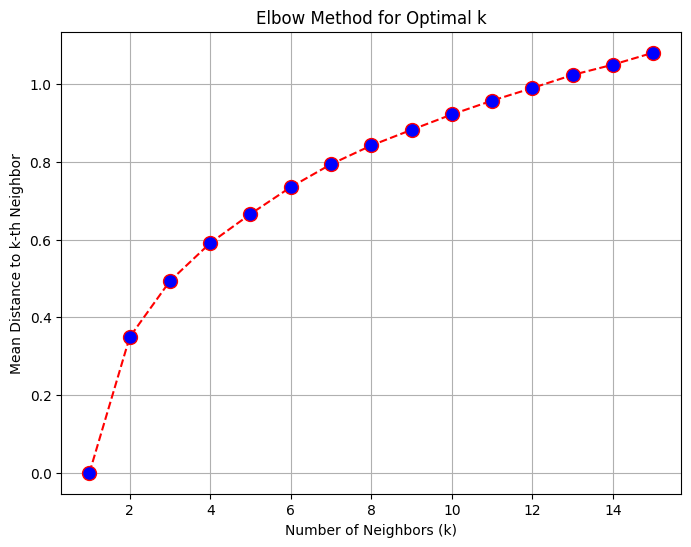

In [17]:
import numpy as np
import matplotlib.pyplot as plt

def elbow_method(X_train_scaled, max_k=15):
    error_rate = []
    neighbors_range = range(1, max_k + 1)

    for k in neighbors_range:
        knn = NearestNeighbors(n_neighbors=k)
        knn.fit(X_train_scaled)
        distances, _ = knn.kneighbors(X_train_scaled)
        error_rate.append(np.mean(distances[:, -1]))

    plt.figure(figsize=(8, 6))
    plt.plot(neighbors_range, error_rate, color='red', linestyle='--', marker='o', markerfacecolor='blue', markersize=10)
    plt.title('Elbow Method for Optimal k')
    plt.xlabel('Number of Neighbors (k)')
    plt.ylabel('Mean Distance to k-th Neighbor')
    plt.grid(True)
    plt.show()

elbow_method(X_train)


In [14]:
# Example query for inference
query = pd.DataFrame({
    'Latitude': [29.9741],
    'Longitude': [-92.1128],
    'Rating': [3],
    'Air Conditioning': [1],
    'Airport shuttle': [0],
    'Bar': [1],
    'Breakfast': [0],
    'Business Centre': [0],
    'Lift': [0],
    'Non-smoking rooms': [0],
    'Pets Allowed': [1],
    'Restaurant': [0],
    'Room service': [0],
    'Swimming pool': [0],
    'WiFi': [1]
})

distances, indices = final_pipeline.named_steps['knn'].kneighbors(query)

nearest_hotel_codes = y_train.iloc[indices[0]].tolist()

print("Nearest Neighbor HotelCodes:", nearest_hotel_codes)

print("Distances to Nearest Neighbors:", distances)

Nearest Neighbor HotelCodes: [1784913, 1672336, 1267843]
Distances to Nearest Neighbors: [[1.41437217 1.73218326 1.90731932]]


In [16]:
import folium

query_lat, query_lon = query['Latitude'].iloc[0], query['Longitude'].iloc[0]
m = folium.Map(location=[query_lat, query_lon], zoom_start=12)

folium.Marker([query_lat, query_lon], popup="Query Hotel", icon=folium.Icon(color='green')).add_to(m)

for i, index in enumerate(indices[0]):
    neighbor_row = X_train.iloc[index]
    hotel_code = y_train.iloc[index]

    folium.Marker([neighbor_row['Latitude'], neighbor_row['Longitude']],
                  popup=f"HotelCode: {hotel_code}",
                  icon=folium.Icon(color='red')).add_to(m)

m.save('nearest_neighbors_map.html')
m